In [1]:
import sys
import random
from tensorflow.compat.v1.keras import backend as KK
import os
import math

from tensorflow import keras
from keras import layers,Model

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import imageio
from sklearn.model_selection import train_test_split
import pydot

from keras.models import Sequential
from keras.layers import Flatten, Dense, Activation,Lambda
from IPython.display import clear_output
from tensorflow.keras.callbacks import EarlyStopping
from keras.utils import plot_model
import scipy.io
from sklearn.utils import shuffle
import joblib
from sklearn.metrics import mean_squared_error

2023-09-14 15:51:31.480219: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
## randomly select N_budget trajectories from N_total trajectories (can be done with other strategies) with seed_number
def random_sampling(N_budget,N_total,seed_number):
    np.random.seed(seed_number)
    select_idx = np.random.choice(N_total,N_budget,replace = False)
    return select_idx

In [3]:
def log_min_max_scale(X,select_idx):
    logX = np.log(X)
    X_train = logX[:,:,select_idx]
    X_max = np.nanmax(X_train)
    X_min = np.nanmin(X_train)
    logX_scaled = (logX-X_min)/(X_max-X_min)-0.5
    return logX_scaled

## Loading and preprocessing

In [4]:
kf_ups_5 = scipy.io.loadmat('../../data/1000kf.mat')['kf_ups_5']
## scaling of input ####################################################
log_kf = np.reshape(np.log10(kf_ups_5[[0,2],:,:]),(-1,kf_ups_5.shape[-1]))
params_kf = (log_kf-np.min(log_kf))/(np.max(log_kf)-np.min(log_kf)) - 0.5

In [5]:
params_res = scipy.io.loadmat('../../data/params')['params'] - 0.5
params = np.concatenate((params_kf,params_res),axis = 0)
print("input parameter shape:", params.shape)

input parameter shape: (14, 1000)


In [6]:
T = scipy.io.loadmat('../../data/QoI3')['Tmax']
print("T shape:", T.shape)

T shape: (200, 1, 1000)


In [7]:
L = scipy.io.loadmat('../../data/QoI3')['L']
L = L[:,0]
print("L shape:", L.shape)

L shape: (1000,)


In [8]:
select_idx = scipy.io.loadmat('../../data/training_idx')['idx_miniMax']# idx_random; idx_sparse; idx_Maxmin; idx_miniMax
select_idx = select_idx[:,0]
print("select_idx shape:", select_idx.shape)

select_idx shape: (100,)


In [9]:
T_scaled = log_min_max_scale(X = T,select_idx = select_idx)
print("T_scaled shape:", T_scaled.shape)

T_scaled shape: (200, 1, 1000)


In [10]:
## try a no scaling first
def set_train(N_mem,N_rec,N_budget,X,select_idx,L,params):
    #####################################################
    N_par = params.shape[0]
    N_MC = params.shape[1]
    d_of_x = 1 # number of variables
    d_input = N_mem *d_of_x + N_par # number of input nodes
    d_output = d_of_x # number of output nodes
    d_outputRNN = N_rec * d_output # total number of output nodes (including recurrence)

    n_data = N_mem + N_rec
    n_burst = 20 # number of segments select from each trajectory
    choice_of_subsampling = 1 # default setting 0: no subsampling; 1: subsampling; 2: select the first (n_data+n_burst) data

    n_hidden = 3 # number of hidden layers
    n_nodes = 10 # number of nodes per hidden layer
    n_epochs = 20_000 # number of epochs for training
    learning_rate = 1e-4 # learning rate
    N_seeds = 10 # number of seeds for ensemble learning
    batch_size = 256 # batch size
    
    #####################################################
    Model_upperdir = 'tanh_logTmax' +'_{}mem'.format(N_mem) +'_{}rec'.format(N_rec) +'_miniMax' \
                    '_{}budget'.format(N_budget)+'_{}'.format(choice_of_subsampling)
    #####################################################
    ## Trajectory subsampling
    QoI_train = np.empty((n_data,d_of_x,0))
    par_train = np.empty((N_par,0))
    if choice_of_subsampling == 0: #no subsampling
        for i in range(N_budget):
            N_seg = L[select_idx[i]] - n_data + 1
            for j in range(N_seg):
                QoI_train = np.concatenate((QoI_train, X[j:j+n_data,:,select_idx[i]:select_idx[i]+1]),axis = 2)
                par_train = np.concatenate((par_train,params[:,select_idx[i],np.newaxis]),axis = 1)
    elif choice_of_subsampling == 1: #subsampling
        for i in range(N_budget):
            N_seg = L[select_idx[i]] - n_data + 1
            if n_burst > N_seg:
                for j in range(N_seg):
                    QoI_train = np.concatenate((QoI_train, X[j:j+n_data,:,select_idx[i]:select_idx[i]+1]),axis = 2)
                    par_train = np.concatenate((par_train,params[:,select_idx[i],np.newaxis]),axis = 1)
            else:
                subsampling_idx = random_sampling(N_budget = n_burst,N_total = N_seg,seed_number = i)
                for j in range(n_burst):
                    QoI_train = np.concatenate((QoI_train, X[subsampling_idx[j]:subsampling_idx[j]+n_data,
                                                             :,select_idx[i]:select_idx[i]+1]),axis = 2)
                    par_train = np.concatenate((par_train,params[:,select_idx[i],np.newaxis]),axis = 1)                
    elif choice_of_subsampling == 2: ## choose first (n_data+n_burst) data
        for i in range(N_budget):
            N_seg = L[select_idx[i]] - n_data + 1
            if n_burst > N_seg:
                for j in range(N_seg):
                    QoI_train = np.concatenate((QoI_train, X[j:j+n_data,:,select_idx[i]:select_idx[i]+1]),axis = 2)
                    par_train = np.concatenate((par_train,params[:,select_idx[i],np.newaxis]),axis = 1)
            else:
                subsampling_idx = np.arange(n_burst)
                for j in range(n_burst):
                    QoI_train = np.concatenate((QoI_train, X[subsampling_idx[j]:subsampling_idx[j]+n_data,
                                                             :,select_idx[i]:select_idx[i]+1]),axis = 2)
                    par_train = np.concatenate((par_train,params[:,select_idx[i],np.newaxis]),axis = 1) 
    else:
        print("specify if subsampling")
    if choice_of_subsampling == 2:  
        print("use the first ", n_data+n_burst, "data")

    print("QoI shape:", QoI_train.shape) ## shape should be (n_data, 1, n_burst * N_budget)
    print("parameter shape:", par_train.shape) ## shape should be (N_par, n_burst * N_budget)
    #####################################################
    ## Input Output
    y_train = np.reshape(QoI_train[-N_rec:,:,:],(-1,QoI_train.shape[2]))
    y_train = y_train.T
    print("y_train shape:", y_train.shape)
    x_train = np.concatenate((np.reshape(QoI_train[:N_mem,:,:],(-1,QoI_train.shape[2])),par_train),axis = 0)
    x_train = x_train.T
    print("x_train shape:", x_train.shape)
    #####################################################
    ## training
    for i in range(N_seeds):
        display(i)

        np.random.seed(i)
        random.seed(i)
        tf.random.set_seed(i)
        Model_dir = Model_upperdir + '/seed_{}/'.format(i)

        session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1,
                                      inter_op_parallelism_threads=1)
        sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
        KK.set_session(sess)
        ## Define Neural Network model----------------------begins------------------- ##
        dense_layer_list=[]
        for __ in range(n_hidden):
            dense_layer = tf.keras.layers.Dense(n_nodes, activation='tanh')
            dense_layer_list += [dense_layer]
        out_layer = tf.keras.layers.Dense(d_output)
        slice_layer_last = tf.keras.layers.Lambda(lambda x: x[:, -d_of_x-N_par:-N_par]) # get the last step state (for ResNet)
        slice_layer_mem = tf.keras.layers.Lambda(lambda x: x[:, d_of_x:-N_par]) # cuts off most recent memory period
        slice_layer_par = tf.keras.layers.Lambda(lambda x: x[:, -N_par:]) # cuts off the parameter part

        inputs = tf.keras.layers.Input(shape=(d_input,))
        x = inputs
        x_last = slice_layer_last(x)
        x_mem = slice_layer_mem(x)
        x_par = slice_layer_par(x)
        for k in range(n_hidden):
            x = dense_layer_list[k](x)
        x = out_layer(x)
        x_add_res = tf.keras.layers.Add()([x,x_last])
        z = x_add_res

        for __ in range(N_rec-1):
            x = tf.keras.layers.Concatenate()([x_mem,x_add_res,x_par])
            x_last = slice_layer_last(x)
            x_mem = slice_layer_mem(x)
            x_par = slice_layer_par(x)
            for k in range(n_hidden):
                x = dense_layer_list[k](x)
            x = out_layer(x)
            x_add_res = tf.keras.layers.Add()([x,x_last])
            z = tf.keras.layers.Concatenate()([z,x_add_res])
        outputs = z
        ## Define Neural Network model----------------------ends--------------------- ##
        model = tf.keras.models.Model(inputs=inputs, outputs=outputs)
        model.compile(optimizer=tf.keras.optimizers.Adam(lr=learning_rate), loss='mean_squared_error')   
        my_callback = tf.keras.callbacks.ModelCheckpoint(Model_dir,monitor="loss",save_best_only=True,save_weights_only=True)
        history = model.fit(x_train, y_train, epochs=n_epochs, batch_size=batch_size, callbacks=my_callback)
        model.load_weights(Model_dir)
        model.save(Model_dir)
        model.summary()

        plt.semilogy(history.history['loss'])
        plt.title('model loss')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.legend(['train'], loc='upper left')
        plt.savefig(Model_dir+'loss_semilog.png', bbox_inches='tight')
        plt.show()
    return

## Training

QoI shape: (30, 1, 2000)
parameter shape: (14, 2000)
y_train shape: (2000, 10)
x_train shape: (2000, 34)


0

Epoch 1/20000
8/8 [==============================] - 2s 10ms/step - loss: 1.5059
Epoch 2/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.1762
Epoch 3/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.1427
Epoch 4/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0845
Epoch 5/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0414
Epoch 6/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0319
Epoch 7/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0295
Epoch 8/20000
8/8 [==============================] - 0s 8ms/step - loss: 0.0255
Epoch 9/20000
8/8 [==============================] - 0s 8ms/step - loss: 0.0220
Epoch 10/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0203
Epoch 11/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0192
Epoch 12/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0181
Epoch 13/20000
8/8 [================

8/8 [==============================] - 0s 7ms/step - loss: 0.0027
Epoch 103/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0027
Epoch 104/20000
8/8 [==============================] - 0s 8ms/step - loss: 0.0027
Epoch 105/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0026
Epoch 106/20000
8/8 [==============================] - 0s 6ms/step - loss: 0.0026
Epoch 107/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0026
Epoch 108/20000
8/8 [==============================] - 0s 6ms/step - loss: 0.0025
Epoch 109/20000
8/8 [==============================] - 0s 6ms/step - loss: 0.0025
Epoch 110/20000
8/8 [==============================] - 0s 6ms/step - loss: 0.0025
Epoch 111/20000
8/8 [==============================] - 0s 6ms/step - loss: 0.0024
Epoch 112/20000
8/8 [==============================] - 0s 6ms/step - loss: 0.0024
Epoch 113/20000
8/8 [==============================] - 0s 6ms/step - loss: 0.0024
Epoch 114/20000
8/8 [===========

8/8 [==============================] - 0s 6ms/step - loss: 9.3768e-04
Epoch 202/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3050e-04
Epoch 203/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.2335e-04
Epoch 204/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1592e-04
Epoch 205/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.0975e-04
Epoch 206/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0211e-04
Epoch 207/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9636e-04
Epoch 208/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8863e-04
Epoch 209/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8193e-04
Epoch 210/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7548e-04
Epoch 211/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.6910e-04
Epoch 212/20000
8/8 [==============================] - 0s 7ms/step - l

8/8 [==============================] - 0s 7ms/step - loss: 5.2182e-04
Epoch 297/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1901e-04
Epoch 298/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1665e-04
Epoch 299/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1321e-04
Epoch 300/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1114e-04
Epoch 301/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0900e-04
Epoch 302/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0552e-04
Epoch 303/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0284e-04
Epoch 304/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0004e-04
Epoch 305/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9866e-04
Epoch 306/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9501e-04
Epoch 307/20000
8/8 [==============================] - 0s 5ms/step - l

8/8 [==============================] - 0s 9ms/step - loss: 3.3199e-04
Epoch 392/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3045e-04
Epoch 393/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2869e-04
Epoch 394/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.2721e-04
Epoch 395/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.2588e-04
Epoch 396/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2436e-04
Epoch 397/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2313e-04
Epoch 398/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2172e-04
Epoch 399/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2017e-04
Epoch 400/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1882e-04
Epoch 401/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1749e-04
Epoch 402/20000
8/8 [==============================] - 0s 7ms/step -

8/8 [==============================] - 0s 6ms/step - loss: 2.2257e-04
Epoch 487/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2192e-04
Epoch 488/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2087e-04
Epoch 489/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1957e-04
Epoch 490/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1977e-04
Epoch 491/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1814e-04
Epoch 492/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1713e-04
Epoch 493/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1618e-04
Epoch 494/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1544e-04
Epoch 495/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1485e-04
Epoch 496/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1502e-04
Epoch 497/20000
8/8 [==============================] - 0s 6ms/step - l

8/8 [==============================] - 0s 7ms/step - loss: 1.5447e-04
Epoch 582/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5382e-04
Epoch 583/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5355e-04
Epoch 584/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5294e-04
Epoch 585/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5170e-04
Epoch 586/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.5101e-04
Epoch 587/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5104e-04
Epoch 588/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5059e-04
Epoch 589/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4939e-04
Epoch 590/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4905e-04
Epoch 591/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4890e-04
Epoch 592/20000
8/8 [==============================] - 0s 7ms/step - l

8/8 [==============================] - 0s 6ms/step - loss: 1.0657e-04
Epoch 677/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0617e-04
Epoch 678/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0630e-04
Epoch 679/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0538e-04
Epoch 680/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0482e-04
Epoch 681/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0541e-04
Epoch 682/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0610e-04
Epoch 683/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0425e-04
Epoch 684/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0424e-04
Epoch 685/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0301e-04
Epoch 686/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0277e-04
Epoch 687/20000
8/8 [==============================] - 0s 7ms/step - l

8/8 [==============================] - 0s 4ms/step - loss: 7.4949e-05
Epoch 772/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3964e-05
Epoch 773/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3030e-05
Epoch 774/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3752e-05
Epoch 775/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3997e-05
Epoch 776/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2825e-05
Epoch 777/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2766e-05
Epoch 778/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1793e-05
Epoch 779/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.1145e-05
Epoch 780/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0898e-05
Epoch 781/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0825e-05
Epoch 782/20000
8/8 [==============================] - 0s 4ms/step - l

8/8 [==============================] - 0s 5ms/step - loss: 5.4388e-05
Epoch 867/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6186e-05
Epoch 868/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6342e-05
Epoch 869/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5250e-05
Epoch 870/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4632e-05
Epoch 871/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3859e-05
Epoch 872/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3480e-05
Epoch 873/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.3488e-05
Epoch 874/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3178e-05
Epoch 875/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2866e-05
Epoch 876/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.2749e-05
Epoch 877/20000
8/8 [==============================] - 0s 4ms/step - 

8/8 [==============================] - 0s 4ms/step - loss: 4.5772e-05
Epoch 962/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3593e-05
Epoch 963/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2233e-05
Epoch 964/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2335e-05
Epoch 965/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3679e-05
Epoch 966/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3263e-05
Epoch 967/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.2319e-05
Epoch 968/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2641e-05
Epoch 969/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4015e-05
Epoch 970/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.5653e-05
Epoch 971/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4699e-05
Epoch 972/20000
8/8 [==============================] - 0s 4ms/step - l

8/8 [==============================] - 0s 4ms/step - loss: 3.6549e-05
Epoch 1056/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7030e-05
Epoch 1057/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7830e-05
Epoch 1058/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7713e-05
Epoch 1059/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5683e-05
Epoch 1060/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7623e-05
Epoch 1061/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8494e-05
Epoch 1062/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8268e-05
Epoch 1063/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.8166e-05
Epoch 1064/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7373e-05
Epoch 1065/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6126e-05
Epoch 1066/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 3.0796e-05
Epoch 1150/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3733e-05
Epoch 1151/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4723e-05
Epoch 1152/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7016e-05
Epoch 1153/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.0112e-05
Epoch 1154/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2040e-05
Epoch 1155/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2569e-05
Epoch 1156/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0833e-05
Epoch 1157/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2664e-05
Epoch 1158/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0673e-05
Epoch 1159/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0664e-05
Epoch 1160/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 2.8244e-05
Epoch 1244/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0662e-05
Epoch 1245/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9621e-05
Epoch 1246/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0828e-05
Epoch 1247/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2238e-05
Epoch 1248/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9668e-05
Epoch 1249/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9920e-05
Epoch 1250/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1001e-05
Epoch 1251/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1762e-05
Epoch 1252/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7746e-05
Epoch 1253/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8485e-05
Epoch 1254/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 4ms/step - loss: 2.9525e-05
Epoch 1338/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1155e-05
Epoch 1339/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7391e-05
Epoch 1340/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0289e-05
Epoch 1341/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0908e-05
Epoch 1342/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6348e-05
Epoch 1343/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5999e-05
Epoch 1344/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7324e-05
Epoch 1345/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4866e-05
Epoch 1346/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6574e-05
Epoch 1347/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4897e-05
Epoch 1348/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 2.4523e-05
Epoch 1432/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5694e-05
Epoch 1433/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4918e-05
Epoch 1434/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4351e-05
Epoch 1435/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4054e-05
Epoch 1436/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1989e-05
Epoch 1437/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2692e-05
Epoch 1438/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4317e-05
Epoch 1439/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1838e-05
Epoch 1440/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7890e-05
Epoch 1441/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3918e-05
Epoch 1442/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 8ms/step - loss: 2.0670e-05
Epoch 1526/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0612e-05
Epoch 1527/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0205e-05
Epoch 1528/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2844e-05
Epoch 1529/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2289e-05
Epoch 1530/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8303e-05
Epoch 1531/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9345e-05
Epoch 1532/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1590e-05
Epoch 1533/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3222e-05
Epoch 1534/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1089e-05
Epoch 1535/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2820e-05
Epoch 1536/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 2.0677e-05
Epoch 1620/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1234e-05
Epoch 1621/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4615e-05
Epoch 1622/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4765e-05
Epoch 1623/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6722e-05
Epoch 1624/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8935e-05
Epoch 1625/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9105e-05
Epoch 1626/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0181e-05
Epoch 1627/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1302e-05
Epoch 1628/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4542e-05
Epoch 1629/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0963e-05
Epoch 1630/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.9932e-05
Epoch 1714/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0340e-05
Epoch 1715/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9600e-05
Epoch 1716/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9167e-05
Epoch 1717/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8821e-05
Epoch 1718/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1384e-05
Epoch 1719/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0335e-05
Epoch 1720/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0272e-05
Epoch 1721/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9905e-05
Epoch 1722/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2043e-05
Epoch 1723/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0651e-05
Epoch 1724/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 7ms/step - loss: 1.8037e-05
Epoch 1808/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8828e-05
Epoch 1809/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9726e-05
Epoch 1810/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0764e-05
Epoch 1811/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7669e-05
Epoch 1812/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6233e-05
Epoch 1813/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5044e-05
Epoch 1814/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2700e-05
Epoch 1815/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2453e-05
Epoch 1816/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3397e-05
Epoch 1817/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3496e-05
Epoch 1818/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 3ms/step - loss: 1.9956e-05
Epoch 1902/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8021e-05
Epoch 1903/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9401e-05
Epoch 1904/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8448e-05
Epoch 1905/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8250e-05
Epoch 1906/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7899e-05
Epoch 1907/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0098e-05
Epoch 1908/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4035e-05
Epoch 1909/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9940e-05
Epoch 1910/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3064e-05
Epoch 1911/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3413e-05
Epoch 1912/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.8822e-05
Epoch 1996/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0496e-05
Epoch 1997/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4294e-05
Epoch 1998/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8694e-05
Epoch 1999/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6767e-05
Epoch 2000/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8982e-05
Epoch 2001/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2173e-05
Epoch 2002/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0767e-05
Epoch 2003/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8439e-05
Epoch 2004/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5089e-05
Epoch 2005/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6490e-05
Epoch 2006/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 5ms/step - loss: 1.9806e-05
Epoch 2090/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7714e-05
Epoch 2091/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0440e-05
Epoch 2092/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3189e-05
Epoch 2093/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4608e-05
Epoch 2094/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2801e-05
Epoch 2095/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8244e-05
Epoch 2096/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0005e-05
Epoch 2097/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9701e-05
Epoch 2098/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0022e-05
Epoch 2099/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3922e-05
Epoch 2100/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 2.1132e-05
Epoch 2184/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6925e-05
Epoch 2185/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0022e-05
Epoch 2186/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.7867e-05
Epoch 2187/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9070e-05
Epoch 2188/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0696e-05
Epoch 2189/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6815e-05
Epoch 2190/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8398e-05
Epoch 2191/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4608e-05
Epoch 2192/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6440e-05
Epoch 2193/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5715e-05
Epoch 2194/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 2.2070e-05
Epoch 2278/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9562e-05
Epoch 2279/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1772e-05
Epoch 2280/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.9092e-05
Epoch 2281/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6670e-05
Epoch 2282/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8312e-05
Epoch 2283/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8658e-05
Epoch 2284/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7201e-05
Epoch 2285/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6374e-05
Epoch 2286/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5647e-05
Epoch 2287/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7043e-05
Epoch 2288/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.4605e-05
Epoch 2372/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5466e-05
Epoch 2373/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6377e-05
Epoch 2374/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6718e-05
Epoch 2375/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0793e-05
Epoch 2376/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5793e-05
Epoch 2377/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9855e-05
Epoch 2378/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4898e-05
Epoch 2379/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6240e-05
Epoch 2380/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6428e-05
Epoch 2381/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5800e-05
Epoch 2382/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 2.1766e-05
Epoch 2466/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9622e-05
Epoch 2467/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8590e-05
Epoch 2468/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0131e-05
Epoch 2469/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0810e-05
Epoch 2470/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.9207e-05
Epoch 2471/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5367e-05
Epoch 2472/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5655e-05
Epoch 2473/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.6262e-05
Epoch 2474/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5142e-05
Epoch 2475/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5556e-05
Epoch 2476/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 2.1066e-05
Epoch 2560/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0669e-05
Epoch 2561/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5817e-05
Epoch 2562/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7802e-05
Epoch 2563/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4534e-05
Epoch 2564/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7278e-05
Epoch 2565/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1133e-05
Epoch 2566/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5772e-05
Epoch 2567/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4663e-05
Epoch 2568/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5179e-05
Epoch 2569/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7023e-05
Epoch 2570/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.4491e-05
Epoch 2654/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5499e-05
Epoch 2655/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5701e-05
Epoch 2656/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4517e-05
Epoch 2657/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3318e-05
Epoch 2658/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7379e-05
Epoch 2659/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6146e-05
Epoch 2660/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8756e-05
Epoch 2661/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6774e-05
Epoch 2662/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4414e-05
Epoch 2663/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4927e-05
Epoch 2664/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.6640e-05
Epoch 2748/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4065e-05
Epoch 2749/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3367e-05
Epoch 2750/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6403e-05
Epoch 2751/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6308e-05
Epoch 2752/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3502e-05
Epoch 2753/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3711e-05
Epoch 2754/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5217e-05
Epoch 2755/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6816e-05
Epoch 2756/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7879e-05
Epoch 2757/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8066e-05
Epoch 2758/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 3ms/step - loss: 1.3953e-05
Epoch 2842/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5656e-05
Epoch 2843/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4516e-05
Epoch 2844/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.7994e-05
Epoch 2845/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0341e-05
Epoch 2846/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6602e-05
Epoch 2847/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4339e-05
Epoch 2848/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8025e-05
Epoch 2849/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8775e-05
Epoch 2850/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8392e-05
Epoch 2851/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5721e-05
Epoch 2852/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.5361e-05
Epoch 2936/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3727e-05
Epoch 2937/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4688e-05
Epoch 2938/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3311e-05
Epoch 2939/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2802e-05
Epoch 2940/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3473e-05
Epoch 2941/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4636e-05
Epoch 2942/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5898e-05
Epoch 2943/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8576e-05
Epoch 2944/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8554e-05
Epoch 2945/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2403e-05
Epoch 2946/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.6973e-05
Epoch 3030/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2995e-05
Epoch 3031/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3180e-05
Epoch 3032/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3525e-05
Epoch 3033/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2817e-05
Epoch 3034/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2112e-05
Epoch 3035/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5344e-05
Epoch 3036/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4598e-05
Epoch 3037/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3705e-05
Epoch 3038/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1653e-05
Epoch 3039/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2124e-05
Epoch 3040/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 3ms/step - loss: 1.5034e-05
Epoch 3124/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6179e-05
Epoch 3125/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3659e-05
Epoch 3126/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2713e-05
Epoch 3127/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2086e-05
Epoch 3128/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2783e-05
Epoch 3129/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3057e-05
Epoch 3130/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3611e-05
Epoch 3131/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6664e-05
Epoch 3132/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5447e-05
Epoch 3133/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2329e-05
Epoch 3134/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.3399e-05
Epoch 3218/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2732e-05
Epoch 3219/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3275e-05
Epoch 3220/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5183e-05
Epoch 3221/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4065e-05
Epoch 3222/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3806e-05
Epoch 3223/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5439e-05
Epoch 3224/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3012e-05
Epoch 3225/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2331e-05
Epoch 3226/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2485e-05
Epoch 3227/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2756e-05
Epoch 3228/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 5ms/step - loss: 1.2392e-05
Epoch 3312/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2152e-05
Epoch 3313/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2466e-05
Epoch 3314/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2798e-05
Epoch 3315/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1865e-05
Epoch 3316/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3882e-05
Epoch 3317/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4955e-05
Epoch 3318/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5966e-05
Epoch 3319/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4664e-05
Epoch 3320/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3633e-05
Epoch 3321/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1876e-05
Epoch 3322/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.2601e-05
Epoch 3406/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5516e-05
Epoch 3407/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3874e-05
Epoch 3408/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3373e-05
Epoch 3409/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1498e-05
Epoch 3410/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1380e-05
Epoch 3411/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4617e-05
Epoch 3412/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2982e-05
Epoch 3413/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0887e-05
Epoch 3414/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1498e-05
Epoch 3415/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2373e-05
Epoch 3416/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.2379e-05
Epoch 3500/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3631e-05
Epoch 3501/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2860e-05
Epoch 3502/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2461e-05
Epoch 3503/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2039e-05
Epoch 3504/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1178e-05
Epoch 3505/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1521e-05
Epoch 3506/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1547e-05
Epoch 3507/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1392e-05
Epoch 3508/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4228e-05
Epoch 3509/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3068e-05
Epoch 3510/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.9797e-05
Epoch 3594/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.7693e-05
Epoch 3595/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7975e-05
Epoch 3596/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6468e-05
Epoch 3597/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2428e-05
Epoch 3598/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1770e-05
Epoch 3599/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1582e-05
Epoch 3600/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5954e-05
Epoch 3601/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3727e-05
Epoch 3602/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4924e-05
Epoch 3603/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.8582e-05
Epoch 3604/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 3ms/step - loss: 1.0980e-05
Epoch 3688/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3643e-05
Epoch 3689/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0717e-05
Epoch 3690/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1980e-05
Epoch 3691/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0695e-05
Epoch 3692/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2327e-05
Epoch 3693/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0927e-05
Epoch 3694/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1190e-05
Epoch 3695/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2394e-05
Epoch 3696/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4423e-05
Epoch 3697/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0127e-05
Epoch 3698/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.0620e-05
Epoch 3782/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1111e-05
Epoch 3783/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4556e-05
Epoch 3784/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4609e-05
Epoch 3785/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8283e-05
Epoch 3786/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1663e-05
Epoch 3787/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2496e-05
Epoch 3788/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2170e-05
Epoch 3789/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4681e-05
Epoch 3790/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2677e-05
Epoch 3791/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2739e-05
Epoch 3792/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.1626e-05
Epoch 3876/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0642e-05
Epoch 3877/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0540e-05
Epoch 3878/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0772e-05
Epoch 3879/20000
8/8 [==============================] - 0s 15ms/step - loss: 9.6716e-06
Epoch 3880/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0806e-05
Epoch 3881/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3251e-05
Epoch 3882/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1622e-05
Epoch 3883/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0747e-05
Epoch 3884/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0595e-05
Epoch 3885/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3470e-05
Epoch 3886/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 3ms/step - loss: 1.4945e-05
Epoch 3970/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3451e-05
Epoch 3971/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0548e-05
Epoch 3972/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2580e-05
Epoch 3973/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3421e-05
Epoch 3974/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2102e-05
Epoch 3975/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1460e-05
Epoch 3976/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2082e-05
Epoch 3977/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0671e-05
Epoch 3978/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0818e-05
Epoch 3979/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1832e-05
Epoch 3980/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.1157e-05
Epoch 4064/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2101e-05
Epoch 4065/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2454e-05
Epoch 4066/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1415e-05
Epoch 4067/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0370e-05
Epoch 4068/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2032e-05
Epoch 4069/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5535e-05
Epoch 4070/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5443e-05
Epoch 4071/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.8269e-05
Epoch 4072/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.6636e-05
Epoch 4073/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.6537e-05
Epoch 4074/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.2931e-05
Epoch 4158/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3920e-05
Epoch 4159/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0930e-05
Epoch 4160/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1265e-05
Epoch 4161/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3865e-05
Epoch 4162/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.9158e-05
Epoch 4163/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6126e-05
Epoch 4164/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5742e-05
Epoch 4165/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1834e-05
Epoch 4166/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0455e-05
Epoch 4167/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0478e-05
Epoch 4168/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.0713e-05
Epoch 4252/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0755e-05
Epoch 4253/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0131e-05
Epoch 4254/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1355e-05
Epoch 4255/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2432e-05
Epoch 4256/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1101e-05
Epoch 4257/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2008e-05
Epoch 4258/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0547e-05
Epoch 4259/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0893e-05
Epoch 4260/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2558e-05
Epoch 4261/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4919e-05
Epoch 4262/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.0851e-05
Epoch 4346/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.8578e-06
Epoch 4347/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3552e-05
Epoch 4348/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3034e-05
Epoch 4349/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.6757e-06
Epoch 4350/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.5985e-06
Epoch 4351/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1314e-05
Epoch 4352/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1650e-05
Epoch 4353/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5405e-05
Epoch 4354/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2735e-05
Epoch 4355/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1210e-05
Epoch 4356/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 9.2455e-06
Epoch 4440/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.7645e-06
Epoch 4441/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1817e-05
Epoch 4442/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1317e-05
Epoch 4443/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0203e-05
Epoch 4444/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0237e-05
Epoch 4445/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3959e-05
Epoch 4446/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0126e-05
Epoch 4447/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0002e-05
Epoch 4448/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0901e-05
Epoch 4449/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1956e-05
Epoch 4450/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 9.8189e-06
Epoch 4534/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4525e-06
Epoch 4535/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.8708e-06
Epoch 4536/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3340e-06
Epoch 4537/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6128e-06
Epoch 4538/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0454e-05
Epoch 4539/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.8205e-06
Epoch 4540/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1246e-05
Epoch 4541/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1690e-05
Epoch 4542/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4417e-05
Epoch 4543/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1287e-05
Epoch 4544/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.1966e-05
Epoch 4628/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0431e-05
Epoch 4629/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7294e-06
Epoch 4630/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0732e-05
Epoch 4631/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2473e-06
Epoch 4632/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3438e-06
Epoch 4633/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6862e-06
Epoch 4634/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6246e-06
Epoch 4635/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0876e-05
Epoch 4636/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2105e-05
Epoch 4637/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2137e-05
Epoch 4638/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.1083e-05
Epoch 4722/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.6651e-06
Epoch 4723/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0019e-05
Epoch 4724/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0736e-05
Epoch 4725/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0190e-05
Epoch 4726/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2243e-05
Epoch 4727/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.4255e-05
Epoch 4728/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5616e-05
Epoch 4729/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1700e-05
Epoch 4730/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0712e-05
Epoch 4731/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7851e-06
Epoch 4732/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.0166e-05
Epoch 4816/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1682e-05
Epoch 4817/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0263e-05
Epoch 4818/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0280e-05
Epoch 4819/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0782e-05
Epoch 4820/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0107e-05
Epoch 4821/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0114e-05
Epoch 4822/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1891e-05
Epoch 4823/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0288e-05
Epoch 4824/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5949e-06
Epoch 4825/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2096e-06
Epoch 4826/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 3ms/step - loss: 1.0396e-05
Epoch 4910/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0573e-05
Epoch 4911/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9794e-06
Epoch 4912/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1147e-05
Epoch 4913/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0783e-05
Epoch 4914/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2153e-05
Epoch 4915/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0737e-05
Epoch 4916/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0326e-05
Epoch 4917/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7039e-06
Epoch 4918/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0195e-05
Epoch 4919/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0540e-05
Epoch 4920/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.1639e-05
Epoch 5004/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0219e-05
Epoch 5005/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.7421e-06
Epoch 5006/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.4786e-06
Epoch 5007/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1489e-05
Epoch 5008/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4093e-05
Epoch 5009/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5272e-05
Epoch 5010/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1418e-05
Epoch 5011/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2957e-05
Epoch 5012/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3320e-05
Epoch 5013/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1188e-05
Epoch 5014/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.1839e-05
Epoch 5098/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.5730e-06
Epoch 5099/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1885e-05
Epoch 5100/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0145e-05
Epoch 5101/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0654e-05
Epoch 5102/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0099e-05
Epoch 5103/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0558e-05
Epoch 5104/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8959e-06
Epoch 5105/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8711e-06
Epoch 5106/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0320e-05
Epoch 5107/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0841e-05
Epoch 5108/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.1049e-05
Epoch 5192/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0999e-05
Epoch 5193/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2080e-05
Epoch 5194/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0187e-05
Epoch 5195/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0336e-05
Epoch 5196/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.1573e-06
Epoch 5197/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5562e-06
Epoch 5198/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0377e-06
Epoch 5199/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0011e-05
Epoch 5200/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.6149e-06
Epoch 5201/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0304e-05
Epoch 5202/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.3132e-05
Epoch 5286/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0368e-05
Epoch 5287/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0224e-05
Epoch 5288/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3894e-06
Epoch 5289/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0781e-05
Epoch 5290/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2843e-05
Epoch 5291/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2752e-05
Epoch 5292/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1265e-05
Epoch 5293/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2635e-05
Epoch 5294/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0909e-05
Epoch 5295/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2508e-05
Epoch 5296/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.2300e-05
Epoch 5380/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1169e-05
Epoch 5381/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1940e-06
Epoch 5382/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.4084e-06
Epoch 5383/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.9529e-06
Epoch 5384/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8759e-06
Epoch 5385/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0356e-05
Epoch 5386/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0576e-05
Epoch 5387/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0413e-05
Epoch 5388/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5372e-06
Epoch 5389/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3406e-06
Epoch 5390/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 9.9751e-06
Epoch 5474/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0391e-05
Epoch 5475/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0101e-05
Epoch 5476/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1648e-05
Epoch 5477/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1046e-05
Epoch 5478/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0006e-05
Epoch 5479/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1722e-05
Epoch 5480/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1386e-05
Epoch 5481/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3529e-05
Epoch 5482/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5822e-05
Epoch 5483/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2257e-05
Epoch 5484/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 9.1900e-06
Epoch 5568/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0272e-05
Epoch 5569/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9086e-06
Epoch 5570/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2517e-06
Epoch 5571/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3028e-06
Epoch 5572/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8129e-06
Epoch 5573/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0112e-05
Epoch 5574/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0628e-05
Epoch 5575/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1533e-05
Epoch 5576/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4042e-06
Epoch 5577/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1775e-05
Epoch 5578/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.5418e-05
Epoch 5662/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4719e-05
Epoch 5663/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3025e-05
Epoch 5664/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0522e-05
Epoch 5665/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0405e-05
Epoch 5666/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7738e-06
Epoch 5667/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.5620e-06
Epoch 5668/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5431e-06
Epoch 5669/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0732e-05
Epoch 5670/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1470e-06
Epoch 5671/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6885e-06
Epoch 5672/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 9.4707e-06
Epoch 5756/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0362e-06
Epoch 5757/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6653e-06
Epoch 5758/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3856e-06
Epoch 5759/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0527e-05
Epoch 5760/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0107e-05
Epoch 5761/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0271e-05
Epoch 5762/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.6861e-06
Epoch 5763/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1400e-06
Epoch 5764/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9145e-06
Epoch 5765/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2303e-05
Epoch 5766/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 9.7682e-06
Epoch 5850/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.9868e-06
Epoch 5851/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2339e-06
Epoch 5852/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8985e-06
Epoch 5853/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.5592e-06
Epoch 5854/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0319e-06
Epoch 5855/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7908e-06
Epoch 5856/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.3588e-06
Epoch 5857/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3608e-06
Epoch 5858/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9965e-06
Epoch 5859/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1422e-05
Epoch 5860/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 8.8555e-06
Epoch 5944/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.7891e-06
Epoch 5945/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.1020e-06
Epoch 5946/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0871e-06
Epoch 5947/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2481e-05
Epoch 5948/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1082e-05
Epoch 5949/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0166e-05
Epoch 5950/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6633e-06
Epoch 5951/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2466e-06
Epoch 5952/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5634e-06
Epoch 5953/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4681e-06
Epoch 5954/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 8.9583e-06
Epoch 6038/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4195e-06
Epoch 6039/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0324e-05
Epoch 6040/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1382e-05
Epoch 6041/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2043e-05
Epoch 6042/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3509e-06
Epoch 6043/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9256e-06
Epoch 6044/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.6293e-06
Epoch 6045/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8382e-06
Epoch 6046/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.6480e-06
Epoch 6047/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9815e-06
Epoch 6048/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 6ms/step - loss: 7.6513e-06
Epoch 6132/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.8933e-06
Epoch 6133/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7986e-06
Epoch 6134/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1493e-05
Epoch 6135/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1859e-05
Epoch 6136/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2457e-05
Epoch 6137/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5621e-05
Epoch 6138/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1683e-05
Epoch 6139/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0544e-05
Epoch 6140/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2397e-05
Epoch 6141/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2525e-05
Epoch 6142/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 3ms/step - loss: 7.7385e-06
Epoch 6226/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.8978e-06
Epoch 6227/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2420e-06
Epoch 6228/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3843e-06
Epoch 6229/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7021e-06
Epoch 6230/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2667e-06
Epoch 6231/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9256e-06
Epoch 6232/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.5583e-06
Epoch 6233/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1170e-05
Epoch 6234/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1501e-05
Epoch 6235/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9889e-06
Epoch 6236/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 8.0547e-06
Epoch 6320/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4194e-06
Epoch 6321/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3506e-06
Epoch 6322/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7782e-06
Epoch 6323/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5176e-06
Epoch 6324/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2188e-06
Epoch 6325/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3132e-06
Epoch 6326/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0805e-05
Epoch 6327/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0264e-05
Epoch 6328/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0456e-05
Epoch 6329/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3611e-06
Epoch 6330/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.9533e-05
Epoch 6414/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7646e-05
Epoch 6415/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3794e-06
Epoch 6416/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5887e-06
Epoch 6417/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3841e-06
Epoch 6418/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8734e-06
Epoch 6419/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1643e-06
Epoch 6420/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3292e-06
Epoch 6421/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7787e-06
Epoch 6422/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5577e-06
Epoch 6423/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0364e-06
Epoch 6424/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.1118e-05
Epoch 6508/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0171e-05
Epoch 6509/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0597e-06
Epoch 6510/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8898e-06
Epoch 6511/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7541e-06
Epoch 6512/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6632e-06
Epoch 6513/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7867e-06
Epoch 6514/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7757e-06
Epoch 6515/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7545e-06
Epoch 6516/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3639e-05
Epoch 6517/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0004e-05
Epoch 6518/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.0889e-05
Epoch 6602/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4274e-06
Epoch 6603/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9151e-06
Epoch 6604/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4392e-06
Epoch 6605/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1080e-06
Epoch 6606/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5163e-06
Epoch 6607/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2855e-06
Epoch 6608/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0372e-06
Epoch 6609/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1134e-06
Epoch 6610/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.0353e-06
Epoch 6611/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.3318e-06
Epoch 6612/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 7.1422e-06
Epoch 6696/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7350e-06
Epoch 6697/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.3889e-06
Epoch 6698/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1491e-06
Epoch 6699/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.3910e-05
Epoch 6700/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5182e-05
Epoch 6701/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1269e-05
Epoch 6702/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8057e-06
Epoch 6703/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.8644e-06
Epoch 6704/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9868e-06
Epoch 6705/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.3865e-06
Epoch 6706/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 3ms/step - loss: 8.4725e-06
Epoch 6790/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8794e-06
Epoch 6791/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5613e-06
Epoch 6792/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.0238e-05
Epoch 6793/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6823e-06
Epoch 6794/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.2471e-06
Epoch 6795/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9039e-06
Epoch 6796/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0129e-05
Epoch 6797/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6632e-05
Epoch 6798/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2713e-05
Epoch 6799/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0965e-05
Epoch 6800/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 7.4268e-06
Epoch 6884/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7773e-06
Epoch 6885/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4685e-06
Epoch 6886/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1604e-05
Epoch 6887/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7012e-06
Epoch 6888/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0619e-05
Epoch 6889/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0302e-05
Epoch 6890/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8264e-06
Epoch 6891/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.3066e-06
Epoch 6892/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.0285e-06
Epoch 6893/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6781e-06
Epoch 6894/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 1.0166e-05
Epoch 6978/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0722e-06
Epoch 6979/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.3355e-06
Epoch 6980/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4933e-06
Epoch 6981/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.5560e-06
Epoch 6982/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1289e-06
Epoch 6983/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3674e-06
Epoch 6984/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4987e-06
Epoch 6985/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.5900e-06
Epoch 6986/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.4055e-06
Epoch 6987/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8140e-06
Epoch 6988/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 7.8310e-06
Epoch 7072/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4931e-06
Epoch 7073/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5332e-06
Epoch 7074/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4089e-06
Epoch 7075/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5106e-06
Epoch 7076/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4348e-06
Epoch 7077/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0675e-05
Epoch 7078/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5627e-06
Epoch 7079/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7756e-06
Epoch 7080/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.8213e-06
Epoch 7081/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0811e-06
Epoch 7082/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 8.6250e-06
Epoch 7166/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5273e-06
Epoch 7167/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0102e-05
Epoch 7168/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3979e-06
Epoch 7169/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0231e-06
Epoch 7170/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0021e-06
Epoch 7171/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6263e-06
Epoch 7172/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8594e-06
Epoch 7173/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3012e-06
Epoch 7174/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8414e-06
Epoch 7175/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8454e-06
Epoch 7176/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 7.7875e-06
Epoch 7260/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1525e-06
Epoch 7261/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2989e-06
Epoch 7262/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4214e-06
Epoch 7263/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5478e-06
Epoch 7264/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2748e-06
Epoch 7265/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4869e-06
Epoch 7266/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6014e-06
Epoch 7267/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3487e-06
Epoch 7268/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1363e-05
Epoch 7269/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1610e-05
Epoch 7270/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 9.3486e-06
Epoch 7354/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8471e-06
Epoch 7355/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.3077e-06
Epoch 7356/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0784e-06
Epoch 7357/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.0103e-06
Epoch 7358/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0466e-06
Epoch 7359/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8422e-06
Epoch 7360/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0715e-06
Epoch 7361/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2330e-06
Epoch 7362/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.0660e-06
Epoch 7363/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2268e-06
Epoch 7364/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 7.3754e-06
Epoch 7448/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4995e-06
Epoch 7449/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.8576e-06
Epoch 7450/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4394e-06
Epoch 7451/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0239e-06
Epoch 7452/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7909e-06
Epoch 7453/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4810e-06
Epoch 7454/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0463e-06
Epoch 7455/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1433e-06
Epoch 7456/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0285e-06
Epoch 7457/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2057e-06
Epoch 7458/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 8.7514e-06
Epoch 7542/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2877e-06
Epoch 7543/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3320e-06
Epoch 7544/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5601e-06
Epoch 7545/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9212e-06
Epoch 7546/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0606e-06
Epoch 7547/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9350e-06
Epoch 7548/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6714e-06
Epoch 7549/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3808e-06
Epoch 7550/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1479e-06
Epoch 7551/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1270e-06
Epoch 7552/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 6.8576e-06
Epoch 7636/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0936e-06
Epoch 7637/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3624e-06
Epoch 7638/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2637e-06
Epoch 7639/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0205e-05
Epoch 7640/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.3602e-06
Epoch 7641/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7565e-06
Epoch 7642/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4903e-06
Epoch 7643/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0037e-06
Epoch 7644/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4378e-06
Epoch 7645/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.9225e-06
Epoch 7646/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 5.9549e-06
Epoch 7730/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4650e-06
Epoch 7731/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8467e-06
Epoch 7732/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6709e-06
Epoch 7733/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.8472e-06
Epoch 7734/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3061e-06
Epoch 7735/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1706e-06
Epoch 7736/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1419e-06
Epoch 7737/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9557e-06
Epoch 7738/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8010e-06
Epoch 7739/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8747e-06
Epoch 7740/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 7.1189e-06
Epoch 7824/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9743e-06
Epoch 7825/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9729e-06
Epoch 7826/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0616e-06
Epoch 7827/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9083e-06
Epoch 7828/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2659e-06
Epoch 7829/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.6193e-06
Epoch 7830/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7263e-06
Epoch 7831/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6643e-06
Epoch 7832/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.7685e-06
Epoch 7833/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9543e-06
Epoch 7834/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 6.2213e-06
Epoch 7918/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9600e-06
Epoch 7919/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7968e-06
Epoch 7920/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1602e-06
Epoch 7921/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4249e-06
Epoch 7922/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0467e-06
Epoch 7923/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3603e-06
Epoch 7924/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1411e-06
Epoch 7925/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8845e-06
Epoch 7926/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6774e-06
Epoch 7927/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8136e-06
Epoch 7928/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 8.1947e-06
Epoch 8012/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9254e-06
Epoch 8013/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9067e-06
Epoch 8014/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.7591e-06
Epoch 8015/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2245e-06
Epoch 8016/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9823e-06
Epoch 8017/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.2997e-06
Epoch 8018/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.4218e-06
Epoch 8019/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.7396e-06
Epoch 8020/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6471e-06
Epoch 8021/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8088e-06
Epoch 8022/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 5.9019e-06
Epoch 8106/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2136e-06
Epoch 8107/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2226e-06
Epoch 8108/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1366e-06
Epoch 8109/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0726e-06
Epoch 8110/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.8192e-06
Epoch 8111/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7921e-06
Epoch 8112/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8386e-06
Epoch 8113/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1169e-06
Epoch 8114/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5013e-06
Epoch 8115/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3929e-06
Epoch 8116/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 3ms/step - loss: 5.1814e-06
Epoch 8200/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1648e-06
Epoch 8201/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3470e-06
Epoch 8202/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1660e-06
Epoch 8203/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1590e-06
Epoch 8204/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2130e-06
Epoch 8205/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9224e-06
Epoch 8206/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5024e-06
Epoch 8207/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4488e-06
Epoch 8208/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.8000e-06
Epoch 8209/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4415e-06
Epoch 8210/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 8.0840e-06
Epoch 8294/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8431e-06
Epoch 8295/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0086e-06
Epoch 8296/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4241e-06
Epoch 8297/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0806e-06
Epoch 8298/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.7487e-06
Epoch 8299/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7548e-06
Epoch 8300/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.3789e-06
Epoch 8301/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5057e-06
Epoch 8302/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.0241e-06
Epoch 8303/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6103e-06
Epoch 8304/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 5.6437e-06
Epoch 8388/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9566e-06
Epoch 8389/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.1490e-06
Epoch 8390/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7202e-06
Epoch 8391/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0029e-06
Epoch 8392/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7832e-06
Epoch 8393/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2409e-06
Epoch 8394/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0928e-06
Epoch 8395/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2215e-06
Epoch 8396/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4042e-06
Epoch 8397/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4953e-06
Epoch 8398/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.3587e-06
Epoch 8482/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0104e-05
Epoch 8483/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.7336e-06
Epoch 8484/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.0261e-06
Epoch 8485/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.1341e-06
Epoch 8486/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8269e-06
Epoch 8487/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7953e-06
Epoch 8488/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.0407e-06
Epoch 8489/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.3783e-06
Epoch 8490/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0209e-06
Epoch 8491/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1073e-06
Epoch 8492/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 4.8591e-06
Epoch 8576/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2504e-06
Epoch 8577/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7043e-06
Epoch 8578/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1666e-06
Epoch 8579/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9186e-06
Epoch 8580/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2188e-06
Epoch 8581/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.9605e-06
Epoch 8582/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7646e-06
Epoch 8583/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6673e-06
Epoch 8584/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3013e-06
Epoch 8585/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0528e-06
Epoch 8586/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 4.7233e-06
Epoch 8670/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8595e-06
Epoch 8671/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1858e-06
Epoch 8672/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0266e-06
Epoch 8673/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.5835e-06
Epoch 8674/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2582e-06
Epoch 8675/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4979e-06
Epoch 8676/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8917e-06
Epoch 8677/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.7008e-06
Epoch 8678/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.7708e-06
Epoch 8679/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2301e-06
Epoch 8680/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 9.2218e-06
Epoch 8764/20000
8/8 [==============================] - 0s 3ms/step - loss: 8.7664e-06
Epoch 8765/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.8197e-06
Epoch 8766/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0396e-06
Epoch 8767/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2518e-06
Epoch 8768/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8719e-06
Epoch 8769/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5352e-06
Epoch 8770/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0448e-06
Epoch 8771/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.5099e-06
Epoch 8772/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5617e-06
Epoch 8773/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0753e-06
Epoch 8774/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 5ms/step - loss: 5.2790e-06
Epoch 8858/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8776e-06
Epoch 8859/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.7171e-06
Epoch 8860/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7285e-06
Epoch 8861/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9945e-06
Epoch 8862/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1896e-06
Epoch 8863/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8604e-06
Epoch 8864/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4666e-06
Epoch 8865/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3211e-06
Epoch 8866/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0551e-06
Epoch 8867/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6294e-06
Epoch 8868/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 7.2923e-06
Epoch 8952/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2749e-06
Epoch 8953/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7356e-06
Epoch 8954/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6351e-06
Epoch 8955/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0004e-06
Epoch 8956/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3750e-06
Epoch 8957/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8219e-06
Epoch 8958/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9489e-06
Epoch 8959/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0662e-06
Epoch 8960/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2330e-06
Epoch 8961/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1637e-06
Epoch 8962/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 7.4449e-06
Epoch 9046/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9101e-06
Epoch 9047/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.5380e-06
Epoch 9048/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4240e-06
Epoch 9049/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7659e-06
Epoch 9050/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.8585e-06
Epoch 9051/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.2801e-06
Epoch 9052/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.4923e-06
Epoch 9053/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6140e-06
Epoch 9054/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6678e-06
Epoch 9055/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7636e-06
Epoch 9056/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 4.1590e-06
Epoch 9140/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6228e-06
Epoch 9141/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0717e-05
Epoch 9142/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7280e-06
Epoch 9143/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4510e-06
Epoch 9144/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8915e-06
Epoch 9145/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0943e-06
Epoch 9146/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7099e-06
Epoch 9147/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0512e-06
Epoch 9148/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4953e-06
Epoch 9149/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2625e-06
Epoch 9150/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 5.2578e-06
Epoch 9234/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6421e-06
Epoch 9235/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1110e-06
Epoch 9236/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1964e-06
Epoch 9237/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8274e-06
Epoch 9238/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9702e-06
Epoch 9239/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3551e-06
Epoch 9240/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0849e-06
Epoch 9241/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.1362e-06
Epoch 9242/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1465e-06
Epoch 9243/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2165e-06
Epoch 9244/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 4ms/step - loss: 5.0906e-06
Epoch 9328/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4051e-06
Epoch 9329/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7724e-06
Epoch 9330/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.4362e-06
Epoch 9331/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9958e-06
Epoch 9332/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.4801e-06
Epoch 9333/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6128e-06
Epoch 9334/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6265e-06
Epoch 9335/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0798e-06
Epoch 9336/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2209e-06
Epoch 9337/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5891e-06
Epoch 9338/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 4.4038e-06
Epoch 9422/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9804e-06
Epoch 9423/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6123e-06
Epoch 9424/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.7516e-06
Epoch 9425/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.3464e-06
Epoch 9426/20000
8/8 [==============================] - 0s 3ms/step - loss: 7.9645e-06
Epoch 9427/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2345e-06
Epoch 9428/20000
8/8 [==============================] - 0s 3ms/step - loss: 9.8765e-06
Epoch 9429/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0035e-06
Epoch 9430/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9612e-06
Epoch 9431/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5507e-06
Epoch 9432/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 4.6884e-06
Epoch 9516/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8096e-06
Epoch 9517/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3918e-06
Epoch 9518/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9515e-06
Epoch 9519/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8309e-06
Epoch 9520/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2741e-06
Epoch 9521/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.7389e-06
Epoch 9522/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8288e-06
Epoch 9523/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.1425e-06
Epoch 9524/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2329e-06
Epoch 9525/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5487e-06
Epoch 9526/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 3ms/step - loss: 5.8719e-06
Epoch 9610/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.4534e-06
Epoch 9611/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8548e-06
Epoch 9612/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1625e-06
Epoch 9613/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.6597e-06
Epoch 9614/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.6115e-06
Epoch 9615/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.8518e-06
Epoch 9616/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.5847e-06
Epoch 9617/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7439e-06
Epoch 9618/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7336e-06
Epoch 9619/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3097e-06
Epoch 9620/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 4.9780e-06
Epoch 9704/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2644e-06
Epoch 9705/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1748e-06
Epoch 9706/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5436e-06
Epoch 9707/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0365e-06
Epoch 9708/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8583e-06
Epoch 9709/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4179e-06
Epoch 9710/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9754e-06
Epoch 9711/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4392e-06
Epoch 9712/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2825e-06
Epoch 9713/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.0960e-06
Epoch 9714/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 4.0725e-06
Epoch 9798/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1174e-06
Epoch 9799/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.0340e-06
Epoch 9800/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6091e-06
Epoch 9801/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1431e-06
Epoch 9802/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9419e-06
Epoch 9803/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5244e-06
Epoch 9804/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.1825e-06
Epoch 9805/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.0205e-06
Epoch 9806/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0790e-06
Epoch 9807/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2528e-06
Epoch 9808/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 5.3688e-06
Epoch 9892/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6404e-06
Epoch 9893/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5142e-06
Epoch 9894/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2069e-06
Epoch 9895/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1045e-06
Epoch 9896/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7281e-06
Epoch 9897/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2687e-06
Epoch 9898/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7926e-06
Epoch 9899/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8185e-06
Epoch 9900/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1015e-06
Epoch 9901/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2293e-06
Epoch 9902/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 5.5273e-06
Epoch 9986/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7265e-06
Epoch 9987/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9947e-06
Epoch 9988/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3560e-06
Epoch 9989/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1205e-06
Epoch 9990/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7326e-06
Epoch 9991/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1370e-06
Epoch 9992/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7159e-06
Epoch 9993/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8919e-06
Epoch 9994/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.1915e-06
Epoch 9995/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6446e-06
Epoch 9996/20000
8/8 [==============================] - 0s 3

8/8 [==============================] - 0s 5ms/step - loss: 4.1173e-06
Epoch 10079/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2327e-06
Epoch 10080/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6662e-06
Epoch 10081/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.9445e-06
Epoch 10082/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3188e-06
Epoch 10083/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6617e-06
Epoch 10084/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2654e-06
Epoch 10085/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0121e-06
Epoch 10086/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8804e-06
Epoch 10087/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1413e-06
Epoch 10088/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5964e-06
Epoch 10089/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.9244e-06
Epoch 10172/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9025e-06
Epoch 10173/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1203e-06
Epoch 10174/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8662e-06
Epoch 10175/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7354e-06
Epoch 10176/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.1080e-06
Epoch 10177/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1586e-06
Epoch 10178/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2035e-06
Epoch 10179/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2723e-06
Epoch 10180/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9478e-06
Epoch 10181/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6487e-06
Epoch 10182/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 5.1068e-06
Epoch 10265/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8353e-06
Epoch 10266/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3173e-06
Epoch 10267/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3954e-06
Epoch 10268/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5029e-06
Epoch 10269/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0956e-06
Epoch 10270/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9342e-06
Epoch 10271/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.1856e-05
Epoch 10272/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2410e-06
Epoch 10273/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8911e-06
Epoch 10274/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9857e-06
Epoch 10275/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0764e-06
Epoch 10358/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7229e-06
Epoch 10359/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.5581e-06
Epoch 10360/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7024e-06
Epoch 10361/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1223e-06
Epoch 10362/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6278e-06
Epoch 10363/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.7021e-06
Epoch 10364/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8982e-06
Epoch 10365/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3867e-06
Epoch 10366/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9552e-06
Epoch 10367/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7489e-06
Epoch 10368/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.7106e-06
Epoch 10451/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4142e-06
Epoch 10452/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3749e-06
Epoch 10453/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0377e-06
Epoch 10454/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0262e-06
Epoch 10455/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0284e-06
Epoch 10456/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2002e-06
Epoch 10457/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7633e-06
Epoch 10458/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.5810e-06
Epoch 10459/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4874e-06
Epoch 10460/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7823e-06
Epoch 10461/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.4571e-06
Epoch 10544/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7232e-06
Epoch 10545/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5926e-06
Epoch 10546/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6299e-06
Epoch 10547/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7929e-06
Epoch 10548/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8876e-06
Epoch 10549/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8213e-06
Epoch 10550/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6840e-06
Epoch 10551/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2009e-06
Epoch 10552/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.1686e-06
Epoch 10553/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4165e-06
Epoch 10554/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0906e-06
Epoch 10637/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6553e-06
Epoch 10638/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7808e-06
Epoch 10639/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6539e-06
Epoch 10640/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7255e-06
Epoch 10641/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1558e-06
Epoch 10642/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1153e-06
Epoch 10643/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1249e-06
Epoch 10644/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6306e-06
Epoch 10645/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0231e-06
Epoch 10646/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8814e-06
Epoch 10647/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.9308e-06
Epoch 10730/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0513e-06
Epoch 10731/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7809e-06
Epoch 10732/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5155e-06
Epoch 10733/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6301e-06
Epoch 10734/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0442e-06
Epoch 10735/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3216e-06
Epoch 10736/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2471e-06
Epoch 10737/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9345e-06
Epoch 10738/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6792e-06
Epoch 10739/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.1853e-06
Epoch 10740/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.9984e-06
Epoch 10823/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4148e-06
Epoch 10824/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4808e-06
Epoch 10825/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7870e-06
Epoch 10826/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6013e-06
Epoch 10827/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9332e-06
Epoch 10828/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2247e-06
Epoch 10829/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3688e-06
Epoch 10830/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5401e-06
Epoch 10831/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8335e-06
Epoch 10832/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2713e-06
Epoch 10833/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 3.9062e-06
Epoch 10916/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3186e-06
Epoch 10917/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6998e-06
Epoch 10918/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9291e-06
Epoch 10919/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3750e-06
Epoch 10920/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.8669e-06
Epoch 10921/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4353e-06
Epoch 10922/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3321e-06
Epoch 10923/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.5545e-06
Epoch 10924/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.8934e-06
Epoch 10925/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.6081e-06
Epoch 10926/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.5300e-06
Epoch 11009/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6796e-06
Epoch 11010/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9811e-06
Epoch 11011/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9967e-06
Epoch 11012/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2192e-06
Epoch 11013/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1394e-06
Epoch 11014/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3443e-06
Epoch 11015/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2600e-06
Epoch 11016/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1599e-06
Epoch 11017/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9894e-06
Epoch 11018/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6062e-06
Epoch 11019/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.8489e-06
Epoch 11102/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6642e-06
Epoch 11103/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8548e-06
Epoch 11104/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9581e-06
Epoch 11105/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4227e-06
Epoch 11106/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9135e-06
Epoch 11107/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1677e-06
Epoch 11108/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6842e-06
Epoch 11109/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1675e-06
Epoch 11110/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2186e-06
Epoch 11111/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2378e-06
Epoch 11112/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.8703e-06
Epoch 11195/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0123e-06
Epoch 11196/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5349e-06
Epoch 11197/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3091e-06
Epoch 11198/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7835e-06
Epoch 11199/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8690e-06
Epoch 11200/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7668e-06
Epoch 11201/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4319e-06
Epoch 11202/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0860e-06
Epoch 11203/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9303e-06
Epoch 11204/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6600e-06
Epoch 11205/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.0598e-06
Epoch 11288/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.7085e-06
Epoch 11289/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3014e-06
Epoch 11290/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2200e-06
Epoch 11291/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3781e-06
Epoch 11292/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.2301e-06
Epoch 11293/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.6533e-06
Epoch 11294/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7051e-06
Epoch 11295/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2887e-06
Epoch 11296/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4297e-06
Epoch 11297/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8713e-06
Epoch 11298/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.7843e-06
Epoch 11381/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6683e-06
Epoch 11382/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3164e-06
Epoch 11383/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9371e-06
Epoch 11384/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4534e-06
Epoch 11385/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4713e-06
Epoch 11386/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0983e-06
Epoch 11387/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1736e-06
Epoch 11388/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2852e-06
Epoch 11389/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6139e-06
Epoch 11390/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4241e-06
Epoch 11391/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 5.9079e-06
Epoch 11474/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2502e-06
Epoch 11475/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7818e-06
Epoch 11476/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1751e-06
Epoch 11477/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1831e-06
Epoch 11478/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.5893e-06
Epoch 11479/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1651e-06
Epoch 11480/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1248e-06
Epoch 11481/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3074e-06
Epoch 11482/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5917e-06
Epoch 11483/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5070e-06
Epoch 11484/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.2031e-06
Epoch 11567/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6803e-06
Epoch 11568/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6791e-06
Epoch 11569/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3274e-06
Epoch 11570/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4538e-06
Epoch 11571/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3638e-06
Epoch 11572/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4504e-06
Epoch 11573/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9763e-06
Epoch 11574/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4709e-06
Epoch 11575/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9685e-06
Epoch 11576/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9150e-06
Epoch 11577/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.1944e-06
Epoch 11660/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3168e-06
Epoch 11661/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5334e-06
Epoch 11662/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6209e-06
Epoch 11663/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6988e-06
Epoch 11664/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2399e-06
Epoch 11665/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3296e-06
Epoch 11666/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1543e-06
Epoch 11667/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6670e-06
Epoch 11668/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7937e-06
Epoch 11669/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6182e-06
Epoch 11670/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.6451e-06
Epoch 11753/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7640e-06
Epoch 11754/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7548e-06
Epoch 11755/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6941e-06
Epoch 11756/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3302e-06
Epoch 11757/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0875e-06
Epoch 11758/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7852e-06
Epoch 11759/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6269e-06
Epoch 11760/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6178e-06
Epoch 11761/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2644e-06
Epoch 11762/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0886e-06
Epoch 11763/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.4214e-06
Epoch 11846/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.7308e-06
Epoch 11847/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.5840e-06
Epoch 11848/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6568e-06
Epoch 11849/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.7961e-06
Epoch 11850/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4631e-06
Epoch 11851/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1509e-06
Epoch 11852/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1683e-06
Epoch 11853/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4034e-06
Epoch 11854/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.3418e-06
Epoch 11855/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6845e-06
Epoch 11856/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 5.9242e-06
Epoch 11939/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4554e-06
Epoch 11940/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5195e-06
Epoch 11941/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3635e-06
Epoch 11942/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9852e-06
Epoch 11943/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6421e-06
Epoch 11944/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3265e-06
Epoch 11945/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1784e-06
Epoch 11946/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9603e-06
Epoch 11947/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0716e-06
Epoch 11948/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4405e-06
Epoch 11949/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.9374e-06
Epoch 12032/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2844e-06
Epoch 12033/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9844e-06
Epoch 12034/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9224e-06
Epoch 12035/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2793e-06
Epoch 12036/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2479e-06
Epoch 12037/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0465e-06
Epoch 12038/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3727e-06
Epoch 12039/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1758e-06
Epoch 12040/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8112e-06
Epoch 12041/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0994e-06
Epoch 12042/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.2449e-06
Epoch 12125/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4773e-06
Epoch 12126/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.2810e-06
Epoch 12127/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0284e-06
Epoch 12128/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0567e-06
Epoch 12129/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4710e-06
Epoch 12130/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0083e-06
Epoch 12131/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3119e-06
Epoch 12132/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6546e-06
Epoch 12133/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7297e-06
Epoch 12134/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6750e-06
Epoch 12135/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0716e-06
Epoch 12218/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0694e-06
Epoch 12219/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8119e-06
Epoch 12220/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2504e-06
Epoch 12221/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5211e-06
Epoch 12222/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1181e-06
Epoch 12223/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0842e-06
Epoch 12224/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1920e-06
Epoch 12225/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.4508e-06
Epoch 12226/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5980e-06
Epoch 12227/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4445e-06
Epoch 12228/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 5.3374e-06
Epoch 12311/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0461e-06
Epoch 12312/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3681e-06
Epoch 12313/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0465e-06
Epoch 12314/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0283e-06
Epoch 12315/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2865e-06
Epoch 12316/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4189e-06
Epoch 12317/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9539e-06
Epoch 12318/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.3659e-06
Epoch 12319/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5086e-06
Epoch 12320/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6326e-06
Epoch 12321/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6012e-06
Epoch 12404/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2437e-06
Epoch 12405/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3959e-06
Epoch 12406/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1341e-06
Epoch 12407/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9317e-06
Epoch 12408/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6303e-06
Epoch 12409/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6993e-06
Epoch 12410/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9455e-06
Epoch 12411/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4791e-06
Epoch 12412/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0971e-06
Epoch 12413/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0837e-06
Epoch 12414/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.3263e-06
Epoch 12497/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3326e-06
Epoch 12498/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1764e-06
Epoch 12499/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1668e-06
Epoch 12500/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3876e-06
Epoch 12501/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2744e-06
Epoch 12502/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2680e-06
Epoch 12503/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1716e-06
Epoch 12504/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0468e-06
Epoch 12505/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9905e-06
Epoch 12506/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0505e-06
Epoch 12507/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.2936e-06
Epoch 12590/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9862e-06
Epoch 12591/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5488e-06
Epoch 12592/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4525e-06
Epoch 12593/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4040e-06
Epoch 12594/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7782e-06
Epoch 12595/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8886e-06
Epoch 12596/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3194e-06
Epoch 12597/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0488e-06
Epoch 12598/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0520e-06
Epoch 12599/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0275e-06
Epoch 12600/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.0564e-06
Epoch 12683/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3337e-06
Epoch 12684/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1368e-06
Epoch 12685/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0656e-06
Epoch 12686/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2565e-06
Epoch 12687/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3944e-06
Epoch 12688/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0954e-06
Epoch 12689/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1478e-06
Epoch 12690/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4502e-06
Epoch 12691/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4627e-06
Epoch 12692/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1579e-06
Epoch 12693/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5599e-06
Epoch 12776/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3029e-06
Epoch 12777/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9351e-06
Epoch 12778/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5822e-06
Epoch 12779/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4897e-06
Epoch 12780/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2612e-06
Epoch 12781/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7695e-06
Epoch 12782/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9338e-06
Epoch 12783/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8842e-06
Epoch 12784/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5070e-06
Epoch 12785/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7335e-06
Epoch 12786/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5852e-06
Epoch 12869/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1199e-06
Epoch 12870/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0948e-06
Epoch 12871/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5155e-06
Epoch 12872/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8263e-06
Epoch 12873/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2924e-06
Epoch 12874/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0041e-06
Epoch 12875/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0042e-06
Epoch 12876/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0234e-06
Epoch 12877/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0461e-06
Epoch 12878/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3096e-06
Epoch 12879/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.0631e-06
Epoch 12962/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0055e-06
Epoch 12963/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5192e-06
Epoch 12964/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8892e-06
Epoch 12965/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3857e-06
Epoch 12966/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.1652e-06
Epoch 12967/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4045e-06
Epoch 12968/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4261e-06
Epoch 12969/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5760e-06
Epoch 12970/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.7882e-06
Epoch 12971/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.8901e-06
Epoch 12972/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.1949e-06
Epoch 13055/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1055e-06
Epoch 13056/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9446e-06
Epoch 13057/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3500e-06
Epoch 13058/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7162e-06
Epoch 13059/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3649e-06
Epoch 13060/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5310e-06
Epoch 13061/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.0194e-06
Epoch 13062/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3992e-06
Epoch 13063/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8055e-06
Epoch 13064/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4192e-06
Epoch 13065/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8201e-06
Epoch 13148/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1504e-06
Epoch 13149/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3147e-06
Epoch 13150/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7949e-06
Epoch 13151/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3693e-06
Epoch 13152/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8013e-06
Epoch 13153/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6553e-06
Epoch 13154/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1522e-06
Epoch 13155/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6286e-06
Epoch 13156/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3356e-06
Epoch 13157/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7340e-06
Epoch 13158/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.7740e-06
Epoch 13241/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4160e-06
Epoch 13242/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3724e-06
Epoch 13243/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8764e-06
Epoch 13244/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9843e-06
Epoch 13245/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4707e-06
Epoch 13246/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1145e-06
Epoch 13247/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3148e-06
Epoch 13248/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7672e-06
Epoch 13249/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9228e-06
Epoch 13250/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3903e-06
Epoch 13251/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.0569e-06
Epoch 13334/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6068e-06
Epoch 13335/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4418e-06
Epoch 13336/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4163e-06
Epoch 13337/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8215e-06
Epoch 13338/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3402e-06
Epoch 13339/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0379e-06
Epoch 13340/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1903e-06
Epoch 13341/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4597e-06
Epoch 13342/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9398e-06
Epoch 13343/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8135e-06
Epoch 13344/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.0317e-06
Epoch 13427/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4020e-06
Epoch 13428/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3135e-06
Epoch 13429/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3333e-06
Epoch 13430/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0478e-06
Epoch 13431/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7998e-06
Epoch 13432/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7891e-06
Epoch 13433/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0331e-06
Epoch 13434/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6731e-06
Epoch 13435/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3095e-06
Epoch 13436/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9007e-06
Epoch 13437/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.2258e-06
Epoch 13520/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1410e-06
Epoch 13521/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3376e-06
Epoch 13522/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8843e-06
Epoch 13523/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4441e-06
Epoch 13524/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3556e-06
Epoch 13525/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1376e-06
Epoch 13526/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4239e-06
Epoch 13527/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4196e-06
Epoch 13528/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6042e-06
Epoch 13529/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4280e-06
Epoch 13530/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.9828e-06
Epoch 13613/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2816e-06
Epoch 13614/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2876e-06
Epoch 13615/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3277e-06
Epoch 13616/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1269e-06
Epoch 13617/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2020e-06
Epoch 13618/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2701e-06
Epoch 13619/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4611e-06
Epoch 13620/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1906e-06
Epoch 13621/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6237e-06
Epoch 13622/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9161e-06
Epoch 13623/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.2429e-06
Epoch 13706/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1228e-06
Epoch 13707/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9402e-06
Epoch 13708/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1244e-06
Epoch 13709/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3301e-06
Epoch 13710/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8488e-06
Epoch 13711/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8471e-06
Epoch 13712/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0768e-06
Epoch 13713/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.5463e-06
Epoch 13714/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4231e-06
Epoch 13715/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9118e-06
Epoch 13716/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3277e-06
Epoch 13799/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5796e-06
Epoch 13800/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9407e-06
Epoch 13801/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2686e-06
Epoch 13802/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3081e-06
Epoch 13803/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1763e-06
Epoch 13804/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7184e-06
Epoch 13805/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0330e-06
Epoch 13806/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4409e-06
Epoch 13807/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2657e-06
Epoch 13808/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2866e-06
Epoch 13809/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.5842e-06
Epoch 13892/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3937e-06
Epoch 13893/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2005e-06
Epoch 13894/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8825e-06
Epoch 13895/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8543e-06
Epoch 13896/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8960e-06
Epoch 13897/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4671e-06
Epoch 13898/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6608e-06
Epoch 13899/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6382e-06
Epoch 13900/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5997e-06
Epoch 13901/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.0264e-06
Epoch 13902/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.8655e-06
Epoch 13985/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6277e-06
Epoch 13986/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.0645e-06
Epoch 13987/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.5083e-06
Epoch 13988/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4575e-06
Epoch 13989/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4941e-06
Epoch 13990/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6826e-06
Epoch 13991/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.8823e-06
Epoch 13992/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1214e-06
Epoch 13993/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2320e-06
Epoch 13994/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5954e-06
Epoch 13995/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 3.3610e-06
Epoch 14078/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3015e-06
Epoch 14079/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7704e-06
Epoch 14080/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6416e-06
Epoch 14081/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8220e-06
Epoch 14082/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7916e-06
Epoch 14083/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3150e-06
Epoch 14084/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6698e-06
Epoch 14085/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5756e-06
Epoch 14086/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4843e-06
Epoch 14087/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8201e-06
Epoch 14088/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.8346e-06
Epoch 14171/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0970e-06
Epoch 14172/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0666e-06
Epoch 14173/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2441e-06
Epoch 14174/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3693e-06
Epoch 14175/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7025e-06
Epoch 14176/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2377e-06
Epoch 14177/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7150e-06
Epoch 14178/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2087e-06
Epoch 14179/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1525e-06
Epoch 14180/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7656e-06
Epoch 14181/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 5.9141e-06
Epoch 14264/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0606e-06
Epoch 14265/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6829e-06
Epoch 14266/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3258e-06
Epoch 14267/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1095e-06
Epoch 14268/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5598e-06
Epoch 14269/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8491e-06
Epoch 14270/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5564e-06
Epoch 14271/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8717e-06
Epoch 14272/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9992e-06
Epoch 14273/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9236e-06
Epoch 14274/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.7845e-06
Epoch 14357/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5208e-06
Epoch 14358/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8785e-06
Epoch 14359/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3019e-06
Epoch 14360/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8240e-06
Epoch 14361/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1283e-06
Epoch 14362/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0161e-06
Epoch 14363/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1461e-06
Epoch 14364/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6948e-06
Epoch 14365/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5925e-06
Epoch 14366/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6303e-06
Epoch 14367/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.0079e-06
Epoch 14450/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0178e-06
Epoch 14451/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9091e-06
Epoch 14452/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2536e-06
Epoch 14453/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3803e-06
Epoch 14454/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6934e-06
Epoch 14455/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3136e-06
Epoch 14456/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5955e-06
Epoch 14457/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7552e-06
Epoch 14458/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9758e-06
Epoch 14459/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8815e-06
Epoch 14460/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.5425e-06
Epoch 14543/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7760e-06
Epoch 14544/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5813e-06
Epoch 14545/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.2880e-06
Epoch 14546/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9499e-06
Epoch 14547/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6983e-06
Epoch 14548/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5676e-06
Epoch 14549/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5876e-06
Epoch 14550/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2209e-06
Epoch 14551/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6115e-06
Epoch 14552/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0222e-06
Epoch 14553/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.7272e-06
Epoch 14636/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0127e-06
Epoch 14637/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6559e-06
Epoch 14638/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6633e-06
Epoch 14639/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6317e-06
Epoch 14640/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6376e-06
Epoch 14641/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5495e-06
Epoch 14642/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2233e-06
Epoch 14643/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6534e-06
Epoch 14644/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2991e-06
Epoch 14645/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0206e-06
Epoch 14646/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.1144e-06
Epoch 14729/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8124e-06
Epoch 14730/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.2696e-06
Epoch 14731/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0909e-06
Epoch 14732/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3477e-06
Epoch 14733/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9916e-06
Epoch 14734/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9122e-06
Epoch 14735/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5416e-06
Epoch 14736/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6946e-06
Epoch 14737/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9492e-06
Epoch 14738/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7747e-06
Epoch 14739/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8918e-06
Epoch 14822/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8628e-06
Epoch 14823/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4423e-06
Epoch 14824/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9232e-06
Epoch 14825/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0628e-06
Epoch 14826/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1103e-06
Epoch 14827/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0033e-06
Epoch 14828/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0990e-06
Epoch 14829/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0606e-06
Epoch 14830/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8989e-06
Epoch 14831/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8601e-06
Epoch 14832/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.5061e-06
Epoch 14915/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4080e-06
Epoch 14916/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0320e-06
Epoch 14917/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2740e-06
Epoch 14918/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.8145e-06
Epoch 14919/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9193e-06
Epoch 14920/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1764e-06
Epoch 14921/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9987e-06
Epoch 14922/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6561e-06
Epoch 14923/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.0112e-06
Epoch 14924/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9925e-06
Epoch 14925/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.5697e-06
Epoch 15008/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9709e-06
Epoch 15009/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1845e-06
Epoch 15010/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.8484e-06
Epoch 15011/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.2943e-06
Epoch 15012/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.7375e-06
Epoch 15013/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6960e-06
Epoch 15014/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9009e-06
Epoch 15015/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.2460e-06
Epoch 15016/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.4437e-06
Epoch 15017/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8868e-06
Epoch 15018/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 3.8084e-06
Epoch 15101/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.0890e-06
Epoch 15102/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.2685e-06
Epoch 15103/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5197e-06
Epoch 15104/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.3761e-06
Epoch 15105/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5345e-06
Epoch 15106/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9085e-06
Epoch 15107/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8586e-06
Epoch 15108/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7580e-06
Epoch 15109/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.9114e-06
Epoch 15110/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9438e-06
Epoch 15111/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7054e-06
Epoch 15194/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1182e-06
Epoch 15195/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2305e-06
Epoch 15196/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5462e-06
Epoch 15197/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7284e-06
Epoch 15198/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3718e-06
Epoch 15199/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1508e-06
Epoch 15200/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.8474e-06
Epoch 15201/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6696e-06
Epoch 15202/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2821e-06
Epoch 15203/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9554e-06
Epoch 15204/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.5913e-06
Epoch 15287/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2816e-06
Epoch 15288/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7221e-06
Epoch 15289/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1079e-06
Epoch 15290/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3761e-06
Epoch 15291/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9333e-06
Epoch 15292/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1499e-06
Epoch 15293/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3786e-06
Epoch 15294/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9220e-06
Epoch 15295/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9064e-06
Epoch 15296/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1008e-06
Epoch 15297/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.3916e-06
Epoch 15380/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1005e-06
Epoch 15381/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6282e-06
Epoch 15382/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4023e-06
Epoch 15383/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9507e-06
Epoch 15384/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1767e-06
Epoch 15385/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4815e-06
Epoch 15386/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6790e-06
Epoch 15387/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7524e-06
Epoch 15388/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9930e-06
Epoch 15389/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0863e-06
Epoch 15390/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.9875e-06
Epoch 15473/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7770e-06
Epoch 15474/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0804e-06
Epoch 15475/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2461e-06
Epoch 15476/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9866e-06
Epoch 15477/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5202e-06
Epoch 15478/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9632e-06
Epoch 15479/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3276e-06
Epoch 15480/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3786e-06
Epoch 15481/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4383e-06
Epoch 15482/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4977e-06
Epoch 15483/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.6065e-06
Epoch 15566/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4666e-06
Epoch 15567/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6946e-06
Epoch 15568/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5451e-06
Epoch 15569/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9324e-06
Epoch 15570/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0993e-06
Epoch 15571/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2877e-06
Epoch 15572/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6271e-06
Epoch 15573/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.0300e-06
Epoch 15574/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8356e-06
Epoch 15575/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1137e-06
Epoch 15576/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7146e-06
Epoch 15659/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6728e-06
Epoch 15660/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4539e-06
Epoch 15661/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5114e-06
Epoch 15662/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4041e-06
Epoch 15663/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5247e-06
Epoch 15664/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5325e-06
Epoch 15665/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0272e-06
Epoch 15666/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5109e-06
Epoch 15667/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6822e-06
Epoch 15668/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5996e-06
Epoch 15669/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7967e-06
Epoch 15752/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7832e-06
Epoch 15753/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5721e-06
Epoch 15754/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2301e-06
Epoch 15755/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2813e-06
Epoch 15756/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6244e-06
Epoch 15757/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8062e-06
Epoch 15758/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2541e-06
Epoch 15759/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2744e-06
Epoch 15760/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0732e-06
Epoch 15761/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8787e-06
Epoch 15762/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.2465e-06
Epoch 15845/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0626e-06
Epoch 15846/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9825e-06
Epoch 15847/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9353e-06
Epoch 15848/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7103e-06
Epoch 15849/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1573e-06
Epoch 15850/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0895e-06
Epoch 15851/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5430e-06
Epoch 15852/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2406e-06
Epoch 15853/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8686e-06
Epoch 15854/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7833e-06
Epoch 15855/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 4.1962e-06
Epoch 15938/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4132e-06
Epoch 15939/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3253e-06
Epoch 15940/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2406e-06
Epoch 15941/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5488e-06
Epoch 15942/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5688e-06
Epoch 15943/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8617e-06
Epoch 15944/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3438e-06
Epoch 15945/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3717e-06
Epoch 15946/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1888e-06
Epoch 15947/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5539e-06
Epoch 15948/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.4792e-06
Epoch 16031/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4462e-06
Epoch 16032/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0509e-06
Epoch 16033/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5418e-06
Epoch 16034/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3445e-06
Epoch 16035/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9664e-06
Epoch 16036/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4212e-06
Epoch 16037/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4622e-06
Epoch 16038/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8700e-06
Epoch 16039/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1615e-06
Epoch 16040/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8405e-06
Epoch 16041/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.3441e-06
Epoch 16124/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0141e-06
Epoch 16125/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.1136e-06
Epoch 16126/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6709e-06
Epoch 16127/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6573e-06
Epoch 16128/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6935e-06
Epoch 16129/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8992e-06
Epoch 16130/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4878e-06
Epoch 16131/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6009e-06
Epoch 16132/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6742e-06
Epoch 16133/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.5097e-06
Epoch 16134/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.8955e-06
Epoch 16217/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6220e-06
Epoch 16218/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5107e-06
Epoch 16219/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6065e-06
Epoch 16220/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4870e-06
Epoch 16221/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0029e-06
Epoch 16222/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4071e-06
Epoch 16223/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9620e-06
Epoch 16224/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0999e-06
Epoch 16225/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5550e-06
Epoch 16226/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7481e-06
Epoch 16227/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.6280e-06
Epoch 16310/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5168e-06
Epoch 16311/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3024e-06
Epoch 16312/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5629e-06
Epoch 16313/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3160e-06
Epoch 16314/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1492e-06
Epoch 16315/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3048e-06
Epoch 16316/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7748e-06
Epoch 16317/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6186e-06
Epoch 16318/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4030e-06
Epoch 16319/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6674e-06
Epoch 16320/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.2812e-06
Epoch 16403/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3677e-06
Epoch 16404/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3229e-06
Epoch 16405/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7641e-06
Epoch 16406/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6323e-06
Epoch 16407/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6529e-06
Epoch 16408/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6748e-06
Epoch 16409/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6080e-06
Epoch 16410/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5013e-06
Epoch 16411/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5521e-06
Epoch 16412/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0018e-06
Epoch 16413/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.0847e-06
Epoch 16496/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0374e-06
Epoch 16497/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4663e-06
Epoch 16498/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6279e-06
Epoch 16499/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5910e-06
Epoch 16500/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4912e-06
Epoch 16501/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5364e-06
Epoch 16502/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4112e-06
Epoch 16503/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2616e-06
Epoch 16504/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8859e-06
Epoch 16505/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9037e-06
Epoch 16506/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.3627e-06
Epoch 16589/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8395e-06
Epoch 16590/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3440e-06
Epoch 16591/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7709e-06
Epoch 16592/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9726e-06
Epoch 16593/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.4214e-06
Epoch 16594/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4874e-06
Epoch 16595/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6801e-06
Epoch 16596/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4236e-06
Epoch 16597/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2388e-06
Epoch 16598/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5051e-06
Epoch 16599/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.5683e-06
Epoch 16682/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5355e-06
Epoch 16683/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8933e-06
Epoch 16684/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1501e-06
Epoch 16685/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5474e-06
Epoch 16686/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.2104e-06
Epoch 16687/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0504e-06
Epoch 16688/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.1771e-06
Epoch 16689/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.6713e-06
Epoch 16690/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.8341e-06
Epoch 16691/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2823e-06
Epoch 16692/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.1784e-06
Epoch 16775/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1821e-06
Epoch 16776/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4566e-06
Epoch 16777/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2791e-06
Epoch 16778/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6295e-06
Epoch 16779/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4705e-06
Epoch 16780/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3323e-06
Epoch 16781/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7334e-06
Epoch 16782/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6982e-06
Epoch 16783/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1334e-06
Epoch 16784/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4895e-06
Epoch 16785/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.3376e-06
Epoch 16868/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0802e-06
Epoch 16869/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3678e-06
Epoch 16870/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3160e-06
Epoch 16871/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3536e-06
Epoch 16872/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2575e-06
Epoch 16873/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0250e-06
Epoch 16874/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0173e-06
Epoch 16875/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8667e-06
Epoch 16876/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4948e-06
Epoch 16877/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8579e-06
Epoch 16878/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5806e-06
Epoch 16961/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3942e-06
Epoch 16962/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4482e-06
Epoch 16963/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4273e-06
Epoch 16964/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1345e-06
Epoch 16965/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7067e-06
Epoch 16966/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6943e-06
Epoch 16967/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2586e-06
Epoch 16968/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1220e-06
Epoch 16969/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5738e-06
Epoch 16970/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5065e-06
Epoch 16971/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 4.1028e-06
Epoch 17054/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3941e-06
Epoch 17055/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0956e-06
Epoch 17056/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9680e-06
Epoch 17057/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4568e-06
Epoch 17058/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2616e-06
Epoch 17059/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4037e-06
Epoch 17060/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7510e-06
Epoch 17061/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5131e-06
Epoch 17062/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9918e-06
Epoch 17063/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2712e-06
Epoch 17064/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.6152e-06
Epoch 17147/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0608e-06
Epoch 17148/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4657e-06
Epoch 17149/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4723e-06
Epoch 17150/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6709e-06
Epoch 17151/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0613e-06
Epoch 17152/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1509e-06
Epoch 17153/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9958e-06
Epoch 17154/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8003e-06
Epoch 17155/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8829e-06
Epoch 17156/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8453e-06
Epoch 17157/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.3727e-06
Epoch 17240/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5967e-06
Epoch 17241/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7071e-06
Epoch 17242/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4604e-06
Epoch 17243/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9912e-06
Epoch 17244/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5292e-06
Epoch 17245/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1289e-06
Epoch 17246/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7886e-06
Epoch 17247/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7344e-06
Epoch 17248/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5118e-06
Epoch 17249/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1488e-06
Epoch 17250/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.6896e-06
Epoch 17333/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4649e-06
Epoch 17334/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0766e-06
Epoch 17335/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3985e-06
Epoch 17336/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1910e-06
Epoch 17337/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2562e-06
Epoch 17338/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2948e-06
Epoch 17339/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8636e-06
Epoch 17340/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6007e-06
Epoch 17341/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4550e-06
Epoch 17342/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3212e-06
Epoch 17343/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.3236e-06
Epoch 17426/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4984e-06
Epoch 17427/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2541e-06
Epoch 17428/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3067e-06
Epoch 17429/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2307e-06
Epoch 17430/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3285e-06
Epoch 17431/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3781e-06
Epoch 17432/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2591e-06
Epoch 17433/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0902e-06
Epoch 17434/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3026e-06
Epoch 17435/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3761e-06
Epoch 17436/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 3.4233e-06
Epoch 17519/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.5899e-06
Epoch 17520/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8297e-06
Epoch 17521/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2977e-06
Epoch 17522/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1552e-06
Epoch 17523/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6626e-06
Epoch 17524/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0190e-06
Epoch 17525/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9174e-06
Epoch 17526/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1873e-06
Epoch 17527/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6428e-06
Epoch 17528/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8502e-06
Epoch 17529/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7971e-06
Epoch 17612/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4407e-06
Epoch 17613/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8948e-06
Epoch 17614/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5564e-06
Epoch 17615/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6927e-06
Epoch 17616/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4478e-06
Epoch 17617/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2355e-06
Epoch 17618/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9661e-06
Epoch 17619/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0903e-06
Epoch 17620/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9289e-06
Epoch 17621/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.9642e-06
Epoch 17622/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.3921e-06
Epoch 17705/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4390e-06
Epoch 17706/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2331e-06
Epoch 17707/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0920e-06
Epoch 17708/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9026e-06
Epoch 17709/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6029e-06
Epoch 17710/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4758e-06
Epoch 17711/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9376e-06
Epoch 17712/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.4251e-06
Epoch 17713/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6689e-06
Epoch 17714/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2399e-06
Epoch 17715/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7665e-06
Epoch 17798/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0453e-06
Epoch 17799/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1832e-06
Epoch 17800/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6968e-06
Epoch 17801/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5483e-06
Epoch 17802/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7714e-06
Epoch 17803/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6710e-06
Epoch 17804/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9883e-06
Epoch 17805/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0598e-06
Epoch 17806/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1919e-06
Epoch 17807/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4506e-06
Epoch 17808/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.7285e-06
Epoch 17891/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7093e-06
Epoch 17892/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6241e-06
Epoch 17893/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5488e-06
Epoch 17894/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0341e-06
Epoch 17895/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6323e-06
Epoch 17896/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2143e-06
Epoch 17897/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0607e-06
Epoch 17898/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2812e-06
Epoch 17899/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5144e-06
Epoch 17900/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7185e-06
Epoch 17901/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.3433e-06
Epoch 17984/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1881e-06
Epoch 17985/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4606e-06
Epoch 17986/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.9060e-06
Epoch 17987/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3686e-06
Epoch 17988/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7213e-06
Epoch 17989/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4633e-06
Epoch 17990/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2875e-06
Epoch 17991/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4180e-06
Epoch 17992/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.0154e-06
Epoch 17993/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7315e-06
Epoch 17994/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.4258e-06
Epoch 18077/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5685e-06
Epoch 18078/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5863e-06
Epoch 18079/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8697e-06
Epoch 18080/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4675e-06
Epoch 18081/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5128e-06
Epoch 18082/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8228e-06
Epoch 18083/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8383e-06
Epoch 18084/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8538e-06
Epoch 18085/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1798e-06
Epoch 18086/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6434e-06
Epoch 18087/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.2606e-06
Epoch 18170/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2402e-06
Epoch 18171/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1834e-06
Epoch 18172/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4412e-06
Epoch 18173/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3649e-06
Epoch 18174/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3631e-06
Epoch 18175/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7663e-06
Epoch 18176/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8897e-06
Epoch 18177/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9036e-06
Epoch 18178/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8110e-06
Epoch 18179/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7929e-06
Epoch 18180/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 1.9262e-06
Epoch 18263/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9101e-06
Epoch 18264/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9352e-06
Epoch 18265/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4056e-06
Epoch 18266/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3815e-06
Epoch 18267/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3293e-06
Epoch 18268/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5005e-06
Epoch 18269/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3687e-06
Epoch 18270/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4604e-06
Epoch 18271/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0726e-06
Epoch 18272/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4527e-06
Epoch 18273/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.6773e-06
Epoch 18356/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9320e-06
Epoch 18357/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5136e-06
Epoch 18358/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3987e-06
Epoch 18359/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3754e-06
Epoch 18360/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9935e-06
Epoch 18361/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3186e-06
Epoch 18362/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5605e-06
Epoch 18363/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0937e-06
Epoch 18364/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3330e-06
Epoch 18365/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6629e-06
Epoch 18366/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.1537e-06
Epoch 18449/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.9656e-06
Epoch 18450/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5741e-06
Epoch 18451/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5184e-06
Epoch 18452/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4663e-06
Epoch 18453/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7194e-06
Epoch 18454/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9381e-06
Epoch 18455/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2490e-06
Epoch 18456/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4109e-06
Epoch 18457/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8718e-06
Epoch 18458/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3517e-06
Epoch 18459/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.5216e-06
Epoch 18542/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9856e-06
Epoch 18543/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3483e-06
Epoch 18544/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4522e-06
Epoch 18545/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0199e-06
Epoch 18546/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1423e-06
Epoch 18547/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1128e-06
Epoch 18548/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6403e-06
Epoch 18549/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6646e-06
Epoch 18550/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3032e-06
Epoch 18551/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3083e-06
Epoch 18552/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.2107e-06
Epoch 18635/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3705e-06
Epoch 18636/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4889e-06
Epoch 18637/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1862e-06
Epoch 18638/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6972e-06
Epoch 18639/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6162e-06
Epoch 18640/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1862e-06
Epoch 18641/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3574e-06
Epoch 18642/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1899e-06
Epoch 18643/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1976e-06
Epoch 18644/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3106e-06
Epoch 18645/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.4849e-06
Epoch 18728/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9857e-06
Epoch 18729/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8127e-06
Epoch 18730/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9696e-06
Epoch 18731/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1773e-06
Epoch 18732/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1943e-06
Epoch 18733/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.9140e-06
Epoch 18734/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0618e-06
Epoch 18735/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0742e-06
Epoch 18736/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5511e-06
Epoch 18737/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3004e-06
Epoch 18738/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.3265e-06
Epoch 18821/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2161e-06
Epoch 18822/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6161e-06
Epoch 18823/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5557e-06
Epoch 18824/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2777e-06
Epoch 18825/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9915e-06
Epoch 18826/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4658e-06
Epoch 18827/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4122e-06
Epoch 18828/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1918e-06
Epoch 18829/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1905e-06
Epoch 18830/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5404e-06
Epoch 18831/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.7414e-06
Epoch 18914/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3739e-06
Epoch 18915/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5658e-06
Epoch 18916/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8960e-06
Epoch 18917/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1006e-06
Epoch 18918/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2366e-06
Epoch 18919/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9612e-06
Epoch 18920/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8956e-06
Epoch 18921/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4049e-06
Epoch 18922/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2280e-06
Epoch 18923/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0953e-06
Epoch 18924/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2303e-06
Epoch 19007/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2644e-06
Epoch 19008/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8442e-06
Epoch 19009/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1183e-06
Epoch 19010/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2203e-06
Epoch 19011/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.1161e-06
Epoch 19012/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9766e-06
Epoch 19013/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1221e-06
Epoch 19014/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.8221e-06
Epoch 19015/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8034e-06
Epoch 19016/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.7769e-06
Epoch 19017/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 2.1668e-06
Epoch 19100/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7980e-06
Epoch 19101/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1483e-06
Epoch 19102/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9499e-06
Epoch 19103/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6618e-06
Epoch 19104/20000
8/8 [==============================] - 0s 3ms/step - loss: 6.4586e-06
Epoch 19105/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3045e-06
Epoch 19106/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1919e-06
Epoch 19107/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7149e-06
Epoch 19108/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.4725e-06
Epoch 19109/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9983e-06
Epoch 19110/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 3.4138e-06
Epoch 19193/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8646e-06
Epoch 19194/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0149e-06
Epoch 19195/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0088e-06
Epoch 19196/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9302e-06
Epoch 19197/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6623e-06
Epoch 19198/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0121e-06
Epoch 19199/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3639e-06
Epoch 19200/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2374e-06
Epoch 19201/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2702e-06
Epoch 19202/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3718e-06
Epoch 19203/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.6353e-06
Epoch 19286/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2153e-06
Epoch 19287/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.0157e-06
Epoch 19288/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.6557e-06
Epoch 19289/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0484e-06
Epoch 19290/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3727e-06
Epoch 19291/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.7494e-06
Epoch 19292/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3509e-06
Epoch 19293/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3397e-06
Epoch 19294/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2928e-06
Epoch 19295/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5745e-06
Epoch 19296/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.2584e-06
Epoch 19379/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0651e-06
Epoch 19380/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5391e-06
Epoch 19381/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2790e-06
Epoch 19382/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0724e-06
Epoch 19383/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8925e-06
Epoch 19384/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9703e-06
Epoch 19385/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2704e-06
Epoch 19386/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.8432e-06
Epoch 19387/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8371e-06
Epoch 19388/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9315e-06
Epoch 19389/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.3614e-06
Epoch 19472/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5542e-06
Epoch 19473/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4928e-06
Epoch 19474/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.9796e-06
Epoch 19475/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3608e-06
Epoch 19476/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1674e-06
Epoch 19477/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5879e-06
Epoch 19478/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.1898e-06
Epoch 19479/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3928e-06
Epoch 19480/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.8243e-06
Epoch 19481/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6965e-06
Epoch 19482/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 1.8720e-06
Epoch 19565/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9766e-06
Epoch 19566/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7118e-06
Epoch 19567/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4237e-06
Epoch 19568/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3348e-06
Epoch 19569/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5973e-06
Epoch 19570/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4894e-06
Epoch 19571/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.3896e-06
Epoch 19572/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7341e-06
Epoch 19573/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.8226e-06
Epoch 19574/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.0334e-06
Epoch 19575/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 3.2351e-06
Epoch 19658/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.6742e-06
Epoch 19659/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.5401e-06
Epoch 19660/20000
8/8 [==============================] - 0s 3ms/step - loss: 5.2301e-06
Epoch 19661/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0952e-06
Epoch 19662/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8382e-06
Epoch 19663/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3063e-06
Epoch 19664/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.2085e-06
Epoch 19665/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6621e-06
Epoch 19666/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5416e-06
Epoch 19667/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1672e-06
Epoch 19668/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.6023e-06
Epoch 19751/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7705e-06
Epoch 19752/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3707e-06
Epoch 19753/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5177e-06
Epoch 19754/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7005e-06
Epoch 19755/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9139e-06
Epoch 19756/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5978e-06
Epoch 19757/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9936e-06
Epoch 19758/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8706e-06
Epoch 19759/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5598e-06
Epoch 19760/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3877e-06
Epoch 19761/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7173e-06
Epoch 19844/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2371e-06
Epoch 19845/20000
8/8 [==============================] - 0s 3ms/step - loss: 2.2560e-06
Epoch 19846/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8165e-06
Epoch 19847/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7607e-06
Epoch 19848/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0818e-06
Epoch 19849/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7578e-06
Epoch 19850/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8085e-06
Epoch 19851/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8663e-06
Epoch 19852/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0813e-06
Epoch 19853/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0871e-06
Epoch 19854/20000
8/8 [===========================

8/8 [==============================] - 0s 3ms/step - loss: 1.8173e-06
Epoch 19937/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8208e-06
Epoch 19938/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8078e-06
Epoch 19939/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3611e-06
Epoch 19940/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1388e-06
Epoch 19941/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4459e-06
Epoch 19942/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8654e-06
Epoch 19943/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0392e-06
Epoch 19944/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1035e-06
Epoch 19945/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2480e-06
Epoch 19946/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6292e-06
Epoch 19947/20000
8/8 [===========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_0/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_0/assets


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense (Dense)                  (None, 10)           350         ['input_1[0][0]',                
                                                                  'concatenate[0][0]',            
                                                                  'concatenate_2[0][0]',          
                                                                  'concatenate_4[0][0]',          
                                                                  'concatenate_6[0][0]',          
                                                                  'concatenate_8[0][0]',      

 concatenate (Concatenate)      (None, 34)           0           ['lambda_1[0][0]',               
                                                                  'add[0][0]',                    
                                                                  'lambda_2[0][0]']               
                                                                                                  
 add_1 (Add)                    (None, 1)            0           ['dense_3[1][0]',                
                                                                  'lambda[1][0]']                 
                                                                                                  
 concatenate_2 (Concatenate)    (None, 34)           0           ['lambda_1[1][0]',               
                                                                  'add_1[0][0]',                  
                                                                  'lambda_2[1][0]']               
          

                                                                                                  
 add_9 (Add)                    (None, 1)            0           ['dense_3[9][0]',                
                                                                  'lambda[9][0]']                 
                                                                                                  
 concatenate_17 (Concatenate)   (None, 10)           0           ['concatenate_15[0][0]',         
                                                                  'add_9[0][0]']                  
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


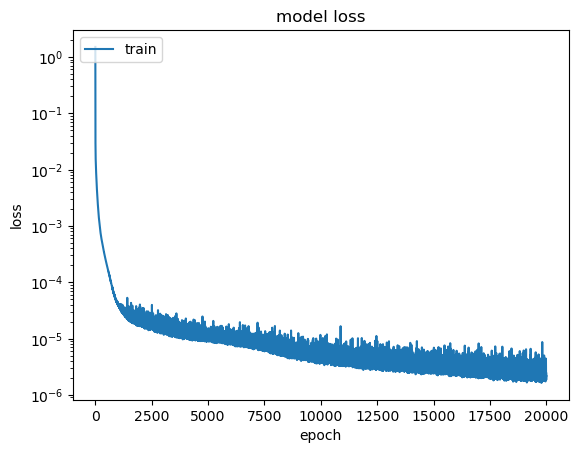

1

Epoch 1/20000
8/8 [==============================] - 2s 10ms/step - loss: 0.7363
Epoch 2/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.3237
Epoch 3/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.2033
Epoch 4/20000
8/8 [==============================] - 0s 8ms/step - loss: 0.1416
Epoch 5/20000
8/8 [==============================] - 0s 8ms/step - loss: 0.1024
Epoch 6/20000
8/8 [==============================] - 0s 25ms/step - loss: 0.0789
Epoch 7/20000
8/8 [==============================] - 0s 8ms/step - loss: 0.0642
Epoch 8/20000
8/8 [==============================] - 0s 13ms/step - loss: 0.0535
Epoch 9/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.0447
Epoch 10/20000
8/8 [==============================] - 0s 7ms/step - loss: 0.0376
Epoch 11/20000
8/8 [==============================] - 0s 9ms/step - loss: 0.0317
Epoch 12/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.0267
Epoch 13/20000
8/8 [============

8/8 [==============================] - 0s 9ms/step - loss: 5.7430e-04
Epoch 101/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6762e-04
Epoch 102/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5847e-04
Epoch 103/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.5179e-04
Epoch 104/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4277e-04
Epoch 105/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3587e-04
Epoch 106/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2914e-04
Epoch 107/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2276e-04
Epoch 108/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1571e-04
Epoch 109/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.0979e-04
Epoch 110/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0294e-04
Epoch 111/20000
8/8 [==============================] - 0s 6ms/step - l

8/8 [==============================] - 0s 7ms/step - loss: 2.5373e-04
Epoch 196/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.5323e-04
Epoch 197/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5275e-04
Epoch 198/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5072e-04
Epoch 199/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5054e-04
Epoch 200/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4994e-04
Epoch 201/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.4495e-04
Epoch 202/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4323e-04
Epoch 203/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4143e-04
Epoch 204/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4072e-04
Epoch 205/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3931e-04
Epoch 206/20000
8/8 [==============================] - 0s 7ms/step 

8/8 [==============================] - 0s 9ms/step - loss: 1.4603e-04
Epoch 291/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4373e-04
Epoch 292/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4329e-04
Epoch 293/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4252e-04
Epoch 294/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4122e-04
Epoch 295/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4089e-04
Epoch 296/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4025e-04
Epoch 297/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3917e-04
Epoch 298/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3751e-04
Epoch 299/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3754e-04
Epoch 300/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.3684e-04
Epoch 301/20000
8/8 [==============================] - 0s 6ms/step - 

8/8 [==============================] - 0s 10ms/step - loss: 8.6737e-05
Epoch 386/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7324e-05
Epoch 387/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.6024e-05
Epoch 388/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.5150e-05
Epoch 389/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.4664e-05
Epoch 390/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6003e-05
Epoch 391/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6622e-05
Epoch 392/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4277e-05
Epoch 393/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5361e-05
Epoch 394/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4392e-05
Epoch 395/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.3701e-05
Epoch 396/20000
8/8 [==============================] - 0s 8ms/step 

8/8 [==============================] - 0s 5ms/step - loss: 6.0007e-05
Epoch 481/20000
8/8 [==============================] - 0s 16ms/step - loss: 5.9125e-05
Epoch 482/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9390e-05
Epoch 483/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9030e-05
Epoch 484/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.8851e-05
Epoch 485/20000
8/8 [==============================] - 0s 24ms/step - loss: 5.8609e-05
Epoch 486/20000
8/8 [==============================] - 0s 17ms/step - loss: 5.8292e-05
Epoch 487/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8035e-05
Epoch 488/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9298e-05
Epoch 489/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8401e-05
Epoch 490/20000
8/8 [==============================] - 0s 17ms/step - loss: 5.7532e-05
Epoch 491/20000
8/8 [==============================] - 0s 5ms/ste

8/8 [==============================] - 0s 5ms/step - loss: 4.7910e-05
Epoch 576/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8644e-05
Epoch 577/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6564e-05
Epoch 578/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6412e-05
Epoch 579/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6228e-05
Epoch 580/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7067e-05
Epoch 581/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6759e-05
Epoch 582/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6645e-05
Epoch 583/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6902e-05
Epoch 584/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8425e-05
Epoch 585/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8493e-05
Epoch 586/20000
8/8 [==============================] - 0s 5ms/step - l

8/8 [==============================] - 0s 4ms/step - loss: 4.0872e-05
Epoch 671/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9532e-05
Epoch 672/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0060e-05
Epoch 673/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0823e-05
Epoch 674/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9297e-05
Epoch 675/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1240e-05
Epoch 676/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0872e-05
Epoch 677/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1025e-05
Epoch 678/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1255e-05
Epoch 679/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4620e-05
Epoch 680/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0316e-05
Epoch 681/20000
8/8 [==============================] - 0s 4ms/step - 

8/8 [==============================] - 0s 5ms/step - loss: 3.5381e-05
Epoch 766/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4755e-05
Epoch 767/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5915e-05
Epoch 768/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5328e-05
Epoch 769/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6697e-05
Epoch 770/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0449e-05
Epoch 771/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1008e-05
Epoch 772/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8175e-05
Epoch 773/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5210e-05
Epoch 774/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4457e-05
Epoch 775/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6573e-05
Epoch 776/20000
8/8 [==============================] - 0s 5ms/step - l

8/8 [==============================] - 0s 7ms/step - loss: 3.6920e-05
Epoch 861/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0609e-05
Epoch 862/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0040e-05
Epoch 863/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2471e-05
Epoch 864/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3572e-05
Epoch 865/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3751e-05
Epoch 866/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1717e-05
Epoch 867/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1134e-05
Epoch 868/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.0107e-05
Epoch 869/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0458e-05
Epoch 870/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1205e-05
Epoch 871/20000
8/8 [==============================] - 0s 5ms/step - 

8/8 [==============================] - 0s 7ms/step - loss: 2.8172e-05
Epoch 956/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7613e-05
Epoch 957/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0116e-05
Epoch 958/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8641e-05
Epoch 959/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8028e-05
Epoch 960/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1211e-05
Epoch 961/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0125e-05
Epoch 962/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3537e-05
Epoch 963/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0062e-05
Epoch 964/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6820e-05
Epoch 965/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4115e-05
Epoch 966/20000
8/8 [==============================] - 0s 5ms/step - l

8/8 [==============================] - 0s 5ms/step - loss: 2.6925e-05
Epoch 1050/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5548e-05
Epoch 1051/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6818e-05
Epoch 1052/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6255e-05
Epoch 1053/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.5176e-05
Epoch 1054/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9090e-05
Epoch 1055/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3951e-05
Epoch 1056/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7065e-05
Epoch 1057/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7185e-05
Epoch 1058/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6259e-05
Epoch 1059/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5361e-05
Epoch 1060/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 2.5883e-05
Epoch 1144/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7010e-05
Epoch 1145/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5500e-05
Epoch 1146/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4718e-05
Epoch 1147/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4305e-05
Epoch 1148/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4153e-05
Epoch 1149/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5061e-05
Epoch 1150/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3179e-05
Epoch 1151/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6414e-05
Epoch 1152/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3990e-05
Epoch 1153/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3009e-05
Epoch 1154/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 2.7703e-05
Epoch 1238/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4822e-05
Epoch 1239/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2713e-05
Epoch 1240/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2179e-05
Epoch 1241/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3845e-05
Epoch 1242/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2404e-05
Epoch 1243/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4801e-05
Epoch 1244/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4914e-05
Epoch 1245/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2197e-05
Epoch 1246/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5221e-05
Epoch 1247/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3870e-05
Epoch 1248/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 2.9681e-05
Epoch 1332/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0398e-05
Epoch 1333/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3639e-05
Epoch 1334/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4202e-05
Epoch 1335/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0991e-05
Epoch 1336/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0615e-05
Epoch 1337/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9579e-05
Epoch 1338/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0140e-05
Epoch 1339/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1076e-05
Epoch 1340/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9387e-05
Epoch 1341/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9208e-05
Epoch 1342/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.8952e-05
Epoch 1426/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.7986e-05
Epoch 1427/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8249e-05
Epoch 1428/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8500e-05
Epoch 1429/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8569e-05
Epoch 1430/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9890e-05
Epoch 1431/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9333e-05
Epoch 1432/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3247e-05
Epoch 1433/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5303e-05
Epoch 1434/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2321e-05
Epoch 1435/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7435e-05
Epoch 1436/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.8351e-05
Epoch 1520/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7279e-05
Epoch 1521/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7667e-05
Epoch 1522/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8139e-05
Epoch 1523/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8483e-05
Epoch 1524/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7982e-05
Epoch 1525/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8604e-05
Epoch 1526/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3373e-05
Epoch 1527/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1178e-05
Epoch 1528/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8642e-05
Epoch 1529/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8335e-05
Epoch 1530/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.7567e-05
Epoch 1614/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7664e-05
Epoch 1615/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7775e-05
Epoch 1616/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7370e-05
Epoch 1617/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8671e-05
Epoch 1618/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7168e-05
Epoch 1619/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7337e-05
Epoch 1620/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6221e-05
Epoch 1621/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7471e-05
Epoch 1622/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7579e-05
Epoch 1623/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9347e-05
Epoch 1624/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 1.8734e-05
Epoch 1708/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7694e-05
Epoch 1709/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7433e-05
Epoch 1710/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5987e-05
Epoch 1711/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6075e-05
Epoch 1712/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6072e-05
Epoch 1713/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7475e-05
Epoch 1714/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5924e-05
Epoch 1715/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8659e-05
Epoch 1716/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3511e-05
Epoch 1717/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8766e-05
Epoch 1718/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.4743e-05
Epoch 1802/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7010e-05
Epoch 1803/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7343e-05
Epoch 1804/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8187e-05
Epoch 1805/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6322e-05
Epoch 1806/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5938e-05
Epoch 1807/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6678e-05
Epoch 1808/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6133e-05
Epoch 1809/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5310e-05
Epoch 1810/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5402e-05
Epoch 1811/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5433e-05
Epoch 1812/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.7898e-05
Epoch 1896/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0130e-05
Epoch 1897/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2498e-05
Epoch 1898/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9890e-05
Epoch 1899/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3467e-05
Epoch 1900/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0783e-05
Epoch 1901/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1182e-05
Epoch 1902/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7599e-05
Epoch 1903/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7020e-05
Epoch 1904/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4896e-05
Epoch 1905/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3630e-05
Epoch 1906/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 2.2592e-05
Epoch 1990/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4432e-05
Epoch 1991/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0044e-05
Epoch 1992/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4955e-05
Epoch 1993/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4907e-05
Epoch 1994/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5525e-05
Epoch 1995/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7153e-05
Epoch 1996/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5613e-05
Epoch 1997/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4345e-05
Epoch 1998/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4830e-05
Epoch 1999/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5223e-05
Epoch 2000/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 6ms/step - loss: 1.3227e-05
Epoch 2084/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7136e-05
Epoch 2085/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5411e-05
Epoch 2086/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3010e-05
Epoch 2087/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3988e-05
Epoch 2088/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7705e-05
Epoch 2089/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6797e-05
Epoch 2090/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5380e-05
Epoch 2091/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6750e-05
Epoch 2092/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8200e-05
Epoch 2093/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7356e-05
Epoch 2094/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.3931e-05
Epoch 2178/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3089e-05
Epoch 2179/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6048e-05
Epoch 2180/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9188e-05
Epoch 2181/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5578e-05
Epoch 2182/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2683e-05
Epoch 2183/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2515e-05
Epoch 2184/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3708e-05
Epoch 2185/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3442e-05
Epoch 2186/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2055e-05
Epoch 2187/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2864e-05
Epoch 2188/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.4530e-05
Epoch 2272/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4721e-05
Epoch 2273/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3644e-05
Epoch 2274/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3459e-05
Epoch 2275/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2164e-05
Epoch 2276/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1860e-05
Epoch 2277/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0998e-05
Epoch 2278/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0617e-05
Epoch 2279/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0921e-05
Epoch 2280/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4058e-05
Epoch 2281/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2454e-05
Epoch 2282/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.3183e-05
Epoch 2366/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2763e-05
Epoch 2367/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1144e-05
Epoch 2368/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1048e-05
Epoch 2369/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1135e-05
Epoch 2370/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1209e-05
Epoch 2371/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2551e-05
Epoch 2372/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1138e-05
Epoch 2373/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0994e-05
Epoch 2374/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3709e-05
Epoch 2375/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1885e-05
Epoch 2376/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.3542e-05
Epoch 2460/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3149e-05
Epoch 2461/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4778e-05
Epoch 2462/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1554e-05
Epoch 2463/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1201e-05
Epoch 2464/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2102e-05
Epoch 2465/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4136e-05
Epoch 2466/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7892e-05
Epoch 2467/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2393e-05
Epoch 2468/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2302e-05
Epoch 2469/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1376e-05
Epoch 2470/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 1.1280e-05
Epoch 2554/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2980e-05
Epoch 2555/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4194e-05
Epoch 2556/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0710e-05
Epoch 2557/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2065e-05
Epoch 2558/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2954e-05
Epoch 2559/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3305e-05
Epoch 2560/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2117e-05
Epoch 2561/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0554e-05
Epoch 2562/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0214e-05
Epoch 2563/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1337e-05
Epoch 2564/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.0215e-05
Epoch 2648/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1100e-05
Epoch 2649/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0498e-05
Epoch 2650/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0134e-05
Epoch 2651/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8489e-06
Epoch 2652/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0383e-05
Epoch 2653/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1674e-05
Epoch 2654/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1274e-05
Epoch 2655/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1399e-05
Epoch 2656/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1311e-05
Epoch 2657/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0148e-05
Epoch 2658/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.1763e-05
Epoch 2742/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0973e-05
Epoch 2743/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2533e-05
Epoch 2744/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3231e-05
Epoch 2745/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1012e-05
Epoch 2746/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3108e-05
Epoch 2747/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3173e-05
Epoch 2748/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3713e-05
Epoch 2749/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5887e-05
Epoch 2750/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4107e-05
Epoch 2751/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6392e-05
Epoch 2752/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.0669e-05
Epoch 2836/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1743e-05
Epoch 2837/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2243e-05
Epoch 2838/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1310e-05
Epoch 2839/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1294e-05
Epoch 2840/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2305e-05
Epoch 2841/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3604e-05
Epoch 2842/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4273e-05
Epoch 2843/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3977e-05
Epoch 2844/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1413e-05
Epoch 2845/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1978e-05
Epoch 2846/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.2349e-05
Epoch 2930/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0584e-05
Epoch 2931/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0429e-05
Epoch 2932/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1821e-05
Epoch 2933/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4068e-05
Epoch 2934/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1010e-05
Epoch 2935/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3727e-05
Epoch 2936/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6606e-05
Epoch 2937/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5525e-05
Epoch 2938/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0880e-05
Epoch 2939/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0443e-05
Epoch 2940/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 9.5946e-06
Epoch 3024/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7508e-06
Epoch 3025/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1125e-05
Epoch 3026/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1603e-06
Epoch 3027/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9749e-06
Epoch 3028/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0352e-06
Epoch 3029/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0122e-05
Epoch 3030/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1101e-05
Epoch 3031/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4913e-05
Epoch 3032/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8876e-05
Epoch 3033/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4989e-05
Epoch 3034/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.2854e-05
Epoch 3118/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0974e-05
Epoch 3119/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1510e-05
Epoch 3120/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1097e-05
Epoch 3121/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2738e-05
Epoch 3122/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3364e-05
Epoch 3123/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2850e-05
Epoch 3124/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1310e-05
Epoch 3125/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7169e-06
Epoch 3126/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0715e-05
Epoch 3127/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1232e-05
Epoch 3128/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 9.8952e-06
Epoch 3212/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0415e-05
Epoch 3213/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0383e-05
Epoch 3214/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0901e-05
Epoch 3215/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5180e-05
Epoch 3216/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2184e-05
Epoch 3217/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0763e-05
Epoch 3218/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0386e-05
Epoch 3219/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6269e-06
Epoch 3220/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0284e-05
Epoch 3221/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5576e-06
Epoch 3222/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.4493e-05
Epoch 3306/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0580e-05
Epoch 3307/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2816e-05
Epoch 3308/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2854e-05
Epoch 3309/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1836e-05
Epoch 3310/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0552e-05
Epoch 3311/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0295e-05
Epoch 3312/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2990e-06
Epoch 3313/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3885e-06
Epoch 3314/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0428e-05
Epoch 3315/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8168e-06
Epoch 3316/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 7ms/step - loss: 9.4291e-06
Epoch 3400/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2008e-05
Epoch 3401/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1645e-05
Epoch 3402/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2163e-05
Epoch 3403/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5849e-06
Epoch 3404/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9558e-06
Epoch 3405/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0347e-05
Epoch 3406/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1314e-05
Epoch 3407/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4098e-06
Epoch 3408/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0695e-06
Epoch 3409/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0598e-05
Epoch 3410/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 8.7497e-06
Epoch 3494/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8983e-06
Epoch 3495/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0235e-05
Epoch 3496/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6008e-05
Epoch 3497/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4141e-05
Epoch 3498/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0437e-05
Epoch 3499/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1470e-05
Epoch 3500/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5184e-05
Epoch 3501/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3383e-05
Epoch 3502/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2610e-05
Epoch 3503/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2534e-05
Epoch 3504/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.0606e-05
Epoch 3588/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4593e-05
Epoch 3589/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4950e-05
Epoch 3590/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1164e-05
Epoch 3591/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7088e-06
Epoch 3592/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8752e-06
Epoch 3593/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7213e-06
Epoch 3594/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0989e-05
Epoch 3595/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6570e-05
Epoch 3596/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2522e-05
Epoch 3597/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7022e-06
Epoch 3598/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 8.3707e-06
Epoch 3682/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7556e-06
Epoch 3683/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1479e-06
Epoch 3684/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5538e-06
Epoch 3685/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0008e-05
Epoch 3686/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0309e-05
Epoch 3687/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0552e-05
Epoch 3688/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2671e-05
Epoch 3689/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0239e-05
Epoch 3690/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6555e-05
Epoch 3691/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4372e-05
Epoch 3692/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 7ms/step - loss: 1.1440e-05
Epoch 3776/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0992e-05
Epoch 3777/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1408e-05
Epoch 3778/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2112e-05
Epoch 3779/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1039e-05
Epoch 3780/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3192e-05
Epoch 3781/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4698e-05
Epoch 3782/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1876e-05
Epoch 3783/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0661e-05
Epoch 3784/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0505e-05
Epoch 3785/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8033e-06
Epoch 3786/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 9.7544e-06
Epoch 3870/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6372e-06
Epoch 3871/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0851e-06
Epoch 3872/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6963e-06
Epoch 3873/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5224e-06
Epoch 3874/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3973e-05
Epoch 3875/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7916e-05
Epoch 3876/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6001e-05
Epoch 3877/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1498e-05
Epoch 3878/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7045e-06
Epoch 3879/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1435e-05
Epoch 3880/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 7ms/step - loss: 9.0532e-06
Epoch 3964/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2449e-05
Epoch 3965/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8226e-06
Epoch 3966/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0049e-05
Epoch 3967/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0670e-05
Epoch 3968/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1823e-05
Epoch 3969/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1031e-06
Epoch 3970/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7825e-06
Epoch 3971/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4029e-06
Epoch 3972/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4401e-06
Epoch 3973/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0511e-06
Epoch 3974/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 8.5330e-06
Epoch 4058/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0349e-06
Epoch 4059/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0127e-05
Epoch 4060/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3241e-06
Epoch 4061/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1584e-05
Epoch 4062/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4953e-05
Epoch 4063/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4960e-05
Epoch 4064/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5120e-05
Epoch 4065/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8868e-05
Epoch 4066/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2901e-05
Epoch 4067/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2883e-05
Epoch 4068/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 9.8218e-06
Epoch 4152/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7432e-06
Epoch 4153/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7413e-06
Epoch 4154/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8088e-06
Epoch 4155/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1759e-05
Epoch 4156/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1540e-05
Epoch 4157/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0649e-05
Epoch 4158/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1868e-05
Epoch 4159/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2237e-05
Epoch 4160/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4287e-05
Epoch 4161/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4736e-05
Epoch 4162/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 1.0352e-05
Epoch 4246/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.5532e-06
Epoch 4247/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2532e-06
Epoch 4248/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5500e-06
Epoch 4249/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0086e-06
Epoch 4250/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9136e-06
Epoch 4251/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0746e-05
Epoch 4252/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4304e-06
Epoch 4253/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.5048e-06
Epoch 4254/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7256e-06
Epoch 4255/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1989e-05
Epoch 4256/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.1280e-05
Epoch 4340/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1979e-05
Epoch 4341/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3193e-06
Epoch 4342/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8928e-06
Epoch 4343/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8680e-06
Epoch 4344/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4642e-06
Epoch 4345/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6300e-06
Epoch 4346/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3419e-05
Epoch 4347/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1395e-05
Epoch 4348/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1135e-05
Epoch 4349/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1170e-05
Epoch 4350/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.1167e-05
Epoch 4434/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7258e-06
Epoch 4435/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1813e-06
Epoch 4436/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4163e-06
Epoch 4437/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2082e-05
Epoch 4438/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2817e-05
Epoch 4439/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2430e-05
Epoch 4440/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1590e-05
Epoch 4441/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1476e-05
Epoch 4442/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0633e-06
Epoch 4443/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3051e-05
Epoch 4444/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 9.5228e-06
Epoch 4528/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5751e-06
Epoch 4529/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1818e-05
Epoch 4530/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6018e-05
Epoch 4531/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1654e-05
Epoch 4532/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8617e-06
Epoch 4533/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4815e-06
Epoch 4534/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5631e-06
Epoch 4535/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3664e-06
Epoch 4536/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1366e-06
Epoch 4537/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4915e-06
Epoch 4538/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.0135e-05
Epoch 4622/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3581e-06
Epoch 4623/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0606e-05
Epoch 4624/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3149e-06
Epoch 4625/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8761e-06
Epoch 4626/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2142e-06
Epoch 4627/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1081e-05
Epoch 4628/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1296e-05
Epoch 4629/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9606e-06
Epoch 4630/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7346e-06
Epoch 4631/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5765e-06
Epoch 4632/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 8.2636e-06
Epoch 4716/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6959e-06
Epoch 4717/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4433e-06
Epoch 4718/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8528e-06
Epoch 4719/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2486e-06
Epoch 4720/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1032e-06
Epoch 4721/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3907e-06
Epoch 4722/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0286e-05
Epoch 4723/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6875e-06
Epoch 4724/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4779e-06
Epoch 4725/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0169e-05
Epoch 4726/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 8.5210e-06
Epoch 4810/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6675e-06
Epoch 4811/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2501e-05
Epoch 4812/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0753e-05
Epoch 4813/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2575e-05
Epoch 4814/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0300e-05
Epoch 4815/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5029e-06
Epoch 4816/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8505e-06
Epoch 4817/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5568e-06
Epoch 4818/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7509e-06
Epoch 4819/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0967e-06
Epoch 4820/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.2205e-05
Epoch 4904/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1661e-05
Epoch 4905/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8245e-06
Epoch 4906/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9942e-06
Epoch 4907/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4598e-06
Epoch 4908/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0540e-06
Epoch 4909/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7289e-06
Epoch 4910/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9300e-06
Epoch 4911/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.5393e-06
Epoch 4912/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7301e-06
Epoch 4913/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9185e-06
Epoch 4914/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 9.9525e-06
Epoch 4998/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7234e-06
Epoch 4999/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1120e-06
Epoch 5000/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.8463e-06
Epoch 5001/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6757e-06
Epoch 5002/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0467e-05
Epoch 5003/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.6826e-06
Epoch 5004/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9706e-06
Epoch 5005/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9645e-06
Epoch 5006/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8904e-06
Epoch 5007/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9288e-06
Epoch 5008/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 1.1155e-05
Epoch 5092/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0715e-05
Epoch 5093/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0839e-05
Epoch 5094/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1534e-05
Epoch 5095/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1756e-06
Epoch 5096/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0144e-06
Epoch 5097/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9005e-06
Epoch 5098/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3446e-06
Epoch 5099/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0475e-06
Epoch 5100/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4032e-06
Epoch 5101/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8787e-06
Epoch 5102/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.2303e-05
Epoch 5186/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0770e-06
Epoch 5187/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7769e-06
Epoch 5188/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2741e-05
Epoch 5189/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7884e-06
Epoch 5190/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4729e-06
Epoch 5191/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5122e-06
Epoch 5192/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6311e-06
Epoch 5193/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3091e-06
Epoch 5194/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2030e-06
Epoch 5195/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0136e-06
Epoch 5196/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 8.9309e-06
Epoch 5280/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4987e-06
Epoch 5281/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8909e-06
Epoch 5282/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3961e-06
Epoch 5283/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2756e-06
Epoch 5284/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2664e-05
Epoch 5285/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0925e-05
Epoch 5286/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4555e-06
Epoch 5287/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0456e-05
Epoch 5288/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5359e-05
Epoch 5289/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6931e-05
Epoch 5290/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.1473e-05
Epoch 5374/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5143e-06
Epoch 5375/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6382e-06
Epoch 5376/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6714e-06
Epoch 5377/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7394e-06
Epoch 5378/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3912e-06
Epoch 5379/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5275e-06
Epoch 5380/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6242e-06
Epoch 5381/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7816e-06
Epoch 5382/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1633e-06
Epoch 5383/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0870e-06
Epoch 5384/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 7.8650e-06
Epoch 5468/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5223e-06
Epoch 5469/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2993e-06
Epoch 5470/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9982e-06
Epoch 5471/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2251e-06
Epoch 5472/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1225e-05
Epoch 5473/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0165e-06
Epoch 5474/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1378e-06
Epoch 5475/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3869e-06
Epoch 5476/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7531e-06
Epoch 5477/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9298e-06
Epoch 5478/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 9.0810e-06
Epoch 5562/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0489e-05
Epoch 5563/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0234e-05
Epoch 5564/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0361e-06
Epoch 5565/20000
8/8 [==============================] - 0s 13ms/step - loss: 9.2413e-06
Epoch 5566/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.6637e-06
Epoch 5567/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8095e-06
Epoch 5568/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2159e-06
Epoch 5569/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9890e-06
Epoch 5570/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2176e-06
Epoch 5571/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1857e-06
Epoch 5572/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.5760e-06
Epoch 5656/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6150e-06
Epoch 5657/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7027e-06
Epoch 5658/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0215e-06
Epoch 5659/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0810e-05
Epoch 5660/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1052e-05
Epoch 5661/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6255e-06
Epoch 5662/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8230e-06
Epoch 5663/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.9476e-06
Epoch 5664/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8769e-06
Epoch 5665/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1193e-05
Epoch 5666/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 7.2756e-06
Epoch 5750/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.2164e-05
Epoch 5751/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9504e-06
Epoch 5752/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8519e-06
Epoch 5753/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6360e-06
Epoch 5754/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2975e-06
Epoch 5755/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0153e-05
Epoch 5756/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7470e-06
Epoch 5757/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1927e-06
Epoch 5758/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2436e-06
Epoch 5759/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6839e-06
Epoch 5760/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.5507e-06
Epoch 5844/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0442e-05
Epoch 5845/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0298e-05
Epoch 5846/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3788e-06
Epoch 5847/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5597e-06
Epoch 5848/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4833e-06
Epoch 5849/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9070e-06
Epoch 5850/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9012e-06
Epoch 5851/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1553e-06
Epoch 5852/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9197e-06
Epoch 5853/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4758e-06
Epoch 5854/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 7.8477e-06
Epoch 5938/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2500e-05
Epoch 5939/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4622e-05
Epoch 5940/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0196e-05
Epoch 5941/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2599e-06
Epoch 5942/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4779e-06
Epoch 5943/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0008e-05
Epoch 5944/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9834e-06
Epoch 5945/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3426e-06
Epoch 5946/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2643e-06
Epoch 5947/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4758e-06
Epoch 5948/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 8.8772e-06
Epoch 6032/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8521e-06
Epoch 6033/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3481e-06
Epoch 6034/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.7482e-06
Epoch 6035/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0704e-05
Epoch 6036/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0956e-05
Epoch 6037/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8694e-06
Epoch 6038/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5755e-06
Epoch 6039/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7959e-06
Epoch 6040/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2048e-06
Epoch 6041/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0153e-05
Epoch 6042/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 8.7768e-06
Epoch 6126/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0990e-05
Epoch 6127/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5241e-06
Epoch 6128/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1164e-05
Epoch 6129/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2665e-06
Epoch 6130/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0890e-06
Epoch 6131/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4069e-06
Epoch 6132/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1391e-05
Epoch 6133/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1752e-05
Epoch 6134/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1365e-05
Epoch 6135/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0244e-05
Epoch 6136/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 8.2499e-06
Epoch 6220/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2667e-06
Epoch 6221/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0158e-05
Epoch 6222/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1095e-05
Epoch 6223/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0070e-06
Epoch 6224/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1014e-06
Epoch 6225/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4197e-06
Epoch 6226/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5465e-06
Epoch 6227/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7433e-06
Epoch 6228/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2034e-06
Epoch 6229/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7959e-06
Epoch 6230/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.5198e-06
Epoch 6314/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2074e-06
Epoch 6315/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6369e-06
Epoch 6316/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0897e-06
Epoch 6317/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3517e-06
Epoch 6318/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5399e-06
Epoch 6319/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0232e-05
Epoch 6320/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0268e-05
Epoch 6321/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6665e-06
Epoch 6322/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8405e-06
Epoch 6323/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9880e-06
Epoch 6324/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 8.4878e-06
Epoch 6408/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8708e-06
Epoch 6409/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0405e-06
Epoch 6410/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4519e-06
Epoch 6411/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3753e-06
Epoch 6412/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6079e-06
Epoch 6413/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4680e-06
Epoch 6414/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1956e-06
Epoch 6415/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5993e-06
Epoch 6416/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5766e-06
Epoch 6417/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3850e-06
Epoch 6418/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 7ms/step - loss: 7.2077e-06
Epoch 6502/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7732e-06
Epoch 6503/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2180e-06
Epoch 6504/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7433e-06
Epoch 6505/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6735e-06
Epoch 6506/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7729e-06
Epoch 6507/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3319e-05
Epoch 6508/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0218e-05
Epoch 6509/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8855e-06
Epoch 6510/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6999e-06
Epoch 6511/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5685e-06
Epoch 6512/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.2236e-06
Epoch 6596/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0102e-06
Epoch 6597/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1511e-06
Epoch 6598/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9609e-06
Epoch 6599/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0342e-06
Epoch 6600/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4212e-06
Epoch 6601/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1672e-06
Epoch 6602/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8528e-06
Epoch 6603/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8236e-06
Epoch 6604/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3196e-06
Epoch 6605/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3789e-06
Epoch 6606/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 9.0635e-06
Epoch 6690/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0491e-06
Epoch 6691/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8158e-06
Epoch 6692/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3043e-05
Epoch 6693/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1623e-05
Epoch 6694/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0571e-06
Epoch 6695/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9244e-06
Epoch 6696/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3944e-06
Epoch 6697/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2602e-06
Epoch 6698/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7091e-06
Epoch 6699/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5247e-06
Epoch 6700/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 7.6456e-06
Epoch 6784/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3266e-06
Epoch 6785/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7288e-06
Epoch 6786/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9106e-06
Epoch 6787/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0614e-06
Epoch 6788/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3481e-06
Epoch 6789/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9071e-06
Epoch 6790/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0822e-06
Epoch 6791/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6342e-06
Epoch 6792/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7069e-06
Epoch 6793/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4908e-06
Epoch 6794/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 8.1482e-06
Epoch 6878/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4032e-06
Epoch 6879/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9671e-06
Epoch 6880/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0627e-05
Epoch 6881/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5090e-06
Epoch 6882/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8866e-06
Epoch 6883/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1800e-06
Epoch 6884/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3981e-06
Epoch 6885/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1087e-05
Epoch 6886/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7200e-06
Epoch 6887/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0438e-06
Epoch 6888/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 7.0448e-06
Epoch 6972/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4767e-06
Epoch 6973/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5333e-06
Epoch 6974/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6340e-06
Epoch 6975/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7188e-06
Epoch 6976/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2356e-06
Epoch 6977/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2902e-06
Epoch 6978/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8080e-06
Epoch 6979/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7212e-06
Epoch 6980/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2119e-06
Epoch 6981/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0924e-05
Epoch 6982/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 9.0581e-06
Epoch 7066/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1405e-06
Epoch 7067/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1530e-06
Epoch 7068/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3662e-06
Epoch 7069/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5973e-06
Epoch 7070/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1660e-06
Epoch 7071/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2956e-06
Epoch 7072/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0236e-06
Epoch 7073/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8152e-06
Epoch 7074/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7051e-06
Epoch 7075/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7277e-06
Epoch 7076/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 3ms/step - loss: 6.4450e-06
Epoch 7160/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0330e-06
Epoch 7161/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2221e-06
Epoch 7162/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4275e-06
Epoch 7163/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6302e-06
Epoch 7164/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7443e-06
Epoch 7165/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0047e-05
Epoch 7166/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0341e-05
Epoch 7167/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7761e-05
Epoch 7168/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2379e-05
Epoch 7169/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0226e-05
Epoch 7170/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.8536e-06
Epoch 7254/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6104e-06
Epoch 7255/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9526e-06
Epoch 7256/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3805e-06
Epoch 7257/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7592e-06
Epoch 7258/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6318e-06
Epoch 7259/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0934e-06
Epoch 7260/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3139e-06
Epoch 7261/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5546e-06
Epoch 7262/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7470e-06
Epoch 7263/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1324e-06
Epoch 7264/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 1.0932e-05
Epoch 7348/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9364e-06
Epoch 7349/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7689e-06
Epoch 7350/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9422e-06
Epoch 7351/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4770e-06
Epoch 7352/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1216e-06
Epoch 7353/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2690e-06
Epoch 7354/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3687e-06
Epoch 7355/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4088e-06
Epoch 7356/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1574e-06
Epoch 7357/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6523e-06
Epoch 7358/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 7.8082e-06
Epoch 7442/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5527e-06
Epoch 7443/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6748e-06
Epoch 7444/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7289e-06
Epoch 7445/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0882e-06
Epoch 7446/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8725e-06
Epoch 7447/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5358e-06
Epoch 7448/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1643e-05
Epoch 7449/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.9622e-06
Epoch 7450/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2580e-06
Epoch 7451/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9030e-06
Epoch 7452/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 6.4312e-06
Epoch 7536/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4216e-06
Epoch 7537/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9356e-06
Epoch 7538/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6012e-06
Epoch 7539/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9092e-06
Epoch 7540/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1799e-06
Epoch 7541/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0663e-06
Epoch 7542/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8693e-06
Epoch 7543/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2458e-06
Epoch 7544/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0214e-05
Epoch 7545/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5662e-06
Epoch 7546/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 7.6113e-06
Epoch 7630/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2693e-06
Epoch 7631/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4332e-06
Epoch 7632/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5552e-06
Epoch 7633/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7658e-06
Epoch 7634/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6764e-06
Epoch 7635/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9838e-06
Epoch 7636/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1280e-06
Epoch 7637/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0159e-06
Epoch 7638/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8685e-06
Epoch 7639/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1019e-06
Epoch 7640/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 6.6876e-06
Epoch 7724/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7076e-06
Epoch 7725/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1098e-06
Epoch 7726/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7533e-06
Epoch 7727/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7018e-06
Epoch 7728/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4283e-06
Epoch 7729/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7686e-06
Epoch 7730/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9944e-06
Epoch 7731/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1076e-06
Epoch 7732/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8618e-06
Epoch 7733/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8324e-06
Epoch 7734/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 8.2082e-06
Epoch 7818/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9219e-06
Epoch 7819/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7900e-06
Epoch 7820/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3432e-06
Epoch 7821/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0183e-05
Epoch 7822/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9083e-06
Epoch 7823/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7256e-06
Epoch 7824/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3505e-06
Epoch 7825/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5716e-06
Epoch 7826/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0735e-06
Epoch 7827/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6971e-06
Epoch 7828/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 8.5550e-06
Epoch 7912/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6606e-05
Epoch 7913/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5657e-06
Epoch 7914/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0344e-06
Epoch 7915/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.6093e-06
Epoch 7916/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8928e-06
Epoch 7917/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0050e-05
Epoch 7918/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0992e-06
Epoch 7919/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6169e-06
Epoch 7920/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5231e-06
Epoch 7921/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5342e-06
Epoch 7922/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 4ms/step - loss: 1.0146e-05
Epoch 8006/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7212e-06
Epoch 8007/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1402e-06
Epoch 8008/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1249e-06
Epoch 8009/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3480e-06
Epoch 8010/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0301e-06
Epoch 8011/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8989e-06
Epoch 8012/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6448e-06
Epoch 8013/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5182e-06
Epoch 8014/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6863e-06
Epoch 8015/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2544e-06
Epoch 8016/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 8ms/step - loss: 7.9716e-06
Epoch 8100/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7009e-06
Epoch 8101/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4677e-06
Epoch 8102/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8362e-06
Epoch 8103/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.4401e-06
Epoch 8104/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9152e-06
Epoch 8105/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0412e-06
Epoch 8106/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4811e-06
Epoch 8107/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3868e-06
Epoch 8108/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0226e-05
Epoch 8109/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1197e-05
Epoch 8110/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 7.9081e-06
Epoch 8194/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0335e-06
Epoch 8195/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0647e-06
Epoch 8196/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1642e-06
Epoch 8197/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7297e-06
Epoch 8198/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7511e-06
Epoch 8199/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7446e-06
Epoch 8200/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4490e-06
Epoch 8201/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4557e-06
Epoch 8202/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9087e-06
Epoch 8203/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0317e-05
Epoch 8204/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 6.4610e-06
Epoch 8288/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2545e-06
Epoch 8289/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1710e-06
Epoch 8290/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4004e-06
Epoch 8291/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6024e-06
Epoch 8292/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1685e-06
Epoch 8293/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.8519e-06
Epoch 8294/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.4146e-06
Epoch 8295/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1062e-06
Epoch 8296/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.2171e-06
Epoch 8297/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3635e-06
Epoch 8298/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 8ms/step - loss: 5.8751e-06
Epoch 8382/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3040e-06
Epoch 8383/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.2922e-06
Epoch 8384/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0481e-06
Epoch 8385/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.5943e-06
Epoch 8386/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.0092e-06
Epoch 8387/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.9883e-06
Epoch 8388/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.3554e-06
Epoch 8389/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7478e-06
Epoch 8390/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0077e-05
Epoch 8391/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4557e-06
Epoch 8392/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 6.1277e-06
Epoch 8476/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9642e-06
Epoch 8477/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6046e-06
Epoch 8478/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3158e-05
Epoch 8479/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1292e-05
Epoch 8480/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2169e-06
Epoch 8481/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5452e-06
Epoch 8482/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4886e-06
Epoch 8483/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7501e-06
Epoch 8484/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0178e-05
Epoch 8485/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5691e-06
Epoch 8486/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 8.4583e-06
Epoch 8570/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9960e-06
Epoch 8571/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8264e-06
Epoch 8572/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5969e-06
Epoch 8573/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5344e-06
Epoch 8574/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3833e-06
Epoch 8575/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9257e-06
Epoch 8576/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5857e-06
Epoch 8577/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0992e-06
Epoch 8578/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7631e-06
Epoch 8579/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6952e-06
Epoch 8580/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 7.0936e-06
Epoch 8664/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6661e-06
Epoch 8665/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5229e-06
Epoch 8666/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4560e-06
Epoch 8667/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7052e-06
Epoch 8668/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.9779e-06
Epoch 8669/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5598e-06
Epoch 8670/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7563e-06
Epoch 8671/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.4159e-06
Epoch 8672/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2715e-06
Epoch 8673/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1604e-06
Epoch 8674/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 7.1740e-06
Epoch 8758/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7902e-06
Epoch 8759/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6463e-06
Epoch 8760/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7695e-06
Epoch 8761/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1436e-06
Epoch 8762/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0688e-06
Epoch 8763/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8712e-06
Epoch 8764/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6487e-06
Epoch 8765/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2435e-06
Epoch 8766/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8074e-06
Epoch 8767/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8145e-06
Epoch 8768/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 7ms/step - loss: 6.3440e-06
Epoch 8852/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7389e-06
Epoch 8853/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8494e-06
Epoch 8854/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5377e-06
Epoch 8855/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6831e-06
Epoch 8856/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4795e-06
Epoch 8857/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.5946e-06
Epoch 8858/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9619e-06
Epoch 8859/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0890e-06
Epoch 8860/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.3580e-06
Epoch 8861/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2351e-06
Epoch 8862/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 7ms/step - loss: 6.6533e-06
Epoch 8946/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1757e-06
Epoch 8947/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.6523e-06
Epoch 8948/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8123e-06
Epoch 8949/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.5182e-06
Epoch 8950/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.4555e-06
Epoch 8951/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.4316e-06
Epoch 8952/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.4941e-06
Epoch 8953/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7520e-06
Epoch 8954/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2165e-06
Epoch 8955/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.1669e-06
Epoch 8956/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 5.7232e-06
Epoch 9040/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6784e-06
Epoch 9041/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4325e-06
Epoch 9042/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5265e-06
Epoch 9043/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5624e-06
Epoch 9044/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9707e-06
Epoch 9045/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.3155e-06
Epoch 9046/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2029e-06
Epoch 9047/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8737e-06
Epoch 9048/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7659e-06
Epoch 9049/20000
8/8 [==============================] - 0s 20ms/step - loss: 7.2638e-06
Epoch 9050/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 6.1931e-06
Epoch 9134/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6195e-06
Epoch 9135/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9434e-06
Epoch 9136/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.3113e-06
Epoch 9137/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.3366e-06
Epoch 9138/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7029e-06
Epoch 9139/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0450e-06
Epoch 9140/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.8821e-06
Epoch 9141/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.5509e-06
Epoch 9142/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0556e-05
Epoch 9143/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2364e-05
Epoch 9144/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 9ms/step - loss: 6.4224e-06
Epoch 9228/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.5754e-06
Epoch 9229/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0111e-05
Epoch 9230/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5406e-06
Epoch 9231/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.9909e-06
Epoch 9232/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6979e-06
Epoch 9233/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.6207e-06
Epoch 9234/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.6588e-06
Epoch 9235/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.6739e-06
Epoch 9236/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6372e-06
Epoch 9237/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7722e-06
Epoch 9238/20000
8/8 [==============================] - 0

Epoch 9321/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.4134e-06
Epoch 9322/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8868e-06
Epoch 9323/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.5557e-06
Epoch 9324/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9790e-06
Epoch 9325/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.8407e-06
Epoch 9326/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7396e-06
Epoch 9327/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3356e-06
Epoch 9328/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.0768e-06
Epoch 9329/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.9494e-06
Epoch 9330/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1368e-06
Epoch 9331/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0620e-06
Epoch 9332/20000
8/8 [==================

8/8 [==============================] - 0s 8ms/step - loss: 7.7136e-06
Epoch 9415/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7027e-06
Epoch 9416/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1712e-06
Epoch 9417/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.7325e-06
Epoch 9418/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.7922e-06
Epoch 9419/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4038e-06
Epoch 9420/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6959e-06
Epoch 9421/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3563e-06
Epoch 9422/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.1117e-06
Epoch 9423/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.8688e-06
Epoch 9424/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4351e-06
Epoch 9425/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 9ms/step - loss: 6.9290e-06
Epoch 9509/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.9095e-06
Epoch 9510/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5183e-06
Epoch 9511/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.6648e-06
Epoch 9512/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.2246e-06
Epoch 9513/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.3934e-06
Epoch 9514/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9443e-06
Epoch 9515/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.2693e-06
Epoch 9516/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.8481e-06
Epoch 9517/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9056e-06
Epoch 9518/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.9513e-06
Epoch 9519/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 10ms/step - loss: 1.0177e-05
Epoch 9603/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.0044e-06
Epoch 9604/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1207e-06
Epoch 9605/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6174e-06
Epoch 9606/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.1061e-06
Epoch 9607/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2434e-06
Epoch 9608/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.6508e-06
Epoch 9609/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0907e-06
Epoch 9610/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.9219e-06
Epoch 9611/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.2235e-06
Epoch 9612/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.2344e-06
Epoch 9613/20000
8/8 [==============================] - 

8/8 [==============================] - 0s 8ms/step - loss: 5.5047e-06
Epoch 9697/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1032e-06
Epoch 9698/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.4199e-06
Epoch 9699/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5817e-06
Epoch 9700/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7946e-06
Epoch 9701/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7710e-06
Epoch 9702/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.5929e-06
Epoch 9703/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8605e-06
Epoch 9704/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7735e-06
Epoch 9705/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6942e-06
Epoch 9706/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3006e-06
Epoch 9707/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 5.3863e-06
Epoch 9790/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2897e-06
Epoch 9791/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.5245e-06
Epoch 9792/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.7198e-06
Epoch 9793/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2492e-06
Epoch 9794/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4194e-06
Epoch 9795/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2287e-05
Epoch 9796/20000
8/8 [==============================] - 0s 13ms/step - loss: 8.9574e-06
Epoch 9797/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.8460e-06
Epoch 9798/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.7613e-06
Epoch 9799/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.6392e-06
Epoch 9800/20000
8/8 [==============================] - 0

Epoch 9883/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5580e-06
Epoch 9884/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.4508e-06
Epoch 9885/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6929e-06
Epoch 9886/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.5405e-06
Epoch 9887/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2309e-06
Epoch 9888/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.3398e-06
Epoch 9889/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.5805e-06
Epoch 9890/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5546e-06
Epoch 9891/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0186e-05
Epoch 9892/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8599e-06
Epoch 9893/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.5247e-06
Epoch 9894/20000
8/8 [=================

8/8 [==============================] - 0s 7ms/step - loss: 8.9806e-06
Epoch 9977/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.5014e-06
Epoch 9978/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1168e-06
Epoch 9979/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.8777e-06
Epoch 9980/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4254e-06
Epoch 9981/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2344e-06
Epoch 9982/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8749e-06
Epoch 9983/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.3493e-06
Epoch 9984/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.7317e-06
Epoch 9985/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2741e-06
Epoch 9986/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.8754e-06
Epoch 9987/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 5.6808e-06
Epoch 10070/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.8034e-06
Epoch 10071/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.5153e-06
Epoch 10072/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5952e-06
Epoch 10073/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0095e-06
Epoch 10074/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8328e-06
Epoch 10075/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.7993e-06
Epoch 10076/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4654e-06
Epoch 10077/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2673e-06
Epoch 10078/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3355e-06
Epoch 10079/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4653e-06
Epoch 10080/20000
8/8 [========================

Epoch 10162/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.1613e-06
Epoch 10163/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.7844e-06
Epoch 10164/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2738e-06
Epoch 10165/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.0100e-06
Epoch 10166/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7085e-06
Epoch 10167/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.3220e-06
Epoch 10168/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.2975e-06
Epoch 10169/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.8404e-06
Epoch 10170/20000
8/8 [==============================] - 0s 16ms/step - loss: 8.5427e-06
Epoch 10171/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4101e-06
Epoch 10172/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1478e-06
Epoch 10173/20000
8/8 [===

8/8 [==============================] - 0s 6ms/step - loss: 8.8213e-06
Epoch 10255/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1783e-06
Epoch 10256/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.7589e-06
Epoch 10257/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7095e-06
Epoch 10258/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1970e-06
Epoch 10259/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6695e-06
Epoch 10260/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.7922e-06
Epoch 10261/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4949e-06
Epoch 10262/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4166e-06
Epoch 10263/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1237e-06
Epoch 10264/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0437e-06
Epoch 10265/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 5.8655e-06
Epoch 10348/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.3666e-06
Epoch 10349/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8730e-06
Epoch 10350/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.9260e-06
Epoch 10351/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.7471e-06
Epoch 10352/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.8367e-06
Epoch 10353/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0778e-05
Epoch 10354/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.6054e-06
Epoch 10355/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.9940e-06
Epoch 10356/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5235e-06
Epoch 10357/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9779e-06
Epoch 10358/20000
8/8 [====================

8/8 [==============================] - 0s 8ms/step - loss: 8.1357e-06
Epoch 10440/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0983e-06
Epoch 10441/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5032e-06
Epoch 10442/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2266e-06
Epoch 10443/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1543e-06
Epoch 10444/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.2200e-06
Epoch 10445/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1526e-06
Epoch 10446/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7561e-06
Epoch 10447/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0890e-06
Epoch 10448/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9646e-06
Epoch 10449/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4933e-06
Epoch 10450/20000
8/8 [=========================

8/8 [==============================] - 0s 13ms/step - loss: 5.1830e-06
Epoch 10533/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.0652e-06
Epoch 10534/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.7811e-06
Epoch 10535/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.7776e-06
Epoch 10536/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2109e-06
Epoch 10537/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.8033e-06
Epoch 10538/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.4110e-06
Epoch 10539/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.2706e-06
Epoch 10540/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.3017e-06
Epoch 10541/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.8084e-06
Epoch 10542/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.3932e-06
Epoch 10543/20000
8/8 [=====================

Epoch 10625/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.4650e-06
Epoch 10626/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3114e-06
Epoch 10627/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.0004e-06
Epoch 10628/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3579e-06
Epoch 10629/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.6634e-06
Epoch 10630/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.0615e-06
Epoch 10631/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9462e-06
Epoch 10632/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4230e-06
Epoch 10633/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.7116e-06
Epoch 10634/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1019e-06
Epoch 10635/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8530e-06
Epoch 10636/20000
8/8 [=====

Epoch 10718/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2512e-06
Epoch 10719/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7681e-06
Epoch 10720/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.7067e-06
Epoch 10721/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8082e-06
Epoch 10722/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4232e-06
Epoch 10723/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.7417e-06
Epoch 10724/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5611e-06
Epoch 10725/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7722e-06
Epoch 10726/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8075e-06
Epoch 10727/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5225e-06
Epoch 10728/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3059e-06
Epoch 10729/20000
8/8 [=======

8/8 [==============================] - 0s 9ms/step - loss: 5.5441e-06
Epoch 10811/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8476e-06
Epoch 10812/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6501e-06
Epoch 10813/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4542e-06
Epoch 10814/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.0114e-06
Epoch 10815/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6265e-06
Epoch 10816/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4125e-06
Epoch 10817/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.5010e-06
Epoch 10818/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3696e-06
Epoch 10819/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3613e-06
Epoch 10820/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5547e-06
Epoch 10821/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 8.5000e-06
Epoch 10904/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.0984e-06
Epoch 10905/20000
8/8 [==============================] - 0s 11ms/step - loss: 9.1052e-06
Epoch 10906/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.3995e-06
Epoch 10907/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.4800e-06
Epoch 10908/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0090e-06
Epoch 10909/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1011e-06
Epoch 10910/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3602e-06
Epoch 10911/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.6898e-06
Epoch 10912/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.0231e-06
Epoch 10913/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.4377e-06
Epoch 10914/20000
8/8 [=======================

8/8 [==============================] - 0s 8ms/step - loss: 5.2420e-06
Epoch 10996/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8465e-06
Epoch 10997/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1202e-06
Epoch 10998/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.4568e-06
Epoch 10999/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5996e-06
Epoch 11000/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.0337e-06
Epoch 11001/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0065e-06
Epoch 11002/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9698e-06
Epoch 11003/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.5318e-06
Epoch 11004/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.9123e-06
Epoch 11005/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.7080e-06
Epoch 11006/20000
8/8 [====================

8/8 [==============================] - 0s 8ms/step - loss: 4.6376e-06
Epoch 11088/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6798e-06
Epoch 11089/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.8929e-06
Epoch 11090/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7442e-06
Epoch 11091/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.4219e-06
Epoch 11092/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.6764e-06
Epoch 11093/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1102e-06
Epoch 11094/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9788e-06
Epoch 11095/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.3660e-06
Epoch 11096/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1187e-06
Epoch 11097/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6060e-06
Epoch 11098/20000
8/8 [=======================

8/8 [==============================] - 0s 9ms/step - loss: 6.1899e-06
Epoch 11180/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.4471e-06
Epoch 11181/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4469e-06
Epoch 11182/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.1733e-06
Epoch 11183/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.5917e-06
Epoch 11184/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.6054e-06
Epoch 11185/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.8353e-06
Epoch 11186/20000
8/8 [==============================] - 0s 13ms/step - loss: 8.5399e-06
Epoch 11187/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.3440e-06
Epoch 11188/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1842e-06
Epoch 11189/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.6333e-06
Epoch 11190/20000
8/8 [=====================

8/8 [==============================] - 0s 12ms/step - loss: 7.5276e-06
Epoch 11272/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.5462e-06
Epoch 11273/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.4682e-06
Epoch 11274/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0163e-06
Epoch 11275/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.4238e-06
Epoch 11276/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4261e-06
Epoch 11277/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.5621e-06
Epoch 11278/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.5402e-06
Epoch 11279/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.5056e-06
Epoch 11280/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1519e-06
Epoch 11281/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7743e-06
Epoch 11282/20000
8/8 [=======================

8/8 [==============================] - 0s 11ms/step - loss: 5.0904e-06
Epoch 11364/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.5456e-06
Epoch 11365/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.4577e-06
Epoch 11366/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4968e-06
Epoch 11367/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8826e-06
Epoch 11368/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7258e-06
Epoch 11369/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9836e-06
Epoch 11370/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7045e-06
Epoch 11371/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.9785e-06
Epoch 11372/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5103e-06
Epoch 11373/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.9314e-06
Epoch 11374/20000
8/8 [========================

8/8 [==============================] - 0s 7ms/step - loss: 8.4405e-06
Epoch 11456/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.9972e-06
Epoch 11457/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0855e-06
Epoch 11458/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.1506e-06
Epoch 11459/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.6577e-06
Epoch 11460/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.6731e-06
Epoch 11461/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.8497e-06
Epoch 11462/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0155e-06
Epoch 11463/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8865e-06
Epoch 11464/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0576e-06
Epoch 11465/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7016e-06
Epoch 11466/20000
8/8 [=======================

8/8 [==============================] - 0s 11ms/step - loss: 5.1131e-06
Epoch 11548/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.3051e-06
Epoch 11549/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8103e-06
Epoch 11550/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.0438e-06
Epoch 11551/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6068e-06
Epoch 11552/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.6329e-06
Epoch 11553/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.7260e-06
Epoch 11554/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.0980e-06
Epoch 11555/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.4819e-06
Epoch 11556/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5047e-06
Epoch 11557/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.1496e-06
Epoch 11558/20000
8/8 [=======================

8/8 [==============================] - 0s 8ms/step - loss: 7.5404e-06
Epoch 11640/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2966e-06
Epoch 11641/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7267e-06
Epoch 11642/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.3809e-06
Epoch 11643/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1911e-06
Epoch 11644/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.8375e-06
Epoch 11645/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.6089e-06
Epoch 11646/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2235e-06
Epoch 11647/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.2772e-06
Epoch 11648/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.1181e-06
Epoch 11649/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.8350e-06
Epoch 11650/20000
8/8 [====================

8/8 [==============================] - 0s 8ms/step - loss: 5.6340e-06
Epoch 11732/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.3039e-06
Epoch 11733/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.5318e-06
Epoch 11734/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.3385e-06
Epoch 11735/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.9655e-06
Epoch 11736/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.7825e-06
Epoch 11737/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.4574e-06
Epoch 11738/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.8320e-06
Epoch 11739/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.4856e-06
Epoch 11740/20000
8/8 [==============================] - 0s 14ms/step - loss: 7.3658e-06
Epoch 11741/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.9067e-06
Epoch 11742/20000
8/8 [==================

8/8 [==============================] - 0s 11ms/step - loss: 4.6114e-06
Epoch 11824/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5068e-06
Epoch 11825/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4756e-06
Epoch 11826/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.6326e-06
Epoch 11827/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.4093e-06
Epoch 11828/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.2401e-06
Epoch 11829/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.7603e-06
Epoch 11830/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4652e-06
Epoch 11831/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.0218e-06
Epoch 11832/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6433e-06
Epoch 11833/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2956e-06
Epoch 11834/20000
8/8 [=====================

8/8 [==============================] - 0s 9ms/step - loss: 4.2631e-06
Epoch 11917/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2260e-06
Epoch 11918/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0493e-06
Epoch 11919/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.1315e-06
Epoch 11920/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2555e-06
Epoch 11921/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.0905e-06
Epoch 11922/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6679e-06
Epoch 11923/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8966e-06
Epoch 11924/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.5959e-06
Epoch 11925/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8667e-06
Epoch 11926/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.5084e-06
Epoch 11927/20000
8/8 [========================

8/8 [==============================] - 0s 11ms/step - loss: 5.4861e-06
Epoch 12010/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5314e-06
Epoch 12011/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.6650e-06
Epoch 12012/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.4755e-06
Epoch 12013/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4910e-06
Epoch 12014/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6374e-06
Epoch 12015/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8492e-06
Epoch 12016/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7487e-06
Epoch 12017/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.7634e-06
Epoch 12018/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.0107e-06
Epoch 12019/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.2931e-06
Epoch 12020/20000
8/8 [=====================

8/8 [==============================] - 0s 6ms/step - loss: 5.8216e-06
Epoch 12103/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0662e-06
Epoch 12104/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2600e-06
Epoch 12105/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5502e-06
Epoch 12106/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.3244e-06
Epoch 12107/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3651e-06
Epoch 12108/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1497e-06
Epoch 12109/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4933e-06
Epoch 12110/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4588e-06
Epoch 12111/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4483e-06
Epoch 12112/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.0283e-06
Epoch 12113/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 5.3397e-06
Epoch 12196/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4134e-06
Epoch 12197/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4708e-06
Epoch 12198/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9635e-06
Epoch 12199/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8894e-06
Epoch 12200/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0271e-06
Epoch 12201/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4599e-06
Epoch 12202/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8930e-06
Epoch 12203/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5601e-06
Epoch 12204/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5326e-06
Epoch 12205/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1818e-06
Epoch 12206/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.7265e-06
Epoch 12289/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3285e-06
Epoch 12290/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8017e-06
Epoch 12291/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0497e-06
Epoch 12292/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8973e-06
Epoch 12293/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.1191e-06
Epoch 12294/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5004e-06
Epoch 12295/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.4721e-06
Epoch 12296/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3186e-06
Epoch 12297/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7106e-06
Epoch 12298/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0722e-06
Epoch 12299/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 6.5157e-06
Epoch 12382/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.0792e-06
Epoch 12383/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5745e-06
Epoch 12384/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3012e-06
Epoch 12385/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0864e-06
Epoch 12386/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4050e-06
Epoch 12387/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6313e-06
Epoch 12388/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4794e-06
Epoch 12389/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7178e-06
Epoch 12390/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5041e-06
Epoch 12391/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4778e-06
Epoch 12392/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3939e-06
Epoch 12475/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2773e-06
Epoch 12476/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9996e-06
Epoch 12477/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.9698e-06
Epoch 12478/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3874e-06
Epoch 12479/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.7790e-06
Epoch 12480/20000
8/8 [==============================] - 0s 16ms/step - loss: 5.6771e-06
Epoch 12481/20000
8/8 [==============================] - 0s 23ms/step - loss: 7.6269e-06
Epoch 12482/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.9696e-06
Epoch 12483/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.0345e-06
Epoch 12484/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1734e-06
Epoch 12485/20000
8/8 [======================

Epoch 12567/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2593e-06
Epoch 12568/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.6714e-06
Epoch 12569/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3096e-06
Epoch 12570/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1724e-06
Epoch 12571/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7693e-06
Epoch 12572/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.4869e-06
Epoch 12573/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4478e-06
Epoch 12574/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.2541e-06
Epoch 12575/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.8858e-06
Epoch 12576/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.6122e-06
Epoch 12577/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3374e-06
Epoch 12578/20000
8/8 [====

8/8 [==============================] - 0s 9ms/step - loss: 4.7762e-06
Epoch 12660/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9900e-06
Epoch 12661/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6641e-06
Epoch 12662/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0884e-06
Epoch 12663/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4239e-06
Epoch 12664/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6103e-06
Epoch 12665/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6593e-06
Epoch 12666/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.1027e-06
Epoch 12667/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8108e-06
Epoch 12668/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8126e-06
Epoch 12669/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1724e-06
Epoch 12670/20000
8/8 [==========================

Epoch 12752/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9093e-06
Epoch 12753/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6994e-06
Epoch 12754/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6631e-06
Epoch 12755/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.9956e-06
Epoch 12756/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2657e-06
Epoch 12757/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0870e-06
Epoch 12758/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9346e-06
Epoch 12759/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.9372e-06
Epoch 12760/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.7812e-06
Epoch 12761/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.5756e-06
Epoch 12762/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3412e-06
Epoch 12763/20000
8/8 [======

8/8 [==============================] - 0s 9ms/step - loss: 7.4399e-06
Epoch 12845/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2054e-06
Epoch 12846/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.7237e-06
Epoch 12847/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8865e-06
Epoch 12848/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.1639e-06
Epoch 12849/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8164e-06
Epoch 12850/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5180e-06
Epoch 12851/20000
8/8 [==============================] - 0s 24ms/step - loss: 4.4217e-06
Epoch 12852/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7705e-06
Epoch 12853/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3289e-06
Epoch 12854/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.6507e-06
Epoch 12855/20000
8/8 [======================

8/8 [==============================] - 0s 7ms/step - loss: 6.2390e-06
Epoch 12938/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6771e-06
Epoch 12939/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1137e-06
Epoch 12940/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.1349e-06
Epoch 12941/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4672e-06
Epoch 12942/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3339e-06
Epoch 12943/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1742e-06
Epoch 12944/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4464e-06
Epoch 12945/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.0850e-06
Epoch 12946/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7418e-06
Epoch 12947/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3311e-06
Epoch 12948/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 4.4263e-06
Epoch 13031/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8821e-06
Epoch 13032/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.6182e-06
Epoch 13033/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3102e-06
Epoch 13034/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.7565e-06
Epoch 13035/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5336e-06
Epoch 13036/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3972e-06
Epoch 13037/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4657e-06
Epoch 13038/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1168e-06
Epoch 13039/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9150e-06
Epoch 13040/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.4932e-06
Epoch 13041/20000
8/8 [========================

8/8 [==============================] - 0s 6ms/step - loss: 8.1302e-06
Epoch 13124/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2071e-06
Epoch 13125/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.0475e-06
Epoch 13126/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7360e-06
Epoch 13127/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4525e-06
Epoch 13128/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.6886e-06
Epoch 13129/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6384e-06
Epoch 13130/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2016e-06
Epoch 13131/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8799e-06
Epoch 13132/20000
8/8 [==============================] - 0s 21ms/step - loss: 4.1835e-06
Epoch 13133/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7057e-06
Epoch 13134/20000
8/8 [=========================

Epoch 13216/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1451e-06
Epoch 13217/20000
8/8 [==============================] - 0s 20ms/step - loss: 4.4120e-06
Epoch 13218/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5511e-06
Epoch 13219/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0183e-06
Epoch 13220/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3633e-06
Epoch 13221/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.5950e-06
Epoch 13222/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7655e-06
Epoch 13223/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1396e-06
Epoch 13224/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6355e-06
Epoch 13225/20000
8/8 [==============================] - 0s 20ms/step - loss: 4.5496e-06
Epoch 13226/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3922e-06
Epoch 13227/20000
8/8 [======

8/8 [==============================] - 0s 7ms/step - loss: 4.2834e-06
Epoch 13309/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4533e-06
Epoch 13310/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7258e-06
Epoch 13311/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8574e-06
Epoch 13312/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4759e-06
Epoch 13313/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8285e-06
Epoch 13314/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.4091e-06
Epoch 13315/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2492e-06
Epoch 13316/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0088e-06
Epoch 13317/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6688e-06
Epoch 13318/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3531e-06
Epoch 13319/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 5.0493e-06
Epoch 13402/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8516e-06
Epoch 13403/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6855e-06
Epoch 13404/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6337e-06
Epoch 13405/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6182e-06
Epoch 13406/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9614e-06
Epoch 13407/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9704e-06
Epoch 13408/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0275e-06
Epoch 13409/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6716e-06
Epoch 13410/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7866e-06
Epoch 13411/20000
8/8 [==============================] - 0s 17ms/step - loss: 5.7638e-06
Epoch 13412/20000
8/8 [=========================

8/8 [==============================] - 0s 9ms/step - loss: 4.8572e-06
Epoch 13494/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3209e-06
Epoch 13495/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9666e-06
Epoch 13496/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5849e-06
Epoch 13497/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5151e-06
Epoch 13498/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2318e-06
Epoch 13499/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0301e-06
Epoch 13500/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0823e-06
Epoch 13501/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2356e-06
Epoch 13502/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.5905e-06
Epoch 13503/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5495e-06
Epoch 13504/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.8890e-06
Epoch 13586/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1647e-06
Epoch 13587/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.1292e-06
Epoch 13588/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3592e-06
Epoch 13589/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9230e-06
Epoch 13590/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.8382e-06
Epoch 13591/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3978e-06
Epoch 13592/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5353e-06
Epoch 13593/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3804e-06
Epoch 13594/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5063e-06
Epoch 13595/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.9806e-06
Epoch 13596/20000
8/8 [========================

8/8 [==============================] - 0s 10ms/step - loss: 4.9813e-06
Epoch 13679/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.0190e-06
Epoch 13680/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8840e-06
Epoch 13681/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9695e-06
Epoch 13682/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4088e-06
Epoch 13683/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8145e-06
Epoch 13684/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1813e-06
Epoch 13685/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2051e-06
Epoch 13686/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2383e-06
Epoch 13687/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1412e-06
Epoch 13688/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9611e-06
Epoch 13689/20000
8/8 [========================

8/8 [==============================] - 0s 12ms/step - loss: 3.9811e-06
Epoch 13772/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5291e-06
Epoch 13773/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0421e-06
Epoch 13774/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0601e-06
Epoch 13775/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.0538e-06
Epoch 13776/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.9473e-06
Epoch 13777/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6422e-06
Epoch 13778/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5742e-06
Epoch 13779/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7023e-06
Epoch 13780/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.5490e-06
Epoch 13781/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3430e-06
Epoch 13782/20000
8/8 [=======================

Epoch 13864/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7879e-06
Epoch 13865/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5815e-06
Epoch 13866/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7813e-06
Epoch 13867/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9664e-06
Epoch 13868/20000
8/8 [==============================] - 0s 16ms/step - loss: 3.6623e-06
Epoch 13869/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.7283e-06
Epoch 13870/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7875e-06
Epoch 13871/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.8527e-06
Epoch 13872/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6164e-06
Epoch 13873/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9490e-06
Epoch 13874/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6498e-06
Epoch 13875/20000
8/8 [=====

8/8 [==============================] - 0s 7ms/step - loss: 4.7356e-06
Epoch 13957/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8023e-06
Epoch 13958/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6274e-06
Epoch 13959/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6123e-06
Epoch 13960/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6035e-06
Epoch 13961/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7856e-06
Epoch 13962/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9444e-06
Epoch 13963/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5852e-06
Epoch 13964/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1532e-06
Epoch 13965/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3665e-06
Epoch 13966/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9182e-06
Epoch 13967/20000
8/8 [===========================

8/8 [==============================] - 0s 12ms/step - loss: 5.1860e-06
Epoch 14050/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1736e-06
Epoch 14051/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3423e-06
Epoch 14052/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8347e-06
Epoch 14053/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3099e-06
Epoch 14054/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.0601e-06
Epoch 14055/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4766e-06
Epoch 14056/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9438e-06
Epoch 14057/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9514e-06
Epoch 14058/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8496e-06
Epoch 14059/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.3070e-06
Epoch 14060/20000
8/8 [=========================

Epoch 14142/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4128e-06
Epoch 14143/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4719e-06
Epoch 14144/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.9007e-06
Epoch 14145/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4516e-06
Epoch 14146/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1177e-06
Epoch 14147/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.0937e-06
Epoch 14148/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1469e-06
Epoch 14149/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.4842e-06
Epoch 14150/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4779e-06
Epoch 14151/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7037e-06
Epoch 14152/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2980e-06
Epoch 14153/20000
8/8 [=====

8/8 [==============================] - 0s 9ms/step - loss: 4.3080e-06
Epoch 14235/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1291e-06
Epoch 14236/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.9283e-06
Epoch 14237/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.4035e-06
Epoch 14238/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1860e-06
Epoch 14239/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9216e-06
Epoch 14240/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7467e-06
Epoch 14241/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1261e-06
Epoch 14242/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6491e-06
Epoch 14243/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0713e-06
Epoch 14244/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1913e-06
Epoch 14245/20000
8/8 [=======================

8/8 [==============================] - 0s 9ms/step - loss: 4.4550e-06
Epoch 14327/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.4452e-06
Epoch 14328/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.9756e-06
Epoch 14329/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.6487e-06
Epoch 14330/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5312e-06
Epoch 14331/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2239e-06
Epoch 14332/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2084e-06
Epoch 14333/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.5585e-06
Epoch 14334/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2014e-06
Epoch 14335/20000
8/8 [==============================] - 0s 16ms/step - loss: 8.8597e-06
Epoch 14336/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.3478e-06
Epoch 14337/20000
8/8 [=======================

Epoch 14419/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0405e-06
Epoch 14420/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3313e-06
Epoch 14421/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.7965e-06
Epoch 14422/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.8450e-06
Epoch 14423/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0528e-06
Epoch 14424/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6444e-06
Epoch 14425/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8328e-06
Epoch 14426/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0802e-06
Epoch 14427/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6868e-06
Epoch 14428/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2163e-06
Epoch 14429/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9554e-06
Epoch 14430/20000
8/8 [======

8/8 [==============================] - 0s 10ms/step - loss: 4.7316e-06
Epoch 14512/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4339e-06
Epoch 14513/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7580e-06
Epoch 14514/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5722e-06
Epoch 14515/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9728e-06
Epoch 14516/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.5256e-06
Epoch 14517/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5926e-06
Epoch 14518/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9591e-06
Epoch 14519/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.2443e-06
Epoch 14520/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5610e-06
Epoch 14521/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.7623e-06
Epoch 14522/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 3.9431e-06
Epoch 14605/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4863e-06
Epoch 14606/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9022e-06
Epoch 14607/20000
8/8 [==============================] - 0s 20ms/step - loss: 3.9349e-06
Epoch 14608/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8496e-06
Epoch 14609/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4716e-06
Epoch 14610/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1052e-06
Epoch 14611/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1675e-06
Epoch 14612/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6927e-06
Epoch 14613/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9908e-06
Epoch 14614/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8036e-06
Epoch 14615/20000
8/8 [=========================

8/8 [==============================] - 0s 11ms/step - loss: 4.6359e-06
Epoch 14697/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0637e-06
Epoch 14698/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.8931e-06
Epoch 14699/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.8173e-06
Epoch 14700/20000
8/8 [==============================] - 0s 21ms/step - loss: 3.7363e-06
Epoch 14701/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5647e-06
Epoch 14702/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0781e-06
Epoch 14703/20000
8/8 [==============================] - 0s 16ms/step - loss: 4.6144e-06
Epoch 14704/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1929e-06
Epoch 14705/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9929e-06
Epoch 14706/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5889e-06
Epoch 14707/20000
8/8 [=====================

8/8 [==============================] - 0s 9ms/step - loss: 3.8338e-06
Epoch 14789/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7571e-06
Epoch 14790/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9398e-06
Epoch 14791/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0138e-06
Epoch 14792/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.9676e-06
Epoch 14793/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.8646e-06
Epoch 14794/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.5288e-06
Epoch 14795/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9354e-06
Epoch 14796/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0188e-06
Epoch 14797/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4300e-06
Epoch 14798/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9028e-06
Epoch 14799/20000
8/8 [====================

8/8 [==============================] - 0s 18ms/step - loss: 7.4705e-06
Epoch 14881/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.7529e-06
Epoch 14882/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.3147e-06
Epoch 14883/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.3991e-06
Epoch 14884/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.0791e-06
Epoch 14885/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3580e-06
Epoch 14886/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5908e-06
Epoch 14887/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4288e-06
Epoch 14888/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6819e-06
Epoch 14889/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.0906e-06
Epoch 14890/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1995e-06
Epoch 14891/20000
8/8 [====================

8/8 [==============================] - 0s 6ms/step - loss: 4.6026e-06
Epoch 14973/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9260e-06
Epoch 14974/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.6543e-06
Epoch 14975/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.7705e-06
Epoch 14976/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0839e-06
Epoch 14977/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8210e-06
Epoch 14978/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.9156e-06
Epoch 14979/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2565e-06
Epoch 14980/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0659e-06
Epoch 14981/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5986e-06
Epoch 14982/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4838e-06
Epoch 14983/20000
8/8 [========================

Epoch 15065/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3104e-06
Epoch 15066/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.0203e-06
Epoch 15067/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2092e-06
Epoch 15068/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8963e-06
Epoch 15069/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5431e-06
Epoch 15070/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3017e-06
Epoch 15071/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8542e-06
Epoch 15072/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3693e-06
Epoch 15073/20000
8/8 [==============================] - 0s 16ms/step - loss: 5.6445e-06
Epoch 15074/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6987e-06
Epoch 15075/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1803e-06
Epoch 15076/20000
8/8 [======

8/8 [==============================] - 0s 8ms/step - loss: 4.4074e-06
Epoch 15158/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9669e-06
Epoch 15159/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3907e-06
Epoch 15160/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1195e-06
Epoch 15161/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7315e-06
Epoch 15162/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2723e-06
Epoch 15163/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2090e-06
Epoch 15164/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4437e-06
Epoch 15165/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9984e-06
Epoch 15166/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2843e-06
Epoch 15167/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5742e-06
Epoch 15168/20000
8/8 [========================

8/8 [==============================] - 0s 7ms/step - loss: 6.6117e-06
Epoch 15251/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.8151e-06
Epoch 15252/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1009e-06
Epoch 15253/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5618e-06
Epoch 15254/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.4154e-06
Epoch 15255/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7865e-06
Epoch 15256/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7442e-06
Epoch 15257/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6800e-06
Epoch 15258/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3734e-06
Epoch 15259/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9464e-06
Epoch 15260/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9668e-06
Epoch 15261/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 6.5749e-06
Epoch 15344/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.6600e-06
Epoch 15345/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.7111e-06
Epoch 15346/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4268e-06
Epoch 15347/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0108e-06
Epoch 15348/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.0490e-06
Epoch 15349/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2093e-06
Epoch 15350/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.6127e-06
Epoch 15351/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3056e-06
Epoch 15352/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6222e-06
Epoch 15353/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.7561e-06
Epoch 15354/20000
8/8 [========================

8/8 [==============================] - 0s 12ms/step - loss: 5.4949e-06
Epoch 15437/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.9258e-06
Epoch 15438/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.6449e-06
Epoch 15439/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4394e-06
Epoch 15440/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.8748e-06
Epoch 15441/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9547e-06
Epoch 15442/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4354e-06
Epoch 15443/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5026e-06
Epoch 15444/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.2941e-06
Epoch 15445/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.7679e-06
Epoch 15446/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.8339e-06
Epoch 15447/20000
8/8 [======================

8/8 [==============================] - 0s 11ms/step - loss: 5.6846e-06
Epoch 15529/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3091e-06
Epoch 15530/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4049e-06
Epoch 15531/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9960e-06
Epoch 15532/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.3591e-06
Epoch 15533/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.8712e-06
Epoch 15534/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.3637e-06
Epoch 15535/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0779e-06
Epoch 15536/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0335e-06
Epoch 15537/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7377e-06
Epoch 15538/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.0234e-06
Epoch 15539/20000
8/8 [=======================

8/8 [==============================] - 0s 14ms/step - loss: 3.7073e-06
Epoch 15621/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2709e-06
Epoch 15622/20000
8/8 [==============================] - 0s 21ms/step - loss: 3.3508e-06
Epoch 15623/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7891e-06
Epoch 15624/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8341e-06
Epoch 15625/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7365e-06
Epoch 15626/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8061e-06
Epoch 15627/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9351e-06
Epoch 15628/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8556e-06
Epoch 15629/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0842e-06
Epoch 15630/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3060e-06
Epoch 15631/20000
8/8 [=========================

Epoch 15713/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8905e-06
Epoch 15714/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7329e-06
Epoch 15715/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.2733e-06
Epoch 15716/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1711e-06
Epoch 15717/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7213e-06
Epoch 15718/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6818e-06
Epoch 15719/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1301e-06
Epoch 15720/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1618e-06
Epoch 15721/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6135e-06
Epoch 15722/20000
8/8 [==============================] - 0s 19ms/step - loss: 3.3439e-06
Epoch 15723/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.5215e-06
Epoch 15724/20000
8/8 [=====

8/8 [==============================] - 0s 9ms/step - loss: 3.6100e-06
Epoch 15806/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4679e-06
Epoch 15807/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7575e-06
Epoch 15808/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7374e-06
Epoch 15809/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6124e-06
Epoch 15810/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0245e-06
Epoch 15811/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4263e-06
Epoch 15812/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.7071e-06
Epoch 15813/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.6040e-06
Epoch 15814/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.2397e-06
Epoch 15815/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2173e-06
Epoch 15816/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.6661e-06
Epoch 15899/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7955e-06
Epoch 15900/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6287e-06
Epoch 15901/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1343e-06
Epoch 15902/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7676e-06
Epoch 15903/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.5489e-06
Epoch 15904/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.3619e-06
Epoch 15905/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5303e-06
Epoch 15906/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.6623e-06
Epoch 15907/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4440e-06
Epoch 15908/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.3293e-06
Epoch 15909/20000
8/8 [========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4794e-06
Epoch 15992/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0660e-06
Epoch 15993/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9100e-06
Epoch 15994/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1602e-06
Epoch 15995/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8880e-06
Epoch 15996/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4104e-06
Epoch 15997/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2692e-06
Epoch 15998/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.5948e-06
Epoch 15999/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0989e-06
Epoch 16000/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9383e-06
Epoch 16001/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.4035e-06
Epoch 16002/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 4.0838e-06
Epoch 16085/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9800e-06
Epoch 16086/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7816e-06
Epoch 16087/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7125e-06
Epoch 16088/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5526e-06
Epoch 16089/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8160e-06
Epoch 16090/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4153e-06
Epoch 16091/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4674e-06
Epoch 16092/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6083e-06
Epoch 16093/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4951e-06
Epoch 16094/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4478e-06
Epoch 16095/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 4.0375e-06
Epoch 16178/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5325e-06
Epoch 16179/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.0537e-06
Epoch 16180/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.9023e-06
Epoch 16181/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.3685e-06
Epoch 16182/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0827e-06
Epoch 16183/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8595e-06
Epoch 16184/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2012e-06
Epoch 16185/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4097e-06
Epoch 16186/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7846e-06
Epoch 16187/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.5843e-06
Epoch 16188/20000
8/8 [=======================

8/8 [==============================] - 0s 12ms/step - loss: 3.3403e-06
Epoch 16271/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.4767e-06
Epoch 16272/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.5858e-06
Epoch 16273/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.4681e-06
Epoch 16274/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.9057e-06
Epoch 16275/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9479e-06
Epoch 16276/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.0918e-06
Epoch 16277/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3173e-06
Epoch 16278/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2304e-06
Epoch 16279/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4761e-06
Epoch 16280/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9391e-06
Epoch 16281/20000
8/8 [======================

8/8 [==============================] - 0s 6ms/step - loss: 3.9608e-06
Epoch 16364/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.5427e-06
Epoch 16365/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2353e-06
Epoch 16366/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9013e-06
Epoch 16367/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3218e-06
Epoch 16368/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9114e-06
Epoch 16369/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9394e-06
Epoch 16370/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8415e-06
Epoch 16371/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3873e-06
Epoch 16372/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.8262e-06
Epoch 16373/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.7849e-06
Epoch 16374/20000
8/8 [=======================

8/8 [==============================] - 0s 9ms/step - loss: 5.3419e-06
Epoch 16457/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.0448e-06
Epoch 16458/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1988e-06
Epoch 16459/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8603e-06
Epoch 16460/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6032e-06
Epoch 16461/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9364e-06
Epoch 16462/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0492e-06
Epoch 16463/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8863e-06
Epoch 16464/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7838e-06
Epoch 16465/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8200e-06
Epoch 16466/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.1526e-06
Epoch 16467/20000
8/8 [=========================

8/8 [==============================] - 0s 8ms/step - loss: 4.3271e-06
Epoch 16549/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5414e-06
Epoch 16550/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7026e-06
Epoch 16551/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1305e-06
Epoch 16552/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.8889e-06
Epoch 16553/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0462e-06
Epoch 16554/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9507e-06
Epoch 16555/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4519e-06
Epoch 16556/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5470e-06
Epoch 16557/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6226e-06
Epoch 16558/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8580e-06
Epoch 16559/20000
8/8 [==========================

Epoch 16641/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4033e-06
Epoch 16642/20000
8/8 [==============================] - 0s 16ms/step - loss: 5.5159e-06
Epoch 16643/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7906e-06
Epoch 16644/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2572e-06
Epoch 16645/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4092e-06
Epoch 16646/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1295e-06
Epoch 16647/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3236e-06
Epoch 16648/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4515e-06
Epoch 16649/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.2692e-06
Epoch 16650/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.0949e-06
Epoch 16651/20000
8/8 [==============================] - 0s 16ms/step - loss: 3.7484e-06
Epoch 16652/20000
8/8 [=====

8/8 [==============================] - 0s 8ms/step - loss: 4.0623e-06
Epoch 16734/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4349e-06
Epoch 16735/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4766e-06
Epoch 16736/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.8835e-06
Epoch 16737/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0913e-06
Epoch 16738/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.2076e-06
Epoch 16739/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.0860e-06
Epoch 16740/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3276e-06
Epoch 16741/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1452e-06
Epoch 16742/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.5325e-06
Epoch 16743/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4643e-06
Epoch 16744/20000
8/8 [========================

Epoch 16826/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3830e-06
Epoch 16827/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.6713e-06
Epoch 16828/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7012e-06
Epoch 16829/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7034e-06
Epoch 16830/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.6644e-06
Epoch 16831/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6100e-06
Epoch 16832/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5382e-06
Epoch 16833/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2872e-06
Epoch 16834/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5210e-06
Epoch 16835/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4339e-06
Epoch 16836/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6589e-06
Epoch 16837/20000
8/8 [======

8/8 [==============================] - 0s 10ms/step - loss: 4.4317e-06
Epoch 16919/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5258e-06
Epoch 16920/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7638e-06
Epoch 16921/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7751e-06
Epoch 16922/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0620e-06
Epoch 16923/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3413e-06
Epoch 16924/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6200e-06
Epoch 16925/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5706e-06
Epoch 16926/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3134e-06
Epoch 16927/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.7445e-06
Epoch 16928/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.2566e-06
Epoch 16929/20000
8/8 [=========================

Epoch 17011/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5476e-06
Epoch 17012/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6392e-06
Epoch 17013/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.2741e-06
Epoch 17014/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7120e-06
Epoch 17015/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5785e-06
Epoch 17016/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4906e-06
Epoch 17017/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5391e-06
Epoch 17018/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.0041e-06
Epoch 17019/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3083e-05
Epoch 17020/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1705e-05
Epoch 17021/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0381e-05
Epoch 17022/20000
8/8 [========

8/8 [==============================] - 0s 9ms/step - loss: 5.5517e-06
Epoch 17104/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4969e-06
Epoch 17105/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1292e-06
Epoch 17106/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2116e-06
Epoch 17107/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8379e-06
Epoch 17108/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3267e-06
Epoch 17109/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.5115e-06
Epoch 17110/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2785e-06
Epoch 17111/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3373e-06
Epoch 17112/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.2063e-06
Epoch 17113/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5019e-06
Epoch 17114/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 3.6874e-06
Epoch 17196/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4907e-06
Epoch 17197/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.9899e-06
Epoch 17198/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9053e-06
Epoch 17199/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.1884e-06
Epoch 17200/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.7435e-06
Epoch 17201/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2202e-06
Epoch 17202/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9037e-06
Epoch 17203/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3764e-06
Epoch 17204/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6833e-06
Epoch 17205/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4019e-06
Epoch 17206/20000
8/8 [======================

8/8 [==============================] - 0s 7ms/step - loss: 3.7249e-06
Epoch 17288/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2789e-06
Epoch 17289/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5678e-06
Epoch 17290/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.4542e-06
Epoch 17291/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3965e-06
Epoch 17292/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2851e-06
Epoch 17293/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8067e-06
Epoch 17294/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3712e-06
Epoch 17295/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5282e-06
Epoch 17296/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8743e-06
Epoch 17297/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1135e-06
Epoch 17298/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 5.6862e-06
Epoch 17381/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4422e-06
Epoch 17382/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6810e-06
Epoch 17383/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.1627e-06
Epoch 17384/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.7927e-06
Epoch 17385/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7710e-06
Epoch 17386/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9201e-06
Epoch 17387/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5373e-06
Epoch 17388/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1299e-06
Epoch 17389/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.7311e-06
Epoch 17390/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.1462e-06
Epoch 17391/20000
8/8 [=====================

Epoch 17473/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.4747e-06
Epoch 17474/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1978e-06
Epoch 17475/20000
8/8 [==============================] - 0s 20ms/step - loss: 5.1509e-06
Epoch 17476/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2915e-06
Epoch 17477/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.3372e-06
Epoch 17478/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9558e-06
Epoch 17479/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.1111e-06
Epoch 17480/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.2900e-06
Epoch 17481/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8852e-06
Epoch 17482/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0051e-06
Epoch 17483/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9553e-06
Epoch 17484/20000
8/8 [=

8/8 [==============================] - 0s 11ms/step - loss: 4.3035e-06
Epoch 17566/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8299e-06
Epoch 17567/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4756e-06
Epoch 17568/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6259e-06
Epoch 17569/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.8015e-06
Epoch 17570/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6048e-06
Epoch 17571/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9298e-06
Epoch 17572/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5776e-06
Epoch 17573/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1852e-06
Epoch 17574/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3032e-06
Epoch 17575/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9234e-06
Epoch 17576/20000
8/8 [=========================

8/8 [==============================] - 0s 8ms/step - loss: 6.1937e-06
Epoch 17659/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3642e-06
Epoch 17660/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.6531e-06
Epoch 17661/20000
8/8 [==============================] - 0s 15ms/step - loss: 4.7697e-06
Epoch 17662/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1344e-06
Epoch 17663/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1016e-06
Epoch 17664/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7204e-06
Epoch 17665/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6965e-06
Epoch 17666/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2805e-06
Epoch 17667/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8010e-06
Epoch 17668/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.2691e-06
Epoch 17669/20000
8/8 [========================

8/8 [==============================] - 0s 6ms/step - loss: 3.9851e-06
Epoch 17752/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.9861e-06
Epoch 17753/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6290e-06
Epoch 17754/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5134e-06
Epoch 17755/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3063e-06
Epoch 17756/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3980e-06
Epoch 17757/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4688e-06
Epoch 17758/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.3018e-06
Epoch 17759/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.0537e-06
Epoch 17760/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9584e-06
Epoch 17761/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8480e-06
Epoch 17762/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 9.4025e-06
Epoch 17845/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3542e-06
Epoch 17846/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.9626e-06
Epoch 17847/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1014e-06
Epoch 17848/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4583e-06
Epoch 17849/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4615e-06
Epoch 17850/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.7600e-06
Epoch 17851/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5445e-06
Epoch 17852/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4469e-06
Epoch 17853/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.4307e-06
Epoch 17854/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0019e-06
Epoch 17855/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 4.1035e-06
Epoch 17938/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8887e-06
Epoch 17939/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.3929e-06
Epoch 17940/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.5524e-06
Epoch 17941/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.2169e-06
Epoch 17942/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.7072e-06
Epoch 17943/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7093e-06
Epoch 17944/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.3420e-06
Epoch 17945/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3480e-06
Epoch 17946/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3338e-06
Epoch 17947/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3632e-06
Epoch 17948/20000
8/8 [======================

8/8 [==============================] - 0s 8ms/step - loss: 3.2934e-06
Epoch 18031/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5566e-06
Epoch 18032/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8701e-06
Epoch 18033/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8215e-06
Epoch 18034/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2608e-06
Epoch 18035/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7440e-06
Epoch 18036/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2051e-06
Epoch 18037/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6272e-06
Epoch 18038/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1576e-06
Epoch 18039/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8742e-06
Epoch 18040/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1235e-06
Epoch 18041/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 5.4667e-06
Epoch 18124/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3915e-06
Epoch 18125/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5608e-06
Epoch 18126/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.4638e-06
Epoch 18127/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8127e-06
Epoch 18128/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0710e-06
Epoch 18129/20000
8/8 [==============================] - 0s 23ms/step - loss: 4.2932e-06
Epoch 18130/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7287e-06
Epoch 18131/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4391e-06
Epoch 18132/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2624e-06
Epoch 18133/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5577e-06
Epoch 18134/20000
8/8 [=========================

8/8 [==============================] - 0s 12ms/step - loss: 6.2414e-06
Epoch 18217/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4245e-06
Epoch 18218/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9125e-06
Epoch 18219/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4246e-06
Epoch 18220/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1813e-06
Epoch 18221/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1271e-06
Epoch 18222/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5254e-06
Epoch 18223/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9091e-06
Epoch 18224/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6158e-06
Epoch 18225/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.2098e-06
Epoch 18226/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7107e-06
Epoch 18227/20000
8/8 [=========================

8/8 [==============================] - 0s 8ms/step - loss: 3.0277e-06
Epoch 18310/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5211e-06
Epoch 18311/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.5947e-06
Epoch 18312/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6661e-06
Epoch 18313/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7727e-06
Epoch 18314/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2269e-06
Epoch 18315/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1883e-06
Epoch 18316/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0783e-06
Epoch 18317/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1150e-06
Epoch 18318/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4863e-06
Epoch 18319/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4315e-06
Epoch 18320/20000
8/8 [=========================

8/8 [==============================] - 0s 9ms/step - loss: 4.8047e-06
Epoch 18403/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.8407e-06
Epoch 18404/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5101e-06
Epoch 18405/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5922e-06
Epoch 18406/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1657e-06
Epoch 18407/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3328e-06
Epoch 18408/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.4393e-06
Epoch 18409/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2442e-06
Epoch 18410/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1493e-06
Epoch 18411/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2832e-06
Epoch 18412/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2695e-06
Epoch 18413/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.9803e-06
Epoch 18496/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.4499e-06
Epoch 18497/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4969e-06
Epoch 18498/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0371e-06
Epoch 18499/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8383e-06
Epoch 18500/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9580e-06
Epoch 18501/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9708e-06
Epoch 18502/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6180e-06
Epoch 18503/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6388e-06
Epoch 18504/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9863e-06
Epoch 18505/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4959e-06
Epoch 18506/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 3.9015e-06
Epoch 18589/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8429e-06
Epoch 18590/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0139e-06
Epoch 18591/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5016e-06
Epoch 18592/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.2374e-06
Epoch 18593/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4589e-06
Epoch 18594/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6824e-06
Epoch 18595/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3800e-06
Epoch 18596/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5933e-06
Epoch 18597/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.8822e-06
Epoch 18598/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5635e-06
Epoch 18599/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 3.7060e-06
Epoch 18682/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3527e-06
Epoch 18683/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.3279e-06
Epoch 18684/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.3091e-06
Epoch 18685/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8362e-06
Epoch 18686/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3884e-06
Epoch 18687/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6367e-06
Epoch 18688/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5976e-06
Epoch 18689/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0328e-06
Epoch 18690/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7136e-06
Epoch 18691/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7680e-06
Epoch 18692/20000
8/8 [========================

8/8 [==============================] - 0s 4ms/step - loss: 5.6335e-06
Epoch 18775/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6687e-06
Epoch 18776/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1998e-06
Epoch 18777/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9724e-06
Epoch 18778/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2337e-06
Epoch 18779/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.6120e-06
Epoch 18780/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3835e-06
Epoch 18781/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8784e-06
Epoch 18782/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3329e-06
Epoch 18783/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1263e-06
Epoch 18784/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0716e-06
Epoch 18785/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 5.5009e-06
Epoch 18868/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9043e-06
Epoch 18869/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8653e-06
Epoch 18870/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.3734e-06
Epoch 18871/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0138e-06
Epoch 18872/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9496e-06
Epoch 18873/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7448e-06
Epoch 18874/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5737e-06
Epoch 18875/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3984e-06
Epoch 18876/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3415e-06
Epoch 18877/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2596e-06
Epoch 18878/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.3516e-06
Epoch 18961/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1569e-06
Epoch 18962/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3164e-06
Epoch 18963/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8379e-06
Epoch 18964/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4136e-06
Epoch 18965/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2147e-06
Epoch 18966/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0405e-06
Epoch 18967/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3534e-06
Epoch 18968/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3167e-06
Epoch 18969/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3015e-06
Epoch 18970/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0193e-06
Epoch 18971/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.1070e-06
Epoch 19054/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4686e-06
Epoch 19055/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0489e-06
Epoch 19056/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8726e-06
Epoch 19057/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1802e-06
Epoch 19058/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6826e-06
Epoch 19059/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8444e-06
Epoch 19060/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4279e-06
Epoch 19061/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4378e-06
Epoch 19062/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2556e-06
Epoch 19063/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9962e-06
Epoch 19064/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.9565e-06
Epoch 19147/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9365e-06
Epoch 19148/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.1340e-06
Epoch 19149/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8064e-06
Epoch 19150/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0892e-06
Epoch 19151/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1414e-06
Epoch 19152/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4307e-06
Epoch 19153/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1652e-06
Epoch 19154/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3100e-06
Epoch 19155/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5186e-06
Epoch 19156/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5044e-06
Epoch 19157/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 4.3561e-06
Epoch 19240/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3502e-06
Epoch 19241/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1993e-06
Epoch 19242/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.1357e-06
Epoch 19243/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1760e-06
Epoch 19244/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.9391e-06
Epoch 19245/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3736e-06
Epoch 19246/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4053e-06
Epoch 19247/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3149e-06
Epoch 19248/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2376e-06
Epoch 19249/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2354e-06
Epoch 19250/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.3057e-06
Epoch 19333/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3082e-06
Epoch 19334/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1170e-06
Epoch 19335/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4815e-06
Epoch 19336/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2338e-06
Epoch 19337/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8792e-06
Epoch 19338/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0222e-06
Epoch 19339/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3914e-06
Epoch 19340/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6798e-06
Epoch 19341/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2141e-06
Epoch 19342/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1262e-06
Epoch 19343/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.3268e-06
Epoch 19426/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3939e-06
Epoch 19427/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1717e-06
Epoch 19428/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4426e-06
Epoch 19429/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1946e-06
Epoch 19430/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3360e-06
Epoch 19431/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0949e-06
Epoch 19432/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4056e-06
Epoch 19433/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2270e-06
Epoch 19434/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2210e-06
Epoch 19435/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3197e-06
Epoch 19436/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4945e-06
Epoch 19519/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5739e-06
Epoch 19520/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2797e-06
Epoch 19521/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1395e-06
Epoch 19522/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2134e-06
Epoch 19523/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2885e-06
Epoch 19524/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7934e-06
Epoch 19525/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1597e-06
Epoch 19526/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0379e-06
Epoch 19527/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4430e-06
Epoch 19528/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9282e-06
Epoch 19529/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.0534e-06
Epoch 19612/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1025e-06
Epoch 19613/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8996e-06
Epoch 19614/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0923e-06
Epoch 19615/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5294e-06
Epoch 19616/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0043e-06
Epoch 19617/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2878e-06
Epoch 19618/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3133e-06
Epoch 19619/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3369e-06
Epoch 19620/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.8390e-06
Epoch 19621/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8002e-06
Epoch 19622/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 3.4552e-06
Epoch 19705/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2106e-06
Epoch 19706/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4258e-06
Epoch 19707/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5265e-06
Epoch 19708/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0714e-06
Epoch 19709/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4351e-06
Epoch 19710/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5425e-06
Epoch 19711/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1844e-06
Epoch 19712/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.7754e-06
Epoch 19713/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6880e-06
Epoch 19714/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9294e-06
Epoch 19715/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7567e-06
Epoch 19798/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2654e-06
Epoch 19799/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9841e-06
Epoch 19800/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4388e-06
Epoch 19801/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3692e-06
Epoch 19802/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.0598e-06
Epoch 19803/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3711e-06
Epoch 19804/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3386e-06
Epoch 19805/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3258e-06
Epoch 19806/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2524e-06
Epoch 19807/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9824e-06
Epoch 19808/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 4.1345e-06
Epoch 19891/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0993e-06
Epoch 19892/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2056e-06
Epoch 19893/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9519e-06
Epoch 19894/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5671e-06
Epoch 19895/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7478e-06
Epoch 19896/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7475e-06
Epoch 19897/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5026e-06
Epoch 19898/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9877e-06
Epoch 19899/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0298e-06
Epoch 19900/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3744e-06
Epoch 19901/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 2.9743e-06
Epoch 19984/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.9615e-06
Epoch 19985/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2646e-06
Epoch 19986/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5311e-06
Epoch 19987/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9847e-06
Epoch 19988/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6320e-06
Epoch 19989/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3160e-06
Epoch 19990/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0810e-06
Epoch 19991/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7546e-06
Epoch 19992/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.3321e-06
Epoch 19993/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2573e-06
Epoch 19994/20000
8/8 [======================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_1/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_1/assets


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_4 (Dense)                (None, 10)           350         ['input_2[0][0]',                
                                                                  'concatenate_18[0][0]',         
                                                                  'concatenate_20[0][0]',         
                                                                  'concatenate_22[0][0]',         
                                                                  'concatenate_24[0][0]',         
                                                                  'concatenate_26[0][0]',   

 concatenate_18 (Concatenate)   (None, 34)           0           ['lambda_4[0][0]',               
                                                                  'add_10[0][0]',                 
                                                                  'lambda_5[0][0]']               
                                                                                                  
 add_11 (Add)                   (None, 1)            0           ['dense_7[1][0]',                
                                                                  'lambda_3[1][0]']               
                                                                                                  
 concatenate_20 (Concatenate)   (None, 34)           0           ['lambda_4[1][0]',               
                                                                  'add_11[0][0]',                 
                                                                  'lambda_5[1][0]']               
          

                                                                                                  
 add_19 (Add)                   (None, 1)            0           ['dense_7[9][0]',                
                                                                  'lambda_3[9][0]']               
                                                                                                  
 concatenate_35 (Concatenate)   (None, 10)           0           ['concatenate_33[0][0]',         
                                                                  'add_19[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


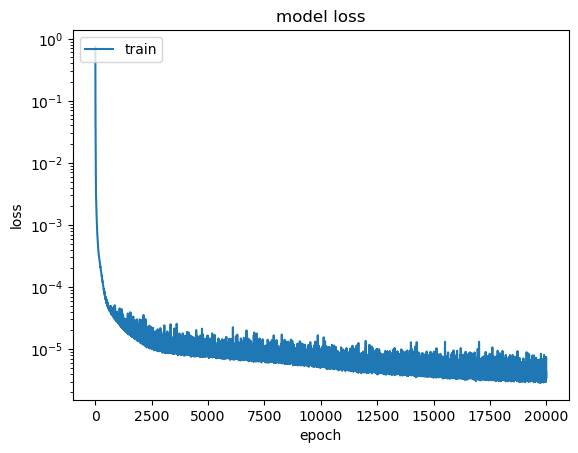

2

Epoch 1/20000
8/8 [==============================] - 4s 17ms/step - loss: 0.1320
Epoch 2/20000
8/8 [==============================] - 0s 10ms/step - loss: 0.0255
Epoch 3/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0164
Epoch 4/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0092
Epoch 5/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.0048
Epoch 6/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.0038
Epoch 7/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0028
Epoch 8/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0021
Epoch 9/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0018
Epoch 10/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0015
Epoch 11/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0014
Epoch 12/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0013
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 14ms/step - loss: 2.3650e-04
Epoch 98/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.3482e-04
Epoch 99/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3220e-04
Epoch 100/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.2936e-04
Epoch 101/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.2671e-04
Epoch 102/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2504e-04
Epoch 103/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.2361e-04
Epoch 104/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.1944e-04
Epoch 105/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.1871e-04
Epoch 106/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.1510e-04
Epoch 107/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.1338e-04
Epoch 108/20000
8/8 [==============================] - 0s 13m

8/8 [==============================] - 0s 9ms/step - loss: 1.1212e-04
Epoch 192/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.1210e-04
Epoch 193/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.1160e-04
Epoch 194/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.1061e-04
Epoch 195/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.0981e-04
Epoch 196/20000
8/8 [==============================] - 0s 24ms/step - loss: 1.0883e-04
Epoch 197/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.0842e-04
Epoch 198/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.0766e-04
Epoch 199/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0774e-04
Epoch 200/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0755e-04
Epoch 201/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0774e-04
Epoch 202/20000
8/8 [==============================] - 0s 16ms

8/8 [==============================] - 0s 11ms/step - loss: 6.9820e-05
Epoch 286/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0088e-05
Epoch 287/20000
8/8 [==============================] - 0s 21ms/step - loss: 6.9443e-05
Epoch 288/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9610e-05
Epoch 289/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.8557e-05
Epoch 290/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9702e-05
Epoch 291/20000
8/8 [==============================] - 0s 17ms/step - loss: 6.7937e-05
Epoch 292/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8411e-05
Epoch 293/20000
8/8 [==============================] - 0s 21ms/step - loss: 6.7884e-05
Epoch 294/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8018e-05
Epoch 295/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.7565e-05
Epoch 296/20000
8/8 [==============================] - 0s 28ms/s

8/8 [==============================] - 0s 11ms/step - loss: 5.0194e-05
Epoch 380/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.0130e-05
Epoch 381/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0834e-05
Epoch 382/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1121e-05
Epoch 383/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9881e-05
Epoch 384/20000
8/8 [==============================] - 0s 15ms/step - loss: 4.9800e-05
Epoch 385/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9975e-05
Epoch 386/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9212e-05
Epoch 387/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.9423e-05
Epoch 388/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9383e-05
Epoch 389/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.9204e-05
Epoch 390/20000
8/8 [==============================] - 0s 5ms/st

Epoch 474/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1206e-05
Epoch 475/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0286e-05
Epoch 476/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.0071e-05
Epoch 477/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9608e-05
Epoch 478/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0433e-05
Epoch 479/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1206e-05
Epoch 480/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0594e-05
Epoch 481/20000
8/8 [==============================] - 0s 19ms/step - loss: 3.9529e-05
Epoch 482/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1049e-05
Epoch 483/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.9368e-05
Epoch 484/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9847e-05
Epoch 485/20000
8/8 [=============================

8/8 [==============================] - 0s 4ms/step - loss: 3.7321e-05
Epoch 570/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6271e-05
Epoch 571/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4974e-05
Epoch 572/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5976e-05
Epoch 573/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5199e-05
Epoch 574/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.4092e-05
Epoch 575/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3656e-05
Epoch 576/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3147e-05
Epoch 577/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3803e-05
Epoch 578/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4042e-05
Epoch 579/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3936e-05
Epoch 580/20000
8/8 [==============================] - 0s 6ms/step -

8/8 [==============================] - 0s 5ms/step - loss: 3.6186e-05
Epoch 665/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2153e-05
Epoch 666/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0140e-05
Epoch 667/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2336e-05
Epoch 668/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8266e-05
Epoch 669/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1842e-05
Epoch 670/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0699e-05
Epoch 671/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0162e-05
Epoch 672/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1465e-05
Epoch 673/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1310e-05
Epoch 674/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6890e-05
Epoch 675/20000
8/8 [==============================] - 0s 6ms/step - l

8/8 [==============================] - 0s 5ms/step - loss: 4.5697e-05
Epoch 760/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2740e-05
Epoch 761/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1753e-05
Epoch 762/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8710e-05
Epoch 763/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7646e-05
Epoch 764/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7842e-05
Epoch 765/20000
8/8 [==============================] - 0s 20ms/step - loss: 2.7001e-05
Epoch 766/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8709e-05
Epoch 767/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1012e-05
Epoch 768/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0656e-05
Epoch 769/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7403e-05
Epoch 770/20000
8/8 [==============================] - 0s 10ms/step -

8/8 [==============================] - 0s 7ms/step - loss: 2.9566e-05
Epoch 855/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7746e-05
Epoch 856/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.4891e-05
Epoch 857/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4104e-05
Epoch 858/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4844e-05
Epoch 859/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4964e-05
Epoch 860/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5615e-05
Epoch 861/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5316e-05
Epoch 862/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4340e-05
Epoch 863/20000
8/8 [==============================] - 0s 17ms/step - loss: 2.3835e-05
Epoch 864/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.3621e-05
Epoch 865/20000
8/8 [==============================] - 0s 14ms/ste

8/8 [==============================] - 0s 5ms/step - loss: 2.2500e-05
Epoch 950/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3086e-05
Epoch 951/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4132e-05
Epoch 952/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4820e-05
Epoch 953/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4798e-05
Epoch 954/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6275e-05
Epoch 955/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7962e-05
Epoch 956/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3702e-05
Epoch 957/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2768e-05
Epoch 958/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3150e-05
Epoch 959/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4198e-05
Epoch 960/20000
8/8 [==============================] - 0s 6ms/step - l

8/8 [==============================] - 0s 5ms/step - loss: 2.8387e-05
Epoch 1044/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2990e-05
Epoch 1045/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0981e-05
Epoch 1046/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2210e-05
Epoch 1047/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5449e-05
Epoch 1048/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9066e-05
Epoch 1049/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.1919e-05
Epoch 1050/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3906e-05
Epoch 1051/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4143e-05
Epoch 1052/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2094e-05
Epoch 1053/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.1058e-05
Epoch 1054/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 2.1093e-05
Epoch 1138/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2454e-05
Epoch 1139/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9551e-05
Epoch 1140/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4523e-05
Epoch 1141/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7186e-05
Epoch 1142/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5974e-05
Epoch 1143/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0001e-05
Epoch 1144/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9319e-05
Epoch 1145/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0699e-05
Epoch 1146/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4903e-05
Epoch 1147/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1197e-05
Epoch 1148/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 2.4629e-05
Epoch 1232/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9775e-05
Epoch 1233/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1215e-05
Epoch 1234/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0067e-05
Epoch 1235/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0413e-05
Epoch 1236/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2122e-05
Epoch 1237/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0074e-05
Epoch 1238/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8806e-05
Epoch 1239/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8565e-05
Epoch 1240/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8762e-05
Epoch 1241/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9891e-05
Epoch 1242/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 2.5262e-05
Epoch 1326/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2126e-05
Epoch 1327/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7779e-05
Epoch 1328/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7603e-05
Epoch 1329/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7877e-05
Epoch 1330/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0480e-05
Epoch 1331/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0475e-05
Epoch 1332/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8947e-05
Epoch 1333/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1251e-05
Epoch 1334/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0972e-05
Epoch 1335/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3213e-05
Epoch 1336/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 1.9126e-05
Epoch 1420/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8453e-05
Epoch 1421/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0407e-05
Epoch 1422/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9493e-05
Epoch 1423/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9583e-05
Epoch 1424/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8220e-05
Epoch 1425/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8424e-05
Epoch 1426/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8385e-05
Epoch 1427/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9827e-05
Epoch 1428/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1296e-05
Epoch 1429/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7145e-05
Epoch 1430/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 7ms/step - loss: 1.7510e-05
Epoch 1514/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8645e-05
Epoch 1515/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6459e-05
Epoch 1516/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7352e-05
Epoch 1517/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6887e-05
Epoch 1518/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7460e-05
Epoch 1519/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8875e-05
Epoch 1520/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.5955e-05
Epoch 1521/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5962e-05
Epoch 1522/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8644e-05
Epoch 1523/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1689e-05
Epoch 1524/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.8766e-05
Epoch 1608/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6161e-05
Epoch 1609/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6743e-05
Epoch 1610/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0111e-05
Epoch 1611/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9175e-05
Epoch 1612/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.5026e-05
Epoch 1613/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.7956e-05
Epoch 1614/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7067e-05
Epoch 1615/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7170e-05
Epoch 1616/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8009e-05
Epoch 1617/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5370e-05
Epoch 1618/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.0211e-05
Epoch 1702/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6206e-05
Epoch 1703/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6923e-05
Epoch 1704/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9944e-05
Epoch 1705/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8951e-05
Epoch 1706/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6883e-05
Epoch 1707/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5151e-05
Epoch 1708/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8182e-05
Epoch 1709/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7301e-05
Epoch 1710/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0812e-05
Epoch 1711/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5643e-05
Epoch 1712/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 10ms/step - loss: 1.4208e-05
Epoch 1796/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8094e-05
Epoch 1797/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2034e-05
Epoch 1798/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8076e-05
Epoch 1799/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5195e-05
Epoch 1800/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7614e-05
Epoch 1801/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6502e-05
Epoch 1802/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6756e-05
Epoch 1803/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6319e-05
Epoch 1804/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5525e-05
Epoch 1805/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6370e-05
Epoch 1806/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.6558e-05
Epoch 1890/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5310e-05
Epoch 1891/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7075e-05
Epoch 1892/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7629e-05
Epoch 1893/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6848e-05
Epoch 1894/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8351e-05
Epoch 1895/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7561e-05
Epoch 1896/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5860e-05
Epoch 1897/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5490e-05
Epoch 1898/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1328e-05
Epoch 1899/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7569e-05
Epoch 1900/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.4541e-05
Epoch 1984/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6207e-05
Epoch 1985/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4187e-05
Epoch 1986/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3667e-05
Epoch 1987/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4332e-05
Epoch 1988/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4677e-05
Epoch 1989/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6781e-05
Epoch 1990/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4707e-05
Epoch 1991/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5640e-05
Epoch 1992/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4121e-05
Epoch 1993/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3755e-05
Epoch 1994/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.4708e-05
Epoch 2078/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3814e-05
Epoch 2079/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4049e-05
Epoch 2080/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6358e-05
Epoch 2081/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5240e-05
Epoch 2082/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8838e-05
Epoch 2083/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2284e-05
Epoch 2084/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5650e-05
Epoch 2085/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.4120e-05
Epoch 2086/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3155e-05
Epoch 2087/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2971e-05
Epoch 2088/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.4323e-05
Epoch 2172/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2980e-05
Epoch 2173/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3878e-05
Epoch 2174/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5035e-05
Epoch 2175/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4591e-05
Epoch 2176/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4049e-05
Epoch 2177/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3635e-05
Epoch 2178/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4385e-05
Epoch 2179/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3885e-05
Epoch 2180/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4240e-05
Epoch 2181/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5184e-05
Epoch 2182/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.3596e-05
Epoch 2266/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2384e-05
Epoch 2267/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3847e-05
Epoch 2268/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2009e-05
Epoch 2269/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3264e-05
Epoch 2270/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2769e-05
Epoch 2271/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3121e-05
Epoch 2272/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7027e-05
Epoch 2273/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9481e-05
Epoch 2274/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7227e-05
Epoch 2275/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3090e-05
Epoch 2276/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.5878e-05
Epoch 2360/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1455e-05
Epoch 2361/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0268e-05
Epoch 2362/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5284e-05
Epoch 2363/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4533e-05
Epoch 2364/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3035e-05
Epoch 2365/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5189e-05
Epoch 2366/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4463e-05
Epoch 2367/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2005e-05
Epoch 2368/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.1321e-05
Epoch 2369/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2714e-05
Epoch 2370/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.8544e-05
Epoch 2454/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5466e-05
Epoch 2455/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2147e-05
Epoch 2456/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1996e-05
Epoch 2457/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1826e-05
Epoch 2458/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2988e-05
Epoch 2459/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2969e-05
Epoch 2460/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2168e-05
Epoch 2461/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2453e-05
Epoch 2462/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3182e-05
Epoch 2463/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3436e-05
Epoch 2464/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 1.3676e-05
Epoch 2548/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1202e-05
Epoch 2549/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0952e-05
Epoch 2550/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0880e-05
Epoch 2551/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1307e-05
Epoch 2552/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1716e-05
Epoch 2553/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2624e-05
Epoch 2554/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1589e-05
Epoch 2555/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2592e-05
Epoch 2556/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1945e-05
Epoch 2557/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4361e-05
Epoch 2558/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 1.0175e-05
Epoch 2642/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1799e-05
Epoch 2643/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5594e-05
Epoch 2644/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5162e-05
Epoch 2645/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2183e-05
Epoch 2646/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3954e-05
Epoch 2647/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3682e-05
Epoch 2648/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4524e-05
Epoch 2649/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3901e-05
Epoch 2650/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0768e-05
Epoch 2651/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1499e-05
Epoch 2652/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.5076e-05
Epoch 2736/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4438e-05
Epoch 2737/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2165e-05
Epoch 2738/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1222e-05
Epoch 2739/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1568e-05
Epoch 2740/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1711e-05
Epoch 2741/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0770e-05
Epoch 2742/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0918e-05
Epoch 2743/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1346e-05
Epoch 2744/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0909e-05
Epoch 2745/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.6998e-06
Epoch 2746/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 9.8764e-06
Epoch 2830/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6574e-06
Epoch 2831/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1277e-05
Epoch 2832/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0801e-05
Epoch 2833/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0675e-05
Epoch 2834/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1413e-05
Epoch 2835/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1124e-05
Epoch 2836/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1059e-05
Epoch 2837/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2412e-05
Epoch 2838/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0554e-05
Epoch 2839/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0201e-05
Epoch 2840/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.0011e-05
Epoch 2924/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5841e-06
Epoch 2925/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0915e-05
Epoch 2926/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3579e-05
Epoch 2927/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4257e-05
Epoch 2928/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0976e-05
Epoch 2929/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1620e-05
Epoch 2930/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2537e-05
Epoch 2931/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2995e-05
Epoch 2932/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1757e-05
Epoch 2933/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1697e-05
Epoch 2934/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 8ms/step - loss: 1.1085e-05
Epoch 3018/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9708e-06
Epoch 3019/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.7063e-06
Epoch 3020/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.9523e-06
Epoch 3021/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7135e-06
Epoch 3022/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1509e-05
Epoch 3023/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6155e-05
Epoch 3024/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6443e-05
Epoch 3025/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0469e-05
Epoch 3026/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6373e-06
Epoch 3027/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0249e-05
Epoch 3028/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.4850e-05
Epoch 3112/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0586e-05
Epoch 3113/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.4940e-06
Epoch 3114/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.4294e-06
Epoch 3115/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9699e-06
Epoch 3116/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4671e-06
Epoch 3117/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0532e-05
Epoch 3118/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0061e-05
Epoch 3119/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4536e-06
Epoch 3120/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3422e-06
Epoch 3121/20000
8/8 [==============================] - 0s 15ms/step - loss: 8.3903e-06
Epoch 3122/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 1.1395e-05
Epoch 3206/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4430e-05
Epoch 3207/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2002e-05
Epoch 3208/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1101e-05
Epoch 3209/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1288e-05
Epoch 3210/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8731e-05
Epoch 3211/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0811e-05
Epoch 3212/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0456e-05
Epoch 3213/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3980e-06
Epoch 3214/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9077e-06
Epoch 3215/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1630e-06
Epoch 3216/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 1.1998e-05
Epoch 3300/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8894e-06
Epoch 3301/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1188e-06
Epoch 3302/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0438e-05
Epoch 3303/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.8260e-06
Epoch 3304/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0011e-05
Epoch 3305/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6655e-06
Epoch 3306/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7824e-06
Epoch 3307/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.0161e-06
Epoch 3308/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8566e-06
Epoch 3309/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6136e-06
Epoch 3310/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 5ms/step - loss: 8.6611e-06
Epoch 3394/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4101e-06
Epoch 3395/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0402e-05
Epoch 3396/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.2069e-06
Epoch 3397/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1245e-06
Epoch 3398/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.0141e-06
Epoch 3399/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.7929e-06
Epoch 3400/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0687e-06
Epoch 3401/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6574e-06
Epoch 3402/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5635e-06
Epoch 3403/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.3190e-06
Epoch 3404/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.5530e-05
Epoch 3488/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1321e-05
Epoch 3489/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7541e-06
Epoch 3490/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0798e-05
Epoch 3491/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0343e-05
Epoch 3492/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1296e-05
Epoch 3493/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5047e-05
Epoch 3494/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0536e-05
Epoch 3495/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4262e-06
Epoch 3496/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1295e-06
Epoch 3497/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8829e-06
Epoch 3498/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.0062e-05
Epoch 3582/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3703e-06
Epoch 3583/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9099e-06
Epoch 3584/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6187e-06
Epoch 3585/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2683e-05
Epoch 3586/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0846e-05
Epoch 3587/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2977e-05
Epoch 3588/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0317e-05
Epoch 3589/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1041e-05
Epoch 3590/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0296e-05
Epoch 3591/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2378e-05
Epoch 3592/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 9.5385e-06
Epoch 3676/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4941e-05
Epoch 3677/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6528e-05
Epoch 3678/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7048e-06
Epoch 3679/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0651e-05
Epoch 3680/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2676e-06
Epoch 3681/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.4035e-06
Epoch 3682/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.4790e-06
Epoch 3683/20000
8/8 [==============================] - 0s 11ms/step - loss: 9.4699e-06
Epoch 3684/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.2007e-06
Epoch 3685/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1006e-05
Epoch 3686/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 8.2722e-06
Epoch 3770/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9214e-06
Epoch 3771/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8150e-06
Epoch 3772/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1123e-05
Epoch 3773/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3649e-05
Epoch 3774/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6176e-05
Epoch 3775/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3129e-05
Epoch 3776/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1811e-05
Epoch 3777/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6621e-06
Epoch 3778/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7243e-06
Epoch 3779/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5805e-06
Epoch 3780/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 7.8033e-06
Epoch 3864/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2226e-06
Epoch 3865/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6092e-06
Epoch 3866/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8823e-06
Epoch 3867/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5726e-06
Epoch 3868/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9732e-06
Epoch 3869/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5572e-06
Epoch 3870/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5121e-06
Epoch 3871/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6726e-06
Epoch 3872/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2221e-06
Epoch 3873/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.0745e-06
Epoch 3874/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 8ms/step - loss: 8.6641e-06
Epoch 3958/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3787e-06
Epoch 3959/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7233e-06
Epoch 3960/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0054e-05
Epoch 3961/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9041e-06
Epoch 3962/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5988e-06
Epoch 3963/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3364e-06
Epoch 3964/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0031e-05
Epoch 3965/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2234e-05
Epoch 3966/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4006e-05
Epoch 3967/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0123e-05
Epoch 3968/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 8.9391e-06
Epoch 4052/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0107e-06
Epoch 4053/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5787e-06
Epoch 4054/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2414e-06
Epoch 4055/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.0574e-06
Epoch 4056/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3119e-06
Epoch 4057/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1648e-05
Epoch 4058/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2904e-06
Epoch 4059/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1581e-06
Epoch 4060/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9803e-06
Epoch 4061/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0253e-05
Epoch 4062/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 7.7944e-06
Epoch 4146/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.0023e-06
Epoch 4147/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.4044e-06
Epoch 4148/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1229e-05
Epoch 4149/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0429e-05
Epoch 4150/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0207e-05
Epoch 4151/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8723e-06
Epoch 4152/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6813e-06
Epoch 4153/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.9641e-06
Epoch 4154/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8747e-06
Epoch 4155/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8224e-06
Epoch 4156/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 8.6373e-06
Epoch 4240/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5820e-06
Epoch 4241/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0009e-05
Epoch 4242/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1841e-05
Epoch 4243/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1264e-05
Epoch 4244/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0294e-05
Epoch 4245/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6643e-06
Epoch 4246/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6235e-06
Epoch 4247/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2267e-05
Epoch 4248/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7469e-06
Epoch 4249/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4763e-06
Epoch 4250/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 8.5629e-06
Epoch 4334/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9574e-06
Epoch 4335/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8919e-06
Epoch 4336/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8658e-06
Epoch 4337/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9556e-06
Epoch 4338/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.3222e-06
Epoch 4339/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7386e-06
Epoch 4340/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4693e-06
Epoch 4341/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8050e-06
Epoch 4342/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1099e-06
Epoch 4343/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2566e-05
Epoch 4344/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 1.0694e-05
Epoch 4428/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9144e-06
Epoch 4429/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1405e-06
Epoch 4430/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7655e-06
Epoch 4431/20000
8/8 [==============================] - 0s 16ms/step - loss: 6.5768e-06
Epoch 4432/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7105e-06
Epoch 4433/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2228e-06
Epoch 4434/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0621e-05
Epoch 4435/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5715e-06
Epoch 4436/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7504e-06
Epoch 4437/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7475e-06
Epoch 4438/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 6.9901e-06
Epoch 4522/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6954e-06
Epoch 4523/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3999e-06
Epoch 4524/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8103e-06
Epoch 4525/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0380e-06
Epoch 4526/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4799e-06
Epoch 4527/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6954e-06
Epoch 4528/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0035e-06
Epoch 4529/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.1591e-06
Epoch 4530/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7240e-06
Epoch 4531/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6542e-06
Epoch 4532/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 61ms/step - loss: 6.5329e-06
Epoch 4616/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.3299e-06
Epoch 4617/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4402e-06
Epoch 4618/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2470e-06
Epoch 4619/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9394e-06
Epoch 4620/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1265e-05
Epoch 4621/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1977e-05
Epoch 4622/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5349e-05
Epoch 4623/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4293e-05
Epoch 4624/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7663e-05
Epoch 4625/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3590e-05
Epoch 4626/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.7674e-06
Epoch 4710/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4900e-06
Epoch 4711/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0767e-06
Epoch 4712/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5447e-06
Epoch 4713/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4199e-06
Epoch 4714/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0574e-06
Epoch 4715/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5870e-06
Epoch 4716/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8233e-06
Epoch 4717/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8826e-06
Epoch 4718/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.7545e-06
Epoch 4719/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1480e-05
Epoch 4720/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 6.8407e-06
Epoch 4804/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8684e-06
Epoch 4805/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0283e-05
Epoch 4806/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8875e-06
Epoch 4807/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8872e-06
Epoch 4808/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1495e-06
Epoch 4809/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0846e-06
Epoch 4810/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3000e-05
Epoch 4811/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2898e-06
Epoch 4812/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7835e-06
Epoch 4813/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0877e-06
Epoch 4814/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 7.6522e-06
Epoch 4898/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9721e-06
Epoch 4899/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4915e-06
Epoch 4900/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4581e-06
Epoch 4901/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0042e-06
Epoch 4902/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0045e-06
Epoch 4903/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.5840e-06
Epoch 4904/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.9054e-06
Epoch 4905/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5105e-06
Epoch 4906/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5483e-06
Epoch 4907/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0096e-06
Epoch 4908/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.0112e-05
Epoch 4992/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1472e-06
Epoch 4993/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6481e-06
Epoch 4994/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5251e-06
Epoch 4995/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2773e-06
Epoch 4996/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6930e-06
Epoch 4997/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7327e-06
Epoch 4998/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3760e-06
Epoch 4999/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6286e-06
Epoch 5000/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7011e-06
Epoch 5001/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3280e-06
Epoch 5002/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 8.3467e-06
Epoch 5086/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1804e-05
Epoch 5087/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3963e-06
Epoch 5088/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6877e-06
Epoch 5089/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9205e-06
Epoch 5090/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0143e-05
Epoch 5091/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9143e-06
Epoch 5092/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3841e-06
Epoch 5093/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8343e-06
Epoch 5094/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2459e-06
Epoch 5095/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8122e-06
Epoch 5096/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 11ms/step - loss: 6.8501e-06
Epoch 5180/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2650e-06
Epoch 5181/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8116e-06
Epoch 5182/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.1938e-06
Epoch 5183/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.9372e-06
Epoch 5184/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0110e-06
Epoch 5185/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9553e-06
Epoch 5186/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7117e-06
Epoch 5187/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4313e-06
Epoch 5188/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0668e-06
Epoch 5189/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.7287e-06
Epoch 5190/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.2079e-06
Epoch 5274/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.2010e-06
Epoch 5275/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4509e-06
Epoch 5276/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4131e-06
Epoch 5277/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.5640e-06
Epoch 5278/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4433e-06
Epoch 5279/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8955e-06
Epoch 5280/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7050e-06
Epoch 5281/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4937e-06
Epoch 5282/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.5133e-06
Epoch 5283/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5414e-06
Epoch 5284/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 1.0095e-05
Epoch 5368/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5211e-06
Epoch 5369/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1355e-06
Epoch 5370/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5788e-06
Epoch 5371/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4451e-06
Epoch 5372/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4315e-06
Epoch 5373/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3620e-06
Epoch 5374/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1244e-06
Epoch 5375/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4195e-06
Epoch 5376/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9185e-06
Epoch 5377/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7349e-06
Epoch 5378/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 6.6040e-06
Epoch 5462/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.8575e-06
Epoch 5463/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.0555e-06
Epoch 5464/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0442e-06
Epoch 5465/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1315e-06
Epoch 5466/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1907e-06
Epoch 5467/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2712e-06
Epoch 5468/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3845e-06
Epoch 5469/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6312e-06
Epoch 5470/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4475e-06
Epoch 5471/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5635e-06
Epoch 5472/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 8.5325e-06
Epoch 5556/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0577e-06
Epoch 5557/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1274e-05
Epoch 5558/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2603e-05
Epoch 5559/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1886e-05
Epoch 5560/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0186e-06
Epoch 5561/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0101e-06
Epoch 5562/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7765e-06
Epoch 5563/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9030e-06
Epoch 5564/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4236e-06
Epoch 5565/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2674e-06
Epoch 5566/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 7.9605e-06
Epoch 5650/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3163e-05
Epoch 5651/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1140e-05
Epoch 5652/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0757e-05
Epoch 5653/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2726e-06
Epoch 5654/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.3991e-06
Epoch 5655/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8295e-06
Epoch 5656/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9923e-06
Epoch 5657/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8036e-06
Epoch 5658/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6305e-06
Epoch 5659/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7412e-06
Epoch 5660/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 7.3396e-06
Epoch 5744/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2940e-06
Epoch 5745/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5845e-06
Epoch 5746/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1066e-06
Epoch 5747/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9656e-06
Epoch 5748/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1616e-06
Epoch 5749/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.7552e-06
Epoch 5750/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1405e-06
Epoch 5751/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2569e-06
Epoch 5752/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0289e-06
Epoch 5753/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6485e-06
Epoch 5754/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 7.6812e-06
Epoch 5838/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3705e-06
Epoch 5839/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.9772e-06
Epoch 5840/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2921e-06
Epoch 5841/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2060e-06
Epoch 5842/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.4006e-06
Epoch 5843/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9548e-06
Epoch 5844/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8336e-06
Epoch 5845/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0407e-06
Epoch 5846/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8844e-06
Epoch 5847/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1055e-06
Epoch 5848/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 7.1004e-06
Epoch 5932/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8167e-06
Epoch 5933/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0954e-06
Epoch 5934/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.9815e-06
Epoch 5935/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4502e-06
Epoch 5936/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5220e-06
Epoch 5937/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6400e-06
Epoch 5938/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4285e-06
Epoch 5939/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5686e-06
Epoch 5940/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.7383e-06
Epoch 5941/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2142e-06
Epoch 5942/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 5.8080e-06
Epoch 6026/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6786e-06
Epoch 6027/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5480e-06
Epoch 6028/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5645e-06
Epoch 6029/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0199e-05
Epoch 6030/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0153e-05
Epoch 6031/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3155e-05
Epoch 6032/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9208e-06
Epoch 6033/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6448e-06
Epoch 6034/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8532e-06
Epoch 6035/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9456e-06
Epoch 6036/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 4ms/step - loss: 7.8192e-06
Epoch 6120/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5987e-06
Epoch 6121/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9315e-06
Epoch 6122/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3926e-06
Epoch 6123/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2786e-06
Epoch 6124/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6249e-06
Epoch 6125/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1392e-06
Epoch 6126/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4057e-06
Epoch 6127/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9915e-06
Epoch 6128/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5483e-06
Epoch 6129/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1145e-05
Epoch 6130/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 6.4353e-06
Epoch 6214/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4357e-06
Epoch 6215/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0694e-05
Epoch 6216/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4707e-06
Epoch 6217/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0419e-06
Epoch 6218/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4247e-06
Epoch 6219/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2078e-06
Epoch 6220/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.3193e-06
Epoch 6221/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0309e-06
Epoch 6222/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.5762e-06
Epoch 6223/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3287e-06
Epoch 6224/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 9.0119e-06
Epoch 6308/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1755e-06
Epoch 6309/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6637e-06
Epoch 6310/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0372e-06
Epoch 6311/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7771e-06
Epoch 6312/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2188e-06
Epoch 6313/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5608e-06
Epoch 6314/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2308e-06
Epoch 6315/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7772e-06
Epoch 6316/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6974e-06
Epoch 6317/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.1815e-06
Epoch 6318/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 7.1006e-06
Epoch 6402/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7828e-06
Epoch 6403/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2105e-06
Epoch 6404/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9399e-06
Epoch 6405/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9933e-06
Epoch 6406/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1712e-06
Epoch 6407/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1561e-06
Epoch 6408/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6746e-06
Epoch 6409/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9951e-06
Epoch 6410/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8015e-06
Epoch 6411/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0630e-06
Epoch 6412/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.4092e-06
Epoch 6496/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9029e-06
Epoch 6497/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6179e-06
Epoch 6498/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7203e-06
Epoch 6499/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5589e-06
Epoch 6500/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8381e-06
Epoch 6501/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0316e-06
Epoch 6502/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5835e-06
Epoch 6503/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7953e-06
Epoch 6504/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4079e-06
Epoch 6505/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0172e-06
Epoch 6506/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.1477e-05
Epoch 6590/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3996e-06
Epoch 6591/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8661e-06
Epoch 6592/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7674e-06
Epoch 6593/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0377e-06
Epoch 6594/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2346e-06
Epoch 6595/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1483e-06
Epoch 6596/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2793e-06
Epoch 6597/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1759e-06
Epoch 6598/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2428e-06
Epoch 6599/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6322e-06
Epoch 6600/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 10ms/step - loss: 6.2694e-06
Epoch 6684/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.0547e-06
Epoch 6685/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6695e-06
Epoch 6686/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5982e-06
Epoch 6687/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.3965e-06
Epoch 6688/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4521e-06
Epoch 6689/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6027e-06
Epoch 6690/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3438e-06
Epoch 6691/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7173e-06
Epoch 6692/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2660e-06
Epoch 6693/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.9673e-06
Epoch 6694/20000
8/8 [==============================] - 

8/8 [==============================] - 0s 5ms/step - loss: 9.6260e-06
Epoch 6778/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6899e-06
Epoch 6779/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5432e-06
Epoch 6780/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5195e-06
Epoch 6781/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5767e-06
Epoch 6782/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2900e-06
Epoch 6783/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3225e-06
Epoch 6784/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2780e-06
Epoch 6785/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8489e-06
Epoch 6786/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7693e-06
Epoch 6787/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3400e-06
Epoch 6788/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 5.5478e-06
Epoch 6872/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3051e-06
Epoch 6873/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0868e-06
Epoch 6874/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2387e-06
Epoch 6875/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6234e-06
Epoch 6876/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4536e-06
Epoch 6877/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7798e-06
Epoch 6878/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4254e-06
Epoch 6879/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1971e-06
Epoch 6880/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2348e-06
Epoch 6881/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2664e-06
Epoch 6882/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 10ms/step - loss: 4.7330e-06
Epoch 6966/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1378e-06
Epoch 6967/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.4891e-06
Epoch 6968/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3661e-05
Epoch 6969/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1180e-05
Epoch 6970/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4378e-06
Epoch 6971/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4277e-06
Epoch 6972/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1163e-06
Epoch 6973/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3704e-06
Epoch 6974/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6471e-06
Epoch 6975/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0446e-06
Epoch 6976/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 4.8632e-06
Epoch 7060/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7934e-06
Epoch 7061/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9694e-06
Epoch 7062/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8227e-06
Epoch 7063/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9057e-06
Epoch 7064/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0683e-06
Epoch 7065/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6834e-06
Epoch 7066/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7252e-06
Epoch 7067/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4722e-06
Epoch 7068/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6662e-06
Epoch 7069/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5921e-06
Epoch 7070/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 5.6718e-06
Epoch 7154/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0618e-06
Epoch 7155/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5380e-06
Epoch 7156/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1736e-06
Epoch 7157/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7506e-06
Epoch 7158/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0035e-06
Epoch 7159/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8810e-06
Epoch 7160/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6302e-06
Epoch 7161/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1809e-06
Epoch 7162/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7736e-06
Epoch 7163/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4101e-06
Epoch 7164/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.0940e-05
Epoch 7248/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7723e-06
Epoch 7249/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1802e-05
Epoch 7250/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0403e-05
Epoch 7251/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.8187e-06
Epoch 7252/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5992e-06
Epoch 7253/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9515e-06
Epoch 7254/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5719e-06
Epoch 7255/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7064e-06
Epoch 7256/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7106e-06
Epoch 7257/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9517e-06
Epoch 7258/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 6.9035e-06
Epoch 7342/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1864e-06
Epoch 7343/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.3115e-06
Epoch 7344/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8670e-06
Epoch 7345/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2098e-06
Epoch 7346/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4877e-06
Epoch 7347/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9952e-06
Epoch 7348/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.1006e-06
Epoch 7349/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3119e-06
Epoch 7350/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9261e-06
Epoch 7351/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4919e-06
Epoch 7352/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 4.2587e-06
Epoch 7436/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9486e-06
Epoch 7437/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0888e-06
Epoch 7438/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0432e-06
Epoch 7439/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3363e-06
Epoch 7440/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9768e-06
Epoch 7441/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2875e-06
Epoch 7442/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7527e-06
Epoch 7443/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3256e-06
Epoch 7444/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9642e-06
Epoch 7445/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8399e-06
Epoch 7446/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 4.9791e-06
Epoch 7530/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7259e-06
Epoch 7531/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4166e-06
Epoch 7532/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6525e-06
Epoch 7533/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6536e-06
Epoch 7534/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7655e-06
Epoch 7535/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9086e-06
Epoch 7536/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8480e-06
Epoch 7537/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0006e-06
Epoch 7538/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2753e-06
Epoch 7539/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3674e-06
Epoch 7540/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 6.1505e-06
Epoch 7624/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1123e-06
Epoch 7625/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9318e-06
Epoch 7626/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4959e-06
Epoch 7627/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0212e-06
Epoch 7628/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0902e-06
Epoch 7629/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.8943e-06
Epoch 7630/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3642e-06
Epoch 7631/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5632e-06
Epoch 7632/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7750e-06
Epoch 7633/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7554e-06
Epoch 7634/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 5.2335e-06
Epoch 7718/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4238e-06
Epoch 7719/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2150e-06
Epoch 7720/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3798e-06
Epoch 7721/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0085e-06
Epoch 7722/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7678e-06
Epoch 7723/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2376e-06
Epoch 7724/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3634e-06
Epoch 7725/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3608e-06
Epoch 7726/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9641e-06
Epoch 7727/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1535e-06
Epoch 7728/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 5.5518e-06
Epoch 7812/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9795e-06
Epoch 7813/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7136e-06
Epoch 7814/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6316e-06
Epoch 7815/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4173e-06
Epoch 7816/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2413e-06
Epoch 7817/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7423e-06
Epoch 7818/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4765e-06
Epoch 7819/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6699e-06
Epoch 7820/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4083e-06
Epoch 7821/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0061e-06
Epoch 7822/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 5.4525e-06
Epoch 7906/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0720e-06
Epoch 7907/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8803e-06
Epoch 7908/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1223e-06
Epoch 7909/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5046e-06
Epoch 7910/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3335e-06
Epoch 7911/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9812e-06
Epoch 7912/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7926e-06
Epoch 7913/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3476e-06
Epoch 7914/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0717e-06
Epoch 7915/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0424e-06
Epoch 7916/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 5.0888e-06
Epoch 8000/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2854e-06
Epoch 8001/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8213e-06
Epoch 8002/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4992e-06
Epoch 8003/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4491e-06
Epoch 8004/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3653e-06
Epoch 8005/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.3773e-06
Epoch 8006/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4293e-06
Epoch 8007/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7735e-06
Epoch 8008/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5464e-06
Epoch 8009/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6171e-06
Epoch 8010/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 4.8196e-06
Epoch 8094/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6311e-06
Epoch 8095/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0635e-06
Epoch 8096/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.7612e-06
Epoch 8097/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.7124e-06
Epoch 8098/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1357e-06
Epoch 8099/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2960e-06
Epoch 8100/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1158e-06
Epoch 8101/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.4544e-06
Epoch 8102/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9237e-06
Epoch 8103/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.4877e-06
Epoch 8104/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 6ms/step - loss: 7.5770e-06
Epoch 8188/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0093e-06
Epoch 8189/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7444e-06
Epoch 8190/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1127e-05
Epoch 8191/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9106e-06
Epoch 8192/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5224e-06
Epoch 8193/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8668e-06
Epoch 8194/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9428e-06
Epoch 8195/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7521e-06
Epoch 8196/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.6587e-06
Epoch 8197/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1757e-06
Epoch 8198/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 5.0738e-06
Epoch 8282/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3079e-06
Epoch 8283/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1885e-06
Epoch 8284/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.5633e-06
Epoch 8285/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0671e-06
Epoch 8286/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6308e-06
Epoch 8287/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9035e-06
Epoch 8288/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.5647e-06
Epoch 8289/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.5647e-06
Epoch 8290/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9866e-06
Epoch 8291/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8922e-06
Epoch 8292/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 5ms/step - loss: 4.3124e-06
Epoch 8376/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9105e-06
Epoch 8377/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.6313e-06
Epoch 8378/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8772e-06
Epoch 8379/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9612e-06
Epoch 8380/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6217e-06
Epoch 8381/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8939e-06
Epoch 8382/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4765e-06
Epoch 8383/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7996e-06
Epoch 8384/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9697e-06
Epoch 8385/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6559e-06
Epoch 8386/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 3.9103e-06
Epoch 8470/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1288e-06
Epoch 8471/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3259e-06
Epoch 8472/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1979e-06
Epoch 8473/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8803e-06
Epoch 8474/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8989e-06
Epoch 8475/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8319e-06
Epoch 8476/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1028e-06
Epoch 8477/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8453e-06
Epoch 8478/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0862e-06
Epoch 8479/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1715e-06
Epoch 8480/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 5.1376e-06
Epoch 8564/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8274e-06
Epoch 8565/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4104e-06
Epoch 8566/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7900e-06
Epoch 8567/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7684e-06
Epoch 8568/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9877e-06
Epoch 8569/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6405e-06
Epoch 8570/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2206e-06
Epoch 8571/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0450e-06
Epoch 8572/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0011e-06
Epoch 8573/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6685e-06
Epoch 8574/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 4.9775e-06
Epoch 8658/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0798e-06
Epoch 8659/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2761e-06
Epoch 8660/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0385e-06
Epoch 8661/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5938e-06
Epoch 8662/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4074e-06
Epoch 8663/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7552e-06
Epoch 8664/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3243e-06
Epoch 8665/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6771e-06
Epoch 8666/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5768e-06
Epoch 8667/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4625e-06
Epoch 8668/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 3.9296e-06
Epoch 8752/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4004e-06
Epoch 8753/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2276e-06
Epoch 8754/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4457e-06
Epoch 8755/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1392e-06
Epoch 8756/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1071e-06
Epoch 8757/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0486e-06
Epoch 8758/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4125e-06
Epoch 8759/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7429e-06
Epoch 8760/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5902e-06
Epoch 8761/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9139e-06
Epoch 8762/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 7ms/step - loss: 5.2890e-06
Epoch 8846/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6276e-06
Epoch 8847/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8236e-06
Epoch 8848/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7916e-06
Epoch 8849/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7712e-06
Epoch 8850/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0124e-06
Epoch 8851/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2687e-06
Epoch 8852/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9904e-06
Epoch 8853/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8397e-06
Epoch 8854/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3690e-06
Epoch 8855/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9318e-06
Epoch 8856/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 9ms/step - loss: 5.3521e-06
Epoch 8940/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6742e-06
Epoch 8941/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6760e-06
Epoch 8942/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9224e-06
Epoch 8943/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8169e-06
Epoch 8944/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6550e-06
Epoch 8945/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5076e-06
Epoch 8946/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6452e-06
Epoch 8947/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0658e-06
Epoch 8948/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4796e-06
Epoch 8949/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8350e-06
Epoch 8950/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 5ms/step - loss: 4.3936e-06
Epoch 9034/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5796e-06
Epoch 9035/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.8769e-06
Epoch 9036/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9579e-06
Epoch 9037/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6595e-06
Epoch 9038/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1200e-06
Epoch 9039/20000
8/8 [==============================] - 0s 16ms/step - loss: 6.4326e-06
Epoch 9040/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5135e-06
Epoch 9041/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5830e-06
Epoch 9042/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0846e-06
Epoch 9043/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6344e-06
Epoch 9044/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 3.4499e-06
Epoch 9128/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8114e-06
Epoch 9129/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7485e-06
Epoch 9130/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5750e-06
Epoch 9131/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0306e-06
Epoch 9132/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7840e-06
Epoch 9133/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8921e-06
Epoch 9134/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1238e-06
Epoch 9135/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7292e-06
Epoch 9136/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9746e-06
Epoch 9137/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7431e-06
Epoch 9138/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 11ms/step - loss: 3.9785e-06
Epoch 9222/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5563e-06
Epoch 9223/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7738e-06
Epoch 9224/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8346e-06
Epoch 9225/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0315e-06
Epoch 9226/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6206e-06
Epoch 9227/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.6009e-06
Epoch 9228/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1739e-06
Epoch 9229/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8611e-06
Epoch 9230/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5470e-06
Epoch 9231/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2692e-06
Epoch 9232/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 3.6297e-06
Epoch 9316/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3204e-06
Epoch 9317/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.5760e-06
Epoch 9318/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3070e-06
Epoch 9319/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8652e-06
Epoch 9320/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.9886e-06
Epoch 9321/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7891e-06
Epoch 9322/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3013e-06
Epoch 9323/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3360e-06
Epoch 9324/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3249e-06
Epoch 9325/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5307e-06
Epoch 9326/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 12ms/step - loss: 1.0765e-05
Epoch 9410/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5948e-06
Epoch 9411/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2998e-06
Epoch 9412/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3044e-06
Epoch 9413/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6833e-06
Epoch 9414/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1121e-06
Epoch 9415/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8837e-06
Epoch 9416/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4490e-06
Epoch 9417/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6900e-06
Epoch 9418/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.2868e-06
Epoch 9419/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4157e-06
Epoch 9420/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 5.2964e-06
Epoch 9504/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1016e-06
Epoch 9505/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3373e-06
Epoch 9506/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1239e-06
Epoch 9507/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4247e-06
Epoch 9508/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2604e-06
Epoch 9509/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4788e-06
Epoch 9510/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9071e-06
Epoch 9511/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8591e-06
Epoch 9512/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7641e-06
Epoch 9513/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1801e-06
Epoch 9514/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 4.1860e-06
Epoch 9598/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9812e-06
Epoch 9599/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.7481e-06
Epoch 9600/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7957e-06
Epoch 9601/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5035e-06
Epoch 9602/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0481e-06
Epoch 9603/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3390e-06
Epoch 9604/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6579e-06
Epoch 9605/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5026e-06
Epoch 9606/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.2766e-06
Epoch 9607/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3869e-06
Epoch 9608/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 11ms/step - loss: 3.3532e-06
Epoch 9692/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7343e-06
Epoch 9693/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4465e-06
Epoch 9694/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8056e-06
Epoch 9695/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2823e-06
Epoch 9696/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4545e-06
Epoch 9697/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3429e-06
Epoch 9698/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3061e-06
Epoch 9699/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4026e-06
Epoch 9700/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2307e-06
Epoch 9701/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6558e-06
Epoch 9702/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 3.7838e-06
Epoch 9786/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7069e-06
Epoch 9787/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7447e-06
Epoch 9788/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1993e-06
Epoch 9789/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4566e-06
Epoch 9790/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8900e-06
Epoch 9791/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2224e-06
Epoch 9792/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1846e-06
Epoch 9793/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4235e-06
Epoch 9794/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2192e-06
Epoch 9795/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.0624e-06
Epoch 9796/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 3.9323e-06
Epoch 9880/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1351e-06
Epoch 9881/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4187e-06
Epoch 9882/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0669e-06
Epoch 9883/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7600e-06
Epoch 9884/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8362e-06
Epoch 9885/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7360e-06
Epoch 9886/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1660e-06
Epoch 9887/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.7254e-06
Epoch 9888/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9578e-06
Epoch 9889/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4726e-06
Epoch 9890/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 3.8159e-06
Epoch 9974/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.7416e-06
Epoch 9975/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1696e-06
Epoch 9976/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7827e-06
Epoch 9977/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1139e-06
Epoch 9978/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8904e-06
Epoch 9979/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2789e-06
Epoch 9980/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3479e-06
Epoch 9981/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0368e-06
Epoch 9982/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2735e-06
Epoch 9983/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9194e-06
Epoch 9984/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 17ms/step - loss: 3.2679e-06
Epoch 10067/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.8843e-06
Epoch 10068/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0387e-06
Epoch 10069/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0744e-06
Epoch 10070/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5963e-06
Epoch 10071/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0524e-06
Epoch 10072/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1851e-06
Epoch 10073/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8411e-06
Epoch 10074/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8816e-06
Epoch 10075/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2786e-06
Epoch 10076/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6736e-06
Epoch 10077/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 4.2576e-06
Epoch 10160/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5602e-06
Epoch 10161/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2688e-06
Epoch 10162/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7347e-06
Epoch 10163/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7962e-06
Epoch 10164/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3364e-06
Epoch 10165/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.6863e-06
Epoch 10166/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5449e-06
Epoch 10167/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2400e-06
Epoch 10168/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2958e-06
Epoch 10169/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4219e-06
Epoch 10170/20000
8/8 [==========================

8/8 [==============================] - 0s 10ms/step - loss: 3.2187e-06
Epoch 10253/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5279e-06
Epoch 10254/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2439e-06
Epoch 10255/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.4473e-06
Epoch 10256/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0660e-06
Epoch 10257/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.5310e-06
Epoch 10258/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9671e-06
Epoch 10259/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8796e-06
Epoch 10260/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6011e-06
Epoch 10261/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5173e-06
Epoch 10262/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5779e-06
Epoch 10263/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5173e-06
Epoch 10346/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4200e-06
Epoch 10347/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2509e-06
Epoch 10348/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6368e-06
Epoch 10349/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0809e-06
Epoch 10350/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5766e-06
Epoch 10351/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.2052e-06
Epoch 10352/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6336e-06
Epoch 10353/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3551e-06
Epoch 10354/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8126e-06
Epoch 10355/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1126e-06
Epoch 10356/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.4342e-06
Epoch 10439/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4149e-06
Epoch 10440/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2129e-06
Epoch 10441/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6355e-06
Epoch 10442/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8080e-06
Epoch 10443/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7888e-06
Epoch 10444/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4582e-06
Epoch 10445/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5001e-06
Epoch 10446/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1121e-06
Epoch 10447/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2539e-06
Epoch 10448/20000
8/8 [==============================] - 0s 36ms/step - loss: 2.7904e-06
Epoch 10449/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 3.5153e-06
Epoch 10532/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2247e-06
Epoch 10533/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2542e-06
Epoch 10534/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2249e-06
Epoch 10535/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9040e-06
Epoch 10536/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2768e-06
Epoch 10537/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7737e-06
Epoch 10538/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6783e-06
Epoch 10539/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8669e-06
Epoch 10540/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9645e-06
Epoch 10541/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.4085e-06
Epoch 10542/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2952e-06
Epoch 10625/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1738e-06
Epoch 10626/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0322e-06
Epoch 10627/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4876e-06
Epoch 10628/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5595e-06
Epoch 10629/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9879e-06
Epoch 10630/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6183e-06
Epoch 10631/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3666e-06
Epoch 10632/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3903e-06
Epoch 10633/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2356e-06
Epoch 10634/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0870e-06
Epoch 10635/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 4.0461e-06
Epoch 10718/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7365e-06
Epoch 10719/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2790e-06
Epoch 10720/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8471e-06
Epoch 10721/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5209e-06
Epoch 10722/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4896e-06
Epoch 10723/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9495e-06
Epoch 10724/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2868e-06
Epoch 10725/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4191e-06
Epoch 10726/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0289e-06
Epoch 10727/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5745e-06
Epoch 10728/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.8730e-06
Epoch 10811/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3165e-06
Epoch 10812/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4588e-06
Epoch 10813/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8086e-06
Epoch 10814/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2847e-06
Epoch 10815/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1704e-06
Epoch 10816/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0997e-06
Epoch 10817/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2765e-06
Epoch 10818/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0020e-06
Epoch 10819/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0684e-06
Epoch 10820/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.2237e-06
Epoch 10821/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 6.7969e-06
Epoch 10904/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6788e-06
Epoch 10905/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6331e-06
Epoch 10906/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3132e-06
Epoch 10907/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.1915e-06
Epoch 10908/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1158e-06
Epoch 10909/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1513e-06
Epoch 10910/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7567e-06
Epoch 10911/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3423e-06
Epoch 10912/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6062e-06
Epoch 10913/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.3608e-06
Epoch 10914/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0144e-06
Epoch 10997/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2118e-06
Epoch 10998/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0587e-06
Epoch 10999/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3272e-06
Epoch 11000/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7517e-06
Epoch 11001/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2396e-06
Epoch 11002/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7168e-06
Epoch 11003/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0135e-06
Epoch 11004/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8056e-06
Epoch 11005/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3664e-06
Epoch 11006/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3597e-06
Epoch 11007/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 3.2581e-06
Epoch 11090/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0132e-06
Epoch 11091/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2049e-06
Epoch 11092/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7472e-06
Epoch 11093/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4784e-06
Epoch 11094/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0878e-06
Epoch 11095/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0499e-06
Epoch 11096/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8706e-06
Epoch 11097/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1738e-06
Epoch 11098/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2677e-06
Epoch 11099/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3532e-06
Epoch 11100/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9623e-06
Epoch 11183/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4028e-06
Epoch 11184/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7883e-06
Epoch 11185/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1098e-06
Epoch 11186/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7005e-06
Epoch 11187/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4891e-06
Epoch 11188/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9203e-06
Epoch 11189/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9408e-06
Epoch 11190/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8941e-06
Epoch 11191/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0325e-06
Epoch 11192/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0059e-06
Epoch 11193/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2693e-06
Epoch 11276/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3695e-06
Epoch 11277/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4930e-06
Epoch 11278/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2501e-06
Epoch 11279/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.1583e-06
Epoch 11280/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3599e-06
Epoch 11281/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2747e-06
Epoch 11282/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4490e-06
Epoch 11283/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9489e-06
Epoch 11284/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2860e-06
Epoch 11285/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.9737e-06
Epoch 11286/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 5.1552e-06
Epoch 11369/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9391e-06
Epoch 11370/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2563e-06
Epoch 11371/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4673e-06
Epoch 11372/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1917e-06
Epoch 11373/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4214e-06
Epoch 11374/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2069e-06
Epoch 11375/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.9601e-06
Epoch 11376/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4823e-06
Epoch 11377/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6504e-06
Epoch 11378/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0322e-06
Epoch 11379/20000
8/8 [==========================

8/8 [==============================] - 0s 10ms/step - loss: 2.8600e-06
Epoch 11462/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8123e-06
Epoch 11463/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8713e-06
Epoch 11464/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1115e-06
Epoch 11465/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8694e-06
Epoch 11466/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2524e-06
Epoch 11467/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4258e-06
Epoch 11468/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0340e-06
Epoch 11469/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.0161e-06
Epoch 11470/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6011e-06
Epoch 11471/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5840e-06
Epoch 11472/20000
8/8 [=========================

8/8 [==============================] - 0s 8ms/step - loss: 3.9622e-06
Epoch 11555/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8812e-06
Epoch 11556/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2389e-06
Epoch 11557/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0892e-06
Epoch 11558/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1727e-06
Epoch 11559/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5174e-06
Epoch 11560/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0218e-06
Epoch 11561/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9072e-06
Epoch 11562/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9454e-06
Epoch 11563/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0469e-06
Epoch 11564/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4501e-06
Epoch 11565/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.7388e-06
Epoch 11715/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6931e-06
Epoch 11716/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0988e-06
Epoch 11717/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2708e-06
Epoch 11718/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9353e-06
Epoch 11719/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4324e-06
Epoch 11720/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9322e-06
Epoch 11721/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5688e-06
Epoch 11722/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1603e-06
Epoch 11723/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3044e-06
Epoch 11724/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8864e-06
Epoch 11725/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.7490e-06
Epoch 11808/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6522e-06
Epoch 11809/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6429e-06
Epoch 11810/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4697e-06
Epoch 11811/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1458e-06
Epoch 11812/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1911e-06
Epoch 11813/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7952e-06
Epoch 11814/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8434e-06
Epoch 11815/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2730e-06
Epoch 11816/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1926e-06
Epoch 11817/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5845e-06
Epoch 11818/20000
8/8 [===========================

8/8 [==============================] - 0s 15ms/step - loss: 2.9652e-06
Epoch 11969/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2571e-06
Epoch 11970/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8887e-06
Epoch 11971/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6894e-06
Epoch 11972/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1742e-06
Epoch 11973/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1623e-06
Epoch 11974/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0209e-06
Epoch 11975/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8808e-06
Epoch 11976/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1955e-06
Epoch 11977/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8885e-06
Epoch 11978/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3885e-06
Epoch 11979/20000
8/8 [==========================

8/8 [==============================] - 0s 12ms/step - loss: 5.5032e-06
Epoch 12062/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2399e-06
Epoch 12063/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6593e-06
Epoch 12064/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9418e-06
Epoch 12065/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8526e-06
Epoch 12066/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6995e-06
Epoch 12067/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5497e-06
Epoch 12068/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5823e-06
Epoch 12069/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6808e-06
Epoch 12070/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1438e-06
Epoch 12071/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4195e-06
Epoch 12072/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.8380e-06
Epoch 12237/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4913e-06
Epoch 12238/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5726e-06
Epoch 12239/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1670e-06
Epoch 12240/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8988e-06
Epoch 12241/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0793e-06
Epoch 12242/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8705e-06
Epoch 12243/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0780e-06
Epoch 12244/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5054e-06
Epoch 12245/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9677e-06
Epoch 12246/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8711e-06
Epoch 12247/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.7130e-06
Epoch 12330/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4133e-06
Epoch 12331/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8828e-06
Epoch 12332/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7847e-06
Epoch 12333/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8298e-06
Epoch 12416/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5127e-06
Epoch 12417/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.9403e-06
Epoch 12418/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7731e-06
Epoch 12419/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0492e-06
Epoch 12420/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4899e-06
Epoch 12421/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4038e-06
Epoch 12422/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2619e-06
Epoch 12505/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9159e-06
Epoch 12506/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.9578e-06
Epoch 12507/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5530e-06
Epoch 12508/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5748e-06
Epoch 12509/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9876e-06
Epoch 12510/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.9903e-06
Epoch 12511/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7263e-06
Epoch 12512/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9983e-06
Epoch 12513/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0091e-06
Epoch 12514/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4664e-06
Epoch 12515/20000
8/8 [========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7882e-06
Epoch 12676/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8213e-06
Epoch 12677/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9857e-06
Epoch 12678/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6498e-06
Epoch 12679/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4786e-06
Epoch 12680/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2306e-06
Epoch 12681/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6446e-06
Epoch 12682/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0568e-06
Epoch 12683/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1894e-06
Epoch 12684/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4284e-06
Epoch 12685/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9240e-06
Epoch 12686/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 3.8769e-06
Epoch 12769/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3605e-06
Epoch 12770/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0510e-06
Epoch 12771/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7972e-06
Epoch 12772/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3115e-06
Epoch 12773/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5944e-06
Epoch 12774/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8142e-06
Epoch 12775/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0228e-06
Epoch 12776/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.8426e-06
Epoch 12777/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7010e-06
Epoch 12778/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8748e-06
Epoch 12779/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0975e-06
Epoch 12862/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2759e-06
Epoch 12863/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3440e-06
Epoch 12864/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9655e-06
Epoch 12865/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8559e-06
Epoch 12866/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5769e-06
Epoch 12867/20000
8/8 [==============================] - 0s 21ms/step - loss: 3.9297e-06
Epoch 12868/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1962e-06
Epoch 12869/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7221e-06
Epoch 12870/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2185e-06
Epoch 12871/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5547e-06
Epoch 12872/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5088e-06
Epoch 12955/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5658e-06
Epoch 12956/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1096e-06
Epoch 12957/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1242e-06
Epoch 12958/20000
8/8 [==============================] - 0s 19ms/step - loss: 3.5482e-06
Epoch 12959/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3757e-06
Epoch 12960/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4404e-06
Epoch 12961/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7355e-06
Epoch 12962/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4884e-06
Epoch 12963/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1358e-06
Epoch 12964/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6845e-06
Epoch 12965/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2628e-06
Epoch 13180/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1155e-06
Epoch 13181/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6081e-06
Epoch 13182/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4241e-06
Epoch 13183/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7699e-06
Epoch 13184/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7414e-06
Epoch 13185/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2553e-06
Epoch 13186/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6984e-06
Epoch 13187/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3481e-06
Epoch 13188/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2381e-06
Epoch 13189/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9970e-06
Epoch 13190/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.0572e-06
Epoch 13339/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0827e-06
Epoch 13340/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0188e-06
Epoch 13341/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2729e-06
Epoch 13342/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6828e-06
Epoch 13343/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8959e-06
Epoch 13344/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6738e-06
Epoch 13345/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9295e-06
Epoch 13346/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7768e-06
Epoch 13347/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9931e-06
Epoch 13348/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4618e-06
Epoch 13349/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9496e-06
Epoch 13432/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4214e-06
Epoch 13433/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9645e-06
Epoch 13434/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6201e-06
Epoch 13435/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8379e-06
Epoch 13436/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6180e-06
Epoch 13437/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1347e-06
Epoch 13438/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1385e-06
Epoch 13439/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2284e-06
Epoch 13440/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1579e-06
Epoch 13441/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6811e-06
Epoch 13442/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1841e-06
Epoch 13590/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2048e-06
Epoch 13591/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1864e-06
Epoch 13592/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4008e-06
Epoch 13593/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1837e-06
Epoch 13594/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9016e-06
Epoch 13595/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0642e-06
Epoch 13596/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3530e-06
Epoch 13597/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0261e-06
Epoch 13598/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7728e-06
Epoch 13599/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3872e-06
Epoch 13600/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.9386e-06
Epoch 13683/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2059e-06
Epoch 13684/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7170e-06
Epoch 13685/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8274e-06
Epoch 13686/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8104e-06
Epoch 13687/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9021e-06
Epoch 13688/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1198e-06
Epoch 13689/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9815e-06
Epoch 13690/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0528e-06
Epoch 13691/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5719e-06
Epoch 13692/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3761e-06
Epoch 13693/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.6057e-06
Epoch 13853/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3124e-06
Epoch 13854/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9342e-06
Epoch 13855/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6507e-06
Epoch 13856/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7967e-06
Epoch 13857/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7516e-06
Epoch 13858/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6935e-06
Epoch 13859/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3741e-06
Epoch 13860/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4039e-06
Epoch 13861/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9329e-06
Epoch 13862/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.5112e-06
Epoch 13863/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 2.4551e-06
Epoch 13946/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5539e-06
Epoch 13947/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7147e-06
Epoch 13948/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0684e-06
Epoch 13949/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.3367e-06
Epoch 13950/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.4782e-06
Epoch 13951/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5135e-06
Epoch 13952/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.7985e-06
Epoch 13953/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5169e-06
Epoch 13954/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1444e-06
Epoch 13955/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8434e-06
Epoch 13956/20000
8/8 [========================

8/8 [==============================] - 0s 7ms/step - loss: 2.9026e-06
Epoch 14039/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7297e-06
Epoch 14040/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5880e-06
Epoch 14041/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4950e-06
Epoch 14042/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5795e-06
Epoch 14043/20000
8/8 [==============================] - 0s 24ms/step - loss: 2.2401e-06
Epoch 14044/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7216e-06
Epoch 14045/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6581e-06
Epoch 14046/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9191e-06
Epoch 14047/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7674e-06
Epoch 14048/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0236e-06
Epoch 14049/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.0934e-06
Epoch 14267/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2587e-06
Epoch 14268/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4360e-06
Epoch 14269/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2565e-06
Epoch 14270/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4875e-06
Epoch 14271/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2252e-06
Epoch 14272/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5044e-06
Epoch 14273/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0214e-06
Epoch 14274/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8408e-06
Epoch 14275/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7864e-06
Epoch 14276/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9243e-06
Epoch 14277/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.1928e-06
Epoch 14360/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3898e-06
Epoch 14361/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6043e-06
Epoch 14362/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8427e-06
Epoch 14363/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0427e-06
Epoch 14364/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9613e-06
Epoch 14365/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5497e-06
Epoch 14366/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8873e-06
Epoch 14367/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3393e-06
Epoch 14368/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1126e-06
Epoch 14369/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4925e-06
Epoch 14370/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 2.9935e-06
Epoch 14521/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4198e-06
Epoch 14522/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2487e-06
Epoch 14523/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4963e-06
Epoch 14524/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.3765e-06
Epoch 14525/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2557e-06
Epoch 14526/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5872e-06
Epoch 14527/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4455e-06
Epoch 14528/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2554e-06
Epoch 14529/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5209e-06
Epoch 14530/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7812e-06
Epoch 14531/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 2.5055e-06
Epoch 14692/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4531e-06
Epoch 14693/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6984e-06
Epoch 14694/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4052e-06
Epoch 14695/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4971e-06
Epoch 14696/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9305e-06
Epoch 14697/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1355e-06
Epoch 14698/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1064e-06
Epoch 14699/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7211e-06
Epoch 14700/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1826e-06
Epoch 14701/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9007e-06
Epoch 14702/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.4802e-06
Epoch 14785/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5562e-06
Epoch 14786/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4787e-06
Epoch 14787/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3518e-06
Epoch 14788/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6092e-06
Epoch 14789/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1960e-06
Epoch 14790/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.0121e-06
Epoch 14791/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7279e-06
Epoch 14792/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1156e-06
Epoch 14793/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3774e-06
Epoch 14794/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.2743e-06
Epoch 14795/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2872e-06
Epoch 14936/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2848e-06
Epoch 14937/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5125e-06
Epoch 14938/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6993e-06
Epoch 14939/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1170e-06
Epoch 14940/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6033e-06
Epoch 14941/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9077e-06
Epoch 14942/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3871e-06
Epoch 14943/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2107e-06
Epoch 14944/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3361e-06
Epoch 14945/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2079e-06
Epoch 14946/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.9012e-06
Epoch 15029/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7142e-06
Epoch 15030/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6794e-06
Epoch 15031/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7808e-06
Epoch 15032/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9283e-06
Epoch 15033/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9064e-06
Epoch 15034/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6749e-06
Epoch 15035/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7482e-06
Epoch 15036/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5670e-06
Epoch 15037/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4111e-06
Epoch 15038/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7160e-06
Epoch 15039/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 3.0454e-06
Epoch 15185/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3957e-06
Epoch 15186/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0299e-06
Epoch 15187/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0717e-06
Epoch 15188/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0474e-06
Epoch 15189/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3178e-06
Epoch 15190/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0485e-06
Epoch 15191/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7828e-06
Epoch 15192/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1199e-06
Epoch 15193/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5508e-06
Epoch 15194/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7173e-06
Epoch 15195/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.8026e-06
Epoch 15278/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4731e-06
Epoch 15279/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6077e-06
Epoch 15280/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2601e-06
Epoch 15281/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0716e-06
Epoch 15282/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8265e-06
Epoch 15283/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5538e-06
Epoch 15284/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.2682e-06
Epoch 15285/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0128e-06
Epoch 15355/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1239e-06
Epoch 15356/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1797e-06
Epoch 15357/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.4948e-06
Epoch 15439/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6922e-06
Epoch 15440/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9904e-06
Epoch 15441/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7691e-06
Epoch 15442/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1095e-06
Epoch 15443/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2124e-06
Epoch 15444/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3749e-06
Epoch 15445/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4073e-06
Epoch 15446/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7060e-06
Epoch 15447/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8413e-06
Epoch 15448/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2295e-06
Epoch 15449/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.4121e-06
Epoch 15624/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2244e-06
Epoch 15625/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9275e-06
Epoch 15626/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7934e-06
Epoch 15627/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3722e-06
Epoch 15628/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6721e-06
Epoch 15629/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2187e-06
Epoch 15630/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4767e-06
Epoch 15631/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.0892e-06
Epoch 15632/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5144e-06
Epoch 15633/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3082e-06
Epoch 15634/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.0061e-06
Epoch 15717/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1878e-06
Epoch 15718/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7163e-06
Epoch 15719/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3259e-06
Epoch 15720/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2646e-06
Epoch 15721/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9868e-06
Epoch 15722/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2725e-06
Epoch 15723/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3042e-06
Epoch 15724/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7721e-06
Epoch 15725/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4793e-06
Epoch 15726/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2936e-06
Epoch 15727/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 2.3774e-06
Epoch 15886/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3241e-06
Epoch 15887/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4400e-06
Epoch 15888/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9810e-06
Epoch 15889/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2447e-06
Epoch 15890/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4372e-06
Epoch 15891/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7936e-06
Epoch 15892/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5851e-06
Epoch 15893/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.5029e-06
Epoch 15894/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1566e-06
Epoch 15895/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1865e-06
Epoch 15896/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.6902e-06
Epoch 15979/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9645e-06
Epoch 15980/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6443e-06
Epoch 15981/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8444e-06
Epoch 15982/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5394e-06
Epoch 15983/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9371e-06
Epoch 15984/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7888e-06
Epoch 15985/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5842e-06
Epoch 15986/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9522e-06
Epoch 15987/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7551e-06
Epoch 15988/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5112e-06
Epoch 15989/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 2.8537e-06
Epoch 16140/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7233e-06
Epoch 16141/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8531e-06
Epoch 16142/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6150e-06
Epoch 16143/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2951e-06
Epoch 16144/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5953e-06
Epoch 16145/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.7438e-06
Epoch 16146/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8052e-06
Epoch 16147/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5090e-06
Epoch 16148/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6737e-06
Epoch 16149/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0666e-06
Epoch 16150/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.6365e-06
Epoch 16292/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7714e-06
Epoch 16293/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1164e-06
Epoch 16294/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2479e-06
Epoch 16295/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4836e-06
Epoch 16296/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1612e-06
Epoch 16297/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4973e-06
Epoch 16298/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6216e-06
Epoch 16299/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6164e-06
Epoch 16300/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.6372e-06
Epoch 16301/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4757e-06
Epoch 16302/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 2.1744e-06
Epoch 16385/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0927e-06
Epoch 16386/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2221e-06
Epoch 16387/20000
8/8 [==============================] - 0s 23ms/step - loss: 2.5803e-06
Epoch 16388/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5553e-06
Epoch 16389/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7243e-06
Epoch 16390/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2787e-06
Epoch 16391/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9026e-06
Epoch 16392/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1133e-06
Epoch 16393/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6891e-06
Epoch 16394/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7823e-06
Epoch 16395/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 5.1558e-06
Epoch 16533/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3463e-06
Epoch 16534/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1272e-06
Epoch 16535/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1194e-06
Epoch 16536/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9607e-06
Epoch 16537/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6941e-06
Epoch 16538/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2611e-06
Epoch 16539/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6568e-06
Epoch 16540/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3254e-06
Epoch 16541/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2247e-06
Epoch 16542/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6622e-06
Epoch 16543/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9981e-06
Epoch 16626/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1690e-06
Epoch 16627/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0533e-06
Epoch 16628/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6766e-06
Epoch 16629/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3599e-06
Epoch 16630/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4368e-06
Epoch 16631/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4147e-06
Epoch 16632/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.6484e-06
Epoch 16633/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2319e-06
Epoch 16634/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8636e-06
Epoch 16635/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2687e-06
Epoch 16636/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8322e-06
Epoch 16802/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9050e-06
Epoch 16803/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7925e-06
Epoch 16804/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0406e-06
Epoch 16805/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9014e-06
Epoch 16806/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0298e-06
Epoch 16807/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1226e-06
Epoch 16808/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0166e-06
Epoch 16809/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0806e-06
Epoch 16810/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2929e-06
Epoch 16811/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9229e-06
Epoch 16812/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.1452e-06
Epoch 16895/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8408e-06
Epoch 16896/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1526e-06
Epoch 16897/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.3824e-06
Epoch 16898/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.0674e-06
Epoch 16899/20000
8/8 [==============================] - 0s 21ms/step - loss: 2.2018e-06
Epoch 16977/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2212e-06
Epoch 16978/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1567e-06
Epoch 16979/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3824e-06
Epoch 16980/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6267e-06
Epoch 16981/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5262e-06
Epoch 16982/20000
8/8 [=======================

8/8 [==============================] - 0s 9ms/step - loss: 2.4041e-06
Epoch 17064/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3602e-06
Epoch 17065/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1423e-06
Epoch 17066/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6743e-06
Epoch 17067/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9801e-06
Epoch 17068/20000
8/8 [==============================] - 0s 20ms/step - loss: 3.1039e-06
Epoch 17069/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5189e-06
Epoch 17070/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6951e-06
Epoch 17071/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1674e-06
Epoch 17072/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6350e-06
Epoch 17073/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8278e-06
Epoch 17074/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 2.2264e-06
Epoch 17220/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4088e-06
Epoch 17221/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3863e-06
Epoch 17222/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0529e-06
Epoch 17223/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9519e-06
Epoch 17224/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2044e-06
Epoch 17225/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8725e-06
Epoch 17226/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5498e-06
Epoch 17227/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4518e-06
Epoch 17228/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9364e-06
Epoch 17229/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8049e-06
Epoch 17230/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 3.1993e-06
Epoch 17313/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2597e-06
Epoch 17314/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5441e-06
Epoch 17315/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2868e-06
Epoch 17316/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1465e-06
Epoch 17317/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1747e-06
Epoch 17318/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3776e-06
Epoch 17319/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3660e-06
Epoch 17320/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2314e-06
Epoch 17321/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.8540e-06
Epoch 17322/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3339e-06
Epoch 17323/20000
8/8 [========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7417e-06
Epoch 17470/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2248e-06
Epoch 17471/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9243e-06
Epoch 17472/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4685e-06
Epoch 17473/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4776e-06
Epoch 17474/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6703e-06
Epoch 17475/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5652e-06
Epoch 17476/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5534e-06
Epoch 17477/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1032e-06
Epoch 17478/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4921e-06
Epoch 17479/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7659e-06
Epoch 17480/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.2644e-06
Epoch 17563/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6686e-06
Epoch 17564/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6368e-06
Epoch 17565/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.7078e-06
Epoch 17566/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2718e-06
Epoch 17567/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9853e-06
Epoch 17568/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3805e-06
Epoch 17569/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2820e-06
Epoch 17570/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0916e-06
Epoch 17571/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8198e-06
Epoch 17572/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7244e-06
Epoch 17573/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.4244e-06
Epoch 17730/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8728e-06
Epoch 17731/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1914e-06
Epoch 17732/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2403e-06
Epoch 17733/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4442e-06
Epoch 17734/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3730e-06
Epoch 17735/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4367e-06
Epoch 17736/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6327e-06
Epoch 17737/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7378e-06
Epoch 17738/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8311e-06
Epoch 17739/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6410e-06
Epoch 17740/20000
8/8 [==========================

8/8 [==============================] - 0s 12ms/step - loss: 2.7503e-06
Epoch 17912/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2553e-06
Epoch 17913/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1132e-06
Epoch 17914/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8307e-06
Epoch 17915/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8962e-06
Epoch 17916/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8966e-06
Epoch 17917/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4997e-06
Epoch 17918/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7543e-06
Epoch 17919/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.3283e-06
Epoch 17920/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4066e-06
Epoch 17921/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6293e-06
Epoch 17922/20000
8/8 [========================

8/8 [==============================] - 0s 7ms/step - loss: 3.3430e-06
Epoch 18005/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3728e-06
Epoch 18006/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4165e-06
Epoch 18007/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2251e-06
Epoch 18008/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6757e-06
Epoch 18009/20000
8/8 [==============================] - 0s 19ms/step - loss: 2.4907e-06
Epoch 18010/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2937e-06
Epoch 18011/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0390e-06
Epoch 18012/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0846e-06
Epoch 18013/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1538e-06
Epoch 18014/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9482e-06
Epoch 18015/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.9398e-06
Epoch 18156/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3483e-06
Epoch 18157/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1957e-06
Epoch 18158/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.2328e-06
Epoch 18159/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1673e-06
Epoch 18160/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3583e-06
Epoch 18161/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5327e-06
Epoch 18162/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0460e-06
Epoch 18163/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4722e-06
Epoch 18164/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.7182e-06
Epoch 18165/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1410e-06
Epoch 18166/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 2.8367e-06
Epoch 18249/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3872e-06
Epoch 18250/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7691e-06
Epoch 18251/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1584e-06
Epoch 18252/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5274e-06
Epoch 18253/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0112e-06
Epoch 18254/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5159e-06
Epoch 18255/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0763e-06
Epoch 18256/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2560e-06
Epoch 18257/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4334e-06
Epoch 18258/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1308e-06
Epoch 18259/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.3475e-06
Epoch 18409/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6112e-06
Epoch 18410/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.5634e-06
Epoch 18411/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3797e-06
Epoch 18412/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2204e-06
Epoch 18413/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1869e-06
Epoch 18414/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4853e-06
Epoch 18415/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0384e-06
Epoch 18416/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5463e-06
Epoch 18417/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4633e-06
Epoch 18418/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1552e-06
Epoch 18419/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.2103e-06
Epoch 18502/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3962e-06
Epoch 18566/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5057e-06
Epoch 18567/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2438e-06
Epoch 18568/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8374e-06
Epoch 18569/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1489e-06
Epoch 18570/20000
8/8 [==============================] - 0s 17ms/step - loss: 2.4350e-06
Epoch 18571/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4160e-06
Epoch 18572/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3751e-06
Epoch 18573/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2055e-06
Epoch 18574/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5931e-06
Epoch 18575/20000
8/8 [==========================

8/8 [==============================] - 0s 17ms/step - loss: 3.3437e-06
Epoch 18658/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5789e-06
Epoch 18659/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3322e-06
Epoch 18660/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1163e-06
Epoch 18661/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0254e-06
Epoch 18662/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1149e-06
Epoch 18663/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6388e-06
Epoch 18664/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0893e-06
Epoch 18665/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0229e-06
Epoch 18666/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5367e-06
Epoch 18667/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4272e-06
Epoch 18668/20000
8/8 [========================

8/8 [==============================] - 0s 5ms/step - loss: 5.0153e-06
Epoch 18751/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5673e-06
Epoch 18752/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6292e-06
Epoch 18753/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9021e-06
Epoch 18754/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6259e-06
Epoch 18755/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1001e-06
Epoch 18756/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4351e-06
Epoch 18757/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3796e-06
Epoch 18758/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4470e-06
Epoch 18759/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5108e-06
Epoch 18760/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8482e-06
Epoch 18761/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.4577e-06
Epoch 18844/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1353e-06
Epoch 18845/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2878e-06
Epoch 18846/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7442e-06
Epoch 18847/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7974e-06
Epoch 18848/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3572e-06
Epoch 18849/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3633e-06
Epoch 18850/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9815e-06
Epoch 18851/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9914e-06
Epoch 18852/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.8567e-06
Epoch 18853/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3049e-06
Epoch 18854/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.4022e-06
Epoch 19080/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3743e-06
Epoch 19081/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7052e-06
Epoch 19082/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4615e-06
Epoch 19083/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2076e-06
Epoch 19084/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1911e-06
Epoch 19085/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2275e-06
Epoch 19086/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1095e-06
Epoch 19087/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3756e-06
Epoch 19088/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2638e-06
Epoch 19089/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1478e-06
Epoch 19090/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.2335e-06
Epoch 19173/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2391e-06
Epoch 19174/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7822e-06
Epoch 19175/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2417e-06
Epoch 19176/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0788e-06
Epoch 19177/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3164e-06
Epoch 19178/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2611e-06
Epoch 19179/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4490e-06
Epoch 19180/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4724e-06
Epoch 19181/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6686e-06
Epoch 19182/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9321e-06
Epoch 19183/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.1020e-06
Epoch 19322/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1357e-06
Epoch 19323/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4059e-06
Epoch 19324/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6169e-06
Epoch 19325/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7780e-06
Epoch 19326/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5736e-06
Epoch 19327/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5542e-06
Epoch 19328/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1286e-06
Epoch 19329/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4138e-06
Epoch 19330/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1631e-06
Epoch 19331/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9790e-06
Epoch 19332/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.3534e-06
Epoch 19485/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2226e-06
Epoch 19486/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8121e-06
Epoch 19487/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4402e-06
Epoch 19488/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2738e-06
Epoch 19489/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9422e-06
Epoch 19490/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5529e-06
Epoch 19491/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4712e-06
Epoch 19492/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9418e-06
Epoch 19493/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5203e-06
Epoch 19494/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3731e-06
Epoch 19495/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.4073e-06
Epoch 19578/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3619e-06
Epoch 19579/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6467e-06
Epoch 19580/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8907e-06
Epoch 19581/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7638e-06
Epoch 19582/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.8429e-06
Epoch 19583/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3479e-06
Epoch 19584/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6966e-06
Epoch 19585/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5204e-06
Epoch 19586/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6101e-06
Epoch 19587/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1449e-06
Epoch 19588/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.6686e-06
Epoch 19743/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1060e-06
Epoch 19744/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1343e-06
Epoch 19745/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6415e-06
Epoch 19746/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0942e-06
Epoch 19747/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1961e-06
Epoch 19748/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.3158e-06
Epoch 19749/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9750e-06
Epoch 19750/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2318e-06
Epoch 19751/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3589e-06
Epoch 19752/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2182e-06
Epoch 19753/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.3046e-06
Epoch 19836/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9122e-06
Epoch 19837/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4016e-06
Epoch 19838/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4090e-06
Epoch 19839/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7130e-06
Epoch 19840/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5453e-06
Epoch 19841/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8159e-06
Epoch 19842/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6788e-06
Epoch 19843/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1349e-06
Epoch 19844/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9890e-06
Epoch 19845/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7330e-06
Epoch 19846/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7592e-06
Epoch 19929/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1325e-06
Epoch 19930/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7427e-06
Epoch 19931/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8082e-06
Epoch 19932/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1132e-06
Epoch 19933/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6367e-06
Epoch 19934/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4530e-06
Epoch 19935/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2265e-06
Epoch 19936/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2578e-06
Epoch 19937/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.1475e-06
Epoch 19938/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5752e-06
Epoch 19939/20000
8/8 [=========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_2/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_2/assets


Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_8 (Dense)                (None, 10)           350         ['input_3[0][0]',                
                                                                  'concatenate_36[0][0]',         
                                                                  'concatenate_38[0][0]',         
                                                                  'concatenate_40[0][0]',         
                                                                  'concatenate_42[0][0]',         
                                                                  'concatenate_44[0][0]',   

 concatenate_36 (Concatenate)   (None, 34)           0           ['lambda_7[0][0]',               
                                                                  'add_20[0][0]',                 
                                                                  'lambda_8[0][0]']               
                                                                                                  
 add_21 (Add)                   (None, 1)            0           ['dense_11[1][0]',               
                                                                  'lambda_6[1][0]']               
                                                                                                  
 concatenate_38 (Concatenate)   (None, 34)           0           ['lambda_7[1][0]',               
                                                                  'add_21[0][0]',                 
                                                                  'lambda_8[1][0]']               
          

                                                                                                  
 add_29 (Add)                   (None, 1)            0           ['dense_11[9][0]',               
                                                                  'lambda_6[9][0]']               
                                                                                                  
 concatenate_53 (Concatenate)   (None, 10)           0           ['concatenate_51[0][0]',         
                                                                  'add_29[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


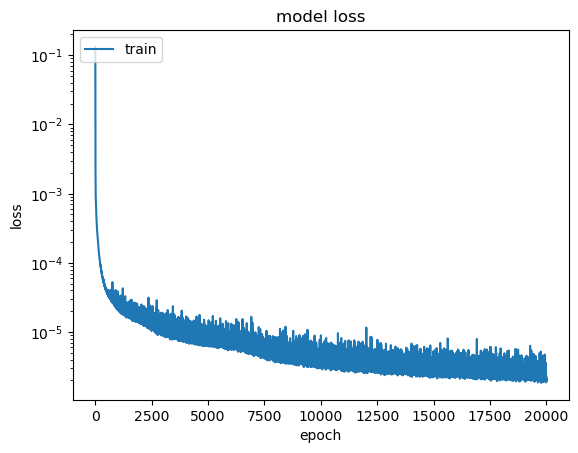

3

Epoch 1/20000
8/8 [==============================] - 8s 42ms/step - loss: 0.0576
Epoch 2/20000
8/8 [==============================] - 0s 36ms/step - loss: 0.0166
Epoch 3/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0092
Epoch 4/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0069
Epoch 5/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.0058
Epoch 6/20000
8/8 [==============================] - 0s 29ms/step - loss: 0.0052
Epoch 7/20000
8/8 [==============================] - 0s 26ms/step - loss: 0.0047
Epoch 8/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.0044
Epoch 9/20000
8/8 [==============================] - 0s 26ms/step - loss: 0.0040
Epoch 10/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0037
Epoch 11/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.0035
Epoch 12/20000
8/8 [==============================] - 0s 22ms/step - loss: 0.0033
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 11ms/step - loss: 3.5077e-04
Epoch 99/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.4707e-04
Epoch 100/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.4101e-04
Epoch 101/20000
8/8 [==============================] - 0s 27ms/step - loss: 3.3644e-04
Epoch 102/20000
8/8 [==============================] - 0s 23ms/step - loss: 3.3284e-04
Epoch 103/20000
8/8 [==============================] - 0s 23ms/step - loss: 3.2794e-04
Epoch 104/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.2433e-04
Epoch 105/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2111e-04
Epoch 106/20000
8/8 [==============================] - 0s 25ms/step - loss: 3.1649e-04
Epoch 107/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.1612e-04
Epoch 108/20000
8/8 [==============================] - 0s 20ms/step - loss: 3.0857e-04
Epoch 109/20000
8/8 [==============================] - 0s 13

8/8 [==============================] - 0s 28ms/step - loss: 1.4727e-04
Epoch 193/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4988e-04
Epoch 194/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.4711e-04
Epoch 195/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4887e-04
Epoch 196/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.4418e-04
Epoch 197/20000
8/8 [==============================] - 0s 26ms/step - loss: 1.4296e-04
Epoch 198/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4300e-04
Epoch 199/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.4225e-04
Epoch 200/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.4211e-04
Epoch 201/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.4026e-04
Epoch 202/20000
8/8 [==============================] - 0s 19ms/step - loss: 1.3825e-04
Epoch 203/20000
8/8 [==============================] - 0s 16ms

8/8 [==============================] - 0s 7ms/step - loss: 8.7933e-05
Epoch 287/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8382e-05
Epoch 288/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9027e-05
Epoch 289/20000
8/8 [==============================] - 0s 22ms/step - loss: 8.7170e-05
Epoch 290/20000
8/8 [==============================] - 0s 19ms/step - loss: 8.6949e-05
Epoch 291/20000
8/8 [==============================] - 0s 28ms/step - loss: 8.6096e-05
Epoch 292/20000
8/8 [==============================] - 0s 21ms/step - loss: 8.4969e-05
Epoch 293/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5423e-05
Epoch 294/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5569e-05
Epoch 295/20000
8/8 [==============================] - 0s 31ms/step - loss: 8.3662e-05
Epoch 296/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.3578e-05
Epoch 297/20000
8/8 [==============================] - 0s 7ms/st

8/8 [==============================] - 0s 5ms/step - loss: 6.3138e-05
Epoch 382/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2720e-05
Epoch 383/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.1422e-05
Epoch 384/20000
8/8 [==============================] - 0s 22ms/step - loss: 6.1038e-05
Epoch 385/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.0662e-05
Epoch 386/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1789e-05
Epoch 387/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1654e-05
Epoch 388/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0863e-05
Epoch 389/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1552e-05
Epoch 390/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2023e-05
Epoch 391/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3185e-05
Epoch 392/20000
8/8 [==============================] - 0s 5ms/step 

8/8 [==============================] - 0s 6ms/step - loss: 5.0556e-05
Epoch 477/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0538e-05
Epoch 478/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9398e-05
Epoch 479/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.8207e-05
Epoch 480/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8972e-05
Epoch 481/20000
8/8 [==============================] - 0s 19ms/step - loss: 4.7586e-05
Epoch 482/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0581e-05
Epoch 483/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1854e-05
Epoch 484/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8261e-05
Epoch 485/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9204e-05
Epoch 486/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8136e-05
Epoch 487/20000
8/8 [==============================] - 0s 15ms/step 

8/8 [==============================] - 0s 4ms/step - loss: 3.9964e-05
Epoch 572/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8864e-05
Epoch 573/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8922e-05
Epoch 574/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9271e-05
Epoch 575/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8951e-05
Epoch 576/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.8833e-05
Epoch 577/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9012e-05
Epoch 578/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1220e-05
Epoch 579/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1136e-05
Epoch 580/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9359e-05
Epoch 581/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9049e-05
Epoch 582/20000
8/8 [==============================] - 0s 4ms/step -

8/8 [==============================] - 0s 6ms/step - loss: 3.5012e-05
Epoch 667/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5593e-05
Epoch 668/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5765e-05
Epoch 669/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4454e-05
Epoch 670/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5797e-05
Epoch 671/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6892e-05
Epoch 672/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2761e-05
Epoch 673/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8986e-05
Epoch 674/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4688e-05
Epoch 675/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4411e-05
Epoch 676/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.6183e-05
Epoch 677/20000
8/8 [==============================] - 0s 22ms/step -

8/8 [==============================] - 0s 19ms/step - loss: 3.0130e-05
Epoch 762/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0370e-05
Epoch 763/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0490e-05
Epoch 764/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5578e-05
Epoch 765/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5068e-05
Epoch 766/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4515e-05
Epoch 767/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1007e-05
Epoch 768/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1675e-05
Epoch 769/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2540e-05
Epoch 770/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2095e-05
Epoch 771/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5565e-05
Epoch 772/20000
8/8 [==============================] - 0s 6ms/step - 

8/8 [==============================] - 0s 14ms/step - loss: 2.6985e-05
Epoch 857/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8877e-05
Epoch 858/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8527e-05
Epoch 859/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7818e-05
Epoch 860/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1388e-05
Epoch 861/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3588e-05
Epoch 862/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0544e-05
Epoch 863/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9284e-05
Epoch 864/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3177e-05
Epoch 865/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2513e-05
Epoch 866/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6738e-05
Epoch 867/20000
8/8 [==============================] - 0s 4ms/step - 

8/8 [==============================] - 0s 8ms/step - loss: 3.4476e-05
Epoch 952/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3559e-05
Epoch 953/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0753e-05
Epoch 954/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7751e-05
Epoch 955/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7973e-05
Epoch 956/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9927e-05
Epoch 957/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7992e-05
Epoch 958/20000
8/8 [==============================] - 0s 19ms/step - loss: 2.4933e-05
Epoch 959/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5054e-05
Epoch 960/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6457e-05
Epoch 961/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5177e-05
Epoch 962/20000
8/8 [==============================] - 0s 5ms/step - 

8/8 [==============================] - 0s 5ms/step - loss: 2.9290e-05
Epoch 1046/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0874e-05
Epoch 1047/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5183e-05
Epoch 1048/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.3485e-05
Epoch 1049/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5830e-05
Epoch 1050/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8078e-05
Epoch 1051/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5973e-05
Epoch 1052/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5566e-05
Epoch 1053/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6072e-05
Epoch 1054/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8893e-05
Epoch 1055/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7130e-05
Epoch 1056/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 9ms/step - loss: 2.3879e-05
Epoch 1140/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.2305e-05
Epoch 1141/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2150e-05
Epoch 1142/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.4493e-05
Epoch 1143/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7826e-05
Epoch 1144/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7381e-05
Epoch 1145/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5113e-05
Epoch 1146/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6890e-05
Epoch 1147/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8455e-05
Epoch 1148/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0086e-05
Epoch 1149/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5534e-05
Epoch 1150/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 6ms/step - loss: 2.4436e-05
Epoch 1234/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4527e-05
Epoch 1235/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3435e-05
Epoch 1236/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2658e-05
Epoch 1237/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2635e-05
Epoch 1238/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3172e-05
Epoch 1239/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7249e-05
Epoch 1240/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5281e-05
Epoch 1241/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8127e-05
Epoch 1242/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0872e-05
Epoch 1243/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1315e-05
Epoch 1244/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 2.4441e-05
Epoch 1328/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9804e-05
Epoch 1329/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9140e-05
Epoch 1330/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6263e-05
Epoch 1331/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.6741e-05
Epoch 1332/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2859e-05
Epoch 1333/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1040e-05
Epoch 1334/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2504e-05
Epoch 1335/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1632e-05
Epoch 1336/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0518e-05
Epoch 1337/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2330e-05
Epoch 1338/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.3069e-05
Epoch 1422/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.3991e-05
Epoch 1423/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.0106e-05
Epoch 1424/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.9719e-05
Epoch 1425/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1515e-05
Epoch 1426/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9692e-05
Epoch 1427/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2611e-05
Epoch 1428/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8365e-05
Epoch 1429/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3596e-05
Epoch 1430/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3478e-05
Epoch 1431/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2299e-05
Epoch 1432/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 6ms/step - loss: 2.1146e-05
Epoch 1516/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1907e-05
Epoch 1517/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8055e-05
Epoch 1518/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0033e-05
Epoch 1519/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1260e-05
Epoch 1520/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.4567e-05
Epoch 1521/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2308e-05
Epoch 1522/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0489e-05
Epoch 1523/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5069e-05
Epoch 1524/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1043e-05
Epoch 1525/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1020e-05
Epoch 1526/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 3.3941e-05
Epoch 1610/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.7690e-05
Epoch 1611/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7466e-05
Epoch 1612/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3430e-05
Epoch 1613/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0732e-05
Epoch 1614/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2365e-05
Epoch 1615/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.1069e-05
Epoch 1616/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2990e-05
Epoch 1617/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4106e-05
Epoch 1618/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6846e-05
Epoch 1619/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5838e-05
Epoch 1620/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 1.9472e-05
Epoch 1704/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1498e-05
Epoch 1705/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1819e-05
Epoch 1706/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1148e-05
Epoch 1707/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2035e-05
Epoch 1708/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3228e-05
Epoch 1709/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1713e-05
Epoch 1710/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3525e-05
Epoch 1711/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4534e-05
Epoch 1712/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0248e-05
Epoch 1713/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2086e-05
Epoch 1714/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 3.1842e-05
Epoch 1798/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9341e-05
Epoch 1799/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7490e-05
Epoch 1800/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8881e-05
Epoch 1801/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1011e-05
Epoch 1802/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2904e-05
Epoch 1803/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1452e-05
Epoch 1804/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1114e-05
Epoch 1805/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5931e-05
Epoch 1806/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8785e-05
Epoch 1807/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4878e-05
Epoch 1808/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 22ms/step - loss: 1.7622e-05
Epoch 1892/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9886e-05
Epoch 1893/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0263e-05
Epoch 1894/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1321e-05
Epoch 1895/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9562e-05
Epoch 1896/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9077e-05
Epoch 1897/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1874e-05
Epoch 1898/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.9091e-05
Epoch 1899/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2436e-05
Epoch 1900/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1551e-05
Epoch 1901/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8869e-05
Epoch 1902/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 1.8759e-05
Epoch 1986/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8695e-05
Epoch 1987/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7611e-05
Epoch 1988/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8447e-05
Epoch 1989/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9062e-05
Epoch 1990/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1222e-05
Epoch 1991/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5057e-05
Epoch 1992/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9168e-05
Epoch 1993/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9235e-05
Epoch 1994/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8834e-05
Epoch 1995/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3317e-05
Epoch 1996/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 2.7062e-05
Epoch 2080/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2045e-05
Epoch 2081/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0283e-05
Epoch 2082/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6720e-05
Epoch 2083/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1087e-05
Epoch 2084/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0472e-05
Epoch 2085/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2495e-05
Epoch 2086/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9763e-05
Epoch 2087/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5282e-05
Epoch 2088/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9889e-05
Epoch 2089/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0963e-05
Epoch 2090/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.9020e-05
Epoch 2174/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8814e-05
Epoch 2175/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.5622e-05
Epoch 2176/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2405e-05
Epoch 2177/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8469e-05
Epoch 2178/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7349e-05
Epoch 2179/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9360e-05
Epoch 2180/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7114e-05
Epoch 2181/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7075e-05
Epoch 2182/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7313e-05
Epoch 2183/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9287e-05
Epoch 2184/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 4.1157e-05
Epoch 2268/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9880e-05
Epoch 2269/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0732e-05
Epoch 2270/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0603e-05
Epoch 2271/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7166e-05
Epoch 2272/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7597e-05
Epoch 2273/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6650e-05
Epoch 2274/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.8719e-05
Epoch 2275/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9297e-05
Epoch 2276/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1243e-05
Epoch 2277/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7993e-05
Epoch 2278/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 2.7635e-05
Epoch 2362/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3092e-05
Epoch 2363/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6182e-05
Epoch 2364/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8524e-05
Epoch 2365/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9224e-05
Epoch 2366/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9233e-05
Epoch 2367/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8903e-05
Epoch 2368/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.6046e-05
Epoch 2369/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6327e-05
Epoch 2370/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9129e-05
Epoch 2371/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8551e-05
Epoch 2372/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.6664e-05
Epoch 2456/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6851e-05
Epoch 2457/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7519e-05
Epoch 2458/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0848e-05
Epoch 2459/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4111e-05
Epoch 2460/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3245e-05
Epoch 2461/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0854e-05
Epoch 2462/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9305e-05
Epoch 2463/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7024e-05
Epoch 2464/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6853e-05
Epoch 2465/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8885e-05
Epoch 2466/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 15ms/step - loss: 1.9547e-05
Epoch 2550/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9171e-05
Epoch 2551/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0811e-05
Epoch 2552/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9712e-05
Epoch 2553/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0656e-05
Epoch 2554/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7461e-05
Epoch 2555/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7026e-05
Epoch 2556/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8148e-05
Epoch 2557/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6166e-05
Epoch 2558/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6883e-05
Epoch 2559/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5601e-05
Epoch 2560/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.6380e-05
Epoch 2644/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6610e-05
Epoch 2645/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.5679e-05
Epoch 2646/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6813e-05
Epoch 2647/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8774e-05
Epoch 2648/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9941e-05
Epoch 2649/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.5703e-05
Epoch 2650/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5613e-05
Epoch 2651/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9899e-05
Epoch 2652/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7994e-05
Epoch 2653/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2064e-05
Epoch 2654/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 2.0960e-05
Epoch 2738/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3697e-05
Epoch 2739/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1402e-05
Epoch 2740/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8510e-05
Epoch 2741/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7303e-05
Epoch 2742/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.5167e-05
Epoch 2743/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8459e-05
Epoch 2744/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5470e-05
Epoch 2745/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6709e-05
Epoch 2746/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4748e-05
Epoch 2747/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5729e-05
Epoch 2748/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 7ms/step - loss: 1.6082e-05
Epoch 2832/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6840e-05
Epoch 2833/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7529e-05
Epoch 2834/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7978e-05
Epoch 2835/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.6768e-05
Epoch 2836/20000
8/8 [==============================] - 0s 25ms/step - loss: 1.4518e-05
Epoch 2837/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4536e-05
Epoch 2838/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5869e-05
Epoch 2839/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0217e-05
Epoch 2840/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.6201e-05
Epoch 2841/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6186e-05
Epoch 2842/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.0136e-05
Epoch 2926/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9047e-05
Epoch 2927/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3333e-05
Epoch 2928/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0192e-05
Epoch 2929/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2621e-05
Epoch 2930/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8523e-05
Epoch 2931/20000
8/8 [==============================] - 0s 24ms/step - loss: 1.5613e-05
Epoch 2932/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6192e-05
Epoch 2933/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5689e-05
Epoch 2934/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5296e-05
Epoch 2935/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5206e-05
Epoch 2936/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.7853e-05
Epoch 3020/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6369e-05
Epoch 3021/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4835e-05
Epoch 3022/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7474e-05
Epoch 3023/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8061e-05
Epoch 3024/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9154e-05
Epoch 3025/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6453e-05
Epoch 3026/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6510e-05
Epoch 3027/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7791e-05
Epoch 3028/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6223e-05
Epoch 3029/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1151e-05
Epoch 3030/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.5302e-05
Epoch 3114/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.5848e-05
Epoch 3115/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7032e-05
Epoch 3116/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4857e-05
Epoch 3117/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.3661e-05
Epoch 3118/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4318e-05
Epoch 3119/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4755e-05
Epoch 3120/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4744e-05
Epoch 3121/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4243e-05
Epoch 3122/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4889e-05
Epoch 3123/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5256e-05
Epoch 3124/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 2.1340e-05
Epoch 3208/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2384e-05
Epoch 3209/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6500e-05
Epoch 3210/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0896e-05
Epoch 3211/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2921e-05
Epoch 3212/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.1217e-05
Epoch 3213/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4453e-05
Epoch 3214/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4099e-05
Epoch 3215/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8918e-05
Epoch 3216/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6862e-05
Epoch 3217/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6288e-05
Epoch 3218/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.7431e-05
Epoch 3302/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8119e-05
Epoch 3303/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9756e-05
Epoch 3304/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9648e-05
Epoch 3305/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8100e-05
Epoch 3306/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5583e-05
Epoch 3307/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5347e-05
Epoch 3308/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6789e-05
Epoch 3309/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8448e-05
Epoch 3310/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5902e-05
Epoch 3311/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5498e-05
Epoch 3312/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 2.7507e-05
Epoch 3396/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3718e-05
Epoch 3397/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0542e-05
Epoch 3398/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9559e-05
Epoch 3399/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4887e-05
Epoch 3400/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5825e-05
Epoch 3401/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0734e-05
Epoch 3402/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9850e-05
Epoch 3403/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9286e-05
Epoch 3404/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7376e-05
Epoch 3405/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.7235e-05
Epoch 3406/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.7386e-05
Epoch 3490/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.6060e-05
Epoch 3491/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7097e-05
Epoch 3492/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6977e-05
Epoch 3493/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0095e-05
Epoch 3494/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1120e-05
Epoch 3495/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8050e-05
Epoch 3496/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4699e-05
Epoch 3497/20000
8/8 [==============================] - 0s 24ms/step - loss: 1.7371e-05
Epoch 3498/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5656e-05
Epoch 3499/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4707e-05
Epoch 3500/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.5293e-05
Epoch 3584/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5409e-05
Epoch 3585/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4912e-05
Epoch 3586/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3892e-05
Epoch 3587/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6612e-05
Epoch 3588/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3756e-05
Epoch 3589/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7629e-05
Epoch 3590/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8139e-05
Epoch 3591/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0195e-05
Epoch 3592/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2652e-05
Epoch 3593/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5118e-05
Epoch 3594/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.7872e-05
Epoch 3751/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0536e-05
Epoch 3752/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4421e-05
Epoch 3753/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7345e-05
Epoch 3754/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5103e-05
Epoch 3755/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5262e-05
Epoch 3756/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4700e-05
Epoch 3757/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4662e-05
Epoch 3758/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3620e-05
Epoch 3759/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4527e-05
Epoch 3760/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9183e-05
Epoch 3761/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.3976e-05
Epoch 3883/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4568e-05
Epoch 3884/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3903e-05
Epoch 3885/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6045e-05
Epoch 3886/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8137e-05
Epoch 3887/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3752e-05
Epoch 3888/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3977e-05
Epoch 3889/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3569e-05
Epoch 3890/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2359e-05
Epoch 3891/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5633e-05
Epoch 3892/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6048e-05
Epoch 3893/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 1.2097e-05
Epoch 3977/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4144e-05
Epoch 3978/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3299e-05
Epoch 3979/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9124e-05
Epoch 3980/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7130e-05
Epoch 3981/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7052e-05
Epoch 3982/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8397e-05
Epoch 3983/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5421e-05
Epoch 3984/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6125e-05
Epoch 3985/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6251e-05
Epoch 3986/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5488e-05
Epoch 3987/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 1.4754e-05
Epoch 4097/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4737e-05
Epoch 4098/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3222e-05
Epoch 4099/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3200e-05
Epoch 4100/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3335e-05
Epoch 4101/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3588e-05
Epoch 4102/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2613e-05
Epoch 4103/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1794e-05
Epoch 4104/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1822e-05
Epoch 4105/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1708e-05
Epoch 4106/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2957e-05
Epoch 4107/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.4375e-05
Epoch 4191/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2682e-05
Epoch 4192/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2370e-05
Epoch 4193/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4969e-05
Epoch 4194/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2807e-05
Epoch 4195/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1467e-05
Epoch 4196/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4620e-05
Epoch 4197/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2887e-05
Epoch 4198/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9077e-05
Epoch 4199/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6877e-05
Epoch 4200/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8571e-05
Epoch 4201/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.3517e-05
Epoch 4285/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4724e-05
Epoch 4286/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3977e-05
Epoch 4287/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3315e-05
Epoch 4288/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2265e-05
Epoch 4289/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1436e-05
Epoch 4290/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2282e-05
Epoch 4291/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2824e-05
Epoch 4292/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2657e-05
Epoch 4293/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4218e-05
Epoch 4294/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6521e-05
Epoch 4295/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.1683e-05
Epoch 4379/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0937e-05
Epoch 4380/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4410e-05
Epoch 4381/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5130e-05
Epoch 4382/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2934e-05
Epoch 4383/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2824e-05
Epoch 4384/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2708e-05
Epoch 4385/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3206e-05
Epoch 4386/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5509e-05
Epoch 4387/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3967e-05
Epoch 4388/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8177e-05
Epoch 4389/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.0808e-05
Epoch 4533/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1395e-05
Epoch 4534/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4016e-05
Epoch 4535/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2539e-05
Epoch 4536/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1235e-05
Epoch 4537/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4086e-05
Epoch 4538/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7879e-05
Epoch 4539/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3873e-05
Epoch 4540/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3027e-05
Epoch 4541/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1218e-05
Epoch 4542/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1478e-05
Epoch 4543/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 19ms/step - loss: 1.0341e-05
Epoch 4656/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4261e-05
Epoch 4657/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0475e-05
Epoch 4658/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0486e-05
Epoch 4659/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1330e-05
Epoch 4660/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3345e-05
Epoch 4661/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6466e-05
Epoch 4662/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3948e-05
Epoch 4663/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6296e-05
Epoch 4664/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1179e-05
Epoch 4665/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2742e-05
Epoch 4666/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.0803e-05
Epoch 4750/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1258e-05
Epoch 4751/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2309e-05
Epoch 4752/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2196e-05
Epoch 4753/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0862e-05
Epoch 4754/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3348e-05
Epoch 4755/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0024e-05
Epoch 4756/20000
8/8 [==============================] - 0s 11ms/step - loss: 9.5225e-06
Epoch 4757/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0859e-05
Epoch 4758/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7679e-05
Epoch 4759/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.6090e-05
Epoch 4760/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 4ms/step - loss: 1.0149e-05
Epoch 4862/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0184e-05
Epoch 4863/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0940e-05
Epoch 4864/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9502e-06
Epoch 4865/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0372e-05
Epoch 4866/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0276e-05
Epoch 4867/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2567e-05
Epoch 4868/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2274e-05
Epoch 4869/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1233e-05
Epoch 4870/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3061e-05
Epoch 4871/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1942e-05
Epoch 4872/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.1428e-05
Epoch 4956/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2730e-05
Epoch 4957/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7783e-05
Epoch 4958/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3093e-05
Epoch 4959/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0390e-05
Epoch 4960/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8744e-06
Epoch 4961/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8695e-06
Epoch 4962/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0030e-05
Epoch 4963/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1257e-05
Epoch 4964/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5749e-05
Epoch 4965/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1781e-05
Epoch 4966/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 9.9142e-06
Epoch 5066/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3709e-06
Epoch 5067/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2431e-06
Epoch 5068/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3775e-05
Epoch 5069/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.8445e-05
Epoch 5070/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1358e-05
Epoch 5071/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4813e-05
Epoch 5072/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6227e-05
Epoch 5073/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7632e-05
Epoch 5074/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6654e-05
Epoch 5075/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6326e-05
Epoch 5076/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.3122e-05
Epoch 5160/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4656e-05
Epoch 5161/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4076e-05
Epoch 5162/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0992e-05
Epoch 5163/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1204e-05
Epoch 5164/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1735e-05
Epoch 5165/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4745e-05
Epoch 5166/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9046e-05
Epoch 5167/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3212e-05
Epoch 5216/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0826e-05
Epoch 5217/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4468e-05
Epoch 5218/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 1.5524e-05
Epoch 5302/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1760e-05
Epoch 5303/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1149e-05
Epoch 5304/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0341e-05
Epoch 5305/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5487e-06
Epoch 5306/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5394e-06
Epoch 5307/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4013e-06
Epoch 5308/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6297e-06
Epoch 5309/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0800e-05
Epoch 5310/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3623e-06
Epoch 5311/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0611e-05
Epoch 5312/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.4241e-05
Epoch 5424/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4907e-05
Epoch 5425/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.5336e-05
Epoch 5426/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2056e-05
Epoch 5427/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1899e-05
Epoch 5428/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1041e-05
Epoch 5429/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0167e-05
Epoch 5430/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1776e-05
Epoch 5431/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9039e-06
Epoch 5432/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1150e-05
Epoch 5433/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8710e-06
Epoch 5434/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 9.9804e-06
Epoch 5518/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0980e-05
Epoch 5519/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0550e-05
Epoch 5520/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5852e-05
Epoch 5521/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.5427e-05
Epoch 5522/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2194e-05
Epoch 5523/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4316e-05
Epoch 5524/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5352e-05
Epoch 5525/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2044e-05
Epoch 5526/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1154e-05
Epoch 5527/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1258e-05
Epoch 5528/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 12ms/step - loss: 7.7688e-06
Epoch 5647/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7453e-06
Epoch 5648/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0295e-05
Epoch 5649/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2439e-05
Epoch 5650/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5714e-05
Epoch 5651/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.7422e-06
Epoch 5652/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1113e-05
Epoch 5653/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8242e-06
Epoch 5654/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9553e-06
Epoch 5655/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0107e-05
Epoch 5656/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2783e-05
Epoch 5657/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 9.0014e-06
Epoch 5741/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0171e-05
Epoch 5742/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4342e-05
Epoch 5743/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2880e-05
Epoch 5744/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0991e-05
Epoch 5745/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0662e-05
Epoch 5746/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0736e-05
Epoch 5747/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4074e-06
Epoch 5748/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1617e-06
Epoch 5749/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4884e-06
Epoch 5750/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0384e-05
Epoch 5751/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 9.0333e-06
Epoch 5898/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9216e-06
Epoch 5899/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4698e-06
Epoch 5900/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1036e-05
Epoch 5901/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5253e-05
Epoch 5902/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3042e-05
Epoch 5903/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9396e-06
Epoch 5904/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7699e-06
Epoch 5905/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0609e-06
Epoch 5906/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9778e-06
Epoch 5907/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1579e-05
Epoch 5908/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.1438e-05
Epoch 6061/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3243e-06
Epoch 6062/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0591e-05
Epoch 6063/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3842e-05
Epoch 6064/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3415e-05
Epoch 6065/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5025e-05
Epoch 6066/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0862e-05
Epoch 6067/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5198e-06
Epoch 6068/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8129e-06
Epoch 6069/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9126e-06
Epoch 6070/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5667e-06
Epoch 6071/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 8.2955e-06
Epoch 6155/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5086e-06
Epoch 6156/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6353e-06
Epoch 6157/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3889e-06
Epoch 6158/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9836e-06
Epoch 6159/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7620e-06
Epoch 6160/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2710e-05
Epoch 6161/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9202e-06
Epoch 6162/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2513e-05
Epoch 6163/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0283e-05
Epoch 6164/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6665e-06
Epoch 6165/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 9.3445e-06
Epoch 6321/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9500e-06
Epoch 6322/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6048e-06
Epoch 6323/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7188e-06
Epoch 6324/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8877e-06
Epoch 6325/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3701e-05
Epoch 6326/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2624e-05
Epoch 6327/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0374e-05
Epoch 6328/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7462e-06
Epoch 6329/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6837e-06
Epoch 6330/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8534e-06
Epoch 6331/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 9.7665e-06
Epoch 6415/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1688e-05
Epoch 6416/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3788e-05
Epoch 6417/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1950e-05
Epoch 6418/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.4314e-06
Epoch 6419/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0920e-05
Epoch 6420/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0518e-06
Epoch 6421/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5233e-06
Epoch 6422/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0318e-06
Epoch 6423/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2156e-06
Epoch 6424/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9049e-06
Epoch 6425/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.7607e-06
Epoch 6509/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1991e-06
Epoch 6510/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8839e-06
Epoch 6511/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4785e-06
Epoch 6512/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3481e-06
Epoch 6513/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0353e-06
Epoch 6514/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8984e-06
Epoch 6515/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9063e-06
Epoch 6516/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.1272e-06
Epoch 6517/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0805e-05
Epoch 6518/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3501e-05
Epoch 6519/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 7.9402e-06
Epoch 6739/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4581e-06
Epoch 6740/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2047e-06
Epoch 6741/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7716e-06
Epoch 6742/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2223e-06
Epoch 6743/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1010e-06
Epoch 6744/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6378e-06
Epoch 6745/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9627e-06
Epoch 6746/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8882e-06
Epoch 6747/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.4450e-06
Epoch 6748/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8790e-06
Epoch 6749/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.4244e-06
Epoch 6833/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1686e-06
Epoch 6834/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2910e-06
Epoch 6835/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7336e-06
Epoch 6836/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6544e-06
Epoch 6837/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.9257e-06
Epoch 6838/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.1100e-06
Epoch 6839/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6799e-06
Epoch 6840/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0411e-05
Epoch 6841/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6787e-06
Epoch 6842/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6054e-06
Epoch 6843/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 7.8256e-06
Epoch 6983/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4249e-06
Epoch 6984/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0507e-05
Epoch 6985/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2899e-05
Epoch 6986/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1320e-05
Epoch 6987/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4651e-06
Epoch 6988/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4025e-06
Epoch 6989/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9871e-06
Epoch 6990/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6558e-06
Epoch 6991/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8729e-06
Epoch 6992/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0235e-06
Epoch 6993/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 9.9887e-06
Epoch 7077/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3411e-06
Epoch 7078/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2131e-06
Epoch 7079/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6814e-06
Epoch 7080/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.2804e-06
Epoch 7081/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2016e-06
Epoch 7082/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7711e-06
Epoch 7083/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7609e-06
Epoch 7084/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0182e-06
Epoch 7085/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5705e-06
Epoch 7086/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4902e-06
Epoch 7087/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 7.2667e-06
Epoch 7216/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1257e-06
Epoch 7217/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5788e-06
Epoch 7218/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4224e-06
Epoch 7219/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8590e-06
Epoch 7220/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4510e-06
Epoch 7221/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9132e-06
Epoch 7222/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3216e-06
Epoch 7223/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4104e-06
Epoch 7224/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4171e-06
Epoch 7225/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6677e-06
Epoch 7226/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 7.4692e-06
Epoch 7310/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6086e-06
Epoch 7311/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2532e-06
Epoch 7312/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4887e-06
Epoch 7313/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.0068e-06
Epoch 7314/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5984e-06
Epoch 7315/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0334e-05
Epoch 7316/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4283e-06
Epoch 7317/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4801e-06
Epoch 7318/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6838e-06
Epoch 7319/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3830e-06
Epoch 7320/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 6.4151e-06
Epoch 7448/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7904e-06
Epoch 7449/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0963e-06
Epoch 7450/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6248e-06
Epoch 7451/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.9000e-06
Epoch 7452/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1136e-05
Epoch 7453/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1156e-06
Epoch 7454/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4827e-06
Epoch 7455/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.3338e-06
Epoch 7456/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7045e-06
Epoch 7457/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6933e-06
Epoch 7458/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.0523e-05
Epoch 7561/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0519e-05
Epoch 7562/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.8797e-06
Epoch 7563/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4915e-06
Epoch 7564/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8412e-06
Epoch 7565/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7129e-06
Epoch 7566/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7296e-06
Epoch 7567/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7415e-06
Epoch 7568/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8354e-06
Epoch 7569/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6583e-06
Epoch 7570/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6937e-06
Epoch 7571/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.0480e-05
Epoch 7655/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2343e-05
Epoch 7656/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2346e-06
Epoch 7657/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1099e-06
Epoch 7658/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0697e-06
Epoch 7659/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2994e-06
Epoch 7660/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1842e-06
Epoch 7661/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9924e-06
Epoch 7662/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3821e-06
Epoch 7663/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2660e-06
Epoch 7664/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1414e-06
Epoch 7665/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 7.6645e-06
Epoch 7752/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8446e-06
Epoch 7753/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1687e-06
Epoch 7754/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0836e-06
Epoch 7755/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2571e-06
Epoch 7756/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.1171e-06
Epoch 7757/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1664e-06
Epoch 7758/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4519e-06
Epoch 7759/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8701e-06
Epoch 7760/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3028e-06
Epoch 7761/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3992e-06
Epoch 7762/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 6.2645e-06
Epoch 7846/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4432e-06
Epoch 7847/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4638e-06
Epoch 7848/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7136e-06
Epoch 7849/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5490e-06
Epoch 7850/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1997e-06
Epoch 7851/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0902e-05
Epoch 7852/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0936e-06
Epoch 7853/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5114e-06
Epoch 7854/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6426e-06
Epoch 7855/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7057e-06
Epoch 7856/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 8.1270e-06
Epoch 7968/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0346e-06
Epoch 7969/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6406e-06
Epoch 7970/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0012e-06
Epoch 7971/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9701e-06
Epoch 7972/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4256e-06
Epoch 7973/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0273e-05
Epoch 7974/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2311e-06
Epoch 7975/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1529e-06
Epoch 7976/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3652e-06
Epoch 7977/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7819e-06
Epoch 7978/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 6.6862e-06
Epoch 8062/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6274e-06
Epoch 8063/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0510e-06
Epoch 8064/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5663e-06
Epoch 8065/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1452e-06
Epoch 8066/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6704e-06
Epoch 8067/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6268e-06
Epoch 8068/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4468e-06
Epoch 8069/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0290e-06
Epoch 8070/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6031e-06
Epoch 8071/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0738e-06
Epoch 8072/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 9.9984e-06
Epoch 8176/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1592e-06
Epoch 8177/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5349e-06
Epoch 8178/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7771e-06
Epoch 8179/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2315e-06
Epoch 8180/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5386e-06
Epoch 8181/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9041e-06
Epoch 8182/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8697e-06
Epoch 8183/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0741e-05
Epoch 8184/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1103e-05
Epoch 8185/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7903e-06
Epoch 8186/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 7.6163e-06
Epoch 8288/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3958e-06
Epoch 8289/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.4309e-06
Epoch 8290/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3858e-06
Epoch 8291/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5547e-06
Epoch 8292/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1228e-05
Epoch 8293/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2074e-06
Epoch 8294/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7950e-06
Epoch 8295/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0279e-06
Epoch 8296/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8306e-06
Epoch 8297/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4100e-06
Epoch 8298/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 8.2556e-06
Epoch 8381/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0166e-06
Epoch 8382/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2705e-06
Epoch 8383/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9724e-06
Epoch 8384/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8559e-06
Epoch 8385/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4899e-06
Epoch 8386/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8122e-06
Epoch 8387/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5700e-06
Epoch 8388/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6745e-06
Epoch 8389/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4831e-06
Epoch 8390/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4828e-06
Epoch 8391/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 6.4588e-06
Epoch 8526/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7441e-06
Epoch 8527/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0860e-06
Epoch 8528/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4605e-06
Epoch 8529/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3966e-06
Epoch 8530/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9535e-06
Epoch 8531/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1452e-05
Epoch 8532/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0758e-05
Epoch 8533/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4790e-06
Epoch 8534/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5248e-06
Epoch 8535/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8026e-06
Epoch 8536/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 6.7225e-06
Epoch 8620/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7096e-06
Epoch 8621/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9712e-06
Epoch 8622/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9264e-06
Epoch 8623/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8801e-06
Epoch 8624/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7244e-06
Epoch 8625/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6752e-06
Epoch 8626/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1929e-06
Epoch 8627/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2045e-06
Epoch 8628/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4428e-06
Epoch 8629/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6742e-06
Epoch 8630/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 7ms/step - loss: 7.7922e-06
Epoch 8714/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9371e-06
Epoch 8715/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7838e-06
Epoch 8716/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4325e-06
Epoch 8717/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1818e-06
Epoch 8718/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9657e-06
Epoch 8719/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.2919e-06
Epoch 8720/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6038e-06
Epoch 8721/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.6403e-06
Epoch 8722/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4893e-06
Epoch 8723/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0329e-05
Epoch 8724/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 7.5213e-06
Epoch 8808/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6752e-06
Epoch 8809/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0494e-06
Epoch 8810/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0607e-05
Epoch 8811/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0306e-06
Epoch 8812/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4565e-06
Epoch 8813/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3305e-06
Epoch 8814/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1509e-05
Epoch 8815/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4098e-05
Epoch 8816/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0058e-05
Epoch 8817/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1829e-06
Epoch 8818/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 6.2916e-06
Epoch 8946/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1887e-06
Epoch 8947/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0323e-06
Epoch 8948/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0199e-06
Epoch 8949/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6443e-06
Epoch 8950/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4839e-06
Epoch 8951/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0492e-05
Epoch 8952/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.0395e-06
Epoch 8953/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1418e-06
Epoch 8954/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9241e-06
Epoch 8955/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6099e-06
Epoch 8956/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.0033e-05
Epoch 9062/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6515e-06
Epoch 9063/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0029e-05
Epoch 9064/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2861e-06
Epoch 9065/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.8926e-06
Epoch 9066/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1667e-06
Epoch 9067/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1883e-06
Epoch 9068/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6160e-06
Epoch 9069/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1696e-06
Epoch 9070/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4499e-06
Epoch 9071/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3999e-06
Epoch 9072/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 5.6719e-06
Epoch 9156/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6568e-06
Epoch 9157/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0180e-06
Epoch 9158/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9542e-06
Epoch 9159/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2571e-06
Epoch 9160/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6333e-06
Epoch 9161/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1536e-06
Epoch 9162/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0919e-06
Epoch 9163/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1249e-06
Epoch 9164/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8883e-06
Epoch 9165/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0413e-06
Epoch 9166/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 5.9975e-06
Epoch 9288/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8947e-06
Epoch 9289/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1033e-06
Epoch 9290/20000
8/8 [==============================] - 0s 14ms/step - loss: 7.5924e-06
Epoch 9291/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2706e-06
Epoch 9292/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0451e-06
Epoch 9293/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1090e-06
Epoch 9294/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7487e-06
Epoch 9295/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.1966e-06
Epoch 9296/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.1784e-06
Epoch 9297/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.3971e-06
Epoch 9298/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 9.1507e-06
Epoch 9382/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3474e-06
Epoch 9383/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5313e-06
Epoch 9384/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5222e-06
Epoch 9385/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6872e-06
Epoch 9386/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6527e-06
Epoch 9387/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7157e-06
Epoch 9388/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3828e-06
Epoch 9389/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6846e-06
Epoch 9390/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1897e-06
Epoch 9391/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8120e-06
Epoch 9392/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 7.7768e-06
Epoch 9502/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9498e-06
Epoch 9503/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5237e-06
Epoch 9504/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7080e-06
Epoch 9505/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4810e-06
Epoch 9506/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3037e-06
Epoch 9507/20000
8/8 [==============================] - 0s 18ms/step - loss: 6.2793e-06
Epoch 9508/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6213e-06
Epoch 9509/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2045e-06
Epoch 9510/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3068e-06
Epoch 9511/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5917e-06
Epoch 9512/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 6.8352e-06
Epoch 9596/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.0712e-06
Epoch 9597/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0148e-05
Epoch 9598/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5488e-06
Epoch 9599/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2731e-06
Epoch 9600/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4091e-06
Epoch 9601/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2671e-06
Epoch 9602/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3293e-06
Epoch 9603/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7540e-06
Epoch 9604/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7436e-06
Epoch 9605/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4009e-06
Epoch 9606/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 9.3999e-06
Epoch 9690/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5105e-06
Epoch 9691/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7539e-06
Epoch 9692/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9245e-06
Epoch 9693/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8160e-06
Epoch 9694/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4030e-06
Epoch 9695/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4934e-06
Epoch 9696/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9300e-06
Epoch 9697/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3015e-06
Epoch 9698/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4439e-06
Epoch 9699/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4702e-06
Epoch 9700/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 7.1607e-06
Epoch 9860/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5914e-06
Epoch 9861/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4900e-06
Epoch 9862/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4146e-06
Epoch 9863/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7328e-06
Epoch 9864/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7854e-06
Epoch 9865/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4395e-06
Epoch 9866/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9377e-06
Epoch 9867/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6954e-06
Epoch 9868/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0550e-06
Epoch 9869/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.6096e-06
Epoch 9870/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 5.3232e-06
Epoch 9954/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7158e-06
Epoch 9955/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5716e-06
Epoch 9956/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7351e-06
Epoch 9957/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9055e-06
Epoch 9958/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4867e-06
Epoch 9959/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9002e-06
Epoch 9960/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3316e-06
Epoch 9961/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7832e-06
Epoch 9962/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6734e-06
Epoch 9963/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8652e-06
Epoch 9964/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 6.3755e-06
Epoch 10098/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.5377e-06
Epoch 10099/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0692e-06
Epoch 10100/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1949e-06
Epoch 10101/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0294e-05
Epoch 10102/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4763e-06
Epoch 10103/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6908e-06
Epoch 10104/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3777e-06
Epoch 10105/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7084e-06
Epoch 10106/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0260e-06
Epoch 10107/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4491e-06
Epoch 10108/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 7.1256e-06
Epoch 10191/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.4865e-06
Epoch 10192/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3517e-06
Epoch 10193/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4930e-06
Epoch 10194/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6132e-06
Epoch 10195/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.6213e-06
Epoch 10196/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5050e-06
Epoch 10197/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4703e-06
Epoch 10198/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0400e-06
Epoch 10199/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3762e-06
Epoch 10200/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1864e-06
Epoch 10201/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 6.8734e-06
Epoch 10353/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0361e-06
Epoch 10354/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6281e-06
Epoch 10355/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8598e-06
Epoch 10356/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4931e-06
Epoch 10357/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4958e-06
Epoch 10358/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2044e-06
Epoch 10359/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2564e-05
Epoch 10360/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9681e-06
Epoch 10361/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5920e-06
Epoch 10362/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4224e-06
Epoch 10363/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 7.7149e-06
Epoch 10506/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4935e-06
Epoch 10507/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5357e-06
Epoch 10508/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.4466e-06
Epoch 10509/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1051e-06
Epoch 10510/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5585e-06
Epoch 10511/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1711e-06
Epoch 10512/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6491e-06
Epoch 10513/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7831e-06
Epoch 10514/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7001e-06
Epoch 10515/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.3403e-06
Epoch 10516/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.7221e-06
Epoch 10599/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6523e-06
Epoch 10600/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9478e-06
Epoch 10601/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8462e-06
Epoch 10602/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0407e-06
Epoch 10603/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0088e-05
Epoch 10604/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7997e-06
Epoch 10605/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.3511e-06
Epoch 10606/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0204e-06
Epoch 10607/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3813e-06
Epoch 10608/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4887e-06
Epoch 10609/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 5.4188e-06
Epoch 10773/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2577e-06
Epoch 10774/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8155e-06
Epoch 10775/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3261e-06
Epoch 10776/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8441e-06
Epoch 10777/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3701e-06
Epoch 10778/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1049e-06
Epoch 10779/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8889e-06
Epoch 10780/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5893e-06
Epoch 10781/20000
8/8 [==============================] - 0s 20ms/step - loss: 6.6685e-06
Epoch 10782/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0626e-06
Epoch 10783/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.7400e-06
Epoch 10866/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1471e-06
Epoch 10867/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8901e-06
Epoch 10868/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6903e-06
Epoch 10869/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2705e-06
Epoch 10870/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2285e-06
Epoch 10871/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0391e-06
Epoch 10872/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3368e-06
Epoch 10873/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7345e-06
Epoch 10874/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3394e-06
Epoch 10875/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9916e-06
Epoch 10876/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 7.1514e-06
Epoch 11024/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0578e-06
Epoch 11025/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.2323e-06
Epoch 11026/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4524e-06
Epoch 11027/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.9387e-06
Epoch 11028/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8276e-06
Epoch 11029/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6114e-06
Epoch 11030/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7038e-06
Epoch 11031/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1070e-06
Epoch 11032/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9385e-06
Epoch 11033/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0567e-06
Epoch 11034/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 5.3009e-06
Epoch 11117/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4912e-06
Epoch 11118/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5683e-06
Epoch 11119/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2470e-06
Epoch 11120/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7822e-06
Epoch 11121/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1420e-06
Epoch 11122/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1880e-06
Epoch 11123/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9521e-06
Epoch 11124/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6493e-06
Epoch 11125/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0964e-06
Epoch 11126/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9403e-06
Epoch 11127/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 5.0162e-06
Epoch 11292/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2210e-06
Epoch 11293/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4343e-06
Epoch 11294/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7036e-06
Epoch 11295/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9325e-06
Epoch 11296/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4375e-06
Epoch 11297/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4761e-06
Epoch 11298/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7088e-06
Epoch 11299/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8749e-06
Epoch 11300/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1150e-06
Epoch 11301/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5810e-06
Epoch 11302/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 6.8347e-06
Epoch 11437/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9762e-06
Epoch 11438/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.0355e-06
Epoch 11439/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2000e-06
Epoch 11440/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9381e-06
Epoch 11441/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5990e-06
Epoch 11442/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.6485e-06
Epoch 11443/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4878e-06
Epoch 11444/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5431e-06
Epoch 11445/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8347e-06
Epoch 11446/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2316e-06
Epoch 11447/20000
8/8 [========================

8/8 [==============================] - 0s 4ms/step - loss: 5.0013e-06
Epoch 11530/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5395e-06
Epoch 11531/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1936e-06
Epoch 11532/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7327e-06
Epoch 11533/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5546e-06
Epoch 11534/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6217e-06
Epoch 11535/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0787e-06
Epoch 11536/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1688e-06
Epoch 11537/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7873e-06
Epoch 11538/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8254e-06
Epoch 11539/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7603e-06
Epoch 11540/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 5.9035e-06
Epoch 11695/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6893e-06
Epoch 11696/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4725e-06
Epoch 11697/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9229e-06
Epoch 11698/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6933e-06
Epoch 11699/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7919e-06
Epoch 11700/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3163e-06
Epoch 11701/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5996e-06
Epoch 11702/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3359e-06
Epoch 11703/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4339e-06
Epoch 11704/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0470e-06
Epoch 11705/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 6.4580e-06
Epoch 11788/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6437e-06
Epoch 11789/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0427e-06
Epoch 11790/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3979e-06
Epoch 11791/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5273e-06
Epoch 11792/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7466e-06
Epoch 11793/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8177e-06
Epoch 11794/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6457e-06
Epoch 11795/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2762e-06
Epoch 11796/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1860e-06
Epoch 11797/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4495e-06
Epoch 11798/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 6.4846e-06
Epoch 11881/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1173e-05
Epoch 11882/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5259e-06
Epoch 11883/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0921e-06
Epoch 11884/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.7827e-06
Epoch 11885/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0101e-05
Epoch 11886/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8624e-06
Epoch 11887/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5212e-06
Epoch 11888/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9010e-06
Epoch 11889/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4903e-06
Epoch 11890/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0642e-06
Epoch 11891/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 5.8303e-06
Epoch 11974/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3943e-06
Epoch 11975/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8623e-06
Epoch 11976/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.5440e-06
Epoch 11977/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4750e-06
Epoch 11978/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3790e-06
Epoch 11979/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6702e-06
Epoch 11980/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2102e-06
Epoch 11981/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3079e-06
Epoch 11982/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4135e-06
Epoch 11983/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7406e-06
Epoch 11984/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 7.8108e-06
Epoch 12067/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8825e-06
Epoch 12068/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2352e-05
Epoch 12069/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4731e-06
Epoch 12070/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3372e-06
Epoch 12071/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1948e-06
Epoch 12072/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7073e-06
Epoch 12073/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4280e-06
Epoch 12074/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0585e-05
Epoch 12075/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3051e-05
Epoch 12076/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8861e-06
Epoch 12077/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.2115e-06
Epoch 12160/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9167e-06
Epoch 12161/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.0370e-06
Epoch 12162/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0880e-06
Epoch 12163/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9851e-06
Epoch 12164/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6916e-06
Epoch 12165/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.8286e-06
Epoch 12166/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2172e-06
Epoch 12167/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9406e-06
Epoch 12168/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2165e-06
Epoch 12169/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8995e-06
Epoch 12170/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 5.5442e-06
Epoch 12253/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4243e-06
Epoch 12254/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3284e-06
Epoch 12255/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1898e-06
Epoch 12256/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5024e-06
Epoch 12257/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2895e-06
Epoch 12258/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8436e-06
Epoch 12259/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5653e-06
Epoch 12260/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.6003e-06
Epoch 12261/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8155e-06
Epoch 12262/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2167e-06
Epoch 12263/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 5.0179e-06
Epoch 12346/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6704e-06
Epoch 12347/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4703e-06
Epoch 12348/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4433e-06
Epoch 12349/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4761e-06
Epoch 12350/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9082e-06
Epoch 12351/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8413e-06
Epoch 12352/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1592e-06
Epoch 12353/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0121e-06
Epoch 12354/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0329e-06
Epoch 12355/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1983e-06
Epoch 12356/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 6.7266e-06
Epoch 12439/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4513e-06
Epoch 12440/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4732e-06
Epoch 12441/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6236e-06
Epoch 12442/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6953e-06
Epoch 12443/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6236e-06
Epoch 12444/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8779e-06
Epoch 12445/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5858e-06
Epoch 12446/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9761e-06
Epoch 12447/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2715e-06
Epoch 12448/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7944e-06
Epoch 12449/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 5.0064e-06
Epoch 12532/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5321e-06
Epoch 12533/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7033e-06
Epoch 12534/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1732e-06
Epoch 12535/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8682e-06
Epoch 12536/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6947e-06
Epoch 12537/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1415e-06
Epoch 12538/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2074e-06
Epoch 12539/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.4316e-06
Epoch 12540/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4512e-06
Epoch 12541/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2505e-06
Epoch 12542/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3494e-06
Epoch 12625/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1939e-06
Epoch 12626/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7948e-06
Epoch 12627/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5853e-06
Epoch 12628/20000
8/8 [==============================] - 0s 18ms/step - loss: 5.0378e-06
Epoch 12629/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8669e-06
Epoch 12630/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9316e-06
Epoch 12631/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7434e-06
Epoch 12632/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4293e-06
Epoch 12633/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1097e-06
Epoch 12634/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7702e-06
Epoch 12635/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 5.0983e-06
Epoch 12718/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8133e-06
Epoch 12719/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6902e-06
Epoch 12720/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5726e-06
Epoch 12721/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1672e-06
Epoch 12722/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9710e-06
Epoch 12723/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8200e-06
Epoch 12724/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0661e-06
Epoch 12725/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7778e-06
Epoch 12726/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.1894e-06
Epoch 12727/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3769e-06
Epoch 12728/20000
8/8 [===========================

8/8 [==============================] - 0s 12ms/step - loss: 6.7854e-06
Epoch 12811/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3870e-06
Epoch 12812/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1261e-06
Epoch 12813/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7282e-06
Epoch 12814/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2626e-06
Epoch 12815/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7618e-06
Epoch 12816/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9591e-06
Epoch 12817/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1718e-06
Epoch 12818/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1895e-06
Epoch 12819/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2057e-06
Epoch 12820/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8947e-06
Epoch 12821/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.9183e-06
Epoch 12904/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9228e-06
Epoch 12905/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9015e-06
Epoch 12906/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3905e-06
Epoch 12907/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4017e-06
Epoch 12908/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4901e-06
Epoch 12909/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7699e-06
Epoch 12910/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.9100e-06
Epoch 12911/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3576e-06
Epoch 12912/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2314e-06
Epoch 12913/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3531e-06
Epoch 12914/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 5.5783e-06
Epoch 12997/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9031e-06
Epoch 12998/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8242e-06
Epoch 12999/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4811e-06
Epoch 13000/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7540e-06
Epoch 13001/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5198e-06
Epoch 13002/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3453e-06
Epoch 13003/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0431e-06
Epoch 13004/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5187e-06
Epoch 13005/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5344e-06
Epoch 13006/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8710e-06
Epoch 13007/20000
8/8 [==========================

8/8 [==============================] - 0s 13ms/step - loss: 7.5189e-06
Epoch 13090/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9522e-06
Epoch 13091/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9912e-06
Epoch 13092/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2759e-06
Epoch 13093/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0411e-06
Epoch 13094/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2501e-06
Epoch 13095/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6924e-06
Epoch 13096/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9769e-06
Epoch 13097/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1879e-06
Epoch 13098/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8861e-06
Epoch 13099/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9159e-06
Epoch 13100/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.6129e-06
Epoch 13183/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0136e-06
Epoch 13184/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1235e-06
Epoch 13185/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5673e-06
Epoch 13186/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.4819e-06
Epoch 13187/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5342e-06
Epoch 13188/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3918e-06
Epoch 13189/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2176e-06
Epoch 13190/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8830e-06
Epoch 13191/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7888e-06
Epoch 13192/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7195e-06
Epoch 13193/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 7.6595e-06
Epoch 13340/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9244e-06
Epoch 13341/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.4937e-06
Epoch 13342/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8920e-06
Epoch 13343/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6849e-06
Epoch 13344/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7747e-06
Epoch 13345/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5634e-06
Epoch 13346/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4173e-06
Epoch 13347/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9993e-06
Epoch 13348/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0016e-06
Epoch 13349/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5972e-06
Epoch 13350/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.4500e-06
Epoch 13433/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1862e-06
Epoch 13434/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5536e-06
Epoch 13435/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0865e-06
Epoch 13436/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3381e-06
Epoch 13437/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3709e-06
Epoch 13438/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7904e-06
Epoch 13439/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6832e-06
Epoch 13440/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6829e-06
Epoch 13441/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2844e-06
Epoch 13442/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.6724e-06
Epoch 13443/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 7.0606e-06
Epoch 13550/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7114e-06
Epoch 13551/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8790e-06
Epoch 13552/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8428e-06
Epoch 13553/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3586e-06
Epoch 13554/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6171e-06
Epoch 13555/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8420e-06
Epoch 13556/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6595e-06
Epoch 13557/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4517e-06
Epoch 13558/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5827e-06
Epoch 13559/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4715e-06
Epoch 13560/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.6689e-06
Epoch 13643/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4909e-06
Epoch 13644/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.1474e-06
Epoch 13645/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7817e-06
Epoch 13646/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3716e-06
Epoch 13647/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7478e-06
Epoch 13648/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9083e-06
Epoch 13649/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1218e-06
Epoch 13650/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4217e-06
Epoch 13651/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.5557e-06
Epoch 13652/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6489e-06
Epoch 13653/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0009e-06
Epoch 13849/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3466e-06
Epoch 13850/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.8065e-06
Epoch 13851/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6452e-06
Epoch 13852/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2119e-06
Epoch 13853/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5892e-06
Epoch 13854/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9067e-06
Epoch 13855/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2325e-06
Epoch 13856/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4064e-06
Epoch 13857/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1098e-06
Epoch 13858/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.0537e-06
Epoch 13859/20000
8/8 [========================

8/8 [==============================] - 0s 9ms/step - loss: 6.0347e-06
Epoch 13959/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.1249e-06
Epoch 13960/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8458e-06
Epoch 13961/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1411e-06
Epoch 13962/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.4095e-06
Epoch 13963/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2218e-06
Epoch 13964/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0142e-06
Epoch 13965/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0228e-06
Epoch 13966/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2479e-06
Epoch 13967/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2414e-06
Epoch 13968/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1792e-06
Epoch 13969/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 5.6104e-06
Epoch 14052/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6995e-06
Epoch 14053/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5848e-06
Epoch 14054/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2188e-06
Epoch 14055/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4442e-06
Epoch 14056/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3648e-06
Epoch 14057/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1608e-06
Epoch 14058/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5760e-06
Epoch 14059/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.3401e-06
Epoch 14060/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1980e-06
Epoch 14061/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1063e-06
Epoch 14062/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3459e-06
Epoch 14258/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8305e-06
Epoch 14259/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6131e-06
Epoch 14260/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0543e-06
Epoch 14261/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4004e-06
Epoch 14262/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4200e-06
Epoch 14263/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7523e-06
Epoch 14264/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9435e-06
Epoch 14265/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3025e-06
Epoch 14266/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0695e-06
Epoch 14267/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5608e-06
Epoch 14268/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.4537e-06
Epoch 14351/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7988e-06
Epoch 14352/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6996e-06
Epoch 14353/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9659e-06
Epoch 14354/20000
8/8 [==============================] - 0s 15ms/step - loss: 4.1825e-06
Epoch 14355/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5715e-06
Epoch 14356/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5359e-06
Epoch 14357/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5818e-06
Epoch 14358/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5963e-06
Epoch 14359/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0726e-06
Epoch 14360/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8538e-06
Epoch 14361/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 4.5181e-06
Epoch 14463/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5812e-06
Epoch 14464/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3915e-06
Epoch 14465/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9051e-06
Epoch 14466/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4624e-06
Epoch 14467/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.2992e-06
Epoch 14468/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2332e-06
Epoch 14469/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1589e-06
Epoch 14470/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8005e-06
Epoch 14471/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2373e-06
Epoch 14472/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4563e-06
Epoch 14473/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 6.3351e-06
Epoch 14556/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1246e-06
Epoch 14557/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5534e-06
Epoch 14558/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5275e-06
Epoch 14559/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4709e-06
Epoch 14560/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3253e-06
Epoch 14561/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2433e-06
Epoch 14562/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6262e-06
Epoch 14667/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5515e-06
Epoch 14668/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7777e-06
Epoch 14669/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5623e-06
Epoch 14670/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.3589e-06
Epoch 14752/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0368e-06
Epoch 14753/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1549e-06
Epoch 14754/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1439e-06
Epoch 14755/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0917e-06
Epoch 14756/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5364e-06
Epoch 14757/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7343e-06
Epoch 14758/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2355e-06
Epoch 14759/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9125e-06
Epoch 14760/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7641e-06
Epoch 14761/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6783e-06
Epoch 14762/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 4.1125e-06
Epoch 14948/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5749e-06
Epoch 14949/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6075e-06
Epoch 14950/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1410e-06
Epoch 14951/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1123e-06
Epoch 14952/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8273e-06
Epoch 14953/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9572e-06
Epoch 14954/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9679e-06
Epoch 14955/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9921e-06
Epoch 14956/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7826e-06
Epoch 14957/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2893e-06
Epoch 14958/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.9001e-06
Epoch 15041/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2367e-06
Epoch 15042/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0724e-06
Epoch 15043/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.5333e-06
Epoch 15044/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1270e-06
Epoch 15045/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1697e-06
Epoch 15046/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8214e-06
Epoch 15047/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3205e-06
Epoch 15048/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3235e-06
Epoch 15049/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6421e-06
Epoch 15050/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3050e-06
Epoch 15051/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 8.0821e-06
Epoch 15152/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0514e-06
Epoch 15153/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3300e-06
Epoch 15154/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7570e-06
Epoch 15155/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2184e-06
Epoch 15156/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4940e-06
Epoch 15157/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5404e-06
Epoch 15158/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7080e-06
Epoch 15159/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4750e-06
Epoch 15160/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5454e-06
Epoch 15161/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8555e-06
Epoch 15162/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.0986e-06
Epoch 15245/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5258e-06
Epoch 15246/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5002e-06
Epoch 15247/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8565e-06
Epoch 15248/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1865e-06
Epoch 15249/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3102e-06
Epoch 15250/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4603e-06
Epoch 15251/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3963e-06
Epoch 15252/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6527e-06
Epoch 15253/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4274e-06
Epoch 15254/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7082e-06
Epoch 15255/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.2430e-06
Epoch 15451/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4601e-06
Epoch 15452/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5851e-06
Epoch 15453/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3602e-06
Epoch 15454/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6519e-06
Epoch 15455/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9728e-06
Epoch 15456/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4692e-06
Epoch 15457/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6061e-06
Epoch 15458/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2350e-06
Epoch 15459/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2082e-06
Epoch 15460/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4737e-06
Epoch 15461/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7223e-06
Epoch 15561/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0615e-06
Epoch 15562/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9403e-06
Epoch 15563/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4084e-06
Epoch 15564/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7992e-06
Epoch 15565/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2994e-06
Epoch 15566/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1359e-06
Epoch 15567/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4040e-06
Epoch 15568/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3303e-06
Epoch 15569/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0919e-06
Epoch 15570/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1223e-06
Epoch 15571/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 6.9156e-06
Epoch 15654/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9531e-06
Epoch 15655/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3495e-06
Epoch 15656/20000
8/8 [==============================] - 0s 22ms/step - loss: 5.6513e-06
Epoch 15657/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5250e-06
Epoch 15658/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5465e-06
Epoch 15659/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4694e-06
Epoch 15660/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7019e-06
Epoch 15661/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6354e-06
Epoch 15662/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4474e-06
Epoch 15663/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6233e-06
Epoch 15664/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 4.2702e-06
Epoch 15856/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1716e-06
Epoch 15857/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6437e-06
Epoch 15858/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8567e-06
Epoch 15859/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6581e-06
Epoch 15860/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6221e-06
Epoch 15861/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4220e-06
Epoch 15862/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2965e-06
Epoch 15863/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2850e-06
Epoch 15864/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6170e-06
Epoch 15865/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0558e-06
Epoch 15866/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.8437e-06
Epoch 15949/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1983e-06
Epoch 15950/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6264e-06
Epoch 15951/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8401e-06
Epoch 15952/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2657e-06
Epoch 15953/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1965e-06
Epoch 15954/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2644e-06
Epoch 15955/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6484e-06
Epoch 15956/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0759e-06
Epoch 15957/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2103e-06
Epoch 15958/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5133e-06
Epoch 15959/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.4223e-06
Epoch 16064/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5372e-06
Epoch 16065/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2541e-06
Epoch 16066/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2340e-06
Epoch 16067/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6639e-06
Epoch 16068/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6034e-06
Epoch 16069/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2462e-06
Epoch 16070/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2764e-06
Epoch 16071/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5417e-06
Epoch 16072/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1061e-06
Epoch 16073/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5659e-06
Epoch 16074/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4161e-06
Epoch 16157/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5981e-06
Epoch 16158/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0067e-06
Epoch 16159/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2047e-06
Epoch 16160/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6005e-06
Epoch 16161/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7313e-06
Epoch 16162/20000
8/8 [==============================] - 0s 16ms/step - loss: 3.6109e-06
Epoch 16163/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4968e-06
Epoch 16164/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4185e-06
Epoch 16165/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0004e-06
Epoch 16166/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5441e-06
Epoch 16167/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.1299e-06
Epoch 16250/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2378e-06
Epoch 16251/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9532e-06
Epoch 16252/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1492e-06
Epoch 16253/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9482e-06
Epoch 16254/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2778e-06
Epoch 16255/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9080e-06
Epoch 16256/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5053e-06
Epoch 16257/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5269e-06
Epoch 16258/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7602e-06
Epoch 16259/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1905e-06
Epoch 16260/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 3.0171e-06
Epoch 16387/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4136e-06
Epoch 16388/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6088e-06
Epoch 16389/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6400e-06
Epoch 16390/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9782e-06
Epoch 16391/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6411e-06
Epoch 16392/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4593e-06
Epoch 16393/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2726e-06
Epoch 16394/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.0066e-06
Epoch 16395/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9638e-06
Epoch 16396/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9770e-06
Epoch 16397/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.2480e-06
Epoch 16480/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5605e-06
Epoch 16481/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1470e-06
Epoch 16482/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9398e-06
Epoch 16483/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8667e-06
Epoch 16484/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.5133e-06
Epoch 16485/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6328e-06
Epoch 16486/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8531e-06
Epoch 16487/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0863e-06
Epoch 16488/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3713e-06
Epoch 16489/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3673e-06
Epoch 16490/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.3426e-06
Epoch 16594/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6425e-06
Epoch 16595/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6293e-06
Epoch 16596/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6016e-06
Epoch 16597/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6057e-06
Epoch 16598/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4878e-06
Epoch 16599/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7307e-06
Epoch 16600/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5581e-06
Epoch 16601/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1853e-06
Epoch 16602/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5123e-06
Epoch 16603/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6336e-06
Epoch 16604/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.6855e-06
Epoch 16687/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5569e-06
Epoch 16688/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2431e-06
Epoch 16689/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8044e-06
Epoch 16690/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4586e-06
Epoch 16691/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2647e-06
Epoch 16692/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7104e-06
Epoch 16693/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4789e-06
Epoch 16694/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9036e-06
Epoch 16695/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2959e-06
Epoch 16696/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5623e-06
Epoch 16697/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.8639e-06
Epoch 16895/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4956e-06
Epoch 16896/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3733e-06
Epoch 16897/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3366e-06
Epoch 16898/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9438e-06
Epoch 16899/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.2218e-06
Epoch 16900/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2327e-06
Epoch 16901/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9353e-06
Epoch 16902/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6084e-06
Epoch 16903/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3710e-06
Epoch 16904/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5172e-06
Epoch 16905/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.7377e-06
Epoch 17015/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4502e-06
Epoch 17016/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7149e-06
Epoch 17017/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4076e-06
Epoch 17018/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4757e-06
Epoch 17019/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8779e-06
Epoch 17020/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8631e-06
Epoch 17021/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9216e-06
Epoch 17022/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4804e-06
Epoch 17023/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6348e-06
Epoch 17024/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0971e-06
Epoch 17025/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.4877e-06
Epoch 17108/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6165e-06
Epoch 17109/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.9170e-06
Epoch 17110/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1093e-06
Epoch 17111/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6762e-06
Epoch 17112/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9191e-06
Epoch 17113/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2247e-06
Epoch 17114/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9840e-06
Epoch 17115/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0479e-06
Epoch 17116/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0249e-06
Epoch 17117/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5983e-06
Epoch 17118/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 3.8439e-06
Epoch 17323/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6167e-06
Epoch 17324/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6064e-06
Epoch 17325/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9949e-06
Epoch 17326/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4677e-06
Epoch 17327/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6709e-06
Epoch 17328/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1424e-06
Epoch 17329/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1148e-06
Epoch 17330/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0264e-06
Epoch 17331/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3062e-06
Epoch 17332/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3555e-06
Epoch 17333/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.5934e-06
Epoch 17416/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1286e-06
Epoch 17417/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7424e-06
Epoch 17418/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9404e-06
Epoch 17419/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.7395e-06
Epoch 17420/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8251e-06
Epoch 17421/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7205e-06
Epoch 17422/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9918e-06
Epoch 17423/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9816e-06
Epoch 17424/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5240e-06
Epoch 17425/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9926e-06
Epoch 17426/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.1905e-06
Epoch 17525/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9881e-06
Epoch 17526/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9797e-06
Epoch 17527/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5733e-06
Epoch 17528/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3490e-06
Epoch 17529/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6214e-06
Epoch 17530/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9509e-06
Epoch 17531/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0558e-06
Epoch 17532/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4771e-06
Epoch 17533/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.8589e-06
Epoch 17534/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.9440e-06
Epoch 17535/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.9193e-06
Epoch 17618/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3082e-06
Epoch 17619/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8294e-06
Epoch 17620/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6170e-06
Epoch 17621/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0635e-06
Epoch 17622/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7753e-06
Epoch 17623/20000
Epoch 17742/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7714e-06
Epoch 17743/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5417e-06
Epoch 17744/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8413e-06
Epoch 17745/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3478e-06
Epoch 17746/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3612e-06
Epoch 17747/20000
8/8 [=========

Epoch 17829/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6318e-06
Epoch 17830/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3798e-06
Epoch 17831/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4624e-06
Epoch 17832/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8832e-06
Epoch 17833/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4378e-06
Epoch 17834/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4408e-06
Epoch 17835/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2411e-06
Epoch 17836/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7376e-06
Epoch 17837/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7877e-06
Epoch 17838/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4309e-06
Epoch 17839/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9728e-06
Epoch 17840/20000
8/8 [=========

8/8 [==============================] - 0s 7ms/step - loss: 2.9180e-06
Epoch 17923/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7935e-06
Epoch 17924/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4271e-06
Epoch 17925/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6713e-06
Epoch 17926/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7283e-06
Epoch 17927/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5832e-06
Epoch 17928/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3001e-06
Epoch 17929/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3694e-06
Epoch 17930/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5590e-06
Epoch 17931/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4790e-06
Epoch 17932/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7377e-06
Epoch 17933/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 3.8302e-06
Epoch 18016/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1926e-06
Epoch 18017/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7942e-06
Epoch 18018/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9122e-06
Epoch 18019/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8159e-06
Epoch 18020/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8234e-06
Epoch 18021/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6318e-06
Epoch 18022/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.7978e-06
Epoch 18023/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0435e-06
Epoch 18024/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3804e-06
Epoch 18025/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2339e-06
Epoch 18026/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.5191e-06
Epoch 18155/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7489e-06
Epoch 18156/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9587e-06
Epoch 18157/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3372e-06
Epoch 18158/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9383e-06
Epoch 18159/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8436e-06
Epoch 18160/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0390e-06
Epoch 18161/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8051e-06
Epoch 18162/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.8182e-06
Epoch 18163/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8653e-06
Epoch 18164/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6721e-06
Epoch 18165/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4356e-06
Epoch 18248/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1878e-06
Epoch 18249/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1933e-06
Epoch 18250/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1712e-06
Epoch 18251/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8663e-06
Epoch 18252/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9697e-06
Epoch 18253/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0935e-06
Epoch 18254/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5363e-06
Epoch 18255/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9128e-06
Epoch 18256/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0575e-06
Epoch 18257/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4113e-06
Epoch 18258/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.7365e-06
Epoch 18363/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2727e-06
Epoch 18364/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8607e-06
Epoch 18365/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9008e-06
Epoch 18366/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3951e-06
Epoch 18367/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2443e-06
Epoch 18368/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6090e-06
Epoch 18369/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9149e-06
Epoch 18370/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6530e-06
Epoch 18371/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9075e-06
Epoch 18372/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7390e-06
Epoch 18373/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8427e-06
Epoch 18573/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6868e-06
Epoch 18574/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7124e-06
Epoch 18575/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1913e-06
Epoch 18576/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3635e-06
Epoch 18577/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6260e-06
Epoch 18578/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3929e-06
Epoch 18579/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2134e-06
Epoch 18580/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2697e-06
Epoch 18581/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7696e-06
Epoch 18582/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5829e-06
Epoch 18583/20000
8/8 [===========================

8/8 [==============================] - 0s 12ms/step - loss: 2.5601e-06
Epoch 18666/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2103e-06
Epoch 18667/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9067e-06
Epoch 18668/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9941e-06
Epoch 18669/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.1973e-06
Epoch 18670/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7419e-06
Epoch 18671/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2965e-06
Epoch 18672/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7817e-06
Epoch 18673/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4097e-06
Epoch 18674/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5702e-06
Epoch 18675/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2806e-06
Epoch 18676/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0833e-06
Epoch 18781/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8187e-06
Epoch 18782/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4615e-06
Epoch 18783/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3806e-06
Epoch 18784/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9315e-06
Epoch 18785/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0818e-06
Epoch 18786/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.6072e-06
Epoch 18787/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8887e-06
Epoch 18788/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5731e-06
Epoch 18789/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6836e-06
Epoch 18790/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9005e-06
Epoch 18791/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.6829e-06
Epoch 18874/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6237e-06
Epoch 18875/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5840e-06
Epoch 18876/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2022e-06
Epoch 18877/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7392e-06
Epoch 18878/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3311e-06
Epoch 18879/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3662e-06
Epoch 18880/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1118e-06
Epoch 18881/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2396e-06
Epoch 18882/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2016e-06
Epoch 18883/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2767e-06
Epoch 18884/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.7567e-06
Epoch 19081/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2107e-06
Epoch 19082/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4163e-06
Epoch 19083/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4075e-06
Epoch 19084/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9339e-06
Epoch 19085/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5546e-06
Epoch 19086/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3436e-06
Epoch 19087/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7294e-06
Epoch 19088/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5986e-06
Epoch 19089/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4300e-06
Epoch 19090/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9899e-06
Epoch 19091/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.9001e-06
Epoch 19174/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6145e-06
Epoch 19175/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5815e-06
Epoch 19176/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4905e-06
Epoch 19177/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0752e-06
Epoch 19178/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7615e-06
Epoch 19179/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1309e-06
Epoch 19192/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9461e-06
Epoch 19193/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4832e-06
Epoch 19194/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1543e-06
Epoch 19195/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3370e-06
Epoch 19196/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8348e-06
Epoch 19279/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7855e-06
Epoch 19280/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8837e-06
Epoch 19281/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2236e-06
Epoch 19282/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8550e-06
Epoch 19283/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5701e-06
Epoch 19284/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3015e-06
Epoch 19285/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9941e-06
Epoch 19286/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3759e-06
Epoch 19287/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6508e-06
Epoch 19288/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3849e-06
Epoch 19289/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.9748e-06
Epoch 19475/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6611e-06
Epoch 19476/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4707e-06
Epoch 19477/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2028e-06
Epoch 19478/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6601e-06
Epoch 19479/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7838e-06
Epoch 19480/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5978e-06
Epoch 19481/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7713e-06
Epoch 19482/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6794e-06
Epoch 19483/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1626e-06
Epoch 19484/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0007e-06
Epoch 19485/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3987e-06
Epoch 19568/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5539e-06
Epoch 19569/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1210e-06
Epoch 19570/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8081e-06
Epoch 19571/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3682e-06
Epoch 19572/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1065e-06
Epoch 19573/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3891e-06
Epoch 19574/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9248e-06
Epoch 19575/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7060e-06
Epoch 19576/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6860e-06
Epoch 19577/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5124e-06
Epoch 19578/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.8890e-06
Epoch 19684/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8396e-06
Epoch 19685/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9123e-06
Epoch 19686/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6971e-06
Epoch 19687/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6854e-06
Epoch 19688/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1257e-06
Epoch 19689/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8411e-06
Epoch 19690/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0707e-06
Epoch 19691/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6931e-06
Epoch 19692/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4348e-06
Epoch 19693/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2365e-06
Epoch 19694/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.2368e-06
Epoch 19777/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.4698e-06
Epoch 19778/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0874e-06
Epoch 19779/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6442e-06
Epoch 19780/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0008e-06
Epoch 19781/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7119e-06
Epoch 19782/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7789e-06
Epoch 19783/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2644e-06
Epoch 19784/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8540e-06
Epoch 19785/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6415e-06
Epoch 19786/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6466e-06
Epoch 19787/20000
8/8 [==========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_3/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_3/assets


Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_12 (Dense)               (None, 10)           350         ['input_4[0][0]',                
                                                                  'concatenate_54[0][0]',         
                                                                  'concatenate_56[0][0]',         
                                                                  'concatenate_58[0][0]',         
                                                                  'concatenate_60[0][0]',         
                                                                  'concatenate_62[0][0]',   

 concatenate_54 (Concatenate)   (None, 34)           0           ['lambda_10[0][0]',              
                                                                  'add_30[0][0]',                 
                                                                  'lambda_11[0][0]']              
                                                                                                  
 add_31 (Add)                   (None, 1)            0           ['dense_15[1][0]',               
                                                                  'lambda_9[1][0]']               
                                                                                                  
 concatenate_56 (Concatenate)   (None, 34)           0           ['lambda_10[1][0]',              
                                                                  'add_31[0][0]',                 
                                                                  'lambda_11[1][0]']              
          

                                                                                                  
 add_39 (Add)                   (None, 1)            0           ['dense_15[9][0]',               
                                                                  'lambda_9[9][0]']               
                                                                                                  
 concatenate_71 (Concatenate)   (None, 10)           0           ['concatenate_69[0][0]',         
                                                                  'add_39[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


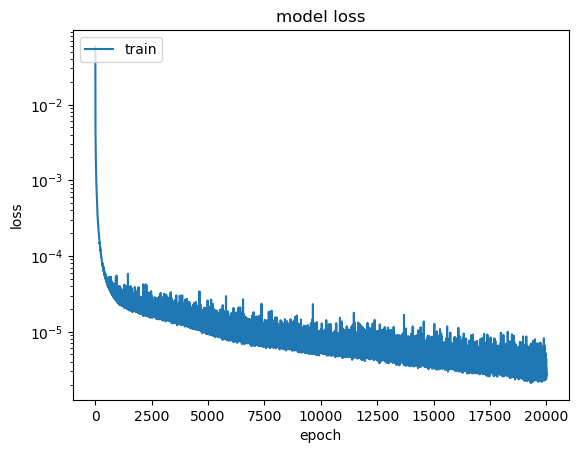

4

Epoch 1/20000
8/8 [==============================] - 9s 45ms/step - loss: 0.3852
Epoch 2/20000
8/8 [==============================] - 0s 21ms/step - loss: 0.0929
Epoch 3/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0741
Epoch 4/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0504
Epoch 5/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0364
Epoch 6/20000
8/8 [==============================] - 0s 21ms/step - loss: 0.0293
Epoch 7/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0256
Epoch 8/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0221
Epoch 9/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.0194
Epoch 10/20000
8/8 [==============================] - 0s 27ms/step - loss: 0.0172
Epoch 11/20000
8/8 [==============================] - 0s 32ms/step - loss: 0.0155
Epoch 12/20000
8/8 [==============================] - 0s 10ms/step - loss: 0.0140
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 11ms/step - loss: 3.8000e-04
Epoch 99/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.7768e-04
Epoch 100/20000
8/8 [==============================] - 0s 28ms/step - loss: 3.7220e-04
Epoch 101/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.6676e-04
Epoch 102/20000
8/8 [==============================] - 0s 20ms/step - loss: 3.6329e-04
Epoch 103/20000
8/8 [==============================] - 0s 37ms/step - loss: 3.5898e-04
Epoch 104/20000
8/8 [==============================] - 0s 29ms/step - loss: 3.5502e-04
Epoch 105/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.5137e-04
Epoch 106/20000
8/8 [==============================] - 0s 25ms/step - loss: 3.4791e-04
Epoch 107/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.4443e-04
Epoch 108/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.4104e-04
Epoch 109/20000
8/8 [==============================] - 0s 33

8/8 [==============================] - 0s 25ms/step - loss: 1.8088e-04
Epoch 193/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8096e-04
Epoch 194/20000
8/8 [==============================] - 0s 25ms/step - loss: 1.7947e-04
Epoch 195/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.7785e-04
Epoch 196/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.7686e-04
Epoch 197/20000
8/8 [==============================] - 0s 24ms/step - loss: 1.7655e-04
Epoch 198/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.7499e-04
Epoch 199/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.7423e-04
Epoch 200/20000
8/8 [==============================] - 0s 26ms/step - loss: 1.7371e-04
Epoch 201/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.7258e-04
Epoch 202/20000
8/8 [==============================] - 0s 33ms/step - loss: 1.7130e-04
Epoch 203/20000
8/8 [==============================] - 0s 5m

8/8 [==============================] - 0s 28ms/step - loss: 1.2152e-04
Epoch 287/20000
8/8 [==============================] - 0s 23ms/step - loss: 1.2168e-04
Epoch 288/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.2148e-04
Epoch 289/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.2143e-04
Epoch 290/20000
8/8 [==============================] - 0s 30ms/step - loss: 1.2021e-04
Epoch 291/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.1964e-04
Epoch 292/20000
8/8 [==============================] - 0s 22ms/step - loss: 1.1905e-04
Epoch 293/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1986e-04
Epoch 294/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1906e-04
Epoch 295/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.1833e-04
Epoch 296/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1962e-04
Epoch 297/20000
8/8 [==============================] - 0s 6ms/

8/8 [==============================] - 0s 10ms/step - loss: 9.2056e-05
Epoch 381/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1947e-05
Epoch 382/20000
8/8 [==============================] - 0s 35ms/step - loss: 9.0522e-05
Epoch 383/20000
8/8 [==============================] - 0s 20ms/step - loss: 9.0171e-05
Epoch 384/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0878e-05
Epoch 385/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1253e-05
Epoch 386/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2153e-05
Epoch 387/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.2597e-05
Epoch 388/20000
8/8 [==============================] - 0s 16ms/step - loss: 8.9565e-05
Epoch 389/20000
8/8 [==============================] - 0s 19ms/step - loss: 8.8846e-05
Epoch 390/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9002e-05
Epoch 391/20000
8/8 [==============================] - 0s 10ms/st

Epoch 475/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.1306e-05
Epoch 476/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.1264e-05
Epoch 477/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1690e-05
Epoch 478/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1411e-05
Epoch 479/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1793e-05
Epoch 480/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.0071e-05
Epoch 481/20000
8/8 [==============================] - 0s 29ms/step - loss: 6.9860e-05
Epoch 482/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0834e-05
Epoch 483/20000
8/8 [==============================] - 0s 27ms/step - loss: 6.8968e-05
Epoch 484/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0401e-05
Epoch 485/20000
8/8 [==============================] - 0s 19ms/step - loss: 6.8892e-05
Epoch 486/20000
8/8 [=============================

8/8 [==============================] - 0s 12ms/step - loss: 5.6425e-05
Epoch 570/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.6660e-05
Epoch 571/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6732e-05
Epoch 572/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.6257e-05
Epoch 573/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.7043e-05
Epoch 574/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6275e-05
Epoch 575/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.6126e-05
Epoch 576/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6287e-05
Epoch 577/20000
8/8 [==============================] - 0s 25ms/step - loss: 5.5474e-05
Epoch 578/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6105e-05
Epoch 579/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5545e-05
Epoch 580/20000
8/8 [==============================] - 0s 11ms/st

Epoch 664/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6832e-05
Epoch 665/20000
8/8 [==============================] - 0s 26ms/step - loss: 4.5223e-05
Epoch 666/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5615e-05
Epoch 667/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6080e-05
Epoch 668/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7742e-05
Epoch 669/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8389e-05
Epoch 670/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3151e-05
Epoch 671/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1577e-05
Epoch 672/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8224e-05
Epoch 673/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5724e-05
Epoch 674/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6597e-05
Epoch 675/20000
8/8 [==============================] 

8/8 [==============================] - 0s 6ms/step - loss: 4.1038e-05
Epoch 760/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.7367e-05
Epoch 761/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7460e-05
Epoch 762/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8874e-05
Epoch 763/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2097e-05
Epoch 764/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1964e-05
Epoch 765/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9865e-05
Epoch 766/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0792e-05
Epoch 767/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1238e-05
Epoch 768/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8791e-05
Epoch 769/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2211e-05
Epoch 770/20000
8/8 [==============================] - 0s 4ms/step -

8/8 [==============================] - 0s 7ms/step - loss: 4.1238e-05
Epoch 855/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4527e-05
Epoch 856/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2537e-05
Epoch 857/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3788e-05
Epoch 858/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4377e-05
Epoch 859/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2265e-05
Epoch 860/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1575e-05
Epoch 861/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3709e-05
Epoch 862/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2240e-05
Epoch 863/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2945e-05
Epoch 864/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4146e-05
Epoch 865/20000
8/8 [==============================] - 0s 8ms/step - l

8/8 [==============================] - 0s 12ms/step - loss: 3.2983e-05
Epoch 950/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0442e-05
Epoch 951/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2258e-05
Epoch 952/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0530e-05
Epoch 953/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1075e-05
Epoch 954/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4754e-05
Epoch 955/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5813e-05
Epoch 956/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4945e-05
Epoch 957/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9078e-05
Epoch 958/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2817e-05
Epoch 959/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0144e-05
Epoch 960/20000
8/8 [==============================] - 0s 6ms/step - 

8/8 [==============================] - 0s 6ms/step - loss: 2.6077e-05
Epoch 1044/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9004e-05
Epoch 1045/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8304e-05
Epoch 1046/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8755e-05
Epoch 1047/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6066e-05
Epoch 1048/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8220e-05
Epoch 1049/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4963e-05
Epoch 1050/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7542e-05
Epoch 1051/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8621e-05
Epoch 1052/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7754e-05
Epoch 1053/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2728e-05
Epoch 1054/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 2.4908e-05
Epoch 1138/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4494e-05
Epoch 1139/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3724e-05
Epoch 1140/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5043e-05
Epoch 1141/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3260e-05
Epoch 1142/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.5761e-05
Epoch 1143/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0846e-05
Epoch 1144/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5061e-05
Epoch 1145/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7089e-05
Epoch 1146/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4359e-05
Epoch 1147/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4449e-05
Epoch 1148/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.5139e-05
Epoch 1232/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5635e-05
Epoch 1233/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8340e-05
Epoch 1234/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3691e-05
Epoch 1235/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4164e-05
Epoch 1236/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4904e-05
Epoch 1237/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3854e-05
Epoch 1238/20000
8/8 [==============================] - 0s 17ms/step - loss: 2.2317e-05
Epoch 1239/20000
8/8 [==============================] - 0s 22ms/step - loss: 2.2050e-05
Epoch 1240/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.1531e-05
Epoch 1241/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2979e-05
Epoch 1242/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 4ms/step - loss: 2.2832e-05
Epoch 1326/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.1048e-05
Epoch 1327/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2169e-05
Epoch 1328/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2995e-05
Epoch 1329/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1673e-05
Epoch 1330/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.4220e-05
Epoch 1331/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9172e-05
Epoch 1332/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.4406e-05
Epoch 1333/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2767e-05
Epoch 1334/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1972e-05
Epoch 1335/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4568e-05
Epoch 1336/20000
8/8 [==============================] -

8/8 [==============================] - 0s 8ms/step - loss: 2.1744e-05
Epoch 1420/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2844e-05
Epoch 1421/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1506e-05
Epoch 1422/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2468e-05
Epoch 1423/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1393e-05
Epoch 1424/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1836e-05
Epoch 1425/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4806e-05
Epoch 1426/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5380e-05
Epoch 1427/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1183e-05
Epoch 1428/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3144e-05
Epoch 1429/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.6401e-05
Epoch 1430/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 2.0699e-05
Epoch 1514/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3605e-05
Epoch 1515/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4656e-05
Epoch 1516/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0043e-05
Epoch 1517/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0900e-05
Epoch 1518/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7531e-05
Epoch 1519/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8139e-05
Epoch 1520/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4083e-05
Epoch 1521/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6427e-05
Epoch 1522/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1530e-05
Epoch 1523/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4474e-05
Epoch 1524/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 7ms/step - loss: 2.0710e-05
Epoch 1608/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2203e-05
Epoch 1609/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3599e-05
Epoch 1610/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.1496e-05
Epoch 1611/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4784e-05
Epoch 1612/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4468e-05
Epoch 1613/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0726e-05
Epoch 1614/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0061e-05
Epoch 1615/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0700e-05
Epoch 1616/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5263e-05
Epoch 1617/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0659e-05
Epoch 1618/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.2834e-05
Epoch 1702/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9190e-05
Epoch 1703/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9499e-05
Epoch 1704/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8751e-05
Epoch 1705/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9092e-05
Epoch 1706/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9808e-05
Epoch 1707/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8581e-05
Epoch 1708/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6363e-05
Epoch 1709/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6209e-05
Epoch 1710/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4863e-05
Epoch 1711/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3538e-05
Epoch 1712/20000
8/8 [==============================] - 0s 2

8/8 [==============================] - 0s 5ms/step - loss: 2.3566e-05
Epoch 1796/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5066e-05
Epoch 1797/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9427e-05
Epoch 1798/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0392e-05
Epoch 1799/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2200e-05
Epoch 1800/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6283e-05
Epoch 1801/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3951e-05
Epoch 1802/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4874e-05
Epoch 1803/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3034e-05
Epoch 1804/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5283e-05
Epoch 1805/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3400e-05
Epoch 1806/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 10ms/step - loss: 1.9418e-05
Epoch 1890/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8484e-05
Epoch 1891/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2538e-05
Epoch 1892/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3250e-05
Epoch 1893/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1834e-05
Epoch 1894/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4733e-05
Epoch 1895/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9280e-05
Epoch 1896/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0293e-05
Epoch 1897/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8899e-05
Epoch 1898/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7300e-05
Epoch 1899/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7261e-05
Epoch 1900/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 2.2648e-05
Epoch 1984/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5149e-05
Epoch 1985/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8969e-05
Epoch 1986/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9086e-05
Epoch 1987/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8034e-05
Epoch 1988/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3157e-05
Epoch 1989/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9356e-05
Epoch 1990/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9646e-05
Epoch 1991/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7428e-05
Epoch 1992/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7782e-05
Epoch 1993/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7614e-05
Epoch 1994/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 14ms/step - loss: 2.1292e-05
Epoch 2078/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1973e-05
Epoch 2079/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3318e-05
Epoch 2080/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6898e-05
Epoch 2081/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8245e-05
Epoch 2082/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7227e-05
Epoch 2083/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3087e-05
Epoch 2084/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5909e-05
Epoch 2085/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9636e-05
Epoch 2086/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9896e-05
Epoch 2087/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1551e-05
Epoch 2088/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.7736e-05
Epoch 2172/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8395e-05
Epoch 2173/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8286e-05
Epoch 2174/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8515e-05
Epoch 2175/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6289e-05
Epoch 2176/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.5115e-05
Epoch 2177/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5554e-05
Epoch 2178/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6419e-05
Epoch 2179/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6287e-05
Epoch 2180/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8549e-05
Epoch 2181/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9808e-05
Epoch 2182/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 9ms/step - loss: 1.7924e-05
Epoch 2266/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8350e-05
Epoch 2267/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8433e-05
Epoch 2268/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1391e-05
Epoch 2269/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2620e-05
Epoch 2270/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3690e-05
Epoch 2271/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0438e-05
Epoch 2272/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9276e-05
Epoch 2273/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7573e-05
Epoch 2274/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6900e-05
Epoch 2275/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9485e-05
Epoch 2276/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 7ms/step - loss: 1.6584e-05
Epoch 2360/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7375e-05
Epoch 2361/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.5952e-05
Epoch 2362/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5920e-05
Epoch 2363/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5214e-05
Epoch 2364/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6405e-05
Epoch 2365/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7531e-05
Epoch 2366/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.5696e-05
Epoch 2367/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9381e-05
Epoch 2368/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2530e-05
Epoch 2369/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1525e-05
Epoch 2370/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 9ms/step - loss: 1.7578e-05
Epoch 2454/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6851e-05
Epoch 2455/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5303e-05
Epoch 2456/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6857e-05
Epoch 2457/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6133e-05
Epoch 2458/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.6213e-05
Epoch 2459/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5931e-05
Epoch 2460/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4353e-05
Epoch 2461/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5716e-05
Epoch 2462/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8636e-05
Epoch 2463/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6881e-05
Epoch 2464/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.7495e-05
Epoch 2548/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9950e-05
Epoch 2549/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4581e-05
Epoch 2550/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4511e-05
Epoch 2551/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6276e-05
Epoch 2552/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2175e-05
Epoch 2553/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0731e-05
Epoch 2554/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7204e-05
Epoch 2555/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5037e-05
Epoch 2556/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6656e-05
Epoch 2557/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0728e-05
Epoch 2558/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.4368e-05
Epoch 2642/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3220e-05
Epoch 2643/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5202e-05
Epoch 2644/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4211e-05
Epoch 2645/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1549e-05
Epoch 2646/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4008e-05
Epoch 2647/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4768e-05
Epoch 2648/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0176e-05
Epoch 2649/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5619e-05
Epoch 2650/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9054e-05
Epoch 2651/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9713e-05
Epoch 2652/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 1.5550e-05
Epoch 2736/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6797e-05
Epoch 2737/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5997e-05
Epoch 2738/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5309e-05
Epoch 2739/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4346e-05
Epoch 2740/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6444e-05
Epoch 2741/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.1442e-05
Epoch 2742/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4482e-05
Epoch 2743/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9039e-05
Epoch 2744/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4523e-05
Epoch 2745/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3572e-05
Epoch 2746/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 1.4105e-05
Epoch 2830/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3573e-05
Epoch 2831/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6496e-05
Epoch 2832/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2780e-05
Epoch 2833/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5227e-05
Epoch 2834/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7843e-05
Epoch 2835/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5993e-05
Epoch 2836/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3834e-05
Epoch 2837/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2410e-05
Epoch 2838/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8043e-05
Epoch 2839/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5246e-05
Epoch 2840/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.4588e-05
Epoch 2924/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2837e-05
Epoch 2925/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2353e-05
Epoch 2926/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5273e-05
Epoch 2927/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9628e-05
Epoch 2928/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5430e-05
Epoch 2929/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8946e-05
Epoch 2930/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6417e-05
Epoch 2931/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6865e-05
Epoch 2932/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3756e-05
Epoch 2933/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4263e-05
Epoch 2934/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 1.3632e-05
Epoch 3018/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2667e-05
Epoch 3019/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2273e-05
Epoch 3020/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9686e-05
Epoch 3021/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9339e-05
Epoch 3022/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6114e-05
Epoch 3023/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2996e-05
Epoch 3024/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1270e-05
Epoch 3025/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5879e-05
Epoch 3026/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3266e-05
Epoch 3027/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2802e-05
Epoch 3028/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 9ms/step - loss: 1.4352e-05
Epoch 3112/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5177e-05
Epoch 3113/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4166e-05
Epoch 3114/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7256e-05
Epoch 3115/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5805e-05
Epoch 3116/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4226e-05
Epoch 3117/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0217e-05
Epoch 3118/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4950e-05
Epoch 3119/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4908e-05
Epoch 3120/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5575e-05
Epoch 3121/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7520e-05
Epoch 3122/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 9ms/step - loss: 1.1857e-05
Epoch 3206/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.0222e-05
Epoch 3207/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.1883e-05
Epoch 3208/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4532e-05
Epoch 3209/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1180e-05
Epoch 3210/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0769e-05
Epoch 3211/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2457e-05
Epoch 3212/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2643e-05
Epoch 3213/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2662e-05
Epoch 3214/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2514e-05
Epoch 3215/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5248e-05
Epoch 3216/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 6ms/step - loss: 1.1319e-05
Epoch 3300/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1611e-05
Epoch 3301/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1446e-05
Epoch 3302/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0132e-05
Epoch 3303/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.0362e-05
Epoch 3304/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0665e-05
Epoch 3305/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2398e-05
Epoch 3306/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1042e-05
Epoch 3307/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0986e-05
Epoch 3308/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7173e-05
Epoch 3309/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0497e-05
Epoch 3310/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 1.1144e-05
Epoch 3394/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2971e-05
Epoch 3395/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4458e-05
Epoch 3396/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1627e-05
Epoch 3397/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0490e-05
Epoch 3398/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0735e-05
Epoch 3399/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2624e-05
Epoch 3400/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6545e-05
Epoch 3401/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4302e-05
Epoch 3402/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2618e-05
Epoch 3403/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3314e-05
Epoch 3404/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.5700e-05
Epoch 3488/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.1526e-05
Epoch 3489/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0864e-05
Epoch 3490/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0317e-05
Epoch 3491/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4204e-05
Epoch 3492/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2024e-05
Epoch 3493/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0857e-05
Epoch 3494/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1134e-05
Epoch 3495/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2419e-05
Epoch 3496/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0913e-05
Epoch 3497/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1426e-05
Epoch 3498/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.2321e-05
Epoch 3582/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3398e-05
Epoch 3583/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2267e-05
Epoch 3584/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0435e-05
Epoch 3585/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1515e-05
Epoch 3586/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0814e-05
Epoch 3587/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4475e-05
Epoch 3588/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4335e-05
Epoch 3589/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2408e-05
Epoch 3590/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3063e-05
Epoch 3591/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2878e-05
Epoch 3592/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 6ms/step - loss: 1.0139e-05
Epoch 3704/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3194e-06
Epoch 3705/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.1460e-06
Epoch 3706/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.8912e-06
Epoch 3707/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1316e-05
Epoch 3708/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1663e-05
Epoch 3709/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4448e-05
Epoch 3710/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0026e-05
Epoch 3711/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7662e-06
Epoch 3712/20000
8/8 [==============================] - 0s 16ms/step - loss: 9.1536e-06
Epoch 3713/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0001e-05
Epoch 3714/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 9.8245e-06
Epoch 3798/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0921e-05
Epoch 3799/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0324e-05
Epoch 3800/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1636e-05
Epoch 3801/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9151e-06
Epoch 3802/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0159e-05
Epoch 3803/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0348e-05
Epoch 3804/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1082e-05
Epoch 3805/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2600e-05
Epoch 3806/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4277e-05
Epoch 3807/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3221e-05
Epoch 3808/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.4439e-05
Epoch 3901/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3499e-05
Epoch 3902/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0523e-05
Epoch 3903/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5570e-05
Epoch 3904/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0192e-05
Epoch 3905/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2732e-05
Epoch 3906/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1505e-05
Epoch 3907/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1102e-05
Epoch 3908/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0523e-05
Epoch 3909/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6540e-06
Epoch 3910/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7898e-06
Epoch 3911/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 6ms/step - loss: 1.2619e-05
Epoch 4104/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7856e-05
Epoch 4105/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3891e-05
Epoch 4106/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0871e-05
Epoch 4107/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0817e-05
Epoch 4108/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3095e-05
Epoch 4109/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0353e-05
Epoch 4110/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0876e-05
Epoch 4111/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0513e-05
Epoch 4112/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2135e-05
Epoch 4113/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0891e-05
Epoch 4114/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 9.4960e-06
Epoch 4198/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0146e-05
Epoch 4199/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2172e-05
Epoch 4200/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4451e-05
Epoch 4201/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.5508e-05
Epoch 4202/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7248e-05
Epoch 4203/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2661e-05
Epoch 4204/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3686e-05
Epoch 4205/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4400e-05
Epoch 4206/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2873e-05
Epoch 4207/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3005e-05
Epoch 4208/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 7ms/step - loss: 1.1241e-05
Epoch 4310/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3921e-05
Epoch 4311/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1962e-05
Epoch 4312/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3299e-05
Epoch 4313/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1228e-05
Epoch 4314/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7319e-06
Epoch 4315/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.2717e-06
Epoch 4316/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.2763e-06
Epoch 4317/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.9365e-06
Epoch 4318/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.7904e-06
Epoch 4319/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.9658e-06
Epoch 4320/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 9.9745e-06
Epoch 4404/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8888e-06
Epoch 4405/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.9562e-06
Epoch 4406/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0160e-05
Epoch 4407/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1637e-06
Epoch 4408/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3334e-06
Epoch 4409/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8351e-06
Epoch 4410/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4632e-06
Epoch 4411/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5279e-05
Epoch 4412/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9249e-05
Epoch 4413/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0455e-05
Epoch 4414/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 8.3327e-06
Epoch 4520/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3720e-06
Epoch 4521/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8061e-06
Epoch 4522/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8979e-06
Epoch 4523/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8825e-06
Epoch 4524/20000
8/8 [==============================] - 0s 15ms/step - loss: 8.0672e-06
Epoch 4525/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3158e-06
Epoch 4526/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.9140e-06
Epoch 4527/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0351e-05
Epoch 4528/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3436e-05
Epoch 4529/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3708e-05
Epoch 4530/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 9.5154e-06
Epoch 4650/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4104e-06
Epoch 4651/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4373e-06
Epoch 4652/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4521e-06
Epoch 4653/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0524e-05
Epoch 4654/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0287e-05
Epoch 4655/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3089e-05
Epoch 4656/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3020e-05
Epoch 4657/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3310e-05
Epoch 4658/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7012e-05
Epoch 4659/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1712e-05
Epoch 4660/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.0997e-05
Epoch 4744/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1483e-05
Epoch 4745/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2639e-05
Epoch 4746/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0819e-05
Epoch 4747/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2266e-05
Epoch 4748/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6057e-06
Epoch 4749/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0577e-05
Epoch 4750/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0959e-05
Epoch 4751/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1535e-05
Epoch 4752/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5415e-05
Epoch 4753/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0952e-06
Epoch 4754/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 8.8108e-06
Epoch 4865/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7468e-06
Epoch 4866/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0791e-05
Epoch 4867/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1092e-05
Epoch 4868/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.9997e-06
Epoch 4869/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0065e-05
Epoch 4870/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2073e-05
Epoch 4871/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3125e-05
Epoch 4872/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4266e-06
Epoch 4873/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0161e-06
Epoch 4874/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2533e-06
Epoch 4875/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 8.7713e-06
Epoch 4959/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2947e-06
Epoch 4960/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0403e-05
Epoch 4961/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0483e-05
Epoch 4962/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2913e-06
Epoch 4963/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0665e-06
Epoch 4964/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1300e-05
Epoch 4965/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9193e-06
Epoch 4966/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0738e-05
Epoch 4967/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9736e-06
Epoch 4968/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0084e-05
Epoch 4969/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 8.5844e-06
Epoch 5089/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0971e-05
Epoch 5090/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9675e-06
Epoch 5091/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8426e-06
Epoch 5092/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1983e-06
Epoch 5093/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1389e-05
Epoch 5094/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0420e-05
Epoch 5095/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0063e-05
Epoch 5096/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0092e-06
Epoch 5097/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2036e-05
Epoch 5098/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3810e-06
Epoch 5099/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 7.9098e-06
Epoch 5183/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5653e-06
Epoch 5184/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9292e-06
Epoch 5185/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0534e-05
Epoch 5186/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8734e-06
Epoch 5187/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0171e-06
Epoch 5188/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0213e-05
Epoch 5189/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8038e-06
Epoch 5190/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9683e-06
Epoch 5191/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0272e-05
Epoch 5192/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.4374e-06
Epoch 5193/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 8.5955e-06
Epoch 5408/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0203e-05
Epoch 5409/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2757e-05
Epoch 5410/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.0362e-05
Epoch 5411/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.4451e-06
Epoch 5412/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3320e-06
Epoch 5413/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1200e-05
Epoch 5414/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0065e-05
Epoch 5415/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4490e-06
Epoch 5416/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.3577e-06
Epoch 5417/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1865e-06
Epoch 5418/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 1.2718e-05
Epoch 5527/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3865e-06
Epoch 5528/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2285e-06
Epoch 5529/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1454e-05
Epoch 5530/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2858e-05
Epoch 5531/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5637e-05
Epoch 5532/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6904e-05
Epoch 5533/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2581e-05
Epoch 5534/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0592e-05
Epoch 5535/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0325e-05
Epoch 5536/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2796e-06
Epoch 5537/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.3202e-05
Epoch 5621/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2221e-05
Epoch 5622/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2009e-05
Epoch 5623/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0565e-05
Epoch 5624/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8727e-06
Epoch 5625/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7732e-06
Epoch 5626/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1504e-05
Epoch 5627/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0557e-05
Epoch 5628/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1809e-05
Epoch 5629/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0255e-05
Epoch 5630/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3484e-06
Epoch 5631/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 8.2478e-06
Epoch 5738/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.1921e-06
Epoch 5739/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7480e-06
Epoch 5740/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8458e-06
Epoch 5741/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2566e-05
Epoch 5742/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0181e-05
Epoch 5743/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0852e-05
Epoch 5744/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3130e-05
Epoch 5745/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1485e-05
Epoch 5746/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0258e-05
Epoch 5747/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5579e-06
Epoch 5748/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 13ms/step - loss: 8.1807e-06
Epoch 5832/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0616e-05
Epoch 5833/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5634e-06
Epoch 5834/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.6278e-06
Epoch 5835/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5253e-06
Epoch 5836/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8146e-06
Epoch 5837/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6407e-06
Epoch 5838/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7742e-06
Epoch 5839/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1223e-06
Epoch 5840/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4267e-06
Epoch 5841/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4436e-06
Epoch 5842/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 9.5850e-06
Epoch 5947/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6260e-06
Epoch 5948/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0211e-05
Epoch 5949/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4217e-06
Epoch 5950/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0348e-05
Epoch 5951/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.1653e-06
Epoch 5952/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7958e-06
Epoch 5953/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9368e-06
Epoch 5954/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5930e-06
Epoch 5955/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9392e-06
Epoch 5956/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.9750e-06
Epoch 5957/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 9.9820e-06
Epoch 6140/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.8082e-06
Epoch 6141/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3181e-05
Epoch 6142/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6566e-05
Epoch 6143/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0232e-05
Epoch 6144/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9299e-06
Epoch 6145/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8349e-06
Epoch 6146/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4290e-06
Epoch 6147/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7283e-06
Epoch 6148/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0494e-05
Epoch 6149/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2848e-05
Epoch 6150/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.1956e-05
Epoch 6234/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2261e-05
Epoch 6235/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5287e-05
Epoch 6236/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4582e-05
Epoch 6237/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9206e-06
Epoch 6238/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3517e-06
Epoch 6239/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7263e-06
Epoch 6240/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4379e-06
Epoch 6241/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3249e-06
Epoch 6242/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.5088e-06
Epoch 6243/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9362e-06
Epoch 6244/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 7.5815e-06
Epoch 6348/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5442e-06
Epoch 6349/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1188e-05
Epoch 6350/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3698e-06
Epoch 6351/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8815e-06
Epoch 6352/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0086e-05
Epoch 6353/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1211e-05
Epoch 6354/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2566e-05
Epoch 6355/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.0091e-05
Epoch 6356/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4066e-06
Epoch 6357/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9659e-06
Epoch 6358/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 9.7849e-06
Epoch 6442/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6888e-06
Epoch 6443/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4482e-06
Epoch 6444/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0150e-05
Epoch 6445/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.6138e-06
Epoch 6446/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.2506e-06
Epoch 6447/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0442e-06
Epoch 6448/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0785e-06
Epoch 6449/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.4420e-06
Epoch 6450/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7437e-06
Epoch 6451/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1520e-06
Epoch 6452/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 1.0482e-05
Epoch 6646/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9338e-06
Epoch 6647/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.8265e-06
Epoch 6648/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3162e-06
Epoch 6649/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5706e-06
Epoch 6650/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8269e-06
Epoch 6651/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2082e-06
Epoch 6652/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1301e-05
Epoch 6653/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2541e-05
Epoch 6654/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0727e-05
Epoch 6655/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1932e-06
Epoch 6656/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 8.0968e-06
Epoch 6775/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3997e-06
Epoch 6776/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3533e-06
Epoch 6777/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.9059e-06
Epoch 6778/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8862e-06
Epoch 6779/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1594e-05
Epoch 6780/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2912e-05
Epoch 6781/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2338e-06
Epoch 6782/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.7978e-06
Epoch 6783/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2908e-06
Epoch 6784/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.0342e-06
Epoch 6785/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 10ms/step - loss: 6.1268e-06
Epoch 6869/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4024e-06
Epoch 6870/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2411e-06
Epoch 6871/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8789e-06
Epoch 6872/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0008e-06
Epoch 6873/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9069e-06
Epoch 6874/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7726e-06
Epoch 6875/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7465e-06
Epoch 6876/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3524e-06
Epoch 6877/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7873e-06
Epoch 6878/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0374e-06
Epoch 6879/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 7.6888e-06
Epoch 6998/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3627e-05
Epoch 6999/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0422e-06
Epoch 7000/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1639e-06
Epoch 7001/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1060e-06
Epoch 7002/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6926e-06
Epoch 7003/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0789e-05
Epoch 7004/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6612e-06
Epoch 7005/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0348e-05
Epoch 7006/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2411e-05
Epoch 7007/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1076e-05
Epoch 7008/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 20ms/step - loss: 5.7481e-06
Epoch 7092/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.1593e-06
Epoch 7093/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2247e-06
Epoch 7094/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0673e-06
Epoch 7095/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5461e-06
Epoch 7096/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1097e-05
Epoch 7097/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.9542e-06
Epoch 7098/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1437e-06
Epoch 7099/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0747e-06
Epoch 7100/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8229e-06
Epoch 7101/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5781e-06
Epoch 7102/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.0982e-05
Epoch 7220/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1362e-05
Epoch 7221/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1237e-05
Epoch 7222/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3532e-06
Epoch 7223/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.8373e-06
Epoch 7224/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9959e-06
Epoch 7225/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8883e-06
Epoch 7226/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8113e-06
Epoch 7227/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1569e-05
Epoch 7228/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1504e-05
Epoch 7229/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1156e-05
Epoch 7230/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 6.7914e-06
Epoch 7314/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9303e-06
Epoch 7315/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.2358e-06
Epoch 7316/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8837e-06
Epoch 7317/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8421e-06
Epoch 7318/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3353e-06
Epoch 7319/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9676e-06
Epoch 7320/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2114e-05
Epoch 7321/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0579e-05
Epoch 7322/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0617e-05
Epoch 7323/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3602e-06
Epoch 7324/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 9.1621e-06
Epoch 7525/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1843e-05
Epoch 7526/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0896e-06
Epoch 7527/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7910e-06
Epoch 7528/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7738e-06
Epoch 7529/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9943e-06
Epoch 7530/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3894e-06
Epoch 7531/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8548e-06
Epoch 7532/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3514e-06
Epoch 7533/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1493e-05
Epoch 7534/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5523e-06
Epoch 7535/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 7.8257e-06
Epoch 7644/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9680e-06
Epoch 7645/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8544e-06
Epoch 7646/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2803e-06
Epoch 7647/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6435e-06
Epoch 7648/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4401e-06
Epoch 7649/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7151e-06
Epoch 7650/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0079e-06
Epoch 7651/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9561e-06
Epoch 7652/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2843e-06
Epoch 7653/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1708e-06
Epoch 7654/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 4ms/step - loss: 6.6844e-06
Epoch 7738/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.3780e-06
Epoch 7739/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6961e-06
Epoch 7740/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0677e-06
Epoch 7741/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9335e-06
Epoch 7742/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0629e-06
Epoch 7743/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7374e-06
Epoch 7744/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1678e-06
Epoch 7745/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2879e-06
Epoch 7746/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5371e-06
Epoch 7747/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4262e-06
Epoch 7748/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 7.9889e-06
Epoch 7863/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6400e-06
Epoch 7864/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6977e-06
Epoch 7865/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3282e-06
Epoch 7866/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0698e-06
Epoch 7867/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.4256e-06
Epoch 7868/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5752e-06
Epoch 7869/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1114e-06
Epoch 7870/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5045e-06
Epoch 7871/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3748e-06
Epoch 7872/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0137e-05
Epoch 7873/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 7.3308e-06
Epoch 7957/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8945e-06
Epoch 7958/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.3505e-06
Epoch 7959/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4348e-06
Epoch 7960/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0054e-05
Epoch 7961/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6620e-06
Epoch 7962/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9720e-06
Epoch 7963/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4419e-05
Epoch 7964/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0137e-05
Epoch 7965/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1715e-05
Epoch 7966/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0421e-05
Epoch 7967/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 4ms/step - loss: 6.9581e-06
Epoch 8150/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5418e-06
Epoch 8151/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1609e-06
Epoch 8152/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4152e-06
Epoch 8153/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1766e-06
Epoch 8154/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7273e-06
Epoch 8155/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0400e-06
Epoch 8156/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1753e-06
Epoch 8157/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1664e-06
Epoch 8158/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0559e-06
Epoch 8159/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3271e-06
Epoch 8160/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 6.3956e-06
Epoch 8282/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8197e-06
Epoch 8283/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0141e-06
Epoch 8284/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9807e-06
Epoch 8285/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9532e-06
Epoch 8286/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0895e-06
Epoch 8287/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1305e-06
Epoch 8288/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.9866e-06
Epoch 8289/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8342e-06
Epoch 8290/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5287e-06
Epoch 8291/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1978e-06
Epoch 8292/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 7.9029e-06
Epoch 8376/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0597e-06
Epoch 8377/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7361e-06
Epoch 8378/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1613e-06
Epoch 8379/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1339e-06
Epoch 8380/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0449e-06
Epoch 8381/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1012e-06
Epoch 8382/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3413e-06
Epoch 8383/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3740e-06
Epoch 8384/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9235e-06
Epoch 8385/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2369e-06
Epoch 8386/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 5.5291e-06
Epoch 8514/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3756e-06
Epoch 8515/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1617e-06
Epoch 8516/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5307e-06
Epoch 8517/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0187e-05
Epoch 8518/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0481e-05
Epoch 8519/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1009e-05
Epoch 8520/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2898e-05
Epoch 8521/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4788e-06
Epoch 8522/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5605e-06
Epoch 8523/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7962e-06
Epoch 8524/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 8.1834e-06
Epoch 8608/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3175e-06
Epoch 8609/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7272e-06
Epoch 8610/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6545e-06
Epoch 8611/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6868e-06
Epoch 8612/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3906e-06
Epoch 8613/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5495e-06
Epoch 8614/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0919e-06
Epoch 8615/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9012e-06
Epoch 8616/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6861e-06
Epoch 8617/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4213e-06
Epoch 8618/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 6.0177e-06
Epoch 8742/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9384e-06
Epoch 8743/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9041e-06
Epoch 8744/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3077e-06
Epoch 8745/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3868e-06
Epoch 8746/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8322e-06
Epoch 8747/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3213e-06
Epoch 8748/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8919e-06
Epoch 8749/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1380e-06
Epoch 8750/20000
8/8 [==============================] - 0s 21ms/step - loss: 7.3626e-06
Epoch 8751/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4654e-06
Epoch 8752/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.6143e-06
Epoch 8836/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8794e-06
Epoch 8837/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7318e-06
Epoch 8838/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0422e-06
Epoch 8839/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9652e-06
Epoch 8840/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3147e-06
Epoch 8841/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0353e-06
Epoch 8842/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5068e-06
Epoch 8843/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2357e-06
Epoch 8844/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9354e-06
Epoch 8845/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5219e-06
Epoch 8846/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 4.9615e-06
Epoch 8960/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6164e-06
Epoch 8961/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5182e-06
Epoch 8962/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.1580e-06
Epoch 8963/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0002e-05
Epoch 8964/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5421e-06
Epoch 8965/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8340e-06
Epoch 8966/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6642e-06
Epoch 8967/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2809e-06
Epoch 8968/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6371e-06
Epoch 8969/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8026e-06
Epoch 8970/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 8.5203e-06
Epoch 9076/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7510e-06
Epoch 9077/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0067e-05
Epoch 9078/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.0798e-06
Epoch 9079/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3731e-06
Epoch 9080/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2568e-06
Epoch 9081/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9934e-06
Epoch 9082/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1577e-06
Epoch 9083/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0798e-06
Epoch 9084/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6898e-06
Epoch 9085/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6963e-06
Epoch 9086/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 6.5475e-06
Epoch 9170/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8017e-06
Epoch 9171/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4117e-06
Epoch 9172/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.2731e-06
Epoch 9173/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6103e-06
Epoch 9174/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8237e-06
Epoch 9175/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9299e-06
Epoch 9176/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7632e-06
Epoch 9177/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9343e-06
Epoch 9178/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8316e-06
Epoch 9179/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8879e-06
Epoch 9180/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 4.2626e-06
Epoch 9290/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6114e-06
Epoch 9291/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0950e-06
Epoch 9292/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4627e-06
Epoch 9293/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5333e-06
Epoch 9294/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.6229e-06
Epoch 9295/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5282e-06
Epoch 9296/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6214e-06
Epoch 9297/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1756e-06
Epoch 9298/20000
8/8 [==============================] - 0s 15ms/step - loss: 6.9125e-06
Epoch 9299/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1904e-06
Epoch 9300/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 5.2928e-06
Epoch 9384/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8879e-06
Epoch 9385/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0671e-06
Epoch 9386/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2489e-06
Epoch 9387/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.1182e-06
Epoch 9388/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5272e-06
Epoch 9389/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8069e-06
Epoch 9390/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6498e-06
Epoch 9391/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5022e-06
Epoch 9392/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2780e-06
Epoch 9393/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0368e-06
Epoch 9394/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.0345e-05
Epoch 9603/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3658e-05
Epoch 9604/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3318e-06
Epoch 9605/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1888e-06
Epoch 9606/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6717e-06
Epoch 9607/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5474e-06
Epoch 9608/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1398e-06
Epoch 9609/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8302e-06
Epoch 9610/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0329e-06
Epoch 9611/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.9358e-06
Epoch 9612/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0620e-06
Epoch 9613/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 4.6692e-06
Epoch 9725/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1556e-06
Epoch 9726/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5532e-06
Epoch 9727/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8147e-06
Epoch 9728/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2992e-06
Epoch 9729/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4785e-06
Epoch 9730/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5028e-06
Epoch 9731/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8711e-06
Epoch 9732/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.6813e-06
Epoch 9733/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5279e-06
Epoch 9734/20000
8/8 [==============================] - 0s 18ms/step - loss: 5.1094e-06
Epoch 9735/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 5.6786e-06
Epoch 9819/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4777e-06
Epoch 9820/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8794e-06
Epoch 9821/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7835e-06
Epoch 9822/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6862e-06
Epoch 9823/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2906e-06
Epoch 9824/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.6335e-06
Epoch 9825/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7600e-06
Epoch 9826/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9069e-06
Epoch 9827/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2073e-06
Epoch 9828/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6037e-06
Epoch 9829/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 4.8818e-06
Epoch 9941/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3447e-06
Epoch 9942/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2647e-06
Epoch 9943/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6802e-06
Epoch 9944/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0595e-06
Epoch 9945/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1487e-06
Epoch 9946/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6127e-06
Epoch 9947/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1570e-06
Epoch 9948/20000
8/8 [==============================] - 0s 11ms/step - loss: 9.6228e-06
Epoch 9949/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8910e-06
Epoch 9950/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9524e-06
Epoch 9951/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 4.8884e-06
Epoch 10034/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1938e-06
Epoch 10035/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2692e-06
Epoch 10036/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0921e-06
Epoch 10037/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7675e-06
Epoch 10038/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8631e-06
Epoch 10039/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0301e-05
Epoch 10040/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5871e-06
Epoch 10041/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8704e-06
Epoch 10042/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6845e-06
Epoch 10043/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3284e-06
Epoch 10044/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0224e-06
Epoch 10251/20000
8/8 [==============================] - 0s 19ms/step - loss: 3.6584e-06
Epoch 10252/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4012e-06
Epoch 10253/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3938e-06
Epoch 10254/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5854e-06
Epoch 10255/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3251e-06
Epoch 10256/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2739e-06
Epoch 10257/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4714e-06
Epoch 10258/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2683e-06
Epoch 10259/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5276e-06
Epoch 10260/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9004e-06
Epoch 10261/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 8.2795e-06
Epoch 10344/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5620e-06
Epoch 10345/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.2476e-06
Epoch 10346/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4762e-06
Epoch 10347/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8710e-06
Epoch 10369/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2704e-06
Epoch 10370/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3213e-06
Epoch 10371/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1921e-06
Epoch 10372/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5306e-06
Epoch 10373/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6470e-06
Epoch 10374/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2276e-06
Epoch 10375/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.0448e-06
Epoch 10458/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6744e-06
Epoch 10459/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6882e-06
Epoch 10460/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8158e-06
Epoch 10461/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6492e-06
Epoch 10462/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.7732e-06
Epoch 10463/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2092e-06
Epoch 10464/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0022e-06
Epoch 10465/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9687e-06
Epoch 10466/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3582e-06
Epoch 10467/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1401e-06
Epoch 10468/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 1.0177e-05
Epoch 10658/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6679e-06
Epoch 10659/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9339e-06
Epoch 10660/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0560e-06
Epoch 10661/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2270e-06
Epoch 10662/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3834e-06
Epoch 10663/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.1383e-06
Epoch 10664/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7275e-06
Epoch 10665/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0495e-06
Epoch 10666/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1944e-06
Epoch 10667/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3261e-06
Epoch 10668/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.3453e-06
Epoch 10751/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4243e-06
Epoch 10752/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5769e-06
Epoch 10753/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1038e-06
Epoch 10754/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0731e-06
Epoch 10755/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.2999e-06
Epoch 10756/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5581e-06
Epoch 10757/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8221e-06
Epoch 10758/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.5411e-06
Epoch 10759/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8490e-06
Epoch 10760/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7057e-06
Epoch 10761/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.2695e-06
Epoch 10861/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7268e-06
Epoch 10862/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1655e-06
Epoch 10863/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1593e-06
Epoch 10864/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0205e-06
Epoch 10865/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2455e-06
Epoch 10866/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8360e-06
Epoch 10867/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.1380e-06
Epoch 10868/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7124e-06
Epoch 10869/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4403e-06
Epoch 10870/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5248e-06
Epoch 10871/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.9615e-06
Epoch 10954/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1454e-06
Epoch 10955/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8015e-06
Epoch 10956/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9884e-06
Epoch 10957/20000
8/8 [==============================] - 0s 16ms/step - loss: 3.5128e-06
Epoch 10958/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3034e-06
Epoch 10959/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5146e-06
Epoch 10960/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2023e-06
Epoch 10961/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2500e-06
Epoch 10962/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9259e-06
Epoch 10963/20000
8/8 [==============================] - 0s 21ms/step - loss: 4.9493e-06
Epoch 10964/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 7.4751e-06
Epoch 11161/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4931e-06
Epoch 11162/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1216e-06
Epoch 11163/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8724e-06
Epoch 11164/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7058e-06
Epoch 11165/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7659e-06
Epoch 11166/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8503e-06
Epoch 11167/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4652e-06
Epoch 11168/20000
8/8 [==============================] - 0s 16ms/step - loss: 4.0336e-06
Epoch 11169/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6219e-06
Epoch 11170/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3927e-06
Epoch 11171/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 6.3142e-06
Epoch 11270/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0488e-06
Epoch 11271/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3901e-06
Epoch 11272/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9406e-06
Epoch 11273/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2335e-06
Epoch 11274/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1656e-06
Epoch 11275/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3957e-06
Epoch 11276/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2344e-06
Epoch 11277/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.6280e-06
Epoch 11278/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0788e-06
Epoch 11279/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9522e-06
Epoch 11280/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.7101e-06
Epoch 11363/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1491e-06
Epoch 11364/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5534e-06
Epoch 11365/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8589e-06
Epoch 11366/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6991e-06
Epoch 11367/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9257e-06
Epoch 11368/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0199e-06
Epoch 11369/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0628e-06
Epoch 11370/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1306e-06
Epoch 11371/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9555e-06
Epoch 11372/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9427e-06
Epoch 11373/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 5.1621e-06
Epoch 11480/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9871e-06
Epoch 11481/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8954e-06
Epoch 11482/20000
8/8 [==============================] - 0s 15ms/step - loss: 4.0357e-06
Epoch 11483/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5311e-06
Epoch 11484/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7593e-06
Epoch 11485/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.4151e-06
Epoch 11486/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4235e-06
Epoch 11487/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3710e-06
Epoch 11488/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5163e-06
Epoch 11489/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4127e-06
Epoch 11490/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.9250e-06
Epoch 11573/20000
8/8 [==============================] - 0s 16ms/step - loss: 3.9492e-06
Epoch 11574/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5257e-06
Epoch 11575/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3286e-06
Epoch 11576/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8948e-06
Epoch 11577/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5230e-06
Epoch 11578/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9692e-06
Epoch 11579/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1206e-06
Epoch 11580/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0761e-05
Epoch 11581/20000
8/8 [==============================] - 0s 13ms/step - loss: 9.5154e-06
Epoch 11582/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0854e-06
Epoch 11583/20000
8/8 [=========================

Epoch 11770/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7394e-06
Epoch 11771/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2577e-06
Epoch 11772/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4298e-06
Epoch 11773/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6386e-06
Epoch 11774/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8081e-06
Epoch 11775/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5498e-06
Epoch 11776/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1525e-06
Epoch 11777/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8782e-06
Epoch 11778/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6201e-06
Epoch 11779/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7603e-06
Epoch 11780/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2472e-06
Epoch 11781/20000
8/8 [=========

8/8 [==============================] - 0s 4ms/step - loss: 4.3214e-06
Epoch 11974/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6911e-06
Epoch 11975/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0617e-06
Epoch 11976/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6646e-06
Epoch 11977/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7873e-06
Epoch 11978/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9581e-06
Epoch 11979/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1721e-06
Epoch 11980/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6602e-06
Epoch 11981/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4517e-06
Epoch 11982/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7969e-06
Epoch 11983/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9664e-06
Epoch 11984/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.2398e-06
Epoch 12067/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6321e-06
Epoch 12068/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5411e-06
Epoch 12069/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9938e-06
Epoch 12070/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9582e-06
Epoch 12071/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4294e-06
Epoch 12072/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2019e-06
Epoch 12073/20000
8/8 [==============================] - 0s 18ms/step - loss: 4.1342e-06
Epoch 12074/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6821e-06
Epoch 12075/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9805e-06
Epoch 12076/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6476e-06
Epoch 12077/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7870e-06
Epoch 12179/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6600e-06
Epoch 12180/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5026e-06
Epoch 12181/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0012e-06
Epoch 12182/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3571e-06
Epoch 12183/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4178e-06
Epoch 12184/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9450e-06
Epoch 12185/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4238e-06
Epoch 12186/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5982e-06
Epoch 12187/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9480e-06
Epoch 12188/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1387e-06
Epoch 12189/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.0965e-06
Epoch 12272/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9923e-06
Epoch 12273/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5101e-06
Epoch 12274/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6237e-06
Epoch 12275/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.3135e-06
Epoch 12276/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5260e-06
Epoch 12277/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0561e-06
Epoch 12278/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1631e-06
Epoch 12279/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4705e-06
Epoch 12280/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6727e-06
Epoch 12281/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7598e-06
Epoch 12282/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6248e-06
Epoch 12475/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4085e-06
Epoch 12476/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3378e-06
Epoch 12477/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0630e-06
Epoch 12478/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.2621e-06
Epoch 12479/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.7393e-06
Epoch 12480/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5070e-06
Epoch 12481/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8364e-06
Epoch 12482/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3787e-06
Epoch 12483/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6463e-06
Epoch 12484/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.6328e-06
Epoch 12485/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 6.3052e-06
Epoch 12568/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9060e-06
Epoch 12569/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1214e-05
Epoch 12570/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2889e-05
Epoch 12571/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0483e-06
Epoch 12572/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9862e-06
Epoch 12573/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1510e-06
Epoch 12574/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7432e-06
Epoch 12575/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3095e-06
Epoch 12595/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6410e-06
Epoch 12596/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2016e-06
Epoch 12597/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.9172e-06
Epoch 12680/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9924e-06
Epoch 12681/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6244e-06
Epoch 12682/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9621e-06
Epoch 12683/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4842e-06
Epoch 12684/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1359e-06
Epoch 12685/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3124e-06
Epoch 12686/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0280e-06
Epoch 12687/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4139e-06
Epoch 12688/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4180e-06
Epoch 12689/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2410e-06
Epoch 12690/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.9417e-06
Epoch 12886/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8634e-06
Epoch 12887/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5925e-06
Epoch 12888/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0189e-06
Epoch 12889/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0600e-06
Epoch 12890/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0750e-06
Epoch 12891/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5176e-06
Epoch 12892/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1609e-06
Epoch 12893/20000
8/8 [==============================] - 0s 22ms/step - loss: 3.0555e-06
Epoch 12894/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1654e-06
Epoch 12895/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3774e-06
Epoch 12896/20000
8/8 [==========================

8/8 [==============================] - 0s 11ms/step - loss: 5.2421e-06
Epoch 12979/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5684e-06
Epoch 12980/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7010e-06
Epoch 12981/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3039e-06
Epoch 12982/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4281e-06
Epoch 12983/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3069e-06
Epoch 12984/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4445e-06
Epoch 12985/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3837e-06
Epoch 12986/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6774e-06
Epoch 12987/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2697e-06
Epoch 12988/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9294e-06
Epoch 12989/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.3490e-06
Epoch 13097/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2430e-06
Epoch 13098/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4631e-06
Epoch 13099/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7914e-06
Epoch 13100/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1521e-06
Epoch 13101/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6337e-06
Epoch 13102/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4639e-06
Epoch 13103/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8017e-06
Epoch 13104/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9459e-06
Epoch 13105/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0654e-06
Epoch 13106/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0969e-06
Epoch 13107/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2873e-06
Epoch 13190/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7168e-06
Epoch 13191/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4053e-06
Epoch 13192/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6553e-06
Epoch 13193/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0210e-05
Epoch 13194/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6982e-06
Epoch 13195/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6261e-06
Epoch 13196/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4026e-06
Epoch 13197/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3860e-06
Epoch 13198/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3691e-06
Epoch 13199/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.0201e-06
Epoch 13200/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5569e-06
Epoch 13395/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9059e-06
Epoch 13396/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9917e-06
Epoch 13397/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8064e-06
Epoch 13398/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2312e-06
Epoch 13399/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3427e-06
Epoch 13400/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4525e-06
Epoch 13401/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.7784e-06
Epoch 13402/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4752e-06
Epoch 13403/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9094e-06
Epoch 13404/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7645e-06
Epoch 13405/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7862e-06
Epoch 13514/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6433e-06
Epoch 13515/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0366e-06
Epoch 13516/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.8522e-06
Epoch 13517/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9304e-06
Epoch 13518/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7878e-06
Epoch 13519/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4169e-06
Epoch 13520/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6168e-06
Epoch 13521/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6296e-06
Epoch 13522/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3484e-06
Epoch 13523/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.4491e-06
Epoch 13524/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2729e-06
Epoch 13607/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7512e-06
Epoch 13608/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9723e-06
Epoch 13609/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2029e-06
Epoch 13610/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1676e-06
Epoch 13611/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1531e-06
Epoch 13612/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1831e-06
Epoch 13613/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5969e-06
Epoch 13614/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1330e-06
Epoch 13615/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4878e-06
Epoch 13616/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.9783e-06
Epoch 13617/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.7221e-06
Epoch 13808/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4934e-06
Epoch 13809/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5208e-06
Epoch 13810/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8572e-06
Epoch 13811/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7738e-06
Epoch 13812/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2660e-06
Epoch 13813/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1908e-06
Epoch 13814/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4886e-06
Epoch 13815/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6549e-06
Epoch 13816/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6222e-06
Epoch 13817/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8403e-06
Epoch 13818/20000
8/8 [==========================

8/8 [==============================] - 0s 10ms/step - loss: 3.8891e-06
Epoch 13901/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9686e-06
Epoch 13902/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2896e-06
Epoch 13903/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3190e-06
Epoch 13904/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2617e-06
Epoch 13905/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5450e-06
Epoch 13906/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2928e-06
Epoch 13907/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8596e-06
Epoch 13908/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2198e-06
Epoch 13909/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1290e-06
Epoch 13910/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6791e-06
Epoch 13911/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2148e-06
Epoch 14020/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7384e-06
Epoch 14021/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3343e-06
Epoch 14022/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0483e-06
Epoch 14023/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0045e-05
Epoch 14024/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3035e-06
Epoch 14025/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8930e-06
Epoch 14026/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1799e-06
Epoch 14027/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6660e-06
Epoch 14028/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1264e-06
Epoch 14029/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5524e-06
Epoch 14030/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.5192e-06
Epoch 14113/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6052e-06
Epoch 14114/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3271e-06
Epoch 14115/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2849e-06
Epoch 14116/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8677e-06
Epoch 14117/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0792e-06
Epoch 14118/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1346e-06
Epoch 14119/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6881e-06
Epoch 14120/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.2557e-06
Epoch 14121/20000
Epoch 14236/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8576e-06
Epoch 14237/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1881e-06
Epoch 14238/20000
8/8 [========

8/8 [==============================] - 0s 4ms/step - loss: 4.8733e-06
Epoch 14321/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7991e-06
Epoch 14322/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0711e-06
Epoch 14323/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4995e-06
Epoch 14324/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1429e-06
Epoch 14325/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9053e-06
Epoch 14326/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3107e-06
Epoch 14327/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7003e-06
Epoch 14328/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0445e-06
Epoch 14329/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0351e-06
Epoch 14330/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7431e-06
Epoch 14331/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.9696e-06
Epoch 14441/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1972e-06
Epoch 14442/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6311e-06
Epoch 14443/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8141e-06
Epoch 14444/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4510e-06
Epoch 14445/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9274e-06
Epoch 14446/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9567e-06
Epoch 14447/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1417e-06
Epoch 14448/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2320e-06
Epoch 14449/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3177e-06
Epoch 14450/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9280e-06
Epoch 14451/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 3.7225e-06
Epoch 14534/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6775e-06
Epoch 14535/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3673e-06
Epoch 14536/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6787e-06
Epoch 14537/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3096e-06
Epoch 14538/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1645e-06
Epoch 14539/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9907e-06
Epoch 14540/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6505e-06
Epoch 14541/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1369e-06
Epoch 14542/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.2839e-06
Epoch 14543/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3755e-06
Epoch 14544/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.7094e-06
Epoch 14737/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3276e-06
Epoch 14738/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2641e-06
Epoch 14739/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6944e-06
Epoch 14740/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9802e-06
Epoch 14741/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4970e-06
Epoch 14742/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7008e-06
Epoch 14743/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3450e-06
Epoch 14744/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4876e-06
Epoch 14745/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2226e-06
Epoch 14746/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9514e-06
Epoch 14747/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.7401e-06
Epoch 14830/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4625e-06
Epoch 14831/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1986e-06
Epoch 14832/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4482e-06
Epoch 14833/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3254e-06
Epoch 14834/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8523e-06
Epoch 14835/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7306e-06
Epoch 14836/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8019e-06
Epoch 14837/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1299e-06
Epoch 14838/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7264e-06
Epoch 14839/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1611e-06
Epoch 14840/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.2408e-06
Epoch 14942/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8331e-06
Epoch 14943/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.3639e-06
Epoch 14944/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9190e-06
Epoch 14945/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4680e-06
Epoch 14946/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8333e-06
Epoch 14947/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.5052e-06
Epoch 14948/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6896e-06
Epoch 14949/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5356e-06
Epoch 14950/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2888e-06
Epoch 14951/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4508e-06
Epoch 14952/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 3.8219e-06
Epoch 15143/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1535e-06
Epoch 15144/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9141e-06
Epoch 15145/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9704e-06
Epoch 15146/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8458e-06
Epoch 15147/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6418e-06
Epoch 15148/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6776e-06
Epoch 15149/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4813e-06
Epoch 15150/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3773e-06
Epoch 15151/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8381e-06
Epoch 15152/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7636e-06
Epoch 15153/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.8655e-06
Epoch 15236/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4063e-06
Epoch 15237/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1120e-06
Epoch 15238/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0957e-06
Epoch 15239/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8400e-06
Epoch 15240/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6623e-06
Epoch 15241/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7498e-06
Epoch 15242/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0156e-06
Epoch 15243/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2149e-06
Epoch 15244/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4373e-06
Epoch 15245/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9153e-06
Epoch 15246/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.9817e-06
Epoch 15353/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1711e-06
Epoch 15354/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1374e-06
Epoch 15355/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6014e-06
Epoch 15356/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.3453e-06
Epoch 15357/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7204e-06
Epoch 15358/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1862e-06
Epoch 15359/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8173e-06
Epoch 15360/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5108e-06
Epoch 15361/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4077e-06
Epoch 15362/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8491e-06
Epoch 15363/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.2216e-06
Epoch 15446/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7518e-06
Epoch 15447/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3439e-06
Epoch 15448/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7096e-06
Epoch 15449/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9464e-06
Epoch 15450/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5540e-06
Epoch 15451/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3393e-06
Epoch 15452/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9470e-06
Epoch 15453/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2787e-06
Epoch 15454/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8148e-06
Epoch 15455/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7989e-06
Epoch 15456/20000
8/8 [==========================

8/8 [==============================] - 0s 10ms/step - loss: 4.9821e-06
Epoch 15661/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0793e-06
Epoch 15662/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0498e-06
Epoch 15663/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1818e-06
Epoch 15664/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2352e-06
Epoch 15665/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5473e-06
Epoch 15666/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3153e-06
Epoch 15667/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8115e-06
Epoch 15668/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3170e-06
Epoch 15669/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.5494e-06
Epoch 15670/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4284e-06
Epoch 15671/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.9165e-06
Epoch 15754/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8513e-06
Epoch 15755/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9733e-06
Epoch 15756/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6892e-06
Epoch 15757/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3338e-06
Epoch 15758/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4446e-06
Epoch 15759/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6982e-06
Epoch 15760/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6322e-06
Epoch 15761/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.0406e-06
Epoch 15762/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5996e-06
Epoch 15763/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2277e-06
Epoch 15790/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.1763e-06
Epoch 15873/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6699e-06
Epoch 15874/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8892e-06
Epoch 15875/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7585e-06
Epoch 15876/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7346e-06
Epoch 15877/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9792e-06
Epoch 15878/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9122e-06
Epoch 15879/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3806e-06
Epoch 15880/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6457e-06
Epoch 15881/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8192e-06
Epoch 15882/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9668e-06
Epoch 15883/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8371e-06
Epoch 16080/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1512e-06
Epoch 16081/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6578e-06
Epoch 16082/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6507e-06
Epoch 16083/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8127e-06
Epoch 16084/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2788e-06
Epoch 16085/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1954e-06
Epoch 16086/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5926e-06
Epoch 16087/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3925e-06
Epoch 16088/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3158e-06
Epoch 16089/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7411e-06
Epoch 16090/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 5.2880e-06
Epoch 16173/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9506e-06
Epoch 16174/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0867e-06
Epoch 16175/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9151e-06
Epoch 16176/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7665e-06
Epoch 16177/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0035e-06
Epoch 16178/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3585e-06
Epoch 16179/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2363e-06
Epoch 16180/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2381e-06
Epoch 16181/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.8897e-06
Epoch 16182/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8281e-06
Epoch 16183/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.3022e-06
Epoch 16287/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8747e-06
Epoch 16288/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3371e-06
Epoch 16289/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3796e-06
Epoch 16290/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2434e-06
Epoch 16291/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0818e-06
Epoch 16292/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.8842e-06
Epoch 16293/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2333e-06
Epoch 16294/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4088e-06
Epoch 16295/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5850e-06
Epoch 16296/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8954e-06
Epoch 16297/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.8840e-06
Epoch 16380/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0401e-06
Epoch 16381/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.0194e-06
Epoch 16382/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2182e-06
Epoch 16383/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5484e-06
Epoch 16384/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6103e-06
Epoch 16385/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3967e-06
Epoch 16386/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4034e-06
Epoch 16387/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0728e-06
Epoch 16388/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0256e-06
Epoch 16389/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6068e-06
Epoch 16390/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 2.9568e-06
Epoch 16499/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6911e-06
Epoch 16500/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8783e-06
Epoch 16501/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1093e-06
Epoch 16502/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8137e-06
Epoch 16503/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4490e-06
Epoch 16504/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2837e-06
Epoch 16505/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9457e-06
Epoch 16506/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4462e-06
Epoch 16507/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8231e-06
Epoch 16508/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5354e-06
Epoch 16509/20000
8/8 [===========================

Epoch 16706/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0472e-06
Epoch 16707/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7004e-06
Epoch 16708/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9803e-06
Epoch 16709/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2400e-06
Epoch 16710/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0620e-06
Epoch 16711/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6925e-06
Epoch 16712/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8963e-06
Epoch 16713/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1695e-06
Epoch 16714/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9405e-06
Epoch 16715/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.7740e-06
Epoch 16716/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1552e-06
Epoch 16717/20000
8/8 [========

8/8 [==============================] - 0s 7ms/step - loss: 3.0630e-06
Epoch 16800/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5329e-06
Epoch 16801/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7109e-06
Epoch 16802/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4049e-06
Epoch 16803/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1548e-06
Epoch 16804/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1728e-06
Epoch 16805/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6647e-06
Epoch 16806/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5171e-06
Epoch 16807/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6911e-06
Epoch 16808/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7896e-06
Epoch 16809/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4186e-06
Epoch 16810/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.1491e-06
Epoch 16918/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1076e-06
Epoch 16919/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6862e-06
Epoch 16920/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1815e-06
Epoch 16921/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2915e-06
Epoch 16922/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6006e-06
Epoch 16923/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.3809e-06
Epoch 16924/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7524e-06
Epoch 16925/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0324e-06
Epoch 16926/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5810e-06
Epoch 16927/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6862e-06
Epoch 16928/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5163e-06
Epoch 17011/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1956e-06
Epoch 17012/20000
8/8 [==============================] - 0s 22ms/step - loss: 2.3629e-06
Epoch 17013/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5518e-06
Epoch 17014/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2528e-06
Epoch 17015/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6727e-06
Epoch 17016/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1890e-06
Epoch 17017/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1979e-06
Epoch 17018/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6075e-06
Epoch 17019/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9755e-06
Epoch 17020/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6140e-06
Epoch 17021/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 4.9004e-06
Epoch 17217/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5782e-06
Epoch 17218/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5786e-06
Epoch 17219/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2945e-06
Epoch 17220/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4897e-06
Epoch 17221/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1573e-06
Epoch 17222/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7687e-06
Epoch 17223/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5942e-06
Epoch 17224/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3456e-06
Epoch 17225/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8626e-06
Epoch 17226/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4460e-06
Epoch 17227/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3636e-06
Epoch 17310/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1391e-06
Epoch 17311/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.0179e-06
Epoch 17312/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5768e-06
Epoch 17313/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0065e-06
Epoch 17314/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4063e-06
Epoch 17315/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6977e-06
Epoch 17316/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7529e-06
Epoch 17317/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6430e-06
Epoch 17318/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.7976e-06
Epoch 17319/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3704e-06
Epoch 17320/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.1216e-06
Epoch 17429/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7625e-06
Epoch 17430/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.3432e-06
Epoch 17431/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3500e-06
Epoch 17432/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8455e-06
Epoch 17433/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8391e-06
Epoch 17434/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3696e-06
Epoch 17435/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7619e-06
Epoch 17436/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7009e-06
Epoch 17437/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1183e-06
Epoch 17438/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8058e-06
Epoch 17439/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5356e-06
Epoch 17629/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3780e-06
Epoch 17630/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3308e-06
Epoch 17631/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9875e-06
Epoch 17632/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3148e-06
Epoch 17633/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4823e-06
Epoch 17634/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6261e-06
Epoch 17635/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4845e-06
Epoch 17636/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6476e-06
Epoch 17637/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2798e-06
Epoch 17638/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1665e-06
Epoch 17639/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 4.0872e-06
Epoch 17722/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7565e-06
Epoch 17723/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0925e-06
Epoch 17724/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8645e-06
Epoch 17725/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3749e-06
Epoch 17726/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6714e-06
Epoch 17727/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1668e-06
Epoch 17728/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0742e-06
Epoch 17729/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7067e-06
Epoch 17730/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1333e-06
Epoch 17731/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5321e-06
Epoch 17732/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.9927e-06
Epoch 17836/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8061e-06
Epoch 17837/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5686e-06
Epoch 17838/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8254e-06
Epoch 17839/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6461e-06
Epoch 17840/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6422e-06
Epoch 17841/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7714e-06
Epoch 17842/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7657e-06
Epoch 17843/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.8629e-06
Epoch 17844/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8111e-06
Epoch 17845/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0188e-06
Epoch 17846/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.7387e-06
Epoch 17929/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4265e-06
Epoch 17930/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9901e-06
Epoch 17931/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6890e-06
Epoch 17932/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.1276e-06
Epoch 17933/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5335e-06
Epoch 17934/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0038e-06
Epoch 17935/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3687e-06
Epoch 17936/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9828e-06
Epoch 17937/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6723e-06
Epoch 17938/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6464e-06
Epoch 17939/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7324e-06
Epoch 18146/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8240e-06
Epoch 18147/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7649e-06
Epoch 18148/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6571e-06
Epoch 18149/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6386e-06
Epoch 18150/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2386e-06
Epoch 18151/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1928e-06
Epoch 18152/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9829e-06
Epoch 18153/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7233e-06
Epoch 18154/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8830e-06
Epoch 18155/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2316e-06
Epoch 18156/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.5900e-06
Epoch 18269/20000
8/8 [==============================] - 0s 17ms/step - loss: 2.8122e-06
Epoch 18270/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3065e-06
Epoch 18271/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5912e-06
Epoch 18272/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6392e-06
Epoch 18273/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9660e-06
Epoch 18274/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8105e-06
Epoch 18275/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0320e-06
Epoch 18276/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6421e-06
Epoch 18277/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1724e-06
Epoch 18278/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.2458e-06
Epoch 18279/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.0892e-06
Epoch 18362/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6606e-06
Epoch 18363/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4402e-06
Epoch 18364/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5366e-06
Epoch 18365/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1878e-06
Epoch 18366/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8422e-06
Epoch 18367/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6317e-06
Epoch 18368/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6079e-06
Epoch 18369/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4841e-06
Epoch 18370/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4770e-06
Epoch 18371/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5965e-06
Epoch 18372/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9225e-06
Epoch 18581/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5031e-06
Epoch 18582/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3683e-06
Epoch 18583/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2840e-06
Epoch 18584/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2805e-06
Epoch 18585/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5713e-06
Epoch 18586/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8003e-06
Epoch 18587/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2355e-06
Epoch 18588/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2418e-06
Epoch 18589/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8042e-06
Epoch 18590/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5120e-06
Epoch 18591/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.4852e-06
Epoch 18674/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0474e-06
Epoch 18675/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3604e-06
Epoch 18676/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0012e-06
Epoch 18677/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9123e-06
Epoch 18678/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5314e-06
Epoch 18679/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0213e-06
Epoch 18680/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1849e-06
Epoch 18681/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1712e-06
Epoch 18682/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9764e-06
Epoch 18683/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5745e-06
Epoch 18684/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.1511e-06
Epoch 18800/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3171e-06
Epoch 18801/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5973e-06
Epoch 18802/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7231e-06
Epoch 18803/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8461e-06
Epoch 18804/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3468e-06
Epoch 18805/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1865e-06
Epoch 18806/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8804e-06
Epoch 18807/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7260e-06
Epoch 18808/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4340e-06
Epoch 18809/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7843e-06
Epoch 18810/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1294e-06
Epoch 18893/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1602e-06
Epoch 18894/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2506e-06
Epoch 18895/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2449e-06
Epoch 18896/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1862e-06
Epoch 18897/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1084e-06
Epoch 18898/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5024e-06
Epoch 18899/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3779e-06
Epoch 18900/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7035e-06
Epoch 18901/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4870e-06
Epoch 18902/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7111e-06
Epoch 18903/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9342e-06
Epoch 19013/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3206e-06
Epoch 19014/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5416e-06
Epoch 19015/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8587e-06
Epoch 19016/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1187e-06
Epoch 19017/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8573e-06
Epoch 19018/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1016e-06
Epoch 19019/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9218e-06
Epoch 19020/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2270e-06
Epoch 19021/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8895e-06
Epoch 19022/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9141e-06
Epoch 19023/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0810e-06
Epoch 19227/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8125e-06
Epoch 19228/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5247e-06
Epoch 19229/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3246e-06
Epoch 19230/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3890e-06
Epoch 19231/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8336e-06
Epoch 19232/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1962e-06
Epoch 19233/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0948e-06
Epoch 19234/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6640e-06
Epoch 19235/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6347e-06
Epoch 19236/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5603e-06
Epoch 19237/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5077e-06
Epoch 19320/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6034e-06
Epoch 19321/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6987e-06
Epoch 19322/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9533e-06
Epoch 19323/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3754e-06
Epoch 19324/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1544e-06
Epoch 19325/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4857e-06
Epoch 19326/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5207e-06
Epoch 19327/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9823e-06
Epoch 19328/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7748e-06
Epoch 19329/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8971e-06
Epoch 19330/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.6340e-06
Epoch 19437/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6563e-06
Epoch 19438/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.1120e-06
Epoch 19439/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0126e-06
Epoch 19440/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2422e-06
Epoch 19441/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6077e-06
Epoch 19442/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1614e-06
Epoch 19443/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6090e-06
Epoch 19444/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7536e-06
Epoch 19445/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7370e-06
Epoch 19446/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3683e-06
Epoch 19447/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.7752e-06
Epoch 19530/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5320e-06
Epoch 19531/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2733e-06
Epoch 19532/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2347e-06
Epoch 19533/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2873e-06
Epoch 19534/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4046e-06
Epoch 19535/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5508e-06
Epoch 19536/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.6928e-06
Epoch 19537/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7111e-06
Epoch 19538/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2501e-06
Epoch 19539/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2603e-06
Epoch 19540/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.8185e-06
Epoch 19738/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8229e-06
Epoch 19739/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5220e-06
Epoch 19740/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3814e-06
Epoch 19741/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1908e-06
Epoch 19742/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2065e-06
Epoch 19743/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1450e-06
Epoch 19744/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5136e-06
Epoch 19745/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8720e-06
Epoch 19746/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4182e-06
Epoch 19747/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.4557e-06
Epoch 19748/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 2.3676e-06
Epoch 19831/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9296e-06
Epoch 19832/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3576e-06
Epoch 19833/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7610e-06
Epoch 19834/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3802e-06
Epoch 19835/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.4958e-06
Epoch 19863/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3028e-06
Epoch 19864/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5896e-06
Epoch 19865/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9822e-06
Epoch 19866/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3187e-06
Epoch 19867/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7557e-06
Epoch 19868/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.2210e-06
Epoch 19951/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.9651e-06
Epoch 19952/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2941e-06
Epoch 19953/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1340e-06
Epoch 19954/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4991e-06
Epoch 19955/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4297e-06
Epoch 19956/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6186e-06
Epoch 19957/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1641e-06
Epoch 19958/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3113e-06
Epoch 19959/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6506e-06
Epoch 19960/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2624e-06
Epoch 19961/20000
8/8 [==========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_4/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_4/assets


Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_16 (Dense)               (None, 10)           350         ['input_5[0][0]',                
                                                                  'concatenate_72[0][0]',         
                                                                  'concatenate_74[0][0]',         
                                                                  'concatenate_76[0][0]',         
                                                                  'concatenate_78[0][0]',         
                                                                  'concatenate_80[0][0]',   

 concatenate_72 (Concatenate)   (None, 34)           0           ['lambda_13[0][0]',              
                                                                  'add_40[0][0]',                 
                                                                  'lambda_14[0][0]']              
                                                                                                  
 add_41 (Add)                   (None, 1)            0           ['dense_19[1][0]',               
                                                                  'lambda_12[1][0]']              
                                                                                                  
 concatenate_74 (Concatenate)   (None, 34)           0           ['lambda_13[1][0]',              
                                                                  'add_41[0][0]',                 
                                                                  'lambda_14[1][0]']              
          

                                                                                                  
 add_49 (Add)                   (None, 1)            0           ['dense_19[9][0]',               
                                                                  'lambda_12[9][0]']              
                                                                                                  
 concatenate_89 (Concatenate)   (None, 10)           0           ['concatenate_87[0][0]',         
                                                                  'add_49[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


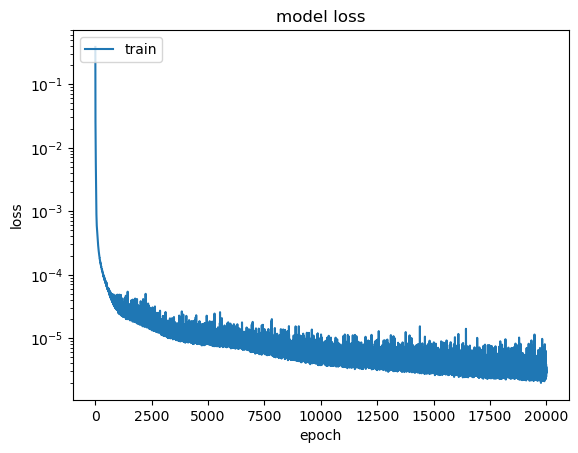

5

Epoch 1/20000
8/8 [==============================] - 8s 30ms/step - loss: 0.9597
Epoch 2/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.1962
Epoch 3/20000
8/8 [==============================] - 0s 26ms/step - loss: 0.1180
Epoch 4/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0688
Epoch 5/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0294
Epoch 6/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0202
Epoch 7/20000
8/8 [==============================] - 0s 22ms/step - loss: 0.0160
Epoch 8/20000
8/8 [==============================] - 0s 13ms/step - loss: 0.0125
Epoch 9/20000
8/8 [==============================] - 0s 23ms/step - loss: 0.0107
Epoch 10/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0094
Epoch 11/20000
8/8 [==============================] - 0s 23ms/step - loss: 0.0083
Epoch 12/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0075
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 30ms/step - loss: 5.6300e-04
Epoch 100/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.5194e-04
Epoch 101/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.4209e-04
Epoch 102/20000
8/8 [==============================] - 0s 31ms/step - loss: 5.3232e-04
Epoch 103/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.2319e-04
Epoch 104/20000
8/8 [==============================] - 0s 24ms/step - loss: 5.1423e-04
Epoch 105/20000
8/8 [==============================] - 0s 16ms/step - loss: 5.0436e-04
Epoch 106/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.9698e-04
Epoch 107/20000
8/8 [==============================] - 0s 23ms/step - loss: 4.8771e-04
Epoch 108/20000
8/8 [==============================] - 0s 21ms/step - loss: 4.8090e-04
Epoch 109/20000
8/8 [==============================] - 0s 19ms/step - loss: 4.7197e-04
Epoch 110/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 15ms/step - loss: 1.9890e-04
Epoch 194/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.9686e-04
Epoch 195/20000
8/8 [==============================] - 0s 24ms/step - loss: 1.9590e-04
Epoch 196/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.9471e-04
Epoch 197/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.9284e-04
Epoch 198/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.9224e-04
Epoch 199/20000
8/8 [==============================] - 0s 36ms/step - loss: 1.9066e-04
Epoch 200/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.8932e-04
Epoch 201/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.8820e-04
Epoch 202/20000
8/8 [==============================] - 0s 33ms/step - loss: 1.8691e-04
Epoch 203/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.8495e-04
Epoch 204/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 17ms/step - loss: 1.1332e-04
Epoch 288/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.1253e-04
Epoch 289/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1285e-04
Epoch 290/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.1160e-04
Epoch 291/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.1146e-04
Epoch 292/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.1048e-04
Epoch 293/20000
8/8 [==============================] - 0s 25ms/step - loss: 1.0968e-04
Epoch 294/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.0965e-04
Epoch 295/20000
8/8 [==============================] - 0s 24ms/step - loss: 1.0963e-04
Epoch 296/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.0902e-04
Epoch 297/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.0779e-04
Epoch 298/20000
8/8 [==============================] - 0s 21

8/8 [==============================] - 0s 19ms/step - loss: 7.2779e-05
Epoch 382/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.2929e-05
Epoch 383/20000
8/8 [==============================] - 0s 23ms/step - loss: 7.2379e-05
Epoch 384/20000
8/8 [==============================] - 0s 24ms/step - loss: 7.2229e-05
Epoch 385/20000
8/8 [==============================] - 0s 17ms/step - loss: 7.2026e-05
Epoch 386/20000
8/8 [==============================] - 0s 15ms/step - loss: 7.1728e-05
Epoch 387/20000
8/8 [==============================] - 0s 24ms/step - loss: 7.1566e-05
Epoch 388/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2172e-05
Epoch 389/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2558e-05
Epoch 390/20000
8/8 [==============================] - 0s 18ms/step - loss: 7.0536e-05
Epoch 391/20000
8/8 [==============================] - 0s 27ms/step - loss: 7.0481e-05
Epoch 392/20000
8/8 [==============================] - 0s 23ms

8/8 [==============================] - 0s 10ms/step - loss: 5.1673e-05
Epoch 476/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1346e-05
Epoch 477/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1103e-05
Epoch 478/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1691e-05
Epoch 479/20000
8/8 [==============================] - 0s 19ms/step - loss: 5.0788e-05
Epoch 480/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0945e-05
Epoch 481/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0911e-05
Epoch 482/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.1285e-05
Epoch 483/20000
8/8 [==============================] - 0s 25ms/step - loss: 4.9985e-05
Epoch 484/20000
8/8 [==============================] - 0s 20ms/step - loss: 4.8883e-05
Epoch 485/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9083e-05
Epoch 486/20000
8/8 [==============================] - 0s 14ms/st

8/8 [==============================] - 0s 6ms/step - loss: 3.8028e-05
Epoch 570/20000
8/8 [==============================] - 0s 20ms/step - loss: 3.6977e-05
Epoch 571/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7238e-05
Epoch 572/20000
8/8 [==============================] - 0s 32ms/step - loss: 3.6787e-05
Epoch 573/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7088e-05
Epoch 574/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7534e-05
Epoch 575/20000
8/8 [==============================] - 0s 43ms/step - loss: 3.6694e-05
Epoch 576/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6714e-05
Epoch 577/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.6559e-05
Epoch 578/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.6377e-05
Epoch 579/20000
8/8 [==============================] - 0s 36ms/step - loss: 3.6221e-05
Epoch 580/20000
8/8 [==============================] - 0s 52ms/s

8/8 [==============================] - 0s 5ms/step - loss: 2.8981e-05
Epoch 664/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9270e-05
Epoch 665/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8934e-05
Epoch 666/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9782e-05
Epoch 667/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0592e-05
Epoch 668/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8868e-05
Epoch 669/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9110e-05
Epoch 670/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0420e-05
Epoch 671/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0548e-05
Epoch 672/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9197e-05
Epoch 673/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8953e-05
Epoch 674/20000
8/8 [==============================] - 0s 8ms/step - 

8/8 [==============================] - 0s 9ms/step - loss: 2.4516e-05
Epoch 759/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3121e-05
Epoch 760/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.2665e-05
Epoch 761/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2703e-05
Epoch 762/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3120e-05
Epoch 763/20000
8/8 [==============================] - 0s 30ms/step - loss: 2.2504e-05
Epoch 764/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.2259e-05
Epoch 765/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3485e-05
Epoch 766/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2467e-05
Epoch 767/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5031e-05
Epoch 768/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2939e-05
Epoch 769/20000
8/8 [==============================] - 0s 9ms/ste

8/8 [==============================] - 0s 8ms/step - loss: 2.5451e-05
Epoch 854/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3681e-05
Epoch 855/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2668e-05
Epoch 856/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0080e-05
Epoch 857/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.9167e-05
Epoch 858/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.9239e-05
Epoch 859/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0911e-05
Epoch 860/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0457e-05
Epoch 861/20000
8/8 [==============================] - 0s 23ms/step - loss: 1.8890e-05
Epoch 862/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9849e-05
Epoch 863/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0137e-05
Epoch 864/20000
8/8 [==============================] - 0s 19ms/ste

8/8 [==============================] - 0s 14ms/step - loss: 1.6874e-05
Epoch 949/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8212e-05
Epoch 950/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.7933e-05
Epoch 951/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7451e-05
Epoch 952/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7571e-05
Epoch 953/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7976e-05
Epoch 954/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7680e-05
Epoch 955/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9017e-05
Epoch 956/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8009e-05
Epoch 957/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.7909e-05
Epoch 958/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7336e-05
Epoch 959/20000
8/8 [==============================] - 0s 8ms/step 

8/8 [==============================] - 0s 9ms/step - loss: 1.8262e-05
Epoch 1043/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.7864e-05
Epoch 1044/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8029e-05
Epoch 1045/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2882e-05
Epoch 1046/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5139e-05
Epoch 1047/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2718e-05
Epoch 1048/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.1353e-05
Epoch 1049/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1285e-05
Epoch 1050/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6187e-05
Epoch 1051/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2755e-05
Epoch 1052/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8326e-05
Epoch 1053/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.7554e-05
Epoch 1137/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6372e-05
Epoch 1138/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2146e-05
Epoch 1139/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9483e-05
Epoch 1140/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3926e-05
Epoch 1141/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9791e-05
Epoch 1142/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5864e-05
Epoch 1143/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8196e-05
Epoch 1144/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0323e-05
Epoch 1145/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5303e-05
Epoch 1146/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1300e-05
Epoch 1147/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 7ms/step - loss: 1.8265e-05
Epoch 1231/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6168e-05
Epoch 1232/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4087e-05
Epoch 1233/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.7594e-05
Epoch 1234/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9297e-05
Epoch 1235/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2538e-05
Epoch 1236/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1659e-05
Epoch 1237/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1930e-05
Epoch 1238/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6205e-05
Epoch 1239/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9461e-05
Epoch 1240/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1783e-05
Epoch 1241/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 2.3276e-05
Epoch 1325/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.4794e-05
Epoch 1326/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5621e-05
Epoch 1327/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7338e-05
Epoch 1328/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3881e-05
Epoch 1329/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9216e-05
Epoch 1330/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2110e-05
Epoch 1331/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.5623e-05
Epoch 1332/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6382e-05
Epoch 1333/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8544e-05
Epoch 1334/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0046e-05
Epoch 1335/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.4377e-05
Epoch 1419/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3910e-05
Epoch 1420/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4522e-05
Epoch 1421/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3892e-05
Epoch 1422/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6257e-05
Epoch 1423/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0599e-05
Epoch 1424/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7151e-05
Epoch 1425/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7878e-05
Epoch 1426/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6649e-05
Epoch 1427/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1261e-05
Epoch 1428/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7166e-05
Epoch 1429/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.5593e-05
Epoch 1513/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5147e-05
Epoch 1514/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.5023e-05
Epoch 1515/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0713e-05
Epoch 1516/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7818e-05
Epoch 1517/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9953e-05
Epoch 1518/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0137e-05
Epoch 1519/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8240e-05
Epoch 1520/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7093e-05
Epoch 1521/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2005e-05
Epoch 1522/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4917e-05
Epoch 1523/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 2.9612e-05
Epoch 1607/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0045e-05
Epoch 1608/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7546e-05
Epoch 1609/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4291e-05
Epoch 1610/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6489e-05
Epoch 1611/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9376e-05
Epoch 1612/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4994e-05
Epoch 1613/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3165e-05
Epoch 1614/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2875e-05
Epoch 1615/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4574e-05
Epoch 1616/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7008e-05
Epoch 1617/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.7712e-05
Epoch 1701/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4971e-05
Epoch 1702/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.2002e-05
Epoch 1703/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3632e-05
Epoch 1704/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3892e-05
Epoch 1705/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4057e-05
Epoch 1706/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4210e-05
Epoch 1707/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2933e-05
Epoch 1708/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3353e-05
Epoch 1709/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3061e-05
Epoch 1710/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2567e-05
Epoch 1711/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 2.7152e-05
Epoch 1795/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.9356e-05
Epoch 1796/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8986e-05
Epoch 1797/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6917e-05
Epoch 1798/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5232e-05
Epoch 1799/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7675e-05
Epoch 1800/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0662e-05
Epoch 1801/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5903e-05
Epoch 1802/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7756e-05
Epoch 1803/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9039e-05
Epoch 1804/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3374e-05
Epoch 1805/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 1.6218e-05
Epoch 1889/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4951e-05
Epoch 1890/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2951e-05
Epoch 1891/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2660e-05
Epoch 1892/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3877e-05
Epoch 1893/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2250e-05
Epoch 1894/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3685e-05
Epoch 1895/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.5347e-05
Epoch 1896/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7549e-05
Epoch 1897/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2873e-05
Epoch 1898/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3168e-05
Epoch 1899/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.4508e-05
Epoch 1983/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4723e-05
Epoch 1984/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6804e-05
Epoch 1985/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.5400e-05
Epoch 1986/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4315e-05
Epoch 1987/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5139e-05
Epoch 1988/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2644e-05
Epoch 1989/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2357e-05
Epoch 1990/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2815e-05
Epoch 1991/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4307e-05
Epoch 1992/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4442e-05
Epoch 1993/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.6175e-05
Epoch 2077/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3560e-05
Epoch 2078/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2244e-05
Epoch 2079/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.5544e-05
Epoch 2080/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4210e-05
Epoch 2081/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4365e-05
Epoch 2082/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0614e-05
Epoch 2083/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3432e-05
Epoch 2084/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3483e-05
Epoch 2085/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2680e-05
Epoch 2086/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1989e-05
Epoch 2087/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.5043e-05
Epoch 2171/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3587e-05
Epoch 2172/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.3417e-05
Epoch 2173/20000
8/8 [==============================] - 0s 24ms/step - loss: 1.1049e-05
Epoch 2174/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1545e-05
Epoch 2175/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5344e-05
Epoch 2176/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9973e-05
Epoch 2177/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5916e-05
Epoch 2178/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1830e-05
Epoch 2179/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2396e-05
Epoch 2180/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2778e-05
Epoch 2181/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 4ms/step - loss: 1.4633e-05
Epoch 2265/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3039e-05
Epoch 2266/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1906e-05
Epoch 2267/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1908e-05
Epoch 2268/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4147e-05
Epoch 2269/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8502e-05
Epoch 2270/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7758e-05
Epoch 2271/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4418e-05
Epoch 2272/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2898e-05
Epoch 2273/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1741e-05
Epoch 2274/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2469e-05
Epoch 2275/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 1.2413e-05
Epoch 2359/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1175e-05
Epoch 2360/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2188e-05
Epoch 2361/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1149e-05
Epoch 2362/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0809e-05
Epoch 2363/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4387e-05
Epoch 2364/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.3797e-05
Epoch 2365/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.3211e-05
Epoch 2366/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1386e-05
Epoch 2367/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2304e-05
Epoch 2368/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.5723e-05
Epoch 2369/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 8ms/step - loss: 1.4829e-05
Epoch 2453/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1385e-05
Epoch 2454/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1662e-05
Epoch 2455/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1734e-05
Epoch 2456/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2219e-05
Epoch 2457/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2033e-05
Epoch 2458/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1493e-05
Epoch 2459/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3185e-05
Epoch 2460/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3081e-05
Epoch 2461/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3404e-05
Epoch 2462/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1463e-05
Epoch 2463/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.3516e-05
Epoch 2547/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4030e-05
Epoch 2548/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9462e-05
Epoch 2549/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8367e-05
Epoch 2550/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5210e-05
Epoch 2551/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1576e-05
Epoch 2552/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0741e-05
Epoch 2553/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1999e-05
Epoch 2554/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3176e-05
Epoch 2555/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7147e-05
Epoch 2556/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3664e-05
Epoch 2557/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 1.4687e-05
Epoch 2641/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5501e-05
Epoch 2642/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2467e-05
Epoch 2643/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1157e-05
Epoch 2644/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0542e-05
Epoch 2645/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1173e-05
Epoch 2646/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2757e-05
Epoch 2647/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1515e-05
Epoch 2648/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1972e-05
Epoch 2649/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3544e-05
Epoch 2650/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3177e-05
Epoch 2651/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.1425e-05
Epoch 2735/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1280e-05
Epoch 2736/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3006e-05
Epoch 2737/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0622e-05
Epoch 2738/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6858e-05
Epoch 2739/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6414e-05
Epoch 2740/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3015e-05
Epoch 2741/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1270e-05
Epoch 2742/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3073e-05
Epoch 2743/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3682e-05
Epoch 2744/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3217e-05
Epoch 2745/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.4153e-05
Epoch 2829/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0606e-05
Epoch 2830/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1360e-05
Epoch 2831/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2661e-05
Epoch 2832/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1423e-05
Epoch 2833/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3409e-05
Epoch 2834/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1080e-05
Epoch 2835/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1326e-05
Epoch 2836/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2048e-05
Epoch 2837/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0248e-05
Epoch 2838/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2312e-05
Epoch 2839/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 1.0622e-05
Epoch 2923/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0172e-05
Epoch 2924/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0936e-05
Epoch 2925/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2720e-05
Epoch 2926/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3821e-05
Epoch 2927/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0423e-05
Epoch 2928/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4566e-05
Epoch 2929/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0474e-05
Epoch 2930/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0781e-05
Epoch 2931/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6378e-05
Epoch 2932/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2588e-05
Epoch 2933/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.2567e-05
Epoch 3017/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2966e-05
Epoch 3018/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3185e-05
Epoch 3019/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2710e-05
Epoch 3020/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1901e-05
Epoch 3021/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1214e-05
Epoch 3022/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2190e-05
Epoch 3023/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1101e-05
Epoch 3024/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2128e-05
Epoch 3025/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0790e-05
Epoch 3026/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1461e-05
Epoch 3027/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 16ms/step - loss: 9.7446e-06
Epoch 3111/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4016e-05
Epoch 3112/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.2783e-05
Epoch 3113/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2679e-05
Epoch 3114/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1493e-05
Epoch 3115/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0233e-05
Epoch 3116/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0461e-05
Epoch 3117/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1237e-05
Epoch 3118/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9306e-06
Epoch 3119/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0196e-05
Epoch 3120/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1273e-05
Epoch 3121/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.1693e-05
Epoch 3205/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0236e-05
Epoch 3206/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0001e-05
Epoch 3207/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0062e-05
Epoch 3208/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2544e-05
Epoch 3209/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1666e-05
Epoch 3210/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.5014e-06
Epoch 3211/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5216e-06
Epoch 3212/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4336e-05
Epoch 3213/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0978e-05
Epoch 3214/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.1438e-05
Epoch 3215/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 1.0438e-05
Epoch 3299/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0285e-05
Epoch 3300/20000
8/8 [==============================] - 0s 15ms/step - loss: 9.4057e-06
Epoch 3301/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.5751e-06
Epoch 3302/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5800e-06
Epoch 3303/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0572e-05
Epoch 3304/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1310e-05
Epoch 3305/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0161e-05
Epoch 3306/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0205e-05
Epoch 3307/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.8119e-06
Epoch 3308/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8106e-06
Epoch 3309/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.1387e-05
Epoch 3393/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1125e-05
Epoch 3394/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.4885e-06
Epoch 3395/20000
8/8 [==============================] - 0s 14ms/step - loss: 8.9411e-06
Epoch 3396/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9375e-06
Epoch 3397/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8746e-06
Epoch 3398/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.7492e-06
Epoch 3399/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9411e-06
Epoch 3400/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.6034e-06
Epoch 3401/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.6015e-06
Epoch 3402/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1158e-05
Epoch 3403/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 1.0158e-05
Epoch 3487/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0892e-05
Epoch 3488/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7995e-06
Epoch 3489/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.4733e-06
Epoch 3490/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8483e-06
Epoch 3491/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.5106e-06
Epoch 3492/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.2579e-06
Epoch 3493/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.4062e-06
Epoch 3494/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0294e-05
Epoch 3495/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7397e-06
Epoch 3496/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.4751e-06
Epoch 3497/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 10ms/step - loss: 1.0485e-05
Epoch 3581/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.5186e-05
Epoch 3582/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4479e-05
Epoch 3583/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1848e-05
Epoch 3584/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0691e-05
Epoch 3585/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2857e-06
Epoch 3586/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1247e-05
Epoch 3587/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.2779e-06
Epoch 3588/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3335e-06
Epoch 3589/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1097e-05
Epoch 3590/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0609e-05
Epoch 3591/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 9.2183e-06
Epoch 3675/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1657e-05
Epoch 3676/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5273e-05
Epoch 3677/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4695e-05
Epoch 3678/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9996e-06
Epoch 3679/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6273e-06
Epoch 3680/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3977e-06
Epoch 3681/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1589e-05
Epoch 3682/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3369e-05
Epoch 3683/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1049e-05
Epoch 3684/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0178e-05
Epoch 3685/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.1226e-05
Epoch 3769/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3863e-05
Epoch 3770/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0829e-05
Epoch 3771/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4283e-05
Epoch 3772/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2920e-05
Epoch 3773/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0014e-05
Epoch 3774/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1429e-05
Epoch 3775/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0940e-05
Epoch 3776/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0821e-05
Epoch 3777/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3863e-06
Epoch 3778/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1073e-05
Epoch 3779/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 8ms/step - loss: 1.5017e-05
Epoch 3863/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1946e-05
Epoch 3864/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2493e-05
Epoch 3865/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4326e-05
Epoch 3866/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0066e-05
Epoch 3867/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1211e-05
Epoch 3868/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2252e-05
Epoch 3869/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0768e-05
Epoch 3870/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4949e-06
Epoch 3871/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0314e-05
Epoch 3872/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0189e-05
Epoch 3873/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 9.3318e-06
Epoch 3957/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0140e-06
Epoch 3958/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9993e-06
Epoch 3959/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0666e-05
Epoch 3960/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1663e-05
Epoch 3961/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0571e-05
Epoch 3962/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6854e-06
Epoch 3963/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.5946e-06
Epoch 3964/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1210e-05
Epoch 3965/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3005e-05
Epoch 3966/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1131e-05
Epoch 3967/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 9.6058e-06
Epoch 4051/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1420e-05
Epoch 4052/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0069e-05
Epoch 4053/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5069e-05
Epoch 4054/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4443e-05
Epoch 4055/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2803e-05
Epoch 4056/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2867e-05
Epoch 4057/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4177e-05
Epoch 4058/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6367e-05
Epoch 4059/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9912e-05
Epoch 4060/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4789e-05
Epoch 4061/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 7ms/step - loss: 1.1104e-05
Epoch 4145/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5458e-06
Epoch 4146/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1408e-05
Epoch 4147/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0405e-05
Epoch 4148/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0321e-05
Epoch 4149/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.7068e-06
Epoch 4150/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5075e-06
Epoch 4151/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0696e-05
Epoch 4152/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1055e-05
Epoch 4153/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0564e-05
Epoch 4154/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6360e-06
Epoch 4155/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.0243e-05
Epoch 4239/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8241e-06
Epoch 4240/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6458e-06
Epoch 4241/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2672e-06
Epoch 4242/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.0425e-05
Epoch 4243/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0821e-05
Epoch 4244/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1505e-05
Epoch 4245/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1512e-05
Epoch 4246/20000
8/8 [==============================] - 0s 12ms/step - loss: 9.4455e-06
Epoch 4247/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2297e-06
Epoch 4248/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8422e-06
Epoch 4249/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 1.0065e-05
Epoch 4333/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6636e-06
Epoch 4334/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0348e-05
Epoch 4335/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0277e-05
Epoch 4336/20000
8/8 [==============================] - 0s 18ms/step - loss: 8.5391e-06
Epoch 4337/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1789e-06
Epoch 4338/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7289e-06
Epoch 4339/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3269e-05
Epoch 4340/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1460e-05
Epoch 4341/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0511e-05
Epoch 4342/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.3049e-06
Epoch 4343/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.0191e-05
Epoch 4427/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9751e-06
Epoch 4428/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8741e-06
Epoch 4429/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.5795e-06
Epoch 4430/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7822e-06
Epoch 4431/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1791e-05
Epoch 4432/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0991e-05
Epoch 4433/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.4370e-06
Epoch 4434/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5471e-06
Epoch 4435/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2309e-06
Epoch 4436/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1614e-05
Epoch 4437/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.0580e-05
Epoch 4521/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1398e-05
Epoch 4522/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3674e-05
Epoch 4523/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1563e-05
Epoch 4524/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1091e-05
Epoch 4525/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2982e-05
Epoch 4526/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6981e-06
Epoch 4527/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7960e-06
Epoch 4528/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2056e-05
Epoch 4529/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2198e-05
Epoch 4530/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6166e-05
Epoch 4531/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 1.0811e-05
Epoch 4615/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7231e-05
Epoch 4616/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4554e-05
Epoch 4617/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0060e-05
Epoch 4618/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0356e-05
Epoch 4619/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1057e-05
Epoch 4620/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1187e-05
Epoch 4621/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.7230e-06
Epoch 4622/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0490e-05
Epoch 4623/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0090e-05
Epoch 4624/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0520e-05
Epoch 4625/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 8.6018e-06
Epoch 4793/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0220e-05
Epoch 4794/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8249e-06
Epoch 4795/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3889e-06
Epoch 4796/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4867e-06
Epoch 4797/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4892e-06
Epoch 4798/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.4260e-06
Epoch 4799/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8225e-06
Epoch 4800/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5235e-06
Epoch 4801/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6231e-06
Epoch 4802/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0098e-05
Epoch 4803/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 10ms/step - loss: 8.6743e-06
Epoch 4887/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.9948e-06
Epoch 4888/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3806e-05
Epoch 4889/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1390e-05
Epoch 4890/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.9865e-06
Epoch 4891/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.7700e-06
Epoch 4892/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8037e-06
Epoch 4893/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5838e-06
Epoch 4894/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3355e-06
Epoch 4895/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.4909e-06
Epoch 4896/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0576e-05
Epoch 4897/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.2273e-05
Epoch 4992/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.9428e-06
Epoch 4993/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7094e-06
Epoch 4994/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0858e-06
Epoch 4995/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7450e-06
Epoch 4996/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1004e-06
Epoch 4997/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.2385e-06
Epoch 4998/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0929e-06
Epoch 4999/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5070e-06
Epoch 5000/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4637e-06
Epoch 5001/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7686e-06
Epoch 5002/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 1.0470e-05
Epoch 5086/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0563e-05
Epoch 5087/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3897e-06
Epoch 5088/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.6556e-06
Epoch 5089/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.2040e-06
Epoch 5106/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.6317e-06
Epoch 5107/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.6240e-06
Epoch 5108/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0260e-06
Epoch 5109/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.4208e-06
Epoch 5110/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5809e-06
Epoch 5111/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.2501e-06
Epoch 5112/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 6ms/step - loss: 8.2931e-06
Epoch 5196/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7295e-06
Epoch 5197/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0201e-05
Epoch 5198/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0847e-05
Epoch 5199/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5610e-06
Epoch 5200/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.7027e-06
Epoch 5201/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7957e-06
Epoch 5202/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6363e-06
Epoch 5203/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6495e-06
Epoch 5204/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.7513e-06
Epoch 5205/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8135e-06
Epoch 5206/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 1.0271e-05
Epoch 5308/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0702e-05
Epoch 5309/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8963e-06
Epoch 5310/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1972e-06
Epoch 5311/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1335e-06
Epoch 5312/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.5331e-06
Epoch 5313/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6042e-06
Epoch 5314/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0698e-05
Epoch 5315/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4796e-06
Epoch 5316/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.8291e-06
Epoch 5317/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5542e-06
Epoch 5318/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 8.8658e-06
Epoch 5402/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0230e-05
Epoch 5403/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4887e-06
Epoch 5404/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0017e-05
Epoch 5405/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3672e-05
Epoch 5406/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7682e-05
Epoch 5407/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4237e-05
Epoch 5408/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1500e-05
Epoch 5409/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0019e-05
Epoch 5410/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0120e-05
Epoch 5411/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3252e-06
Epoch 5412/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.3943e-05
Epoch 5594/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4089e-05
Epoch 5595/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1220e-05
Epoch 5596/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.5632e-06
Epoch 5597/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8094e-06
Epoch 5598/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5186e-06
Epoch 5599/20000
8/8 [==============================] - 0s 15ms/step - loss: 7.3531e-06
Epoch 5600/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.2142e-06
Epoch 5601/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3134e-06
Epoch 5602/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4622e-06
Epoch 5603/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0498e-05
Epoch 5604/20000
8/8 [==============================] - 

8/8 [==============================] - 0s 5ms/step - loss: 8.6298e-06
Epoch 5688/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2630e-06
Epoch 5709/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2372e-06
Epoch 5710/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.5484e-06
Epoch 5711/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.3902e-06
Epoch 5712/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7950e-06
Epoch 5713/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7679e-06
Epoch 5714/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4639e-06
Epoch 5715/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1996e-05
Epoch 5716/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0494e-05
Epoch 5717/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7824e-06
Epoch 5718/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.7666e-06
Epoch 5801/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8576e-06
Epoch 5802/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0787e-05
Epoch 5803/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0179e-05
Epoch 5804/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1894e-05
Epoch 5805/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0249e-05
Epoch 5806/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4921e-06
Epoch 5807/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3937e-06
Epoch 5808/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8632e-06
Epoch 5809/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8405e-06
Epoch 5810/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5285e-06
Epoch 5811/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 6.8669e-06
Epoch 6006/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7582e-06
Epoch 6007/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4181e-06
Epoch 6008/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4212e-06
Epoch 6009/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8383e-06
Epoch 6010/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1743e-06
Epoch 6011/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3051e-06
Epoch 6012/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2372e-06
Epoch 6013/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8748e-06
Epoch 6014/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2112e-06
Epoch 6015/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3444e-06
Epoch 6016/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 7.0132e-06
Epoch 6100/20000
8/8 [==============================] - 0s 14ms/step - loss: 7.2245e-06
Epoch 6101/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4269e-06
Epoch 6102/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7388e-06
Epoch 6103/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3778e-06
Epoch 6104/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7046e-06
Epoch 6105/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3393e-06
Epoch 6106/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1477e-06
Epoch 6107/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0932e-05
Epoch 6108/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1565e-05
Epoch 6109/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2634e-06
Epoch 6110/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 7.9356e-06
Epoch 6194/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1212e-06
Epoch 6195/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3215e-06
Epoch 6196/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1768e-06
Epoch 6197/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9912e-06
Epoch 6198/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5813e-06
Epoch 6199/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1180e-06
Epoch 6200/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7853e-06
Epoch 6201/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5101e-06
Epoch 6202/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0113e-06
Epoch 6203/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.3458e-06
Epoch 6204/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 8.7556e-06
Epoch 6288/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2752e-06
Epoch 6289/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7557e-06
Epoch 6290/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9208e-06
Epoch 6291/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3530e-06
Epoch 6292/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3339e-06
Epoch 6293/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7533e-06
Epoch 6294/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6415e-06
Epoch 6295/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1007e-06
Epoch 6296/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6468e-06
Epoch 6297/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2944e-06
Epoch 6298/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 4ms/step - loss: 6.3760e-06
Epoch 6382/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5117e-06
Epoch 6383/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.8290e-06
Epoch 6384/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7566e-06
Epoch 6385/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.3081e-06
Epoch 6386/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7001e-06
Epoch 6387/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2900e-06
Epoch 6388/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1907e-06
Epoch 6389/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3781e-06
Epoch 6390/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3079e-06
Epoch 6391/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9916e-06
Epoch 6392/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 12ms/step - loss: 6.7080e-06
Epoch 6544/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.7759e-06
Epoch 6545/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7491e-06
Epoch 6546/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9704e-06
Epoch 6547/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.7645e-06
Epoch 6548/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3243e-06
Epoch 6549/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3488e-06
Epoch 6550/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9465e-06
Epoch 6551/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4466e-06
Epoch 6552/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6372e-06
Epoch 6553/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1888e-06
Epoch 6554/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 6.2974e-06
Epoch 6638/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7984e-06
Epoch 6639/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4071e-06
Epoch 6640/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.4953e-06
Epoch 6641/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8139e-06
Epoch 6642/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5397e-06
Epoch 6643/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7922e-06
Epoch 6644/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5998e-06
Epoch 6645/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9106e-06
Epoch 6646/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3353e-06
Epoch 6647/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2387e-06
Epoch 6648/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 6.3054e-06
Epoch 6754/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6048e-06
Epoch 6755/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6521e-06
Epoch 6756/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1832e-06
Epoch 6757/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.1413e-06
Epoch 6758/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7149e-06
Epoch 6759/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4610e-06
Epoch 6760/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3935e-06
Epoch 6761/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8636e-06
Epoch 6762/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3313e-06
Epoch 6763/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3901e-06
Epoch 6764/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 7.0225e-06
Epoch 6848/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9318e-06
Epoch 6849/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9216e-06
Epoch 6850/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9916e-06
Epoch 6851/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1042e-06
Epoch 6852/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6761e-06
Epoch 6853/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.6397e-06
Epoch 6854/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9425e-06
Epoch 6855/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8044e-06
Epoch 6856/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3132e-06
Epoch 6857/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9796e-06
Epoch 6858/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 6.1750e-06
Epoch 6965/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7025e-06
Epoch 6966/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9095e-06
Epoch 6967/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1150e-05
Epoch 6968/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9083e-06
Epoch 6969/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6713e-06
Epoch 6970/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0644e-06
Epoch 6971/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7247e-06
Epoch 6972/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8758e-06
Epoch 6973/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.3294e-06
Epoch 6974/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9879e-06
Epoch 6975/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 9ms/step - loss: 5.3479e-06
Epoch 7090/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0509e-06
Epoch 7091/20000
8/8 [==============================] - 0s 25ms/step - loss: 5.1878e-06
Epoch 7092/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5970e-06
Epoch 7093/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1324e-05
Epoch 7094/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7371e-06
Epoch 7095/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2522e-06
Epoch 7096/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6126e-06
Epoch 7097/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0996e-06
Epoch 7098/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2598e-06
Epoch 7099/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3940e-06
Epoch 7100/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.5587e-06
Epoch 7184/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8481e-06
Epoch 7185/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7680e-06
Epoch 7186/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1812e-06
Epoch 7187/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5519e-06
Epoch 7188/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1915e-05
Epoch 7189/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1672e-06
Epoch 7190/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2188e-06
Epoch 7191/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3333e-06
Epoch 7192/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0202e-06
Epoch 7193/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1630e-06
Epoch 7194/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 6.0022e-06
Epoch 7278/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8291e-06
Epoch 7279/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0063e-06
Epoch 7280/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8302e-06
Epoch 7281/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6453e-06
Epoch 7282/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0089e-06
Epoch 7283/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3754e-06
Epoch 7284/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7090e-06
Epoch 7285/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1910e-06
Epoch 7286/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8835e-06
Epoch 7287/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2452e-06
Epoch 7288/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 8.5946e-06
Epoch 7372/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4799e-06
Epoch 7373/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8164e-06
Epoch 7374/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4056e-06
Epoch 7375/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8745e-06
Epoch 7376/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0816e-06
Epoch 7377/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6723e-06
Epoch 7378/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.3886e-06
Epoch 7379/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4132e-06
Epoch 7380/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3975e-06
Epoch 7381/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2464e-06
Epoch 7382/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 5.5210e-06
Epoch 7466/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.2236e-06
Epoch 7467/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6189e-06
Epoch 7468/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7355e-06
Epoch 7469/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6098e-06
Epoch 7470/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0841e-06
Epoch 7471/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2550e-06
Epoch 7472/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7712e-06
Epoch 7473/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8795e-06
Epoch 7474/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0818e-06
Epoch 7475/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5486e-06
Epoch 7476/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 4.7779e-06
Epoch 7560/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9847e-06
Epoch 7561/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0608e-06
Epoch 7562/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2844e-06
Epoch 7563/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1918e-06
Epoch 7564/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.9811e-06
Epoch 7565/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8782e-06
Epoch 7566/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.3022e-06
Epoch 7567/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.3255e-06
Epoch 7568/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8047e-06
Epoch 7569/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8002e-06
Epoch 7570/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 4ms/step - loss: 8.6574e-06
Epoch 7654/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8697e-06
Epoch 7655/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9654e-06
Epoch 7656/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3288e-06
Epoch 7657/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8250e-06
Epoch 7658/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5388e-06
Epoch 7659/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5593e-06
Epoch 7660/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6881e-06
Epoch 7661/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7405e-06
Epoch 7662/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.0461e-06
Epoch 7663/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5894e-06
Epoch 7664/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.3763e-06
Epoch 7821/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4669e-06
Epoch 7822/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.7897e-06
Epoch 7823/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6448e-06
Epoch 7824/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4321e-06
Epoch 7825/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4457e-06
Epoch 7826/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5741e-06
Epoch 7827/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2811e-06
Epoch 7828/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2002e-06
Epoch 7829/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0537e-06
Epoch 7830/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0057e-06
Epoch 7831/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 6ms/step - loss: 4.7999e-06
Epoch 7915/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3029e-06
Epoch 7916/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2132e-06
Epoch 7917/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0892e-06
Epoch 7918/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8822e-06
Epoch 7919/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7796e-06
Epoch 7920/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5987e-06
Epoch 7921/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1556e-06
Epoch 7922/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0881e-06
Epoch 7923/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5657e-06
Epoch 7924/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2037e-06
Epoch 7925/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 5.4033e-06
Epoch 8009/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7840e-06
Epoch 8010/20000
8/8 [==============================] - 0s 22ms/step - loss: 4.1449e-06
Epoch 8011/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4429e-06
Epoch 8012/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5683e-06
Epoch 8013/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2706e-06
Epoch 8014/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2352e-06
Epoch 8015/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9972e-06
Epoch 8016/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8946e-06
Epoch 8017/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7512e-06
Epoch 8018/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4260e-06
Epoch 8019/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 4.0704e-06
Epoch 8134/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5661e-06
Epoch 8135/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2812e-06
Epoch 8136/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9414e-06
Epoch 8137/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8385e-06
Epoch 8138/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1538e-06
Epoch 8139/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5780e-06
Epoch 8140/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3191e-06
Epoch 8141/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6730e-06
Epoch 8142/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9750e-06
Epoch 8143/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2631e-06
Epoch 8144/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 4.5411e-06
Epoch 8228/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4020e-06
Epoch 8229/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9392e-06
Epoch 8230/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9333e-06
Epoch 8231/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5293e-06
Epoch 8232/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0320e-06
Epoch 8233/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6819e-06
Epoch 8234/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3493e-06
Epoch 8235/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7813e-06
Epoch 8236/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9931e-06
Epoch 8237/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8835e-06
Epoch 8238/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 4.0259e-06
Epoch 8338/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0497e-06
Epoch 8339/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4572e-06
Epoch 8340/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9663e-06
Epoch 8341/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1992e-06
Epoch 8342/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3446e-06
Epoch 8343/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7755e-06
Epoch 8344/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0451e-06
Epoch 8345/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6204e-06
Epoch 8346/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3546e-06
Epoch 8347/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5689e-06
Epoch 8348/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 4.3697e-06
Epoch 8432/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5879e-06
Epoch 8433/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8418e-06
Epoch 8434/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5633e-06
Epoch 8435/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2387e-06
Epoch 8436/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2004e-06
Epoch 8437/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0218e-06
Epoch 8438/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2005e-06
Epoch 8439/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5398e-06
Epoch 8440/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0950e-06
Epoch 8441/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0452e-06
Epoch 8442/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 7ms/step - loss: 3.8086e-06
Epoch 8548/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6419e-06
Epoch 8549/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5869e-06
Epoch 8550/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3556e-06
Epoch 8551/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1783e-06
Epoch 8552/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5488e-06
Epoch 8553/20000
8/8 [==============================] - 0s 24ms/step - loss: 3.3143e-06
Epoch 8554/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6586e-06
Epoch 8555/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5557e-06
Epoch 8556/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6759e-06
Epoch 8557/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1967e-06
Epoch 8558/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 5.6558e-06
Epoch 8648/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0485e-06
Epoch 8649/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2717e-06
Epoch 8650/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6610e-06
Epoch 8651/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8940e-06
Epoch 8652/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8824e-06
Epoch 8653/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7107e-06
Epoch 8654/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4430e-06
Epoch 8655/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8565e-06
Epoch 8656/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.5662e-06
Epoch 8657/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0357e-06
Epoch 8658/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 4.8630e-06
Epoch 8742/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6825e-06
Epoch 8743/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7014e-06
Epoch 8744/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8812e-06
Epoch 8745/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8224e-06
Epoch 8746/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7491e-06
Epoch 8747/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7782e-06
Epoch 8748/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8661e-06
Epoch 8749/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4104e-06
Epoch 8750/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7987e-06
Epoch 8751/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1677e-06
Epoch 8752/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 3.9857e-06
Epoch 8946/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9273e-06
Epoch 8947/20000
8/8 [==============================] - 0s 15ms/step - loss: 4.1505e-06
Epoch 8948/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7170e-06
Epoch 8949/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5958e-06
Epoch 8950/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0364e-06
Epoch 8951/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6051e-06
Epoch 8952/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8323e-06
Epoch 8953/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.0877e-06
Epoch 8954/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8381e-06
Epoch 8955/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8900e-06
Epoch 8956/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 3.5642e-06
Epoch 9040/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0263e-06
Epoch 9041/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8940e-06
Epoch 9042/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.9656e-06
Epoch 9043/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9647e-06
Epoch 9044/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2144e-06
Epoch 9045/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0901e-06
Epoch 9046/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8092e-06
Epoch 9047/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0765e-06
Epoch 9048/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7805e-06
Epoch 9049/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8985e-06
Epoch 9050/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 4.0874e-06
Epoch 9159/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5291e-06
Epoch 9160/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4211e-06
Epoch 9161/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8053e-06
Epoch 9162/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3603e-06
Epoch 9163/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3193e-06
Epoch 9164/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8641e-06
Epoch 9165/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4048e-06
Epoch 9166/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3138e-06
Epoch 9167/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4479e-06
Epoch 9168/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4468e-06
Epoch 9169/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 3.3553e-06
Epoch 9359/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4242e-06
Epoch 9360/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5717e-06
Epoch 9361/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6313e-06
Epoch 9362/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1857e-06
Epoch 9363/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6714e-06
Epoch 9364/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3867e-06
Epoch 9365/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4290e-06
Epoch 9366/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6417e-06
Epoch 9367/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5307e-06
Epoch 9368/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1725e-06
Epoch 9369/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 4.7018e-06
Epoch 9453/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8026e-06
Epoch 9454/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8461e-06
Epoch 9455/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6228e-06
Epoch 9456/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3775e-06
Epoch 9457/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6074e-06
Epoch 9458/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9793e-06
Epoch 9459/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2942e-06
Epoch 9460/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2262e-06
Epoch 9461/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2292e-06
Epoch 9462/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6780e-06
Epoch 9463/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 3.8246e-06
Epoch 9570/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4868e-06
Epoch 9571/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6963e-06
Epoch 9572/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0551e-06
Epoch 9573/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0662e-06
Epoch 9574/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.1229e-06
Epoch 9575/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0818e-06
Epoch 9576/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4630e-06
Epoch 9577/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8730e-06
Epoch 9578/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2652e-06
Epoch 9579/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1741e-06
Epoch 9580/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 3.2782e-06
Epoch 9664/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3845e-06
Epoch 9665/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7699e-06
Epoch 9666/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1382e-06
Epoch 9667/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7043e-06
Epoch 9668/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8139e-06
Epoch 9669/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6824e-06
Epoch 9670/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4543e-06
Epoch 9671/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4496e-06
Epoch 9672/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8511e-06
Epoch 9673/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8992e-06
Epoch 9674/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 6.3686e-06
Epoch 9860/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6957e-06
Epoch 9861/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1263e-06
Epoch 9862/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4352e-06
Epoch 9863/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3437e-06
Epoch 9864/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2502e-06
Epoch 9865/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0347e-06
Epoch 9866/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8250e-06
Epoch 9867/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7511e-06
Epoch 9868/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5789e-06
Epoch 9869/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6204e-06
Epoch 9870/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 2.8722e-06
Epoch 9968/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9756e-06
Epoch 9969/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1590e-06
Epoch 9970/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2775e-06
Epoch 9971/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9783e-06
Epoch 9972/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4363e-06
Epoch 9973/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.0828e-06
Epoch 9974/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9141e-06
Epoch 9975/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6684e-06
Epoch 9976/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1274e-06
Epoch 9977/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9556e-06
Epoch 9978/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 3.4388e-06
Epoch 10061/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4003e-06
Epoch 10062/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4307e-06
Epoch 10063/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1751e-06
Epoch 10064/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6640e-06
Epoch 10065/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4008e-06
Epoch 10066/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5571e-06
Epoch 10067/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5763e-06
Epoch 10068/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5547e-06
Epoch 10069/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1789e-06
Epoch 10070/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6477e-06
Epoch 10071/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.2003e-06
Epoch 10168/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1450e-06
Epoch 10169/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.1667e-06
Epoch 10170/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1803e-06
Epoch 10171/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3440e-06
Epoch 10172/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6666e-06
Epoch 10173/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4014e-06
Epoch 10174/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3586e-06
Epoch 10175/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1018e-06
Epoch 10176/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2585e-06
Epoch 10177/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3677e-06
Epoch 10178/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.7408e-06
Epoch 10261/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1681e-06
Epoch 10262/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2804e-06
Epoch 10263/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7473e-06
Epoch 10264/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5319e-06
Epoch 10265/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2604e-06
Epoch 10266/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6580e-06
Epoch 10267/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5625e-06
Epoch 10268/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9625e-06
Epoch 10269/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9127e-06
Epoch 10270/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6711e-06
Epoch 10271/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 2.9511e-06
Epoch 10449/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0641e-06
Epoch 10450/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9151e-06
Epoch 10451/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8822e-06
Epoch 10452/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9667e-06
Epoch 10453/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7287e-06
Epoch 10454/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3105e-06
Epoch 10455/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7560e-06
Epoch 10456/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0962e-06
Epoch 10457/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1928e-06
Epoch 10458/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.4516e-06
Epoch 10459/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1326e-06
Epoch 10542/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7356e-06
Epoch 10543/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5387e-06
Epoch 10544/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7944e-06
Epoch 10545/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1547e-06
Epoch 10546/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2788e-06
Epoch 10547/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2439e-06
Epoch 10548/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3645e-06
Epoch 10650/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2927e-06
Epoch 10651/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0837e-06
Epoch 10652/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3113e-06
Epoch 10653/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 4.0152e-06
Epoch 10736/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5858e-06
Epoch 10737/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4830e-06
Epoch 10738/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5639e-06
Epoch 10739/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8519e-06
Epoch 10740/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.0705e-06
Epoch 10741/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5481e-06
Epoch 10742/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9840e-06
Epoch 10743/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2337e-06
Epoch 10744/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5593e-06
Epoch 10745/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1628e-06
Epoch 10746/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.2301e-06
Epoch 10843/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0928e-06
Epoch 10844/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9519e-06
Epoch 10845/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0557e-06
Epoch 10846/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2048e-06
Epoch 10847/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3617e-06
Epoch 10848/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3830e-06
Epoch 10849/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2212e-06
Epoch 10850/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5986e-06
Epoch 10851/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7914e-06
Epoch 10852/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4404e-06
Epoch 10853/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5436e-06
Epoch 10936/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7347e-06
Epoch 10937/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0262e-06
Epoch 10938/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2930e-06
Epoch 10939/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2311e-06
Epoch 10940/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7400e-06
Epoch 10941/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0028e-06
Epoch 10942/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1500e-06
Epoch 10943/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6197e-06
Epoch 10944/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.3921e-06
Epoch 10945/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3810e-06
Epoch 10946/20000
8/8 [==========================

8/8 [==============================] - 0s 12ms/step - loss: 4.3728e-06
Epoch 11045/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4271e-06
Epoch 11046/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1638e-06
Epoch 11047/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8060e-06
Epoch 11048/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4514e-06
Epoch 11049/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2691e-06
Epoch 11050/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2776e-06
Epoch 11051/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5799e-06
Epoch 11052/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3329e-06
Epoch 11053/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6030e-06
Epoch 11054/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3116e-06
Epoch 11055/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2698e-06
Epoch 11138/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8606e-06
Epoch 11139/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2373e-06
Epoch 11140/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7213e-06
Epoch 11141/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7672e-06
Epoch 11142/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8224e-06
Epoch 11143/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0803e-06
Epoch 11144/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2745e-06
Epoch 11145/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9353e-06
Epoch 11146/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2537e-06
Epoch 11147/20000
8/8 [==============================] - 0s 19ms/step - loss: 2.5618e-06
Epoch 11148/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 8.3033e-06
Epoch 11334/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.7353e-06
Epoch 11335/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3226e-06
Epoch 11336/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.4205e-06
Epoch 11337/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1663e-06
Epoch 11338/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2736e-06
Epoch 11339/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1374e-06
Epoch 11340/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2801e-06
Epoch 11341/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4026e-06
Epoch 11342/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2318e-06
Epoch 11343/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4392e-06
Epoch 11344/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.5475e-06
Epoch 11439/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2007e-06
Epoch 11440/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8981e-06
Epoch 11441/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1899e-06
Epoch 11442/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8133e-06
Epoch 11443/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6780e-06
Epoch 11444/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7744e-06
Epoch 11445/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4441e-06
Epoch 11446/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5208e-06
Epoch 11447/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2758e-06
Epoch 11448/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2046e-06
Epoch 11449/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.7031e-06
Epoch 11532/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6898e-06
Epoch 11533/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6638e-06
Epoch 11534/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0446e-06
Epoch 11535/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1236e-06
Epoch 11536/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3080e-06
Epoch 11537/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0695e-06
Epoch 11538/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3573e-06
Epoch 11539/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.7554e-06
Epoch 11540/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2387e-06
Epoch 11541/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8895e-06
Epoch 11542/20000
8/8 [========================

8/8 [==============================] - 0s 6ms/step - loss: 2.7000e-06
Epoch 11734/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0716e-06
Epoch 11735/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1334e-06
Epoch 11736/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2558e-06
Epoch 11737/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.1033e-06
Epoch 11738/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8352e-06
Epoch 11739/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9418e-06
Epoch 11740/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6625e-06
Epoch 11741/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6160e-06
Epoch 11742/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1308e-06
Epoch 11743/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0608e-06
Epoch 11744/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.1609e-06
Epoch 11827/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1255e-06
Epoch 11828/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2911e-06
Epoch 11829/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2678e-06
Epoch 11830/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8614e-06
Epoch 11831/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.8192e-06
Epoch 11845/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8352e-06
Epoch 11846/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0055e-06
Epoch 11847/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3819e-06
Epoch 11848/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0392e-06
Epoch 11849/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5300e-06
Epoch 11850/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 4.9075e-06
Epoch 11932/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4859e-06
Epoch 11933/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5352e-06
Epoch 11934/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8542e-06
Epoch 11935/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5227e-06
Epoch 11936/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7773e-06
Epoch 11937/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1007e-06
Epoch 11938/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6489e-06
Epoch 11939/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7629e-06
Epoch 11940/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6930e-06
Epoch 11941/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6368e-06
Epoch 11942/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.8709e-06
Epoch 12123/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0309e-06
Epoch 12124/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8467e-06
Epoch 12125/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8818e-06
Epoch 12126/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3482e-06
Epoch 12127/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7835e-06
Epoch 12128/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5482e-06
Epoch 12129/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5189e-06
Epoch 12130/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6426e-06
Epoch 12131/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5399e-06
Epoch 12132/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0892e-06
Epoch 12133/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 4.2836e-06
Epoch 12216/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5167e-06
Epoch 12217/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6095e-06
Epoch 12218/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9850e-06
Epoch 12219/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.8943e-06
Epoch 12220/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9473e-06
Epoch 12221/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2543e-06
Epoch 12222/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4740e-06
Epoch 12223/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0817e-06
Epoch 12224/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4985e-06
Epoch 12225/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7140e-06
Epoch 12226/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.4201e-06
Epoch 12411/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7808e-06
Epoch 12412/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9567e-06
Epoch 12413/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9194e-06
Epoch 12414/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7151e-06
Epoch 12415/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8900e-06
Epoch 12416/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8820e-06
Epoch 12417/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6070e-06
Epoch 12418/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0169e-06
Epoch 12419/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6483e-06
Epoch 12420/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6083e-06
Epoch 12421/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.4850e-06
Epoch 12504/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3055e-06
Epoch 12505/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9941e-06
Epoch 12506/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4030e-06
Epoch 12507/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2797e-06
Epoch 12508/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7165e-06
Epoch 12509/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8550e-06
Epoch 12510/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9050e-06
Epoch 12511/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9565e-06
Epoch 12533/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7410e-06
Epoch 12534/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3637e-06
Epoch 12535/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 2.9076e-06
Epoch 12618/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7001e-06
Epoch 12619/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2155e-06
Epoch 12620/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3538e-06
Epoch 12621/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2226e-06
Epoch 12622/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2000e-06
Epoch 12623/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5168e-06
Epoch 12624/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4868e-06
Epoch 12625/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0143e-06
Epoch 12626/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3299e-06
Epoch 12627/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9891e-06
Epoch 12628/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.0424e-06
Epoch 12809/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6079e-06
Epoch 12810/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7500e-06
Epoch 12811/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1682e-06
Epoch 12812/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3173e-06
Epoch 12813/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6770e-06
Epoch 12814/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6282e-06
Epoch 12815/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1297e-06
Epoch 12816/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3332e-06
Epoch 12817/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8762e-06
Epoch 12818/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3270e-06
Epoch 12819/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 2.9228e-06
Epoch 12902/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2651e-06
Epoch 12903/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4440e-06
Epoch 12904/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5684e-06
Epoch 12905/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6518e-06
Epoch 12906/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8981e-06
Epoch 12907/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8737e-06
Epoch 12908/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9774e-06
Epoch 12909/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0866e-06
Epoch 12910/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7880e-06
Epoch 12911/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8405e-06
Epoch 12912/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0703e-06
Epoch 13015/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8822e-06
Epoch 13016/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6568e-06
Epoch 13017/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1089e-06
Epoch 13018/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3987e-06
Epoch 13019/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4805e-06
Epoch 13020/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2534e-06
Epoch 13021/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6069e-06
Epoch 13022/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9496e-06
Epoch 13023/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9283e-06
Epoch 13024/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8519e-06
Epoch 13025/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.7251e-06
Epoch 13108/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3307e-06
Epoch 13109/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7987e-06
Epoch 13110/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3681e-06
Epoch 13111/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5294e-06
Epoch 13112/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2861e-06
Epoch 13113/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.2951e-06
Epoch 13114/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7182e-06
Epoch 13115/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9288e-06
Epoch 13116/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8266e-06
Epoch 13117/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0092e-06
Epoch 13118/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4565e-06
Epoch 13305/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2861e-06
Epoch 13306/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2962e-06
Epoch 13307/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2091e-06
Epoch 13308/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8738e-06
Epoch 13309/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2339e-06
Epoch 13310/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4335e-06
Epoch 13311/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9005e-06
Epoch 13312/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5097e-06
Epoch 13313/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4641e-06
Epoch 13314/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5756e-06
Epoch 13315/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.7926e-06
Epoch 13416/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6006e-06
Epoch 13417/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0241e-06
Epoch 13418/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4192e-06
Epoch 13419/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5851e-06
Epoch 13420/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6834e-06
Epoch 13421/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6599e-06
Epoch 13422/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5118e-06
Epoch 13423/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5312e-06
Epoch 13424/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5750e-06
Epoch 13425/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2777e-06
Epoch 13426/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.5426e-06
Epoch 13509/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0713e-06
Epoch 13510/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1359e-06
Epoch 13511/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7917e-06
Epoch 13512/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9182e-06
Epoch 13513/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7976e-06
Epoch 13514/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2482e-06
Epoch 13515/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2069e-06
Epoch 13516/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8643e-06
Epoch 13517/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5773e-06
Epoch 13518/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7356e-06
Epoch 13519/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 2.6620e-06
Epoch 13617/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6884e-06
Epoch 13618/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6286e-06
Epoch 13619/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5085e-06
Epoch 13620/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4716e-06
Epoch 13621/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0838e-06
Epoch 13622/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6385e-06
Epoch 13623/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7325e-06
Epoch 13624/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5202e-06
Epoch 13625/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6874e-06
Epoch 13626/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6472e-06
Epoch 13627/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.6245e-06
Epoch 13710/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6160e-06
Epoch 13711/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9348e-06
Epoch 13712/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5866e-06
Epoch 13713/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7640e-06
Epoch 13714/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7487e-06
Epoch 13715/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2337e-06
Epoch 13716/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0176e-06
Epoch 13717/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3764e-06
Epoch 13718/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8536e-06
Epoch 13719/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1608e-06
Epoch 13720/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.4672e-06
Epoch 13908/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4671e-06
Epoch 13909/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3752e-06
Epoch 13910/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6179e-06
Epoch 13911/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5116e-06
Epoch 13912/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0405e-06
Epoch 13913/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2372e-06
Epoch 13914/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2860e-06
Epoch 13915/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3150e-06
Epoch 13916/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4034e-06
Epoch 13917/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1987e-06
Epoch 13918/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 2.6659e-06
Epoch 14015/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.6956e-06
Epoch 14016/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7091e-06
Epoch 14017/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4279e-06
Epoch 14018/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7625e-06
Epoch 14019/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4075e-06
Epoch 14020/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0358e-06
Epoch 14021/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4220e-06
Epoch 14022/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0027e-06
Epoch 14023/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2111e-06
Epoch 14024/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2832e-06
Epoch 14025/20000
8/8 [========================

8/8 [==============================] - 0s 8ms/step - loss: 2.4606e-06
Epoch 14108/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0840e-06
Epoch 14109/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1892e-06
Epoch 14110/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9632e-06
Epoch 14111/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8627e-06
Epoch 14112/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5818e-06
Epoch 14113/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6655e-06
Epoch 14114/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9481e-06
Epoch 14115/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3591e-06
Epoch 14116/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8147e-06
Epoch 14117/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6453e-06
Epoch 14118/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0653e-06
Epoch 14301/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9509e-06
Epoch 14302/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4365e-06
Epoch 14303/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8800e-06
Epoch 14304/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1632e-06
Epoch 14305/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4977e-06
Epoch 14306/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2606e-06
Epoch 14307/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2757e-06
Epoch 14308/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3707e-06
Epoch 14309/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4454e-06
Epoch 14310/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6925e-06
Epoch 14311/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5979e-06
Epoch 14394/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2713e-06
Epoch 14395/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8187e-06
Epoch 14396/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3892e-06
Epoch 14397/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9861e-06
Epoch 14398/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0627e-06
Epoch 14399/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4044e-06
Epoch 14400/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6130e-06
Epoch 14401/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0952e-06
Epoch 14402/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1946e-06
Epoch 14403/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9912e-06
Epoch 14419/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.3009e-06
Epoch 14501/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6619e-06
Epoch 14502/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6531e-06
Epoch 14503/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3435e-06
Epoch 14504/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3212e-06
Epoch 14505/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2997e-06
Epoch 14506/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6674e-06
Epoch 14507/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4448e-06
Epoch 14508/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4165e-06
Epoch 14509/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7173e-06
Epoch 14510/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6961e-06
Epoch 14511/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 2.6619e-06
Epoch 14705/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4379e-06
Epoch 14706/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3100e-06
Epoch 14707/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9015e-06
Epoch 14708/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4273e-06
Epoch 14709/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5919e-06
Epoch 14710/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9168e-06
Epoch 14711/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7041e-06
Epoch 14712/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5692e-06
Epoch 14713/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1638e-06
Epoch 14714/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6219e-06
Epoch 14715/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 2.6306e-06
Epoch 14798/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2887e-06
Epoch 14799/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3873e-06
Epoch 14800/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1212e-06
Epoch 14801/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2852e-06
Epoch 14802/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4765e-06
Epoch 14803/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2901e-06
Epoch 14804/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2022e-06
Epoch 14805/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8171e-06
Epoch 14806/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.5895e-06
Epoch 14807/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8184e-06
Epoch 14808/20000
8/8 [==========================

8/8 [==============================] - 0s 10ms/step - loss: 3.0050e-06
Epoch 14907/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4939e-06
Epoch 14908/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0141e-06
Epoch 14909/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3955e-06
Epoch 14910/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5089e-06
Epoch 14911/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0290e-06
Epoch 14912/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5434e-06
Epoch 14913/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4062e-06
Epoch 14914/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8265e-06
Epoch 14915/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1196e-06
Epoch 14916/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4626e-06
Epoch 14917/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.4661e-06
Epoch 15000/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6371e-06
Epoch 15001/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4537e-06
Epoch 15002/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7998e-06
Epoch 15003/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5154e-06
Epoch 15004/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4266e-06
Epoch 15005/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2677e-06
Epoch 15006/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0429e-06
Epoch 15007/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3578e-06
Epoch 15008/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5795e-06
Epoch 15009/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0402e-06
Epoch 15010/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 1.9999e-06
Epoch 15189/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0646e-06
Epoch 15190/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2102e-06
Epoch 15191/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3076e-06
Epoch 15192/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4568e-06
Epoch 15193/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5768e-06
Epoch 15194/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6632e-06
Epoch 15195/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1185e-06
Epoch 15196/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8386e-06
Epoch 15197/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3033e-06
Epoch 15198/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4390e-06
Epoch 15199/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.6987e-06
Epoch 15299/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3566e-06
Epoch 15300/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5216e-06
Epoch 15301/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9291e-06
Epoch 15302/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4565e-06
Epoch 15303/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3092e-06
Epoch 15304/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2733e-06
Epoch 15305/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6027e-06
Epoch 15306/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8482e-06
Epoch 15307/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5169e-06
Epoch 15308/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4673e-06
Epoch 15309/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 2.5049e-06
Epoch 15392/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4498e-06
Epoch 15393/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9748e-06
Epoch 15394/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6270e-06
Epoch 15395/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2602e-06
Epoch 15396/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7896e-06
Epoch 15397/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1549e-06
Epoch 15398/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9591e-06
Epoch 15399/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4266e-06
Epoch 15400/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5567e-06
Epoch 15401/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8995e-06
Epoch 15402/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 2.4472e-06
Epoch 15589/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3309e-06
Epoch 15590/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0781e-06
Epoch 15591/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1007e-06
Epoch 15592/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4752e-06
Epoch 15593/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7894e-06
Epoch 15594/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0202e-06
Epoch 15595/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5024e-06
Epoch 15596/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3289e-06
Epoch 15597/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2840e-06
Epoch 15598/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5945e-06
Epoch 15599/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.7979e-06
Epoch 15682/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6933e-06
Epoch 15683/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3120e-06
Epoch 15684/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4610e-06
Epoch 15685/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3931e-06
Epoch 15686/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5373e-06
Epoch 15687/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4093e-06
Epoch 15688/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6060e-06
Epoch 15689/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6834e-06
Epoch 15690/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1126e-06
Epoch 15691/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3188e-06
Epoch 15692/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.4784e-06
Epoch 15797/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8655e-06
Epoch 15798/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7765e-06
Epoch 15799/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6345e-06
Epoch 15800/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4594e-06
Epoch 15801/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7316e-06
Epoch 15802/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2952e-06
Epoch 15803/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5251e-06
Epoch 15804/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4377e-06
Epoch 15805/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2823e-06
Epoch 15806/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3742e-06
Epoch 15807/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.1873e-06
Epoch 15995/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7028e-06
Epoch 15996/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5804e-06
Epoch 15997/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1992e-06
Epoch 15998/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9032e-06
Epoch 15999/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9498e-06
Epoch 16000/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8381e-06
Epoch 16001/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2398e-06
Epoch 16002/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1122e-06
Epoch 16003/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6273e-06
Epoch 16004/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3178e-06
Epoch 16005/20000
8/8 [===========================

8/8 [==============================] - 0s 16ms/step - loss: 1.9458e-06
Epoch 16088/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0535e-06
Epoch 16089/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0664e-06
Epoch 16090/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2789e-06
Epoch 16091/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1618e-06
Epoch 16092/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3258e-06
Epoch 16093/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.4012e-06
Epoch 16094/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6749e-06
Epoch 16095/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5568e-06
Epoch 16096/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3772e-06
Epoch 16097/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1308e-06
Epoch 16098/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 2.8479e-06
Epoch 16200/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8344e-06
Epoch 16201/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1606e-06
Epoch 16202/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0157e-06
Epoch 16203/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8515e-06
Epoch 16204/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7336e-06
Epoch 16205/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7549e-06
Epoch 16206/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6188e-06
Epoch 16207/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8657e-06
Epoch 16208/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.1274e-06
Epoch 16209/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6562e-06
Epoch 16210/20000
8/8 [=========================

8/8 [==============================] - 0s 8ms/step - loss: 2.6349e-06
Epoch 16293/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9027e-06
Epoch 16294/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7483e-06
Epoch 16295/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3651e-06
Epoch 16296/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1602e-06
Epoch 16297/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2721e-06
Epoch 16298/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2016e-06
Epoch 16299/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2648e-06
Epoch 16300/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7243e-06
Epoch 16301/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5530e-06
Epoch 16302/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4997e-06
Epoch 16303/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.1104e-06
Epoch 16404/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6198e-06
Epoch 16405/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0740e-06
Epoch 16406/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4676e-06
Epoch 16407/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5955e-06
Epoch 16408/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8000e-06
Epoch 16409/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.4265e-06
Epoch 16410/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4809e-06
Epoch 16411/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2108e-06
Epoch 16412/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2481e-06
Epoch 16413/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0051e-06
Epoch 16414/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.4242e-06
Epoch 16588/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3984e-06
Epoch 16589/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1625e-06
Epoch 16590/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4714e-06
Epoch 16591/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2117e-06
Epoch 16592/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1204e-06
Epoch 16593/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5432e-06
Epoch 16594/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5314e-06
Epoch 16595/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1092e-06
Epoch 16596/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9799e-06
Epoch 16597/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1480e-06
Epoch 16598/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 3.2555e-06
Epoch 16681/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6198e-06
Epoch 16682/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7004e-06
Epoch 16683/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8322e-06
Epoch 16684/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2094e-06
Epoch 16685/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0372e-06
Epoch 16686/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9762e-06
Epoch 16687/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2531e-06
Epoch 16688/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5009e-06
Epoch 16689/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1548e-06
Epoch 16690/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5810e-06
Epoch 16691/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4268e-06
Epoch 16794/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8122e-06
Epoch 16795/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0315e-06
Epoch 16796/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5572e-06
Epoch 16797/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0850e-06
Epoch 16798/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0317e-06
Epoch 16799/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9553e-06
Epoch 16800/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1019e-06
Epoch 16801/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9433e-06
Epoch 16802/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0582e-06
Epoch 16803/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1187e-06
Epoch 16804/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.7647e-06
Epoch 16887/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0689e-06
Epoch 16888/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2641e-06
Epoch 16889/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9568e-06
Epoch 16890/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7491e-06
Epoch 16891/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8693e-06
Epoch 16892/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5629e-06
Epoch 16893/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6905e-06
Epoch 16894/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3479e-06
Epoch 16895/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5477e-06
Epoch 16896/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2934e-06
Epoch 16897/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.1923e-06
Epoch 16994/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3519e-06
Epoch 16995/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4110e-06
Epoch 16996/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2218e-06
Epoch 16997/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2155e-06
Epoch 16998/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1450e-06
Epoch 16999/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1964e-06
Epoch 17000/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2173e-06
Epoch 17001/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9427e-06
Epoch 17002/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5193e-06
Epoch 17003/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1441e-06
Epoch 17004/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.5822e-06
Epoch 17087/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2082e-06
Epoch 17088/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1899e-06
Epoch 17089/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4794e-06
Epoch 17189/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1889e-06
Epoch 17190/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2981e-06
Epoch 17191/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1796e-06
Epoch 17192/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4741e-06
Epoch 17193/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3511e-06
Epoch 17194/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4126e-06
Epoch 17195/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1064e-06
Epoch 17196/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.1182e-06
Epoch 17279/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3209e-06
Epoch 17280/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2550e-06
Epoch 17281/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0243e-06
Epoch 17282/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0505e-06
Epoch 17283/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5730e-06
Epoch 17284/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9314e-06
Epoch 17285/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1616e-06
Epoch 17286/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5490e-06
Epoch 17287/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2090e-06
Epoch 17288/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4633e-06
Epoch 17289/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.2702e-06
Epoch 17388/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3495e-06
Epoch 17389/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9936e-06
Epoch 17390/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6755e-06
Epoch 17391/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1002e-06
Epoch 17392/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1222e-06
Epoch 17393/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.5780e-06
Epoch 17394/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1084e-06
Epoch 17395/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8963e-06
Epoch 17396/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3784e-06
Epoch 17397/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2073e-06
Epoch 17398/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.4403e-06
Epoch 17481/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1139e-06
Epoch 17482/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1689e-06
Epoch 17483/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5606e-06
Epoch 17484/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0969e-06
Epoch 17485/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6710e-06
Epoch 17486/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4828e-06
Epoch 17487/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5411e-06
Epoch 17488/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1406e-06
Epoch 17489/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.9752e-06
Epoch 17490/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0897e-06
Epoch 17491/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 2.1450e-06
Epoch 17679/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4683e-06
Epoch 17680/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4081e-06
Epoch 17681/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2118e-06
Epoch 17682/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1207e-06
Epoch 17683/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0350e-06
Epoch 17684/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9333e-06
Epoch 17685/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2301e-06
Epoch 17686/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8364e-06
Epoch 17687/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1415e-06
Epoch 17688/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0683e-06
Epoch 17689/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.5849e-06
Epoch 17772/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4426e-06
Epoch 17773/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1860e-06
Epoch 17774/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9554e-06
Epoch 17775/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3290e-06
Epoch 17776/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2766e-06
Epoch 17777/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3340e-06
Epoch 17778/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3922e-06
Epoch 17779/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2820e-06
Epoch 17780/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7380e-06
Epoch 17781/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7955e-06
Epoch 17806/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 2.0407e-06
Epoch 17889/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0510e-06
Epoch 17890/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5177e-06
Epoch 17891/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7749e-06
Epoch 17892/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9392e-06
Epoch 17893/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2600e-06
Epoch 17894/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3432e-06
Epoch 17895/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0916e-06
Epoch 17896/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9053e-06
Epoch 17897/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.7219e-06
Epoch 17898/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3932e-06
Epoch 17899/20000
8/8 [=========================

8/8 [==============================] - 0s 8ms/step - loss: 3.0220e-06
Epoch 18080/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5059e-06
Epoch 18081/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1961e-06
Epoch 18082/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.4738e-06
Epoch 18083/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2734e-06
Epoch 18084/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0838e-06
Epoch 18085/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7855e-06
Epoch 18086/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8741e-06
Epoch 18087/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9205e-06
Epoch 18088/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2396e-06
Epoch 18089/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0117e-06
Epoch 18090/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 1.9320e-06
Epoch 18173/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3004e-06
Epoch 18174/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0768e-06
Epoch 18175/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8681e-06
Epoch 18176/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2234e-06
Epoch 18177/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7272e-06
Epoch 18178/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5375e-06
Epoch 18179/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2392e-06
Epoch 18180/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5265e-06
Epoch 18181/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3847e-06
Epoch 18182/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0168e-06
Epoch 18183/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.1951e-06
Epoch 18280/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5202e-06
Epoch 18281/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2335e-06
Epoch 18282/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2978e-06
Epoch 18283/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2134e-06
Epoch 18284/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2610e-06
Epoch 18285/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4358e-06
Epoch 18286/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1788e-06
Epoch 18287/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0583e-06
Epoch 18288/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7116e-06
Epoch 18289/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3508e-06
Epoch 18290/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.7564e-06
Epoch 18373/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5384e-06
Epoch 18374/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1036e-06
Epoch 18375/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0923e-06
Epoch 18376/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2572e-06
Epoch 18377/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3581e-06
Epoch 18378/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0785e-06
Epoch 18379/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0071e-06
Epoch 18380/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4209e-06
Epoch 18381/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3669e-06
Epoch 18497/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5108e-06
Epoch 18498/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 1.9843e-06
Epoch 18581/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8779e-06
Epoch 18582/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0283e-06
Epoch 18583/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9325e-06
Epoch 18584/20000
8/8 [==============================] - 0s 21ms/step - loss: 2.0690e-06
Epoch 18585/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9985e-06
Epoch 18586/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0672e-06
Epoch 18587/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3836e-06
Epoch 18588/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6340e-06
Epoch 18589/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0560e-06
Epoch 18590/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.6178e-06
Epoch 18591/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 1.8352e-06
Epoch 18688/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0880e-06
Epoch 18689/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0093e-06
Epoch 18690/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5007e-06
Epoch 18691/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0732e-06
Epoch 18692/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1233e-06
Epoch 18693/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2649e-06
Epoch 18694/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3181e-06
Epoch 18695/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0563e-06
Epoch 18696/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2843e-06
Epoch 18697/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5752e-06
Epoch 18698/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5449e-06
Epoch 18781/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4599e-06
Epoch 18782/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5648e-06
Epoch 18783/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5653e-06
Epoch 18784/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1660e-06
Epoch 18785/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3422e-06
Epoch 18786/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2164e-06
Epoch 18787/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9053e-06
Epoch 18788/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7882e-06
Epoch 18789/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9537e-06
Epoch 18790/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9643e-06
Epoch 18791/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.4294e-06
Epoch 18989/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2208e-06
Epoch 18990/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3142e-06
Epoch 18991/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5118e-06
Epoch 18992/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2999e-06
Epoch 18993/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1550e-06
Epoch 18994/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.9696e-06
Epoch 18995/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1194e-06
Epoch 18996/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3929e-06
Epoch 18997/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2808e-06
Epoch 18998/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9670e-06
Epoch 18999/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.3634e-06
Epoch 19082/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8147e-06
Epoch 19083/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4046e-06
Epoch 19084/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4947e-06
Epoch 19085/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3880e-06
Epoch 19086/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0523e-06
Epoch 19087/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7733e-06
Epoch 19088/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7871e-06
Epoch 19089/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1483e-06
Epoch 19090/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5182e-06
Epoch 19091/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2078e-06
Epoch 19092/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 1.6967e-06
Epoch 19197/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.6283e-06
Epoch 19198/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0139e-06
Epoch 19199/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2308e-06
Epoch 19200/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9715e-06
Epoch 19201/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8781e-06
Epoch 19202/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6513e-06
Epoch 19203/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9197e-06
Epoch 19204/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9131e-06
Epoch 19205/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0093e-06
Epoch 19206/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4519e-06
Epoch 19207/20000
8/8 [=======================

8/8 [==============================] - 0s 6ms/step - loss: 2.6993e-06
Epoch 19302/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4641e-06
Epoch 19303/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.4319e-06
Epoch 19304/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0032e-06
Epoch 19305/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7472e-06
Epoch 19306/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8388e-06
Epoch 19307/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.0719e-06
Epoch 19308/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7785e-06
Epoch 19309/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8685e-06
Epoch 19310/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8034e-06
Epoch 19311/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7910e-06
Epoch 19312/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 1.9724e-06
Epoch 19395/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4374e-06
Epoch 19396/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7509e-06
Epoch 19397/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0871e-06
Epoch 19398/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9636e-06
Epoch 19399/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0422e-06
Epoch 19400/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7827e-06
Epoch 19401/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6553e-06
Epoch 19402/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8319e-06
Epoch 19403/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8740e-06
Epoch 19404/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3244e-06
Epoch 19405/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2940e-06
Epoch 19587/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0522e-06
Epoch 19588/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3140e-06
Epoch 19589/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8172e-06
Epoch 19590/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2247e-06
Epoch 19591/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4488e-06
Epoch 19592/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2191e-06
Epoch 19593/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2153e-06
Epoch 19594/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9583e-06
Epoch 19595/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5248e-06
Epoch 19596/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9932e-06
Epoch 19597/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5923e-06
Epoch 19680/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1518e-06
Epoch 19681/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9573e-06
Epoch 19682/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7815e-06
Epoch 19683/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9851e-06
Epoch 19684/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9873e-06
Epoch 19685/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7833e-06
Epoch 19686/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7501e-06
Epoch 19687/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9949e-06
Epoch 19688/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1235e-06
Epoch 19689/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.0428e-06
Epoch 19690/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 2.3418e-06
Epoch 19789/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8495e-06
Epoch 19790/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8992e-06
Epoch 19791/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0079e-06
Epoch 19792/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0870e-06
Epoch 19793/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.1121e-06
Epoch 19794/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5052e-06
Epoch 19795/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0462e-06
Epoch 19796/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4796e-06
Epoch 19797/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8061e-06
Epoch 19798/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7900e-06
Epoch 19799/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 1.7544e-06
Epoch 19991/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9181e-06
Epoch 19992/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9125e-06
Epoch 19993/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6700e-06
Epoch 19994/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6321e-06
Epoch 19995/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7588e-06
Epoch 19996/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1120e-06
Epoch 19997/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.9073e-06
Epoch 19998/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5664e-06
Epoch 19999/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5656e-06
Epoch 20000/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6821e-06


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_5/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_5/assets


Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_20 (Dense)               (None, 10)           350         ['input_6[0][0]',                
                                                                  'concatenate_90[0][0]',         
                                                                  'concatenate_92[0][0]',         
                                                                  'concatenate_94[0][0]',         
                                                                  'concatenate_96[0][0]',         
                                                                  'concatenate_98[0][0]',   

 concatenate_90 (Concatenate)   (None, 34)           0           ['lambda_16[0][0]',              
                                                                  'add_50[0][0]',                 
                                                                  'lambda_17[0][0]']              
                                                                                                  
 add_51 (Add)                   (None, 1)            0           ['dense_23[1][0]',               
                                                                  'lambda_15[1][0]']              
                                                                                                  
 concatenate_92 (Concatenate)   (None, 34)           0           ['lambda_16[1][0]',              
                                                                  'add_51[0][0]',                 
                                                                  'lambda_17[1][0]']              
          

                                                                                                  
 add_59 (Add)                   (None, 1)            0           ['dense_23[9][0]',               
                                                                  'lambda_15[9][0]']              
                                                                                                  
 concatenate_107 (Concatenate)  (None, 10)           0           ['concatenate_105[0][0]',        
                                                                  'add_59[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


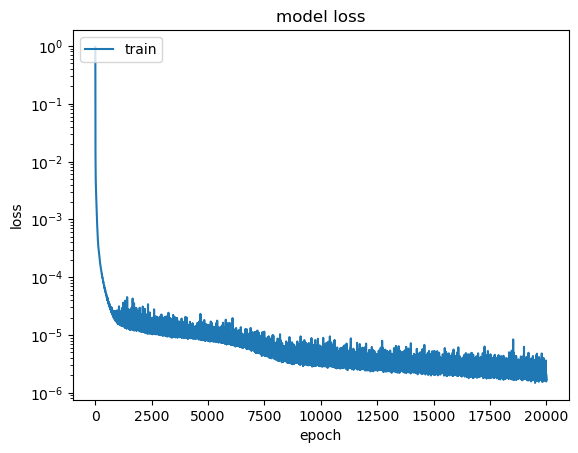

6

Epoch 1/20000
8/8 [==============================] - 8s 32ms/step - loss: 1.8809
Epoch 2/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.4305
Epoch 3/20000
8/8 [==============================] - 0s 25ms/step - loss: 0.2572
Epoch 4/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.1874
Epoch 5/20000
8/8 [==============================] - 0s 35ms/step - loss: 0.1346
Epoch 6/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.1021
Epoch 7/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0802
Epoch 8/20000
8/8 [==============================] - 0s 23ms/step - loss: 0.0644
Epoch 9/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0518
Epoch 10/20000
8/8 [==============================] - 0s 24ms/step - loss: 0.0418
Epoch 11/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0336
Epoch 12/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0274
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 102/20000
8/8 [==============================] - 0s 10ms/step - loss: 0.0014
Epoch 103/20000
8/8 [==============================] - 0s 28ms/step - loss: 0.0014
Epoch 104/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 105/20000
8/8 [==============================] - 0s 24ms/step - loss: 0.0014
Epoch 106/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.0014
Epoch 107/20000
8/8 [==============================] - 0s 13ms/step - loss: 0.0013
Epoch 108/20000
8/8 [==============================] - 0s 26ms/step - loss: 0.0013
Epoch 109/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0013
Epoch 110/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0013
Epoch 111/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.0013
Epoch 112/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0013
Epoch 113/20000
8/8 

8/8 [==============================] - 0s 18ms/step - loss: 5.0297e-04
Epoch 197/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9655e-04
Epoch 198/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9298e-04
Epoch 199/20000
8/8 [==============================] - 0s 34ms/step - loss: 4.8784e-04
Epoch 200/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.8459e-04
Epoch 201/20000
8/8 [==============================] - 0s 31ms/step - loss: 4.7870e-04
Epoch 202/20000
8/8 [==============================] - 0s 28ms/step - loss: 4.7459e-04
Epoch 203/20000
8/8 [==============================] - 0s 17ms/step - loss: 4.7057e-04
Epoch 204/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.6565e-04
Epoch 205/20000
8/8 [==============================] - 0s 29ms/step - loss: 4.6169e-04
Epoch 206/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5743e-04
Epoch 207/20000
8/8 [==============================] - 0s 26m

8/8 [==============================] - 0s 19ms/step - loss: 2.3558e-04
Epoch 291/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3442e-04
Epoch 292/20000
8/8 [==============================] - 0s 22ms/step - loss: 2.3276e-04
Epoch 293/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.3090e-04
Epoch 294/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.2966e-04
Epoch 295/20000
8/8 [==============================] - 0s 31ms/step - loss: 2.2793e-04
Epoch 296/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.2632e-04
Epoch 297/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.2486e-04
Epoch 298/20000
8/8 [==============================] - 0s 21ms/step - loss: 2.2310e-04
Epoch 299/20000
8/8 [==============================] - 0s 19ms/step - loss: 2.2267e-04
Epoch 300/20000
8/8 [==============================] - 0s 21ms/step - loss: 2.2060e-04
Epoch 301/20000
8/8 [==============================] - 0s 2

8/8 [==============================] - 0s 7ms/step - loss: 1.4440e-04
Epoch 385/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.4258e-04
Epoch 386/20000
8/8 [==============================] - 0s 23ms/step - loss: 1.4197e-04
Epoch 387/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4159e-04
Epoch 388/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.4095e-04
Epoch 389/20000
8/8 [==============================] - 0s 30ms/step - loss: 1.4057e-04
Epoch 390/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4007e-04
Epoch 391/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.3943e-04
Epoch 392/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.3899e-04
Epoch 393/20000
8/8 [==============================] - 0s 26ms/step - loss: 1.3876e-04
Epoch 394/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.3823e-04
Epoch 395/20000
8/8 [==============================] - 0s 11m

8/8 [==============================] - 0s 16ms/step - loss: 1.0646e-04
Epoch 479/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0671e-04
Epoch 480/20000
8/8 [==============================] - 0s 26ms/step - loss: 1.0544e-04
Epoch 481/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0546e-04
Epoch 482/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0514e-04
Epoch 483/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0538e-04
Epoch 484/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.0494e-04
Epoch 485/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0461e-04
Epoch 486/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.0409e-04
Epoch 487/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0503e-04
Epoch 488/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0543e-04
Epoch 489/20000
8/8 [==============================] - 0s 8ms/st

8/8 [==============================] - 0s 6ms/step - loss: 8.6247e-05
Epoch 573/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6033e-05
Epoch 574/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6076e-05
Epoch 575/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.4964e-05
Epoch 576/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.5540e-05
Epoch 577/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.5563e-05
Epoch 578/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.4389e-05
Epoch 579/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.4988e-05
Epoch 580/20000
8/8 [==============================] - 0s 14ms/step - loss: 8.4120e-05
Epoch 581/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.4537e-05
Epoch 582/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.4334e-05
Epoch 583/20000
8/8 [==============================] - 0s 5ms/step

8/8 [==============================] - 0s 7ms/step - loss: 7.2191e-05
Epoch 668/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.1391e-05
Epoch 669/20000
8/8 [==============================] - 0s 13ms/step - loss: 7.0474e-05
Epoch 670/20000
8/8 [==============================] - 0s 39ms/step - loss: 7.0425e-05
Epoch 671/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.0145e-05
Epoch 672/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0958e-05
Epoch 673/20000
8/8 [==============================] - 0s 17ms/step - loss: 7.0345e-05
Epoch 674/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.9859e-05
Epoch 675/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0175e-05
Epoch 676/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.9662e-05
Epoch 677/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.0111e-05
Epoch 678/20000
8/8 [==============================] - 0s 6ms/s

8/8 [==============================] - 0s 5ms/step - loss: 6.1096e-05
Epoch 763/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0872e-05
Epoch 764/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2082e-05
Epoch 765/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0543e-05
Epoch 766/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.0255e-05
Epoch 767/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.1371e-05
Epoch 768/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4933e-05
Epoch 769/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4646e-05
Epoch 770/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.9513e-05
Epoch 771/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0453e-05
Epoch 772/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.1935e-05
Epoch 773/20000
8/8 [==============================] - 0s 7ms/step

8/8 [==============================] - 0s 6ms/step - loss: 5.3001e-05
Epoch 858/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3072e-05
Epoch 859/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2692e-05
Epoch 860/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.0575e-05
Epoch 861/20000
8/8 [==============================] - 0s 28ms/step - loss: 5.0450e-05
Epoch 862/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3652e-05
Epoch 863/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4847e-05
Epoch 864/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2108e-05
Epoch 865/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.0780e-05
Epoch 866/20000
8/8 [==============================] - 0s 16ms/step - loss: 4.9744e-05
Epoch 867/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1383e-05
Epoch 868/20000
8/8 [==============================] - 0s 8ms/step 

8/8 [==============================] - 0s 5ms/step - loss: 4.6429e-05
Epoch 953/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3925e-05
Epoch 954/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4746e-05
Epoch 955/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5727e-05
Epoch 956/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4585e-05
Epoch 957/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.3161e-05
Epoch 958/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3238e-05
Epoch 959/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3174e-05
Epoch 960/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6833e-05
Epoch 961/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9830e-05
Epoch 962/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3414e-05
Epoch 963/20000
8/8 [==============================] - 0s 4ms/step - 

8/8 [==============================] - 0s 9ms/step - loss: 3.9489e-05
Epoch 1047/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3533e-05
Epoch 1048/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8604e-05
Epoch 1049/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4428e-05
Epoch 1050/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.5163e-05
Epoch 1051/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4925e-05
Epoch 1052/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7584e-05
Epoch 1053/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0588e-05
Epoch 1054/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.7722e-05
Epoch 1055/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8584e-05
Epoch 1056/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9232e-05
Epoch 1057/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 3.5163e-05
Epoch 1141/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4373e-05
Epoch 1142/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4278e-05
Epoch 1143/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9061e-05
Epoch 1144/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2033e-05
Epoch 1145/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8112e-05
Epoch 1146/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4942e-05
Epoch 1147/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7951e-05
Epoch 1148/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6536e-05
Epoch 1149/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5278e-05
Epoch 1150/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4159e-05
Epoch 1151/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 3.3125e-05
Epoch 1235/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7770e-05
Epoch 1236/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2189e-05
Epoch 1237/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2005e-05
Epoch 1238/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8046e-05
Epoch 1239/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4321e-05
Epoch 1240/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8372e-05
Epoch 1241/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.5509e-05
Epoch 1242/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.0535e-05
Epoch 1243/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4204e-05
Epoch 1244/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0700e-05
Epoch 1245/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 2.9714e-05
Epoch 1329/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5825e-05
Epoch 1330/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9735e-05
Epoch 1331/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7807e-05
Epoch 1332/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.3578e-05
Epoch 1333/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5602e-05
Epoch 1334/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1272e-05
Epoch 1335/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9531e-05
Epoch 1336/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8570e-05
Epoch 1337/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2511e-05
Epoch 1338/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2043e-05
Epoch 1339/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 8ms/step - loss: 2.7473e-05
Epoch 1423/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9638e-05
Epoch 1424/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9275e-05
Epoch 1425/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8140e-05
Epoch 1426/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8590e-05
Epoch 1427/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9386e-05
Epoch 1428/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0957e-05
Epoch 1429/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9213e-05
Epoch 1430/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9848e-05
Epoch 1431/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8300e-05
Epoch 1432/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0709e-05
Epoch 1433/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 3.7939e-05
Epoch 1517/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5992e-05
Epoch 1518/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1541e-05
Epoch 1519/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9558e-05
Epoch 1520/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0195e-05
Epoch 1521/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7388e-05
Epoch 1522/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9492e-05
Epoch 1523/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7564e-05
Epoch 1524/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6696e-05
Epoch 1525/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6227e-05
Epoch 1526/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.4737e-05
Epoch 1527/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 2.9293e-05
Epoch 1611/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6358e-05
Epoch 1612/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7178e-05
Epoch 1613/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1819e-05
Epoch 1614/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1494e-05
Epoch 1615/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0328e-05
Epoch 1616/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8717e-05
Epoch 1617/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7200e-05
Epoch 1618/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5582e-05
Epoch 1619/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5932e-05
Epoch 1620/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7796e-05
Epoch 1621/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 2.8081e-05
Epoch 1705/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5390e-05
Epoch 1706/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5737e-05
Epoch 1707/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4885e-05
Epoch 1708/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5617e-05
Epoch 1709/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9507e-05
Epoch 1710/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9768e-05
Epoch 1711/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7682e-05
Epoch 1712/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3079e-05
Epoch 1713/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3895e-05
Epoch 1714/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4629e-05
Epoch 1715/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 4.2922e-05
Epoch 1799/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7702e-05
Epoch 1800/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4723e-05
Epoch 1801/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3323e-05
Epoch 1802/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5209e-05
Epoch 1803/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6243e-05
Epoch 1804/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6790e-05
Epoch 1805/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4098e-05
Epoch 1806/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5838e-05
Epoch 1807/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6769e-05
Epoch 1808/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5288e-05
Epoch 1809/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 2.7842e-05
Epoch 1893/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4783e-05
Epoch 1894/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3390e-05
Epoch 1895/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2645e-05
Epoch 1896/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3543e-05
Epoch 1897/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.1298e-05
Epoch 1898/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0991e-05
Epoch 1899/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2779e-05
Epoch 1900/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5458e-05
Epoch 1901/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9633e-05
Epoch 1902/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5002e-05
Epoch 1903/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 2.7375e-05
Epoch 1987/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6695e-05
Epoch 1988/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4672e-05
Epoch 1989/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3012e-05
Epoch 1990/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0965e-05
Epoch 1991/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.1488e-05
Epoch 1992/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2390e-05
Epoch 1993/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7482e-05
Epoch 1994/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0016e-05
Epoch 1995/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8008e-05
Epoch 1996/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3459e-05
Epoch 1997/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 2.3946e-05
Epoch 2081/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5100e-05
Epoch 2082/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2944e-05
Epoch 2083/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9477e-05
Epoch 2084/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0187e-05
Epoch 2085/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0471e-05
Epoch 2086/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0686e-05
Epoch 2087/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5800e-05
Epoch 2088/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8944e-05
Epoch 2089/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7024e-05
Epoch 2090/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8804e-05
Epoch 2091/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 2.3257e-05
Epoch 2175/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1212e-05
Epoch 2176/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4184e-05
Epoch 2177/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1261e-05
Epoch 2178/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6961e-05
Epoch 2179/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1019e-05
Epoch 2180/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1091e-05
Epoch 2181/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3932e-05
Epoch 2182/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.6804e-05
Epoch 2183/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1397e-05
Epoch 2184/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4358e-05
Epoch 2185/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 2.0642e-05
Epoch 2269/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4456e-05
Epoch 2270/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.3498e-05
Epoch 2271/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5741e-05
Epoch 2272/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6472e-05
Epoch 2273/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7070e-05
Epoch 2274/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3073e-05
Epoch 2275/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0789e-05
Epoch 2276/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1527e-05
Epoch 2277/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1657e-05
Epoch 2278/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4374e-05
Epoch 2279/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 2.4437e-05
Epoch 2363/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1024e-05
Epoch 2364/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2602e-05
Epoch 2365/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3872e-05
Epoch 2366/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6732e-05
Epoch 2367/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5790e-05
Epoch 2368/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6135e-05
Epoch 2369/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7498e-05
Epoch 2370/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3541e-05
Epoch 2371/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2017e-05
Epoch 2372/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2372e-05
Epoch 2373/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 2.4640e-05
Epoch 2457/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2037e-05
Epoch 2458/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5885e-05
Epoch 2459/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5570e-05
Epoch 2460/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4162e-05
Epoch 2461/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8151e-05
Epoch 2462/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.3294e-05
Epoch 2463/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.9418e-05
Epoch 2464/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0186e-05
Epoch 2465/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9104e-05
Epoch 2466/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8976e-05
Epoch 2467/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 2.4531e-05
Epoch 2551/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2717e-05
Epoch 2552/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1015e-05
Epoch 2553/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2711e-05
Epoch 2554/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2308e-05
Epoch 2555/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8535e-05
Epoch 2556/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4072e-05
Epoch 2557/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1312e-05
Epoch 2558/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1055e-05
Epoch 2559/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0119e-05
Epoch 2560/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9839e-05
Epoch 2561/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 2.0184e-05
Epoch 2645/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0425e-05
Epoch 2646/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1904e-05
Epoch 2647/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0830e-05
Epoch 2648/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9400e-05
Epoch 2649/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2008e-05
Epoch 2650/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0177e-05
Epoch 2651/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8998e-05
Epoch 2652/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2064e-05
Epoch 2653/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9746e-05
Epoch 2654/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8672e-05
Epoch 2655/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 2.6569e-05
Epoch 2739/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7556e-05
Epoch 2740/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6335e-05
Epoch 2741/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2081e-05
Epoch 2742/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0427e-05
Epoch 2743/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1872e-05
Epoch 2744/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9837e-05
Epoch 2745/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9443e-05
Epoch 2746/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.9533e-05
Epoch 2747/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8522e-05
Epoch 2748/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.7842e-05
Epoch 2749/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.1508e-05
Epoch 2833/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9978e-05
Epoch 2834/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.1602e-05
Epoch 2835/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6681e-05
Epoch 2836/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.4086e-05
Epoch 2837/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3001e-05
Epoch 2838/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0577e-05
Epoch 2839/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0543e-05
Epoch 2840/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9454e-05
Epoch 2841/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1584e-05
Epoch 2842/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5785e-05
Epoch 2843/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 11ms/step - loss: 1.9375e-05
Epoch 2927/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.6600e-05
Epoch 2928/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7576e-05
Epoch 2929/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7134e-05
Epoch 2930/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9651e-05
Epoch 2931/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.7007e-05
Epoch 2932/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7224e-05
Epoch 2933/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0500e-05
Epoch 2934/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9186e-05
Epoch 2935/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.9040e-05
Epoch 2936/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3804e-05
Epoch 2937/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 5ms/step - loss: 2.2672e-05
Epoch 3021/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9010e-05
Epoch 3022/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8150e-05
Epoch 3023/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.6937e-05
Epoch 3024/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7584e-05
Epoch 3025/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1586e-05
Epoch 3026/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8762e-05
Epoch 3027/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2589e-05
Epoch 3028/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0335e-05
Epoch 3029/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3335e-05
Epoch 3030/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8281e-05
Epoch 3031/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.9798e-05
Epoch 3115/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1877e-05
Epoch 3116/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5227e-05
Epoch 3117/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9865e-05
Epoch 3118/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1324e-05
Epoch 3119/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2516e-05
Epoch 3120/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8434e-05
Epoch 3121/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7490e-05
Epoch 3122/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3772e-05
Epoch 3123/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5152e-05
Epoch 3124/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4597e-05
Epoch 3125/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 2.1608e-05
Epoch 3209/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7984e-05
Epoch 3210/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6247e-05
Epoch 3211/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5323e-05
Epoch 3212/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8390e-05
Epoch 3213/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7427e-05
Epoch 3214/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8183e-05
Epoch 3215/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9747e-05
Epoch 3216/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1755e-05
Epoch 3217/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2624e-05
Epoch 3218/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9007e-05
Epoch 3219/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 2.2640e-05
Epoch 3303/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3470e-05
Epoch 3304/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3967e-05
Epoch 3305/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6208e-05
Epoch 3306/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1794e-05
Epoch 3307/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7282e-05
Epoch 3308/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.9717e-05
Epoch 3309/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3002e-05
Epoch 3310/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0783e-05
Epoch 3311/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7526e-05
Epoch 3312/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9865e-05
Epoch 3313/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 10ms/step - loss: 1.6728e-05
Epoch 3397/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7214e-05
Epoch 3398/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7853e-05
Epoch 3399/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7112e-05
Epoch 3400/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1729e-05
Epoch 3401/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7696e-05
Epoch 3402/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9675e-05
Epoch 3403/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.6184e-05
Epoch 3404/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8904e-05
Epoch 3405/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8338e-05
Epoch 3406/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8615e-05
Epoch 3407/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.7294e-05
Epoch 3491/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7497e-05
Epoch 3492/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0978e-05
Epoch 3493/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0581e-05
Epoch 3494/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.9392e-05
Epoch 3495/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2822e-05
Epoch 3496/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.2076e-05
Epoch 3497/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8828e-05
Epoch 3498/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2591e-05
Epoch 3499/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6822e-05
Epoch 3500/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6373e-05
Epoch 3501/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 2.3801e-05
Epoch 3585/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7505e-05
Epoch 3586/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2464e-05
Epoch 3587/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0330e-05
Epoch 3588/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7327e-05
Epoch 3589/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8858e-05
Epoch 3590/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1435e-05
Epoch 3591/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8821e-05
Epoch 3592/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9645e-05
Epoch 3593/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.7318e-05
Epoch 3594/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8109e-05
Epoch 3595/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.9156e-05
Epoch 3679/20000
8/8 [==============================] - 0s 19ms/step - loss: 1.6726e-05
Epoch 3680/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7396e-05
Epoch 3681/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2389e-05
Epoch 3682/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3382e-05
Epoch 3683/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5250e-05
Epoch 3684/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9890e-05
Epoch 3685/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9020e-05
Epoch 3686/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9797e-05
Epoch 3687/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1635e-05
Epoch 3688/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2047e-05
Epoch 3689/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.7894e-05
Epoch 3773/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8657e-05
Epoch 3774/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8204e-05
Epoch 3775/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.5338e-05
Epoch 3776/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6749e-05
Epoch 3777/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9228e-05
Epoch 3778/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6636e-05
Epoch 3779/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9821e-05
Epoch 3780/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0324e-05
Epoch 3781/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5274e-05
Epoch 3782/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.4867e-05
Epoch 3783/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.6495e-05
Epoch 3867/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8245e-05
Epoch 3868/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6860e-05
Epoch 3869/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4546e-05
Epoch 3870/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9206e-05
Epoch 3871/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7079e-05
Epoch 3872/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9456e-05
Epoch 3873/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5169e-05
Epoch 3874/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5226e-05
Epoch 3875/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5771e-05
Epoch 3876/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7184e-05
Epoch 3877/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.7140e-05
Epoch 3961/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4197e-05
Epoch 3962/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4300e-05
Epoch 3963/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6661e-05
Epoch 3964/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7018e-05
Epoch 3965/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9651e-05
Epoch 3966/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2630e-05
Epoch 3967/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8623e-05
Epoch 3968/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1278e-05
Epoch 3969/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0249e-05
Epoch 3970/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4874e-05
Epoch 3971/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.5433e-05
Epoch 4055/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5162e-05
Epoch 4056/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7181e-05
Epoch 4057/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8185e-05
Epoch 4058/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8331e-05
Epoch 4059/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9729e-05
Epoch 4060/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9834e-05
Epoch 4061/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5588e-05
Epoch 4062/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4369e-05
Epoch 4063/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6037e-05
Epoch 4064/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5193e-05
Epoch 4065/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 2.2110e-05
Epoch 4149/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6189e-05
Epoch 4150/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2058e-05
Epoch 4151/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.8296e-05
Epoch 4152/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8180e-05
Epoch 4153/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6298e-05
Epoch 4154/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0789e-05
Epoch 4155/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6951e-05
Epoch 4156/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5633e-05
Epoch 4157/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6526e-05
Epoch 4158/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8013e-05
Epoch 4159/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.5968e-05
Epoch 4243/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4758e-05
Epoch 4244/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4954e-05
Epoch 4245/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5830e-05
Epoch 4246/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5836e-05
Epoch 4247/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6271e-05
Epoch 4248/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9003e-05
Epoch 4249/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9681e-05
Epoch 4250/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1280e-05
Epoch 4251/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7446e-05
Epoch 4252/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6431e-05
Epoch 4253/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.9990e-05
Epoch 4337/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0110e-05
Epoch 4338/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4709e-05
Epoch 4339/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4119e-05
Epoch 4340/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5053e-05
Epoch 4341/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8046e-05
Epoch 4342/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5476e-05
Epoch 4343/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6255e-05
Epoch 4344/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7484e-05
Epoch 4345/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1661e-05
Epoch 4346/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4441e-05
Epoch 4347/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.7309e-05
Epoch 4431/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6289e-05
Epoch 4432/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6992e-05
Epoch 4433/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6596e-05
Epoch 4434/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1530e-05
Epoch 4435/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1864e-05
Epoch 4436/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4535e-05
Epoch 4437/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5133e-05
Epoch 4438/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7271e-05
Epoch 4439/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7478e-05
Epoch 4440/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0180e-05
Epoch 4441/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 2.0986e-05
Epoch 4525/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3966e-05
Epoch 4526/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6955e-05
Epoch 4527/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6521e-05
Epoch 4528/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9112e-05
Epoch 4529/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4516e-05
Epoch 4530/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3683e-05
Epoch 4531/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4328e-05
Epoch 4532/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0876e-05
Epoch 4533/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3400e-05
Epoch 4534/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2567e-05
Epoch 4535/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 2.7895e-05
Epoch 4619/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7791e-05
Epoch 4620/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1707e-05
Epoch 4621/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8728e-05
Epoch 4622/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5411e-05
Epoch 4623/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9121e-05
Epoch 4624/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0699e-05
Epoch 4625/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7818e-05
Epoch 4626/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8331e-05
Epoch 4627/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6328e-05
Epoch 4628/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4704e-05
Epoch 4629/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.5732e-05
Epoch 4713/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6326e-05
Epoch 4714/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7000e-05
Epoch 4715/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8684e-05
Epoch 4716/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7265e-05
Epoch 4717/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4645e-05
Epoch 4718/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4828e-05
Epoch 4719/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.5722e-05
Epoch 4720/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5214e-05
Epoch 4721/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.6931e-05
Epoch 4722/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3418e-05
Epoch 4723/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 1.9422e-05
Epoch 4807/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8793e-05
Epoch 4808/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4174e-05
Epoch 4809/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3959e-05
Epoch 4810/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6615e-05
Epoch 4811/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7423e-05
Epoch 4812/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6268e-05
Epoch 4813/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4504e-05
Epoch 4814/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4679e-05
Epoch 4815/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7680e-05
Epoch 4816/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3910e-05
Epoch 4817/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 5ms/step - loss: 2.1085e-05
Epoch 4901/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9480e-05
Epoch 4902/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6798e-05
Epoch 4903/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4626e-05
Epoch 4904/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4262e-05
Epoch 4905/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3947e-05
Epoch 4906/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4575e-05
Epoch 4907/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5267e-05
Epoch 4908/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4608e-05
Epoch 4909/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3793e-05
Epoch 4910/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3850e-05
Epoch 4911/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 2.0143e-05
Epoch 4995/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1252e-05
Epoch 4996/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5961e-05
Epoch 4997/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5188e-05
Epoch 4998/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5873e-05
Epoch 4999/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6262e-05
Epoch 5000/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7230e-05
Epoch 5001/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5534e-05
Epoch 5002/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.9333e-05
Epoch 5003/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5910e-05
Epoch 5004/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4257e-05
Epoch 5005/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.7172e-05
Epoch 5089/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5885e-05
Epoch 5090/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4681e-05
Epoch 5091/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3133e-05
Epoch 5092/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2495e-05
Epoch 5093/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2662e-05
Epoch 5094/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4041e-05
Epoch 5095/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3431e-05
Epoch 5096/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4346e-05
Epoch 5097/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2063e-05
Epoch 5098/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3297e-05
Epoch 5099/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.3325e-05
Epoch 5196/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3613e-05
Epoch 5197/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4274e-05
Epoch 5198/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3280e-05
Epoch 5199/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4944e-05
Epoch 5200/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5920e-05
Epoch 5201/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3919e-05
Epoch 5202/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4828e-05
Epoch 5203/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5906e-05
Epoch 5204/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6443e-05
Epoch 5205/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.4263e-05
Epoch 5206/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 10ms/step - loss: 2.2970e-05
Epoch 5290/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4887e-05
Epoch 5291/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4545e-05
Epoch 5292/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3056e-05
Epoch 5293/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4270e-05
Epoch 5294/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5492e-05
Epoch 5295/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4254e-05
Epoch 5296/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5935e-05
Epoch 5297/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5620e-05
Epoch 5298/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0685e-05
Epoch 5299/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7234e-05
Epoch 5300/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.6304e-05
Epoch 5499/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2386e-05
Epoch 5500/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5709e-05
Epoch 5501/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4992e-05
Epoch 5502/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4410e-05
Epoch 5503/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2999e-05
Epoch 5504/20000
8/8 [==============================] - 0s 22ms/step - loss: 1.2013e-05
Epoch 5505/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3176e-05
Epoch 5506/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4711e-05
Epoch 5507/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2307e-05
Epoch 5508/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3593e-05
Epoch 5509/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 10ms/step - loss: 1.5619e-05
Epoch 5593/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4386e-05
Epoch 5594/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3822e-05
Epoch 5595/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3318e-05
Epoch 5596/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.1615e-05
Epoch 5597/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4580e-05
Epoch 5598/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0043e-05
Epoch 5599/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7900e-05
Epoch 5600/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7888e-05
Epoch 5601/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2366e-05
Epoch 5602/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.1236e-05
Epoch 5603/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 7ms/step - loss: 1.5286e-05
Epoch 5710/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4059e-05
Epoch 5711/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.3927e-05
Epoch 5712/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2888e-05
Epoch 5713/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3697e-05
Epoch 5714/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2798e-05
Epoch 5715/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3599e-05
Epoch 5716/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5422e-05
Epoch 5717/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7922e-05
Epoch 5718/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.0130e-05
Epoch 5719/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4553e-05
Epoch 5720/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 10ms/step - loss: 1.1811e-05
Epoch 5926/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3144e-05
Epoch 5927/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2159e-05
Epoch 5928/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2866e-05
Epoch 5929/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2444e-05
Epoch 5930/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2852e-05
Epoch 5931/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3955e-05
Epoch 5932/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5538e-05
Epoch 5933/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1886e-05
Epoch 5934/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3959e-05
Epoch 5935/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6768e-05
Epoch 5936/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 2.7496e-05
Epoch 6020/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4622e-05
Epoch 6021/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6627e-05
Epoch 6022/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.9257e-05
Epoch 6023/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2762e-05
Epoch 6024/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4674e-05
Epoch 6025/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3841e-05
Epoch 6026/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7643e-05
Epoch 6027/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5933e-05
Epoch 6028/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2653e-05
Epoch 6029/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2406e-05
Epoch 6030/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 2.1386e-05
Epoch 6140/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8431e-05
Epoch 6141/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3425e-05
Epoch 6142/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.5076e-05
Epoch 6143/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5138e-05
Epoch 6144/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3279e-05
Epoch 6145/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1205e-05
Epoch 6146/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.4923e-05
Epoch 6147/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2510e-05
Epoch 6148/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6017e-05
Epoch 6149/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2881e-05
Epoch 6150/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.2029e-05
Epoch 6234/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2008e-05
Epoch 6235/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1152e-05
Epoch 6236/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1696e-05
Epoch 6237/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4220e-05
Epoch 6238/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4019e-05
Epoch 6239/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1853e-05
Epoch 6240/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4027e-05
Epoch 6241/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3163e-05
Epoch 6242/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5290e-05
Epoch 6243/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3854e-05
Epoch 6244/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.5093e-05
Epoch 6371/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1655e-05
Epoch 6372/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3324e-05
Epoch 6373/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0794e-05
Epoch 6374/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0567e-05
Epoch 6375/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2738e-05
Epoch 6376/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4707e-05
Epoch 6377/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4008e-05
Epoch 6378/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5651e-05
Epoch 6379/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3654e-05
Epoch 6380/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2059e-05
Epoch 6381/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.1637e-05
Epoch 6515/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3153e-05
Epoch 6516/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3508e-05
Epoch 6517/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7733e-05
Epoch 6518/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5543e-05
Epoch 6519/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6851e-05
Epoch 6520/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6708e-05
Epoch 6521/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3550e-05
Epoch 6522/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4892e-05
Epoch 6523/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.2677e-05
Epoch 6524/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3687e-05
Epoch 6525/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.1946e-05
Epoch 6609/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2266e-05
Epoch 6610/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0805e-05
Epoch 6611/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1831e-05
Epoch 6612/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2587e-05
Epoch 6613/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1352e-05
Epoch 6614/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2013e-05
Epoch 6615/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6113e-05
Epoch 6616/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3148e-05
Epoch 6617/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3958e-05
Epoch 6618/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2662e-05
Epoch 6619/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.1596e-05
Epoch 6746/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4646e-05
Epoch 6747/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1598e-05
Epoch 6748/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0009e-05
Epoch 6749/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0906e-05
Epoch 6750/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3389e-05
Epoch 6751/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8545e-05
Epoch 6752/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4639e-05
Epoch 6753/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3605e-05
Epoch 6754/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0457e-05
Epoch 6755/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0055e-05
Epoch 6756/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 9.9771e-06
Epoch 6840/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0879e-05
Epoch 6841/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5643e-05
Epoch 6842/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2696e-05
Epoch 6843/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9532e-05
Epoch 6844/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.6710e-05
Epoch 6845/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2250e-05
Epoch 6846/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1741e-05
Epoch 6847/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2198e-05
Epoch 6848/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1086e-05
Epoch 6849/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1593e-05
Epoch 6850/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.1414e-05
Epoch 7089/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3665e-05
Epoch 7090/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3326e-05
Epoch 7091/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9685e-05
Epoch 7092/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2852e-05
Epoch 7093/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1698e-05
Epoch 7094/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.2055e-05
Epoch 7095/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2537e-05
Epoch 7096/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4386e-05
Epoch 7097/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1746e-05
Epoch 7098/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1143e-05
Epoch 7099/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 1.0853e-05
Epoch 7183/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2383e-05
Epoch 7184/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7605e-06
Epoch 7185/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0607e-05
Epoch 7186/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0812e-05
Epoch 7187/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2221e-05
Epoch 7188/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2669e-05
Epoch 7189/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.3867e-05
Epoch 7190/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5098e-05
Epoch 7191/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8871e-05
Epoch 7192/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4875e-05
Epoch 7193/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.1722e-05
Epoch 7313/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3917e-05
Epoch 7314/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2384e-05
Epoch 7315/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0308e-05
Epoch 7316/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8769e-06
Epoch 7317/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5610e-06
Epoch 7318/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9043e-06
Epoch 7319/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7514e-06
Epoch 7320/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0966e-05
Epoch 7321/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1575e-05
Epoch 7322/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4588e-05
Epoch 7323/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.0619e-05
Epoch 7444/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1288e-05
Epoch 7445/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0613e-05
Epoch 7446/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5511e-05
Epoch 7447/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2339e-05
Epoch 7448/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1370e-05
Epoch 7449/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0331e-05
Epoch 7450/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.9226e-06
Epoch 7451/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1968e-05
Epoch 7452/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5545e-05
Epoch 7453/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7597e-06
Epoch 7454/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.6107e-05
Epoch 7538/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4694e-05
Epoch 7539/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5428e-05
Epoch 7540/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4276e-05
Epoch 7541/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2789e-05
Epoch 7542/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.1237e-05
Epoch 7543/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0976e-05
Epoch 7544/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1260e-05
Epoch 7545/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3380e-05
Epoch 7546/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6748e-05
Epoch 7547/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5633e-05
Epoch 7548/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 9.6296e-06
Epoch 7667/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9870e-06
Epoch 7668/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1212e-05
Epoch 7669/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4169e-05
Epoch 7670/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0964e-05
Epoch 7671/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2251e-05
Epoch 7672/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0489e-05
Epoch 7673/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.3911e-06
Epoch 7674/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1571e-05
Epoch 7675/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2016e-05
Epoch 7676/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2118e-05
Epoch 7677/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.1247e-05
Epoch 7761/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1255e-05
Epoch 7762/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9444e-06
Epoch 7763/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8660e-06
Epoch 7764/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9509e-06
Epoch 7765/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0221e-05
Epoch 7766/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0719e-05
Epoch 7767/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2611e-05
Epoch 7768/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0503e-05
Epoch 7769/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0365e-05
Epoch 7770/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2594e-05
Epoch 7771/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 9.7418e-06
Epoch 7987/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9345e-06
Epoch 7988/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6398e-06
Epoch 7989/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1395e-05
Epoch 7990/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0102e-05
Epoch 7991/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1406e-05
Epoch 7992/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1180e-05
Epoch 7993/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8993e-05
Epoch 7994/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5038e-05
Epoch 7995/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3887e-05
Epoch 7996/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0786e-05
Epoch 7997/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 11ms/step - loss: 8.5509e-06
Epoch 8114/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8658e-06
Epoch 8115/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6574e-06
Epoch 8116/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0120e-05
Epoch 8117/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0273e-05
Epoch 8118/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7084e-06
Epoch 8119/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7478e-06
Epoch 8120/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4361e-06
Epoch 8121/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0569e-05
Epoch 8122/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2818e-05
Epoch 8123/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1623e-05
Epoch 8124/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 1.0731e-05
Epoch 8208/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4414e-06
Epoch 8209/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7060e-06
Epoch 8210/20000
8/8 [==============================] - 0s 13ms/step - loss: 8.5442e-06
Epoch 8211/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0427e-05
Epoch 8212/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0088e-05
Epoch 8213/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0030e-05
Epoch 8214/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9406e-06
Epoch 8215/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0218e-05
Epoch 8216/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6250e-06
Epoch 8217/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6930e-06
Epoch 8218/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 9.8837e-06
Epoch 8331/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0147e-05
Epoch 8332/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2336e-05
Epoch 8333/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1043e-05
Epoch 8334/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6864e-06
Epoch 8335/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0173e-05
Epoch 8336/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9066e-06
Epoch 8337/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0026e-05
Epoch 8338/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1240e-05
Epoch 8339/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2725e-05
Epoch 8340/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0505e-05
Epoch 8341/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 11ms/step - loss: 1.3433e-05
Epoch 8425/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1774e-05
Epoch 8426/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1489e-05
Epoch 8427/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2124e-05
Epoch 8428/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0064e-05
Epoch 8429/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0989e-05
Epoch 8430/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4023e-05
Epoch 8431/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0634e-05
Epoch 8432/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7703e-06
Epoch 8433/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0062e-05
Epoch 8434/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0840e-05
Epoch 8435/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 14ms/step - loss: 8.3171e-06
Epoch 8549/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7230e-06
Epoch 8550/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0302e-05
Epoch 8551/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1544e-05
Epoch 8552/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0219e-05
Epoch 8553/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0238e-05
Epoch 8554/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1958e-05
Epoch 8555/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0998e-05
Epoch 8556/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0064e-05
Epoch 8557/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0629e-05
Epoch 8558/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1295e-05
Epoch 8559/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 9.4963e-06
Epoch 8643/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5316e-06
Epoch 8644/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0829e-06
Epoch 8645/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2802e-06
Epoch 8646/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8032e-06
Epoch 8647/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4987e-06
Epoch 8648/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9365e-06
Epoch 8649/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7819e-06
Epoch 8650/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.8142e-06
Epoch 8651/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7832e-06
Epoch 8652/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.1316e-05
Epoch 8774/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.2673e-05
Epoch 8858/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1747e-05
Epoch 8859/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3870e-05
Epoch 8860/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3817e-05
Epoch 8861/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2695e-05
Epoch 8862/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1175e-05
Epoch 8863/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9560e-06
Epoch 8864/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0220e-05
Epoch 8865/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5029e-05
Epoch 8866/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1041e-05
Epoch 8867/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0859e-05
Epoch 8868/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 8ms/step - loss: 8.1845e-06
Epoch 8981/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1369e-05
Epoch 8982/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0192e-05
Epoch 8983/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1624e-05
Epoch 8984/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1305e-05
Epoch 8985/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0836e-05
Epoch 8986/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0705e-05
Epoch 8987/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.2973e-05
Epoch 8988/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5531e-06
Epoch 8989/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9600e-06
Epoch 8990/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6143e-06
Epoch 8991/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.1364e-05
Epoch 9075/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3793e-05
Epoch 9076/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1907e-05
Epoch 9077/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1658e-05
Epoch 9078/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0705e-05
Epoch 9079/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3240e-05
Epoch 9080/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9344e-06
Epoch 9081/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2498e-05
Epoch 9082/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0202e-05
Epoch 9083/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0271e-05
Epoch 9084/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9843e-06
Epoch 9085/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 8.3850e-06
Epoch 9288/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2520e-06
Epoch 9289/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0814e-05
Epoch 9290/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1799e-05
Epoch 9291/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0152e-05
Epoch 9292/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5630e-06
Epoch 9293/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0031e-05
Epoch 9294/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0338e-05
Epoch 9295/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1004e-05
Epoch 9296/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6924e-06
Epoch 9297/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2428e-06
Epoch 9298/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 8.2710e-06
Epoch 9382/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3001e-06
Epoch 9383/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.4640e-06
Epoch 9384/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1829e-06
Epoch 9385/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1085e-05
Epoch 9386/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1075e-05
Epoch 9387/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8879e-06
Epoch 9388/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0247e-06
Epoch 9389/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2262e-06
Epoch 9390/20000
8/8 [==============================] - 0s 12ms/step - loss: 9.2402e-06
Epoch 9391/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4318e-06
Epoch 9392/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 1.3319e-05
Epoch 9500/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8361e-06
Epoch 9501/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0125e-06
Epoch 9502/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0492e-05
Epoch 9503/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0311e-05
Epoch 9504/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1086e-05
Epoch 9505/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0440e-05
Epoch 9506/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1102e-05
Epoch 9507/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2940e-05
Epoch 9508/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0898e-05
Epoch 9509/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0449e-06
Epoch 9510/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 9.6922e-06
Epoch 9714/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2116e-05
Epoch 9715/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2188e-05
Epoch 9716/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0693e-05
Epoch 9717/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.2795e-06
Epoch 9718/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1114e-06
Epoch 9719/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7820e-06
Epoch 9720/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0139e-05
Epoch 9721/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0624e-05
Epoch 9722/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0247e-05
Epoch 9723/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1761e-05
Epoch 9724/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.0321e-05
Epoch 9808/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9989e-06
Epoch 9809/20000
8/8 [==============================] - 0s 16ms/step - loss: 8.7182e-06
Epoch 9810/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3738e-06
Epoch 9811/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4579e-06
Epoch 9812/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0385e-06
Epoch 9813/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0375e-06
Epoch 9814/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0582e-06
Epoch 9815/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.1194e-06
Epoch 9816/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9634e-06
Epoch 9817/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.7789e-06
Epoch 9818/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 9.8180e-06
Epoch 10016/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1847e-05
Epoch 10017/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0196e-05
Epoch 10018/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9984e-06
Epoch 10019/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3377e-06
Epoch 10020/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8199e-06
Epoch 10021/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3651e-06
Epoch 10022/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0069e-05
Epoch 10023/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1073e-05
Epoch 10024/20000
8/8 [==============================] - 0s 18ms/step - loss: 9.4344e-06
Epoch 10025/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4902e-06
Epoch 10026/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 8.8627e-06
Epoch 10109/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1764e-06
Epoch 10110/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0496e-06
Epoch 10111/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7769e-06
Epoch 10112/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0646e-06
Epoch 10113/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5212e-06
Epoch 10114/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.4414e-06
Epoch 10115/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1083e-06
Epoch 10116/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6255e-06
Epoch 10117/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0375e-06
Epoch 10118/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.9920e-06
Epoch 10119/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 7.4415e-06
Epoch 10230/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5965e-06
Epoch 10231/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5807e-06
Epoch 10232/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6535e-06
Epoch 10233/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1346e-06
Epoch 10234/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5150e-06
Epoch 10235/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5041e-06
Epoch 10236/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2697e-05
Epoch 10237/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.1074e-05
Epoch 10238/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2957e-06
Epoch 10239/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2452e-06
Epoch 10240/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 7.5169e-06
Epoch 10445/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2512e-06
Epoch 10446/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.8406e-06
Epoch 10447/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0572e-06
Epoch 10448/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.1897e-06
Epoch 10449/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2497e-06
Epoch 10450/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0641e-05
Epoch 10451/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7339e-06
Epoch 10452/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6847e-06
Epoch 10453/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1378e-06
Epoch 10454/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2694e-06
Epoch 10455/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 9.5242e-06
Epoch 10538/20000
8/8 [==============================] - 0s 13ms/step - loss: 8.3550e-06
Epoch 10539/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7449e-06
Epoch 10540/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4566e-06
Epoch 10541/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1734e-06
Epoch 10542/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4766e-06
Epoch 10543/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.1079e-06
Epoch 10544/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1911e-05
Epoch 10545/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8800e-06
Epoch 10546/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7156e-06
Epoch 10547/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0744e-06
Epoch 10548/20000
8/8 [==========================

8/8 [==============================] - 0s 21ms/step - loss: 6.5716e-06
Epoch 10655/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4304e-06
Epoch 10656/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6344e-06
Epoch 10657/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6273e-06
Epoch 10658/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5753e-06
Epoch 10659/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0764e-05
Epoch 10660/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7680e-06
Epoch 10661/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5362e-06
Epoch 10662/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.2877e-06
Epoch 10663/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4719e-06
Epoch 10664/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0710e-05
Epoch 10665/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 7.6109e-06
Epoch 10748/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.8222e-06
Epoch 10749/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0195e-06
Epoch 10750/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1316e-06
Epoch 10751/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8506e-06
Epoch 10752/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0064e-06
Epoch 10753/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2227e-06
Epoch 10754/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3147e-06
Epoch 10755/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3618e-06
Epoch 10756/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3804e-06
Epoch 10757/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.8775e-06
Epoch 10758/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 7.3348e-06
Epoch 10868/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6261e-06
Epoch 10869/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3438e-06
Epoch 10870/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0405e-06
Epoch 10871/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6490e-06
Epoch 10872/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.8796e-06
Epoch 10873/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6765e-06
Epoch 10874/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7934e-06
Epoch 10875/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4699e-06
Epoch 10876/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3775e-06
Epoch 10877/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7847e-06
Epoch 10878/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 7.7246e-06
Epoch 10961/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.9310e-06
Epoch 10962/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0899e-06
Epoch 10963/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7117e-06
Epoch 10964/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1259e-06
Epoch 10965/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3429e-06
Epoch 10966/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8303e-06
Epoch 10967/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5079e-06
Epoch 10968/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8672e-06
Epoch 10969/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1417e-06
Epoch 10970/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6027e-06
Epoch 10971/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 6.8663e-06
Epoch 11160/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4993e-06
Epoch 11161/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6073e-06
Epoch 11162/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9332e-06
Epoch 11163/20000
8/8 [==============================] - 0s 20ms/step - loss: 7.1702e-06
Epoch 11164/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1488e-06
Epoch 11165/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7677e-06
Epoch 11166/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8817e-06
Epoch 11167/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9566e-06
Epoch 11168/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2800e-05
Epoch 11169/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6236e-06
Epoch 11170/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 8.1578e-06
Epoch 11366/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.2539e-06
Epoch 11367/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3748e-06
Epoch 11368/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1860e-05
Epoch 11369/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8737e-06
Epoch 11370/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.2307e-06
Epoch 11371/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2629e-06
Epoch 11372/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4907e-06
Epoch 11373/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8877e-06
Epoch 11374/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5228e-06
Epoch 11375/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0039e-06
Epoch 11376/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 6.3644e-06
Epoch 11459/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4337e-06
Epoch 11460/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5587e-06
Epoch 11461/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0573e-05
Epoch 11462/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2272e-05
Epoch 11463/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0121e-06
Epoch 11464/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5912e-06
Epoch 11465/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0593e-06
Epoch 11466/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2909e-06
Epoch 11467/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5629e-06
Epoch 11468/20000
8/8 [==============================] - 0s 12ms/step - loss: 9.9498e-06
Epoch 11469/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 8.3991e-06
Epoch 11577/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8042e-06
Epoch 11578/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3514e-06
Epoch 11579/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8567e-06
Epoch 11580/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9216e-06
Epoch 11581/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.6054e-06
Epoch 11582/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3389e-06
Epoch 11583/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2016e-06
Epoch 11584/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4331e-06
Epoch 11585/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4148e-06
Epoch 11586/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5948e-06
Epoch 11587/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 6.1795e-06
Epoch 11670/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9024e-06
Epoch 11671/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.9525e-06
Epoch 11672/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7276e-06
Epoch 11673/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2703e-06
Epoch 11674/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1820e-06
Epoch 11675/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6478e-06
Epoch 11676/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7316e-06
Epoch 11677/20000
8/8 [==============================] - 0s 12ms/step - loss: 9.8867e-06
Epoch 11678/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.6241e-06
Epoch 11679/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3337e-06
Epoch 11680/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 6.0129e-06
Epoch 11790/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1820e-06
Epoch 11791/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0845e-06
Epoch 11792/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6609e-06
Epoch 11793/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0656e-05
Epoch 11794/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7732e-06
Epoch 11795/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4369e-06
Epoch 11796/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6772e-06
Epoch 11797/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0896e-06
Epoch 11798/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3594e-06
Epoch 11799/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7023e-06
Epoch 11800/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 6.6726e-06
Epoch 12000/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6694e-06
Epoch 12001/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2958e-06
Epoch 12002/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3339e-06
Epoch 12003/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9466e-06
Epoch 12004/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.3352e-06
Epoch 12005/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8438e-06
Epoch 12006/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4227e-06
Epoch 12007/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3728e-06
Epoch 12008/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.7354e-06
Epoch 12009/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6608e-06
Epoch 12010/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 6.1833e-06
Epoch 12093/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7303e-06
Epoch 12094/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1532e-06
Epoch 12095/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9127e-06
Epoch 12096/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8896e-06
Epoch 12097/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4812e-06
Epoch 12098/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5593e-06
Epoch 12099/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0111e-05
Epoch 12100/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0503e-06
Epoch 12101/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.1580e-06
Epoch 12102/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7644e-06
Epoch 12103/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 6.8253e-06
Epoch 12309/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4793e-06
Epoch 12310/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2064e-06
Epoch 12311/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9508e-06
Epoch 12312/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1734e-06
Epoch 12313/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.9443e-06
Epoch 12314/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8322e-06
Epoch 12315/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.5956e-06
Epoch 12316/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0142e-05
Epoch 12317/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4134e-06
Epoch 12318/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4390e-06
Epoch 12319/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 5.4712e-06
Epoch 12402/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2970e-06
Epoch 12403/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2614e-06
Epoch 12404/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8153e-06
Epoch 12405/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8786e-06
Epoch 12406/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9594e-06
Epoch 12407/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.3394e-06
Epoch 12408/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5137e-06
Epoch 12409/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8651e-06
Epoch 12410/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3642e-06
Epoch 12411/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8417e-06
Epoch 12412/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 9.4986e-06
Epoch 12521/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0683e-06
Epoch 12522/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2239e-06
Epoch 12523/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2208e-06
Epoch 12524/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3362e-06
Epoch 12525/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7419e-06
Epoch 12526/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5258e-06
Epoch 12527/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9767e-06
Epoch 12528/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.2290e-06
Epoch 12529/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2086e-06
Epoch 12530/20000
8/8 [==============================] - 0s 17ms/step - loss: 5.5964e-06
Epoch 12531/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 8.5816e-06
Epoch 12614/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3168e-06
Epoch 12615/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4559e-06
Epoch 12616/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8807e-06
Epoch 12617/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.9869e-06
Epoch 12618/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9619e-06
Epoch 12619/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0797e-06
Epoch 12620/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8319e-06
Epoch 12621/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9635e-06
Epoch 12622/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1823e-06
Epoch 12651/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6303e-06
Epoch 12652/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 6.4623e-06
Epoch 12735/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1901e-06
Epoch 12736/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2184e-06
Epoch 12737/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6772e-06
Epoch 12738/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0598e-06
Epoch 12739/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.6511e-06
Epoch 12740/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4782e-06
Epoch 12741/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7092e-06
Epoch 12742/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8243e-06
Epoch 12743/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5191e-06
Epoch 12744/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8839e-06
Epoch 12745/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.7936e-06
Epoch 12947/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4360e-06
Epoch 12948/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6275e-06
Epoch 12949/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8133e-06
Epoch 12950/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.0595e-06
Epoch 12951/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3297e-06
Epoch 12952/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0346e-06
Epoch 12953/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4248e-06
Epoch 12954/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0633e-06
Epoch 12955/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6078e-06
Epoch 12956/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4701e-06
Epoch 12957/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 6.5229e-06
Epoch 13040/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4477e-05
Epoch 13041/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4802e-05
Epoch 13042/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6494e-06
Epoch 13043/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5383e-06
Epoch 13044/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1125e-06
Epoch 13045/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7973e-06
Epoch 13046/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7808e-06
Epoch 13047/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1786e-05
Epoch 13048/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.1420e-05
Epoch 13049/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0855e-05
Epoch 13050/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 5.8650e-06
Epoch 13161/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9986e-06
Epoch 13162/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7984e-06
Epoch 13163/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1125e-06
Epoch 13164/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8770e-06
Epoch 13165/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2749e-06
Epoch 13166/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0205e-06
Epoch 13167/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9224e-06
Epoch 13168/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.4311e-06
Epoch 13169/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.7507e-06
Epoch 13170/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5466e-06
Epoch 13171/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 6.0255e-06
Epoch 13254/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.7249e-06
Epoch 13255/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3615e-06
Epoch 13256/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5725e-06
Epoch 13257/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8849e-06
Epoch 13258/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4904e-06
Epoch 13259/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2584e-06
Epoch 13260/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6752e-06
Epoch 13261/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0665e-06
Epoch 13262/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6083e-06
Epoch 13263/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3450e-06
Epoch 13264/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 5.9295e-06
Epoch 13467/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8338e-06
Epoch 13468/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5857e-06
Epoch 13469/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2896e-06
Epoch 13470/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8482e-06
Epoch 13471/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9195e-06
Epoch 13472/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8658e-06
Epoch 13473/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.6537e-06
Epoch 13474/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2682e-06
Epoch 13475/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8180e-06
Epoch 13476/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3438e-06
Epoch 13477/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 5.0675e-06
Epoch 13588/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2324e-06
Epoch 13589/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.4501e-06
Epoch 13590/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4822e-06
Epoch 13591/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0843e-06
Epoch 13592/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8912e-06
Epoch 13593/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6352e-06
Epoch 13594/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7790e-06
Epoch 13595/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1458e-06
Epoch 13596/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0679e-06
Epoch 13597/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4856e-06
Epoch 13598/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 5.2304e-06
Epoch 13681/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.6179e-06
Epoch 13682/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3158e-06
Epoch 13683/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9261e-06
Epoch 13684/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5870e-06
Epoch 13685/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0930e-06
Epoch 13686/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.0062e-06
Epoch 13687/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5825e-06
Epoch 13688/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7338e-06
Epoch 13689/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1522e-06
Epoch 13690/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.7362e-06
Epoch 13691/20000
8/8 [========================

8/8 [==============================] - 0s 5ms/step - loss: 6.4925e-06
Epoch 13891/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.8867e-06
Epoch 13892/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0258e-06
Epoch 13893/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9551e-06
Epoch 13894/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9277e-06
Epoch 13895/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5891e-06
Epoch 13896/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5493e-06
Epoch 13897/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6958e-06
Epoch 13898/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.6245e-06
Epoch 13899/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9659e-06
Epoch 13900/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7880e-06
Epoch 13901/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 5.7985e-06
Epoch 13984/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8094e-06
Epoch 13985/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8739e-06
Epoch 13986/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1411e-06
Epoch 13987/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1701e-06
Epoch 13988/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0944e-05
Epoch 13989/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6453e-06
Epoch 13990/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8448e-06
Epoch 13991/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.9945e-06
Epoch 13992/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4708e-06
Epoch 13993/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.5452e-06
Epoch 13994/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.6002e-06
Epoch 14107/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2105e-06
Epoch 14108/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6817e-06
Epoch 14109/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6543e-06
Epoch 14110/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9652e-06
Epoch 14111/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.5329e-06
Epoch 14112/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1844e-06
Epoch 14113/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.2630e-06
Epoch 14114/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4558e-06
Epoch 14115/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0130e-06
Epoch 14116/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3285e-06
Epoch 14117/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 6.2236e-06
Epoch 14200/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2727e-06
Epoch 14201/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0453e-06
Epoch 14202/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8470e-06
Epoch 14203/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1449e-06
Epoch 14204/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9148e-06
Epoch 14205/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1014e-06
Epoch 14328/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3451e-06
Epoch 14329/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7350e-06
Epoch 14330/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2205e-06
Epoch 14331/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.0577e-06
Epoch 14332/20000
8/8 [==========================

8/8 [==============================] - 0s 14ms/step - loss: 5.2685e-06
Epoch 14415/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.1886e-06
Epoch 14416/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9160e-06
Epoch 14417/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0840e-06
Epoch 14418/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2609e-06
Epoch 14419/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3249e-06
Epoch 14420/20000
8/8 [==============================] - 0s 26ms/step - loss: 4.3521e-06
Epoch 14421/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7580e-06
Epoch 14422/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1043e-06
Epoch 14423/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0942e-06
Epoch 14424/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6056e-06
Epoch 14425/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 5.5921e-06
Epoch 14534/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6774e-06
Epoch 14535/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3473e-06
Epoch 14536/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1459e-06
Epoch 14537/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9968e-06
Epoch 14538/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2133e-06
Epoch 14539/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8467e-06
Epoch 14540/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4637e-06
Epoch 14541/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.9084e-06
Epoch 14542/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1500e-06
Epoch 14543/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2843e-06
Epoch 14544/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 5.6151e-06
Epoch 14627/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4128e-06
Epoch 14628/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2613e-06
Epoch 14629/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.4797e-06
Epoch 14630/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3233e-06
Epoch 14631/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4458e-06
Epoch 14632/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.3120e-06
Epoch 14633/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8080e-06
Epoch 14634/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8641e-06
Epoch 14635/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6961e-06
Epoch 14636/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9949e-06
Epoch 14637/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 4.7915e-06
Epoch 14838/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1137e-06
Epoch 14839/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2661e-06
Epoch 14840/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4197e-06
Epoch 14841/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2852e-06
Epoch 14842/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5910e-06
Epoch 14843/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0007e-06
Epoch 14844/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1363e-06
Epoch 14845/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5088e-06
Epoch 14846/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3305e-06
Epoch 14847/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9163e-06
Epoch 14848/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 8.8912e-06
Epoch 14931/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6478e-06
Epoch 14932/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3124e-06
Epoch 14933/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1508e-06
Epoch 14934/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.1610e-06
Epoch 14935/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4971e-06
Epoch 14936/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8263e-06
Epoch 14937/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8595e-06
Epoch 14938/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7295e-06
Epoch 14939/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3141e-06
Epoch 14940/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6270e-06
Epoch 14941/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.4789e-06
Epoch 15063/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6375e-06
Epoch 15064/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9032e-06
Epoch 15065/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1947e-06
Epoch 15066/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2114e-06
Epoch 15067/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.9748e-06
Epoch 15068/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8922e-06
Epoch 15069/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6245e-06
Epoch 15070/20000
8/8 [==============================] - 0s 15ms/step - loss: 6.3389e-06
Epoch 15071/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1751e-06
Epoch 15072/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3540e-06
Epoch 15073/20000
8/8 [========================

8/8 [==============================] - 0s 9ms/step - loss: 6.8828e-06
Epoch 15180/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7954e-06
Epoch 15181/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6633e-06
Epoch 15182/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5657e-06
Epoch 15183/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9234e-06
Epoch 15184/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1656e-06
Epoch 15185/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9190e-06
Epoch 15186/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8826e-06
Epoch 15187/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8240e-06
Epoch 15188/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0207e-05
Epoch 15189/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1124e-06
Epoch 15190/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 4.1701e-06
Epoch 15273/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3743e-06
Epoch 15274/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8981e-06
Epoch 15275/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5410e-06
Epoch 15276/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4434e-06
Epoch 15277/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1268e-06
Epoch 15278/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2680e-06
Epoch 15279/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7109e-06
Epoch 15280/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0708e-06
Epoch 15281/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2444e-06
Epoch 15282/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6849e-06
Epoch 15283/20000
8/8 [===========================

8/8 [==============================] - 0s 21ms/step - loss: 3.9013e-06
Epoch 15484/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9281e-06
Epoch 15485/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3503e-06
Epoch 15486/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.8500e-06
Epoch 15487/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6184e-06
Epoch 15488/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.6230e-06
Epoch 15489/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3682e-06
Epoch 15490/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8660e-06
Epoch 15491/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1441e-06
Epoch 15492/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8276e-06
Epoch 15493/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.6844e-06
Epoch 15494/20000
8/8 [=========================

8/8 [==============================] - 0s 11ms/step - loss: 5.5362e-06
Epoch 15577/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9679e-06
Epoch 15578/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2555e-06
Epoch 15579/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3189e-06
Epoch 15580/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0435e-06
Epoch 15581/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4759e-06
Epoch 15582/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2680e-06
Epoch 15583/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5498e-06
Epoch 15584/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5553e-06
Epoch 15585/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5432e-06
Epoch 15586/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.0486e-06
Epoch 15587/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.9869e-06
Epoch 15690/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4102e-06
Epoch 15691/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.1054e-06
Epoch 15692/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5097e-06
Epoch 15693/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3255e-06
Epoch 15694/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5643e-06
Epoch 15695/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1301e-05
Epoch 15696/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1594e-06
Epoch 15697/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7269e-06
Epoch 15698/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4813e-06
Epoch 15699/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8800e-06
Epoch 15700/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 4.4381e-06
Epoch 15783/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9995e-06
Epoch 15784/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0529e-06
Epoch 15785/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0508e-06
Epoch 15786/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9191e-06
Epoch 15787/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6199e-06
Epoch 15788/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9488e-06
Epoch 15789/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5113e-06
Epoch 15813/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0483e-06
Epoch 15814/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7293e-06
Epoch 15815/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6293e-06
Epoch 15816/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 6.9482e-06
Epoch 15899/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7580e-06
Epoch 15900/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9960e-06
Epoch 15901/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2322e-06
Epoch 15902/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0394e-06
Epoch 15903/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.7218e-06
Epoch 15904/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2533e-06
Epoch 15905/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7800e-06
Epoch 15906/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9051e-06
Epoch 15907/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8281e-06
Epoch 15908/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1249e-06
Epoch 15909/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0371e-06
Epoch 16117/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6231e-06
Epoch 16118/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2366e-06
Epoch 16119/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3577e-06
Epoch 16120/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1782e-06
Epoch 16121/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3693e-06
Epoch 16122/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2086e-06
Epoch 16123/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1496e-06
Epoch 16124/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1416e-06
Epoch 16125/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9201e-06
Epoch 16126/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4939e-06
Epoch 16127/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4397e-06
Epoch 16210/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0399e-06
Epoch 16211/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2162e-06
Epoch 16212/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7344e-06
Epoch 16213/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5912e-06
Epoch 16214/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8894e-06
Epoch 16215/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8441e-06
Epoch 16216/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0298e-06
Epoch 16217/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5866e-06
Epoch 16218/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4453e-06
Epoch 16219/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2068e-06
Epoch 16220/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 6.0567e-06
Epoch 16329/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8583e-06
Epoch 16330/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2536e-06
Epoch 16331/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.3355e-06
Epoch 16332/20000
8/8 [==============================] - 0s 31ms/step - loss: 3.2941e-06
Epoch 16333/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4949e-06
Epoch 16334/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6646e-06
Epoch 16335/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3204e-06
Epoch 16336/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.5645e-06
Epoch 16337/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4394e-06
Epoch 16338/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3776e-06
Epoch 16339/20000
8/8 [========================

8/8 [==============================] - 0s 17ms/step - loss: 3.7273e-06
Epoch 16422/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7051e-06
Epoch 16423/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8410e-06
Epoch 16424/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5996e-06
Epoch 16425/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7549e-06
Epoch 16426/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1860e-06
Epoch 16427/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6438e-06
Epoch 16428/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2984e-06
Epoch 16429/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1852e-06
Epoch 16430/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1115e-06
Epoch 16431/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8248e-06
Epoch 16432/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 5.2030e-06
Epoch 16634/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6941e-06
Epoch 16635/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5786e-06
Epoch 16636/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7383e-06
Epoch 16637/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5512e-06
Epoch 16638/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0605e-06
Epoch 16639/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7175e-06
Epoch 16640/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2951e-06
Epoch 16641/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9039e-06
Epoch 16642/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4941e-06
Epoch 16643/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9358e-06
Epoch 16644/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 4.2714e-06
Epoch 16755/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2541e-06
Epoch 16756/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9063e-06
Epoch 16757/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4413e-06
Epoch 16758/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7604e-06
Epoch 16759/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5441e-06
Epoch 16760/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1356e-06
Epoch 16761/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6588e-06
Epoch 16762/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8639e-06
Epoch 16763/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2954e-06
Epoch 16764/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9966e-06
Epoch 16765/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 3.3019e-06
Epoch 16848/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6559e-06
Epoch 16849/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6956e-06
Epoch 16850/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3808e-06
Epoch 16851/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3445e-06
Epoch 16852/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7332e-06
Epoch 16853/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0226e-06
Epoch 16854/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3684e-06
Epoch 16855/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0325e-06
Epoch 16856/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3429e-06
Epoch 16857/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7447e-06
Epoch 16858/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4249e-06
Epoch 17061/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2535e-06
Epoch 17062/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2761e-06
Epoch 17063/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1914e-06
Epoch 17064/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7456e-06
Epoch 17065/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7728e-06
Epoch 17066/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9591e-06
Epoch 17067/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8305e-06
Epoch 17068/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9125e-06
Epoch 17069/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9081e-06
Epoch 17070/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7638e-06
Epoch 17071/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6761e-06
Epoch 17154/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.5258e-06
Epoch 17155/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3931e-06
Epoch 17156/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8399e-06
Epoch 17157/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0538e-06
Epoch 17158/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0981e-06
Epoch 17159/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4552e-06
Epoch 17160/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7275e-06
Epoch 17161/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9520e-06
Epoch 17162/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.2101e-06
Epoch 17163/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1975e-06
Epoch 17164/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0182e-06
Epoch 17273/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7126e-06
Epoch 17274/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2093e-06
Epoch 17275/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1880e-06
Epoch 17276/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5731e-06
Epoch 17277/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8604e-06
Epoch 17278/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3143e-06
Epoch 17279/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4538e-06
Epoch 17280/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4973e-06
Epoch 17281/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7355e-06
Epoch 17282/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1257e-06
Epoch 17283/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.7879e-06
Epoch 17366/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3655e-06
Epoch 17367/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3385e-06
Epoch 17368/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3456e-06
Epoch 17369/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2958e-06
Epoch 17370/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0151e-06
Epoch 17371/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5226e-06
Epoch 17372/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5906e-06
Epoch 17373/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5167e-06
Epoch 17374/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5180e-06
Epoch 17375/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6120e-06
Epoch 17376/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8894e-06
Epoch 17578/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1153e-06
Epoch 17579/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1786e-06
Epoch 17580/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9679e-06
Epoch 17581/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5238e-06
Epoch 17582/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9012e-06
Epoch 17583/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8518e-06
Epoch 17584/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4510e-06
Epoch 17585/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6138e-06
Epoch 17586/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2842e-06
Epoch 17587/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3478e-06
Epoch 17588/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.3136e-06
Epoch 17698/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0878e-06
Epoch 17699/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2978e-06
Epoch 17700/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5439e-06
Epoch 17701/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6531e-06
Epoch 17702/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7568e-06
Epoch 17703/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5013e-06
Epoch 17704/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7931e-06
Epoch 17705/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7154e-06
Epoch 17706/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.0303e-06
Epoch 17707/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2878e-06
Epoch 17708/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 2.9254e-06
Epoch 17791/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0679e-06
Epoch 17792/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9825e-06
Epoch 17793/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7368e-06
Epoch 17794/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2247e-06
Epoch 17795/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2234e-06
Epoch 17796/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.6370e-06
Epoch 17797/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3311e-06
Epoch 17798/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0981e-06
Epoch 17799/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9124e-06
Epoch 17800/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5651e-06
Epoch 17801/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.3888e-06
Epoch 18006/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9869e-06
Epoch 18007/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1197e-06
Epoch 18008/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8979e-06
Epoch 18009/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5845e-06
Epoch 18010/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5825e-06
Epoch 18011/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3950e-06
Epoch 18012/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2123e-06
Epoch 18013/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2553e-06
Epoch 18014/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5021e-06
Epoch 18015/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9571e-06
Epoch 18016/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.3167e-06
Epoch 18099/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3765e-06
Epoch 18100/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8767e-06
Epoch 18101/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2898e-06
Epoch 18102/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5737e-06
Epoch 18103/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8346e-06
Epoch 18104/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2238e-06
Epoch 18105/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9654e-06
Epoch 18106/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2976e-06
Epoch 18107/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8569e-06
Epoch 18108/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0921e-06
Epoch 18109/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6647e-06
Epoch 18220/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0914e-06
Epoch 18221/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7185e-06
Epoch 18222/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3174e-06
Epoch 18223/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9661e-06
Epoch 18224/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9136e-06
Epoch 18225/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4066e-06
Epoch 18226/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4759e-06
Epoch 18227/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4532e-06
Epoch 18228/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3882e-06
Epoch 18229/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8130e-06
Epoch 18230/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 3.4853e-06
Epoch 18335/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2008e-06
Epoch 18336/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1510e-06
Epoch 18337/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.9729e-06
Epoch 18338/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9797e-06
Epoch 18339/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6977e-06
Epoch 18340/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2347e-06
Epoch 18341/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0051e-06
Epoch 18342/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8995e-06
Epoch 18343/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8895e-06
Epoch 18344/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1331e-06
Epoch 18345/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.5136e-06
Epoch 18428/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5581e-06
Epoch 18429/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2206e-06
Epoch 18430/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7964e-06
Epoch 18431/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2848e-06
Epoch 18432/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.6979e-06
Epoch 18433/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4950e-06
Epoch 18434/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6697e-06
Epoch 18435/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6181e-06
Epoch 18436/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0054e-06
Epoch 18437/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9504e-06
Epoch 18438/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 3.5085e-06
Epoch 18649/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7544e-06
Epoch 18650/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.6076e-06
Epoch 18651/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8912e-06
Epoch 18652/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0761e-06
Epoch 18653/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8226e-06
Epoch 18654/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4407e-06
Epoch 18655/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1491e-06
Epoch 18656/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8347e-06
Epoch 18657/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6687e-06
Epoch 18658/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5699e-06
Epoch 18659/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.3399e-06
Epoch 18742/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0168e-06
Epoch 18743/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3417e-06
Epoch 18744/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6409e-06
Epoch 18745/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2559e-06
Epoch 18746/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3438e-06
Epoch 18747/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1770e-06
Epoch 18748/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7610e-06
Epoch 18749/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8636e-06
Epoch 18750/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.0234e-06
Epoch 18751/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7828e-06
Epoch 18752/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2752e-06
Epoch 18860/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7620e-06
Epoch 18861/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3517e-06
Epoch 18862/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4260e-06
Epoch 18863/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7418e-06
Epoch 18864/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2323e-06
Epoch 18865/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7255e-06
Epoch 18866/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3074e-06
Epoch 18867/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6116e-06
Epoch 18868/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9457e-06
Epoch 18869/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1698e-06
Epoch 18870/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.8802e-06
Epoch 18953/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2163e-06
Epoch 18954/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3510e-06
Epoch 18955/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2643e-06
Epoch 18956/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7874e-06
Epoch 18957/20000
8/8 [==============================] - 0s 21ms/step - loss: 6.5428e-06
Epoch 18958/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5125e-06
Epoch 18959/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6801e-06
Epoch 19080/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3382e-06
Epoch 19081/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8204e-06
Epoch 19082/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1710e-06
Epoch 19083/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9004e-06
Epoch 19166/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9884e-06
Epoch 19167/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8728e-06
Epoch 19168/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9082e-06
Epoch 19169/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7108e-06
Epoch 19170/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9731e-06
Epoch 19171/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.6073e-06
Epoch 19172/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7898e-06
Epoch 19173/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8980e-06
Epoch 19174/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5748e-06
Epoch 19175/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.5663e-06
Epoch 19176/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9741e-06
Epoch 19287/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1213e-06
Epoch 19288/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0787e-06
Epoch 19289/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9686e-06
Epoch 19290/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2957e-06
Epoch 19291/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4386e-06
Epoch 19292/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6199e-06
Epoch 19293/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9802e-06
Epoch 19294/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0958e-06
Epoch 19295/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8068e-06
Epoch 19296/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5718e-06
Epoch 19297/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.8319e-06
Epoch 19380/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0460e-06
Epoch 19381/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2196e-06
Epoch 19382/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8477e-06
Epoch 19383/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7198e-06
Epoch 19384/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7937e-06
Epoch 19385/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7166e-06
Epoch 19386/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9032e-06
Epoch 19387/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0970e-06
Epoch 19388/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0068e-06
Epoch 19389/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7864e-06
Epoch 19390/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.4410e-06
Epoch 19600/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1730e-06
Epoch 19601/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8070e-06
Epoch 19602/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4056e-06
Epoch 19603/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8806e-06
Epoch 19604/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2063e-06
Epoch 19605/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5634e-06
Epoch 19606/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.8010e-06
Epoch 19607/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1768e-06
Epoch 19608/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7319e-06
Epoch 19609/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4463e-06
Epoch 19610/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2114e-06
Epoch 19693/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7262e-06
Epoch 19694/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8484e-06
Epoch 19695/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7367e-06
Epoch 19696/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3087e-06
Epoch 19697/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.1680e-06
Epoch 19698/20000
8/8 [==============================] - 0s 17ms/step - loss: 4.7693e-06
Epoch 19699/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8849e-06
Epoch 19700/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9698e-06
Epoch 19701/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7838e-06
Epoch 19702/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8839e-06
Epoch 19703/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 2.9568e-06
Epoch 19817/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4453e-06
Epoch 19818/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8579e-06
Epoch 19819/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9546e-06
Epoch 19820/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6233e-06
Epoch 19821/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3594e-06
Epoch 19822/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3434e-06
Epoch 19823/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0063e-06
Epoch 19824/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6210e-06
Epoch 19825/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5268e-06
Epoch 19826/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5251e-06
Epoch 19827/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.0871e-06
Epoch 19935/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3511e-06
Epoch 19936/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9624e-06
Epoch 19937/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5100e-06
Epoch 19938/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5819e-06
Epoch 19939/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6077e-06
Epoch 19940/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9301e-06
Epoch 19941/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6320e-06
Epoch 19942/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7021e-06
Epoch 19943/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.3747e-06
Epoch 19944/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8056e-06
Epoch 19945/20000
8/8 [=========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_6/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_6/assets


Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_24 (Dense)               (None, 10)           350         ['input_7[0][0]',                
                                                                  'concatenate_108[0][0]',        
                                                                  'concatenate_110[0][0]',        
                                                                  'concatenate_112[0][0]',        
                                                                  'concatenate_114[0][0]',        
                                                                  'concatenate_116[0][0]',  

 concatenate_108 (Concatenate)  (None, 34)           0           ['lambda_19[0][0]',              
                                                                  'add_60[0][0]',                 
                                                                  'lambda_20[0][0]']              
                                                                                                  
 add_61 (Add)                   (None, 1)            0           ['dense_27[1][0]',               
                                                                  'lambda_18[1][0]']              
                                                                                                  
 concatenate_110 (Concatenate)  (None, 34)           0           ['lambda_19[1][0]',              
                                                                  'add_61[0][0]',                 
                                                                  'lambda_20[1][0]']              
          

                                                                                                  
 add_69 (Add)                   (None, 1)            0           ['dense_27[9][0]',               
                                                                  'lambda_18[9][0]']              
                                                                                                  
 concatenate_125 (Concatenate)  (None, 10)           0           ['concatenate_123[0][0]',        
                                                                  'add_69[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


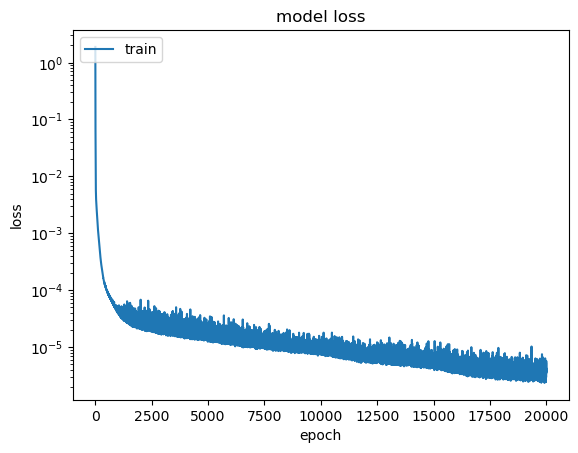

7

Epoch 1/20000
8/8 [==============================] - 8s 16ms/step - loss: 5.7578
Epoch 2/20000
8/8 [==============================] - 0s 28ms/step - loss: 1.6664
Epoch 3/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.5883
Epoch 4/20000
8/8 [==============================] - 0s 29ms/step - loss: 0.2343
Epoch 5/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.1549
Epoch 6/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.1295
Epoch 7/20000
8/8 [==============================] - 0s 28ms/step - loss: 0.1007
Epoch 8/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.0834
Epoch 9/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0730
Epoch 10/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.0655
Epoch 11/20000
8/8 [==============================] - 0s 33ms/step - loss: 0.0589
Epoch 12/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0542
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 10ms/step - loss: 0.0059
Epoch 102/20000
8/8 [==============================] - 0s 29ms/step - loss: 0.0058
Epoch 103/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.0057
Epoch 104/20000
8/8 [==============================] - 0s 9ms/step - loss: 0.0056
Epoch 105/20000
8/8 [==============================] - 0s 21ms/step - loss: 0.0056
Epoch 106/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0055
Epoch 107/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0054
Epoch 108/20000
8/8 [==============================] - 0s 24ms/step - loss: 0.0053
Epoch 109/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.0052
Epoch 110/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.0051
Epoch 111/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.0051
Epoch 112/20000
8/8 [==============================] - 0s 40ms/step - loss: 0.0050
Epoch 113/20000
8/8 [

Epoch 200/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.0015
Epoch 201/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0015
Epoch 202/20000
8/8 [==============================] - 0s 18ms/step - loss: 0.0015
Epoch 203/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0015
Epoch 204/20000
8/8 [==============================] - 0s 28ms/step - loss: 0.0015
Epoch 205/20000
8/8 [==============================] - 0s 13ms/step - loss: 0.0015
Epoch 206/20000
8/8 [==============================] - 0s 18ms/step - loss: 0.0014
Epoch 207/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0014
Epoch 208/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0014
Epoch 209/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0014
Epoch 210/20000
8/8 [==============================] - 0s 18ms/step - loss: 0.0014
Epoch 211/20000
8/8 [==============================] - 0s 28ms/step - loss: 0.0014
Epoc

8/8 [==============================] - 0s 24ms/step - loss: 6.9118e-04
Epoch 297/20000
8/8 [==============================] - 0s 20ms/step - loss: 6.8557e-04
Epoch 298/20000
8/8 [==============================] - 0s 22ms/step - loss: 6.8198e-04
Epoch 299/20000
8/8 [==============================] - 0s 18ms/step - loss: 6.7708e-04
Epoch 300/20000
8/8 [==============================] - 0s 17ms/step - loss: 6.7254e-04
Epoch 301/20000
8/8 [==============================] - 0s 19ms/step - loss: 6.6941e-04
Epoch 302/20000
8/8 [==============================] - 0s 17ms/step - loss: 6.6654e-04
Epoch 303/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6130e-04
Epoch 304/20000
8/8 [==============================] - 0s 20ms/step - loss: 6.5685e-04
Epoch 305/20000
8/8 [==============================] - 0s 24ms/step - loss: 6.5358e-04
Epoch 306/20000
8/8 [==============================] - 0s 24ms/step - loss: 6.5151e-04
Epoch 307/20000
8/8 [==============================] - 0s 12

8/8 [==============================] - 0s 15ms/step - loss: 4.1998e-04
Epoch 391/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.1786e-04
Epoch 392/20000
8/8 [==============================] - 0s 27ms/step - loss: 4.1634e-04
Epoch 393/20000
8/8 [==============================] - 0s 16ms/step - loss: 4.1396e-04
Epoch 394/20000
8/8 [==============================] - 0s 23ms/step - loss: 4.1296e-04
Epoch 395/20000
8/8 [==============================] - 0s 19ms/step - loss: 4.1154e-04
Epoch 396/20000
8/8 [==============================] - 0s 16ms/step - loss: 4.0833e-04
Epoch 397/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0754e-04
Epoch 398/20000
8/8 [==============================] - 0s 15ms/step - loss: 4.0495e-04
Epoch 399/20000
8/8 [==============================] - 0s 18ms/step - loss: 4.0370e-04
Epoch 400/20000
8/8 [==============================] - 0s 36ms/step - loss: 4.0107e-04
Epoch 401/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 10ms/step - loss: 2.7967e-04
Epoch 485/20000
8/8 [==============================] - 0s 38ms/step - loss: 2.7826e-04
Epoch 486/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7710e-04
Epoch 487/20000
8/8 [==============================] - 0s 20ms/step - loss: 2.7590e-04
Epoch 488/20000
8/8 [==============================] - 0s 32ms/step - loss: 2.7475e-04
Epoch 489/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.7394e-04
Epoch 490/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.7307e-04
Epoch 491/20000
8/8 [==============================] - 0s 28ms/step - loss: 2.7152e-04
Epoch 492/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7129e-04
Epoch 493/20000
8/8 [==============================] - 0s 28ms/step - loss: 2.7033e-04
Epoch 494/20000
8/8 [==============================] - 0s 19ms/step - loss: 2.6877e-04
Epoch 495/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 25ms/step - loss: 1.9350e-04
Epoch 579/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.9243e-04
Epoch 580/20000
8/8 [==============================] - 0s 22ms/step - loss: 1.9228e-04
Epoch 581/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.9184e-04
Epoch 582/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.9019e-04
Epoch 583/20000
8/8 [==============================] - 0s 23ms/step - loss: 1.8894e-04
Epoch 584/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.8889e-04
Epoch 585/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.8790e-04
Epoch 586/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8744e-04
Epoch 587/20000
8/8 [==============================] - 0s 27ms/step - loss: 1.8714e-04
Epoch 588/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.8564e-04
Epoch 589/20000
8/8 [==============================] - 0s 10

8/8 [==============================] - 0s 10ms/step - loss: 1.3898e-04
Epoch 673/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3940e-04
Epoch 674/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.3877e-04
Epoch 675/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.3842e-04
Epoch 676/20000
8/8 [==============================] - 0s 23ms/step - loss: 1.3775e-04
Epoch 677/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.3689e-04
Epoch 678/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3684e-04
Epoch 679/20000
8/8 [==============================] - 0s 40ms/step - loss: 1.3610e-04
Epoch 680/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.3588e-04
Epoch 681/20000
8/8 [==============================] - 0s 21ms/step - loss: 1.3574e-04
Epoch 682/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.3449e-04
Epoch 683/20000
8/8 [==============================] - 0s 7ms

8/8 [==============================] - 0s 6ms/step - loss: 1.0901e-04
Epoch 767/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0836e-04
Epoch 768/20000
8/8 [==============================] - 0s 37ms/step - loss: 1.0787e-04
Epoch 769/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0866e-04
Epoch 770/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0986e-04
Epoch 771/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0895e-04
Epoch 772/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0831e-04
Epoch 773/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.0717e-04
Epoch 774/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0539e-04
Epoch 775/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0667e-04
Epoch 776/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0561e-04
Epoch 777/20000
8/8 [==============================] - 0s 23ms/ste

8/8 [==============================] - 0s 17ms/step - loss: 8.8593e-05
Epoch 861/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.8001e-05
Epoch 862/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.8706e-05
Epoch 863/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0379e-05
Epoch 864/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9416e-05
Epoch 865/20000
8/8 [==============================] - 0s 16ms/step - loss: 8.7787e-05
Epoch 866/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8844e-05
Epoch 867/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8542e-05
Epoch 868/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7987e-05
Epoch 869/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8330e-05
Epoch 870/20000
8/8 [==============================] - 0s 14ms/step - loss: 8.7721e-05
Epoch 871/20000
8/8 [==============================] - 0s 6ms/ste

Epoch 955/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.6939e-05
Epoch 956/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5013e-05
Epoch 957/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5167e-05
Epoch 958/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7065e-05
Epoch 959/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5523e-05
Epoch 960/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.5753e-05
Epoch 961/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.4151e-05
Epoch 962/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4418e-05
Epoch 963/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6404e-05
Epoch 964/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4815e-05
Epoch 965/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5862e-05
Epoch 966/20000
8/8 [==============================]

8/8 [==============================] - 0s 5ms/step - loss: 6.4401e-05
Epoch 1050/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3241e-05
Epoch 1051/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3382e-05
Epoch 1052/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4297e-05
Epoch 1053/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5684e-05
Epoch 1054/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7131e-05
Epoch 1055/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5753e-05
Epoch 1056/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6934e-05
Epoch 1057/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4138e-05
Epoch 1058/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4910e-05
Epoch 1059/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3287e-05
Epoch 1060/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 5.4511e-05
Epoch 1144/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5544e-05
Epoch 1145/20000
8/8 [==============================] - 0s 16ms/step - loss: 5.2738e-05
Epoch 1146/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4921e-05
Epoch 1147/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.2853e-05
Epoch 1148/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5944e-05
Epoch 1149/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3367e-05
Epoch 1150/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4243e-05
Epoch 1151/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2898e-05
Epoch 1152/20000
8/8 [==============================] - 0s 17ms/step - loss: 5.2269e-05
Epoch 1153/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.2082e-05
Epoch 1154/20000
8/8 [==============================] - 

8/8 [==============================] - 0s 20ms/step - loss: 4.6221e-05
Epoch 1238/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7368e-05
Epoch 1239/20000
8/8 [==============================] - 0s 26ms/step - loss: 4.5767e-05
Epoch 1240/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8225e-05
Epoch 1241/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2237e-05
Epoch 1242/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8236e-05
Epoch 1243/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1472e-05
Epoch 1244/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7534e-05
Epoch 1245/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0488e-05
Epoch 1246/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8469e-05
Epoch 1247/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6906e-05
Epoch 1248/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 4ms/step - loss: 4.2916e-05
Epoch 1332/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4697e-05
Epoch 1333/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4108e-05
Epoch 1334/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3035e-05
Epoch 1335/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6624e-05
Epoch 1336/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.9859e-05
Epoch 1337/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5616e-05
Epoch 1338/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3749e-05
Epoch 1339/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0970e-05
Epoch 1340/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5414e-05
Epoch 1341/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3238e-05
Epoch 1342/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 4.4730e-05
Epoch 1426/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2602e-05
Epoch 1427/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1338e-05
Epoch 1428/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8966e-05
Epoch 1429/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4269e-05
Epoch 1430/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9233e-05
Epoch 1431/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9598e-05
Epoch 1432/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7859e-05
Epoch 1433/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1096e-05
Epoch 1434/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8241e-05
Epoch 1435/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7366e-05
Epoch 1436/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 4.2001e-05
Epoch 1520/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6951e-05
Epoch 1521/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6496e-05
Epoch 1522/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4185e-05
Epoch 1523/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.2879e-05
Epoch 1524/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3768e-05
Epoch 1525/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4568e-05
Epoch 1526/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.2792e-05
Epoch 1527/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4823e-05
Epoch 1528/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6324e-05
Epoch 1529/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4345e-05
Epoch 1530/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 3.1459e-05
Epoch 1614/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4655e-05
Epoch 1615/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6355e-05
Epoch 1616/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4301e-05
Epoch 1617/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6874e-05
Epoch 1618/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4211e-05
Epoch 1619/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8709e-05
Epoch 1620/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9649e-05
Epoch 1621/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4889e-05
Epoch 1622/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7778e-05
Epoch 1623/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0839e-05
Epoch 1624/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 3.6114e-05
Epoch 1708/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6823e-05
Epoch 1709/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8006e-05
Epoch 1710/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0742e-05
Epoch 1711/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2597e-05
Epoch 1712/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4651e-05
Epoch 1713/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8160e-05
Epoch 1714/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7871e-05
Epoch 1715/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2947e-05
Epoch 1716/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1803e-05
Epoch 1717/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7259e-05
Epoch 1718/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 3.9150e-05
Epoch 1802/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5239e-05
Epoch 1803/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0600e-05
Epoch 1804/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6154e-05
Epoch 1805/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0885e-05
Epoch 1806/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7606e-05
Epoch 1807/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0765e-05
Epoch 1808/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4500e-05
Epoch 1809/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9551e-05
Epoch 1810/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0113e-05
Epoch 1811/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.5331e-05
Epoch 1812/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 16ms/step - loss: 2.4805e-05
Epoch 1896/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7911e-05
Epoch 1897/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7643e-05
Epoch 1898/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1002e-05
Epoch 1899/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9536e-05
Epoch 1900/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4129e-05
Epoch 1901/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2509e-05
Epoch 1902/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4411e-05
Epoch 1903/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8543e-05
Epoch 1904/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2160e-05
Epoch 1905/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8142e-05
Epoch 1906/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 3.1331e-05
Epoch 1990/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3633e-05
Epoch 1991/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4297e-05
Epoch 1992/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5226e-05
Epoch 1993/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.9821e-05
Epoch 1994/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3550e-05
Epoch 1995/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.2779e-05
Epoch 1996/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5375e-05
Epoch 1997/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3381e-05
Epoch 1998/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3407e-05
Epoch 1999/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7032e-05
Epoch 2000/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 7ms/step - loss: 2.6883e-05
Epoch 2084/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.8070e-05
Epoch 2085/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2846e-05
Epoch 2086/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4194e-05
Epoch 2087/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5670e-05
Epoch 2088/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5176e-05
Epoch 2089/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2827e-05
Epoch 2090/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.7198e-05
Epoch 2091/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4468e-05
Epoch 2092/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2673e-05
Epoch 2093/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4277e-05
Epoch 2094/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 2.7811e-05
Epoch 2178/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0951e-05
Epoch 2179/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4091e-05
Epoch 2180/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5756e-05
Epoch 2181/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6835e-05
Epoch 2182/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4702e-05
Epoch 2183/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6785e-05
Epoch 2184/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0430e-05
Epoch 2185/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1305e-05
Epoch 2186/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7038e-05
Epoch 2187/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5781e-05
Epoch 2188/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 3.3343e-05
Epoch 2272/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0691e-05
Epoch 2273/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0170e-05
Epoch 2274/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9504e-05
Epoch 2275/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6051e-05
Epoch 2276/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4531e-05
Epoch 2277/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0132e-05
Epoch 2278/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6220e-05
Epoch 2279/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1885e-05
Epoch 2280/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4662e-05
Epoch 2281/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4006e-05
Epoch 2282/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 7ms/step - loss: 4.0738e-05
Epoch 2366/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2742e-05
Epoch 2367/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3619e-05
Epoch 2368/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7262e-05
Epoch 2369/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5524e-05
Epoch 2370/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.0680e-05
Epoch 2371/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0518e-05
Epoch 2372/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0587e-05
Epoch 2373/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5026e-05
Epoch 2374/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1134e-05
Epoch 2375/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9641e-05
Epoch 2376/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 3.0894e-05
Epoch 2460/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5528e-05
Epoch 2461/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6522e-05
Epoch 2462/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1604e-05
Epoch 2463/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9836e-05
Epoch 2464/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9787e-05
Epoch 2465/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1876e-05
Epoch 2466/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1172e-05
Epoch 2467/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1840e-05
Epoch 2468/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3028e-05
Epoch 2469/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2219e-05
Epoch 2470/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 2.1429e-05
Epoch 2554/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8979e-05
Epoch 2555/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8405e-05
Epoch 2556/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.9616e-05
Epoch 2557/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3262e-05
Epoch 2558/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2709e-05
Epoch 2559/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0940e-05
Epoch 2560/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1951e-05
Epoch 2561/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8968e-05
Epoch 2562/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8026e-05
Epoch 2563/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5256e-05
Epoch 2564/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 6ms/step - loss: 2.1543e-05
Epoch 2648/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9473e-05
Epoch 2649/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1107e-05
Epoch 2650/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9075e-05
Epoch 2651/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1379e-05
Epoch 2652/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2361e-05
Epoch 2653/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9667e-05
Epoch 2654/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4588e-05
Epoch 2655/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.5461e-05
Epoch 2656/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9391e-05
Epoch 2657/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0331e-05
Epoch 2658/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.8568e-05
Epoch 2742/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.7247e-05
Epoch 2743/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2362e-05
Epoch 2744/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4380e-05
Epoch 2745/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.9646e-05
Epoch 2746/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9044e-05
Epoch 2747/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.6834e-05
Epoch 2748/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8291e-05
Epoch 2749/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.7894e-05
Epoch 2750/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8583e-05
Epoch 2751/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8484e-05
Epoch 2752/20000
8/8 [==============================] - 

8/8 [==============================] - 0s 5ms/step - loss: 2.7378e-05
Epoch 2836/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3946e-05
Epoch 2837/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1704e-05
Epoch 2838/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5444e-05
Epoch 2839/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2193e-05
Epoch 2840/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3390e-05
Epoch 2841/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9367e-05
Epoch 2842/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1352e-05
Epoch 2843/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3048e-05
Epoch 2844/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6356e-05
Epoch 2845/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0738e-05
Epoch 2846/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 12ms/step - loss: 2.0507e-05
Epoch 2930/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3112e-05
Epoch 2931/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1032e-05
Epoch 2932/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0495e-05
Epoch 2933/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5180e-05
Epoch 2934/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4864e-05
Epoch 2935/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5529e-05
Epoch 2936/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.0267e-05
Epoch 2937/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1047e-05
Epoch 2938/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8186e-05
Epoch 2939/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7391e-05
Epoch 2940/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 2.7519e-05
Epoch 3024/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0485e-05
Epoch 3025/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6093e-05
Epoch 3026/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7529e-05
Epoch 3027/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5843e-05
Epoch 3028/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5094e-05
Epoch 3029/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5190e-05
Epoch 3030/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4793e-05
Epoch 3031/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1206e-05
Epoch 3032/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7424e-05
Epoch 3033/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4466e-05
Epoch 3034/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 17ms/step - loss: 1.5105e-05
Epoch 3118/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6188e-05
Epoch 3119/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5455e-05
Epoch 3120/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9156e-05
Epoch 3121/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3227e-05
Epoch 3122/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1350e-05
Epoch 3123/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9733e-05
Epoch 3124/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0233e-05
Epoch 3125/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8081e-05
Epoch 3126/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8936e-05
Epoch 3127/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6684e-05
Epoch 3128/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 2.4501e-05
Epoch 3212/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4200e-05
Epoch 3213/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3153e-05
Epoch 3214/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5831e-05
Epoch 3215/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3488e-05
Epoch 3216/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2823e-05
Epoch 3217/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6570e-05
Epoch 3218/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6900e-05
Epoch 3219/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7859e-05
Epoch 3220/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2461e-05
Epoch 3221/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4002e-05
Epoch 3222/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 1.9746e-05
Epoch 3306/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9081e-05
Epoch 3307/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9359e-05
Epoch 3308/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4224e-05
Epoch 3309/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8437e-05
Epoch 3310/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7391e-05
Epoch 3311/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8471e-05
Epoch 3312/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7244e-05
Epoch 3313/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7636e-05
Epoch 3314/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5705e-05
Epoch 3315/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6822e-05
Epoch 3316/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 2.0968e-05
Epoch 3400/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8171e-05
Epoch 3401/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5373e-05
Epoch 3402/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4876e-05
Epoch 3403/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7083e-05
Epoch 3404/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6505e-05
Epoch 3405/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5277e-05
Epoch 3406/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4418e-05
Epoch 3407/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4448e-05
Epoch 3408/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6768e-05
Epoch 3409/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7726e-05
Epoch 3410/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 1.5672e-05
Epoch 3494/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7749e-05
Epoch 3495/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5691e-05
Epoch 3496/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6822e-05
Epoch 3497/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0202e-05
Epoch 3498/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3087e-05
Epoch 3499/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3275e-05
Epoch 3500/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9478e-05
Epoch 3501/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7968e-05
Epoch 3502/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7071e-05
Epoch 3503/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5426e-05
Epoch 3504/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 1.8618e-05
Epoch 3588/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5025e-05
Epoch 3589/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6469e-05
Epoch 3590/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4687e-05
Epoch 3591/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4670e-05
Epoch 3592/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5115e-05
Epoch 3593/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0972e-05
Epoch 3594/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0348e-05
Epoch 3595/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7605e-05
Epoch 3596/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4809e-05
Epoch 3597/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4777e-05
Epoch 3598/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 6ms/step - loss: 1.6811e-05
Epoch 3682/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7234e-05
Epoch 3683/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6885e-05
Epoch 3684/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4389e-05
Epoch 3685/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4599e-05
Epoch 3686/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0833e-05
Epoch 3687/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7877e-05
Epoch 3688/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0570e-05
Epoch 3689/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0157e-05
Epoch 3690/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5719e-05
Epoch 3691/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6563e-05
Epoch 3692/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 2.2930e-05
Epoch 3776/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3765e-05
Epoch 3777/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7738e-05
Epoch 3778/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7017e-05
Epoch 3779/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3028e-05
Epoch 3780/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3018e-05
Epoch 3781/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.5225e-05
Epoch 3782/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6321e-05
Epoch 3783/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1797e-05
Epoch 3784/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9412e-05
Epoch 3785/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6252e-05
Epoch 3786/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.6109e-05
Epoch 3870/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5095e-05
Epoch 3871/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6487e-05
Epoch 3872/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3884e-05
Epoch 3873/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5751e-05
Epoch 3874/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6277e-05
Epoch 3875/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6838e-05
Epoch 3876/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4047e-05
Epoch 3877/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.3552e-05
Epoch 3878/20000
8/8 [==============================] - 0s 22ms/step - loss: 1.2602e-05
Epoch 3879/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5207e-05
Epoch 3880/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.8027e-05
Epoch 3964/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2311e-05
Epoch 3965/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2176e-05
Epoch 3966/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4469e-05
Epoch 3967/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0616e-05
Epoch 3968/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1647e-05
Epoch 3969/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5905e-05
Epoch 3970/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9498e-05
Epoch 3971/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0394e-05
Epoch 3972/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.6394e-05
Epoch 3973/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5412e-05
Epoch 3974/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.3536e-05
Epoch 4058/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4996e-05
Epoch 4059/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.4531e-05
Epoch 4060/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3137e-05
Epoch 4061/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9958e-05
Epoch 4062/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.9874e-05
Epoch 4063/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6840e-05
Epoch 4064/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2797e-05
Epoch 4065/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2507e-05
Epoch 4066/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2067e-05
Epoch 4067/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4149e-05
Epoch 4068/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.2321e-05
Epoch 4152/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4706e-05
Epoch 4153/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5343e-05
Epoch 4154/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2481e-05
Epoch 4155/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1790e-05
Epoch 4156/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2844e-05
Epoch 4157/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6671e-05
Epoch 4158/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4824e-05
Epoch 4159/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3714e-05
Epoch 4160/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1113e-05
Epoch 4161/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8452e-05
Epoch 4162/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.2636e-05
Epoch 4246/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2638e-05
Epoch 4247/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4318e-05
Epoch 4248/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4086e-05
Epoch 4249/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6259e-05
Epoch 4250/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2616e-05
Epoch 4251/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3713e-05
Epoch 4252/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3629e-05
Epoch 4253/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.4323e-05
Epoch 4254/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3726e-05
Epoch 4255/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6051e-05
Epoch 4256/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.4561e-05
Epoch 4340/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6590e-05
Epoch 4341/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4100e-05
Epoch 4342/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3247e-05
Epoch 4343/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.3661e-05
Epoch 4344/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0793e-05
Epoch 4345/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2420e-05
Epoch 4346/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8735e-05
Epoch 4347/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1123e-05
Epoch 4348/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7310e-05
Epoch 4349/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2241e-05
Epoch 4350/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 5ms/step - loss: 1.2313e-05
Epoch 4434/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3893e-05
Epoch 4435/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3940e-05
Epoch 4436/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1874e-05
Epoch 4437/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1027e-05
Epoch 4438/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1472e-05
Epoch 4439/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3262e-05
Epoch 4440/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4670e-05
Epoch 4441/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3833e-05
Epoch 4442/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0543e-05
Epoch 4443/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0039e-05
Epoch 4444/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 1.0937e-05
Epoch 4528/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4074e-05
Epoch 4529/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4474e-05
Epoch 4530/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3097e-05
Epoch 4531/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1721e-05
Epoch 4532/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2969e-05
Epoch 4533/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4679e-05
Epoch 4534/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1425e-05
Epoch 4535/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8122e-05
Epoch 4536/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4756e-05
Epoch 4537/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5025e-05
Epoch 4538/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 1.2286e-05
Epoch 4622/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1734e-05
Epoch 4623/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1021e-05
Epoch 4624/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1596e-05
Epoch 4625/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5982e-05
Epoch 4626/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2506e-05
Epoch 4627/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0947e-05
Epoch 4628/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3154e-05
Epoch 4629/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7219e-05
Epoch 4630/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2651e-05
Epoch 4631/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4398e-05
Epoch 4632/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.1792e-05
Epoch 4716/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4891e-05
Epoch 4717/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4174e-05
Epoch 4718/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4444e-05
Epoch 4719/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7077e-05
Epoch 4720/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4281e-05
Epoch 4721/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1736e-05
Epoch 4722/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2007e-05
Epoch 4723/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3408e-05
Epoch 4724/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3675e-05
Epoch 4725/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1481e-05
Epoch 4726/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.4175e-05
Epoch 4810/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4443e-05
Epoch 4811/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3482e-05
Epoch 4812/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1174e-05
Epoch 4813/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2709e-05
Epoch 4814/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3796e-05
Epoch 4815/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1640e-05
Epoch 4816/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2199e-05
Epoch 4817/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1660e-05
Epoch 4818/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2418e-05
Epoch 4819/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3573e-05
Epoch 4820/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 1.2387e-05
Epoch 4904/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3132e-05
Epoch 4905/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1343e-05
Epoch 4906/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0738e-05
Epoch 4907/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3236e-05
Epoch 4908/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0501e-05
Epoch 4909/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1085e-05
Epoch 4910/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1446e-05
Epoch 4911/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0475e-05
Epoch 4912/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2052e-05
Epoch 4913/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3993e-05
Epoch 4914/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 9.7992e-06
Epoch 4998/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0030e-05
Epoch 4999/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0522e-05
Epoch 5000/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0702e-05
Epoch 5001/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4660e-05
Epoch 5002/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1978e-05
Epoch 5003/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2260e-05
Epoch 5004/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3837e-05
Epoch 5005/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3487e-05
Epoch 5006/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1838e-05
Epoch 5007/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3166e-05
Epoch 5008/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 6ms/step - loss: 1.1730e-05
Epoch 5092/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8219e-06
Epoch 5093/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.5933e-06
Epoch 5094/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.8265e-06
Epoch 5095/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0460e-05
Epoch 5096/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3276e-05
Epoch 5097/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4174e-05
Epoch 5098/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2140e-05
Epoch 5099/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2809e-05
Epoch 5100/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0060e-05
Epoch 5101/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8644e-06
Epoch 5102/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.1826e-05
Epoch 5186/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0116e-05
Epoch 5187/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0450e-05
Epoch 5188/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2136e-05
Epoch 5189/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0266e-05
Epoch 5190/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.9487e-06
Epoch 5191/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1136e-05
Epoch 5192/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0438e-05
Epoch 5193/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3757e-05
Epoch 5194/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.4960e-05
Epoch 5195/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1115e-05
Epoch 5196/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.7315e-05
Epoch 5280/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4363e-05
Epoch 5281/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3934e-05
Epoch 5282/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4263e-05
Epoch 5283/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0833e-05
Epoch 5284/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0471e-05
Epoch 5285/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1507e-05
Epoch 5286/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1372e-05
Epoch 5287/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2263e-06
Epoch 5288/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1148e-05
Epoch 5289/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0961e-05
Epoch 5290/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 1.0997e-05
Epoch 5374/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1921e-05
Epoch 5375/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0433e-05
Epoch 5376/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0055e-05
Epoch 5377/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.6151e-05
Epoch 5378/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5184e-05
Epoch 5379/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6182e-05
Epoch 5380/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.6028e-05
Epoch 5381/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1622e-05
Epoch 5382/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1593e-05
Epoch 5383/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1796e-05
Epoch 5384/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.2952e-05
Epoch 5468/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3469e-05
Epoch 5469/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3525e-05
Epoch 5470/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9480e-06
Epoch 5471/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1064e-05
Epoch 5472/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1082e-05
Epoch 5473/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3145e-05
Epoch 5474/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3470e-05
Epoch 5475/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7640e-05
Epoch 5476/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5007e-05
Epoch 5477/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1542e-05
Epoch 5478/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 7ms/step - loss: 9.0581e-06
Epoch 5562/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.6541e-05
Epoch 5563/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5799e-05
Epoch 5564/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8918e-06
Epoch 5565/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0173e-05
Epoch 5566/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.9005e-06
Epoch 5567/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4702e-06
Epoch 5568/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0687e-05
Epoch 5569/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2064e-05
Epoch 5570/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3878e-05
Epoch 5571/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7034e-05
Epoch 5572/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 9.5383e-06
Epoch 5656/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0075e-05
Epoch 5657/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1140e-05
Epoch 5658/20000
8/8 [==============================] - 0s 11ms/step - loss: 9.9030e-06
Epoch 5659/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0728e-06
Epoch 5660/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1259e-05
Epoch 5661/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2021e-05
Epoch 5662/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5475e-05
Epoch 5663/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2777e-05
Epoch 5664/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4659e-05
Epoch 5665/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2308e-05
Epoch 5666/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 9ms/step - loss: 8.3066e-06
Epoch 5750/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9866e-06
Epoch 5751/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1394e-05
Epoch 5752/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3730e-05
Epoch 5753/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9771e-06
Epoch 5754/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2090e-06
Epoch 5755/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0338e-05
Epoch 5756/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5261e-05
Epoch 5757/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3040e-05
Epoch 5758/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1752e-05
Epoch 5759/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0886e-05
Epoch 5760/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 9.2866e-06
Epoch 5844/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8849e-06
Epoch 5845/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.9971e-06
Epoch 5846/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7413e-06
Epoch 5847/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9522e-06
Epoch 5848/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0709e-05
Epoch 5849/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1303e-05
Epoch 5850/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0298e-05
Epoch 5851/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6303e-06
Epoch 5852/20000
8/8 [==============================] - 0s 24ms/step - loss: 8.2485e-06
Epoch 5853/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3775e-06
Epoch 5854/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 8.5975e-06
Epoch 5938/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3653e-06
Epoch 5939/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7192e-06
Epoch 5940/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0533e-05
Epoch 5941/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.9672e-06
Epoch 5942/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9143e-06
Epoch 5943/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0069e-05
Epoch 5944/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5854e-06
Epoch 5945/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2083e-06
Epoch 5946/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8400e-06
Epoch 5947/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7987e-06
Epoch 5948/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 2.1641e-05
Epoch 6032/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8115e-05
Epoch 6033/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5565e-06
Epoch 6034/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8117e-06
Epoch 6035/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7948e-06
Epoch 6036/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1638e-06
Epoch 6037/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9975e-06
Epoch 6038/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7653e-06
Epoch 6039/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3314e-06
Epoch 6040/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.3548e-06
Epoch 6041/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1528e-06
Epoch 6042/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 8.1397e-06
Epoch 6126/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8478e-06
Epoch 6127/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1541e-06
Epoch 6128/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1089e-05
Epoch 6129/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0134e-06
Epoch 6130/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9489e-06
Epoch 6131/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.4599e-06
Epoch 6132/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1145e-06
Epoch 6133/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.1785e-06
Epoch 6134/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0308e-06
Epoch 6135/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.6284e-06
Epoch 6136/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.8438e-05
Epoch 6220/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3134e-05
Epoch 6221/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2117e-05
Epoch 6222/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9165e-06
Epoch 6223/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1882e-06
Epoch 6224/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8783e-06
Epoch 6225/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5720e-06
Epoch 6226/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.2625e-06
Epoch 6227/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8625e-06
Epoch 6228/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0158e-05
Epoch 6229/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5782e-05
Epoch 6230/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 7.6880e-06
Epoch 6314/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0699e-05
Epoch 6315/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.9303e-06
Epoch 6316/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3676e-06
Epoch 6317/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0948e-05
Epoch 6318/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2242e-05
Epoch 6319/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0969e-05
Epoch 6320/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7803e-06
Epoch 6321/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3959e-06
Epoch 6322/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.3853e-06
Epoch 6323/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8641e-06
Epoch 6324/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 8.5529e-06
Epoch 6443/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5391e-06
Epoch 6444/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4362e-06
Epoch 6445/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3359e-06
Epoch 6446/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1092e-06
Epoch 6447/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5431e-06
Epoch 6448/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1022e-05
Epoch 6449/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3199e-06
Epoch 6450/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0632e-06
Epoch 6451/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.1972e-06
Epoch 6452/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7032e-06
Epoch 6453/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 1.0074e-05
Epoch 6537/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4654e-06
Epoch 6538/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.7181e-06
Epoch 6539/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3895e-06
Epoch 6540/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1568e-05
Epoch 6541/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7753e-06
Epoch 6542/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0387e-05
Epoch 6543/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.0853e-06
Epoch 6544/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6113e-06
Epoch 6545/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2979e-05
Epoch 6546/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9552e-06
Epoch 6547/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 8.5039e-06
Epoch 6667/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9139e-06
Epoch 6668/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3748e-06
Epoch 6669/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5840e-06
Epoch 6670/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1159e-05
Epoch 6671/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4639e-05
Epoch 6672/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3932e-05
Epoch 6673/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3109e-05
Epoch 6674/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0212e-06
Epoch 6675/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7206e-06
Epoch 6676/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7748e-06
Epoch 6677/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 6.9349e-06
Epoch 6795/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8293e-06
Epoch 6796/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0729e-05
Epoch 6797/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1433e-05
Epoch 6798/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0260e-05
Epoch 6799/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3516e-06
Epoch 6800/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8938e-06
Epoch 6801/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2138e-06
Epoch 6802/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1438e-06
Epoch 6803/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0798e-06
Epoch 6804/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5467e-06
Epoch 6805/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.7237e-06
Epoch 6889/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.9508e-06
Epoch 6890/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9647e-06
Epoch 6891/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4922e-06
Epoch 6892/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0108e-05
Epoch 6893/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3808e-06
Epoch 6894/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7596e-06
Epoch 6895/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9041e-06
Epoch 6896/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9135e-06
Epoch 6897/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0164e-06
Epoch 6898/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8695e-06
Epoch 6899/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 7.6056e-06
Epoch 7006/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3494e-06
Epoch 7007/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7323e-06
Epoch 7008/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.2207e-06
Epoch 7009/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8950e-06
Epoch 7010/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3046e-06
Epoch 7011/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8329e-06
Epoch 7012/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.9763e-06
Epoch 7013/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7318e-06
Epoch 7014/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9055e-06
Epoch 7015/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0032e-05
Epoch 7016/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 6.8051e-06
Epoch 7100/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5911e-06
Epoch 7101/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0224e-05
Epoch 7102/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2617e-05
Epoch 7103/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6034e-05
Epoch 7104/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5541e-06
Epoch 7105/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8852e-06
Epoch 7106/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6999e-06
Epoch 7107/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.9544e-06
Epoch 7108/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0003e-06
Epoch 7109/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1167e-06
Epoch 7110/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 7.6330e-06
Epoch 7221/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9986e-06
Epoch 7222/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8215e-06
Epoch 7223/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8388e-06
Epoch 7224/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4091e-06
Epoch 7225/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3871e-06
Epoch 7226/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3360e-06
Epoch 7227/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.9919e-06
Epoch 7228/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7305e-06
Epoch 7229/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.6170e-06
Epoch 7230/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9455e-06
Epoch 7231/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.0818e-05
Epoch 7315/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1886e-05
Epoch 7316/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5056e-06
Epoch 7317/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.6174e-06
Epoch 7318/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3724e-06
Epoch 7438/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0403e-06
Epoch 7439/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2201e-05
Epoch 7440/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1569e-05
Epoch 7441/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0447e-05
Epoch 7442/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2035e-06
Epoch 7443/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0450e-05
Epoch 7444/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.1146e-05
Epoch 7527/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6085e-06
Epoch 7528/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7529e-06
Epoch 7529/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7701e-06
Epoch 7530/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4864e-06
Epoch 7531/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4817e-06
Epoch 7532/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9618e-06
Epoch 7533/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5044e-06
Epoch 7534/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0350e-05
Epoch 7535/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8740e-06
Epoch 7536/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7483e-06
Epoch 7537/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 6.5927e-06
Epoch 7648/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7897e-06
Epoch 7649/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7535e-06
Epoch 7650/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5479e-06
Epoch 7651/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6922e-06
Epoch 7652/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7342e-06
Epoch 7653/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7270e-06
Epoch 7654/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.0909e-06
Epoch 7655/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8494e-06
Epoch 7656/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9449e-06
Epoch 7657/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0100e-06
Epoch 7658/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 6ms/step - loss: 6.4060e-06
Epoch 7742/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8438e-06
Epoch 7743/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0093e-06
Epoch 7744/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7386e-06
Epoch 7745/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.2092e-06
Epoch 7746/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8107e-06
Epoch 7747/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2833e-06
Epoch 7748/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.5729e-06
Epoch 7749/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1170e-06
Epoch 7750/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1902e-05
Epoch 7751/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3871e-05
Epoch 7752/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.1715e-06
Epoch 7862/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7016e-06
Epoch 7863/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1745e-05
Epoch 7864/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.0021e-06
Epoch 7865/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7689e-06
Epoch 7866/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2718e-05
Epoch 7867/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0908e-06
Epoch 7868/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4987e-06
Epoch 7869/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3397e-06
Epoch 7870/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6434e-06
Epoch 7871/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5958e-06
Epoch 7872/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 8.7812e-06
Epoch 7956/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4472e-06
Epoch 7957/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4248e-06
Epoch 7958/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9408e-06
Epoch 7959/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0168e-06
Epoch 7960/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1460e-05
Epoch 7961/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0667e-05
Epoch 7962/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8120e-06
Epoch 7963/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6149e-06
Epoch 7964/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5043e-06
Epoch 7965/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1870e-06
Epoch 7966/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 7.5794e-06
Epoch 8082/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.6489e-06
Epoch 8083/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4533e-06
Epoch 8084/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9997e-06
Epoch 8085/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0894e-05
Epoch 8086/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1733e-06
Epoch 8087/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3575e-06
Epoch 8088/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7822e-06
Epoch 8089/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2960e-06
Epoch 8090/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2048e-05
Epoch 8091/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0807e-05
Epoch 8092/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 6ms/step - loss: 6.9771e-06
Epoch 8306/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7920e-06
Epoch 8307/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.4305e-06
Epoch 8308/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0017e-05
Epoch 8309/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.6278e-06
Epoch 8310/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4980e-06
Epoch 8311/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1879e-06
Epoch 8312/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9837e-06
Epoch 8313/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8936e-06
Epoch 8314/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9922e-06
Epoch 8315/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4633e-06
Epoch 8316/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.1033e-05
Epoch 8400/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5035e-06
Epoch 8401/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9128e-06
Epoch 8402/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6292e-06
Epoch 8403/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4715e-06
Epoch 8404/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7713e-06
Epoch 8405/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1963e-06
Epoch 8406/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9350e-06
Epoch 8407/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.3590e-06
Epoch 8408/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0590e-06
Epoch 8409/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6490e-06
Epoch 8410/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 5.8290e-06
Epoch 8524/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2723e-06
Epoch 8525/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.5112e-06
Epoch 8526/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.2597e-06
Epoch 8527/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0961e-06
Epoch 8528/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3648e-06
Epoch 8529/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1285e-06
Epoch 8530/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.1070e-06
Epoch 8531/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1176e-05
Epoch 8532/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8037e-06
Epoch 8533/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0625e-06
Epoch 8534/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 4ms/step - loss: 8.6717e-06
Epoch 8618/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6825e-06
Epoch 8619/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9280e-06
Epoch 8620/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4399e-06
Epoch 8621/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2154e-06
Epoch 8622/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7722e-06
Epoch 8623/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8767e-06
Epoch 8624/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5805e-06
Epoch 8625/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8329e-06
Epoch 8626/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2749e-06
Epoch 8627/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7096e-06
Epoch 8628/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 6.1335e-06
Epoch 8744/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2818e-06
Epoch 8745/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1450e-06
Epoch 8746/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7890e-06
Epoch 8747/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8794e-06
Epoch 8748/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.8786e-06
Epoch 8749/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7535e-06
Epoch 8750/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9854e-06
Epoch 8751/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5008e-06
Epoch 8752/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2076e-06
Epoch 8753/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6161e-06
Epoch 8754/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 6.9023e-06
Epoch 8873/20000
8/8 [==============================] - 0s 21ms/step - loss: 6.1786e-06
Epoch 8874/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9096e-06
Epoch 8875/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5721e-06
Epoch 8876/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1555e-06
Epoch 8877/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3679e-06
Epoch 8878/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0823e-05
Epoch 8879/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9605e-06
Epoch 8880/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3434e-06
Epoch 8881/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0207e-05
Epoch 8882/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9783e-06
Epoch 8883/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 5.3137e-06
Epoch 8967/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2891e-06
Epoch 8968/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8837e-06
Epoch 8969/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1528e-06
Epoch 8970/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4628e-06
Epoch 8971/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3760e-06
Epoch 8972/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4428e-06
Epoch 8973/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2522e-05
Epoch 8974/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0825e-05
Epoch 8975/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0398e-05
Epoch 8976/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4119e-06
Epoch 8977/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.1071e-05
Epoch 9183/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2893e-06
Epoch 9184/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0701e-06
Epoch 9185/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3274e-06
Epoch 9186/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0117e-06
Epoch 9187/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0266e-06
Epoch 9188/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7719e-06
Epoch 9189/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0309e-05
Epoch 9190/20000
8/8 [==============================] - 0s 15ms/step - loss: 9.1168e-06
Epoch 9191/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2271e-06
Epoch 9192/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2731e-06
Epoch 9193/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 5.1850e-06
Epoch 9277/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1748e-06
Epoch 9278/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2664e-06
Epoch 9279/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7139e-06
Epoch 9280/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7171e-06
Epoch 9281/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.7734e-06
Epoch 9282/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8099e-06
Epoch 9283/20000
8/8 [==============================] - 0s 13ms/step - loss: 9.3077e-06
Epoch 9284/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.8467e-06
Epoch 9285/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0706e-05
Epoch 9286/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6621e-06
Epoch 9287/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 7.6750e-06
Epoch 9392/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.6614e-06
Epoch 9393/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1238e-06
Epoch 9394/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0183e-05
Epoch 9395/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1886e-05
Epoch 9396/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2372e-06
Epoch 9397/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2742e-06
Epoch 9398/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1766e-06
Epoch 9399/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8888e-06
Epoch 9400/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6542e-06
Epoch 9401/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3802e-06
Epoch 9402/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.3601e-06
Epoch 9486/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5653e-06
Epoch 9487/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2502e-06
Epoch 9488/20000
8/8 [==============================] - 0s 12ms/step - loss: 8.5751e-06
Epoch 9600/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3413e-06
Epoch 9601/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1481e-06
Epoch 9602/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0126e-06
Epoch 9603/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4191e-06
Epoch 9604/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3410e-06
Epoch 9605/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9931e-06
Epoch 9606/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8035e-06
Epoch 9607/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 6.3710e-06
Epoch 9690/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1238e-06
Epoch 9691/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.2079e-06
Epoch 9692/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7628e-06
Epoch 9693/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9702e-06
Epoch 9694/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4331e-06
Epoch 9695/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7639e-06
Epoch 9696/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7287e-06
Epoch 9697/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4993e-06
Epoch 9698/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9191e-06
Epoch 9699/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8664e-06
Epoch 9700/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 11ms/step - loss: 5.5398e-06
Epoch 9807/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4418e-06
Epoch 9808/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7418e-06
Epoch 9809/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0772e-06
Epoch 9810/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.0295e-06
Epoch 9811/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7142e-06
Epoch 9812/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1058e-06
Epoch 9813/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0135e-06
Epoch 9814/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.6202e-06
Epoch 9815/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8416e-06
Epoch 9816/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5834e-06
Epoch 9817/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 4.8109e-06
Epoch 9901/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6601e-06
Epoch 9902/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7721e-06
Epoch 9903/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4245e-06
Epoch 9904/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1617e-06
Epoch 9905/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6472e-06
Epoch 9906/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4294e-06
Epoch 9907/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7965e-06
Epoch 9908/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8807e-06
Epoch 9909/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1060e-06
Epoch 9910/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3520e-06
Epoch 9911/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 6ms/step - loss: 5.4296e-06
Epoch 10104/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3132e-06
Epoch 10105/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3827e-06
Epoch 10106/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5225e-06
Epoch 10107/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8379e-06
Epoch 10108/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1201e-06
Epoch 10109/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4458e-06
Epoch 10110/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7117e-06
Epoch 10111/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8008e-06
Epoch 10112/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9118e-06
Epoch 10113/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9371e-06
Epoch 10114/20000
8/8 [===========================

8/8 [==============================] - 0s 12ms/step - loss: 6.4382e-06
Epoch 10197/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.9876e-06
Epoch 10198/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1461e-06
Epoch 10199/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4389e-06
Epoch 10200/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7041e-06
Epoch 10201/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4511e-06
Epoch 10202/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5480e-06
Epoch 10203/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4730e-06
Epoch 10204/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5917e-06
Epoch 10205/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8212e-06
Epoch 10206/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2802e-06
Epoch 10207/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.9697e-06
Epoch 10307/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6396e-06
Epoch 10308/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1832e-06
Epoch 10309/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7477e-06
Epoch 10310/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0456e-06
Epoch 10311/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5464e-06
Epoch 10312/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7921e-06
Epoch 10313/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3567e-06
Epoch 10314/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9044e-06
Epoch 10315/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6042e-06
Epoch 10316/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5106e-06
Epoch 10317/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 1.3352e-05
Epoch 10507/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3276e-06
Epoch 10508/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6792e-06
Epoch 10509/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5770e-06
Epoch 10510/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2541e-06
Epoch 10511/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5869e-06
Epoch 10512/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4840e-06
Epoch 10513/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6073e-06
Epoch 10514/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8236e-06
Epoch 10515/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.2367e-06
Epoch 10516/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0103e-06
Epoch 10517/20000
8/8 [===========================

8/8 [==============================] - 0s 13ms/step - loss: 3.7004e-06
Epoch 10600/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3123e-06
Epoch 10601/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2322e-06
Epoch 10602/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6682e-06
Epoch 10603/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2231e-06
Epoch 10604/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8074e-06
Epoch 10605/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2949e-06
Epoch 10606/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1178e-06
Epoch 10607/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9524e-06
Epoch 10608/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.6744e-06
Epoch 10609/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1996e-06
Epoch 10610/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.7862e-06
Epoch 10715/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6252e-06
Epoch 10716/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9540e-06
Epoch 10717/20000
8/8 [==============================] - 0s 19ms/step - loss: 8.0781e-06
Epoch 10718/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2712e-06
Epoch 10719/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1628e-06
Epoch 10720/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9220e-06
Epoch 10721/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1038e-06
Epoch 10722/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0738e-06
Epoch 10723/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8861e-06
Epoch 10724/20000
8/8 [==============================] - 0s 16ms/step - loss: 3.6174e-06
Epoch 10725/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 4.1550e-06
Epoch 10808/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1096e-06
Epoch 10809/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9623e-06
Epoch 10810/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3158e-06
Epoch 10811/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9475e-06
Epoch 10812/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.5204e-06
Epoch 10813/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5716e-06
Epoch 10814/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2826e-06
Epoch 10815/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2354e-06
Epoch 10816/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7078e-06
Epoch 10817/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3237e-06
Epoch 10818/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 4.4090e-06
Epoch 11013/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5178e-06
Epoch 11014/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2536e-06
Epoch 11015/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.2028e-06
Epoch 11016/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6888e-06
Epoch 11017/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3090e-06
Epoch 11018/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6132e-06
Epoch 11019/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6338e-06
Epoch 11020/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9727e-06
Epoch 11021/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1039e-06
Epoch 11022/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.1679e-06
Epoch 11023/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.8948e-06
Epoch 11130/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4705e-06
Epoch 11131/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2931e-06
Epoch 11132/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5046e-06
Epoch 11133/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7338e-06
Epoch 11134/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5056e-06
Epoch 11135/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0791e-06
Epoch 11136/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0421e-06
Epoch 11137/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.9901e-06
Epoch 11138/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6585e-06
Epoch 11139/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5548e-06
Epoch 11140/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.3962e-06
Epoch 11223/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6603e-06
Epoch 11224/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3899e-06
Epoch 11225/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4476e-06
Epoch 11226/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7724e-06
Epoch 11227/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2388e-06
Epoch 11228/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7575e-06
Epoch 11229/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8371e-06
Epoch 11230/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.7435e-06
Epoch 11231/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7060e-06
Epoch 11232/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5353e-06
Epoch 11233/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.0086e-06
Epoch 11426/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4123e-06
Epoch 11427/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4036e-06
Epoch 11428/20000
8/8 [==============================] - 0s 17ms/step - loss: 4.3769e-06
Epoch 11429/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4344e-06
Epoch 11430/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8057e-06
Epoch 11431/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2566e-06
Epoch 11432/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5673e-06
Epoch 11433/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2002e-06
Epoch 11434/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6065e-06
Epoch 11435/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3611e-06
Epoch 11436/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.4280e-06
Epoch 11519/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1207e-06
Epoch 11520/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4547e-06
Epoch 11521/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0007e-06
Epoch 11522/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8504e-06
Epoch 11523/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7646e-06
Epoch 11524/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.7768e-06
Epoch 11525/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4588e-06
Epoch 11526/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7520e-06
Epoch 11527/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0258e-06
Epoch 11528/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2328e-06
Epoch 11529/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.9876e-06
Epoch 11639/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7146e-06
Epoch 11640/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9022e-06
Epoch 11641/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0630e-06
Epoch 11642/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6730e-06
Epoch 11643/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9242e-06
Epoch 11644/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2821e-06
Epoch 11645/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3800e-06
Epoch 11646/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3407e-06
Epoch 11647/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9625e-06
Epoch 11648/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0643e-06
Epoch 11649/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 5.6043e-06
Epoch 11732/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2624e-06
Epoch 11733/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8871e-06
Epoch 11734/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.2547e-06
Epoch 11735/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7629e-06
Epoch 11736/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3286e-06
Epoch 11737/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7685e-06
Epoch 11738/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0646e-06
Epoch 11739/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3279e-06
Epoch 11846/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7142e-06
Epoch 11847/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6675e-06
Epoch 11848/20000
8/8 [==========================

8/8 [==============================] - 0s 10ms/step - loss: 1.2441e-05
Epoch 11931/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9327e-06
Epoch 11932/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.8768e-06
Epoch 11933/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7215e-06
Epoch 11934/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6465e-06
Epoch 11935/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5617e-06
Epoch 11936/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3349e-06
Epoch 11937/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8772e-06
Epoch 11938/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2570e-06
Epoch 11939/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.5004e-06
Epoch 11940/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7266e-06
Epoch 11941/20000
8/8 [========================

8/8 [==============================] - 0s 5ms/step - loss: 4.2599e-06
Epoch 12046/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2522e-06
Epoch 12047/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4945e-06
Epoch 12048/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8546e-06
Epoch 12049/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.1479e-06
Epoch 12050/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2403e-06
Epoch 12051/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7136e-06
Epoch 12052/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4622e-06
Epoch 12053/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7838e-06
Epoch 12054/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0867e-06
Epoch 12055/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5886e-06
Epoch 12056/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 9.8767e-06
Epoch 12139/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3272e-06
Epoch 12140/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0851e-06
Epoch 12141/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9919e-06
Epoch 12142/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0636e-06
Epoch 12143/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5717e-06
Epoch 12144/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3800e-06
Epoch 12145/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0172e-06
Epoch 12146/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.4951e-06
Epoch 12147/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8267e-06
Epoch 12148/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6035e-06
Epoch 12149/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 4.9019e-06
Epoch 12262/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1434e-06
Epoch 12263/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0923e-06
Epoch 12264/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.2282e-06
Epoch 12265/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8966e-06
Epoch 12266/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.8675e-06
Epoch 12267/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0436e-06
Epoch 12268/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5805e-06
Epoch 12269/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2244e-06
Epoch 12270/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8862e-06
Epoch 12271/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2410e-06
Epoch 12272/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.5143e-06
Epoch 12355/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2544e-06
Epoch 12356/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5299e-06
Epoch 12357/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0583e-06
Epoch 12358/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0800e-06
Epoch 12359/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4972e-06
Epoch 12360/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6946e-06
Epoch 12361/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1102e-06
Epoch 12362/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7354e-06
Epoch 12363/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3004e-06
Epoch 12364/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1147e-06
Epoch 12365/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 6.0888e-06
Epoch 12571/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1910e-06
Epoch 12572/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8088e-06
Epoch 12573/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6167e-06
Epoch 12574/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.4840e-06
Epoch 12575/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5211e-06
Epoch 12576/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6589e-06
Epoch 12577/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4455e-06
Epoch 12578/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3773e-06
Epoch 12579/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3907e-06
Epoch 12580/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3130e-06
Epoch 12581/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 4.1217e-06
Epoch 12683/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0052e-06
Epoch 12684/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4333e-06
Epoch 12685/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.1850e-06
Epoch 12686/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3130e-06
Epoch 12687/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9970e-06
Epoch 12688/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5100e-06
Epoch 12689/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5707e-06
Epoch 12690/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0270e-06
Epoch 12691/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3514e-06
Epoch 12692/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4542e-06
Epoch 12693/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.6903e-06
Epoch 12776/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2818e-06
Epoch 12777/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5529e-06
Epoch 12778/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7478e-06
Epoch 12779/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6289e-06
Epoch 12780/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0995e-06
Epoch 12781/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2669e-06
Epoch 12782/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2740e-06
Epoch 12783/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0456e-06
Epoch 12784/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7237e-06
Epoch 12785/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7744e-06
Epoch 12786/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2894e-06
Epoch 12990/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9186e-06
Epoch 12991/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6016e-06
Epoch 12992/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9299e-06
Epoch 12993/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5507e-06
Epoch 12994/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0966e-06
Epoch 12995/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0808e-06
Epoch 12996/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3161e-06
Epoch 12997/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.0730e-06
Epoch 12998/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5177e-06
Epoch 12999/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3601e-06
Epoch 13000/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.5953e-06
Epoch 13083/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3531e-06
Epoch 13084/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0199e-06
Epoch 13085/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3318e-06
Epoch 13086/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4337e-06
Epoch 13087/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1471e-06
Epoch 13088/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2612e-06
Epoch 13089/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2573e-06
Epoch 13090/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2875e-06
Epoch 13091/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3178e-06
Epoch 13092/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4350e-06
Epoch 13093/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 5.4773e-06
Epoch 13197/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4494e-06
Epoch 13198/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3941e-06
Epoch 13199/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6444e-06
Epoch 13200/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0824e-06
Epoch 13201/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0627e-06
Epoch 13202/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.9864e-06
Epoch 13203/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8446e-06
Epoch 13204/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8998e-06
Epoch 13205/20000
8/8 [==============================] - 0s 17ms/step - loss: 2.8468e-06
Epoch 13206/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.6677e-06
Epoch 13207/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.8060e-06
Epoch 13290/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7881e-06
Epoch 13291/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1623e-06
Epoch 13292/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0400e-06
Epoch 13293/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6344e-06
Epoch 13294/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3296e-06
Epoch 13417/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6284e-06
Epoch 13418/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1787e-06
Epoch 13419/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2698e-06
Epoch 13420/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5746e-06
Epoch 13421/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1015e-06
Epoch 13422/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 8.6651e-06
Epoch 13505/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2111e-06
Epoch 13506/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4916e-06
Epoch 13507/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4804e-06
Epoch 13508/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7358e-06
Epoch 13509/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0391e-06
Epoch 13510/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1959e-06
Epoch 13511/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5525e-06
Epoch 13512/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2301e-06
Epoch 13513/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.2610e-06
Epoch 13514/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3633e-06
Epoch 13515/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0318e-06
Epoch 13717/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6021e-06
Epoch 13718/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2938e-06
Epoch 13719/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7867e-06
Epoch 13720/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4332e-06
Epoch 13721/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5838e-06
Epoch 13722/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2137e-06
Epoch 13723/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7580e-06
Epoch 13724/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5703e-06
Epoch 13725/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4517e-06
Epoch 13726/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6804e-06
Epoch 13727/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 6.3552e-06
Epoch 13810/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5165e-06
Epoch 13811/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8290e-06
Epoch 13812/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5883e-06
Epoch 13813/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9299e-06
Epoch 13814/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4098e-06
Epoch 13815/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7535e-06
Epoch 13816/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6066e-06
Epoch 13817/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.7477e-06
Epoch 13818/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6189e-06
Epoch 13819/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0645e-06
Epoch 13820/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.6398e-06
Epoch 13928/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5934e-06
Epoch 13929/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3483e-06
Epoch 13930/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9917e-06
Epoch 13931/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6944e-06
Epoch 13932/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1171e-06
Epoch 13933/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7539e-06
Epoch 13934/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.6577e-06
Epoch 13935/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4844e-06
Epoch 13936/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4264e-06
Epoch 13937/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2912e-06
Epoch 13938/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.1054e-06
Epoch 14021/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7943e-06
Epoch 14022/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0541e-06
Epoch 14023/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6944e-06
Epoch 14024/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8466e-06
Epoch 14025/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7891e-06
Epoch 14026/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3544e-06
Epoch 14027/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8357e-06
Epoch 14028/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1148e-06
Epoch 14029/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7405e-06
Epoch 14030/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4298e-06
Epoch 14031/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.3009e-06
Epoch 14225/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7916e-06
Epoch 14226/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2489e-06
Epoch 14227/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4588e-06
Epoch 14228/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1369e-06
Epoch 14229/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0833e-06
Epoch 14230/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3771e-06
Epoch 14231/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5240e-06
Epoch 14232/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1615e-06
Epoch 14233/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0331e-06
Epoch 14234/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4631e-06
Epoch 14235/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.8507e-06
Epoch 14337/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5671e-06
Epoch 14338/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8877e-06
Epoch 14339/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.6613e-06
Epoch 14340/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9444e-06
Epoch 14341/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5272e-06
Epoch 14342/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9432e-06
Epoch 14343/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5993e-06
Epoch 14344/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7295e-06
Epoch 14345/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4955e-06
Epoch 14346/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9312e-06
Epoch 14347/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 5.2968e-06
Epoch 14430/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1124e-06
Epoch 14431/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5225e-06
Epoch 14432/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5701e-06
Epoch 14433/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0751e-06
Epoch 14434/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9662e-06
Epoch 14435/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6422e-06
Epoch 14436/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6851e-06
Epoch 14437/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7360e-06
Epoch 14438/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6872e-06
Epoch 14439/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7051e-06
Epoch 14440/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 4.7517e-06
Epoch 14544/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1598e-06
Epoch 14545/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.0026e-06
Epoch 14546/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5711e-06
Epoch 14547/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0632e-06
Epoch 14548/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6190e-06
Epoch 14549/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4309e-06
Epoch 14550/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0867e-06
Epoch 14551/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8279e-06
Epoch 14552/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6789e-06
Epoch 14553/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0702e-06
Epoch 14554/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9656e-06
Epoch 14637/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8388e-06
Epoch 14638/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3129e-06
Epoch 14639/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1407e-06
Epoch 14640/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7172e-06
Epoch 14641/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5417e-06
Epoch 14642/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7829e-06
Epoch 14643/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9076e-06
Epoch 14644/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1912e-06
Epoch 14645/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7303e-06
Epoch 14646/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2032e-06
Epoch 14647/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.6853e-06
Epoch 14847/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9731e-06
Epoch 14848/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.4673e-06
Epoch 14849/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8061e-06
Epoch 14850/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9203e-06
Epoch 14851/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0816e-06
Epoch 14852/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9482e-06
Epoch 14853/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8556e-06
Epoch 14854/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8122e-06
Epoch 14855/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1986e-06
Epoch 14856/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.4249e-06
Epoch 14857/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.5470e-06
Epoch 14940/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0010e-06
Epoch 14941/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5551e-06
Epoch 14942/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5047e-06
Epoch 14943/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5529e-06
Epoch 14944/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7234e-06
Epoch 14969/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1422e-06
Epoch 14970/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1429e-06
Epoch 14971/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.1987e-06
Epoch 14972/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2698e-06
Epoch 14973/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3342e-06
Epoch 14974/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.6479e-06
Epoch 15057/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8236e-06
Epoch 15058/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5881e-06
Epoch 15059/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6987e-06
Epoch 15060/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6815e-06
Epoch 15061/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7098e-06
Epoch 15062/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.5032e-06
Epoch 15063/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4940e-06
Epoch 15064/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6794e-06
Epoch 15065/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3782e-06
Epoch 15066/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5903e-06
Epoch 15067/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.6794e-06
Epoch 15260/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.3165e-06
Epoch 15261/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1036e-06
Epoch 15262/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4208e-06
Epoch 15263/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3333e-06
Epoch 15264/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1680e-06
Epoch 15265/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7632e-06
Epoch 15266/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7198e-06
Epoch 15267/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6677e-06
Epoch 15268/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5808e-06
Epoch 15269/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7715e-06
Epoch 15270/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.3047e-06
Epoch 15353/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.8622e-06
Epoch 15354/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.8494e-06
Epoch 15355/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0919e-06
Epoch 15356/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5258e-06
Epoch 15357/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6689e-06
Epoch 15358/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7427e-06
Epoch 15359/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8955e-06
Epoch 15360/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8384e-06
Epoch 15361/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5202e-06
Epoch 15362/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7565e-06
Epoch 15363/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6945e-06
Epoch 15467/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0852e-06
Epoch 15468/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7870e-06
Epoch 15469/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9031e-06
Epoch 15470/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3911e-06
Epoch 15471/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6025e-06
Epoch 15472/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5746e-06
Epoch 15473/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3970e-06
Epoch 15474/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4264e-06
Epoch 15475/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5415e-06
Epoch 15476/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8914e-06
Epoch 15477/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.4138e-06
Epoch 15560/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3416e-06
Epoch 15561/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1311e-06
Epoch 15562/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9034e-06
Epoch 15563/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6289e-06
Epoch 15564/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2485e-06
Epoch 15565/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5991e-06
Epoch 15566/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4808e-06
Epoch 15567/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4965e-06
Epoch 15568/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1694e-06
Epoch 15569/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2382e-06
Epoch 15570/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.5285e-06
Epoch 15767/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7060e-06
Epoch 15768/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2232e-06
Epoch 15769/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3150e-06
Epoch 15770/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7865e-06
Epoch 15771/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8868e-06
Epoch 15772/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0480e-06
Epoch 15773/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2110e-06
Epoch 15774/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3964e-06
Epoch 15775/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5518e-06
Epoch 15776/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7494e-06
Epoch 15777/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.6278e-06
Epoch 15884/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2840e-06
Epoch 15885/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1921e-06
Epoch 15886/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4546e-06
Epoch 15887/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1681e-06
Epoch 15888/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7329e-06
Epoch 15889/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3706e-06
Epoch 15890/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8108e-06
Epoch 15891/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4664e-06
Epoch 15892/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8375e-06
Epoch 15893/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3562e-06
Epoch 15894/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.8800e-06
Epoch 15977/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3127e-06
Epoch 15978/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9755e-06
Epoch 15979/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1817e-06
Epoch 15980/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.0141e-06
Epoch 15981/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1931e-06
Epoch 15982/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9038e-06
Epoch 15983/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6237e-06
Epoch 15984/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0239e-06
Epoch 15985/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1615e-06
Epoch 15986/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8686e-06
Epoch 15987/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.6142e-06
Epoch 16187/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4504e-06
Epoch 16188/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9795e-06
Epoch 16189/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6245e-06
Epoch 16190/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8586e-06
Epoch 16191/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9805e-06
Epoch 16192/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7903e-06
Epoch 16193/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7398e-06
Epoch 16194/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9522e-06
Epoch 16195/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7010e-06
Epoch 16196/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6324e-06
Epoch 16197/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1132e-06
Epoch 16280/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8144e-06
Epoch 16281/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8256e-06
Epoch 16282/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8354e-06
Epoch 16283/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8462e-06
Epoch 16284/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4843e-06
Epoch 16285/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1498e-06
Epoch 16286/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5574e-06
Epoch 16287/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0920e-06
Epoch 16288/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5638e-06
Epoch 16289/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0025e-06
Epoch 16290/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.7008e-06
Epoch 16397/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0318e-06
Epoch 16398/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3565e-06
Epoch 16399/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5597e-06
Epoch 16400/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6134e-06
Epoch 16401/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3967e-06
Epoch 16402/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8584e-06
Epoch 16403/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.4696e-06
Epoch 16404/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7471e-06
Epoch 16405/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5973e-06
Epoch 16406/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7792e-06
Epoch 16407/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.6438e-06
Epoch 16490/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5152e-06
Epoch 16491/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9024e-06
Epoch 16492/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7680e-06
Epoch 16493/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4636e-06
Epoch 16494/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2174e-06
Epoch 16608/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2740e-06
Epoch 16609/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4738e-06
Epoch 16610/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4724e-06
Epoch 16611/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9184e-06
Epoch 16612/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5363e-06
Epoch 16613/20000
8/8 [==========================

8/8 [==============================] - 0s 11ms/step - loss: 2.2383e-06
Epoch 16695/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3824e-06
Epoch 16696/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5749e-06
Epoch 16697/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3522e-06
Epoch 16698/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5616e-06
Epoch 16699/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7677e-06
Epoch 16700/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7259e-06
Epoch 16701/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.5469e-06
Epoch 16702/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7942e-06
Epoch 16703/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2384e-06
Epoch 16704/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3927e-06
Epoch 16705/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.1708e-06
Epoch 16809/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0223e-06
Epoch 16810/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.3937e-06
Epoch 16811/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7252e-06
Epoch 16812/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3496e-06
Epoch 16813/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3796e-06
Epoch 16814/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5592e-06
Epoch 16815/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8392e-06
Epoch 16816/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5257e-06
Epoch 16817/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0878e-06
Epoch 16818/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6360e-06
Epoch 16819/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.4984e-06
Epoch 16902/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4344e-06
Epoch 16903/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6662e-06
Epoch 16904/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0106e-06
Epoch 16905/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6671e-06
Epoch 16906/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8756e-06
Epoch 16907/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7481e-06
Epoch 16908/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9009e-06
Epoch 16909/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5421e-06
Epoch 16910/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3657e-06
Epoch 16911/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7192e-06
Epoch 16912/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 2.6645e-06
Epoch 17113/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4544e-06
Epoch 17114/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4318e-06
Epoch 17115/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3826e-06
Epoch 17116/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4683e-06
Epoch 17117/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2143e-06
Epoch 17118/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2280e-06
Epoch 17119/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3404e-06
Epoch 17120/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1068e-06
Epoch 17121/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7261e-06
Epoch 17122/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4526e-06
Epoch 17123/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 5.2519e-06
Epoch 17206/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8643e-06
Epoch 17207/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1826e-06
Epoch 17208/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0981e-06
Epoch 17209/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5598e-06
Epoch 17210/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2966e-06
Epoch 17211/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0885e-06
Epoch 17212/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4527e-06
Epoch 17213/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6715e-06
Epoch 17214/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9043e-06
Epoch 17215/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9269e-06
Epoch 17216/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.0254e-06
Epoch 17325/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7172e-06
Epoch 17326/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6075e-06
Epoch 17327/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3366e-06
Epoch 17328/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.7963e-06
Epoch 17329/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4173e-06
Epoch 17330/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2987e-06
Epoch 17331/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3718e-06
Epoch 17332/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.2984e-06
Epoch 17333/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1994e-06
Epoch 17334/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2382e-06
Epoch 17335/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.9255e-06
Epoch 17441/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0670e-06
Epoch 17442/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8710e-06
Epoch 17443/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6261e-06
Epoch 17444/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8587e-06
Epoch 17445/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7550e-06
Epoch 17446/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2601e-06
Epoch 17447/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2442e-06
Epoch 17448/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6633e-06
Epoch 17449/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6284e-06
Epoch 17450/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.8152e-06
Epoch 17451/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.2773e-06
Epoch 17534/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9491e-06
Epoch 17535/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4914e-06
Epoch 17536/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9468e-06
Epoch 17537/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1741e-06
Epoch 17538/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2392e-06
Epoch 17539/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3405e-06
Epoch 17540/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7858e-06
Epoch 17541/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6118e-06
Epoch 17542/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1067e-06
Epoch 17543/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8993e-06
Epoch 17544/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.8741e-06
Epoch 17743/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9353e-06
Epoch 17744/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0396e-06
Epoch 17745/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2056e-06
Epoch 17746/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0130e-06
Epoch 17747/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5699e-06
Epoch 17748/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7577e-06
Epoch 17749/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8021e-06
Epoch 17750/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6432e-06
Epoch 17751/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1778e-06
Epoch 17752/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2700e-06
Epoch 17753/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7858e-06
Epoch 17836/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5677e-06
Epoch 17837/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3563e-06
Epoch 17838/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3259e-06
Epoch 17839/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8183e-06
Epoch 17840/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5439e-06
Epoch 17841/20000
8/8 [==============================] - 0s 17ms/step - loss: 4.1578e-06
Epoch 17842/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1946e-06
Epoch 17843/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4297e-06
Epoch 17844/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3821e-06
Epoch 17845/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5065e-06
Epoch 17846/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.4284e-06
Epoch 18052/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4434e-06
Epoch 18053/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5585e-06
Epoch 18054/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4946e-06
Epoch 18055/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5046e-06
Epoch 18056/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8287e-06
Epoch 18057/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7831e-06
Epoch 18058/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8776e-06
Epoch 18059/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.9536e-06
Epoch 18060/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4603e-06
Epoch 18061/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3747e-06
Epoch 18062/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5460e-06
Epoch 18145/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2261e-06
Epoch 18146/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4234e-06
Epoch 18147/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2565e-06
Epoch 18148/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6931e-06
Epoch 18149/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5032e-06
Epoch 18150/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4333e-06
Epoch 18151/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7130e-06
Epoch 18180/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7217e-06
Epoch 18181/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6913e-06
Epoch 18182/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7425e-06
Epoch 18183/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.4302e-06
Epoch 18266/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8891e-06
Epoch 18267/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6113e-06
Epoch 18268/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5158e-06
Epoch 18269/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5094e-06
Epoch 18270/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1985e-06
Epoch 18271/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1621e-06
Epoch 18272/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5277e-06
Epoch 18273/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7285e-06
Epoch 18274/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9415e-06
Epoch 18275/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0554e-06
Epoch 18276/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 6.2770e-06
Epoch 18377/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8338e-06
Epoch 18378/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9550e-06
Epoch 18379/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3890e-06
Epoch 18380/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3603e-06
Epoch 18381/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3323e-06
Epoch 18382/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7595e-06
Epoch 18383/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4875e-06
Epoch 18384/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.2348e-06
Epoch 18385/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4303e-06
Epoch 18386/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4272e-06
Epoch 18387/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 2.5380e-06
Epoch 18470/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1070e-06
Epoch 18471/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3380e-06
Epoch 18472/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3092e-06
Epoch 18473/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4522e-06
Epoch 18474/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6464e-06
Epoch 18475/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.3069e-06
Epoch 18476/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0506e-06
Epoch 18477/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8855e-06
Epoch 18478/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5943e-06
Epoch 18479/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5802e-06
Epoch 18480/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0788e-06
Epoch 18680/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7604e-06
Epoch 18681/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2317e-06
Epoch 18682/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8058e-06
Epoch 18683/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5370e-06
Epoch 18684/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5471e-06
Epoch 18685/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1358e-06
Epoch 18686/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2425e-06
Epoch 18687/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2713e-06
Epoch 18688/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0824e-06
Epoch 18689/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.8787e-06
Epoch 18690/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.7518e-06
Epoch 18773/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3170e-06
Epoch 18774/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1127e-06
Epoch 18775/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4963e-06
Epoch 18776/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2744e-06
Epoch 18777/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.1417e-06
Epoch 18778/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0345e-06
Epoch 18779/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1571e-06
Epoch 18780/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1387e-06
Epoch 18781/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8158e-06
Epoch 18782/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7911e-06
Epoch 18783/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.8209e-06
Epoch 18891/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7126e-06
Epoch 18892/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0707e-06
Epoch 18893/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.5316e-06
Epoch 18894/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7772e-06
Epoch 18895/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0983e-06
Epoch 18896/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7148e-06
Epoch 18897/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4100e-06
Epoch 18898/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7095e-06
Epoch 18899/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2846e-06
Epoch 18900/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2374e-06
Epoch 18901/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.0889e-06
Epoch 19108/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9136e-06
Epoch 19109/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5200e-06
Epoch 19110/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1015e-06
Epoch 19111/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5735e-06
Epoch 19112/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6024e-06
Epoch 19113/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1158e-06
Epoch 19114/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1657e-06
Epoch 19115/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3576e-06
Epoch 19116/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4987e-06
Epoch 19117/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7279e-06
Epoch 19118/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7294e-06
Epoch 19201/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9057e-06
Epoch 19202/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7386e-06
Epoch 19203/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6175e-06
Epoch 19204/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7854e-06
Epoch 19205/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2831e-06
Epoch 19206/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8181e-06
Epoch 19207/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5703e-06
Epoch 19208/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1947e-06
Epoch 19209/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1945e-06
Epoch 19210/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1056e-06
Epoch 19211/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.3999e-06
Epoch 19317/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9996e-06
Epoch 19318/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2425e-06
Epoch 19319/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9022e-06
Epoch 19320/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2142e-06
Epoch 19321/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8300e-06
Epoch 19322/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8757e-06
Epoch 19323/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3644e-06
Epoch 19324/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7704e-06
Epoch 19325/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3473e-06
Epoch 19326/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6357e-06
Epoch 19327/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.5124e-06
Epoch 19410/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4311e-06
Epoch 19411/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9131e-06
Epoch 19412/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0000e-06
Epoch 19413/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1621e-06
Epoch 19414/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2090e-06
Epoch 19415/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0894e-06
Epoch 19416/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8250e-06
Epoch 19417/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3607e-06
Epoch 19418/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5361e-06
Epoch 19419/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3704e-06
Epoch 19420/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 2.0410e-06
Epoch 19619/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3236e-06
Epoch 19620/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3172e-06
Epoch 19621/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.1173e-06
Epoch 19622/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8865e-06
Epoch 19623/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3268e-06
Epoch 19624/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8915e-06
Epoch 19625/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0563e-06
Epoch 19626/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4036e-06
Epoch 19627/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7048e-06
Epoch 19628/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2498e-06
Epoch 19629/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 8.5535e-06
Epoch 19712/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1124e-06
Epoch 19713/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3501e-06
Epoch 19714/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3309e-06
Epoch 19715/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4555e-06
Epoch 19716/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2358e-06
Epoch 19717/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3594e-06
Epoch 19718/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3294e-06
Epoch 19719/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2048e-06
Epoch 19720/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0478e-06
Epoch 19721/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.6372e-06
Epoch 19747/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.1894e-06
Epoch 19830/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7656e-06
Epoch 19831/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8405e-06
Epoch 19832/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.9709e-06
Epoch 19833/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2453e-06
Epoch 19834/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9279e-06
Epoch 19835/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7803e-06
Epoch 19836/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3966e-06
Epoch 19837/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5040e-06
Epoch 19838/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4398e-06
Epoch 19839/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6908e-06
Epoch 19840/20000
8/8 [===========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_7/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_7/assets


Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_28 (Dense)               (None, 10)           350         ['input_8[0][0]',                
                                                                  'concatenate_126[0][0]',        
                                                                  'concatenate_128[0][0]',        
                                                                  'concatenate_130[0][0]',        
                                                                  'concatenate_132[0][0]',        
                                                                  'concatenate_134[0][0]',  

 concatenate_126 (Concatenate)  (None, 34)           0           ['lambda_22[0][0]',              
                                                                  'add_70[0][0]',                 
                                                                  'lambda_23[0][0]']              
                                                                                                  
 add_71 (Add)                   (None, 1)            0           ['dense_31[1][0]',               
                                                                  'lambda_21[1][0]']              
                                                                                                  
 concatenate_128 (Concatenate)  (None, 34)           0           ['lambda_22[1][0]',              
                                                                  'add_71[0][0]',                 
                                                                  'lambda_23[1][0]']              
          

                                                                                                  
 add_79 (Add)                   (None, 1)            0           ['dense_31[9][0]',               
                                                                  'lambda_21[9][0]']              
                                                                                                  
 concatenate_143 (Concatenate)  (None, 10)           0           ['concatenate_141[0][0]',        
                                                                  'add_79[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


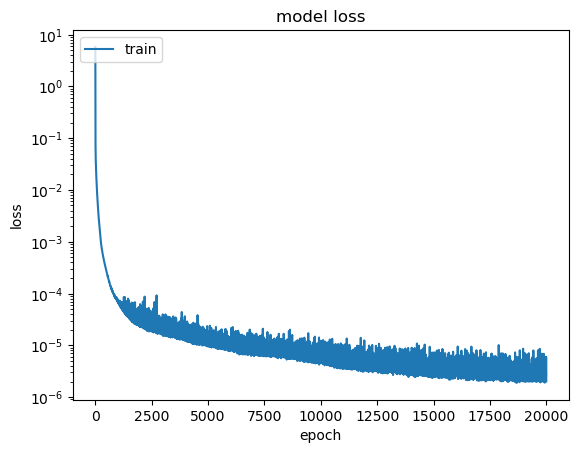

8

Epoch 1/20000
8/8 [==============================] - 8s 18ms/step - loss: 12.2653
Epoch 2/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.8356
Epoch 3/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.8784
Epoch 4/20000
8/8 [==============================] - 0s 25ms/step - loss: 0.6035
Epoch 5/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.3941
Epoch 6/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.2481
Epoch 7/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.2007
Epoch 8/20000
8/8 [==============================] - 0s 22ms/step - loss: 0.1690
Epoch 9/20000
8/8 [==============================] - 0s 9ms/step - loss: 0.1432
Epoch 10/20000
8/8 [==============================] - 0s 29ms/step - loss: 0.1277
Epoch 11/20000
8/8 [==============================] - 0s 12ms/step - loss: 0.1173
Epoch 12/20000
8/8 [==============================] - 0s 33ms/step - loss: 0.1070
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 28ms/step - loss: 0.0028
Epoch 102/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0027
Epoch 103/20000
8/8 [==============================] - 0s 10ms/step - loss: 0.0027
Epoch 104/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0026
Epoch 105/20000
8/8 [==============================] - 0s 9ms/step - loss: 0.0026
Epoch 106/20000
8/8 [==============================] - 0s 27ms/step - loss: 0.0025
Epoch 107/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.0025
Epoch 108/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0024
Epoch 109/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.0023
Epoch 110/20000
8/8 [==============================] - 0s 23ms/step - loss: 0.0023
Epoch 111/20000
8/8 [==============================] - 0s 9ms/step - loss: 0.0022
Epoch 112/20000
8/8 [==============================] - 0s 9ms/step - loss: 0.0022
Epoch 113/20000
8/8 [==

Epoch 198/20000
8/8 [==============================] - 0s 19ms/step - loss: 6.0970e-04
Epoch 199/20000
8/8 [==============================] - 0s 18ms/step - loss: 6.0381e-04
Epoch 200/20000
8/8 [==============================] - 0s 27ms/step - loss: 6.0086e-04
Epoch 201/20000
8/8 [==============================] - 0s 23ms/step - loss: 5.9727e-04
Epoch 202/20000
8/8 [==============================] - 0s 18ms/step - loss: 5.9257e-04
Epoch 203/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.8489e-04
Epoch 204/20000
8/8 [==============================] - 0s 15ms/step - loss: 5.7706e-04
Epoch 205/20000
8/8 [==============================] - 0s 43ms/step - loss: 5.7255e-04
Epoch 206/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.6766e-04
Epoch 207/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.6248e-04
Epoch 208/20000
8/8 [==============================] - 0s 23ms/step - loss: 5.6004e-04
Epoch 209/20000
8/8 [======================

8/8 [==============================] - 0s 16ms/step - loss: 3.3191e-04
Epoch 293/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3333e-04
Epoch 294/20000
8/8 [==============================] - 0s 25ms/step - loss: 3.3030e-04
Epoch 295/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.2927e-04
Epoch 296/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3221e-04
Epoch 297/20000
8/8 [==============================] - 0s 20ms/step - loss: 3.2772e-04
Epoch 298/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.2605e-04
Epoch 299/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2620e-04
Epoch 300/20000
8/8 [==============================] - 0s 19ms/step - loss: 3.2357e-04
Epoch 301/20000
8/8 [==============================] - 0s 27ms/step - loss: 3.1863e-04
Epoch 302/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.1804e-04
Epoch 303/20000
8/8 [==============================] - 0s 9ms/

8/8 [==============================] - 0s 12ms/step - loss: 2.1568e-04
Epoch 387/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.1453e-04
Epoch 388/20000
8/8 [==============================] - 0s 27ms/step - loss: 2.1338e-04
Epoch 389/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.1102e-04
Epoch 390/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1108e-04
Epoch 391/20000
8/8 [==============================] - 0s 17ms/step - loss: 2.1245e-04
Epoch 392/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1256e-04
Epoch 393/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0878e-04
Epoch 394/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.0774e-04
Epoch 395/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.0584e-04
Epoch 396/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.0458e-04
Epoch 397/20000
8/8 [==============================] - 0s 24m

8/8 [==============================] - 0s 4ms/step - loss: 1.4396e-04
Epoch 481/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4366e-04
Epoch 482/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4502e-04
Epoch 483/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4371e-04
Epoch 484/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4757e-04
Epoch 485/20000
8/8 [==============================] - 0s 19ms/step - loss: 1.4287e-04
Epoch 486/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.4011e-04
Epoch 487/20000
8/8 [==============================] - 0s 19ms/step - loss: 1.4018e-04
Epoch 488/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4018e-04
Epoch 489/20000
8/8 [==============================] - 0s 46ms/step - loss: 1.3969e-04
Epoch 490/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.3776e-04
Epoch 491/20000
8/8 [==============================] - 0s 15ms/st

8/8 [==============================] - 0s 5ms/step - loss: 1.0241e-04
Epoch 575/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.0086e-04
Epoch 576/20000
8/8 [==============================] - 0s 15ms/step - loss: 9.9970e-05
Epoch 577/20000
8/8 [==============================] - 0s 27ms/step - loss: 9.9286e-05
Epoch 578/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9335e-05
Epoch 579/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9375e-05
Epoch 580/20000
8/8 [==============================] - 0s 22ms/step - loss: 9.9137e-05
Epoch 581/20000
8/8 [==============================] - 0s 14ms/step - loss: 9.8471e-05
Epoch 582/20000
8/8 [==============================] - 0s 19ms/step - loss: 9.8356e-05
Epoch 583/20000
8/8 [==============================] - 0s 13ms/step - loss: 9.7373e-05
Epoch 584/20000
8/8 [==============================] - 0s 16ms/step - loss: 9.7269e-05
Epoch 585/20000
8/8 [==============================] - 0s 12ms

8/8 [==============================] - 0s 18ms/step - loss: 7.6656e-05
Epoch 669/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6764e-05
Epoch 670/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6922e-05
Epoch 671/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7633e-05
Epoch 672/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.6930e-05
Epoch 673/20000
8/8 [==============================] - 0s 21ms/step - loss: 7.5533e-05
Epoch 674/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.5267e-05
Epoch 675/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.7046e-05
Epoch 676/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6433e-05
Epoch 677/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.6263e-05
Epoch 678/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6675e-05
Epoch 679/20000
8/8 [==============================] - 0s 5ms/step 

8/8 [==============================] - 0s 15ms/step - loss: 6.5654e-05
Epoch 764/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5055e-05
Epoch 765/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5840e-05
Epoch 766/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5691e-05
Epoch 767/20000
8/8 [==============================] - 0s 16ms/step - loss: 6.1809e-05
Epoch 768/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3647e-05
Epoch 769/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1875e-05
Epoch 770/20000
8/8 [==============================] - 0s 15ms/step - loss: 6.1409e-05
Epoch 771/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3456e-05
Epoch 772/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.1192e-05
Epoch 773/20000
8/8 [==============================] - 0s 25ms/step - loss: 6.0725e-05
Epoch 774/20000
8/8 [==============================] - 0s 5ms/ste

8/8 [==============================] - 0s 5ms/step - loss: 5.7052e-05
Epoch 859/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5170e-05
Epoch 860/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7809e-05
Epoch 861/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0928e-05
Epoch 862/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8678e-05
Epoch 863/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9275e-05
Epoch 864/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5841e-05
Epoch 865/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2585e-05
Epoch 866/20000
8/8 [==============================] - 0s 27ms/step - loss: 5.2446e-05
Epoch 867/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3275e-05
Epoch 868/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9796e-05
Epoch 869/20000
8/8 [==============================] - 0s 11ms/step 

8/8 [==============================] - 0s 15ms/step - loss: 4.6577e-05
Epoch 954/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7116e-05
Epoch 955/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7214e-05
Epoch 956/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0268e-05
Epoch 957/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2456e-05
Epoch 958/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7539e-05
Epoch 959/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1007e-05
Epoch 960/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3215e-05
Epoch 961/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3009e-05
Epoch 962/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.8757e-05
Epoch 963/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0524e-05
Epoch 964/20000
8/8 [==============================] - 0s 10ms/step 

8/8 [==============================] - 0s 6ms/step - loss: 4.0828e-05
Epoch 1048/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9101e-05
Epoch 1049/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0145e-05
Epoch 1050/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4128e-05
Epoch 1051/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3065e-05
Epoch 1052/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7992e-05
Epoch 1053/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6450e-05
Epoch 1054/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7796e-05
Epoch 1055/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2209e-05
Epoch 1056/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5982e-05
Epoch 1057/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8210e-05
Epoch 1058/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 5.9929e-05
Epoch 1142/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7055e-05
Epoch 1143/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2748e-05
Epoch 1144/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3500e-05
Epoch 1145/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6908e-05
Epoch 1146/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7784e-05
Epoch 1147/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3021e-05
Epoch 1148/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4163e-05
Epoch 1149/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6225e-05
Epoch 1150/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1377e-05
Epoch 1151/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6852e-05
Epoch 1152/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 9ms/step - loss: 3.2813e-05
Epoch 1236/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2330e-05
Epoch 1237/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5782e-05
Epoch 1238/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2444e-05
Epoch 1239/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9627e-05
Epoch 1240/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0430e-05
Epoch 1241/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3141e-05
Epoch 1242/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2389e-05
Epoch 1243/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8325e-05
Epoch 1244/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1140e-05
Epoch 1245/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7401e-05
Epoch 1246/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 2.9028e-05
Epoch 1330/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8131e-05
Epoch 1331/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0867e-05
Epoch 1332/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.9165e-05
Epoch 1333/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0833e-05
Epoch 1334/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7207e-05
Epoch 1335/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6023e-05
Epoch 1336/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8551e-05
Epoch 1337/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6650e-05
Epoch 1338/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.7308e-05
Epoch 1339/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8174e-05
Epoch 1340/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 2.8878e-05
Epoch 1424/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8265e-05
Epoch 1425/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4293e-05
Epoch 1426/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5768e-05
Epoch 1427/20000
8/8 [==============================] - 0s 3ms/step - loss: 3.3432e-05
Epoch 1428/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8517e-05
Epoch 1429/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0194e-05
Epoch 1430/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7413e-05
Epoch 1431/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.5640e-05
Epoch 1432/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0169e-05
Epoch 1433/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0378e-05
Epoch 1434/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 3.1531e-05
Epoch 1518/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4177e-05
Epoch 1519/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3670e-05
Epoch 1520/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3457e-05
Epoch 1521/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4529e-05
Epoch 1522/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2124e-05
Epoch 1523/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4991e-05
Epoch 1524/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.2759e-05
Epoch 1525/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7676e-05
Epoch 1526/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4072e-05
Epoch 1527/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4744e-05
Epoch 1528/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 8ms/step - loss: 2.6056e-05
Epoch 1612/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4818e-05
Epoch 1613/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9098e-05
Epoch 1614/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7681e-05
Epoch 1615/20000
8/8 [==============================] - 0s 13ms/step - loss: 2.7797e-05
Epoch 1616/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3980e-05
Epoch 1617/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8936e-05
Epoch 1618/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.0938e-05
Epoch 1619/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0880e-05
Epoch 1620/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1959e-05
Epoch 1621/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1509e-05
Epoch 1622/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 4.0204e-05
Epoch 1706/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8449e-05
Epoch 1707/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4728e-05
Epoch 1708/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2428e-05
Epoch 1709/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7731e-05
Epoch 1710/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5883e-05
Epoch 1711/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4608e-05
Epoch 1712/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.8732e-05
Epoch 1713/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6301e-05
Epoch 1714/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2034e-05
Epoch 1715/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2901e-05
Epoch 1716/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 4.4370e-05
Epoch 1800/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5614e-05
Epoch 1801/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1811e-05
Epoch 1802/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2828e-05
Epoch 1803/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7817e-05
Epoch 1804/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7992e-05
Epoch 1805/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3755e-05
Epoch 1806/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.4366e-05
Epoch 1807/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4266e-05
Epoch 1808/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2397e-05
Epoch 1809/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8247e-05
Epoch 1810/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.8840e-05
Epoch 1894/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9499e-05
Epoch 1895/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4058e-05
Epoch 1896/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9062e-05
Epoch 1897/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3566e-05
Epoch 1898/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3647e-05
Epoch 1899/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8378e-05
Epoch 1900/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3862e-05
Epoch 1901/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5762e-05
Epoch 1902/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7885e-05
Epoch 1903/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9615e-05
Epoch 1904/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 3.0347e-05
Epoch 1988/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2696e-05
Epoch 1989/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0267e-05
Epoch 1990/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.9540e-05
Epoch 1991/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2117e-05
Epoch 1992/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6248e-05
Epoch 1993/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4463e-05
Epoch 1994/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3978e-05
Epoch 1995/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5385e-05
Epoch 1996/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0187e-05
Epoch 1997/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1251e-05
Epoch 1998/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.9781e-05
Epoch 2082/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8121e-05
Epoch 2083/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.7344e-05
Epoch 2084/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9729e-05
Epoch 2085/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.4645e-05
Epoch 2086/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.6090e-05
Epoch 2087/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8391e-05
Epoch 2088/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7435e-05
Epoch 2089/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2463e-05
Epoch 2090/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8487e-05
Epoch 2091/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4317e-05
Epoch 2092/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 2.6071e-05
Epoch 2176/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0749e-05
Epoch 2177/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6307e-05
Epoch 2178/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9458e-05
Epoch 2179/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4987e-05
Epoch 2180/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.4633e-05
Epoch 2181/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8008e-05
Epoch 2182/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8018e-05
Epoch 2183/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6648e-05
Epoch 2184/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6229e-05
Epoch 2185/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3746e-05
Epoch 2186/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.6565e-05
Epoch 2270/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8439e-05
Epoch 2271/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0869e-05
Epoch 2272/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7017e-05
Epoch 2273/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7754e-05
Epoch 2274/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5498e-05
Epoch 2275/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7754e-05
Epoch 2276/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5919e-05
Epoch 2277/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6585e-05
Epoch 2278/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5292e-05
Epoch 2279/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8942e-05
Epoch 2280/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.8174e-05
Epoch 2364/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.4725e-05
Epoch 2365/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4232e-05
Epoch 2366/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4000e-05
Epoch 2367/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4180e-05
Epoch 2368/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8067e-05
Epoch 2369/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4280e-05
Epoch 2370/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4261e-05
Epoch 2371/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7587e-05
Epoch 2372/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1278e-05
Epoch 2373/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.3901e-05
Epoch 2374/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 1.6871e-05
Epoch 2458/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9620e-05
Epoch 2459/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5766e-05
Epoch 2460/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9972e-05
Epoch 2461/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3220e-05
Epoch 2462/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3994e-05
Epoch 2463/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5929e-05
Epoch 2464/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9113e-05
Epoch 2465/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8954e-05
Epoch 2466/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6530e-05
Epoch 2467/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7255e-05
Epoch 2468/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.6566e-05
Epoch 2552/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7786e-05
Epoch 2553/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9158e-05
Epoch 2554/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9653e-05
Epoch 2555/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2115e-05
Epoch 2556/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2843e-05
Epoch 2557/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8423e-05
Epoch 2558/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6609e-05
Epoch 2559/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2856e-05
Epoch 2560/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2962e-05
Epoch 2561/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4496e-05
Epoch 2562/20000
8/8 [==============================] - 0s 8

8/8 [==============================] - 0s 5ms/step - loss: 2.8062e-05
Epoch 2646/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8784e-05
Epoch 2647/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1289e-05
Epoch 2648/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7855e-05
Epoch 2649/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4535e-05
Epoch 2650/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7087e-05
Epoch 2651/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4762e-05
Epoch 2652/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4451e-05
Epoch 2653/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7706e-05
Epoch 2654/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0798e-05
Epoch 2655/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7775e-05
Epoch 2656/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.6784e-05
Epoch 2740/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3494e-05
Epoch 2741/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9166e-05
Epoch 2742/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6491e-05
Epoch 2743/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3116e-05
Epoch 2744/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3454e-05
Epoch 2745/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2447e-05
Epoch 2746/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2542e-05
Epoch 2747/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6974e-05
Epoch 2748/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4326e-05
Epoch 2749/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6236e-05
Epoch 2750/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.4135e-05
Epoch 2834/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4566e-05
Epoch 2835/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2746e-05
Epoch 2836/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3725e-05
Epoch 2837/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3358e-05
Epoch 2838/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4675e-05
Epoch 2839/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5215e-05
Epoch 2840/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3532e-05
Epoch 2841/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2655e-05
Epoch 2842/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4249e-05
Epoch 2843/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8445e-05
Epoch 2844/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 9ms/step - loss: 1.4722e-05
Epoch 2928/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6443e-05
Epoch 2929/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2920e-05
Epoch 2930/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6982e-05
Epoch 2931/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4838e-05
Epoch 2932/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5292e-05
Epoch 2933/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4259e-05
Epoch 2934/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.4496e-05
Epoch 2935/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9152e-05
Epoch 2936/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9272e-05
Epoch 2937/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1355e-05
Epoch 2938/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.3380e-05
Epoch 3022/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.9111e-05
Epoch 3023/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6177e-05
Epoch 3024/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0456e-05
Epoch 3025/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4031e-05
Epoch 3026/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3854e-05
Epoch 3027/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9738e-05
Epoch 3028/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0879e-05
Epoch 3029/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8563e-05
Epoch 3030/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3053e-05
Epoch 3031/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2943e-05
Epoch 3032/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.6826e-05
Epoch 3116/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2016e-05
Epoch 3117/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1679e-05
Epoch 3118/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2473e-05
Epoch 3119/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8275e-05
Epoch 3120/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6567e-05
Epoch 3121/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7543e-05
Epoch 3122/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7340e-05
Epoch 3123/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7459e-05
Epoch 3124/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0804e-05
Epoch 3125/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3570e-05
Epoch 3126/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.4106e-05
Epoch 3210/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4147e-05
Epoch 3211/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2956e-05
Epoch 3212/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3108e-05
Epoch 3213/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1405e-05
Epoch 3214/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6921e-05
Epoch 3215/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.2295e-05
Epoch 3216/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0096e-05
Epoch 3217/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1407e-05
Epoch 3218/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4589e-05
Epoch 3219/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4445e-05
Epoch 3220/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.3900e-05
Epoch 3304/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1544e-05
Epoch 3305/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1892e-05
Epoch 3306/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1852e-05
Epoch 3307/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3977e-05
Epoch 3308/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2621e-05
Epoch 3309/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3525e-05
Epoch 3310/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.3024e-05
Epoch 3311/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4123e-05
Epoch 3312/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5498e-05
Epoch 3313/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9032e-05
Epoch 3314/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.2556e-05
Epoch 3398/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6781e-05
Epoch 3399/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.4970e-05
Epoch 3400/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6038e-05
Epoch 3401/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1168e-05
Epoch 3402/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2590e-05
Epoch 3403/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.3316e-05
Epoch 3404/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4480e-05
Epoch 3405/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3275e-05
Epoch 3406/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1203e-05
Epoch 3407/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1382e-05
Epoch 3408/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.7572e-05
Epoch 3492/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8820e-05
Epoch 3493/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4204e-05
Epoch 3494/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3793e-05
Epoch 3495/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.5804e-05
Epoch 3496/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1751e-05
Epoch 3497/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1204e-05
Epoch 3498/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1923e-05
Epoch 3499/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1941e-05
Epoch 3500/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1717e-05
Epoch 3501/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2069e-05
Epoch 3502/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.5165e-05
Epoch 3586/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1680e-05
Epoch 3587/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1534e-05
Epoch 3588/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1026e-05
Epoch 3589/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.2756e-05
Epoch 3590/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5306e-05
Epoch 3591/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1941e-05
Epoch 3592/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1454e-05
Epoch 3593/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1432e-05
Epoch 3594/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5699e-05
Epoch 3595/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4425e-05
Epoch 3596/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.3297e-05
Epoch 3680/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1514e-05
Epoch 3681/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3541e-05
Epoch 3682/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2351e-05
Epoch 3683/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1711e-05
Epoch 3684/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4903e-05
Epoch 3685/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3166e-05
Epoch 3686/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0865e-05
Epoch 3687/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2017e-05
Epoch 3688/20000
8/8 [==============================] - 0s 22ms/step - loss: 9.8527e-06
Epoch 3689/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0866e-05
Epoch 3690/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.2631e-05
Epoch 3774/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4158e-05
Epoch 3775/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6086e-05
Epoch 3776/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2723e-05
Epoch 3777/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1958e-05
Epoch 3778/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1799e-05
Epoch 3779/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.1316e-05
Epoch 3780/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0433e-05
Epoch 3781/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0770e-05
Epoch 3782/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5491e-05
Epoch 3783/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4605e-05
Epoch 3784/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 1.0637e-05
Epoch 3868/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3896e-05
Epoch 3869/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0143e-05
Epoch 3870/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1526e-05
Epoch 3871/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2542e-05
Epoch 3872/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6394e-05
Epoch 3873/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3200e-05
Epoch 3874/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0934e-05
Epoch 3875/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0855e-05
Epoch 3876/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1812e-05
Epoch 3877/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4497e-05
Epoch 3878/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.4641e-05
Epoch 3962/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7789e-05
Epoch 3963/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3397e-05
Epoch 3964/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1128e-05
Epoch 3965/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3558e-05
Epoch 3966/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.8363e-05
Epoch 3967/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7564e-05
Epoch 3968/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9589e-05
Epoch 3969/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6719e-05
Epoch 3970/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3995e-05
Epoch 3971/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2180e-05
Epoch 3972/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.4078e-05
Epoch 4056/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9952e-05
Epoch 4057/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8487e-05
Epoch 4058/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1656e-05
Epoch 4059/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7797e-05
Epoch 4060/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7770e-05
Epoch 4061/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.8299e-05
Epoch 4062/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2720e-05
Epoch 4063/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0622e-05
Epoch 4064/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2199e-05
Epoch 4065/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4405e-05
Epoch 4066/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.8201e-05
Epoch 4150/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9026e-05
Epoch 4151/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5237e-05
Epoch 4152/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3503e-05
Epoch 4153/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3586e-05
Epoch 4154/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3679e-05
Epoch 4155/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1504e-05
Epoch 4156/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1315e-05
Epoch 4157/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7714e-05
Epoch 4158/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.1538e-05
Epoch 4159/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9128e-05
Epoch 4160/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.5596e-05
Epoch 4244/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1426e-05
Epoch 4245/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1847e-05
Epoch 4246/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2745e-05
Epoch 4247/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1181e-05
Epoch 4248/20000
8/8 [==============================] - 0s 20ms/step - loss: 9.3647e-06
Epoch 4249/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9561e-06
Epoch 4250/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6288e-06
Epoch 4251/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0388e-05
Epoch 4252/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2740e-05
Epoch 4253/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0610e-05
Epoch 4254/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 2.0483e-05
Epoch 4338/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5033e-05
Epoch 4339/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3181e-05
Epoch 4340/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0108e-05
Epoch 4341/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0187e-05
Epoch 4342/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0799e-05
Epoch 4343/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6889e-05
Epoch 4344/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0593e-05
Epoch 4345/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3925e-05
Epoch 4346/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0665e-05
Epoch 4347/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0452e-05
Epoch 4348/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 11ms/step - loss: 1.0436e-05
Epoch 4432/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3644e-05
Epoch 4433/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4430e-05
Epoch 4434/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3404e-05
Epoch 4435/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.4835e-05
Epoch 4436/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1874e-05
Epoch 4437/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2897e-05
Epoch 4438/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2058e-05
Epoch 4439/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4674e-05
Epoch 4440/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4838e-05
Epoch 4441/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2120e-05
Epoch 4442/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.3056e-05
Epoch 4526/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6010e-05
Epoch 4527/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2844e-05
Epoch 4528/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2617e-05
Epoch 4529/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3013e-05
Epoch 4530/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1230e-05
Epoch 4531/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3952e-05
Epoch 4532/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5884e-05
Epoch 4533/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9242e-06
Epoch 4534/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1569e-05
Epoch 4535/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5047e-05
Epoch 4536/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.8019e-05
Epoch 4620/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1362e-05
Epoch 4621/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.2517e-05
Epoch 4622/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2222e-05
Epoch 4623/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0471e-05
Epoch 4624/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1156e-05
Epoch 4625/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1434e-05
Epoch 4626/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0803e-05
Epoch 4627/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0539e-05
Epoch 4628/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1147e-05
Epoch 4629/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3297e-05
Epoch 4630/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.1782e-05
Epoch 4714/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0752e-05
Epoch 4715/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0360e-05
Epoch 4716/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0257e-05
Epoch 4717/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0811e-05
Epoch 4718/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.5169e-05
Epoch 4719/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2806e-05
Epoch 4720/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0386e-05
Epoch 4721/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0909e-05
Epoch 4722/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1904e-05
Epoch 4723/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0204e-05
Epoch 4724/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.8125e-05
Epoch 4808/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5441e-05
Epoch 4809/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1822e-05
Epoch 4810/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0544e-05
Epoch 4811/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1866e-05
Epoch 4812/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1090e-05
Epoch 4813/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2741e-05
Epoch 4814/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0715e-05
Epoch 4815/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0356e-05
Epoch 4816/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.3875e-05
Epoch 4817/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1140e-05
Epoch 4818/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.0069e-05
Epoch 4902/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3832e-06
Epoch 4903/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1393e-05
Epoch 4904/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4674e-05
Epoch 4905/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2423e-05
Epoch 4906/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2221e-05
Epoch 4907/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2562e-05
Epoch 4908/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7704e-06
Epoch 4909/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.9315e-06
Epoch 4910/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1634e-05
Epoch 4911/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5814e-05
Epoch 4912/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 1.2406e-05
Epoch 4996/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1526e-05
Epoch 4997/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1157e-05
Epoch 4998/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1378e-05
Epoch 4999/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1612e-05
Epoch 5000/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2130e-05
Epoch 5001/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0535e-05
Epoch 5002/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3503e-06
Epoch 5003/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0432e-05
Epoch 5004/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0035e-05
Epoch 5005/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0635e-05
Epoch 5006/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 1.2070e-05
Epoch 5090/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2609e-05
Epoch 5091/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0188e-05
Epoch 5092/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1155e-05
Epoch 5093/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5461e-05
Epoch 5094/20000
8/8 [==============================] - 0s 13ms/step - loss: 1.3023e-05
Epoch 5095/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1030e-05
Epoch 5096/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0560e-05
Epoch 5097/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0732e-05
Epoch 5098/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1332e-05
Epoch 5099/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6937e-06
Epoch 5100/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 9ms/step - loss: 1.8684e-05
Epoch 5184/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4216e-05
Epoch 5185/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3897e-05
Epoch 5186/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.6142e-05
Epoch 5187/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1885e-05
Epoch 5188/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0963e-05
Epoch 5189/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1705e-05
Epoch 5190/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.2001e-05
Epoch 5191/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2562e-06
Epoch 5192/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0037e-06
Epoch 5193/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0688e-05
Epoch 5194/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 10ms/step - loss: 1.1106e-05
Epoch 5278/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1347e-06
Epoch 5279/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2291e-05
Epoch 5280/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4082e-05
Epoch 5281/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1853e-05
Epoch 5282/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2058e-05
Epoch 5283/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1656e-05
Epoch 5284/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4636e-05
Epoch 5285/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0661e-05
Epoch 5286/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0483e-05
Epoch 5287/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0932e-05
Epoch 5288/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.3227e-05
Epoch 5372/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3589e-05
Epoch 5373/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3189e-05
Epoch 5374/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2318e-05
Epoch 5375/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0820e-05
Epoch 5376/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0218e-05
Epoch 5377/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.8666e-06
Epoch 5378/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4468e-06
Epoch 5379/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1945e-05
Epoch 5380/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1274e-05
Epoch 5381/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.0910e-06
Epoch 5382/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 9.8998e-06
Epoch 5466/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6021e-06
Epoch 5467/20000
8/8 [==============================] - 0s 21ms/step - loss: 9.1625e-06
Epoch 5468/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7639e-06
Epoch 5469/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9851e-06
Epoch 5470/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.0079e-05
Epoch 5471/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2804e-05
Epoch 5472/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2157e-05
Epoch 5473/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0279e-05
Epoch 5474/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0682e-05
Epoch 5475/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4519e-05
Epoch 5476/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 9.2494e-06
Epoch 5583/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8290e-06
Epoch 5584/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4730e-06
Epoch 5585/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.1122e-06
Epoch 5586/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7869e-06
Epoch 5587/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.2018e-06
Epoch 5588/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1157e-06
Epoch 5589/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0239e-05
Epoch 5590/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7893e-06
Epoch 5591/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8149e-06
Epoch 5592/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5627e-06
Epoch 5593/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 5ms/step - loss: 9.7928e-06
Epoch 5784/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2986e-05
Epoch 5785/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0707e-05
Epoch 5786/20000
8/8 [==============================] - 0s 13ms/step - loss: 9.6880e-06
Epoch 5787/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0131e-05
Epoch 5788/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0759e-05
Epoch 5789/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5304e-06
Epoch 5790/20000
8/8 [==============================] - 0s 14ms/step - loss: 9.3517e-06
Epoch 5791/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2510e-05
Epoch 5792/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5957e-05
Epoch 5793/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1993e-05
Epoch 5794/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 5ms/step - loss: 9.5035e-06
Epoch 5878/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5569e-06
Epoch 5879/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6904e-06
Epoch 5880/20000
8/8 [==============================] - 0s 19ms/step - loss: 9.2904e-06
Epoch 5881/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0461e-05
Epoch 5882/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0598e-05
Epoch 5883/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2445e-05
Epoch 5884/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0689e-05
Epoch 5885/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0253e-05
Epoch 5886/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0690e-05
Epoch 5887/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5113e-06
Epoch 5888/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 8.7286e-06
Epoch 5995/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.2349e-06
Epoch 5996/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9940e-06
Epoch 5997/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5399e-06
Epoch 5998/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.5349e-06
Epoch 5999/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.4349e-06
Epoch 6000/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7349e-06
Epoch 6001/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0002e-05
Epoch 6002/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1369e-05
Epoch 6003/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0518e-05
Epoch 6004/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2411e-05
Epoch 6005/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 8.0854e-06
Epoch 6089/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1811e-06
Epoch 6090/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.8751e-06
Epoch 6091/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2341e-05
Epoch 6092/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2677e-05
Epoch 6093/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0557e-06
Epoch 6094/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.5928e-06
Epoch 6095/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7067e-06
Epoch 6096/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9642e-06
Epoch 6097/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.8674e-06
Epoch 6098/20000
8/8 [==============================] - 0s 17ms/step - loss: 7.4876e-06
Epoch 6099/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 7ms/step - loss: 9.4157e-06
Epoch 6296/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0388e-05
Epoch 6297/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0436e-05
Epoch 6298/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9618e-06
Epoch 6299/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0927e-05
Epoch 6300/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0312e-05
Epoch 6301/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.2164e-06
Epoch 6302/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3155e-06
Epoch 6303/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2084e-06
Epoch 6304/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.0413e-06
Epoch 6305/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.9475e-06
Epoch 6306/20000
8/8 [==============================] - 0s 5

Epoch 6415/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0354e-05
Epoch 6416/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8351e-06
Epoch 6417/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0483e-06
Epoch 6418/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7328e-06
Epoch 6419/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2098e-05
Epoch 6420/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9895e-06
Epoch 6421/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2974e-05
Epoch 6422/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5618e-05
Epoch 6423/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0867e-05
Epoch 6424/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3754e-06
Epoch 6425/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.0936e-06
Epoch 6426/20000
8/8 [====================

8/8 [==============================] - 0s 4ms/step - loss: 1.1395e-05
Epoch 6510/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2466e-05
Epoch 6511/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.4655e-06
Epoch 6512/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0561e-06
Epoch 6513/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5860e-06
Epoch 6514/20000
8/8 [==============================] - 0s 14ms/step - loss: 7.7169e-06
Epoch 6515/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3436e-06
Epoch 6516/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6005e-06
Epoch 6517/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1523e-06
Epoch 6518/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.2143e-06
Epoch 6519/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1017e-05
Epoch 6520/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 9.6219e-06
Epoch 6642/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6868e-06
Epoch 6643/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3096e-06
Epoch 6644/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5812e-06
Epoch 6645/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.0775e-06
Epoch 6646/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2290e-06
Epoch 6647/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3661e-06
Epoch 6648/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8195e-06
Epoch 6649/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.5734e-06
Epoch 6650/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8934e-06
Epoch 6651/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4320e-06
Epoch 6652/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 11ms/step - loss: 9.2322e-06
Epoch 6736/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0257e-05
Epoch 6737/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3109e-06
Epoch 6738/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.8900e-06
Epoch 6739/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.2742e-06
Epoch 6740/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5769e-06
Epoch 6741/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1020e-05
Epoch 6742/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6323e-06
Epoch 6743/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6143e-06
Epoch 6744/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.4427e-06
Epoch 6745/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7956e-06
Epoch 6746/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 8.9923e-06
Epoch 6859/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5730e-06
Epoch 6860/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9660e-06
Epoch 6861/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8544e-06
Epoch 6862/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0442e-05
Epoch 6863/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1864e-05
Epoch 6864/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.0411e-05
Epoch 6865/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5093e-06
Epoch 6866/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0225e-06
Epoch 6867/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6443e-06
Epoch 6868/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0069e-06
Epoch 6869/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 8.8319e-06
Epoch 6953/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3446e-06
Epoch 6954/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7897e-06
Epoch 6955/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8224e-06
Epoch 6956/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3855e-06
Epoch 6957/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.9625e-06
Epoch 6958/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8227e-06
Epoch 6959/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0338e-05
Epoch 6960/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4748e-06
Epoch 6961/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2278e-06
Epoch 6962/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0260e-06
Epoch 6963/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 4ms/step - loss: 7.8123e-06
Epoch 7085/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5393e-06
Epoch 7086/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.5613e-06
Epoch 7087/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.9692e-06
Epoch 7088/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4996e-06
Epoch 7089/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1222e-06
Epoch 7090/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4997e-06
Epoch 7091/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1039e-05
Epoch 7092/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0801e-05
Epoch 7093/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2204e-06
Epoch 7094/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8156e-06
Epoch 7095/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 6ms/step - loss: 6.3865e-06
Epoch 7208/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5664e-06
Epoch 7209/20000
8/8 [==============================] - 0s 15ms/step - loss: 8.2750e-06
Epoch 7210/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.4105e-06
Epoch 7211/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7496e-06
Epoch 7212/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5859e-06
Epoch 7213/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1894e-06
Epoch 7214/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9231e-06
Epoch 7215/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3324e-06
Epoch 7216/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8958e-06
Epoch 7217/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1432e-06
Epoch 7218/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 9.0597e-06
Epoch 7302/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3581e-06
Epoch 7303/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.7923e-06
Epoch 7304/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9488e-06
Epoch 7305/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0528e-06
Epoch 7306/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9512e-06
Epoch 7307/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2981e-06
Epoch 7308/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8195e-06
Epoch 7309/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0312e-05
Epoch 7310/20000
8/8 [==============================] - 0s 11ms/step - loss: 9.5963e-06
Epoch 7311/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0225e-05
Epoch 7312/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 8.5941e-06
Epoch 7518/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0092e-05
Epoch 7519/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9083e-06
Epoch 7520/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8376e-06
Epoch 7521/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1050e-06
Epoch 7522/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9887e-06
Epoch 7523/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3484e-06
Epoch 7524/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2921e-06
Epoch 7525/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6300e-06
Epoch 7526/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9492e-06
Epoch 7527/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4746e-06
Epoch 7528/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.1613e-06
Epoch 7612/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4847e-06
Epoch 7613/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1274e-06
Epoch 7614/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.3402e-06
Epoch 7615/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2048e-06
Epoch 7616/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8612e-06
Epoch 7617/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.4763e-06
Epoch 7618/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.4319e-06
Epoch 7619/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3900e-06
Epoch 7620/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1396e-06
Epoch 7621/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2167e-05
Epoch 7622/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 5.9559e-06
Epoch 7736/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5218e-06
Epoch 7737/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.5413e-06
Epoch 7738/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5359e-06
Epoch 7739/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2163e-06
Epoch 7740/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9699e-06
Epoch 7741/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8227e-06
Epoch 7742/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.1350e-06
Epoch 7743/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6346e-06
Epoch 7744/20000
8/8 [==============================] - 0s 14ms/step - loss: 7.7039e-06
Epoch 7745/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3908e-06
Epoch 7746/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 6.1824e-06
Epoch 7855/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9171e-06
Epoch 7856/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7580e-06
Epoch 7857/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0200e-06
Epoch 7858/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6002e-06
Epoch 7859/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0673e-06
Epoch 7860/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5825e-06
Epoch 7861/20000
8/8 [==============================] - 0s 16ms/step - loss: 9.5159e-06
Epoch 7862/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4275e-05
Epoch 7863/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8638e-06
Epoch 7864/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6133e-06
Epoch 7865/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 6.7589e-06
Epoch 7949/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9937e-06
Epoch 7950/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8314e-06
Epoch 7951/20000
8/8 [==============================] - 0s 18ms/step - loss: 6.1128e-06
Epoch 7952/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9646e-06
Epoch 7953/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4725e-06
Epoch 7954/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1160e-06
Epoch 7955/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7005e-06
Epoch 7956/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6962e-06
Epoch 7957/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7166e-06
Epoch 7958/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0091e-06
Epoch 7959/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 10ms/step - loss: 6.9320e-06
Epoch 8172/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8067e-06
Epoch 8173/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8183e-06
Epoch 8174/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0249e-06
Epoch 8175/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.9475e-06
Epoch 8176/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.6560e-06
Epoch 8177/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5438e-06
Epoch 8178/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4576e-06
Epoch 8179/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6395e-06
Epoch 8180/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6562e-06
Epoch 8181/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2784e-06
Epoch 8182/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 7.5703e-06
Epoch 8266/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2456e-06
Epoch 8267/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3752e-06
Epoch 8268/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6837e-06
Epoch 8269/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2098e-06
Epoch 8270/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.9543e-06
Epoch 8271/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0069e-06
Epoch 8272/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2405e-06
Epoch 8273/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9047e-06
Epoch 8274/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1733e-06
Epoch 8275/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.7414e-06
Epoch 8276/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 9ms/step - loss: 5.8027e-06
Epoch 8390/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6176e-06
Epoch 8391/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2109e-06
Epoch 8392/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6826e-06
Epoch 8393/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8968e-06
Epoch 8394/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4816e-06
Epoch 8395/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7110e-06
Epoch 8396/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.0402e-06
Epoch 8397/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0333e-06
Epoch 8398/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8496e-06
Epoch 8399/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2601e-06
Epoch 8400/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 8ms/step - loss: 6.1444e-06
Epoch 8484/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6143e-06
Epoch 8485/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8964e-06
Epoch 8486/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3205e-05
Epoch 8487/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5173e-06
Epoch 8488/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9900e-06
Epoch 8489/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.5411e-06
Epoch 8516/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1768e-05
Epoch 8517/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1366e-05
Epoch 8518/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4082e-05
Epoch 8519/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2145e-05
Epoch 8520/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 9.5472e-06
Epoch 8603/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.9984e-06
Epoch 8604/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2735e-06
Epoch 8605/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3503e-06
Epoch 8606/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7371e-06
Epoch 8607/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9174e-06
Epoch 8608/20000
8/8 [==============================] - 0s 14ms/step - loss: 7.4311e-06
Epoch 8609/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5670e-06
Epoch 8610/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5427e-06
Epoch 8611/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5205e-06
Epoch 8612/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0594e-05
Epoch 8613/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 5.6384e-06
Epoch 8721/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8057e-06
Epoch 8722/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9499e-06
Epoch 8723/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7237e-06
Epoch 8724/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.3696e-06
Epoch 8725/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4582e-06
Epoch 8726/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.9764e-06
Epoch 8727/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9237e-06
Epoch 8728/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4364e-06
Epoch 8729/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8780e-06
Epoch 8730/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1675e-06
Epoch 8731/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 6.0979e-06
Epoch 8815/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0265e-06
Epoch 8816/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2992e-06
Epoch 8817/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4334e-06
Epoch 8818/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0025e-06
Epoch 8819/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5218e-06
Epoch 8820/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3071e-06
Epoch 8821/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0022e-05
Epoch 8822/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.3229e-06
Epoch 8823/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6085e-06
Epoch 8824/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1488e-06
Epoch 8825/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 5.4515e-06
Epoch 9028/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2414e-06
Epoch 9029/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1495e-06
Epoch 9030/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2392e-06
Epoch 9031/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6046e-06
Epoch 9032/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7350e-06
Epoch 9033/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0138e-06
Epoch 9034/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8383e-06
Epoch 9035/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.4571e-06
Epoch 9036/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6524e-06
Epoch 9037/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.8873e-06
Epoch 9038/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 6.2689e-06
Epoch 9122/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.0813e-06
Epoch 9123/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3435e-06
Epoch 9124/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4114e-06
Epoch 9125/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0241e-05
Epoch 9126/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0035e-05
Epoch 9127/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4195e-06
Epoch 9128/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7855e-06
Epoch 9129/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3834e-06
Epoch 9130/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0362e-06
Epoch 9131/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5322e-06
Epoch 9132/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 6.1770e-06
Epoch 9242/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0470e-06
Epoch 9243/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1459e-06
Epoch 9244/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9782e-06
Epoch 9245/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6435e-06
Epoch 9246/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.2886e-06
Epoch 9247/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0601e-06
Epoch 9248/20000
8/8 [==============================] - 0s 13ms/step - loss: 6.2617e-06
Epoch 9249/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1215e-06
Epoch 9250/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3135e-06
Epoch 9251/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.3943e-06
Epoch 9252/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 5.3658e-06
Epoch 9359/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1529e-06
Epoch 9360/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8003e-06
Epoch 9361/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9370e-06
Epoch 9362/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.7306e-06
Epoch 9363/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.9090e-06
Epoch 9364/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5691e-06
Epoch 9365/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5023e-06
Epoch 9366/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2048e-06
Epoch 9367/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5468e-06
Epoch 9368/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5304e-06
Epoch 9369/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.0643e-06
Epoch 9453/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6984e-06
Epoch 9454/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.0417e-06
Epoch 9455/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1698e-06
Epoch 9456/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5343e-06
Epoch 9457/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.0309e-06
Epoch 9458/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3326e-06
Epoch 9459/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4517e-06
Epoch 9460/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4045e-06
Epoch 9461/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3644e-06
Epoch 9462/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1728e-06
Epoch 9463/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 7ms/step - loss: 5.6842e-06
Epoch 9569/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4152e-06
Epoch 9570/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8716e-06
Epoch 9571/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3417e-06
Epoch 9572/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6655e-06
Epoch 9573/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0441e-06
Epoch 9574/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6142e-06
Epoch 9575/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.7698e-06
Epoch 9576/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7483e-06
Epoch 9577/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6959e-06
Epoch 9578/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7669e-06
Epoch 9579/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.5320e-06
Epoch 9663/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7983e-06
Epoch 9664/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5887e-06
Epoch 9665/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0305e-06
Epoch 9666/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.6253e-06
Epoch 9667/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0272e-06
Epoch 9668/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6067e-06
Epoch 9669/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0868e-06
Epoch 9670/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4832e-06
Epoch 9671/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9389e-06
Epoch 9672/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0992e-06
Epoch 9673/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 7.8203e-06
Epoch 9881/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5638e-06
Epoch 9882/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2108e-06
Epoch 9883/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.8169e-06
Epoch 9884/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2151e-06
Epoch 9885/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5963e-06
Epoch 9886/20000
8/8 [==============================] - 0s 19ms/step - loss: 4.7912e-06
Epoch 9887/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0931e-06
Epoch 9888/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7882e-06
Epoch 9889/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4839e-06
Epoch 9890/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.4148e-06
Epoch 9891/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 5.8767e-06
Epoch 9998/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5952e-06
Epoch 9999/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5511e-06
Epoch 10000/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3324e-06
Epoch 10001/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7467e-06
Epoch 10002/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.2011e-06
Epoch 10003/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2794e-05
Epoch 10004/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4891e-06
Epoch 10005/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.8329e-06
Epoch 10006/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4386e-06
Epoch 10007/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2317e-06
Epoch 10008/20000
8/8 [=============================

8/8 [==============================] - 0s 5ms/step - loss: 5.5458e-06
Epoch 10091/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4438e-06
Epoch 10092/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.0041e-06
Epoch 10093/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4835e-06
Epoch 10094/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9695e-06
Epoch 10095/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4023e-06
Epoch 10096/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8744e-06
Epoch 10097/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9762e-06
Epoch 10098/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1801e-06
Epoch 10099/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7396e-06
Epoch 10100/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9049e-06
Epoch 10101/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.9932e-06
Epoch 10291/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9619e-06
Epoch 10292/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6457e-06
Epoch 10293/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8734e-06
Epoch 10294/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5668e-06
Epoch 10295/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7728e-06
Epoch 10296/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0547e-06
Epoch 10297/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2351e-06
Epoch 10298/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5630e-06
Epoch 10299/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4607e-06
Epoch 10300/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0847e-06
Epoch 10301/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.9425e-06
Epoch 10384/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0441e-06
Epoch 10385/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3045e-06
Epoch 10386/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3557e-06
Epoch 10387/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0185e-06
Epoch 10388/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0163e-06
Epoch 10389/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9364e-06
Epoch 10390/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1450e-06
Epoch 10391/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6718e-06
Epoch 10392/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9409e-06
Epoch 10393/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5820e-06
Epoch 10394/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.1802e-06
Epoch 10504/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6536e-06
Epoch 10505/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.1650e-06
Epoch 10506/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5602e-06
Epoch 10507/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3736e-06
Epoch 10508/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9516e-06
Epoch 10509/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1272e-06
Epoch 10510/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1979e-06
Epoch 10511/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2189e-06
Epoch 10512/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1934e-06
Epoch 10513/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1339e-06
Epoch 10514/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 4.9500e-06
Epoch 10597/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0588e-06
Epoch 10598/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8377e-06
Epoch 10599/20000
8/8 [==============================] - 0s 12ms/step - loss: 5.1102e-06
Epoch 10600/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9634e-06
Epoch 10601/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8331e-06
Epoch 10602/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7867e-06
Epoch 10603/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5705e-06
Epoch 10604/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3334e-06
Epoch 10724/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3452e-06
Epoch 10725/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5853e-06
Epoch 10726/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 7.6168e-06
Epoch 10808/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4029e-06
Epoch 10809/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0889e-06
Epoch 10810/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.5028e-06
Epoch 10811/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7027e-06
Epoch 10812/20000
8/8 [==============================] - 0s 17ms/step - loss: 7.8435e-06
Epoch 10813/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5649e-06
Epoch 10814/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0994e-06
Epoch 10815/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3180e-06
Epoch 10816/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4086e-06
Epoch 10817/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0450e-06
Epoch 10818/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 6.2660e-06
Epoch 10929/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9278e-06
Epoch 10930/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5566e-06
Epoch 10931/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0564e-06
Epoch 10932/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7851e-06
Epoch 10933/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.0134e-06
Epoch 10934/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8155e-06
Epoch 10935/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2379e-06
Epoch 10936/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1630e-06
Epoch 10937/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8601e-06
Epoch 10938/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2259e-06
Epoch 10939/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 6.9872e-06
Epoch 11022/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1543e-06
Epoch 11023/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5722e-06
Epoch 11024/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.6714e-06
Epoch 11025/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3235e-06
Epoch 11026/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5673e-06
Epoch 11027/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5635e-06
Epoch 11028/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.9789e-06
Epoch 11029/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6031e-06
Epoch 11030/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2076e-06
Epoch 11031/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9027e-06
Epoch 11032/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 7.3693e-06
Epoch 11235/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9656e-06
Epoch 11236/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4504e-06
Epoch 11237/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.5049e-06
Epoch 11238/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7576e-06
Epoch 11239/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.3041e-06
Epoch 11240/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5675e-06
Epoch 11241/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2814e-06
Epoch 11242/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1341e-06
Epoch 11243/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0455e-06
Epoch 11244/20000
8/8 [==============================] - 0s 16ms/step - loss: 5.4690e-06
Epoch 11245/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 5.3322e-06
Epoch 11328/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6197e-06
Epoch 11329/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.6030e-06
Epoch 11330/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0922e-06
Epoch 11331/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6602e-06
Epoch 11332/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4878e-06
Epoch 11333/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.8790e-06
Epoch 11334/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6195e-06
Epoch 11335/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1885e-06
Epoch 11336/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2285e-06
Epoch 11337/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3731e-06
Epoch 11338/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 4.7771e-06
Epoch 11448/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1648e-06
Epoch 11449/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1619e-06
Epoch 11450/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9269e-06
Epoch 11451/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6326e-06
Epoch 11452/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6189e-06
Epoch 11453/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2159e-06
Epoch 11454/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8128e-06
Epoch 11455/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2876e-06
Epoch 11456/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4378e-06
Epoch 11457/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1752e-06
Epoch 11458/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.9223e-06
Epoch 11562/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3123e-06
Epoch 11563/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6422e-06
Epoch 11564/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4267e-06
Epoch 11565/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8887e-06
Epoch 11566/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7054e-06
Epoch 11567/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4742e-06
Epoch 11568/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9313e-06
Epoch 11569/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2613e-06
Epoch 11570/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.3205e-06
Epoch 11571/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9514e-06
Epoch 11572/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 5.9990e-06
Epoch 11655/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8026e-06
Epoch 11656/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9290e-06
Epoch 11657/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3668e-06
Epoch 11658/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1620e-06
Epoch 11659/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8722e-06
Epoch 11660/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0288e-06
Epoch 11661/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5648e-06
Epoch 11662/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9677e-06
Epoch 11663/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4272e-06
Epoch 11664/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4621e-06
Epoch 11665/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.2547e-06
Epoch 11871/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0628e-06
Epoch 11872/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1238e-06
Epoch 11873/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9921e-06
Epoch 11874/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3642e-06
Epoch 11875/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5140e-06
Epoch 11876/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3039e-06
Epoch 11877/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7334e-06
Epoch 11878/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0133e-06
Epoch 11879/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3623e-06
Epoch 11880/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1281e-06
Epoch 11881/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.4442e-06
Epoch 11964/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3663e-06
Epoch 11965/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9230e-06
Epoch 11966/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8020e-06
Epoch 11967/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7978e-06
Epoch 11968/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2282e-06
Epoch 11969/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8559e-06
Epoch 11970/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.1455e-06
Epoch 11971/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7911e-06
Epoch 11972/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6500e-06
Epoch 11973/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1869e-06
Epoch 11974/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 7.9588e-06
Epoch 12171/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5142e-06
Epoch 12172/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.9387e-06
Epoch 12173/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6818e-06
Epoch 12174/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9677e-06
Epoch 12175/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9881e-06
Epoch 12176/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.4748e-06
Epoch 12177/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3206e-06
Epoch 12178/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0680e-06
Epoch 12179/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5188e-06
Epoch 12180/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1698e-06
Epoch 12181/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.3184e-06
Epoch 12264/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6042e-06
Epoch 12265/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6394e-06
Epoch 12266/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1758e-06
Epoch 12267/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.6736e-06
Epoch 12268/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1127e-06
Epoch 12295/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6159e-06
Epoch 12296/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4656e-06
Epoch 12297/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3713e-06
Epoch 12298/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7071e-06
Epoch 12299/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2555e-06
Epoch 12300/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.9422e-06
Epoch 12382/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3886e-06
Epoch 12383/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8898e-06
Epoch 12384/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7205e-06
Epoch 12385/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.5800e-06
Epoch 12386/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5293e-06
Epoch 12387/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2189e-06
Epoch 12388/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0641e-05
Epoch 12389/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0325e-06
Epoch 12390/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2381e-06
Epoch 12391/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6592e-06
Epoch 12392/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.7749e-06
Epoch 12590/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8313e-06
Epoch 12591/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2539e-06
Epoch 12592/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0272e-06
Epoch 12593/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2110e-06
Epoch 12594/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8257e-06
Epoch 12595/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0796e-06
Epoch 12596/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5569e-06
Epoch 12597/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3216e-06
Epoch 12598/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2470e-06
Epoch 12599/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1020e-06
Epoch 12600/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 4.6621e-06
Epoch 12683/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4941e-06
Epoch 12684/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9026e-06
Epoch 12685/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0532e-06
Epoch 12686/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1022e-06
Epoch 12687/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7018e-06
Epoch 12688/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6272e-06
Epoch 12689/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6507e-06
Epoch 12690/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7749e-06
Epoch 12691/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7889e-06
Epoch 12692/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5371e-06
Epoch 12693/20000
8/8 [===========================

8/8 [==============================] - 0s 10ms/step - loss: 4.7177e-06
Epoch 12798/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7472e-06
Epoch 12799/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6848e-06
Epoch 12800/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4142e-06
Epoch 12801/20000
8/8 [==============================] - 0s 15ms/step - loss: 4.2128e-06
Epoch 12802/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5517e-06
Epoch 12803/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0771e-05
Epoch 12804/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1463e-06
Epoch 12805/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4977e-06
Epoch 12806/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4123e-06
Epoch 12807/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.6641e-06
Epoch 12808/20000
8/8 [========================

8/8 [==============================] - 0s 5ms/step - loss: 5.9498e-06
Epoch 12891/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.8764e-06
Epoch 12892/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.9069e-06
Epoch 12893/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0858e-05
Epoch 12894/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0408e-06
Epoch 12895/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6084e-06
Epoch 12896/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5324e-06
Epoch 12897/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4942e-06
Epoch 12898/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0621e-06
Epoch 12899/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0050e-06
Epoch 12900/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1999e-06
Epoch 12901/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 5.4051e-06
Epoch 13093/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6747e-06
Epoch 13094/20000
8/8 [==============================] - 0s 16ms/step - loss: 6.7598e-06
Epoch 13095/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.1986e-06
Epoch 13096/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9805e-06
Epoch 13097/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0487e-06
Epoch 13098/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3891e-06
Epoch 13099/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9292e-06
Epoch 13100/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2608e-06
Epoch 13101/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7118e-06
Epoch 13102/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7191e-06
Epoch 13103/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.6606e-06
Epoch 13205/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5895e-06
Epoch 13206/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3800e-06
Epoch 13207/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7830e-06
Epoch 13208/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6926e-06
Epoch 13209/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0505e-06
Epoch 13210/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9321e-06
Epoch 13211/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2922e-06
Epoch 13212/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.4176e-06
Epoch 13213/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.5085e-06
Epoch 13214/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1985e-05
Epoch 13215/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.0537e-06
Epoch 13298/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4720e-06
Epoch 13299/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2284e-06
Epoch 13300/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7094e-06
Epoch 13301/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2962e-06
Epoch 13302/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6800e-06
Epoch 13303/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5191e-06
Epoch 13304/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.9275e-06
Epoch 13305/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2534e-06
Epoch 13306/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0966e-06
Epoch 13307/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2222e-06
Epoch 13308/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 4.2936e-06
Epoch 13496/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6696e-06
Epoch 13497/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6179e-06
Epoch 13498/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8716e-06
Epoch 13499/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4230e-06
Epoch 13500/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4451e-06
Epoch 13501/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7658e-06
Epoch 13502/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9432e-06
Epoch 13503/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8202e-06
Epoch 13504/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7498e-06
Epoch 13505/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4753e-06
Epoch 13506/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.9096e-06
Epoch 13589/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4433e-06
Epoch 13590/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.9638e-06
Epoch 13591/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5467e-06
Epoch 13592/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3819e-06
Epoch 13593/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9323e-06
Epoch 13594/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8331e-06
Epoch 13595/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7502e-06
Epoch 13596/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0117e-06
Epoch 13597/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1621e-06
Epoch 13598/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3664e-06
Epoch 13599/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 5.1937e-06
Epoch 13708/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5421e-06
Epoch 13709/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6538e-06
Epoch 13710/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8125e-06
Epoch 13711/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3836e-06
Epoch 13712/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8479e-06
Epoch 13713/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0219e-06
Epoch 13714/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3193e-06
Epoch 13715/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6138e-06
Epoch 13716/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0665e-06
Epoch 13717/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6736e-06
Epoch 13718/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 5.6255e-06
Epoch 13918/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0054e-06
Epoch 13919/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1249e-06
Epoch 13920/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6797e-06
Epoch 13921/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8623e-06
Epoch 13922/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0623e-06
Epoch 13923/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8986e-06
Epoch 13924/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9480e-06
Epoch 13925/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4658e-06
Epoch 13926/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0580e-06
Epoch 13927/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4469e-06
Epoch 13928/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.7204e-06
Epoch 14011/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2044e-06
Epoch 14012/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8365e-06
Epoch 14013/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9708e-06
Epoch 14014/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9668e-06
Epoch 14015/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.4554e-06
Epoch 14016/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4185e-06
Epoch 14017/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2911e-06
Epoch 14018/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9123e-06
Epoch 14019/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3224e-06
Epoch 14020/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.4269e-06
Epoch 14021/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5682e-06
Epoch 14127/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0971e-06
Epoch 14128/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3985e-06
Epoch 14129/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6852e-06
Epoch 14130/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8610e-06
Epoch 14131/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6454e-06
Epoch 14132/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3129e-06
Epoch 14133/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5488e-06
Epoch 14134/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1192e-06
Epoch 14135/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6971e-06
Epoch 14136/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6428e-06
Epoch 14137/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.7033e-06
Epoch 14220/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.1641e-06
Epoch 14221/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7378e-06
Epoch 14222/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0052e-06
Epoch 14223/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0465e-06
Epoch 14224/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2557e-06
Epoch 14225/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1370e-06
Epoch 14226/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8250e-06
Epoch 14227/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1918e-06
Epoch 14228/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0717e-06
Epoch 14229/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2274e-06
Epoch 14230/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6852e-06
Epoch 14431/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7997e-06
Epoch 14432/20000
8/8 [==============================] - 0s 24ms/step - loss: 3.0947e-06
Epoch 14433/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4136e-06
Epoch 14434/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3974e-06
Epoch 14435/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1823e-06
Epoch 14436/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6048e-06
Epoch 14437/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4270e-06
Epoch 14438/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.3567e-06
Epoch 14439/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2815e-06
Epoch 14440/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1755e-06
Epoch 14441/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.7125e-06
Epoch 14524/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2902e-06
Epoch 14525/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3014e-06
Epoch 14526/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4016e-06
Epoch 14527/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5379e-06
Epoch 14528/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6053e-06
Epoch 14529/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4701e-06
Epoch 14530/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3489e-06
Epoch 14531/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8137e-06
Epoch 14532/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0618e-06
Epoch 14533/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6789e-06
Epoch 14534/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 7.1302e-06
Epoch 14635/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7032e-06
Epoch 14636/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7212e-06
Epoch 14637/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9207e-06
Epoch 14638/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3323e-06
Epoch 14639/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.2599e-06
Epoch 14640/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.8131e-06
Epoch 14641/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2016e-06
Epoch 14642/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0484e-06
Epoch 14643/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1999e-06
Epoch 14644/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7453e-06
Epoch 14645/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.3011e-06
Epoch 14838/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0333e-06
Epoch 14839/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3936e-06
Epoch 14840/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4785e-06
Epoch 14841/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4987e-06
Epoch 14842/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5696e-06
Epoch 14843/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3287e-06
Epoch 14844/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8367e-06
Epoch 14845/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4573e-06
Epoch 14846/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4622e-06
Epoch 14847/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7846e-06
Epoch 14848/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.4909e-06
Epoch 14931/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6301e-06
Epoch 14932/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7191e-06
Epoch 14933/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.7803e-06
Epoch 14934/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5048e-06
Epoch 14935/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4866e-06
Epoch 14936/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3328e-06
Epoch 14937/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.5740e-06
Epoch 14938/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.5314e-06
Epoch 14939/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7182e-06
Epoch 14940/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8690e-06
Epoch 14941/20000
8/8 [========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5069e-06
Epoch 15127/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.3907e-06
Epoch 15128/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6826e-06
Epoch 15129/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1535e-06
Epoch 15130/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.8756e-06
Epoch 15131/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4557e-06
Epoch 15132/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1886e-06
Epoch 15133/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6800e-06
Epoch 15134/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.7460e-06
Epoch 15135/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5647e-06
Epoch 15136/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9438e-06
Epoch 15137/20000
8/8 [========================

8/8 [==============================] - 0s 5ms/step - loss: 5.3440e-06
Epoch 15220/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.2630e-06
Epoch 15221/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.9592e-06
Epoch 15222/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8052e-06
Epoch 15223/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5999e-06
Epoch 15224/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7129e-06
Epoch 15225/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1265e-06
Epoch 15226/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2915e-06
Epoch 15227/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7282e-06
Epoch 15228/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9640e-06
Epoch 15229/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7642e-06
Epoch 15230/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1393e-06
Epoch 15333/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0383e-06
Epoch 15334/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0900e-06
Epoch 15335/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1514e-06
Epoch 15336/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4934e-06
Epoch 15337/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5485e-06
Epoch 15338/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7458e-06
Epoch 15339/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7577e-06
Epoch 15340/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.5380e-06
Epoch 15341/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8667e-06
Epoch 15342/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0717e-06
Epoch 15343/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2599e-06
Epoch 15547/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4047e-06
Epoch 15548/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4131e-06
Epoch 15549/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0908e-06
Epoch 15550/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2066e-06
Epoch 15551/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5803e-06
Epoch 15552/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0435e-06
Epoch 15553/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3873e-06
Epoch 15554/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3275e-06
Epoch 15555/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9111e-06
Epoch 15556/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8780e-06
Epoch 15557/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.8870e-06
Epoch 15640/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7854e-06
Epoch 15641/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7712e-06
Epoch 15642/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5581e-06
Epoch 15643/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1595e-06
Epoch 15644/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6601e-06
Epoch 15645/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5851e-06
Epoch 15646/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9209e-06
Epoch 15647/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9571e-06
Epoch 15648/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7354e-06
Epoch 15649/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2355e-06
Epoch 15650/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.2095e-06
Epoch 15765/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.8206e-06
Epoch 15766/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5247e-06
Epoch 15767/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9434e-06
Epoch 15768/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5842e-06
Epoch 15769/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3209e-06
Epoch 15770/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2638e-06
Epoch 15771/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0432e-06
Epoch 15772/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2555e-06
Epoch 15773/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5470e-06
Epoch 15774/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5887e-06
Epoch 15775/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5564e-06
Epoch 15858/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3605e-06
Epoch 15859/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2034e-06
Epoch 15860/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6733e-06
Epoch 15861/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.5440e-06
Epoch 15862/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5100e-06
Epoch 15863/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9946e-06
Epoch 15864/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9819e-06
Epoch 15865/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8269e-06
Epoch 15866/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1590e-06
Epoch 15867/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7434e-06
Epoch 15868/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1939e-06
Epoch 16072/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0662e-06
Epoch 16073/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3915e-06
Epoch 16074/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.9331e-06
Epoch 16075/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0770e-06
Epoch 16076/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6851e-06
Epoch 16077/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9070e-06
Epoch 16078/20000
8/8 [==============================] - 0s 15ms/step - loss: 2.9945e-06
Epoch 16079/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0822e-06
Epoch 16080/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3957e-06
Epoch 16081/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9555e-06
Epoch 16082/20000
8/8 [========================

8/8 [==============================] - 0s 4ms/step - loss: 5.0692e-06
Epoch 16165/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3032e-06
Epoch 16166/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3607e-06
Epoch 16167/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6236e-06
Epoch 16168/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4043e-06
Epoch 16169/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6444e-06
Epoch 16170/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6780e-06
Epoch 16197/20000
8/8 [==============================] - 0s 16ms/step - loss: 4.6475e-06
Epoch 16198/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5600e-06
Epoch 16199/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2822e-06
Epoch 16200/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1012e-06
Epoch 16201/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.7067e-06
Epoch 16284/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.5578e-06
Epoch 16285/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8936e-06
Epoch 16286/20000
8/8 [==============================] - 0s 13ms/step - loss: 4.1882e-06
Epoch 16287/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9042e-06
Epoch 16288/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0483e-06
Epoch 16289/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2041e-06
Epoch 16290/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7445e-06
Epoch 16291/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7065e-06
Epoch 16292/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4171e-06
Epoch 16293/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6203e-06
Epoch 16294/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 4.1764e-06
Epoch 16487/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2538e-06
Epoch 16488/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9605e-06
Epoch 16489/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0257e-06
Epoch 16490/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7406e-06
Epoch 16491/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0701e-06
Epoch 16492/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0481e-06
Epoch 16493/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3532e-06
Epoch 16494/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3716e-06
Epoch 16495/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8303e-06
Epoch 16496/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.6521e-06
Epoch 16497/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 6.0355e-06
Epoch 16580/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4916e-06
Epoch 16581/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1250e-06
Epoch 16582/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2919e-06
Epoch 16583/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.9674e-06
Epoch 16584/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8526e-06
Epoch 16585/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7879e-06
Epoch 16586/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3180e-06
Epoch 16587/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1199e-06
Epoch 16588/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5250e-06
Epoch 16589/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7640e-06
Epoch 16590/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.6891e-06
Epoch 16691/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0796e-06
Epoch 16692/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2756e-06
Epoch 16693/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.4035e-06
Epoch 16694/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.0556e-06
Epoch 16695/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0328e-06
Epoch 16696/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3264e-06
Epoch 16697/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5631e-06
Epoch 16698/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6326e-06
Epoch 16699/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7677e-06
Epoch 16700/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8324e-06
Epoch 16701/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.0397e-06
Epoch 16784/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0019e-06
Epoch 16785/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5873e-06
Epoch 16786/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5966e-06
Epoch 16787/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0541e-06
Epoch 16788/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9766e-06
Epoch 16789/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1546e-06
Epoch 16790/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8390e-06
Epoch 16791/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8732e-06
Epoch 16792/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8832e-06
Epoch 16793/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1395e-06
Epoch 16794/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.9955e-06
Epoch 16906/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6537e-06
Epoch 16907/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7250e-06
Epoch 16908/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5889e-06
Epoch 16909/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0791e-06
Epoch 16910/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4914e-06
Epoch 16911/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8430e-06
Epoch 16912/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1907e-06
Epoch 16913/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4208e-06
Epoch 16914/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3787e-06
Epoch 16915/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7132e-06
Epoch 16916/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 3.2001e-06
Epoch 17123/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2069e-06
Epoch 17124/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6166e-06
Epoch 17125/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0754e-06
Epoch 17126/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.9343e-06
Epoch 17127/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3698e-06
Epoch 17128/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8536e-06
Epoch 17129/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6662e-06
Epoch 17130/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2515e-06
Epoch 17131/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4075e-06
Epoch 17132/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8065e-06
Epoch 17133/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5146e-06
Epoch 17216/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0582e-06
Epoch 17217/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9666e-06
Epoch 17218/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2162e-06
Epoch 17219/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3126e-06
Epoch 17220/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2847e-06
Epoch 17221/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2030e-06
Epoch 17222/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8555e-06
Epoch 17223/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0539e-06
Epoch 17224/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7911e-06
Epoch 17225/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2076e-06
Epoch 17226/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 6.2349e-06
Epoch 17339/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4511e-06
Epoch 17340/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.6870e-06
Epoch 17341/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9506e-06
Epoch 17342/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1480e-06
Epoch 17343/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2474e-06
Epoch 17344/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5941e-06
Epoch 17345/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0165e-06
Epoch 17346/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.7968e-06
Epoch 17347/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4174e-06
Epoch 17348/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9936e-06
Epoch 17349/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5659e-06
Epoch 17432/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8150e-06
Epoch 17433/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4760e-06
Epoch 17434/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7207e-06
Epoch 17435/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8097e-06
Epoch 17436/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5069e-06
Epoch 17437/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0831e-06
Epoch 17438/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3949e-06
Epoch 17439/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7744e-06
Epoch 17440/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2812e-06
Epoch 17441/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2699e-06
Epoch 17442/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6157e-06
Epoch 17648/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2247e-06
Epoch 17649/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1020e-06
Epoch 17650/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7995e-06
Epoch 17651/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8583e-06
Epoch 17652/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5321e-06
Epoch 17653/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.9528e-06
Epoch 17654/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0653e-06
Epoch 17655/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8792e-06
Epoch 17656/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5054e-06
Epoch 17657/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2892e-06
Epoch 17658/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5013e-06
Epoch 17741/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3737e-06
Epoch 17742/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5354e-06
Epoch 17743/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0172e-06
Epoch 17744/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6408e-06
Epoch 17745/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0310e-06
Epoch 17746/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1200e-06
Epoch 17747/20000
8/8 [==============================] - 0s 16ms/step - loss: 2.9990e-06
Epoch 17748/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4083e-06
Epoch 17749/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8123e-06
Epoch 17868/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5546e-06
Epoch 17869/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.6039e-06
Epoch 17952/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0008e-06
Epoch 17953/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4957e-06
Epoch 17954/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6279e-06
Epoch 17955/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7352e-06
Epoch 17956/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1380e-06
Epoch 17957/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8737e-06
Epoch 17958/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4150e-06
Epoch 17959/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6895e-06
Epoch 17960/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9973e-06
Epoch 17961/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9127e-06
Epoch 17962/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.1746e-06
Epoch 18070/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3271e-06
Epoch 18071/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7716e-06
Epoch 18072/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0315e-06
Epoch 18073/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8371e-06
Epoch 18074/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5747e-06
Epoch 18075/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0474e-06
Epoch 18076/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5199e-06
Epoch 18077/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3563e-06
Epoch 18078/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6968e-06
Epoch 18079/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3070e-06
Epoch 18080/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.7281e-06
Epoch 18163/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5066e-06
Epoch 18164/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3999e-06
Epoch 18165/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9931e-06
Epoch 18166/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.7232e-06
Epoch 18167/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2702e-06
Epoch 18168/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.6745e-06
Epoch 18169/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.9800e-06
Epoch 18170/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9649e-06
Epoch 18171/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2892e-06
Epoch 18172/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2755e-06
Epoch 18173/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7420e-06
Epoch 18283/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0082e-06
Epoch 18284/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1520e-06
Epoch 18285/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4005e-06
Epoch 18286/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8992e-06
Epoch 18287/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1393e-06
Epoch 18288/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0404e-06
Epoch 18289/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4566e-06
Epoch 18290/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2351e-06
Epoch 18291/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.0357e-06
Epoch 18292/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5359e-06
Epoch 18293/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 3.5102e-06
Epoch 18376/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6138e-06
Epoch 18377/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2816e-06
Epoch 18378/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3279e-06
Epoch 18379/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2200e-06
Epoch 18380/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3398e-06
Epoch 18381/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8562e-06
Epoch 18382/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9550e-06
Epoch 18383/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6042e-06
Epoch 18384/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0591e-06
Epoch 18385/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4059e-06
Epoch 18386/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9748e-06
Epoch 18501/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6342e-06
Epoch 18502/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9735e-06
Epoch 18503/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6791e-06
Epoch 18504/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3301e-06
Epoch 18505/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.0554e-06
Epoch 18506/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2692e-06
Epoch 18507/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1847e-06
Epoch 18508/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5398e-06
Epoch 18509/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7176e-06
Epoch 18510/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9860e-06
Epoch 18511/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.4776e-06
Epoch 18710/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0608e-06
Epoch 18711/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4805e-06
Epoch 18712/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8143e-06
Epoch 18713/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0856e-06
Epoch 18714/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9828e-06
Epoch 18715/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3351e-06
Epoch 18716/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9458e-06
Epoch 18717/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.3440e-06
Epoch 18718/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5622e-06
Epoch 18719/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0814e-06
Epoch 18720/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 4.3561e-06
Epoch 18803/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9791e-06
Epoch 18804/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9654e-06
Epoch 18805/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5512e-06
Epoch 18806/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8834e-06
Epoch 18807/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4783e-06
Epoch 18808/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1685e-06
Epoch 18809/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2516e-06
Epoch 18810/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6240e-06
Epoch 18811/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4158e-06
Epoch 18812/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.0226e-06
Epoch 18813/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 3.0140e-06
Epoch 18922/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5549e-06
Epoch 18923/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1587e-06
Epoch 18924/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6397e-06
Epoch 18925/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1678e-06
Epoch 18926/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0400e-06
Epoch 18927/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5852e-06
Epoch 18928/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.8351e-06
Epoch 18929/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6514e-06
Epoch 18930/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7404e-06
Epoch 18931/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1443e-06
Epoch 18932/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 5.4647e-06
Epoch 19015/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9031e-06
Epoch 19016/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3948e-06
Epoch 19017/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7238e-06
Epoch 19018/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.5657e-06
Epoch 19019/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.3220e-06
Epoch 19020/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0920e-06
Epoch 19021/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6049e-06
Epoch 19022/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8987e-06
Epoch 19023/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8581e-06
Epoch 19024/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9346e-06
Epoch 19025/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 6.4171e-06
Epoch 19223/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1207e-06
Epoch 19224/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0841e-06
Epoch 19225/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2308e-06
Epoch 19226/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5328e-06
Epoch 19227/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6631e-06
Epoch 19228/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.8117e-06
Epoch 19229/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7747e-06
Epoch 19230/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2682e-06
Epoch 19231/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4293e-06
Epoch 19232/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.9819e-06
Epoch 19233/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.7574e-06
Epoch 19316/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7005e-06
Epoch 19317/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5326e-06
Epoch 19318/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4068e-06
Epoch 19319/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5648e-06
Epoch 19320/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0894e-06
Epoch 19321/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2133e-06
Epoch 19322/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8077e-06
Epoch 19323/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3303e-06
Epoch 19324/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5627e-06
Epoch 19325/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2141e-06
Epoch 19326/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.5364e-06
Epoch 19537/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9628e-06
Epoch 19538/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.9957e-06
Epoch 19539/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4888e-06
Epoch 19540/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0260e-06
Epoch 19541/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6749e-06
Epoch 19542/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4988e-06
Epoch 19543/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2472e-06
Epoch 19544/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0192e-06
Epoch 19545/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6649e-06
Epoch 19546/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8468e-06
Epoch 19547/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.5480e-06
Epoch 19653/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4877e-06
Epoch 19654/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7051e-06
Epoch 19655/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6403e-06
Epoch 19656/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9147e-06
Epoch 19657/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2174e-06
Epoch 19658/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.5894e-06
Epoch 19659/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4819e-06
Epoch 19660/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9315e-06
Epoch 19661/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5596e-06
Epoch 19662/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9974e-06
Epoch 19663/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.6874e-06
Epoch 19746/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1176e-06
Epoch 19747/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3628e-06
Epoch 19748/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7638e-06
Epoch 19749/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6603e-06
Epoch 19750/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4555e-06
Epoch 19751/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1204e-06
Epoch 19752/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7876e-06
Epoch 19753/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5241e-06
Epoch 19754/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5062e-06
Epoch 19755/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6822e-06
Epoch 19756/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 5.9902e-06
Epoch 19867/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7231e-06
Epoch 19868/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7864e-06
Epoch 19869/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0226e-06
Epoch 19870/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9474e-06
Epoch 19871/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0561e-06
Epoch 19872/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0183e-06
Epoch 19873/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6158e-06
Epoch 19874/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4368e-06
Epoch 19875/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5356e-06
Epoch 19876/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0156e-06
Epoch 19877/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.5536e-06
Epoch 19960/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2981e-06
Epoch 19961/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7569e-06
Epoch 19962/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1001e-06
Epoch 19963/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8919e-06
Epoch 19964/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4513e-06
Epoch 19965/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1755e-06
Epoch 19966/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1395e-06
Epoch 19967/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1267e-06
Epoch 19968/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1847e-06
Epoch 19969/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6791e-06
Epoch 19970/20000
8/8 [===========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_8/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_8/assets


Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 dense_32 (Dense)               (None, 10)           350         ['input_9[0][0]',                
                                                                  'concatenate_144[0][0]',        
                                                                  'concatenate_146[0][0]',        
                                                                  'concatenate_148[0][0]',        
                                                                  'concatenate_150[0][0]',        
                                                                  'concatenate_152[0][0]',  

 concatenate_144 (Concatenate)  (None, 34)           0           ['lambda_25[0][0]',              
                                                                  'add_80[0][0]',                 
                                                                  'lambda_26[0][0]']              
                                                                                                  
 add_81 (Add)                   (None, 1)            0           ['dense_35[1][0]',               
                                                                  'lambda_24[1][0]']              
                                                                                                  
 concatenate_146 (Concatenate)  (None, 34)           0           ['lambda_25[1][0]',              
                                                                  'add_81[0][0]',                 
                                                                  'lambda_26[1][0]']              
          

                                                                                                  
 add_89 (Add)                   (None, 1)            0           ['dense_35[9][0]',               
                                                                  'lambda_24[9][0]']              
                                                                                                  
 concatenate_161 (Concatenate)  (None, 10)           0           ['concatenate_159[0][0]',        
                                                                  'add_89[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


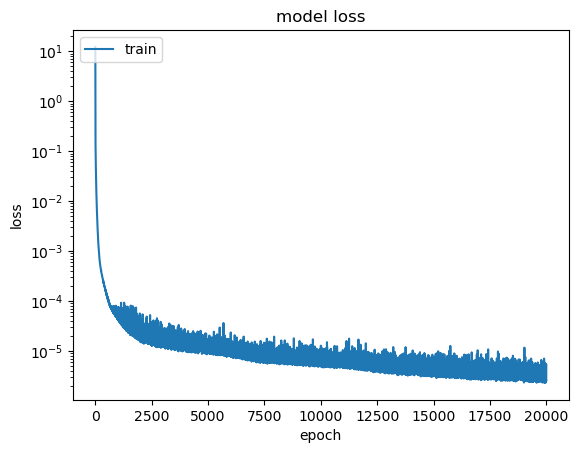

9

Epoch 1/20000
8/8 [==============================] - 9s 32ms/step - loss: 1.6200
Epoch 2/20000
8/8 [==============================] - 0s 14ms/step - loss: 0.6507
Epoch 3/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.2232
Epoch 4/20000
8/8 [==============================] - 0s 23ms/step - loss: 0.0768
Epoch 5/20000
8/8 [==============================] - 0s 24ms/step - loss: 0.0342
Epoch 6/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0251
Epoch 7/20000
8/8 [==============================] - 0s 28ms/step - loss: 0.0209
Epoch 8/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0162
Epoch 9/20000
8/8 [==============================] - 0s 20ms/step - loss: 0.0133
Epoch 10/20000
8/8 [==============================] - 0s 15ms/step - loss: 0.0118
Epoch 11/20000
8/8 [==============================] - 0s 19ms/step - loss: 0.0109
Epoch 12/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0104
Epoch 13/20000
8/8 [=====

8/8 [==============================] - 0s 12ms/step - loss: 0.0021
Epoch 102/20000
8/8 [==============================] - 0s 25ms/step - loss: 0.0020
Epoch 103/20000
8/8 [==============================] - 0s 23ms/step - loss: 0.0020
Epoch 104/20000
8/8 [==============================] - 0s 17ms/step - loss: 0.0020
Epoch 105/20000
8/8 [==============================] - 0s 13ms/step - loss: 0.0019
Epoch 106/20000
8/8 [==============================] - 0s 23ms/step - loss: 0.0019
Epoch 107/20000
8/8 [==============================] - 0s 21ms/step - loss: 0.0019
Epoch 108/20000
8/8 [==============================] - 0s 11ms/step - loss: 0.0018
Epoch 109/20000
8/8 [==============================] - 0s 13ms/step - loss: 0.0018
Epoch 110/20000
8/8 [==============================] - 0s 30ms/step - loss: 0.0017
Epoch 111/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0017
Epoch 112/20000
8/8 [==============================] - 0s 16ms/step - loss: 0.0017
Epoch 113/20000
8/8 

8/8 [==============================] - 0s 32ms/step - loss: 5.4543e-04
Epoch 198/20000
8/8 [==============================] - 0s 25ms/step - loss: 5.4158e-04
Epoch 199/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.3828e-04
Epoch 200/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.3805e-04
Epoch 201/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.3175e-04
Epoch 202/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2604e-04
Epoch 203/20000
8/8 [==============================] - 0s 24ms/step - loss: 5.2393e-04
Epoch 204/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.1911e-04
Epoch 205/20000
8/8 [==============================] - 0s 33ms/step - loss: 5.1520e-04
Epoch 206/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1277e-04
Epoch 207/20000
8/8 [==============================] - 0s 31ms/step - loss: 5.0958e-04
Epoch 208/20000
8/8 [==============================] - 0s 11m

8/8 [==============================] - 0s 18ms/step - loss: 3.1956e-04
Epoch 292/20000
8/8 [==============================] - 0s 28ms/step - loss: 3.1788e-04
Epoch 293/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.1694e-04
Epoch 294/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.1519e-04
Epoch 295/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.1274e-04
Epoch 296/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.1074e-04
Epoch 297/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1145e-04
Epoch 298/20000
8/8 [==============================] - 0s 29ms/step - loss: 3.0942e-04
Epoch 299/20000
8/8 [==============================] - 0s 18ms/step - loss: 3.0662e-04
Epoch 300/20000
8/8 [==============================] - 0s 24ms/step - loss: 3.0539e-04
Epoch 301/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.0312e-04
Epoch 302/20000
8/8 [==============================] - 0s 11

8/8 [==============================] - 0s 22ms/step - loss: 1.8582e-04
Epoch 386/20000
8/8 [==============================] - 0s 18ms/step - loss: 1.8550e-04
Epoch 387/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.8299e-04
Epoch 388/20000
8/8 [==============================] - 0s 15ms/step - loss: 1.8167e-04
Epoch 389/20000
8/8 [==============================] - 0s 25ms/step - loss: 1.8073e-04
Epoch 390/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.7893e-04
Epoch 391/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.7772e-04
Epoch 392/20000
8/8 [==============================] - 0s 28ms/step - loss: 1.7713e-04
Epoch 393/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.7932e-04
Epoch 394/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.7467e-04
Epoch 395/20000
8/8 [==============================] - 0s 20ms/step - loss: 1.7315e-04
Epoch 396/20000
8/8 [==============================] - 0s 15

8/8 [==============================] - 0s 32ms/step - loss: 1.0006e-04
Epoch 480/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0009e-04
Epoch 481/20000
8/8 [==============================] - 0s 15ms/step - loss: 9.9744e-05
Epoch 482/20000
8/8 [==============================] - 0s 17ms/step - loss: 9.8391e-05
Epoch 483/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.8608e-05
Epoch 484/20000
8/8 [==============================] - 0s 20ms/step - loss: 9.7999e-05
Epoch 485/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.6225e-05
Epoch 486/20000
8/8 [==============================] - 0s 34ms/step - loss: 9.5479e-05
Epoch 487/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5628e-05
Epoch 488/20000
8/8 [==============================] - 0s 13ms/step - loss: 9.4370e-05
Epoch 489/20000
8/8 [==============================] - 0s 12ms/step - loss: 9.3935e-05
Epoch 490/20000
8/8 [==============================] - 0s 6ms/

8/8 [==============================] - 0s 6ms/step - loss: 6.1139e-05
Epoch 574/20000
8/8 [==============================] - 0s 25ms/step - loss: 6.0312e-05
Epoch 575/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0558e-05
Epoch 576/20000
8/8 [==============================] - 0s 23ms/step - loss: 5.9664e-05
Epoch 577/20000
8/8 [==============================] - 0s 17ms/step - loss: 5.9490e-05
Epoch 578/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0266e-05
Epoch 579/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9850e-05
Epoch 580/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.9023e-05
Epoch 581/20000
8/8 [==============================] - 0s 35ms/step - loss: 5.9017e-05
Epoch 582/20000
8/8 [==============================] - 0s 14ms/step - loss: 5.8827e-05
Epoch 583/20000
8/8 [==============================] - 0s 18ms/step - loss: 5.8180e-05
Epoch 584/20000
8/8 [==============================] - 0s 13ms/

8/8 [==============================] - 0s 23ms/step - loss: 4.5814e-05
Epoch 668/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6674e-05
Epoch 669/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8371e-05
Epoch 670/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.5019e-05
Epoch 671/20000
8/8 [==============================] - 0s 22ms/step - loss: 4.4525e-05
Epoch 672/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.4696e-05
Epoch 673/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4988e-05
Epoch 674/20000
8/8 [==============================] - 0s 23ms/step - loss: 4.6336e-05
Epoch 675/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4565e-05
Epoch 676/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4582e-05
Epoch 677/20000
8/8 [==============================] - 0s 14ms/step - loss: 4.4306e-05
Epoch 678/20000
8/8 [==============================] - 0s 8ms/ste

8/8 [==============================] - 0s 66ms/step - loss: 3.8651e-05
Epoch 763/20000
8/8 [==============================] - 0s 26ms/step - loss: 3.8106e-05
Epoch 764/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8300e-05
Epoch 765/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8691e-05
Epoch 766/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9260e-05
Epoch 767/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0626e-05
Epoch 768/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1949e-05
Epoch 769/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9397e-05
Epoch 770/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8718e-05
Epoch 771/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0515e-05
Epoch 772/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.0575e-05
Epoch 773/20000
8/8 [==============================] - 0s 7ms/step 

8/8 [==============================] - 0s 6ms/step - loss: 3.6164e-05
Epoch 858/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5717e-05
Epoch 859/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5855e-05
Epoch 860/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.6632e-05
Epoch 861/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4666e-05
Epoch 862/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6866e-05
Epoch 863/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4849e-05
Epoch 864/20000
8/8 [==============================] - 0s 16ms/step - loss: 3.3231e-05
Epoch 865/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4337e-05
Epoch 866/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4132e-05
Epoch 867/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4538e-05
Epoch 868/20000
8/8 [==============================] - 0s 5ms/step -

8/8 [==============================] - 0s 5ms/step - loss: 3.4059e-05
Epoch 953/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3491e-05
Epoch 954/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4103e-05
Epoch 955/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4382e-05
Epoch 956/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.0564e-05
Epoch 957/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5648e-05
Epoch 958/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4007e-05
Epoch 959/20000
8/8 [==============================] - 0s 20ms/step - loss: 3.0547e-05
Epoch 960/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1973e-05
Epoch 961/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0040e-05
Epoch 962/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1841e-05
Epoch 963/20000
8/8 [==============================] - 0s 5ms/step -

8/8 [==============================] - 0s 5ms/step - loss: 3.0976e-05
Epoch 1047/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1025e-05
Epoch 1048/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3244e-05
Epoch 1049/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4311e-05
Epoch 1050/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6909e-05
Epoch 1051/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2844e-05
Epoch 1052/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2510e-05
Epoch 1053/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2765e-05
Epoch 1054/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.8609e-05
Epoch 1055/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9187e-05
Epoch 1056/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0270e-05
Epoch 1057/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 3.5185e-05
Epoch 1141/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0162e-05
Epoch 1142/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7194e-05
Epoch 1143/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6820e-05
Epoch 1144/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7233e-05
Epoch 1145/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7721e-05
Epoch 1146/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6833e-05
Epoch 1147/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7694e-05
Epoch 1148/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3778e-05
Epoch 1149/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2576e-05
Epoch 1150/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8537e-05
Epoch 1151/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 11ms/step - loss: 2.9421e-05
Epoch 1235/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1141e-05
Epoch 1236/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3229e-05
Epoch 1237/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9004e-05
Epoch 1238/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4714e-05
Epoch 1239/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.6636e-05
Epoch 1240/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1064e-05
Epoch 1241/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0635e-05
Epoch 1242/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8797e-05
Epoch 1243/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5587e-05
Epoch 1244/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5347e-05
Epoch 1245/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 4ms/step - loss: 2.5772e-05
Epoch 1329/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5221e-05
Epoch 1330/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8717e-05
Epoch 1331/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0046e-05
Epoch 1332/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8960e-05
Epoch 1333/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7538e-05
Epoch 1334/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7012e-05
Epoch 1335/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4792e-05
Epoch 1336/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4782e-05
Epoch 1337/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7167e-05
Epoch 1338/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4659e-05
Epoch 1339/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 2.4607e-05
Epoch 1423/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7533e-05
Epoch 1424/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5238e-05
Epoch 1425/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6644e-05
Epoch 1426/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5452e-05
Epoch 1427/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4573e-05
Epoch 1428/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7824e-05
Epoch 1429/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8750e-05
Epoch 1430/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5430e-05
Epoch 1431/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4250e-05
Epoch 1432/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3908e-05
Epoch 1433/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 5ms/step - loss: 2.1860e-05
Epoch 1517/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2270e-05
Epoch 1518/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2678e-05
Epoch 1519/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2602e-05
Epoch 1520/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3825e-05
Epoch 1521/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.5125e-05
Epoch 1522/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4911e-05
Epoch 1523/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3358e-05
Epoch 1524/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5900e-05
Epoch 1525/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8779e-05
Epoch 1526/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2014e-05
Epoch 1527/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 9ms/step - loss: 2.0591e-05
Epoch 1611/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3865e-05
Epoch 1612/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9371e-05
Epoch 1613/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4655e-05
Epoch 1614/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5032e-05
Epoch 1615/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6499e-05
Epoch 1616/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4364e-05
Epoch 1617/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3896e-05
Epoch 1618/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2622e-05
Epoch 1619/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2469e-05
Epoch 1620/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3490e-05
Epoch 1621/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 6ms/step - loss: 2.5592e-05
Epoch 1705/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4673e-05
Epoch 1706/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5519e-05
Epoch 1707/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7090e-05
Epoch 1708/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3583e-05
Epoch 1709/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2431e-05
Epoch 1710/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4716e-05
Epoch 1711/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4782e-05
Epoch 1712/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6496e-05
Epoch 1713/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6801e-05
Epoch 1714/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3627e-05
Epoch 1715/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 3.6872e-05
Epoch 1799/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6471e-05
Epoch 1800/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3481e-05
Epoch 1801/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1171e-05
Epoch 1802/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4551e-05
Epoch 1803/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3531e-05
Epoch 1804/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.0426e-05
Epoch 1805/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.1767e-05
Epoch 1806/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3022e-05
Epoch 1807/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4450e-05
Epoch 1808/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7413e-05
Epoch 1809/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 2.6412e-05
Epoch 1893/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.1905e-05
Epoch 1894/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5731e-05
Epoch 1895/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.2215e-05
Epoch 1896/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3781e-05
Epoch 1897/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0809e-05
Epoch 1898/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0389e-05
Epoch 1899/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2192e-05
Epoch 1900/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9800e-05
Epoch 1901/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0094e-05
Epoch 1902/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0362e-05
Epoch 1903/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 2.0282e-05
Epoch 1987/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8882e-05
Epoch 1988/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.0445e-05
Epoch 1989/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9757e-05
Epoch 1990/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9987e-05
Epoch 1991/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8913e-05
Epoch 1992/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0265e-05
Epoch 1993/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2051e-05
Epoch 1994/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8984e-05
Epoch 1995/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9458e-05
Epoch 1996/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0823e-05
Epoch 1997/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 2.2978e-05
Epoch 2081/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7107e-05
Epoch 2082/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8665e-05
Epoch 2083/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1241e-05
Epoch 2084/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9638e-05
Epoch 2085/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9765e-05
Epoch 2086/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2455e-05
Epoch 2087/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4789e-05
Epoch 2088/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.5514e-05
Epoch 2089/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4508e-05
Epoch 2090/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.0297e-05
Epoch 2091/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.8762e-05
Epoch 2175/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3247e-05
Epoch 2176/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5894e-05
Epoch 2177/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3564e-05
Epoch 2178/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9875e-05
Epoch 2179/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7896e-05
Epoch 2180/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7978e-05
Epoch 2181/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9132e-05
Epoch 2182/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0788e-05
Epoch 2183/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9530e-05
Epoch 2184/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1606e-05
Epoch 2185/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 1.9854e-05
Epoch 2269/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.8612e-05
Epoch 2270/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2037e-05
Epoch 2271/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8433e-05
Epoch 2272/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.8675e-05
Epoch 2273/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.6935e-05
Epoch 2274/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1147e-05
Epoch 2275/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9002e-05
Epoch 2276/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0891e-05
Epoch 2277/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1574e-05
Epoch 2278/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1526e-05
Epoch 2279/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.9443e-05
Epoch 2363/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8952e-05
Epoch 2364/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8566e-05
Epoch 2365/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6065e-05
Epoch 2366/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8659e-05
Epoch 2367/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4545e-05
Epoch 2368/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5646e-05
Epoch 2369/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7485e-05
Epoch 2370/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7718e-05
Epoch 2371/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1860e-05
Epoch 2372/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3596e-05
Epoch 2373/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 3.0822e-05
Epoch 2457/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0928e-05
Epoch 2458/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.2198e-05
Epoch 2459/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.8081e-05
Epoch 2460/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7479e-05
Epoch 2461/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6714e-05
Epoch 2462/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.9067e-05
Epoch 2463/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9352e-05
Epoch 2464/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1040e-05
Epoch 2465/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1766e-05
Epoch 2466/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4621e-05
Epoch 2467/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 2.2312e-05
Epoch 2551/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9858e-05
Epoch 2552/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2651e-05
Epoch 2553/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7118e-05
Epoch 2554/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0044e-05
Epoch 2555/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7743e-05
Epoch 2556/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6791e-05
Epoch 2557/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6539e-05
Epoch 2558/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6784e-05
Epoch 2559/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9724e-05
Epoch 2560/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0996e-05
Epoch 2561/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 2.1722e-05
Epoch 2645/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9274e-05
Epoch 2646/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7333e-05
Epoch 2647/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6539e-05
Epoch 2648/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7291e-05
Epoch 2649/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7610e-05
Epoch 2650/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7770e-05
Epoch 2651/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5761e-05
Epoch 2652/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5826e-05
Epoch 2653/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7280e-05
Epoch 2654/20000
8/8 [==============================] - 0s 3ms/step - loss: 1.5528e-05
Epoch 2655/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 1.8460e-05
Epoch 2739/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7031e-05
Epoch 2740/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0359e-05
Epoch 2741/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7989e-05
Epoch 2742/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5248e-05
Epoch 2743/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.5567e-05
Epoch 2744/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7729e-05
Epoch 2745/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.1148e-05
Epoch 2746/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.2788e-05
Epoch 2747/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0955e-05
Epoch 2748/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8438e-05
Epoch 2749/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 5ms/step - loss: 1.5332e-05
Epoch 2833/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.8073e-05
Epoch 2834/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3976e-05
Epoch 2835/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.4512e-05
Epoch 2836/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9953e-05
Epoch 2837/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6456e-05
Epoch 2838/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5859e-05
Epoch 2839/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7396e-05
Epoch 2840/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6777e-05
Epoch 2841/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7758e-05
Epoch 2842/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5814e-05
Epoch 2843/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.8872e-05
Epoch 2927/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7489e-05
Epoch 2928/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7449e-05
Epoch 2929/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.3014e-05
Epoch 2930/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6536e-05
Epoch 2931/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2074e-05
Epoch 2932/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5294e-05
Epoch 2933/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5556e-05
Epoch 2934/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6037e-05
Epoch 2935/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5622e-05
Epoch 2936/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6649e-05
Epoch 2937/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.7736e-05
Epoch 3021/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0335e-05
Epoch 3022/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.2119e-05
Epoch 3023/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6612e-05
Epoch 3024/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3691e-05
Epoch 3025/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0260e-05
Epoch 3026/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5910e-05
Epoch 3027/20000
8/8 [==============================] - 0s 14ms/step - loss: 1.4123e-05
Epoch 3028/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7999e-05
Epoch 3029/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.0690e-05
Epoch 3030/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.6746e-05
Epoch 3031/20000
8/8 [==============================] - 0

8/8 [==============================] - 0s 4ms/step - loss: 1.4624e-05
Epoch 3115/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5177e-05
Epoch 3116/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6293e-05
Epoch 3117/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7663e-05
Epoch 3118/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7826e-05
Epoch 3119/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6206e-05
Epoch 3120/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9199e-05
Epoch 3121/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0893e-05
Epoch 3122/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2579e-05
Epoch 3123/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3926e-05
Epoch 3124/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7003e-05
Epoch 3125/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 6ms/step - loss: 1.4886e-05
Epoch 3209/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3861e-05
Epoch 3210/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3853e-05
Epoch 3211/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6821e-05
Epoch 3212/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8907e-05
Epoch 3213/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5735e-05
Epoch 3214/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5622e-05
Epoch 3215/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3171e-05
Epoch 3216/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4408e-05
Epoch 3217/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7554e-05
Epoch 3218/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5863e-05
Epoch 3219/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.3741e-05
Epoch 3303/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4798e-05
Epoch 3304/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4730e-05
Epoch 3305/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4879e-05
Epoch 3306/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4781e-05
Epoch 3307/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5803e-05
Epoch 3308/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6054e-05
Epoch 3309/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6485e-05
Epoch 3310/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5241e-05
Epoch 3311/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6222e-05
Epoch 3312/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6731e-05
Epoch 3313/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 9ms/step - loss: 1.9060e-05
Epoch 3397/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5559e-05
Epoch 3398/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8297e-05
Epoch 3399/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5553e-05
Epoch 3400/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4194e-05
Epoch 3401/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4066e-05
Epoch 3402/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6503e-05
Epoch 3403/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0905e-05
Epoch 3404/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6028e-05
Epoch 3405/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1591e-05
Epoch 3406/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7131e-05
Epoch 3407/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 1.5410e-05
Epoch 3491/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7565e-05
Epoch 3492/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6861e-05
Epoch 3493/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6565e-05
Epoch 3494/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.7652e-05
Epoch 3495/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7345e-05
Epoch 3496/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6497e-05
Epoch 3497/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.7948e-05
Epoch 3498/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4448e-05
Epoch 3499/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3002e-05
Epoch 3500/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3459e-05
Epoch 3501/20000
8/8 [==============================] - 0s 6

8/8 [==============================] - 0s 5ms/step - loss: 1.3467e-05
Epoch 3585/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4325e-05
Epoch 3586/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5539e-05
Epoch 3587/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.6161e-05
Epoch 3588/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5327e-05
Epoch 3589/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.9786e-05
Epoch 3590/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.8866e-05
Epoch 3591/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3160e-05
Epoch 3592/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3807e-05
Epoch 3593/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3208e-05
Epoch 3594/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4998e-05
Epoch 3595/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.4289e-05
Epoch 3679/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6045e-05
Epoch 3680/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6200e-05
Epoch 3681/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4004e-05
Epoch 3682/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3049e-05
Epoch 3683/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3955e-05
Epoch 3684/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2546e-05
Epoch 3685/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.3002e-05
Epoch 3686/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5935e-05
Epoch 3687/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6903e-05
Epoch 3688/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5402e-05
Epoch 3689/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.2779e-05
Epoch 3773/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2617e-05
Epoch 3774/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3360e-05
Epoch 3775/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4705e-05
Epoch 3776/20000
8/8 [==============================] - 0s 17ms/step - loss: 1.2326e-05
Epoch 3777/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3510e-05
Epoch 3778/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2805e-05
Epoch 3779/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3543e-05
Epoch 3780/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2472e-05
Epoch 3781/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5341e-05
Epoch 3782/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3852e-05
Epoch 3783/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.7142e-05
Epoch 3867/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8095e-05
Epoch 3868/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.1704e-05
Epoch 3869/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1507e-05
Epoch 3870/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7114e-05
Epoch 3871/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1988e-05
Epoch 3872/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.0308e-05
Epoch 3873/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.5496e-05
Epoch 3874/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5576e-05
Epoch 3875/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4819e-05
Epoch 3876/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4551e-05
Epoch 3877/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.6488e-05
Epoch 3961/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.3624e-05
Epoch 3962/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2428e-05
Epoch 3963/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5421e-05
Epoch 3964/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5275e-05
Epoch 3965/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4596e-05
Epoch 3966/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.2214e-05
Epoch 3967/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5962e-05
Epoch 3968/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7562e-05
Epoch 3969/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8747e-05
Epoch 3970/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.7842e-05
Epoch 3971/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.2782e-05
Epoch 4055/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3760e-05
Epoch 4056/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3548e-05
Epoch 4057/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5187e-05
Epoch 4058/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6995e-05
Epoch 4059/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6536e-05
Epoch 4060/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1902e-05
Epoch 4061/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6910e-05
Epoch 4062/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8351e-05
Epoch 4063/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.7857e-05
Epoch 4064/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.9274e-05
Epoch 4065/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 4ms/step - loss: 1.2616e-05
Epoch 4149/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1371e-05
Epoch 4150/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1907e-05
Epoch 4151/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6081e-05
Epoch 4152/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.5520e-05
Epoch 4153/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2805e-05
Epoch 4154/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3880e-05
Epoch 4155/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4387e-05
Epoch 4156/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2927e-05
Epoch 4157/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2436e-05
Epoch 4158/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1974e-05
Epoch 4159/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 1.5468e-05
Epoch 4243/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1619e-05
Epoch 4244/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.3291e-05
Epoch 4245/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3516e-05
Epoch 4246/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.8805e-05
Epoch 4247/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1012e-05
Epoch 4248/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8977e-05
Epoch 4249/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6600e-05
Epoch 4250/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.8440e-05
Epoch 4251/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8761e-05
Epoch 4252/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.5308e-05
Epoch 4253/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 2.0294e-05
Epoch 4337/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.9787e-05
Epoch 4338/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.1685e-05
Epoch 4339/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4592e-05
Epoch 4340/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0887e-05
Epoch 4341/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1487e-05
Epoch 4342/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1648e-05
Epoch 4343/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2030e-05
Epoch 4344/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3810e-05
Epoch 4345/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4322e-05
Epoch 4346/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2520e-05
Epoch 4347/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 7ms/step - loss: 1.3644e-05
Epoch 4431/20000
8/8 [==============================] - 0s 16ms/step - loss: 1.0814e-05
Epoch 4432/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2125e-05
Epoch 4433/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1957e-05
Epoch 4434/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.2306e-05
Epoch 4435/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1983e-05
Epoch 4436/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1203e-05
Epoch 4437/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0617e-05
Epoch 4438/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0415e-05
Epoch 4439/20000
8/8 [==============================] - 0s 13ms/step - loss: 9.9590e-06
Epoch 4440/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2310e-05
Epoch 4441/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.1278e-05
Epoch 4525/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0086e-05
Epoch 4526/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0437e-05
Epoch 4527/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1034e-05
Epoch 4528/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1115e-05
Epoch 4529/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2543e-05
Epoch 4530/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2880e-05
Epoch 4531/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3005e-05
Epoch 4532/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1580e-05
Epoch 4533/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0815e-05
Epoch 4534/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0548e-05
Epoch 4535/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.7225e-05
Epoch 4619/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3095e-05
Epoch 4620/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2646e-05
Epoch 4621/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5272e-05
Epoch 4622/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.3869e-05
Epoch 4623/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3207e-05
Epoch 4624/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2006e-05
Epoch 4625/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.2410e-05
Epoch 4626/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1345e-05
Epoch 4627/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0963e-05
Epoch 4628/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1814e-05
Epoch 4629/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.3947e-05
Epoch 4713/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.0081e-05
Epoch 4714/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0339e-05
Epoch 4715/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1817e-05
Epoch 4716/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.6231e-05
Epoch 4717/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.1284e-05
Epoch 4718/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.9573e-05
Epoch 4719/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.8232e-05
Epoch 4720/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.5067e-05
Epoch 4721/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4074e-05
Epoch 4722/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.6488e-05
Epoch 4723/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 9ms/step - loss: 1.0660e-05
Epoch 4807/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1120e-05
Epoch 4808/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.4155e-05
Epoch 4809/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0515e-05
Epoch 4810/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0715e-05
Epoch 4811/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0015e-05
Epoch 4812/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2163e-05
Epoch 4813/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0123e-05
Epoch 4814/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8706e-06
Epoch 4815/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.8814e-06
Epoch 4816/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0347e-05
Epoch 4817/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.0838e-05
Epoch 4901/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1257e-05
Epoch 4902/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0276e-05
Epoch 4903/20000
8/8 [==============================] - 0s 12ms/step - loss: 1.1974e-05
Epoch 4904/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2453e-05
Epoch 4905/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2140e-05
Epoch 4906/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0020e-05
Epoch 4907/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3849e-06
Epoch 4908/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0290e-05
Epoch 4909/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1159e-05
Epoch 4910/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.9495e-06
Epoch 4911/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 1.0673e-05
Epoch 4995/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0908e-05
Epoch 4996/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0053e-05
Epoch 4997/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.6794e-06
Epoch 4998/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7094e-06
Epoch 4999/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1909e-05
Epoch 5000/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0342e-05
Epoch 5001/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9531e-06
Epoch 5002/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6629e-06
Epoch 5003/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8294e-06
Epoch 5004/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0133e-05
Epoch 5005/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 1.2309e-05
Epoch 5089/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.7089e-05
Epoch 5090/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4615e-05
Epoch 5091/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4422e-05
Epoch 5092/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0595e-05
Epoch 5093/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9548e-06
Epoch 5094/20000
8/8 [==============================] - 0s 15ms/step - loss: 8.7706e-06
Epoch 5095/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.4185e-05
Epoch 5096/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3725e-05
Epoch 5097/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0835e-05
Epoch 5098/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1022e-05
Epoch 5099/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.0763e-05
Epoch 5183/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2938e-05
Epoch 5184/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.4628e-05
Epoch 5185/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0127e-05
Epoch 5186/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5432e-06
Epoch 5187/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.5973e-06
Epoch 5188/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1642e-06
Epoch 5189/20000
8/8 [==============================] - 0s 11ms/step - loss: 9.3518e-06
Epoch 5190/20000
8/8 [==============================] - 0s 10ms/step - loss: 8.9619e-06
Epoch 5191/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7445e-06
Epoch 5192/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1957e-06
Epoch 5193/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 1.2311e-05
Epoch 5277/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3494e-05
Epoch 5278/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0822e-05
Epoch 5279/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7705e-06
Epoch 5280/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0359e-05
Epoch 5281/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0051e-05
Epoch 5282/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0146e-05
Epoch 5283/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6365e-06
Epoch 5284/20000
8/8 [==============================] - 0s 22ms/step - loss: 8.4027e-06
Epoch 5285/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.9234e-06
Epoch 5286/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.0619e-06
Epoch 5287/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 9.9596e-06
Epoch 5371/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.1231e-05
Epoch 5372/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0224e-05
Epoch 5373/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.3683e-06
Epoch 5374/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3380e-06
Epoch 5375/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1315e-05
Epoch 5376/20000
8/8 [==============================] - 0s 10ms/step - loss: 1.0350e-05
Epoch 5377/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0636e-05
Epoch 5378/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2398e-05
Epoch 5379/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2982e-05
Epoch 5380/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1888e-05
Epoch 5381/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 1.3535e-05
Epoch 5465/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.4300e-05
Epoch 5466/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3423e-05
Epoch 5467/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2590e-05
Epoch 5468/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0481e-05
Epoch 5469/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0217e-05
Epoch 5470/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1106e-05
Epoch 5471/20000
8/8 [==============================] - 0s 11ms/step - loss: 1.0738e-05
Epoch 5472/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2295e-05
Epoch 5473/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.3337e-05
Epoch 5474/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3968e-05
Epoch 5475/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.0786e-05
Epoch 5609/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.8787e-06
Epoch 5610/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0283e-05
Epoch 5611/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.8512e-06
Epoch 5612/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0858e-06
Epoch 5613/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0551e-05
Epoch 5614/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1181e-05
Epoch 5615/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.2780e-05
Epoch 5616/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0285e-05
Epoch 5617/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8913e-06
Epoch 5618/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0237e-05
Epoch 5619/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 8.6347e-06
Epoch 5703/20000
8/8 [==============================] - 0s 22ms/step - loss: 7.8178e-06
Epoch 5704/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3760e-06
Epoch 5705/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.4755e-06
Epoch 5706/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.6522e-05
Epoch 5707/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2018e-05
Epoch 5708/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4949e-05
Epoch 5709/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0427e-05
Epoch 5710/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2639e-05
Epoch 5711/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.2777e-05
Epoch 5712/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1352e-05
Epoch 5713/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.4317e-06
Epoch 5905/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1249e-05
Epoch 5906/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.7842e-06
Epoch 5907/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4615e-06
Epoch 5908/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0850e-05
Epoch 5909/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3456e-06
Epoch 5910/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.2897e-06
Epoch 5911/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0207e-06
Epoch 5912/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9761e-06
Epoch 5913/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9972e-06
Epoch 5914/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8585e-06
Epoch 5915/20000
8/8 [==============================] - 0s 7

8/8 [==============================] - 0s 5ms/step - loss: 9.9306e-06
Epoch 6020/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1032e-05
Epoch 6021/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.4353e-06
Epoch 6022/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1310e-05
Epoch 6023/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.6565e-05
Epoch 6024/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2113e-05
Epoch 6025/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0507e-05
Epoch 6026/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1498e-05
Epoch 6027/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.3169e-05
Epoch 6028/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1465e-05
Epoch 6029/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0832e-05
Epoch 6030/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 8ms/step - loss: 8.9556e-06
Epoch 6114/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.3579e-06
Epoch 6115/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2635e-05
Epoch 6116/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.5598e-05
Epoch 6117/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2585e-05
Epoch 6118/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.9472e-06
Epoch 6119/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7946e-06
Epoch 6120/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.8553e-06
Epoch 6121/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3637e-06
Epoch 6122/20000
8/8 [==============================] - 0s 16ms/step - loss: 7.9495e-06
Epoch 6123/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.6962e-06
Epoch 6124/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 7.5285e-06
Epoch 6317/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.5605e-06
Epoch 6318/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0021e-05
Epoch 6319/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.3528e-05
Epoch 6320/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1768e-05
Epoch 6321/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1252e-05
Epoch 6322/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8804e-06
Epoch 6323/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3065e-06
Epoch 6324/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6579e-06
Epoch 6325/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8108e-06
Epoch 6326/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.8669e-06
Epoch 6327/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.0252e-05
Epoch 6411/20000
8/8 [==============================] - 0s 9ms/step - loss: 1.1585e-05
Epoch 6412/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1661e-05
Epoch 6413/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.6872e-06
Epoch 6414/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0584e-05
Epoch 6415/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3220e-06
Epoch 6416/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0208e-05
Epoch 6417/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0728e-05
Epoch 6418/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.2328e-05
Epoch 6419/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.4667e-05
Epoch 6420/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.1277e-06
Epoch 6421/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 4ms/step - loss: 8.6984e-06
Epoch 6538/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0536e-05
Epoch 6539/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0211e-05
Epoch 6540/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.0408e-05
Epoch 6541/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4127e-06
Epoch 6542/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5337e-06
Epoch 6543/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7538e-06
Epoch 6544/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0019e-05
Epoch 6545/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1638e-05
Epoch 6546/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.8900e-06
Epoch 6547/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7672e-06
Epoch 6548/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 7.6585e-06
Epoch 6632/20000
8/8 [==============================] - 0s 9ms/step - loss: 7.7670e-06
Epoch 6633/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9234e-06
Epoch 6634/20000
8/8 [==============================] - 0s 7ms/step - loss: 8.3035e-06
Epoch 6635/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.0725e-06
Epoch 6636/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1012e-06
Epoch 6637/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.3571e-06
Epoch 6638/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0857e-05
Epoch 6639/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.0777e-06
Epoch 6772/20000
8/8 [==============================] - 0s 13ms/step - loss: 8.8033e-06
Epoch 6773/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.7742e-06
Epoch 6774/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 7ms/step - loss: 8.0456e-06
Epoch 6858/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2623e-06
Epoch 6859/20000
8/8 [==============================] - 0s 9ms/step - loss: 8.5407e-06
Epoch 6860/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.2814e-06
Epoch 6861/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.6081e-06
Epoch 6862/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1905e-06
Epoch 6863/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5528e-06
Epoch 6864/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6202e-06
Epoch 6865/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.2331e-06
Epoch 6866/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8654e-06
Epoch 6867/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6554e-06
Epoch 6868/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 7.1339e-06
Epoch 6995/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.0090e-06
Epoch 6996/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4591e-06
Epoch 6997/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.5691e-06
Epoch 6998/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.6816e-06
Epoch 6999/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7917e-06
Epoch 7000/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.1139e-06
Epoch 7001/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4298e-06
Epoch 7002/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.4243e-06
Epoch 7003/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8162e-06
Epoch 7004/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7940e-06
Epoch 7005/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 4ms/step - loss: 7.3428e-06
Epoch 7089/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7590e-06
Epoch 7090/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6694e-06
Epoch 7091/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.2592e-06
Epoch 7092/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0143e-06
Epoch 7093/20000
8/8 [==============================] - 0s 15ms/step - loss: 9.0255e-06
Epoch 7094/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7889e-06
Epoch 7095/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8098e-06
Epoch 7096/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5757e-06
Epoch 7097/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.7955e-06
Epoch 7098/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.1159e-06
Epoch 7099/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 7ms/step - loss: 6.9828e-06
Epoch 7211/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4359e-06
Epoch 7212/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.7475e-06
Epoch 7213/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5737e-06
Epoch 7214/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.2039e-06
Epoch 7215/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8214e-06
Epoch 7216/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.4339e-06
Epoch 7217/20000
8/8 [==============================] - 0s 11ms/step - loss: 8.8358e-06
Epoch 7218/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3105e-06
Epoch 7219/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1545e-06
Epoch 7220/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.8530e-06
Epoch 7221/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 8.7875e-06
Epoch 7305/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0559e-05
Epoch 7306/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9687e-06
Epoch 7307/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4624e-06
Epoch 7308/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.1847e-05
Epoch 7309/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.7568e-06
Epoch 7310/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.1554e-05
Epoch 7311/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.1891e-06
Epoch 7312/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0763e-05
Epoch 7313/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7684e-06
Epoch 7314/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.3989e-06
Epoch 7315/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 7ms/step - loss: 6.6230e-06
Epoch 7417/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0400e-05
Epoch 7418/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.4147e-06
Epoch 7419/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0410e-05
Epoch 7420/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0631e-05
Epoch 7421/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3212e-06
Epoch 7422/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.8289e-06
Epoch 7423/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.0135e-05
Epoch 7424/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8448e-06
Epoch 7425/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1806e-05
Epoch 7426/20000
8/8 [==============================] - 0s 8ms/step - loss: 7.7757e-06
Epoch 7427/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 7.8630e-06
Epoch 7542/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.3146e-06
Epoch 7543/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.1830e-06
Epoch 7544/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5295e-06
Epoch 7545/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.6444e-06
Epoch 7546/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.1958e-06
Epoch 7547/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9263e-06
Epoch 7548/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1594e-06
Epoch 7549/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0711e-06
Epoch 7550/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.4638e-06
Epoch 7551/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.6100e-06
Epoch 7552/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 6.8975e-06
Epoch 7636/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6578e-06
Epoch 7637/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.3549e-06
Epoch 7638/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5579e-06
Epoch 7639/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4304e-06
Epoch 7640/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.7630e-06
Epoch 7641/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3626e-06
Epoch 7642/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.1779e-06
Epoch 7643/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.0531e-06
Epoch 7644/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.5786e-06
Epoch 7645/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.7429e-06
Epoch 7646/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 9ms/step - loss: 8.7427e-06
Epoch 7762/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.2713e-05
Epoch 7763/20000
8/8 [==============================] - 0s 7ms/step - loss: 1.0607e-05
Epoch 7764/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0880e-06
Epoch 7765/20000
8/8 [==============================] - 0s 12ms/step - loss: 7.6462e-06
Epoch 7766/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.8327e-06
Epoch 7767/20000
8/8 [==============================] - 0s 8ms/step - loss: 1.0997e-05
Epoch 7768/20000
8/8 [==============================] - 0s 4ms/step - loss: 8.4782e-06
Epoch 7769/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.0271e-06
Epoch 7770/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8690e-06
Epoch 7771/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6921e-06
Epoch 7772/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 14ms/step - loss: 1.2309e-05
Epoch 7856/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.7685e-06
Epoch 7857/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5187e-06
Epoch 7858/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7017e-06
Epoch 7859/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5424e-06
Epoch 7860/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.7181e-06
Epoch 7861/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9920e-06
Epoch 7862/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.0118e-06
Epoch 7863/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8822e-06
Epoch 7864/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.5760e-06
Epoch 7865/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6859e-06
Epoch 7866/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 6ms/step - loss: 6.1363e-06
Epoch 8070/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7139e-06
Epoch 8071/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6640e-06
Epoch 8072/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5197e-06
Epoch 8073/20000
8/8 [==============================] - 0s 14ms/step - loss: 6.8316e-06
Epoch 8074/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9044e-06
Epoch 8075/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1499e-06
Epoch 8076/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2404e-06
Epoch 8077/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6483e-06
Epoch 8078/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5637e-06
Epoch 8079/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.7556e-06
Epoch 8080/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 1.0164e-05
Epoch 8164/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.0309e-06
Epoch 8165/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9881e-06
Epoch 8166/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.3874e-06
Epoch 8167/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6620e-06
Epoch 8168/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.0436e-05
Epoch 8191/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.8050e-06
Epoch 8192/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5489e-06
Epoch 8193/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.4619e-06
Epoch 8194/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.0458e-06
Epoch 8195/20000
8/8 [==============================] - 0s 10ms/step - loss: 9.2772e-06
Epoch 8196/20000
8/8 [==============================] - 0s

8/8 [==============================] - 0s 5ms/step - loss: 5.5684e-06
Epoch 8280/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1519e-06
Epoch 8281/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9971e-06
Epoch 8282/20000
8/8 [==============================] - 0s 11ms/step - loss: 6.6889e-06
Epoch 8283/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5352e-06
Epoch 8284/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.2158e-06
Epoch 8285/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7218e-06
Epoch 8286/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4360e-06
Epoch 8287/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9363e-06
Epoch 8288/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.4967e-06
Epoch 8289/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5190e-06
Epoch 8290/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 8.0546e-06
Epoch 8496/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7568e-06
Epoch 8497/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6264e-06
Epoch 8498/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.4223e-06
Epoch 8499/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3212e-06
Epoch 8500/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.9827e-06
Epoch 8501/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.1486e-06
Epoch 8502/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9415e-06
Epoch 8503/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5720e-06
Epoch 8504/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.7751e-06
Epoch 8505/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.7589e-06
Epoch 8506/20000
8/8 [==============================] - 0s 9

8/8 [==============================] - 0s 5ms/step - loss: 5.8537e-06
Epoch 8590/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.7761e-06
Epoch 8591/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.3878e-06
Epoch 8592/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.3378e-06
Epoch 8593/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8639e-06
Epoch 8594/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0312e-06
Epoch 8595/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4734e-06
Epoch 8596/20000
8/8 [==============================] - 0s 10ms/step - loss: 7.0047e-06
Epoch 8597/20000
8/8 [==============================] - 0s 7ms/step - loss: 7.6482e-06
Epoch 8598/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4038e-06
Epoch 8599/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.5405e-06
Epoch 8600/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 6.2450e-06
Epoch 8704/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2505e-06
Epoch 8705/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4875e-06
Epoch 8706/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6414e-06
Epoch 8707/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.2119e-06
Epoch 8708/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.5865e-06
Epoch 8709/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8051e-06
Epoch 8710/20000
8/8 [==============================] - 0s 5ms/step - loss: 1.1213e-05
Epoch 8711/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.4574e-06
Epoch 8712/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6799e-06
Epoch 8713/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3130e-06
Epoch 8714/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 5ms/step - loss: 5.7384e-06
Epoch 8798/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.9121e-06
Epoch 8799/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.0890e-06
Epoch 8800/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4774e-06
Epoch 8801/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.9830e-06
Epoch 8802/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6166e-06
Epoch 8803/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.9184e-06
Epoch 8804/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8183e-06
Epoch 8805/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.9193e-06
Epoch 8806/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.2997e-06
Epoch 8807/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1940e-06
Epoch 8808/20000
8/8 [==============================] - 0s 4

8/8 [==============================] - 0s 6ms/step - loss: 6.3280e-06
Epoch 8922/20000
8/8 [==============================] - 0s 13ms/step - loss: 5.9880e-06
Epoch 8923/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8506e-06
Epoch 8924/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0427e-06
Epoch 8925/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7150e-06
Epoch 8926/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.4667e-06
Epoch 8927/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.6689e-06
Epoch 8928/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0624e-06
Epoch 8929/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.2580e-06
Epoch 8930/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0926e-06
Epoch 8931/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.9915e-06
Epoch 8932/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 5ms/step - loss: 6.0239e-06
Epoch 9129/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4590e-06
Epoch 9130/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5059e-06
Epoch 9131/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.2195e-06
Epoch 9132/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2055e-06
Epoch 9133/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.5218e-06
Epoch 9134/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2508e-06
Epoch 9135/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.6869e-06
Epoch 9136/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.1142e-06
Epoch 9137/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3020e-06
Epoch 9138/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8350e-06
Epoch 9139/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 6.8161e-06
Epoch 9223/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3616e-06
Epoch 9224/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.5186e-06
Epoch 9225/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8691e-06
Epoch 9226/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.3097e-06
Epoch 9227/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2209e-06
Epoch 9228/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8477e-06
Epoch 9229/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6921e-06
Epoch 9230/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.7716e-06
Epoch 9231/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5796e-06
Epoch 9232/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3174e-06
Epoch 9233/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 8ms/step - loss: 4.4710e-06
Epoch 9335/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1916e-06
Epoch 9336/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9782e-06
Epoch 9337/20000
8/8 [==============================] - 0s 5ms/step - loss: 9.4182e-06
Epoch 9338/20000
8/8 [==============================] - 0s 4ms/step - loss: 1.1120e-05
Epoch 9339/20000
8/8 [==============================] - 0s 6ms/step - loss: 9.5652e-06
Epoch 9340/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7003e-06
Epoch 9341/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.6007e-06
Epoch 9342/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8841e-06
Epoch 9343/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0509e-06
Epoch 9344/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0484e-06
Epoch 9345/20000
8/8 [==============================] - 0s 5

8/8 [==============================] - 0s 12ms/step - loss: 4.9576e-06
Epoch 9429/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8287e-06
Epoch 9430/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5606e-06
Epoch 9431/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1978e-06
Epoch 9432/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.3703e-06
Epoch 9433/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.7725e-06
Epoch 9434/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.5161e-06
Epoch 9435/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.5349e-06
Epoch 9436/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4536e-06
Epoch 9437/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4921e-06
Epoch 9438/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3492e-06
Epoch 9439/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 7.2922e-06
Epoch 9638/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7194e-06
Epoch 9639/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.1458e-06
Epoch 9640/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9235e-06
Epoch 9641/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7155e-06
Epoch 9642/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9898e-06
Epoch 9643/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2100e-06
Epoch 9644/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3531e-06
Epoch 9645/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7006e-06
Epoch 9646/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5357e-06
Epoch 9647/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9491e-06
Epoch 9648/20000
8/8 [==============================] - 0s 1

8/8 [==============================] - 0s 5ms/step - loss: 4.4836e-06
Epoch 9740/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6084e-06
Epoch 9741/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3728e-06
Epoch 9742/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.0898e-06
Epoch 9743/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4252e-06
Epoch 9744/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2948e-06
Epoch 9745/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5640e-06
Epoch 9746/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.8469e-06
Epoch 9747/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.3971e-06
Epoch 9748/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.1894e-06
Epoch 9749/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6370e-06
Epoch 9750/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 4ms/step - loss: 6.0763e-06
Epoch 9834/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.3030e-06
Epoch 9835/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6629e-06
Epoch 9836/20000
8/8 [==============================] - 0s 7ms/step - loss: 9.4080e-06
Epoch 9837/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9980e-06
Epoch 9838/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9156e-06
Epoch 9839/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2821e-06
Epoch 9840/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.4087e-06
Epoch 9841/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.3894e-06
Epoch 9842/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2468e-06
Epoch 9843/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7136e-06
Epoch 9844/20000
8/8 [==============================] - 0s 

8/8 [==============================] - 0s 6ms/step - loss: 5.0377e-06
Epoch 10039/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.2806e-06
Epoch 10040/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9254e-06
Epoch 10041/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7187e-06
Epoch 10042/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.1547e-06
Epoch 10043/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0176e-06
Epoch 10044/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.3232e-06
Epoch 10045/20000
8/8 [==============================] - 0s 6ms/step - loss: 1.1847e-05
Epoch 10046/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.9600e-06
Epoch 10047/20000
8/8 [==============================] - 0s 5ms/step - loss: 7.8272e-06
Epoch 10048/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0839e-06
Epoch 10049/20000
8/8 [===========================

8/8 [==============================] - 0s 7ms/step - loss: 4.5109e-06
Epoch 10132/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3952e-06
Epoch 10133/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6626e-06
Epoch 10134/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4798e-06
Epoch 10135/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.5697e-06
Epoch 10136/20000
8/8 [==============================] - 0s 11ms/step - loss: 5.2866e-06
Epoch 10137/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3123e-06
Epoch 10138/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2260e-06
Epoch 10139/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8721e-06
Epoch 10140/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.9019e-06
Epoch 10141/20000
8/8 [==============================] - 0s 17ms/step - loss: 3.6444e-06
Epoch 10142/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 6.6025e-06
Epoch 10244/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.3356e-06
Epoch 10245/20000
8/8 [==============================] - 0s 11ms/step - loss: 7.2765e-06
Epoch 10246/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.4398e-06
Epoch 10247/20000
8/8 [==============================] - 0s 4ms/step - loss: 9.0230e-06
Epoch 10248/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0670e-06
Epoch 10249/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2897e-06
Epoch 10250/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.6280e-06
Epoch 10251/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4360e-06
Epoch 10252/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.2180e-06
Epoch 10253/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4654e-06
Epoch 10254/20000
8/8 [========================

8/8 [==============================] - 0s 5ms/step - loss: 5.3192e-06
Epoch 10451/20000
8/8 [==============================] - 0s 6ms/step - loss: 7.5284e-06
Epoch 10452/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.1599e-06
Epoch 10453/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8356e-06
Epoch 10454/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7389e-06
Epoch 10455/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9728e-06
Epoch 10456/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1372e-06
Epoch 10457/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.1727e-06
Epoch 10458/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2359e-06
Epoch 10459/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.7998e-06
Epoch 10460/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1571e-06
Epoch 10461/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.8186e-06
Epoch 10544/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6464e-06
Epoch 10545/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5554e-06
Epoch 10546/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4992e-06
Epoch 10547/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7181e-06
Epoch 10548/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5222e-06
Epoch 10549/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0197e-06
Epoch 10550/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.4747e-06
Epoch 10551/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.7906e-06
Epoch 10552/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2804e-06
Epoch 10553/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3996e-06
Epoch 10554/20000
8/8 [===========================

8/8 [==============================] - 0s 13ms/step - loss: 1.0368e-05
Epoch 10653/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.7634e-06
Epoch 10654/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.7926e-06
Epoch 10655/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.2501e-06
Epoch 10656/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8335e-06
Epoch 10657/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1642e-06
Epoch 10658/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5969e-06
Epoch 10659/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8003e-06
Epoch 10660/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4470e-06
Epoch 10661/20000
8/8 [==============================] - 0s 4ms/step - loss: 7.8346e-06
Epoch 10662/20000
8/8 [==============================] - 0s 5ms/step - loss: 8.6960e-06
Epoch 10663/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 5.2751e-06
Epoch 10746/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.1265e-06
Epoch 10747/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.8405e-06
Epoch 10748/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.0120e-06
Epoch 10749/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2198e-06
Epoch 10750/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.5349e-06
Epoch 10751/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3526e-06
Epoch 10752/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0225e-06
Epoch 10753/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0299e-06
Epoch 10754/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6593e-06
Epoch 10755/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2342e-06
Epoch 10756/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3380e-06
Epoch 10947/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7171e-06
Epoch 10948/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6962e-06
Epoch 10949/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8244e-06
Epoch 10950/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1174e-06
Epoch 10951/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2705e-06
Epoch 10952/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.2201e-06
Epoch 10953/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5290e-06
Epoch 10954/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8266e-06
Epoch 10955/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.9405e-06
Epoch 10956/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1690e-06
Epoch 10957/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 5.0940e-06
Epoch 11040/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.4224e-06
Epoch 11041/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.8262e-06
Epoch 11042/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.9635e-06
Epoch 11043/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8139e-06
Epoch 11044/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1950e-06
Epoch 11045/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.8318e-06
Epoch 11046/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6690e-06
Epoch 11158/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.9186e-06
Epoch 11159/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3971e-06
Epoch 11160/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3357e-06
Epoch 11161/20000
8/8 [=========================

8/8 [==============================] - 0s 9ms/step - loss: 4.4528e-06
Epoch 11243/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1898e-06
Epoch 11244/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4361e-06
Epoch 11245/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3479e-06
Epoch 11246/20000
8/8 [==============================] - 0s 8ms/step - loss: 9.0826e-06
Epoch 11247/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.4134e-06
Epoch 11248/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.1941e-06
Epoch 11249/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.4139e-06
Epoch 11250/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0740e-06
Epoch 11251/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6868e-06
Epoch 11252/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6736e-06
Epoch 11253/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 5.4458e-06
Epoch 11354/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4968e-06
Epoch 11355/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.1266e-06
Epoch 11356/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2470e-06
Epoch 11357/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.4415e-06
Epoch 11358/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2386e-06
Epoch 11359/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1665e-06
Epoch 11360/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4871e-06
Epoch 11361/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1772e-06
Epoch 11362/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7067e-06
Epoch 11363/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9420e-06
Epoch 11364/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.8560e-06
Epoch 11447/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8719e-06
Epoch 11448/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.6814e-06
Epoch 11449/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7657e-06
Epoch 11450/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4755e-06
Epoch 11451/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3742e-06
Epoch 11452/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5764e-06
Epoch 11453/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3918e-06
Epoch 11454/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4547e-06
Epoch 11455/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7709e-06
Epoch 11456/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9976e-06
Epoch 11457/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 4.7813e-06
Epoch 11647/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1064e-06
Epoch 11648/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5610e-06
Epoch 11649/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0408e-06
Epoch 11650/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2706e-06
Epoch 11651/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.3272e-06
Epoch 11652/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1588e-06
Epoch 11653/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4115e-06
Epoch 11654/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9107e-06
Epoch 11655/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3771e-06
Epoch 11656/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2741e-06
Epoch 11657/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 3.4989e-06
Epoch 11740/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2987e-06
Epoch 11741/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1119e-06
Epoch 11742/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.2733e-06
Epoch 11743/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.7050e-06
Epoch 11744/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8241e-06
Epoch 11745/20000
8/8 [==============================] - 0s 3ms/step - loss: 4.1628e-06
Epoch 11746/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7177e-06
Epoch 11747/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7579e-06
Epoch 11748/20000
8/8 [==============================] - 0s 12ms/step - loss: 6.9032e-06
Epoch 11749/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6410e-06
Epoch 11750/20000
8/8 [==========================

8/8 [==============================] - 0s 12ms/step - loss: 4.5638e-06
Epoch 11851/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3700e-06
Epoch 11852/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5526e-06
Epoch 11853/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3491e-06
Epoch 11854/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.3326e-06
Epoch 11855/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.0983e-06
Epoch 11856/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.0516e-06
Epoch 11857/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.9580e-06
Epoch 11858/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.9445e-06
Epoch 11859/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9285e-06
Epoch 11860/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2709e-06
Epoch 11861/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.8551e-06
Epoch 12051/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0429e-06
Epoch 12052/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3788e-06
Epoch 12053/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.3970e-06
Epoch 12054/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5773e-06
Epoch 12055/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2507e-06
Epoch 12056/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5525e-06
Epoch 12057/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1097e-06
Epoch 12058/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3040e-06
Epoch 12059/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5202e-06
Epoch 12060/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7241e-06
Epoch 12061/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 3.5389e-06
Epoch 12144/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0967e-06
Epoch 12145/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6856e-06
Epoch 12146/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4257e-06
Epoch 12147/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9209e-06
Epoch 12148/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6214e-06
Epoch 12149/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.4012e-06
Epoch 12150/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0695e-06
Epoch 12151/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0967e-06
Epoch 12152/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1614e-06
Epoch 12153/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8124e-06
Epoch 12154/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.7239e-06
Epoch 12257/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.2305e-06
Epoch 12258/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2832e-06
Epoch 12259/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6020e-06
Epoch 12260/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2794e-06
Epoch 12261/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0891e-06
Epoch 12262/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1366e-06
Epoch 12263/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.8538e-06
Epoch 12264/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6661e-06
Epoch 12265/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3214e-06
Epoch 12266/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1053e-06
Epoch 12267/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.7778e-06
Epoch 12350/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2725e-06
Epoch 12351/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3836e-06
Epoch 12352/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2997e-06
Epoch 12353/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.8261e-06
Epoch 12354/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5534e-06
Epoch 12355/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4501e-06
Epoch 12356/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0820e-06
Epoch 12357/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8984e-06
Epoch 12358/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2955e-06
Epoch 12359/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.3687e-06
Epoch 12360/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.3886e-06
Epoch 12563/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6658e-06
Epoch 12564/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6729e-06
Epoch 12565/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.3812e-06
Epoch 12566/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9501e-06
Epoch 12567/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.0653e-06
Epoch 12568/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.6270e-06
Epoch 12569/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6356e-06
Epoch 12570/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9689e-06
Epoch 12571/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5668e-06
Epoch 12572/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3989e-06
Epoch 12573/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 4.9344e-06
Epoch 12656/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7630e-06
Epoch 12657/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1168e-06
Epoch 12658/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0344e-06
Epoch 12659/20000
8/8 [==============================] - 0s 9ms/step - loss: 6.5016e-06
Epoch 12688/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.4655e-06
Epoch 12689/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.0396e-06
Epoch 12690/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4044e-06
Epoch 12691/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.8336e-06
Epoch 12692/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3471e-06
Epoch 12693/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4424e-06
Epoch 12694/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 3.0609e-06
Epoch 12777/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.8035e-06
Epoch 12778/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.5599e-06
Epoch 12779/20000
8/8 [==============================] - 0s 9ms/step - loss: 9.6560e-06
Epoch 12780/20000
8/8 [==============================] - 0s 6ms/step - loss: 8.1744e-06
Epoch 12781/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1208e-06
Epoch 12782/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1758e-06
Epoch 12783/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4113e-06
Epoch 12784/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6982e-06
Epoch 12785/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4256e-06
Epoch 12786/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0317e-06
Epoch 12787/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 2.8950e-06
Epoch 12970/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8859e-06
Epoch 12971/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3026e-06
Epoch 12972/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3425e-06
Epoch 12973/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7594e-06
Epoch 12974/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4745e-06
Epoch 12975/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.0301e-06
Epoch 12976/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7893e-06
Epoch 12977/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3791e-06
Epoch 12978/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3371e-06
Epoch 12979/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2180e-06
Epoch 12980/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5674e-06
Epoch 13063/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.5624e-06
Epoch 13064/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8817e-06
Epoch 13065/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2707e-06
Epoch 13066/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4423e-06
Epoch 13067/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4093e-06
Epoch 13068/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8990e-06
Epoch 13069/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1515e-06
Epoch 13070/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2227e-06
Epoch 13071/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9841e-06
Epoch 13072/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2203e-06
Epoch 13073/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 2.8422e-06
Epoch 13170/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0414e-06
Epoch 13171/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3414e-06
Epoch 13172/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.1783e-06
Epoch 13173/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6367e-06
Epoch 13174/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6865e-06
Epoch 13175/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3328e-06
Epoch 13176/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7231e-06
Epoch 13177/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7720e-06
Epoch 13178/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.8914e-06
Epoch 13179/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6780e-06
Epoch 13180/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 5.9889e-06
Epoch 13263/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2356e-06
Epoch 13264/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2344e-06
Epoch 13265/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.9454e-06
Epoch 13266/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1861e-06
Epoch 13267/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0633e-06
Epoch 13268/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0290e-06
Epoch 13269/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2880e-06
Epoch 13366/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.8310e-06
Epoch 13367/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0609e-06
Epoch 13368/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2719e-06
Epoch 13369/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1112e-06
Epoch 13452/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8182e-06
Epoch 13453/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.7989e-06
Epoch 13454/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2958e-06
Epoch 13455/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0976e-06
Epoch 13456/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.7470e-06
Epoch 13457/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.9785e-06
Epoch 13458/20000
8/8 [==============================] - 0s 4ms/step - loss: 6.8971e-06
Epoch 13459/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7350e-06
Epoch 13460/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2250e-06
Epoch 13461/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9050e-06
Epoch 13462/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 4.0651e-06
Epoch 13562/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.5495e-06
Epoch 13563/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7131e-06
Epoch 13564/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.7630e-06
Epoch 13565/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3813e-06
Epoch 13566/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1954e-06
Epoch 13567/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6352e-06
Epoch 13568/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.6835e-06
Epoch 13569/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7315e-06
Epoch 13570/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1586e-06
Epoch 13571/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1145e-06
Epoch 13572/20000
8/8 [=========================

8/8 [==============================] - 0s 6ms/step - loss: 3.8826e-06
Epoch 13655/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.5405e-06
Epoch 13656/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.0260e-06
Epoch 13657/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.8935e-06
Epoch 13658/20000
8/8 [==============================] - 0s 16ms/step - loss: 4.8123e-06
Epoch 13659/20000
8/8 [==============================] - 0s 5ms/step - loss: 6.6402e-06
Epoch 13660/20000
8/8 [==============================] - 0s 4ms/step - loss: 5.6326e-06
Epoch 13661/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1663e-06
Epoch 13662/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0073e-06
Epoch 13663/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8971e-06
Epoch 13664/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2488e-06
Epoch 13665/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 4.1487e-06
Epoch 13852/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0849e-06
Epoch 13853/20000
8/8 [==============================] - 0s 12ms/step - loss: 4.4245e-06
Epoch 13854/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3250e-06
Epoch 13855/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4462e-06
Epoch 13856/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4459e-06
Epoch 13857/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9581e-06
Epoch 13858/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8684e-06
Epoch 13859/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.1572e-06
Epoch 13860/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.1607e-06
Epoch 13861/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.7366e-06
Epoch 13862/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.7056e-06
Epoch 13945/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7482e-06
Epoch 13946/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0299e-06
Epoch 13947/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0480e-06
Epoch 13948/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9958e-06
Epoch 13967/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8895e-06
Epoch 13968/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.5530e-06
Epoch 13969/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8359e-06
Epoch 13970/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.7688e-06
Epoch 13971/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.5362e-06
Epoch 13972/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9155e-06
Epoch 13973/20000
8/8 [========================

8/8 [==============================] - 0s 11ms/step - loss: 3.2243e-06
Epoch 14056/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0717e-06
Epoch 14057/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1731e-06
Epoch 14058/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.1833e-06
Epoch 14059/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0203e-06
Epoch 14060/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0307e-06
Epoch 14061/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9802e-06
Epoch 14062/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.7987e-06
Epoch 14063/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9141e-06
Epoch 14064/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.7096e-06
Epoch 14065/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.4527e-06
Epoch 14066/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 2.7006e-06
Epoch 14257/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0187e-06
Epoch 14258/20000
8/8 [==============================] - 0s 6ms/step - loss: 6.2551e-06
Epoch 14259/20000
8/8 [==============================] - 0s 7ms/step - loss: 6.8502e-06
Epoch 14260/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.7881e-06
Epoch 14261/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.2092e-06
Epoch 14262/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8346e-06
Epoch 14263/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3942e-06
Epoch 14264/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.1814e-06
Epoch 14265/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0400e-06
Epoch 14266/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6434e-06
Epoch 14267/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 4.0670e-06
Epoch 14350/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7879e-06
Epoch 14351/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8331e-06
Epoch 14352/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.3199e-06
Epoch 14353/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.8056e-06
Epoch 14354/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9802e-06
Epoch 14355/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6473e-06
Epoch 14356/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.8522e-06
Epoch 14357/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1715e-06
Epoch 14358/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2440e-06
Epoch 14359/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3690e-06
Epoch 14360/20000
8/8 [===========================

8/8 [==============================] - 0s 6ms/step - loss: 2.8852e-06
Epoch 14462/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3280e-06
Epoch 14463/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0401e-06
Epoch 14464/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.2451e-06
Epoch 14465/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.8557e-06
Epoch 14466/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.6494e-06
Epoch 14467/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5628e-06
Epoch 14468/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9344e-06
Epoch 14469/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4301e-06
Epoch 14470/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0106e-06
Epoch 14471/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1930e-06
Epoch 14472/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2674e-06
Epoch 14555/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6309e-06
Epoch 14556/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1648e-06
Epoch 14557/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8696e-06
Epoch 14558/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5370e-06
Epoch 14559/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.4668e-06
Epoch 14560/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.8451e-06
Epoch 14561/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6330e-06
Epoch 14562/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.9295e-06
Epoch 14669/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5734e-06
Epoch 14670/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9595e-06
Epoch 14671/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.6391e-06
Epoch 14754/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7330e-06
Epoch 14755/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.7832e-06
Epoch 14756/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.9459e-06
Epoch 14757/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2258e-06
Epoch 14758/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9307e-06
Epoch 14759/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4123e-06
Epoch 14760/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0098e-06
Epoch 14761/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0757e-06
Epoch 14762/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0763e-06
Epoch 14763/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6966e-06
Epoch 14764/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 5.2604e-06
Epoch 14865/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9843e-06
Epoch 14866/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2259e-06
Epoch 14867/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9928e-06
Epoch 14868/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.6037e-06
Epoch 14869/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.2380e-06
Epoch 14870/20000
8/8 [==============================] - 0s 8ms/step - loss: 6.2989e-06
Epoch 14871/20000
8/8 [==============================] - 0s 8ms/step - loss: 8.0772e-06
Epoch 14872/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.9581e-06
Epoch 14873/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3269e-06
Epoch 14874/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0324e-06
Epoch 14875/20000
8/8 [===========================

8/8 [==============================] - 0s 11ms/step - loss: 3.2156e-06
Epoch 14958/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1064e-06
Epoch 14959/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7214e-06
Epoch 14960/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5640e-06
Epoch 14961/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2976e-06
Epoch 14962/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.3786e-06
Epoch 14963/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.7844e-06
Epoch 14964/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4830e-06
Epoch 14965/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.9568e-06
Epoch 14966/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3419e-06
Epoch 14967/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3148e-06
Epoch 14968/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 3.2222e-06
Epoch 15161/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3408e-06
Epoch 15162/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5116e-06
Epoch 15163/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9410e-06
Epoch 15164/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4792e-06
Epoch 15165/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.5052e-06
Epoch 15166/20000
8/8 [==============================] - 0s 19ms/step - loss: 2.9715e-06
Epoch 15167/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7475e-06
Epoch 15168/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3177e-06
Epoch 15169/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1368e-06
Epoch 15170/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9536e-06
Epoch 15171/20000
8/8 [==========================

8/8 [==============================] - 0s 4ms/step - loss: 2.5817e-06
Epoch 15254/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0391e-06
Epoch 15255/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3857e-06
Epoch 15256/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2391e-06
Epoch 15257/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6209e-06
Epoch 15258/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8862e-06
Epoch 15259/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9890e-06
Epoch 15260/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8748e-06
Epoch 15261/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9968e-06
Epoch 15262/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0372e-06
Epoch 15263/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1279e-06
Epoch 15264/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 3.7377e-06
Epoch 15368/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5180e-06
Epoch 15369/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.1520e-06
Epoch 15370/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6961e-06
Epoch 15371/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.7786e-06
Epoch 15372/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.3369e-06
Epoch 15373/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0351e-06
Epoch 15374/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9011e-06
Epoch 15375/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4592e-06
Epoch 15376/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4595e-06
Epoch 15377/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.3932e-06
Epoch 15378/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 6.5857e-06
Epoch 15573/20000
8/8 [==============================] - 0s 9ms/step - loss: 5.1915e-06
Epoch 15574/20000
8/8 [==============================] - 0s 6ms/step - loss: 5.2026e-06
Epoch 15575/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3671e-06
Epoch 15576/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9200e-06
Epoch 15577/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.3391e-06
Epoch 15578/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8785e-06
Epoch 15579/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6714e-06
Epoch 15580/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.4967e-06
Epoch 15581/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.3647e-06
Epoch 15582/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.3634e-06
Epoch 15583/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.4238e-06
Epoch 15666/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2741e-06
Epoch 15667/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.2127e-06
Epoch 15668/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.8912e-06
Epoch 15669/20000
8/8 [==============================] - 0s 10ms/step - loss: 6.1519e-06
Epoch 15670/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9154e-06
Epoch 15671/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5661e-06
Epoch 15672/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1871e-06
Epoch 15673/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9606e-06
Epoch 15674/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0447e-06
Epoch 15675/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1596e-06
Epoch 15676/20000
8/8 [=========================

8/8 [==============================] - 0s 10ms/step - loss: 2.6695e-06
Epoch 15782/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6168e-06
Epoch 15783/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0202e-06
Epoch 15784/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.4298e-06
Epoch 15785/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2123e-06
Epoch 15786/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9562e-06
Epoch 15787/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0218e-06
Epoch 15788/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6018e-06
Epoch 15789/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7577e-06
Epoch 15790/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9429e-06
Epoch 15791/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.0696e-06
Epoch 15792/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9560e-06
Epoch 15875/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0070e-06
Epoch 15876/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0999e-06
Epoch 15877/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3193e-06
Epoch 15878/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7519e-06
Epoch 15879/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0313e-06
Epoch 15880/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0729e-06
Epoch 15881/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5099e-06
Epoch 15882/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7859e-06
Epoch 15883/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.2738e-06
Epoch 15884/20000
8/8 [==============================] - 0s 12ms/step - loss: 3.2364e-06
Epoch 15885/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5736e-06
Epoch 16071/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6793e-06
Epoch 16072/20000
8/8 [==============================] - 0s 18ms/step - loss: 2.3776e-06
Epoch 16073/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5670e-06
Epoch 16074/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6599e-06
Epoch 16075/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6498e-06
Epoch 16076/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2113e-06
Epoch 16077/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0981e-06
Epoch 16078/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0330e-06
Epoch 16079/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.8221e-06
Epoch 16080/20000
8/8 [==============================] - 0s 14ms/step - loss: 3.1705e-06
Epoch 16081/20000
8/8 [========================

8/8 [==============================] - 0s 6ms/step - loss: 4.3124e-06
Epoch 16180/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1563e-06
Epoch 16181/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5000e-06
Epoch 16182/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7365e-06
Epoch 16183/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9620e-06
Epoch 16184/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6291e-06
Epoch 16185/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6075e-06
Epoch 16186/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2038e-06
Epoch 16187/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9433e-06
Epoch 16188/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7725e-06
Epoch 16189/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.3827e-06
Epoch 16190/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 3.6012e-06
Epoch 16273/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.2954e-06
Epoch 16274/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1606e-06
Epoch 16275/20000
8/8 [==============================] - 0s 11ms/step - loss: 4.8030e-06
Epoch 16276/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5382e-06
Epoch 16277/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6956e-06
Epoch 16278/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5699e-06
Epoch 16279/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.5365e-06
Epoch 16280/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8127e-06
Epoch 16281/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.1384e-06
Epoch 16282/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5336e-06
Epoch 16283/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 5.2178e-06
Epoch 16479/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8545e-06
Epoch 16480/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7500e-06
Epoch 16481/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1630e-06
Epoch 16482/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7532e-06
Epoch 16483/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3951e-06
Epoch 16484/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8454e-06
Epoch 16485/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6177e-06
Epoch 16486/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6498e-06
Epoch 16487/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6124e-06
Epoch 16488/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9420e-06
Epoch 16489/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2488e-06
Epoch 16572/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3578e-06
Epoch 16573/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.5541e-06
Epoch 16574/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.2895e-06
Epoch 16575/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8810e-06
Epoch 16576/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8037e-06
Epoch 16577/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3567e-06
Epoch 16578/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.0637e-06
Epoch 16579/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1776e-06
Epoch 16580/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5641e-06
Epoch 16581/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7727e-06
Epoch 16582/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 2.8882e-06
Epoch 16688/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6735e-06
Epoch 16689/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.3144e-06
Epoch 16690/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6128e-06
Epoch 16691/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0546e-06
Epoch 16692/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8805e-06
Epoch 16693/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0478e-06
Epoch 16694/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.5172e-06
Epoch 16695/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0935e-06
Epoch 16696/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8125e-06
Epoch 16697/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8255e-06
Epoch 16698/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 3.5074e-06
Epoch 16898/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7292e-06
Epoch 16899/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1644e-06
Epoch 16900/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0159e-06
Epoch 16901/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8806e-06
Epoch 16902/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.5042e-06
Epoch 16903/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2793e-06
Epoch 16904/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0414e-06
Epoch 16905/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6734e-06
Epoch 16906/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6999e-06
Epoch 16907/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2062e-06
Epoch 16908/20000
8/8 [===========================

8/8 [==============================] - 0s 8ms/step - loss: 2.8074e-06
Epoch 16991/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9931e-06
Epoch 16992/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9032e-06
Epoch 16993/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.7907e-06
Epoch 16994/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.6933e-06
Epoch 16995/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.8067e-06
Epoch 16996/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8304e-06
Epoch 16997/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6460e-06
Epoch 16998/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.9117e-06
Epoch 16999/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4361e-06
Epoch 17000/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1967e-06
Epoch 17001/20000
8/8 [=======================

8/8 [==============================] - 0s 6ms/step - loss: 3.6328e-06
Epoch 17103/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3137e-06
Epoch 17104/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4592e-06
Epoch 17105/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1489e-06
Epoch 17106/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6205e-06
Epoch 17107/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5145e-06
Epoch 17108/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3778e-06
Epoch 17109/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7327e-06
Epoch 17110/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3560e-06
Epoch 17111/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3703e-06
Epoch 17112/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7287e-06
Epoch 17113/20000
8/8 [===========================

8/8 [==============================] - 0s 12ms/step - loss: 2.9853e-06
Epoch 17196/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3619e-06
Epoch 17197/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4284e-06
Epoch 17198/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9813e-06
Epoch 17199/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8067e-06
Epoch 17200/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.4467e-06
Epoch 17201/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.3126e-06
Epoch 17202/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4154e-06
Epoch 17203/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7774e-06
Epoch 17204/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8277e-06
Epoch 17205/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.3559e-06
Epoch 17206/20000
8/8 [==========================

8/8 [==============================] - 0s 6ms/step - loss: 3.2693e-06
Epoch 17405/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6514e-06
Epoch 17406/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6988e-06
Epoch 17407/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.5558e-06
Epoch 17408/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4325e-06
Epoch 17409/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0075e-06
Epoch 17410/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8502e-06
Epoch 17411/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7834e-06
Epoch 17412/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.5671e-06
Epoch 17413/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.9286e-06
Epoch 17414/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9546e-06
Epoch 17415/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 4.5189e-06
Epoch 17517/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0495e-06
Epoch 17518/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9594e-06
Epoch 17519/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7893e-06
Epoch 17520/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.6284e-06
Epoch 17521/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6277e-06
Epoch 17522/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.0471e-06
Epoch 17523/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2124e-06
Epoch 17524/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8272e-06
Epoch 17525/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6698e-06
Epoch 17526/20000
8/8 [==============================] - 0s 10ms/step - loss: 4.2000e-06
Epoch 17527/20000
8/8 [=========================

8/8 [==============================] - 0s 4ms/step - loss: 2.8195e-06
Epoch 17610/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6482e-06
Epoch 17611/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4665e-06
Epoch 17612/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6928e-06
Epoch 17613/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4532e-06
Epoch 17614/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1305e-06
Epoch 17615/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.1154e-06
Epoch 17616/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0945e-06
Epoch 17617/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.5272e-06
Epoch 17618/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7971e-06
Epoch 17619/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.9743e-06
Epoch 17620/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5292e-06
Epoch 17726/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6110e-06
Epoch 17727/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6913e-06
Epoch 17728/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7409e-06
Epoch 17729/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6061e-06
Epoch 17730/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.6222e-06
Epoch 17731/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.5147e-06
Epoch 17732/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9152e-06
Epoch 17733/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.6685e-06
Epoch 17734/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6615e-06
Epoch 17735/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.8881e-06
Epoch 17736/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.3172e-06
Epoch 17819/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.1033e-06
Epoch 17820/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.9199e-06
Epoch 17821/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.5719e-06
Epoch 17822/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7334e-06
Epoch 17823/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8812e-06
Epoch 17824/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5062e-06
Epoch 17825/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6503e-06
Epoch 17826/20000
8/8 [==============================] - 0s 11ms/step - loss: 3.0576e-06
Epoch 17827/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8348e-06
Epoch 17828/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9246e-06
Epoch 17829/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.5290e-06
Epoch 18008/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5991e-06
Epoch 18009/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4115e-06
Epoch 18010/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9251e-06
Epoch 18011/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6837e-06
Epoch 18012/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5877e-06
Epoch 18013/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3293e-06
Epoch 18014/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0598e-06
Epoch 18015/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4958e-06
Epoch 18016/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6292e-06
Epoch 18017/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0531e-06
Epoch 18018/20000
8/8 [===========================

8/8 [==============================] - 0s 4ms/step - loss: 2.7584e-06
Epoch 18199/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.3897e-06
Epoch 18200/20000
8/8 [==============================] - 0s 14ms/step - loss: 2.6996e-06
Epoch 18201/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.5980e-06
Epoch 18202/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.4395e-06
Epoch 18203/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4311e-06
Epoch 18204/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6626e-06
Epoch 18205/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.6172e-06
Epoch 18206/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.2599e-06
Epoch 18207/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8683e-06
Epoch 18208/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.4135e-06
Epoch 18209/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 3.1912e-06
Epoch 18292/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.6717e-06
Epoch 18293/20000
8/8 [==============================] - 0s 6ms/step - loss: 4.7262e-06
Epoch 18294/20000
8/8 [==============================] - 0s 5ms/step - loss: 5.6513e-06
Epoch 18295/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.7891e-06
Epoch 18296/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8279e-06
Epoch 18297/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0844e-06
Epoch 18298/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.6911e-06
Epoch 18299/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.9418e-06
Epoch 18300/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9468e-06
Epoch 18301/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.4346e-06
Epoch 18302/20000
8/8 [===========================

8/8 [==============================] - 0s 9ms/step - loss: 3.2824e-06
Epoch 18399/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7679e-06
Epoch 18400/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6226e-06
Epoch 18401/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4099e-06
Epoch 18402/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.0105e-06
Epoch 18403/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.0591e-06
Epoch 18404/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3951e-06
Epoch 18405/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4116e-06
Epoch 18406/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2245e-06
Epoch 18407/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.7781e-06
Epoch 18408/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3758e-06
Epoch 18409/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 2.3015e-06
Epoch 18492/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2951e-06
Epoch 18493/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3570e-06
Epoch 18494/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4167e-06
Epoch 18495/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4865e-06
Epoch 18496/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.4033e-06
Epoch 18497/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3013e-06
Epoch 18498/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.2695e-06
Epoch 18499/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.5653e-06
Epoch 18500/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6445e-06
Epoch 18501/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7761e-06
Epoch 18502/20000
8/8 [==========================

8/8 [==============================] - 0s 7ms/step - loss: 2.7091e-06
Epoch 18600/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.3833e-06
Epoch 18601/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.2179e-06
Epoch 18602/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.1460e-06
Epoch 18603/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9896e-06
Epoch 18604/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.2042e-06
Epoch 18605/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.8095e-06
Epoch 18606/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8088e-06
Epoch 18607/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8448e-06
Epoch 18608/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.4395e-06
Epoch 18609/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.1544e-06
Epoch 18610/20000
8/8 [=========================

8/8 [==============================] - 0s 8ms/step - loss: 2.7558e-06
Epoch 18807/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.2388e-06
Epoch 18808/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.7116e-06
Epoch 18809/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3975e-06
Epoch 18810/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.4545e-06
Epoch 18811/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.0034e-06
Epoch 18812/20000
8/8 [==============================] - 0s 8ms/step - loss: 4.5449e-06
Epoch 18813/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.6041e-06
Epoch 18814/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2880e-06
Epoch 18815/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6857e-06
Epoch 18816/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9621e-06
Epoch 18817/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 3.7101e-06
Epoch 18900/20000
8/8 [==============================] - 0s 8ms/step - loss: 5.0139e-06
Epoch 18901/20000
8/8 [==============================] - 0s 9ms/step - loss: 4.2149e-06
Epoch 18902/20000
8/8 [==============================] - 0s 10ms/step - loss: 5.5161e-06
Epoch 18903/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9583e-06
Epoch 18904/20000
8/8 [==============================] - 0s 7ms/step - loss: 5.6188e-06
Epoch 18905/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.7556e-06
Epoch 18906/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.9211e-06
Epoch 18907/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2932e-06
Epoch 18908/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3555e-06
Epoch 18909/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.0331e-06
Epoch 18910/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 2.7022e-06
Epoch 19085/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.8792e-06
Epoch 19086/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.0142e-06
Epoch 19087/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4556e-06
Epoch 19088/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5199e-06
Epoch 19089/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.6359e-06
Epoch 19090/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.0882e-06
Epoch 19091/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.4597e-06
Epoch 19092/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.8339e-06
Epoch 19093/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9968e-06
Epoch 19094/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2825e-06
Epoch 19095/20000
8/8 [==========================

8/8 [==============================] - 0s 8ms/step - loss: 3.7898e-06
Epoch 19178/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.7875e-06
Epoch 19179/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5332e-06
Epoch 19180/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.5681e-06
Epoch 19181/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.2268e-06
Epoch 19182/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3366e-06
Epoch 19183/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.7812e-06
Epoch 19184/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.9869e-06
Epoch 19185/20000
8/8 [==============================] - 0s 5ms/step - loss: 4.1653e-06
Epoch 19186/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.8536e-06
Epoch 19187/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3555e-06
Epoch 19188/20000
8/8 [==========================

8/8 [==============================] - 0s 9ms/step - loss: 2.4787e-06
Epoch 19287/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.6295e-06
Epoch 19288/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.5505e-06
Epoch 19289/20000
8/8 [==============================] - 0s 12ms/step - loss: 2.6522e-06
Epoch 19290/20000
8/8 [==============================] - 0s 13ms/step - loss: 3.0700e-06
Epoch 19291/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.7578e-06
Epoch 19292/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.6780e-06
Epoch 19293/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.4307e-06
Epoch 19294/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2017e-06
Epoch 19295/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.8812e-06
Epoch 19296/20000
8/8 [==============================] - 0s 7ms/step - loss: 3.3759e-06
Epoch 19297/20000
8/8 [=========================

8/8 [==============================] - 0s 7ms/step - loss: 2.2445e-06
Epoch 19481/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0696e-06
Epoch 19482/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7039e-06
Epoch 19483/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6203e-06
Epoch 19484/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2292e-06
Epoch 19485/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.2551e-06
Epoch 19486/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9669e-06
Epoch 19487/20000
8/8 [==============================] - 0s 9ms/step - loss: 2.9278e-06
Epoch 19488/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.3412e-06
Epoch 19489/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3315e-06
Epoch 19490/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.4066e-06
Epoch 19491/20000
8/8 [===========================

8/8 [==============================] - 0s 5ms/step - loss: 3.1221e-06
Epoch 19574/20000
8/8 [==============================] - 0s 10ms/step - loss: 3.7432e-06
Epoch 19575/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7531e-06
Epoch 19576/20000
8/8 [==============================] - 0s 8ms/step - loss: 3.0909e-06
Epoch 19577/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.5846e-06
Epoch 19578/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.9359e-06
Epoch 19579/20000
8/8 [==============================] - 0s 7ms/step - loss: 4.5146e-06
Epoch 19580/20000
8/8 [==============================] - 0s 9ms/step - loss: 3.2423e-06
Epoch 19581/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.7098e-06
Epoch 19582/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.3174e-06
Epoch 19583/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.3454e-06
Epoch 19584/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 3.2350e-06
Epoch 19680/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3274e-06
Epoch 19681/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6704e-06
Epoch 19682/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1621e-06
Epoch 19683/20000
8/8 [==============================] - 0s 4ms/step - loss: 3.0628e-06
Epoch 19684/20000
8/8 [==============================] - 0s 8ms/step - loss: 2.6336e-06
Epoch 19685/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.6533e-06
Epoch 19686/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0264e-06
Epoch 19687/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.5218e-06
Epoch 19688/20000
8/8 [==============================] - 0s 11ms/step - loss: 2.6473e-06
Epoch 19689/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2880e-06
Epoch 19690/20000
8/8 [=========================

8/8 [==============================] - 0s 5ms/step - loss: 2.2526e-06
Epoch 19773/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.9026e-06
Epoch 19774/20000
8/8 [==============================] - 0s 4ms/step - loss: 4.1132e-06
Epoch 19775/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8340e-06
Epoch 19776/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2144e-06
Epoch 19777/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.3828e-06
Epoch 19778/20000
8/8 [==============================] - 0s 6ms/step - loss: 2.9441e-06
Epoch 19779/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.1816e-06
Epoch 19780/20000
8/8 [==============================] - 0s 15ms/step - loss: 3.2055e-06
Epoch 19781/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.7675e-06
Epoch 19782/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.2769e-06
Epoch 19783/20000
8/8 [==========================

8/8 [==============================] - 0s 5ms/step - loss: 2.9805e-06
Epoch 19963/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.2600e-06
Epoch 19964/20000
8/8 [==============================] - 0s 7ms/step - loss: 2.4227e-06
Epoch 19965/20000
8/8 [==============================] - 0s 10ms/step - loss: 2.8958e-06
Epoch 19966/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6097e-06
Epoch 19967/20000
8/8 [==============================] - 0s 6ms/step - loss: 3.3253e-06
Epoch 19968/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.0775e-06
Epoch 19969/20000
8/8 [==============================] - 0s 5ms/step - loss: 3.3658e-06
Epoch 19970/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.9450e-06
Epoch 19971/20000
8/8 [==============================] - 0s 4ms/step - loss: 2.8917e-06
Epoch 19972/20000
8/8 [==============================] - 0s 5ms/step - loss: 2.6718e-06
Epoch 19973/20000
8/8 [==========================

INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_9/assets


INFO:tensorflow:Assets written to: tanh_logTmax_20mem_10rec_Maxmin_100budget_1/seed_9/assets


Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 34)]         0           []                               
                                                                                                  
 dense_36 (Dense)               (None, 10)           350         ['input_10[0][0]',               
                                                                  'concatenate_162[0][0]',        
                                                                  'concatenate_164[0][0]',        
                                                                  'concatenate_166[0][0]',        
                                                                  'concatenate_168[0][0]',        
                                                                  'concatenate_170[0][0]',  

 concatenate_162 (Concatenate)  (None, 34)           0           ['lambda_28[0][0]',              
                                                                  'add_90[0][0]',                 
                                                                  'lambda_29[0][0]']              
                                                                                                  
 add_91 (Add)                   (None, 1)            0           ['dense_39[1][0]',               
                                                                  'lambda_27[1][0]']              
                                                                                                  
 concatenate_164 (Concatenate)  (None, 34)           0           ['lambda_28[1][0]',              
                                                                  'add_91[0][0]',                 
                                                                  'lambda_29[1][0]']              
          

                                                                                                  
 add_99 (Add)                   (None, 1)            0           ['dense_39[9][0]',               
                                                                  'lambda_27[9][0]']              
                                                                                                  
 concatenate_179 (Concatenate)  (None, 10)           0           ['concatenate_177[0][0]',        
                                                                  'add_99[0][0]']                 
                                                                                                  
Total params: 581
Trainable params: 581
Non-trainable params: 0
__________________________________________________________________________________________________


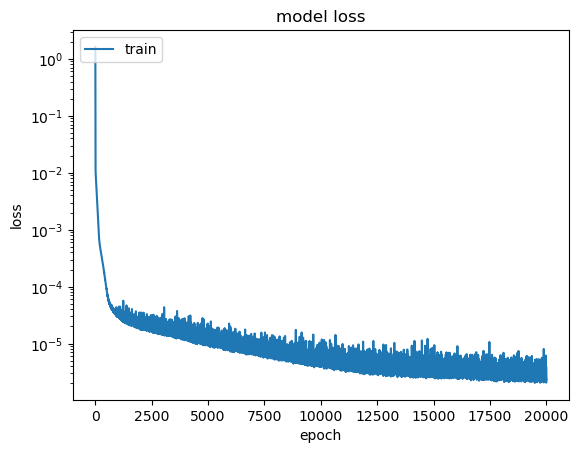

In [11]:
_ = set_train(N_mem = 20,N_rec = 10,N_budget= 100,X = T_scaled,select_idx = select_idx,L = L,params = params)